In [1]:
import torch
import torch.nn as nn
import matplotlib.pyplot as plt
import numpy as np

$$\Psi' = \alpha \Psi $$

Solution:

$$\Psi(t) = e^{\alpha t}$$

Integral form:

$$\Psi(t) = \int_0^t \alpha \Psi(s) \,ds + 1 $$

In [2]:
alpha = 0.4

N = nn.Sequential(nn.Linear(1, 15), nn.Sigmoid(), nn.Linear(15,1, bias=False))

Psi_t = lambda x: 1+x*N(x)
f_integrand = lambda x, Psi: alpha*Psi
psi_0 = 1

Psi_real = lambda x: torch.exp(alpha*x)

In [3]:
# Training Grid
n_points = 10
x_train = np.linspace(0, 2, n_points)[:, None]       # Train from 0 to 2
x = torch.Tensor(x_train)
x.requires_grad = True

In [4]:
# Different Approximation of integrals
def Trapez(t, n_rectangles):
    ''' Returns the integral between 0 and t, by dividing into n intervals'''
    x_in_the_integral = np.linspace(0, t, n_rectangles)[:, None]
    x_in_the_integral = torch.Tensor(x_in_the_integral)
    
    y = Psi_t(x_in_the_integral)
    integrand = f_integrand(x_in_the_integral, y)
    integral = torch.trapezoid(integrand[:,0], x_in_the_integral[:,0])
    
    return integral

def Rectangles(t, n_rectangles):
    
    x_in_the_integral = np.linspace(0, t, n_rectangles)[:, None]
    x_in_the_integral = torch.Tensor(x_in_the_integral)
    y = Psi_t(x_in_the_integral)
    integrand = f_integrand(x_in_the_integral, y)

    delta_x = t/(n_rectangles-1) 

    heights_left_rectangles = integrand[:,0][0:-1]  # We are taking all components except for the last
    integral = torch.sum(heights_left_rectangles)*delta_x
    
    return integral

https://discuss.pytorch.org/t/how-to-modify-the-gradient-manually/7483/3

In [5]:
time = 0.5
n_rectangles = 22
Rectangles(time,n_rectangles)

tensor(0.2147, grad_fn=<MulBackward0>)

In [6]:
Trapez(time,n_rectangles)

tensor(0.2155, grad_fn=<DivBackward1>)

In [7]:
n_int = 10

def loss(x):
    
    outputs = Psi_t(x) 
    integrals_vector = torch.tensor([[Rectangles(i, n_int) for i in x[:,0].tolist()]]) + 1
    
    final_loss = torch.mean( (outputs - integrals_vector)  ** 2)
    
    print('loss is', final_loss)

    return  final_loss

In [8]:
optimizer = torch.optim.Adam(N.parameters(), lr=0.001, betas=(0.9, 0.999), eps=1e-08, weight_decay=0, amsgrad=False)

def closure():
    optimizer.zero_grad()
    l = loss(x)
    l.backward()
    # for p in N.parameters():
    #    print("parameters are:", p)
    #    p.grad  # Access the gradients
    
    return l

In [145]:
for i in range(30):
    optimizer.step(closure)

loss is tensor(0.1638, grad_fn=<MeanBackward0>)
loss is tensor(0.1643, grad_fn=<MeanBackward0>)
loss is tensor(0.1651, grad_fn=<MeanBackward0>)
loss is tensor(0.1665, grad_fn=<MeanBackward0>)
loss is tensor(0.1683, grad_fn=<MeanBackward0>)
loss is tensor(0.1707, grad_fn=<MeanBackward0>)
loss is tensor(0.1735, grad_fn=<MeanBackward0>)
loss is tensor(0.1765, grad_fn=<MeanBackward0>)
loss is tensor(0.1795, grad_fn=<MeanBackward0>)
loss is tensor(0.1822, grad_fn=<MeanBackward0>)
loss is tensor(0.1842, grad_fn=<MeanBackward0>)
loss is tensor(0.1854, grad_fn=<MeanBackward0>)
loss is tensor(0.1859, grad_fn=<MeanBackward0>)
loss is tensor(0.1855, grad_fn=<MeanBackward0>)
loss is tensor(0.1845, grad_fn=<MeanBackward0>)
loss is tensor(0.1831, grad_fn=<MeanBackward0>)
loss is tensor(0.1813, grad_fn=<MeanBackward0>)
loss is tensor(0.1795, grad_fn=<MeanBackward0>)
loss is tensor(0.1776, grad_fn=<MeanBackward0>)
loss is tensor(0.1759, grad_fn=<MeanBackward0>)
loss is tensor(0.1744, grad_fn=<MeanBack

In [10]:
# N[0].weight.grad

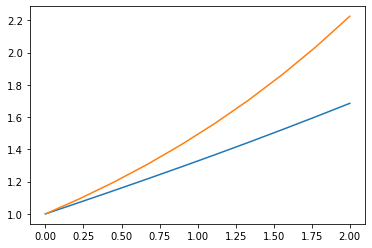

In [11]:
fig, ax = plt.subplots()
xx = x.tolist()
yy = Psi_t(x)[:,0].tolist()
yt = Psi_real(x).tolist()
ax.plot(xx, yy)
ax.plot(xx,yt)

In [12]:
loss(x).tolist()

loss is tensor(0.1793, grad_fn=<MeanBackward0>)


0.17926770448684692

In [13]:
import copy

'''
    Pure Python/Numpy implementation of the Nelder-Mead algorithm.
    Reference: https://en.wikipedia.org/wiki/Nelder%E2%80%93Mead_method
'''


def nelder_mead(f, x_start,
                step=0.1, no_improve_thr=10e-6,
                no_improv_break=10, max_iter=0,
                alpha=1., gamma=2., rho=-0.5, sigma=0.5):
    '''
        @param f (function): function to optimize, must return a scalar score
            and operate over a numpy array of the same dimensions as x_start
        @param x_start (numpy array): initial position
        @param step (float): look-around radius in initial step
        @no_improv_thr,  no_improv_break (float, int): break after no_improv_break iterations with
            an improvement lower than no_improv_thr
        @max_iter (int): always break after this number of iterations.
            Set it to 0 to loop indefinitely.
        @alpha, gamma, rho, sigma (floats): parameters of the algorithm
            (see Wikipedia page for reference)
        return: tuple (best parameter array, best score)
    '''

    # init
    dim = len(x_start)
    prev_best = f(x_start)
    no_improv = 0
    res = [[x_start, prev_best]]

    for i in range(dim):
        x = copy.copy(x_start)
        x[i] = x[i] + step
        score = f(x)
        res.append([x, score])

    # simplex iter
    iters = 0
    while 1:
        # order
        res.sort(key=lambda x: x[1])
        best = res[0][1]

        # break after max_iter
        if max_iter and iters >= max_iter:
            return res[0]
        iters += 1

        # break after no_improv_break iterations with no improvement
        print('...best so far:', best)

        if best < prev_best - no_improve_thr:
            no_improv = 0
            prev_best = best
        else:
            no_improv += 1

        if no_improv >= no_improv_break:
            return res[0]

        # centroid
        x0 = [0.] * dim
        for tup in res[:-1]:
            for i, c in enumerate(tup[0]):
                x0[i] += c / (len(res)-1)

        # reflection
        xr = x0 + alpha*(x0 - res[-1][0])
        rscore = f(xr)
        if res[0][1] <= rscore < res[-2][1]:
            del res[-1]
            res.append([xr, rscore])
            continue

        # expansion
        if rscore < res[0][1]:
            xe = x0 + gamma*(x0 - res[-1][0])
            escore = f(xe)
            if escore < rscore:
                del res[-1]
                res.append([xe, escore])
                continue
            else:
                del res[-1]
                res.append([xr, rscore])
                continue

        # contraction
        xc = x0 + rho*(x0 - res[-1][0])
        cscore = f(xc)
        if cscore < res[-1][1]:
            del res[-1]
            res.append([xc, cscore])
            continue

        # reduction
        x1 = res[0][0]
        nres = []
        for tup in res:
            redx = x1 + sigma*(tup[0] - x1)
            score = f(redx)
            nres.append([redx, score])
        res = nres


if __name__ == "__main__":
    # test
    import math
    import numpy as np

    def f(x):
        return math.sin(x[0]) * math.cos(x[1]) * (1. / (abs(x[2]) + 1))
    def g(x):
        return x**2+2
    
    
n_points = 10
x_train = np.linspace(0, 2, n_points)[:, None]       # Train from 0 to 2
x_train = torch.Tensor(x_train)
x_train.requires_grad = True

n_rectangles = 100

def loss_op(fin_weights): 
    ''' x will be the vector of weights and bias'''

    nr_nodes = int(len(fin_weights)/3)
    w_i = fin_weights[0:nr_nodes]
    u_i = fin_weights[nr_nodes:nr_nodes*2]
    v_i = fin_weights[nr_nodes*2:]

    # Setting the weights of the Neural network to these new values (in the iteration process of 
    # the optimization)
    with torch.no_grad():
        for i in range(nr_nodes):
            N[0].weight[i,0] = w_i[i]
            N[0].bias[i] = u_i[i]
            N[2].weight[0,i] = v_i[i]

    outputs = Psi_t(x_train) 
    integrals_vector = torch.tensor([[Trapez(i, n_rectangles) for i in x_train[:,0].tolist()]]) + 1

    final_loss = torch.mean( (outputs - integrals_vector) ** 2) # Tensor
    final_loss = final_loss.tolist()  # Number float and not anymore a tensor
    return final_loss
        
    

In [ ]:
for i in range(10000):
    w_i = N[0].weight[:,0].tolist()
    u_i = N[0].bias.tolist()
    v_i = N[2].weight[0,:].tolist()
    weig = np.array(w_i + u_i + v_i)

    print(nelder_mead(loss_op, weig))

...best so far: 0.17216742038726807
...best so far: 0.17078006267547607
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
...best so far: 0.17075757682323456
[array([ 4.56920859, 10.7263045 , 10.05069395,  6.07284638,  3.70885035,
        5.9454002 ,  8.85104319,  6.26200148,  5.2369847 , 10.44545885,
        3.46819207,  9.86726328,  0.35410502,  4.07309815,  2.26618787,
        1.69639858,  5.84578082,  9.33949038,  2.8157415 ,  4.22166821,
        2.43582555,  9.37739893,  2.04185649,  2.54627749,  9.33161971,
        2.01192542,  8.03251311,  2.36448332,  4.63177773,  1.98397013,
       -1.65049752,  2.07250401, -1.7438244 ,  2.7667236 ,  1.10482987,
        1.86541733, -0.2689

...best so far: 0.17235271632671356
...best so far: 0.17080232501029968
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
...best so far: 0.17075417935848236
[array([ 4.58323904, 10.78701445, 10.10191294,  6.1335549 ,  3.76955983,
        6.00610873,  8.69295164,  6.32271   ,  5.29769322, 10.3926377 ,
        3.47798106,  9.79546114,  0.35152658,  4.13380667,  2.26888152,
        1.70835408,  5.86227795,  9.38079687,  2.85434481,  4.28237673,
        2.49653503,  9.40793177,  2.10256597,  2.60698697,  9.36253783,
        2.01945111,  8.0629706 ,  2.36459824,  4.69248625,  1.98913177,
       -1.64533588,  2.09398719, -1.89200452,  2.78274008,  1.12274798,
        1.87944719, -0.3217

...best so far: 0.17221476137638092
...best so far: 0.170781210064888
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
...best so far: 0.17075955867767334
[array([ 4.59742018, 10.83802458, 10.04974505,  6.19491621,  3.83092209,
        6.06747004,  8.73573729,  6.38407132,  5.35905453, 10.45400092,
        3.48787543,  9.63844439,  0.34892043,  4.19516798,  2.27160427,
        1.72043809,  5.87846753,  9.40243575,  2.87381693,  4.34373804,
        2.55789729,  9.43863818,  2.16392824,  2.66834923,  9.40490195,
        2.02705761,  8.00004527,  2.36471459,  4.75384756,  1.99434885,
       -1.6401188 ,  2.11612317, -1.94499961,  2.7989287 ,  1.14085873,
        1.89362785, -0.383042

...best so far: 0.17241227626800537
...best so far: 0.17081224918365479
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
...best so far: 0.17076511681079865
[array([ 4.61145064, 10.87756964, 10.110455  ,  6.25562474,  3.89163157,
        6.12817856,  8.77618166,  6.44477984,  5.41976305, 10.30582186,
        3.49766442,  9.67189452,  0.34634199,  4.25587651,  2.27429792,
        1.73239359,  5.89496466,  9.34921023,  2.91242024,  4.40444657,
        2.61860677,  9.37592265,  2.2142851 ,  2.72905871,  9.43670031,
        2.0345833 ,  8.03099963,  2.36482951,  4.81455609,  1.99951049,
       -1.63495716,  2.13801023, -2.0931795 ,  2.81494519,  1.15877684,
        1.90765771, -0.4358

...best so far: 0.17227832973003387
...best so far: 0.17079925537109375
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
...best so far: 0.17077895998954773
[array([ 4.62563177, 10.93893286, 10.06737372,  6.31698605,  3.95299384,
        6.18953987,  8.82845827,  6.50614115,  5.48112437, 10.25324961,
        3.50755879,  9.71425864,  0.34373584,  4.31723782,  2.27702066,
        1.7444776 ,  5.91115424,  9.28755137,  2.95307728,  4.46580788,
        2.67996904,  9.4087958 ,  2.25402185,  2.79042097,  9.4579539 ,
        2.0421898 ,  8.06082484,  2.36494585,  4.8759174 ,  2.00472804,
       -1.62974008,  2.1601462 , -2.24070624,  2.83113381,  1.1768876 ,
        1.92183837, -0.4975

...best so far: 0.17248721420764923
...best so far: 0.17083847522735596
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
...best so far: 0.17079301178455353
[array([ 4.63966223, 10.97933909, 10.11817118,  6.37769457,  4.01370283,
        6.2502484 ,  8.88916823,  6.56684967,  5.54183289, 10.20951506,
        3.51734778,  9.65194651,  0.3411574 ,  4.37794634,  2.27971431,
        1.75643309,  5.92765137,  9.31933161,  2.99168059,  4.5265164 ,
        2.74067851,  9.45010229,  2.2940261 ,  2.85113045,  9.40430781,
        2.04971548,  7.98773857,  2.36506077,  4.93662592,  2.00989005,
       -1.62457844,  2.18245503, -2.28444127,  2.84715029,  1.19480571,
        1.93586823, -0.6547

...best so far: 0.17235788702964783
...best so far: 0.17083436250686646
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
...best so far: 0.1708160936832428
[array([ 4.65384337, 11.04070231, 10.17004343,  6.43905589,  4.07506415,
        6.31160971,  8.73172995,  6.62821099,  5.6031942 , 10.14743468,
        3.52724215,  9.68351694,  0.33855125,  4.43930766,  2.28243705,
        1.7685171 ,  5.94384095,  9.38069483,  3.03141734,  4.58787772,
        2.80204078,  9.49248358,  2.34503576,  2.91249272,  9.33058878,
        2.05732199,  8.01884886,  2.36517712,  4.99798724,  2.0151076 ,
       -1.61936137,  2.11005851, -2.33660987,  2.86333891,  1.21291646,
        1.95004889, -0.63058135,  0.81

...best so far: 0.17257656157016754
...best so far: 0.17088031768798828
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
...best so far: 0.17083728313446045
[array([ 4.66787382, 11.08200976, 10.21994063,  6.49976441,  4.13577267,
        6.37231823,  8.78252837,  6.68891951,  5.66390273, 10.10370013,
        3.53703114,  9.73514029,  0.33597281,  4.50001618,  2.2851307 ,
        1.7804726 ,  5.95985791,  9.32746931,  3.07050129,  4.64858624,
        2.86275026,  9.33521792,  2.38504001,  2.97320219,  9.35245654,
        2.06484767,  8.04071566,  2.36529204,  5.05869576,  2.0202696 ,
       -1.61419972,  2.13238522, -2.2759004 ,  2.8793554 ,  1.23083457,
        1.96407875, -0.7977

...best so far: 0.17245368659496307
...best so far: 0.17088638246059418
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
...best so far: 0.1708708554506302
[array([ 4.68205496, 11.14337298, 10.17685934,  6.56112572,  4.19713398,
        6.43367955,  8.72127386,  6.75028082,  5.72526404, 10.14521929,
        3.54692551,  9.76801344,  0.33336666,  4.56137749,  2.28785344,
        1.79255661,  5.97604748,  9.27357527,  3.11023804,  4.70994755,
        2.92411252,  9.38749453,  2.41532489,  3.03456446,  9.28997179,
        2.07245418,  8.06196925,  2.36540839,  5.12005707,  2.02548715,
       -1.60898265,  2.15452119, -2.2236245 ,  2.89554402,  1.24894532,
        1.97825941, -0.96428535,  0.83

...best so far: 0.17267970740795135
...best so far: 0.1709372103214264
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
...best so far: 0.17089739441871643
[array([ 4.69608542, 11.1937308 , 10.21816584,  6.62183424,  4.25784251,
        6.49438807,  8.65727373,  6.81098935,  5.78597256, 10.19557616,
        3.5567145 ,  9.81963679,  0.33078822,  4.62208601,  2.28861996,
        1.80451211,  5.99206444,  9.12539622,  3.16013476,  4.77065607,
        2.984822  ,  9.31609579,  2.46568176,  3.09527394,  9.32088801,
        2.07997986,  8.09204241,  2.36745044,  5.18076559,  2.03064915,
       -1.603821  ,  2.17640826, -2.16291503,  2.9115605 ,  1.26686343,
        1.99228927, -1.13104

...best so far: 0.17256170511245728
...best so far: 0.17095093429088593
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
...best so far: 0.17093884944915771
[array([ 4.71026656, 11.15064951, 10.15608546,  6.68319556,  4.31920382,
        6.55574938,  8.70005938,  6.87235066,  5.84733387, 10.25693938,
        3.56660887,  9.88100001,  0.32818207,  4.68344733,  2.28873631,
        1.81659612,  6.00825402,  9.06331583,  3.18997904,  4.83201739,
        3.04618427,  9.33863303,  2.48425313,  3.1566362 ,  9.37316462,
        2.08758637,  8.02913615,  2.37266799,  5.24212691,  2.03337189,
       -1.59860393,  2.19938775, -2.31044177,  2.92774912,  1.28497418,
        2.00646993, -1.2022

...best so far: 0.17271926999092102
...best so far: 0.1709989607334137
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
...best so far: 0.1709742397069931
[array([ 4.72427746, 11.09548231, 10.19585463,  6.74196192,  4.37797018,
        6.61451575,  8.7588267 ,  6.93111702,  5.90610024, 10.3157067 ,
        3.57655331,  9.83532282,  0.32939371,  4.74221369,  2.28750345,
        1.82861802,  6.02416989,  9.11259219,  3.22758051,  4.89078375,
        3.10495111,  9.38748785,  2.42776271,  3.21540305,  9.29982325,
        2.09536072,  8.04906126,  2.37817618,  5.30089327,  2.03528973,
       -1.59418997,  2.12481758, -2.2607613 ,  2.94278427,  1.30187019,
        2.01956197, -1.24788788,  0.862

...best so far: 0.17286548018455505
...best so far: 0.17104898393154144
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
...best so far: 0.17101053893566132
[array([ 4.73831173, 11.13578936, 10.234858  ,  6.80167004,  4.4376783 ,
        6.67422387,  8.81853529,  6.99082514,  5.96580836, 10.36550375,
        3.58588931,  9.68614241,  0.33233398,  4.80192181,  2.28528592,
        1.84062156,  6.04014679,  9.1446366 ,  3.26612421,  4.95049187,
        3.16466018,  9.43770644,  2.38302728,  3.27511212,  9.22659918,
        2.10131403,  8.08850523,  2.38579556,  5.36060139,  2.03570696,
       -1.58943137,  2.06150552, -2.41943148,  2.95828101,  1.31924805,
        2.03309413, -1.3116

...best so far: 0.17106541991233826
[array([ 4.75235967, 11.19514255, 10.28429966,  6.86102323,  4.49703149,
        6.73357706,  8.76435737,  7.05017833,  6.02516155, 10.41577034,
        3.59187822,  9.72651558,  0.33952166,  4.861275  ,  2.28321437,
        1.85265641,  6.05664711,  9.19363765,  3.29375581,  5.00984506,
        3.22401337,  9.38312511,  2.42117528,  3.33446531,  9.1616085 ,
        2.10435919,  8.02441577,  2.39572768,  5.41995458,  2.03624968,
       -1.58483418,  2.09238796, -2.36007829,  2.97390251,  1.33673112,
        2.04677252, -1.36662538,  0.77718954,  1.85919981,  0.21237643,
       -4.44914914, -0.38194667, -0.02369017,  1.66271679, -2.57687588]), 0.17106541991233826]
...best so far: 0.17126867175102234
...best so far: 0.17126867175102234
...best so far: 0.17112234234809875
...best so far: 0.1710459589958191
...best so far: 0.1710459589958191
...best so far: 0.1710459589958191
...best so far: 0.17103111743927002
...best so far: 0.17103111743927002
...best

...best so far: 0.17210158705711365
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
...best so far: 0.17111323773860931
[array([ 4.76364263, 11.25412973, 10.30227979,  6.92001089,  4.55601915,
        6.79256471,  8.81343302,  7.10916599,  6.08414921, 10.37031301,
        3.59760555,  9.66248163,  0.37318012,  4.92026266,  2.2815195 ,
        1.86124715,  6.07090124,  9.22287115,  3.33063754,  5.06883272,
        3.28300103,  9.32817777,  2.46935018,  3.39345297,  9.09797891,
        2.10771927,  8.05449327,  2.43103584,  5.47894224,  2.03713735,
       -1.67637405,  2.01884636, -2.31058089,  2.98817619,  1.35290786,
        2.05905923, -1.33570448,  0.88967731,  1.86941108,  0.0

...best so far: 0.17255628108978271
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
...best so far: 0.17112262547016144
[array([ 4.7734898 , 11.30273947, 10.35129293,  6.97811016,  4.61411842,
        6.85066398,  8.76708826,  7.16726526,  6.14224848, 10.40941461,
        3.60306867,  9.59629377,  0.43127971,  4.97836193,  2.2796472 ,
        1.86894974,  6.08428701,  9.2809709 ,  3.35383114,  5.12693199,
        3.33028778,  9.26283487,  2.49545153,  3.45155247,  9.12674555,
        2.11084279,  7.97751173,  2.48913535,  5.53704151,  2.03781756,
       -1.67202959,  2.04847511, -2.25248138,  3.00302466,  1.36959716,
        2.07198604, -1.49558023,  0.89849933,  1.88033017, -0.1

...best so far: 0.17234277725219727
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
...best so far: 0.17117036879062653
[array([ 4.78372844, 11.34071955, 10.37799963,  7.03552898,  4.67153724,
        6.90808281,  8.71057256,  7.22468408,  6.1996673 , 10.44783529,
        3.60902056,  9.52942594,  0.48869877,  5.03578075,  2.27842649,
        1.87709125,  6.0965341 ,  9.30990156,  3.41124996,  5.18435081,
        3.3877066 ,  9.2995294 ,  2.55287036,  3.5089713 ,  9.04906496,
        2.11450681,  8.01466688,  2.54655417,  5.59446033,  2.03909262,
       -1.66836557,  2.07742318, -2.30859343,  3.01719245,  1.38560601,
        2.08423218, -1.54260544,  0.90664085,  1.89056882, -0.1

...best so far: 0.17219915986061096
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
...best so far: 0.17124871909618378
[array([ 4.79396709, 11.38864836, 10.43541845,  7.09294781,  4.72895607,
        6.96550163,  8.74981817,  7.28210291,  6.25708612, 10.47636255,
        3.61497244,  9.47248873,  0.54611799,  5.09319958,  2.27720579,
        1.88523277,  6.10878118,  9.35740885,  3.34305962,  5.24176964,
        3.44512543,  9.33668455,  2.56795939,  3.56639012,  9.08831056,
        2.11817082,  8.06127294,  2.603973  ,  5.65187916,  2.04036769,
       -1.66470156,  2.00233074, -2.2511746 ,  3.02991899,  1.40161487,
        2.09791955, -1.70316163,  0.91478237,  1.90080746, -0.1

...best so far: 0.1720908284187317
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
...best so far: 0.17133761942386627
[array([ 4.80420574, 11.44606718, 10.38839277,  7.15036663,  4.78637489,
        7.02292045,  8.77917036,  7.33952173,  6.31450495, 10.53378137,
        3.62092432,  9.41597303,  0.60353729,  5.1506184 ,  2.27598509,
        1.89337429,  6.12384924,  9.41482767,  3.35672721,  5.29918846,
        3.48272022,  9.27974733,  2.58164748,  3.62380894,  9.02311167,
        2.12183484,  8.09020361,  2.66139182,  5.70929798,  2.04164275,
       -1.66103754,  2.04076918, -2.19375578,  3.04216512,  1.41762372,
        2.11208733, -1.96816233,  0.92292389,  1.91104611, -0.19

...best so far: 0.17263425886631012
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
...best so far: 0.1713099479675293
[array([ 4.8140529 , 11.50416693, 10.42705377,  7.2084659 ,  4.84447416,
        7.08101972,  8.7134231 ,  7.397621  ,  6.37260422, 10.37217935,
        3.62638744,  9.44681295,  0.66163709,  5.20871767,  2.27411279,
        1.90107688,  6.13677677,  9.45310339,  3.40250715,  5.35728773,
        3.53000697,  9.31668218,  2.62795171,  3.68190845,  8.94829687,
        2.12495836,  8.11678537,  2.71949133,  5.76739725,  2.04232296,
       -1.65669308,  2.07080182, -2.24010078,  3.05358561,  1.43431302,
        2.1269358 , -2.12803808,  0.93174591,  1.92347082, -0.15934304,
  

...best so far: 0.17252923548221588
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
...best so far: 0.1713670939207077
[array([ 4.82429155, 11.55077299, 10.47498258,  7.26588472,  4.90189298,
        7.13843855,  8.64739927,  7.45503982,  6.43002304, 10.41968664,
        3.63233932,  9.46496996,  0.71905639,  5.26613649,  2.27289208,
        1.9092184 ,  6.14902385,  9.28265318,  3.44911345,  5.41470655,
        3.58742579,  9.35466226,  2.67501816,  3.73932728,  8.97678694,
        2.12862238,  8.04813417,  2.77691015,  5.82481607,  2.04359802,
       -1.65302906,  2.10964402, -2.28712646,  3.06382331,  1.45032188,
        2.14110359, -2.088792  ,  0.93988743,  1.93571695, -0.224945  ,
  

...best so far: 0.17244954407215118
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
...best so far: 0.17143595218658447
[array([ 4.8345302 , 11.4942573 , 10.5233148 ,  7.32330354,  4.95931181,
        7.19585737,  8.69490656,  7.51245865,  6.48744186, 10.46761545,
        3.6382912 ,  9.51247724,  0.77647569,  5.32355531,  2.27167138,
        1.91735991,  6.16127094,  9.33016046,  3.46512278,  5.47212538,
        3.6349326 ,  9.19370207,  2.6891869 ,  3.7967461 ,  9.03420576,
        2.13228639,  7.98293527,  2.83432897,  5.8822349 ,  2.04487308,
       -1.64936504,  2.13939985, -2.43859664,  3.074061  ,  1.46633073,
        2.15527138, -2.05984393,  0.94802895,  1.94796308, -0.1

...best so far: 0.172386035323143
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
...best so far: 0.1715121865272522
[array([ 4.84476885, 11.55167612, 10.46720251,  7.38072237,  5.01673063,
        7.25327619,  8.74241384,  7.56987747,  6.54486069, 10.41109976,
        3.64424309,  9.44727834,  0.83389499,  5.38097414,  2.27045068,
        1.92550143,  6.17681917,  9.38757929,  3.47833022,  5.5295442 ,
        3.67294916,  9.24163088,  2.70285448,  3.85416492,  9.0627149 ,
        2.13595041,  8.03086408,  2.8917478 ,  5.93965372,  2.04614815,
       -1.64570103,  2.08288392, -2.59006683,  3.08429869,  1.48233959,
        2.16943916, -2.0300881 ,  0.95617046,  1.96020921, -0.23312782,
    

...best so far: 0.17233501374721527
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
...best so far: 0.17159457504749298
[array([ 4.85500749, 11.60909494, 10.42017683,  7.43814119,  5.07414945,
        7.31069502,  8.68589815,  7.62729629,  6.60227951, 10.45943197,
        3.65019497,  9.49520716,  0.89131429,  5.43839296,  2.26922997,
        1.93364295,  6.19326814,  9.4359115 ,  3.4919978 ,  5.58696302,
        3.69024118,  9.18511518,  2.71606191,  3.91158375,  8.99669107,
        2.13961443,  8.0791963 ,  2.94916662,  5.99707254,  2.04742321,
       -1.64203701,  2.02677187, -2.74153701,  3.09453639,  1.49834844,
        2.18360695, -2.00033227,  0.96431198,  1.97245535, -0.1

...best so far: 0.1729227900505066
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
...best so far: 0.17156299948692322
[array([ 4.86485466, 11.64735159, 10.46792444,  7.49624046,  5.13224872,
        7.36879429,  8.71378263,  7.68539556,  6.66037878, 10.28837808,
        3.65565809,  9.53473028,  0.9494141 ,  5.49649223,  2.2692295 ,
        1.94134554,  6.20619568,  9.4741691 ,  3.53777775,  5.64506229,
        3.73752793,  9.22158941,  2.75245413,  3.96968325,  8.82690367,
        2.14273795,  8.12820944,  3.00726613,  6.05517181,  2.04623159,
       -1.63769255,  1.96185037, -2.70161024,  3.10545477,  1.51503774,
        2.19749459, -1.96121303,  0.97313401,  1.98634299, -0.33

...best so far: 0.1728464663028717
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
...best so far: 0.1716155856847763
[array([ 4.87509331, 11.69485887, 10.52534326,  7.55365928,  5.18966755,
        7.42621311,  8.75262483,  7.74281439,  6.7177976 , 10.33588537,
        3.66160997,  9.57274755,  1.0068334 ,  5.55391105,  2.27050456,
        1.94948705,  6.21844276,  9.51341471,  3.58528456,  5.70248112,
        3.79494675,  9.24967607,  2.77789553,  4.02710184,  8.56017622,
        2.14640197,  8.04966673,  3.06468495,  6.11259064,  2.04501089,
       -1.63402853,  1.99120268, -2.74863592,  3.11569246,  1.53104659,
        2.21118196, -2.12176934,  0.98127552,  1.99906966, -0.3916961 ,
   

...best so far: 0.17278021574020386
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
...best so far: 0.17166666686534882
[array([ 4.88533195, 11.7522777 , 10.46923097,  7.61107811,  5.24708637,
        7.48363193,  8.79146704,  7.80023321,  6.77521642, 10.37432417,
        3.66756185,  9.5058988 ,  1.0642527 ,  5.61132988,  2.27177962,
        1.95762857,  6.23353084,  9.57083353,  3.59801134,  5.75989994,
        3.84327921,  9.29760488,  2.79250392,  4.08452066,  8.503239  ,
        2.15006598,  7.99272951,  3.12210377,  6.17000946,  2.04379019,
       -1.52420453,  1.93509098, -2.90919248,  3.12593015,  1.54705545,
        2.22438892, -2.18696777,  0.98941704,  2.01227673, -0.3

...best so far: 0.1727096140384674
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
...best so far: 0.1717158555984497
[array([ 4.8955706 , 11.80060991, 10.41229376,  7.66849693,  5.30450519,
        7.54105076,  8.74444135,  7.85765203,  6.83263525, 10.42265638,
        3.67351373,  9.55423101,  1.121672  ,  5.6687487 ,  2.27305468,
        1.96577009,  6.24857935,  9.60927233,  3.61213907,  5.81731876,
        3.76607736,  9.34553369,  2.806192  ,  4.14193949,  8.55157121,
        2.15373   ,  7.93621382,  3.1795226 ,  6.22742828,  2.04256948,
       -1.51825312,  1.76504453, -2.85177366,  3.13616785,  1.5630643 ,
        2.23711547, -2.23399345,  0.99755856,  2.02596411, -0.40896547,
   

...best so far: 0.17263343930244446
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
...best so far: 0.17175906896591187
[array([ 4.90580925, 11.85802873, 10.45113596,  7.72591575,  5.36192402,
        7.59846958,  8.68792566,  7.91507086,  6.89005407, 10.46149858,
        3.67946562,  9.60215982,  1.1790913 ,  5.72616752,  2.27432975,
        1.97391161,  6.26635011,  9.65760454,  3.62486585,  5.87473758,
        3.78208669,  9.29850801,  2.81988009,  4.19935831,  8.60899004,
        2.15739402,  7.98454651,  3.23694142,  6.2848471 ,  2.04134878,
       -1.51230172,  1.78611788, -2.79435483,  3.14640554,  1.58083555,
        2.2493616 , -2.28101913,  1.00570008,  2.04013189, -0.5

...best so far: 0.17269428074359894
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
...best so far: 0.17176225781440735
[array([ 4.91620716, 11.90652021, 10.49013742,  7.78349384,  5.4195021 ,
        7.65604767,  8.74550375,  7.97264894,  6.94763216, 10.31018766,
        3.68557676,  9.65973791,  1.23666998,  5.78374561,  2.27576407,
        1.98221251,  6.28428015,  9.5917581 ,  3.63727125,  5.93231567,
        3.79825529,  9.34699949,  2.8342081 ,  4.2569364 ,  8.55263361,
        2.1612173 ,  8.04212412,  3.29451975,  6.34242519,  2.03295764,
       -1.50619093,  1.52127656, -2.73677651,  3.15680274,  1.59876617,
        2.26176723, -2.2234408 ,  1.01400098,  2.05491933, -0.6

...best so far: 0.17275303602218628
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
...best so far: 0.17176376283168793
[array([ 4.92660507, 11.9640983 , 10.5386289 ,  7.84107193,  5.47708019,
        7.71362575,  8.69863733,  8.03022703,  7.00521024, 10.35827574,
        3.69168791,  9.717316  ,  1.29424866,  5.8413237 ,  2.2771984 ,
        1.99051341,  6.30221018,  9.63035616,  3.64967665,  5.98989376,
        3.81442388,  9.38600096,  2.8485361 ,  4.31451448,  8.40132269,
        2.16504058,  7.98617157,  3.35209807,  6.40000328,  2.0245665 ,
       -1.50008014,  1.56976875, -2.99253169,  3.16770204,  1.6166968 ,
        2.27513369, -2.16586248,  1.02230188,  2.07108721, -0.6

...best so far: 0.1726696640253067
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
...best so far: 0.1718025952577591
[array([ 4.93684372, 11.91707262, 10.3776687 ,  7.89849075,  5.53449901,
        7.77104458,  8.73788294,  8.08764585,  7.06262907, 10.41569456,
        3.69763979,  9.7561582 ,  1.35166796,  5.89874252,  2.27847346,
        1.99865493,  6.31998094,  9.58333048,  3.66192278,  6.04731258,
        3.83043321,  9.43392977,  2.86270484,  4.37193331,  8.44016489,
        2.16870459,  8.04358991,  3.4095169 ,  6.4574221 ,  2.02334579,
       -1.49412874,  1.60901507, -3.03955737,  3.17844185,  1.63446804,
        2.28834065, -2.21288816,  1.03044339,  2.08709558, -0.60583386,
   

...best so far: 0.17272233963012695
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
...best so far: 0.17180082201957703
[array([ 4.94724163, 11.96516069, 10.43524679,  7.95606884,  5.5920771 ,
        7.82862266,  8.79546102,  8.14522394,  7.12020716, 10.46378263,
        3.70375093,  9.69031175,  1.40924665,  5.95632061,  2.27990779,
        2.00695571,  6.33791097,  9.53646406,  3.67480882,  6.10489067,
        3.84660181,  9.48242124,  2.87655219,  4.42951139,  8.38421186,
        2.17252787,  7.98763737,  3.46709522,  6.51500019,  2.01495465,
       -1.48801795,  1.55306276, -3.08642355,  3.18984326,  1.65239867,
        2.30218753, -2.25975434,  1.03874429,  2.10326346, -0.5

...best so far: 0.17277324199676514
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
...best so far: 0.17179875075817108
[array([ 4.95763954, 12.01324877, 10.38838037,  8.01364645,  5.64965519,
        7.88620075,  8.8439525 ,  8.20280203,  7.17778524, 10.4074262 ,
        3.70986208,  9.73839983,  1.46682533,  6.01389869,  2.28134211,
        2.01525649,  6.35584101,  9.48959764,  3.68721422,  6.16246876,
        3.8627704 ,  9.53091272,  2.89088019,  4.48708948,  8.31876882,
        2.17635115,  8.03612837,  3.52467355,  6.57257828,  2.00656351,
       -1.48190716,  1.49711045, -3.13328973,  3.2022489 ,  1.6703293 ,
        2.31651481, -2.30662051,  1.0470452 ,  2.11943134, -0.4

...best so far: 0.1726834923028946
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
...best so far: 0.17183534801006317
[array([ 4.96787819, 11.96622309, 10.43671259,  8.07106527,  5.70707401,
        7.94361957,  8.78784021,  8.26022085,  7.23520407, 10.45575842,
        3.71581396,  9.76734861,  1.52424463,  6.07131752,  2.28261718,
        2.02339801,  6.37361177,  9.54701647,  3.69946035,  6.21988758,
        3.87877973,  9.57884153,  2.90504893,  4.5445083 ,  8.16729864,
        2.18001517,  8.08446058,  3.58209237,  6.6299971 ,  2.00534281,
       -1.47595576,  1.44099876, -3.18031541,  3.21449503,  1.68810054,
        2.3306826 , -2.25828806,  1.05518671,  2.13543972, -0.54

...best so far: 0.17272934317588806
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
...best so far: 0.17183132469654083
[array([ 4.9782761 , 12.02380117, 10.48520407,  8.12864336,  5.7646521 ,
        8.00119766,  8.72239717,  8.31779894,  7.29278215, 10.50424989,
        3.7219251 ,  9.81543669,  1.58182331,  6.1288956 ,  2.2840515 ,
        2.03169879,  6.3915418 ,  9.58561453,  3.71186575,  6.27746567,
        3.89494833,  9.53197511,  2.91937693,  4.60208639,  8.21579012,
        2.18383845,  8.03759416,  3.63967069,  6.68757519,  1.99695178,
       -1.46984497,  1.37595996, -3.12273709,  3.22690066,  1.70603117,
        2.34500989, -2.30515424,  1.06348761,  2.1516076 , -0.5

...best so far: 0.17277410626411438
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
...best so far: 0.1718277782201767
[array([ 4.98867401, 12.07229265, 10.52420553,  8.18622144,  5.82223018,
        8.05877527,  8.77048525,  8.37537702,  7.35036024, 10.45738348,
        3.72803625,  9.66412576,  1.639402  ,  6.18647369,  2.28548583,
        2.03999957,  6.40947183,  9.61512598,  3.72427114,  6.33504375,
        3.91111692,  9.5895532 ,  2.93370494,  4.65966448,  8.2733682 ,
        2.18766173,  7.99072775,  3.69724902,  6.74515327,  1.98856088,
       -1.46373419,  1.43353864, -3.16960326,  3.2393063 ,  1.72396179,
        2.35933718, -2.36110679,  1.07178851,  2.16777548, -0.64051995,
  

...best so far: 0.17281858623027802
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
...best so far: 0.17182525992393494
[array([ 4.99907192, 12.12038072, 10.58178362,  8.24379953,  5.87980827,
        8.11635336,  8.72361883,  8.43295511,  7.40793833, 10.41051706,
        3.73414739,  9.60776933,  1.69698068,  6.24405178,  2.28692015,
        2.04830035,  6.42740186,  9.67270407,  3.73667654,  6.39262184,
        3.92728552,  9.63804468,  2.94803294,  4.70775255,  8.21701177,
        2.19148501,  8.02104696,  3.75482734,  6.80273136,  1.98016998,
       -1.4576234 ,  1.27314183, -3.21646944,  3.25171193,  1.74189242,
        2.37366446, -2.30352846,  1.08008941,  2.18394336, -0.5

...best so far: 0.17272134125232697
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
...best so far: 0.1718604415655136
[array([ 5.00931057, 12.06386503, 10.63920244,  8.30121835,  5.93722709,
        8.17377218,  8.66750654,  8.49037393,  7.46535715, 10.35400137,
        3.74009928,  9.64619001,  1.75439998,  6.3014706 ,  2.28819522,
        2.05644187,  6.44559463,  9.73012289,  3.74892267,  6.45004066,
        3.94329485,  9.68637689,  2.96220168,  4.76517137,  8.26494058,
        2.19514903,  7.96493467,  3.81224617,  6.86015018,  1.97894975,
       -1.45167199,  1.32147464, -3.47238413,  3.26395806,  1.75966367,
        2.38783225, -2.24610964,  1.08823093,  2.19995173, -0.53460846,
  

...best so far: 0.17276142537593842
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
...best so far: 0.17185625433921814
[array([ 5.01970848, 12.11235651, 10.59233602,  8.35879644,  5.99480518,
        8.23135027,  8.71599802,  8.54795202,  7.52293524, 10.40249285,
        3.74621042,  9.59932359,  1.81197866,  6.35904869,  2.28962954,
        2.06474265,  6.46352466,  9.78770098,  3.76132807,  6.50761875,
        3.95946344,  9.74395498,  2.97652968,  4.79427942,  8.11362966,
        2.19897231,  8.01302274,  3.86982449,  6.91772827,  1.97055885,
       -1.44556121,  1.26552233, -3.51925031,  3.27636369,  1.77759429,
        2.40215954, -2.18853132,  1.09705611,  2.21611961, -0.6

...best so far: 0.17280054092407227
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
...best so far: 0.1718519628047943
[array([ 5.03010639, 12.16993459, 10.54546961,  8.41637453,  6.05238327,
        8.28892835,  8.66004499,  8.60553011,  7.58051332, 10.44189771,
        3.75232157,  9.64741167,  1.86955735,  6.41662678,  2.29106387,
        2.07304343,  6.4822987 ,  9.84527906,  3.77373346,  6.56519684,
        3.97563204,  9.79244646,  2.99085768,  4.82254347,  8.06676325,
        2.20279559,  7.9661568 ,  3.92740282,  6.97530636,  1.96216794,
       -1.43945042,  1.28675505, -3.46167198,  3.28876933,  1.79552492,
        2.41648682, -2.13095299,  1.10692986,  2.23228749, -0.94167343,
  

...best so far: 0.1728387326002121
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
...best so far: 0.17184802889823914
[array([ 5.0405043 , 12.00953707, 10.60304769,  8.47395262,  6.10996135,
        8.34650644,  8.70853647,  8.66310819,  7.63809141, 10.4994758 ,
        3.75843271,  9.60054525,  1.92713603,  6.46511873,  2.2924982 ,
        2.08134421,  6.50022873,  9.79841265,  3.78613886,  6.62277492,
        3.99180063,  9.85002455,  3.00518569,  4.86114153,  8.11525472,
        2.20661887,  8.0142444 ,  3.98498114,  7.02339443,  1.95377704,
       -1.43333963,  1.34433373, -3.61298267,  3.30117496,  1.81387731,
        2.43081411, -2.28226367,  1.11732789,  2.24845537, -0.89

...best so far: 0.17273682355880737
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
...best so far: 0.17188270390033722
[array([ 5.05074295, 12.06695589, 10.66046652,  8.53137144,  6.16738018,
        8.40392526,  8.76595529,  8.72052702,  7.69551023, 10.54780802,
        3.76438459,  9.54443296,  1.98455533,  6.41809305,  2.29377326,
        2.08948573,  6.5192655 ,  9.85583147,  3.79838499,  6.68019375,
        4.00780948,  9.90744337,  3.01935443,  4.8793343 ,  8.05914243,
        2.21028289,  7.96721872,  4.04239973,  7.07172712,  1.95255681,
       -1.42738823,  1.27873179, -3.55556384,  3.31342109,  1.83164855,
        2.4449819 , -2.32928935,  1.12756654,  2.26446375, -1.0

...best so far: 0.17277172207832336
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
...best so far: 0.17187759280204773
[array([ 5.06114086, 12.02008947, 10.7180446 ,  8.58894953,  6.22495827,
        8.46150335,  8.81444677,  8.7781051 ,  7.75308832, 10.5009416 ,
        3.77049574,  9.48847994,  2.04213365,  6.47567114,  2.29520758,
        2.09778651,  6.53846153,  9.90432295,  3.81079038,  6.73777183,
        4.02397712,  9.95593485,  3.03368243,  4.89768633,  8.11672052,
        2.21410617,  7.9203523 ,  4.09997782,  7.12930521,  1.94416591,
       -1.42127744,  1.22237572, -3.49798552,  3.32582673,  1.84957918,
        2.45930918, -2.37615553,  1.13796457,  2.28063163, -1.1

...best so far: 0.1728070080280304
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
...best so far: 0.1718735247850418
[array([ 5.07153877, 12.07766756, 10.77562269,  8.64652761,  6.28253635,
        8.51908144,  8.76758035,  8.83568319,  7.81066641, 10.44498857,
        3.77660688,  9.53656801,  2.09971198,  6.53324922,  2.29664191,
        2.10608729,  6.55848345,  9.96190103,  3.82319578,  6.79534992,
        4.04014477, 10.01351293,  3.04801043,  4.91561636,  8.17429861,
        2.21792945,  7.87348589,  4.1575559 ,  7.06426653,  1.93577501,
       -1.41516665,  1.15733691, -3.44040719,  3.33823236,  1.86750981,
        2.47363647, -2.42302171,  1.1483626 ,  2.29679951, -1.15655545,
   

...best so far: 0.17284221947193146
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
...best so far: 0.1718701422214508
[array([ 5.08193668, 12.12615904, 10.83320078,  8.7041057 ,  6.34011444,
        8.57665952,  8.82515844,  8.89326128,  7.86824449, 10.49348005,
        3.78271803,  9.58505949,  2.1572903 ,  6.59082731,  2.29807624,
        2.11438807,  6.57810148,  9.91503462,  3.83560118,  6.85292801,
        4.05631241,  9.96664652,  3.06233844,  4.93354639,  8.2318767 ,
        2.22175273,  7.82661947,  4.21513399,  7.00831398,  1.9273841 ,
       -1.40905586,  1.2149156 , -3.38282887,  3.350638  ,  1.88544043,
        2.48796376, -2.57433239,  1.15876063,  2.31296738, -1.31695226,
  

...best so far: 0.17287711799144745
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
...best so far: 0.17186710238456726
[array([ 5.09233459, 12.07929262, 10.89077886,  8.76168379,  6.39769253,
        8.63423761,  8.88273653,  8.95083936,  7.92582258, 10.55105814,
        3.78882917,  9.62446436,  2.21486863,  6.6484054 ,  2.29951056,
        2.12268885,  6.59771951,  9.9726127 ,  3.84800657,  6.91050609,
        4.07248005, 10.00605139,  3.07666644,  4.95147642,  8.18501028,
        2.22557601,  7.77975305,  4.27271208,  7.06589206,  1.9189932 ,
       -1.40294508,  1.14947304, -3.42969505,  3.36304363,  1.90379282,
        2.50229105, -2.62119857,  1.16915866,  2.32913526, -1.2

...best so far: 0.17276844382286072
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
...best so far: 0.17189891636371613
[array([ 5.10257324, 12.11853822, 10.94819769,  8.81910261,  6.45511135,
        8.69165643,  8.73126634,  9.00825819,  7.9832414 , 10.50403246,
        3.79478105,  9.67279657,  2.27228745,  6.70582422,  2.30078563,
        2.13083037,  6.61675628, 10.03003153,  3.8602527 ,  6.96792492,
        4.08848842, 10.06347021,  3.09083518,  4.9791592 ,  8.11940798,
        2.22924002,  7.83717188,  4.3301309 ,  7.12331089,  1.91777297,
       -1.39699367,  0.99800339, -3.37227622,  3.37528976,  1.92363688,
        2.51645883, -2.56377975,  1.17939731,  2.34514364, -1.3

...best so far: 0.1727989912033081
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
...best so far: 0.17189262807369232
[array([ 5.11297115, 12.17611631, 10.90133127,  8.8766807 ,  6.51268944,
        8.74923452,  8.77975782,  9.06583627,  8.04081949, 10.45716604,
        3.8008922 ,  9.72128805,  2.32986578,  6.76340231,  2.30221995,
        2.13913115,  6.64586433,  9.98316511,  3.8726581 ,  7.01601299,
        4.10465606, 10.11196169,  3.10516318,  4.99708923,  8.07254156,
        2.2330633 ,  7.89474996,  4.38770899,  7.18088897,  1.90938207,
       -1.39088289,  0.74224868, -3.3146979 ,  3.3876954 ,  1.94325455,
        2.53078612, -2.50620142,  1.18979534,  2.36263331, -1.26

...best so far: 0.17282988131046295
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
...best so far: 0.17188730835914612
[array([ 5.12336906, 12.22460779, 10.95890936,  8.93425878,  6.57026752,
        8.80681261,  8.83733591,  9.12341436,  8.09839758, 10.51474413,
        3.80700334,  9.77886614,  2.3874441 ,  6.81189426,  2.30365428,
        2.14743193,  6.68486627,  9.93629869,  3.88506349,  7.07359108,
        4.12082371, 10.05600866,  3.11949118,  5.01501926,  7.92123112,
        2.23688659,  7.93334802,  4.44528707,  7.22897705,  1.90099117,
       -1.3847721 ,  0.68629643, -3.25711957,  3.40010103,  1.96327599,
        2.5460337 , -2.4486231 ,  1.20019337,  2.38056358, -1.4

...best so far: 0.1728610098361969
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
...best so far: 0.17188282310962677
[array([ 5.13376697, 12.28218588, 11.01648744,  8.99183687,  6.62784561,
        8.8643907 ,  8.79046949,  9.18099245,  8.15597566, 10.554149  ,
        3.81311449,  9.82695421,  2.44502243,  6.86947235,  2.3050886 ,
        2.15573272,  6.60953029,  9.88943228,  3.89746889,  7.13116916,
        4.13699135, 10.00005564,  3.13381919,  5.03294929,  7.9788092 ,
        2.24070987,  7.98183998,  4.50286516,  7.28655514,  1.89260026,
       -1.37866131,  0.63943061, -3.30398575,  3.4139479 ,  1.99238392,
        2.56220158, -2.49548928,  1.2105914 ,  2.39849385, -1.36

...best so far: 0.17289258539676666
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
...best so far: 0.17187944054603577
[array([ 5.14416488, 12.33976396, 11.07406553,  9.04941496,  6.6854237 ,
        8.92196878,  8.63915857,  9.23857054,  8.21355375, 10.60264047,
        3.81922563,  9.78008779,  2.50260075,  6.90887817,  2.30652293,
        2.1640335 ,  6.64812835,  9.94701036,  3.90987428,  7.18874725,
        4.15315899,  9.95318922,  3.14814719,  5.05087932,  8.03638777,
        2.24453315,  8.03033193,  4.56044325,  7.3251532 ,  1.88420936,
       -1.37255052,  0.59256479, -3.24640743,  3.42827519,  2.01280912,
        2.57836946, -2.55144182,  1.22098943,  2.41642412, -1.3

...best so far: 0.17278355360031128
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
...best so far: 0.17191381752490997
[array([ 5.15440353, 12.39718279, 11.13148435,  9.10683378,  6.74284252,
        8.97938761,  8.69657739,  9.29598936,  8.27097257, 10.65056928,
        3.82517751,  9.83750662,  2.56001958,  6.96629699,  2.30779799,
        2.17217501,  6.5734404 , 10.00442919,  3.92212042,  7.24616607,
        4.16916736, 10.01060804,  3.16231593,  5.06865009,  7.88491758,
        2.24819716,  7.97381624,  4.61786207,  7.36399587,  1.88298913,
       -1.36659912,  0.54553964, -3.29343311,  3.44244298,  2.03267082,
        2.59437784, -2.494023  ,  1.23122808,  2.43419489, -1.3

...best so far: 0.1728140413761139
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
...best so far: 0.17191021144390106
[array([ 5.16480144, 12.45476087, 11.18906244,  9.16441187,  6.80042061,
        9.03696569,  8.64971098,  9.35356745,  8.32855066, 10.59461626,
        3.83128866,  9.88599809,  2.6175979 ,  7.02387508,  2.30923232,
        2.1804758 ,  6.61244234, 10.05251726,  3.93452581,  7.19021353,
        4.185335  ,  9.96374162,  3.17664393,  5.08658012,  7.94249567,
        2.25202044,  8.03139433,  4.67544016,  7.40259393,  1.87459823,
       -1.36048833,  0.4986737 , -3.23585478,  3.45677027,  2.05269202,
        2.61054572, -2.44553105,  1.24162611,  2.45212516, -1.40

...best so far: 0.17284487187862396
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
...best so far: 0.17190741002559662
[array([ 5.17519935, 12.40789446, 11.14219602,  9.22198995,  6.85799869,
        9.09454378,  8.68911585,  9.41114553,  8.38612875, 10.65219435,
        3.8373998 ,  9.93408617,  2.67517623,  7.08145317,  2.31066664,
        2.18877658,  6.64195427, 10.00565084,  3.94693121,  7.23870548,
        4.20150265, 10.02131971,  3.19097194,  5.10451015,  8.00007376,
        2.25584372,  8.08897241,  4.73301824,  7.45068201,  1.86620733,
       -1.35437754,  0.34736332, -3.17827646,  3.47109755,  2.07271322,
        2.6267136 , -2.49239722,  1.25202414,  2.47005543, -1.4

...best so far: 0.17287620902061462
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
...best so far: 0.17190515995025635
[array([ 5.18559727, 12.46547254, 11.19977411,  9.27956804,  6.91557678,
        9.15212187,  8.53780493,  9.46872362,  8.44370683, 10.70068582,
        3.84351095,  9.88721975,  2.73275455,  7.13903126,  2.31210097,
        2.19707736,  6.69004234, 10.0442489 ,  3.9593366 ,  7.28679355,
        4.21767029, 10.06072458,  3.20529994,  5.12244018,  7.95320781,
        2.259667  ,  8.1465505 ,  4.79059633,  7.49917396,  1.85781642,
       -1.34826676,  0.40494173, -3.12069813,  3.48542484,  2.09233054,
        2.64288148, -2.5392634 ,  1.26242217,  2.48798569, -1.5

...best so far: 0.17290818691253662
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
...best so far: 0.17190420627593994
[array([ 5.19599518, 12.52305063, 11.2573522 ,  9.33714613,  6.96366485,
        9.20969995,  8.49093851,  9.52630171,  8.50128492, 10.75826391,
        3.84962209,  9.93571123,  2.79033288,  7.19660934,  2.3135353 ,
        2.20537814,  6.72904428,  9.89293798,  3.971742  ,  7.33488163,
        4.23383793, 10.10921606,  3.21962794,  5.14037021,  7.9063414 ,
        2.26349028,  8.20412859,  4.84817442,  7.53817591,  1.84942552,
       -1.34215597,  0.2536313 , -3.0631198 ,  3.49975213,  2.12224587,
        2.65904936, -2.58612958,  1.2728202 ,  2.50591596, -1.4

...best so far: 0.17280034720897675
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
...best so far: 0.17194116115570068
[array([ 5.20623382, 12.47602495, 11.2961944 ,  9.39456495,  7.02108368,
        9.26711878,  8.54835733,  9.58372053,  8.55870374, 10.71123823,
        3.85557398,  9.99313005,  2.8477517 ,  7.24453815,  2.31481036,
        2.21351966,  6.67293247,  9.8459123 ,  3.98398813,  7.39230045,
        4.2498463 , 10.16663488,  3.23379668,  5.15814098,  7.94518408,
        2.2671543 ,  8.2520574 ,  4.90559324,  7.5865086 ,  1.84820529,
       -1.33620456,  0.31105038, -3.00570098,  3.51391991,  2.14331921,
        2.67505773, -2.63315526,  1.28305885,  2.52368673, -1.5

...best so far: 0.1728314608335495
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
...best so far: 0.17193923890590668
[array([ 5.21663173, 12.53360304, 11.35377249,  9.45214304,  7.07866176,
        9.32469686,  8.59644541,  9.64129862,  8.61628183, 10.76881632,
        3.86168512, 10.04121813,  2.90533003,  7.19767221,  2.31624469,
        2.22182044,  6.52162155,  9.90349039,  3.99639353,  7.43170627,
        4.26601394, 10.22421297,  3.24812468,  5.17607101,  8.00276216,
        2.27097758,  8.30054888,  4.96317133,  7.52066215,  1.83981439,
       -1.33009378,  0.35954239, -2.94812266,  3.5282472 ,  2.07787641,
        2.69122561, -2.57557694,  1.29345688,  2.541617  , -1.67

...best so far: 0.17286278307437897
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
...best so far: 0.17193828523159027
[array([ 5.22702965, 12.59118112, 11.30690607,  9.50972112,  7.03179582,
        9.38227495,  8.65402349,  9.6988767 ,  8.67385992, 10.81730779,
        3.86779627, 10.0897096 ,  2.96290835,  7.1508058 ,  2.31767901,
        2.23012122,  6.56970962,  9.96106848,  4.00879892,  7.46162208,
        4.28218159, 10.17734655,  3.26245269,  5.19400104,  8.06034025,
        2.27480086,  8.35812696,  5.02074941,  7.55926021,  1.83142349,
       -1.32398299,  0.31267636, -2.8996307 ,  3.54257449,  2.01202973,
        2.70739349, -2.53617135,  1.30385491,  2.55954727, -1.6

...best so far: 0.17289496958255768
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
...best so far: 0.17193789780139923
[array([ 5.23742756, 12.54431471, 11.36448416,  9.56729921,  7.08028778,
        9.43985304,  8.71160158,  9.75645479,  8.73143801, 10.86579927,
        3.87390741, 10.14728769,  3.02048668,  7.20838388,  2.31911334,
        2.238422  ,  6.51375707,  9.91420206,  4.02120527,  7.49113401,
        4.29834923, 10.23492464,  3.27678069,  5.21193107,  8.11791834,
        2.27862414,  8.41570505,  5.0783275 ,  7.49341377,  1.82303258,
       -1.3178722 ,  0.25672396, -2.85113875,  3.55690178,  2.04194506,
        2.72356137, -2.47859303,  1.31425294,  2.57747754, -1.7

...best so far: 0.17292732000350952
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
...best so far: 0.1719379872083664
[array([ 5.24782547e+00,  1.26018928e+01,  1.14220622e+01,  9.62487730e+00,
        7.13786587e+00,  9.49743112e+00,  8.66473516e+00,  9.81403288e+00,
        8.78901609e+00,  1.09138873e+01,  3.88001856e+00,  1.01004213e+01,
        3.07806500e+00,  7.26596197e+00,  2.32054766e+00,  2.24672278e+00,
        6.45740064e+00,  9.95360693e+00,  4.03361162e+00,  7.54871210e+00,
        4.31451687e+00,  1.01599916e+01,  3.29110869e+00,  5.22986110e+00,
        8.17549642e+00,  2.28244742e+00,  8.47328314e+00,  5.13590559e+00,
        7.54190573e+00,  1.81464168e+00, -1.31176141e

...best so far: 0.1728212684392929
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
...best so far: 0.17197777330875397
[array([ 5.25806412, 12.65931162, 11.47948107,  9.68229612,  7.09084018,
        9.55484995,  8.72215399,  9.8714517 ,  8.84643492, 10.97130617,
        3.88597044, 10.1578401 ,  3.13548383,  7.21893629,  2.32182273,
        2.2548643 ,  6.51481947, 10.01102575,  4.04585871,  7.57887253,
        4.33052524, 10.11296591,  3.30527743,  5.24763187,  8.11898073,
        2.28611144,  8.52161535,  5.19332441,  7.57085451,  1.81342145,
       -1.30581001, -0.06422899, -2.74563185,  3.58539685,  2.09293374,
        2.75573763, -2.36359588,  1.33488961,  2.61317858, -1.86

...best so far: 0.17285263538360596
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
...best so far: 0.1719769984483719
[array([ 5.26846203, 12.5080007 , 11.52797254,  9.73987421,  7.14841827,
        9.61242803,  8.76155885,  9.92902979,  8.904013  , 11.02888426,
        3.89208158, 10.21541818,  3.19306215,  7.17206987,  2.32325705,
        2.26316508,  6.56290754, 10.06860384,  4.05826505,  7.6269606 ,
        4.34669288, 10.06609949,  3.31960543,  5.2655619 ,  8.17655882,
        2.28993472,  8.57010683,  5.2509025 ,  7.60945257,  1.80503055,
       -1.29969922, -0.04340002, -2.79249803,  3.59972414,  2.04606756,
        2.77190551, -2.30601755,  1.34528765,  2.63110884, -1.83547274,
  

...best so far: 0.1728847324848175
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
...best so far: 0.17197686433792114
[array([ 5.27885994, 12.56557878, 11.48110613,  9.7974523 ,  7.10155185,
        9.67000612,  8.81005033,  9.98660787,  8.96159109, 11.06788572,
        3.89819273, 10.26350626,  3.25064048,  7.22964796,  2.32469138,
        2.27146586,  6.51604112, 10.11669191,  4.0706714 ,  7.68453869,
        4.36286052, 10.01014646,  3.33393344,  5.28349193,  8.2341369 ,
        2.293758  ,  8.61859831,  5.30848058,  7.65754064,  1.79663965,
       -1.29358844, -0.09935239, -2.83936421,  3.61405143,  1.980221  ,
        2.78807339, -2.24843923,  1.35568568,  2.64903911, -1.89

...best so far: 0.172917440533638
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
...best so far: 0.17197750508785248
[array([ 5.28925785, 12.62315687, 11.43423971,  9.85503038,  7.15004381,
        9.72758421,  8.86762842, 10.04418596,  9.01916918, 11.12546381,
        3.90430387, 10.20755323,  3.3082188 ,  7.28722605,  2.32612571,
        2.27976664,  6.55463918, 10.17427   ,  4.08307775,  7.73262676,
        4.37902817, 10.05863794,  3.34826144,  5.30142196,  8.29171499,
        2.29758128,  8.66668638,  5.36605867,  7.49714407,  1.78824874,
       -1.28747765, -0.16439117, -2.78178588,  3.62837871,  2.01013645,
        2.80424126, -2.1908609 ,  1.36608371,  2.66696938, -2.052

...best so far: 0.1729506254196167
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
...best so far: 0.1719789057970047
[array([ 5.29965576, 12.68073496, 11.4918178 ,  9.91260847,  6.99873337,
        9.78516229,  8.92520651, 10.10176405,  9.07674726, 11.17355188,
        3.91041502, 10.15160021,  3.36579713,  7.335718  ,  2.32756003,
        2.28806742,  6.61221727, 10.23184809,  4.0954841 ,  7.76213869,
        4.39519581, 10.01177152,  3.36258944,  5.319352  ,  8.34929308,
        2.30140456,  8.71477445,  5.42363676,  7.54563602,  1.77985784,
       -1.28136686, -0.21125714, -2.72420756,  3.642706  ,  2.04005178,
        2.82040914, -2.34217159,  1.37648174,  2.68489965, -2.09909192,
   

...best so far: 0.17298413813114166
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
...best so far: 0.17198032140731812
[array([ 5.31005367, 12.73831304, 11.44495138,  9.97018656,  7.04722532,
        9.84274038,  8.97369798, 10.15934213,  9.13432535, 11.12668546,
        3.91652616, 10.09524378,  3.42337545,  7.38420996,  2.32899436,
        2.29636821,  6.66979536, 10.28942617,  4.10789045,  7.80073675,
        4.41136345, 10.060263  ,  3.37691745,  5.33728203,  8.39738115,
        2.30522784,  8.66790804,  5.48121485,  7.60321411,  1.77146693,
       -1.27525607, -0.25812317, -2.66662923,  3.65703329,  1.9746091 ,
        2.83657702, -2.38903776,  1.38687977,  2.70282992, -2.0

...best so far: 0.17287814617156982
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
...best so far: 0.1720203459262848
[array([ 5.32029232, 12.78664526, 11.5023702 , 10.02760538,  7.10464414,
        9.9001592 ,  8.9266723 , 10.21676096,  9.19174417, 11.17461427,
        3.92247804, 10.0482181 ,  3.48079428,  7.44162878,  2.33026942,
        2.30450972,  6.72721418, 10.32867178,  4.12013754,  7.74422106,
        4.42737182, 10.0991052 ,  3.39108619,  5.35505279,  8.44530996,
        2.30889186,  8.72532686,  5.53863367,  7.66063293,  1.77024671,
       -1.26930467, -0.3146388 , -2.71365491,  3.67120107,  2.00436517,
        2.8525854 , -2.33161894,  1.39711841,  2.72060069, -2.02044026,
  

...best so far: 0.17291080951690674
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
...best so far: 0.17202118039131165
[array([ 5.33069023, 12.84422334, 11.55994829, 10.08518347,  7.16222223,
        9.95773729,  8.98425039, 10.27433904,  9.24932226, 11.12774786,
        3.92858919,  9.99226507,  3.5383726 ,  7.49012073,  2.33170375,
        2.3128105 ,  6.78479227, 10.36767324,  4.13254389,  7.68826851,
        4.44353946, 10.15668329,  3.40541419,  5.37298282,  8.49339803,
        2.31271514,  8.78290495,  5.59621176,  7.59478649,  1.76185581,
       -1.26319388, -0.37967763, -2.76052109,  3.68552836,  1.92902836,
        2.86875328, -2.27404062,  1.40751644,  2.73853096, -1.9

...best so far: 0.1729438751935959
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
...best so far: 0.17202255129814148
[array([ 5.34108814, 12.90180143, 11.61752638, 10.14276155,  7.2103103 ,
       10.01531538,  9.04182848, 10.33191713,  9.30690035, 11.18532594,
        3.93470033, 10.04984316,  3.59595093,  7.53861269,  2.33313807,
        2.32111129,  6.84237036, 10.42525133,  4.14495024,  7.63191208,
        4.45970711, 10.10981687,  3.41974219,  5.39091285,  8.4370416 ,
        2.31653842,  8.72695192,  5.65378984,  7.6247023 ,  1.7534649 ,
       -1.25708309, -0.43603391, -2.70294276,  3.69985565,  1.95854005,
        2.88492116, -2.4253513 ,  1.41791447,  2.75646123, -2.03

...best so far: 0.17297765612602234
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
...best so far: 0.17202429473400116
[array([ 5.35148605, 12.95937952, 11.67510446, 10.20033964,  7.26788839,
       10.07289346,  9.09940656, 10.38949522,  9.36447843, 11.24290403,
        3.94081148, 10.00297674,  3.65352925,  7.59619077,  2.3345724 ,
        2.32941207,  6.89086231, 10.47374281,  4.15735658,  7.58504566,
        4.47587475, 10.14922174,  3.43407019,  5.40884289,  8.48512968,
        2.3203617 ,  8.78453001,  5.71136793,  7.54936632,  1.745074  ,
       -1.25097231, -0.58734432, -2.64536444,  3.71418294,  1.9884555 ,
        2.90108904, -2.36777297,  1.4283125 ,  2.7743915 , -2.0

...best so far: 0.1730116903781891
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
...best so far: 0.17202655971050262
[array([ 5.36188396, 13.01695761, 11.73268255, 10.25791773,  7.21153244,
       10.13047155,  9.15698465, 10.4470733 ,  9.42205652, 11.29139551,
        3.94692262, 10.06055483,  3.71110758,  7.65376886,  2.33600673,
        2.33771285,  6.9484404 , 10.42687639,  4.16976293,  7.61455759,
        4.49204239, 10.19771322,  3.4483982 ,  5.42677292,  8.43826326,
        2.32418498,  8.73766359,  5.76894602,  7.58836826,  1.73668309,
       -1.24486152, -0.53885213, -2.58778611,  3.72851023,  2.0088807 ,
        2.91725692, -2.31019465,  1.43871053,  2.79232177, -2.13

...best so far: 0.17304585874080658
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
...best so far: 0.17202915251255035
[array([ 5.37228187, 12.97009119, 11.78117403, 10.31549581,  7.26911052,
       10.18804964,  9.10062822, 10.50465139,  9.47963461, 11.33988699,
        3.95303377, 10.09006628,  3.7686859 ,  7.71134695,  2.33744105,
        2.34601363,  7.00601848, 10.48445448,  4.18216928,  7.67213568,
        4.50821003, 10.0464023 ,  3.4627262 ,  5.44470295,  8.49584135,
        2.32800826,  8.78615507,  5.8265241 ,  7.63645633,  1.72829219,
       -1.23875073, -0.69924883, -2.53020779,  3.74283751,  2.0289019 ,
        2.93342479, -2.25261632,  1.44910857,  2.81025203, -2.1

...best so far: 0.17294007539749146
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
...best so far: 0.1720694601535797
[array([ 5.38252052, 13.02751001, 11.83859285, 10.37291464,  7.32652935,
       10.24546846,  9.15804704, 10.56207022,  9.53705343, 11.39730581,
        3.95898565,  9.82506498,  3.82610472,  7.75927576,  2.33871611,
        2.35415515,  7.06343731, 10.53278669,  4.19441637,  7.71057447,
        4.5242184 , 10.10382112,  3.47689494,  5.46247371,  8.53508695,
        2.33167228,  8.83408388,  5.88394293,  7.58943065,  1.72707197,
       -1.23279933, -0.75576428, -2.48187534,  3.7570053 ,  2.0677441 ,
        2.94943317, -2.1951975 ,  1.45934721,  2.8280228 , -2.13833944,
  

...best so far: 0.17297355830669403
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
...best so far: 0.17207111418247223
[array([ 5.39291843, 13.0850881 , 11.89617094, 10.43049272,  7.38410744,
       10.30304655,  9.21562513, 10.6196483 ,  9.59463152, 11.4548839 ,
        3.9650968 ,  9.88264307,  3.88368305,  7.80736383,  2.34015044,
        2.36245593,  7.01657137, 10.47683367,  4.20682272,  7.65462192,
        4.54038605, 10.16139921,  3.49122294,  5.48040375,  8.58357843,
        2.33549556,  8.78721746,  5.94152101,  7.60945257,  1.71868106,
       -1.22668854, -0.91656486, -2.42429701,  3.77179273,  1.99321517,
        2.9651409 , -2.13761917,  1.46974524,  2.84595307, -2.1

...best so far: 0.17300739884376526
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
...best so far: 0.17207327485084534
[array([ 5.40331634, 13.14266619, 11.95374903, 10.48807081,  7.44168552,
       10.36062464,  9.27320322, 10.67722639,  9.6522096 , 11.30357298,
        3.97120794,  9.92204794,  3.94126138,  7.76049742,  2.34158477,
        2.37075671,  7.07414945, 10.52492174,  4.21922907,  7.58917936,
        4.55655369, 10.20989069,  3.50555095,  5.49833378,  8.64115652,
        2.33931884,  8.84479555,  5.9990991 ,  7.64805063,  1.71029016,
       -1.22057775, -0.97251711, -2.36671869,  3.78612002,  1.91868612,
        2.98130878, -2.08004085,  1.48014327,  2.86388334, -2.2

...best so far: 0.17304162681102753
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
...best so far: 0.17207586765289307
[array([ 5.41371425, 13.19115766, 12.01132711, 10.5456489 ,  7.3948191 ,
       10.41820272,  9.33078131, 10.73480448,  9.70978769, 11.35166105,
        3.97731909,  9.77073702,  3.9988397 ,  7.8180755 ,  2.34301909,
        2.37905749,  7.13172754, 10.58249983,  4.23163542,  7.61909517,
        4.57272133, 10.26746877,  3.51987895,  5.51626381,  8.69873461,
        2.34314212,  8.90237364,  6.05667719,  7.57311806,  1.70189925,
       -1.21446696, -1.13291386, -2.41358486,  3.80044731,  1.94860157,
        2.99747666, -2.04144303,  1.4905413 ,  2.88181361, -2.1

...best so far: 0.1730765849351883
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
...best so far: 0.1720789074897766
[array([ 5.42411217, 13.24873575, 12.0689052 , 10.60322698,  7.45239719,
       10.47578081,  9.37886938, 10.79238256,  9.76736578, 11.30479463,
        3.98343023,  9.8283151 ,  4.05641779,  7.87565359,  2.34445342,
        2.38735827,  7.18930563, 10.6309913 ,  4.24404177,  7.67667326,
        4.58888897, 10.21111234,  3.53420695,  5.53419384,  8.74722608,
        2.3469654 ,  8.9413751 ,  6.11425527,  7.41231712,  1.69350835,
       -1.20835618, -1.29331068, -2.46045104,  3.8147746 ,  1.97851702,
        3.01364454, -1.9838647 ,  1.50093933,  2.89974388, -2.23044602,
   

...best so far: 0.1729721873998642
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
...best so far: 0.17212069034576416
[array([ 5.43435081, 13.30615457, 12.11683401, 10.66064581,  7.50981602,
       10.53319963,  9.3318437 , 10.84980139,  9.8247846 , 11.36221346,
        3.98938211,  9.7627128 ,  4.11383661,  7.93307241,  2.34572848,
        2.39549979,  7.24672445, 10.68841013,  4.25628885,  7.73409208,
        4.60489734, 10.25904115,  3.54837569,  5.55196461,  8.7002004 ,
        2.35062941,  8.88485941,  6.1716741 ,  7.45156368,  1.69228812,
       -1.20240477, -1.45427064, -2.50747672,  3.82894238,  1.9991866 ,
        3.02965292, -1.93553189,  1.51117798,  2.91751465, -2.17

...best so far: 0.17300553619861603
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
...best so far: 0.17212241888046265
[array([ 5.44474872, 13.36373266, 12.1744121 , 10.71822389,  7.5673941 ,
       10.59077772,  9.38942179, 10.90737947,  9.88236269, 11.31534704,
        3.99549326,  9.60231527,  4.1714147 ,  7.9906505 ,  2.34716281,
        2.40380057,  7.30430254, 10.64154371,  4.2686952 ,  7.7734979 ,
        4.62106499, 10.29804262,  3.56270369,  5.56989464,  8.74828848,
        2.35445269,  8.94243749,  6.22925218,  7.49016174,  1.68389722,
       -1.19629399, -1.40618221, -2.4498984 ,  3.84326967,  2.02869805,
        3.0458208 , -2.08684245,  1.52157601,  2.93544492, -2.2

...best so far: 0.17303965985774994
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
...best so far: 0.17212456464767456
[array([ 5.45514663, 13.41182073, 12.23199018, 10.77580198,  7.62497219,
       10.64835581,  9.44699987, 10.96495756,  9.93994077, 11.37292513,
        4.00160416,  9.45100435,  4.22899278,  7.94378408,  2.34859713,
        2.41210135,  7.36188062, 10.69003519,  4.28110155,  7.83107599,
        4.63723263, 10.22351297,  3.5770317 ,  5.58782467,  8.80586656,
        2.35827597,  9.00001558,  6.28683027,  7.51967367,  1.67550632,
       -1.1901832 , -1.47162477, -2.60120908,  3.85711654,  2.07719001,
        3.06198868, -2.13370863,  1.53197404,  2.95337518, -2.1

...best so far: 0.17307397723197937
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
...best so far: 0.17212745547294617
[array([ 5.46554455, 13.46031221, 12.28956827, 10.83338007,  7.57810625,
       10.70593389,  9.50457796, 11.02253565,  9.99751886, 11.32605871,
        4.00771412,  9.49949583,  4.28657087,  7.99227604,  2.35003146,
        2.42040213,  7.41945871, 10.74761328,  4.2935079 ,  7.88865408,
        4.65340027, 10.28109106,  3.5913597 ,  5.6057547 ,  8.64506563,
        2.36209925,  9.03901705,  6.34440836,  7.55827173,  1.66711541,
       -1.18407241, -1.52757708, -2.64807526,  3.87144383,  2.01215109,
        3.07815655, -2.18057481,  1.54237207,  2.97130545, -2.1

...best so far: 0.1731087863445282
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
...best so far: 0.17213037610054016
[array([ 5.47594246, 13.39486917, 12.34714636, 10.89095815,  7.63568434,
       10.76351198,  9.56215605, 11.08011373, 10.05509695, 11.26970228,
        4.01382431,  9.54798731,  4.34414896,  8.04036459,  2.35146579,
        2.42870291,  7.4770368 , 10.70074686,  4.30591425,  7.94623216,
        4.66956791, 10.22513803,  3.6056877 ,  5.62368473,  8.70264372,
        2.36592253,  9.09659513,  6.40198644,  7.60676369,  1.65872451,
       -1.17796162, -1.58393315, -2.69494144,  3.88575085,  1.94711217,
        3.09386429, -2.13208286,  1.5527701 ,  2.98923572, -2.05

...best so far: 0.17314395308494568
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
...best so far: 0.17213398218154907
[array([ 5.48634037, 13.45244726, 12.30027994, 10.94853624,  7.68377241,
       10.82109007,  9.49711641, 11.13769182, 10.11267504, 11.32728037,
        4.0199345 ,  9.59647878,  4.40172704,  8.09794267,  2.35290011,
        2.4370037 ,  7.53461489, 10.74883493,  4.3183206 ,  7.89028009,
        4.68573555, 10.27322611,  3.6200157 ,  5.64161476,  8.7602218 ,
        2.36974582,  9.04972872,  6.45956453,  7.65485176,  1.65033361,
       -1.17185084, -1.64028922, -2.63736311,  3.90053829,  1.87217935,
        3.10957202, -2.0835909 ,  1.56316813,  3.00716599, -2.2

...best so far: 0.17303931713104248
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
...best so far: 0.17217570543289185
[array([ 5.49657902, 13.50986608, 12.25325426, 11.00595506,  7.6276606 ,
       10.87850889,  9.54544863, 11.19511064, 10.17009386, 11.38469919,
        4.02588543,  9.644811  ,  4.45914587,  8.05091699,  2.35417517,
        2.44514521,  7.59203371, 10.79676374,  4.33056768,  7.93861278,
        4.70174392, 10.33064493,  3.63418444,  5.65938553,  8.81764063,
        2.37340983,  9.00270304,  6.51698335,  7.68380054,  1.64911338,
       -1.16589943, -1.59195641, -2.57994429,  3.91422566,  1.80617365,
        3.12558039, -2.23506108,  1.57340678,  3.02493676, -2.1

...best so far: 0.17307357490062714
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
...best so far: 0.17217792570590973
[array([ 5.50697693, 13.45391306, 12.31083235, 11.06353315,  7.67574867,
       10.93608698,  9.49858221, 11.25268873, 10.22767195, 11.44227728,
        4.03199562,  9.59794458,  4.51672395,  8.10849508,  2.3556095 ,
        2.453446  ,  7.6496118 , 10.84525522,  4.34297403,  7.97761472,
        4.71791157, 10.378733  ,  3.64851245,  5.67731556,  8.87521871,
        2.37723311,  9.06028112,  6.57456144,  7.61835798,  1.64072248,
       -1.15978864, -1.64831248, -2.52236596,  3.92711171,  1.64537307,
        3.14034756, -2.18656913,  1.58380481,  3.04286703, -2.2

...best so far: 0.1731080263853073
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
...best so far: 0.1721809357404709
[array([ 5.51737484, 13.51149114, 12.36841043, 11.12111124,  7.62888225,
       10.99366506,  9.5561603 , 11.31026682, 10.28525003, 11.49985536,
        4.03810581,  9.65552267,  4.57430204,  8.06162866,  2.35704383,
        2.46174678,  7.70718988, 10.90283331,  4.35538038,  7.81721815,
        4.73407921, 10.42722448,  3.66284045,  5.69524559,  8.9327968 ,
        2.38105639,  9.08979257,  6.63213953,  7.64786991,  1.63233157,
       -1.15367786, -1.7042648 , -2.46478764,  3.94093832,  1.57084402,
        3.1560553 , -2.1289908 ,  1.59420284,  3.0607973 , -2.35739986,
   

...best so far: 0.17314302921295166
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
...best so far: 0.17218410968780518
[array([ 5.52777275, 13.56906923, 12.42598852, 11.17868933,  7.68646034,
       11.05124315,  9.61373838, 11.3678449 , 10.34282812, 11.54834684,
        4.044216  ,  9.70361074,  4.63188013,  8.01476225,  2.35847815,
        2.47004756,  7.76476797, 10.96041139,  4.36778673,  7.8657101 ,
        4.75024685, 10.27591356,  3.67716845,  5.71317562,  8.86735376,
        2.38487967,  9.13828405,  6.68971761,  7.68646797,  1.62394067,
       -1.14756707, -1.75113062, -2.61609832,  3.95476493,  1.59167298,
        3.17176303, -2.17585698,  1.60460087,  3.07957109, -2.2

...best so far: 0.1731783151626587
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
...best so far: 0.17218759655952454
[array([ 5.53817066, 13.52220281, 12.3791221 , 11.23626741,  7.74403843,
       11.10882124,  9.67131647, 11.42542299, 10.40040621, 11.59683832,
        4.05032619,  9.6381677 ,  4.68945822,  8.07234033,  2.35991248,
        2.47834834,  7.82234606, 11.01798948,  4.38019308,  7.91420206,
        4.76641449, 10.33349165,  3.69149646,  5.73110565,  8.82048734,
        2.38870295,  9.17728552,  6.7472957 ,  7.72506603,  1.61554977,
       -1.14145628, -1.70263842, -2.55851999,  3.96859154,  1.61250194,
        3.1865302 , -2.22272316,  1.6149989 ,  3.09834489, -2.34

...best so far: 0.17321357131004333
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
...best so far: 0.1721910983324051
[array([ 5.54856857, 13.5797809 , 12.42761358, 11.2938455 ,  7.80161651,
       11.16639932,  9.72889456, 11.48300108, 10.45798429, 11.64492639,
        4.05643638,  9.68665918,  4.7470363 ,  8.12991842,  2.36134681,
        2.48664912,  7.87992414, 11.05658754,  4.39259943,  7.97178015,
        4.78258213, 10.18218073,  3.70582446,  5.74903568,  8.86897882,
        2.39252623,  9.01648458,  6.80487379,  7.77355799,  1.60715886,
       -1.13479797, -1.65454999, -2.50094167,  3.98243841,  1.54705938,
        3.20081695, -2.26958934,  1.62539693,  3.11669692, -2.50708476,
  

...best so far: 0.17310792207717896
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
...best so far: 0.172231525182724
[array([ 5.55880722, 13.63719972, 12.4850324 , 11.35126432,  7.85903534,
       11.22381815,  9.78631338, 11.5404199 , 10.51540312, 11.6928552 ,
        4.06238731,  9.744078  ,  4.80445513,  8.18733724,  2.36262187,
        2.49479064,  7.93734297, 11.11400636,  4.40484651,  7.91526445,
        4.79859051, 10.02162393,  3.7199932 ,  5.76680645,  8.91731104,
        2.39619025,  8.95088228,  6.86229261,  7.81240066,  1.60593864,
       -1.12775151, -1.71148721, -2.45260922,  3.99516495,  1.58590194,
        3.21542462, -2.21217052,  1.63563558,  3.0399352 , -2.58217732,
       -4.220

...best so far: 0.172533318400383
...best so far: 0.17231802642345428
...best so far: 0.17230550944805145
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
...best so far: 0.17218351364135742
[array([ 5.57647447, 13.70204715, 12.54987983, 11.41611175,  7.92388277,
       11.28866558,  9.8420742 , 11.60526733, 10.58025055, 11.75770263,
        4.07576685,  9.80892543,  4.86930255,  8.14774017,  2.36223912,
        2.51036076,  8.0021904 , 11.07440929,  4.42452221,  7.95285348,
        4.82202749, 10.05800132,  3.74159054,  5.79200582,  8.98215847,
        2.30283843,  8.91128521,  6.92714004,  7.76331358,  1.59532682,
       -1.12450071, -1.65572567, -2.50129242,  4.00402741,  1.632

...best so far: 0.17255587875843048
...best so far: 0.17231155931949615
...best so far: 0.17230233550071716
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
...best so far: 0.17218294739723206
[array([ 5.58687238, 13.75962524, 12.60745792, 11.47368984,  7.87701635,
       11.34624366,  9.89056568, 11.66284542, 10.63782863, 11.80579071,
        4.08187704,  9.86650352,  4.92688064,  8.20531826,  2.36367344,
        2.51866154,  8.05976848, 11.13198738,  4.43692855,  8.01043109,
        4.83819513, 10.11557941,  3.75591855,  5.80993585,  8.92620544,
        2.30666171,  8.75088768,  6.98471813,  7.78333549,  1.58693591,
       -1.11619981, -1.59814699, -2.55724497,  4.01691274,  1.6

...best so far: 0.172578826546669
...best so far: 0.17230543494224548
...best so far: 0.17229945957660675
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
...best so far: 0.17218250036239624
[array([ 5.59727029, 13.81720333, 12.66503601, 11.53126792,  7.93459444,
       11.40382175,  9.83420925, 11.7204235 , 10.69540672, 11.86336879,
        4.08798723,  9.8196371 ,  4.98445873,  8.24431972,  2.36510777,
        2.52696232,  8.11734657, 11.18956546,  4.4493349 ,  8.06800918,
        4.85436277,  9.95477848,  3.77024655,  5.82786588,  8.97469692,
        2.31048499,  8.79937915,  7.04229621,  7.82233743,  1.57854501,
       -1.10789891, -1.54056831, -2.49966665,  4.02979784,  1.690

...best so far: 0.1732146441936493
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
...best so far: 0.1722458004951477
[array([ 5.60295852, 13.88186678, 12.72969946, 11.59593138,  7.99925789,
       11.4684852 ,  9.8988727 , 11.78508695, 10.76007017, 11.91894563,
        4.08831581,  9.67541155,  5.04912218,  8.29989656,  2.36867794,
        2.53002914,  8.07756552, 11.22656568,  4.45753368,  8.11369261,
        4.86726316, 10.0004619 ,  3.78084739,  5.84296926,  8.92582926,
        2.41239938,  8.8640426 ,  7.10695967,  7.78255638,  1.57206997,
       -1.09251252, -1.58034865, -2.53944746,  4.05116924,  1.62210199,
        3.28127726, -2.30930678,  1.67978736,  3.11732754, -2.45104018,
   

...best so far: 0.17324844002723694
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
...best so far: 0.17224761843681335
[array([ 5.61335644, 13.73055586, 12.78727754, 11.65350946,  8.0568355 ,
       11.52606329,  9.93827757, 11.84266504, 10.81764826, 11.96703371,
        4.094426  ,  9.61905512,  5.10670027,  8.35747465,  2.37011226,
        2.53832992,  8.1351436 , 11.27505716,  4.46994003,  8.17127069,
        4.8834308 , 10.04895338,  3.7951754 ,  5.86089929,  8.98340734,
        2.41622266,  8.92162069,  7.16453775,  7.71670994,  1.56367906,
       -1.08421162, -1.52276996, -2.48186914,  4.06405433,  1.64293095,
        3.29648503, -2.46061746,  1.69018539,  3.13566073, -2.4

...best so far: 0.1731431931257248
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
...best so far: 0.1722884625196457
[array([ 5.62359508, 13.78797468, 12.84469637, 11.71092829,  8.11425432,
       11.58348211,  9.99569639, 11.90008386, 10.87506708, 12.02445253,
        4.10037693,  9.67647394,  5.16411909,  8.41489347,  2.37138733,
        2.54647144,  8.19256243, 11.11450037,  4.48218712,  8.21011289,
        4.89943918, 10.09688219,  3.80934414,  5.87867006,  8.93638166,
        2.41988667,  8.8655084 ,  7.22195658,  7.7460626 ,  1.56245884,
       -1.07607011, -1.69281641, -2.42445031,  4.07772096,  1.68177351,
        3.3110927 , -2.40319864,  1.70042404,  3.15427502, -2.44048754,
   

...best so far: 0.17228861153125763
...best so far: 0.17228861153125763
...best so far: 0.17228861153125763
...best so far: 0.17228861153125763
...best so far: 0.17228861153125763
[array([ 5.63399299, 13.83646616, 12.90227445, 11.76850637,  8.17183241,
       11.6410602 , 10.05327448, 11.95766195, 10.93264517, 12.08203062,
        4.10648712,  9.62960752,  5.22169718,  8.47247156,  2.37282165,
        2.55477222,  8.25014051, 11.06763395,  4.49459347,  8.25860437,
        4.91560682, 10.05001577,  3.82367214,  5.89660009,  8.97578653,
        2.42370995,  8.81864198,  7.27953466,  7.76568064,  1.55406793,
       -1.06776921, -1.64432422, -2.47131649,  4.09060606,  1.61590918,
        3.32676061, -2.35511056,  1.71082207,  3.1730121 , -2.48735372,
       -4.19334707, -3.19983712,  2.56640371,  2.334771  , -1.18456296]), 0.17228861153125763]
...best so far: 0.17257395386695862
...best so far: 0.17237383127212524
...best so far: 0.1723250448703766
...best so far: 0.17221109569072723
...be

...best so far: 0.17320877313613892
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
...best so far: 0.17228946089744568
[array([ 5.64439091, 13.89404424, 12.85540804, 11.82608446,  8.22941049,
       11.69863828, 10.11085256, 12.01524004, 10.99022325, 12.0351642 ,
        4.11259731,  9.68718561,  5.27927526,  8.41651853,  2.37425598,
        2.563073  ,  8.2032741 , 11.11612543,  4.50699981,  8.30709585,
        4.93177446, 10.10759386,  3.83800014,  5.91453012,  9.014788  ,
        2.42753323,  8.86673006,  7.33711275,  7.8042787 ,  1.54567703,
       -1.0594683 , -1.58674554, -2.51818267,  4.1030105 ,  1.63591262,
        3.34154805, -2.50642124,  1.7212201 ,  3.19261154, -2.4

...best so far: 0.17261894047260284
...best so far: 0.17236323654651642
...best so far: 0.17235611379146576
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
...best so far: 0.1722421646118164
[array([ 5.66205816, 13.95889167, 12.92025547, 11.89093189,  8.29425792,
       11.76348571, 10.17569999, 12.08008747, 11.05507068, 12.10001163,
        4.12597684,  9.75203304,  5.34412269,  8.34925823,  2.37387323,
        2.57864313,  8.16367702, 11.18097286,  4.52667551,  8.24892215,
        4.95521144, 10.17244129,  3.85959749,  5.9397295 ,  9.07963543,
        2.33418141,  8.93157749,  7.40196018,  7.73661546,  1.53506521,
       -1.05621751, -1.5499645 , -2.453335  ,  4.11235218,  1.55833714,
  

...best so far: 0.1722923219203949
[array([ 5.66518673, 14.00920042, 12.9614776 , 11.94124063,  8.32599005,
       11.81379446, 10.12156423, 12.13039621, 11.10537943, 12.15032038,
        4.12481769,  9.79285177,  5.39443144,  8.39956697,  2.37712463,
        2.57967457,  8.21398577, 11.2312816 ,  4.53181251,  8.28065428,
        4.96410974, 10.10921892,  3.86665615,  5.95039018,  9.12994417,
        2.43517979,  8.87744173,  7.45226892,  7.77743419,  1.52889522,
       -1.0428665 , -1.60409967, -2.40302602,  4.13020214,  1.58015772,
        3.27821692, -2.4957091 ,  1.74201616,  3.13428696, -2.45663825,
       -4.18187723, -3.35034767,  2.61293229,  2.43892869, -1.16623059]), 0.1722923219203949]
...best so far: 0.17264202237129211
...best so far: 0.1723572015762329
...best so far: 0.17235344648361206
...best so far: 0.1722419708967209
...best so far: 0.1722419708967209
...best so far: 0.1722419708967209
...best so far: 0.1722419708967209
...best so far: 0.1722419708967209
...best so f

...best so far: 0.17330971360206604
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
...best so far: 0.17229418456554413
[array([ 5.67558464, 14.06677851, 13.01905569, 11.99881872,  8.37448152,
       11.87137255, 10.17914232, 12.1879743 , 11.16295751, 12.20789846,
        4.13092788,  9.85042986,  5.45200952,  8.44765505,  2.37855896,
        2.58797535,  8.27156385, 10.87108167,  4.54421886,  8.33823236,
        4.98027738, 10.14862379,  3.88098415,  5.96832022,  9.18752226,
        2.43900307,  8.91644319,  7.50984701,  7.81603225,  1.52050432,
       -1.0345656 , -1.5568736 , -2.46846882,  4.14260658,  1.6182973 ,
        3.31416973, -2.54257528,  1.75241419,  3.15131649, -2.6

...best so far: 0.17233434319496155
...best so far: 0.17233434319496155
[array([ 5.68582329, 14.12419733, 13.07647451, 12.05623754,  8.42281374,
       11.92879137, 10.23656114, 12.24539312, 11.22037634, 12.26531729,
        4.13687881,  9.89876207,  5.50942835,  8.50507387,  2.37983402,
        2.59611686,  8.32898268, 10.9285005 ,  4.55646595,  8.27222666,
        4.99628576, 10.20604261,  3.89515289,  5.98609098,  9.13140997,
        2.44266709,  8.8603309 ,  7.56726583,  7.75002655,  1.51928409,
       -1.02642409, -1.4994543 , -2.5154945 ,  4.15627321,  1.6377556 ,
        3.32737669, -2.48515645,  1.76265284,  3.08529242, -2.65497462,
       -4.17438993, -3.38603464,  2.64462885,  2.4965268 , -1.1541684 ]), 0.17233434319496155]
...best so far: 0.17260675132274628
...best so far: 0.17240367829799652
...best so far: 0.17237044870853424
...best so far: 0.1722586750984192
...best so far: 0.1722586750984192
...best so far: 0.1722586750984192
...best so far: 0.1722586750984192
...best 

...best so far: 0.17233482003211975
...best so far: 0.17233482003211975
...best so far: 0.17233482003211975
...best so far: 0.17233482003211975
...best so far: 0.17233482003211975
...best so far: 0.17233482003211975
[array([ 5.6962212 , 14.18177542, 13.1340526 , 12.11381563,  8.48039182,
       11.98636946, 10.29413923, 12.30297121, 11.27795442, 12.32289537,
        4.142989  ,  9.85189565,  5.56700643,  8.55316194,  2.38126835,
        2.60441765,  8.28211626, 10.98607858,  4.5688723 ,  8.29224809,
        5.0124534 , 10.2636207 ,  3.90948089,  6.00402101,  9.07545694,
        2.44649037,  8.81346449,  7.62484392,  7.78943237,  1.51089319,
       -1.01812319, -1.45136586, -2.45791618,  4.16963896,  1.67593201,
        3.24757155, -2.55019537,  1.77305087,  3.10312876, -2.71175281,
       -4.17056665, -3.44239107,  2.66204342,  2.5338405 , -1.14805762]), 0.17233482003211975]
...best so far: 0.17262881994247437
...best so far: 0.17241638898849487
...best so far: 0.17240504920482635
...b

...best so far: 0.1726512461900711
...best so far: 0.17240972816944122
...best so far: 0.1724015772342682
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
...best so far: 0.17228978872299194
[array([ 5.71388845, 14.24662284, 13.09445552, 12.17866306,  8.54523925,
       12.05121688, 10.35898666, 12.36781864, 11.34280185, 12.3877428 ,
        4.15636854,  9.90725307,  5.63185386,  8.51356487,  2.3808856 ,
        2.61998777,  8.34696369, 11.0418394 ,  4.58854799,  8.2340744 ,
        5.03589038, 10.21493702,  3.93107824,  6.02922039,  9.14030437,
        2.35313855,  8.86922531,  7.68969135,  7.83529977,  1.50028137,
       -1.01487239, -1.39642985, -2.61104389,  4.17801933,  1.616

...best so far: 0.172337144613266
...best so far: 0.172337144613266
...best so far: 0.172337144613266
[array([ 5.71701702, 14.29693159, 13.14476427, 12.2289718 ,  8.595548  ,
       12.10152563, 10.4092954 , 12.41812738, 11.3931106 , 12.33360704,
        4.15520939,  9.94847521,  5.68216261,  8.2505401 ,  2.384137  ,
        2.62101921,  8.39727243, 11.09214815,  4.593685  ,  8.25671991,
        5.04478868, 10.26524576,  3.9381369 ,  6.03988107,  9.19061312,
        2.45413693,  8.90055403,  7.74000009,  7.86703237,  1.49411138,
       -1.00152138, -1.36429349, -2.5607349 ,  4.19444784,  1.64734336,
        3.29967269, -2.55805985,  1.79384693,  3.14742931, -2.7295293 ,
       -4.16292009, -3.5745062 ,  2.70555505,  2.51479777, -1.13583604]), 0.172337144613266]
...best so far: 0.1726740598678589
...best so far: 0.17240352928638458
...best so far: 0.17239885032176971
...best so far: 0.1722893863916397
...best so far: 0.1722893863916397
...best so far: 0.1722893863916397
...best so far: 

...best so far: 0.17269718647003174
...best so far: 0.1723976731300354
...best so far: 0.17239616811275482
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
...best so far: 0.17228929698467255
[array([ 5.73468427, 14.35269241, 13.2096117 , 12.29381923,  8.66039543,
       12.16637306, 10.47414283, 12.48297481, 11.45795803, 12.39845447,
        4.16858892,  9.89938812,  5.74701004,  8.30589752,  2.38375425,
        2.63658933,  8.46211986, 11.04346447,  4.61336069,  8.21712284,
        5.06822567, 10.33009319,  3.95973424,  6.06508045,  9.25546054,
        2.36078511,  8.86095695,  7.80484752,  7.89472751,  1.48349956,
       -0.99827059, -1.32793422, -2.60033174,  4.20378952,  1.57

...best so far: 0.17272056639194489
...best so far: 0.17239223420619965
...best so far: 0.17239223420619965
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
...best so far: 0.17228950560092926
[array([ 5.74508218, 14.4102705 , 13.26718978, 12.35139732,  8.71797351,
       12.22395114, 10.53172092, 12.5405529 , 11.51553611, 12.45603256,
        4.17469911,  9.95696621,  5.7001441 ,  8.3634756 ,  2.38518857,
        2.64489011,  8.51969795, 10.99659805,  4.62576704,  8.1516798 ,
        5.08439331, 10.37858467,  3.97406225,  6.08301048,  9.20859413,
        2.36460839,  8.88138179,  7.86242561,  7.94281559,  1.47510866,
       -0.98996975, -1.27035554, -2.65628429,  4.21715526,  1.6

...best so far: 0.1726611852645874
...best so far: 0.17245522141456604
...best so far: 0.17241302132606506
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
...best so far: 0.17230579257011414
[array([ 5.75542399, 14.46779247, 13.32471176, 12.4089193 ,  8.77549549,
       12.28147312, 10.5892429 , 12.59807488, 11.57305809, 12.51355454,
        4.18075319,  9.91004368,  5.75766607,  8.42099758,  2.38656679,
        2.65313479,  8.56813332, 11.04503342,  4.63811728,  8.18073174,
        5.10050484, 10.43610665,  3.98833414,  6.1008844 ,  9.1616716 ,
        2.36837556,  8.83445927,  7.91994759,  7.86823078,  1.46924646,
       -0.98172507, -1.2421842 , -2.71269707,  4.22998425,  1.66

...best so far: 0.17268280684947968
...best so far: 0.17245540022850037
...best so far: 0.17244644463062286
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
...best so far: 0.17233669757843018
[array([ 5.76571874, 14.52526741, 13.38218669, 12.46639423,  8.83297042,
       12.33894805, 10.64671783, 12.65554981, 11.63053302, 12.57102947,
        4.18676023,  9.9580286 ,  5.81514101,  8.37402801,  2.38789796,
        2.66133241,  8.62560825, 10.99806385,  4.65042047,  8.11518554,
        5.11656932, 10.48449497,  4.00255899,  6.11871128,  9.21914653,
        2.37209569,  8.77840309,  7.97742252,  7.89763956,  1.46549753,
       -0.97352739, -1.2123719 , -2.66513391,  4.24228553,  1.5

...best so far: 0.1722756177186966
...best so far: 0.1722756177186966
[array([ 5.76884731, 14.47113165, 13.32805094, 12.51670297,  8.88327917,
       12.3892568 , 10.69702657, 12.70585855, 11.68084177, 12.6122516 ,
        4.18560108,  9.99884733,  5.86544975,  8.42433676,  2.39114937,
        2.66236385,  8.67591699, 10.93484148,  4.65555748,  8.15600427,
        5.12546762, 10.5253137 ,  4.0096167 ,  6.12937197,  9.26945528,
        2.47309407,  8.82871183,  7.92328676,  7.92028602,  1.45932754,
       -0.96017644, -1.17155281, -2.62431518,  4.26059564,  1.6152223 ,
        3.30648192, -2.43094174,  1.8456777 ,  3.25636801, -2.82413069,
       -4.03837506, -3.55478779,  2.51446232,  2.23193916, -1.21102962]), 0.1722756177186966]
...best so far: 0.17270447313785553
...best so far: 0.1724478304386139
...best so far: 0.172442227602005
...best so far: 0.17233507335186005
...best so far: 0.17233507335186005
...best so far: 0.17233507335186005
...best so far: 0.17233507335186005
...best so

...best so far: 0.1727253943681717
...best so far: 0.1724391132593155
...best so far: 0.17243677377700806
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
...best so far: 0.17233234643936157
[array([ 5.78651456, 14.53597908, 13.38381176, 12.5815504 ,  8.9481266 ,
       12.45410423, 10.761874  , 12.77070598, 11.7456892 , 12.66760902,
        4.19898061, 10.05460815,  5.92080717,  8.48918418,  2.39076661,
        2.67793397,  8.74076442, 10.8952444 ,  4.67523317,  8.1164072 ,
        5.14890461, 10.47622661,  4.03121357,  6.15457134,  9.33430271,
        2.37974225,  8.88447265,  7.98813419,  7.96655731,  1.44871572,
       -0.95692571, -1.32550581, -2.55946751,  4.27492647,  1.639

...best so far: 0.17274658381938934
...best so far: 0.1724308431148529
...best so far: 0.1724308431148529
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
...best so far: 0.1723301261663437
[array([ 5.79691248, 14.59355716, 13.44138984, 12.63912849,  8.90126018,
       12.51168232, 10.81945209, 12.82828407, 11.80326728, 12.72518711,
        4.2050908 , 10.11218624,  5.96021299,  8.53767566,  2.39220094,
        2.68623476,  8.79834251, 10.95282249,  4.68763952,  8.15540866,
        5.16507225, 10.5338047 ,  4.04554109,  6.17250137,  9.39188079,
        2.38356553,  8.82811622,  8.04571228,  7.79626636,  1.44032482,
       -0.94862487, -1.28610011, -2.51097556,  4.28829221,  1.65477018,
    

...best so far: 0.17230817675590515
...best so far: 0.17230817675590515
...best so far: 0.17230817675590515
...best so far: 0.17230817675590515
[array([ 5.79988178, 14.64370664, 13.49153932, 12.68927797,  8.95140966,
       12.5618318 , 10.86960157, 12.87843355, 11.85341677, 12.77533659,
        4.20377239, 10.05789121,  6.01036247,  8.46520742,  2.39529308,
        2.68710693,  8.84849199, 11.00297197,  4.69261726,  8.18698152,
        5.17381128, 10.57486757,  4.05243953,  6.18300279,  9.44203028,
        2.48440465,  8.8782657 ,  8.08637174,  7.61854681,  1.44132551,
       -0.93543324, -1.2454404 , -2.47073809,  4.30594286,  1.67340215,
        3.2805899 , -2.48665754,  1.87671241,  3.12249168, -2.80306498,
       -4.02020375, -3.61054031,  2.47739586,  2.24959048, -1.19971881]), 0.17230817675590515]
...best so far: 0.17268624901771545
...best so far: 0.1724766492843628
...best so far: 0.17244865000247955
...best so far: 0.17234429717063904
...best so far: 0.17234429717063904
...be

...best so far: 0.17270605266094208
...best so far: 0.17248991131782532
...best so far: 0.17248059809207916
...best so far: 0.1723739206790924
...best so far: 0.1723739206790924
...best so far: 0.1723739206790924
...best so far: 0.17237338423728943
...best so far: 0.17237338423728943
...best so far: 0.17237338423728943
...best so far: 0.17237338423728943
...best so far: 0.17237338423728943
...best so far: 0.17237338423728943
...best so far: 0.17237338423728943
...best so far: 0.17237338423728943
[array([ 5.71378018, 14.70922967, 13.55706235, 12.75480099,  9.01693269,
       12.62735482, 10.9351246 , 12.94395657, 11.91893979, 12.84085961,
        4.20833726, 10.01896973,  6.06679936,  8.53073045,  2.39431976,
        2.69426623,  8.904525  , 10.96405049,  4.71296855,  8.25250455,
        5.19792386, 10.52685948,  4.074712  ,  6.20887776,  9.38453217,
        2.48626081,  8.93470212,  8.15189477,  7.66508981,  1.43006684,
       -0.93150691, -1.31244628, -2.40521483,  4.32006474,  1.6888

...best so far: 0.17272616922855377
...best so far: 0.1724804937839508
...best so far: 0.17247457802295685
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
...best so far: 0.17237043380737305
[array([ 5.82794694, 14.66168766, 13.61396484, 12.81170349,  9.07383518,
       12.68425731, 10.99202709, 13.00085907, 11.97584228, 12.7933176 ,
        4.22326212, 10.07587223,  6.12370185,  8.48318843,  2.39634466,
        2.71097784,  8.96142749, 11.01186637,  4.7246993 ,  8.30032043,
        5.2134159 , 10.47023086,  4.08836393,  6.2261322 ,  9.43234806,
        2.39487611,  8.99160461,  8.20879726,  7.68403225,  1.42232278,
       -0.92388167, -1.36907418, -2.35739847,  4.33227424,  1.71

...best so far: 0.17274673283100128
...best so far: 0.17247125506401062
...best so far: 0.17246870696544647
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
...best so far: 0.17236736416816711
[array([ 5.83834486, 14.71926574, 13.67154293, 12.86928157,  9.02696876,
       12.7418354 , 11.04051857, 13.05843715, 12.03342037, 12.85089569,
        4.22937231, 10.13345031,  6.17219381,  8.5221899 ,  2.39777898,
        2.71927862,  9.01900558, 11.06944446,  4.73710565,  8.3393219 ,
        5.22958355, 10.42336444,  4.10269146,  6.24406223,  9.38548164,
        2.39869939,  9.0491827 ,  8.26637535,  7.6181858 ,  1.41393188,
       -0.91558083, -1.53896125, -2.30890651,  4.34658079,  1.6

...best so far: 0.17338256537914276
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
...best so far: 0.1723070591688156
[array([ 5.84403309, 14.78392919, 13.73620638, 12.93394502,  9.09163221,
       12.80649885, 11.10518202, 13.1231006 , 11.99363931, 12.81111463,
        4.22970089, 10.08417925,  6.23685726,  8.58685335,  2.40134915,
        2.72234544,  8.97922453, 11.1250213 ,  4.74530443,  8.39489874,
        5.24248394, 10.47894129,  4.11329159,  6.25916561,  9.34570059,
        2.50061377,  9.09486612,  8.32195219,  7.65478309,  1.40745684,
       -0.9001945 , -1.5054144 , -2.24424282,  4.37015899,  1.48474118,
        3.31062516, -2.60237042,  1.92086419,  3.04943498, -2.94080464,
  

...best so far: 0.1734139621257782
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
...best so far: 0.1723051220178604
[array([ 5.854431  , 14.84150728, 13.79378446, 12.99152311,  9.1492103 ,
       12.86407694, 11.1627601 , 13.18067869, 12.0512174 , 12.76424822,
        4.23581108, 10.12318071,  6.18999132,  8.64443144,  2.40278348,
        2.73064622,  9.03680261, 11.17351278,  4.75771078,  8.42441019,
        5.25865158, 10.53651937,  4.12761911,  6.27709564,  9.40327867,
        2.50443705,  9.0479997 ,  8.37953028,  7.58934053,  1.39906594,
       -0.89189366, -1.45732597, -2.19615475,  4.38712915,  1.32351884,
        3.32250699, -2.65832297,  1.93226596,  3.06940159, -2.99716107,
   

...best so far: 0.1727934628725052
...best so far: 0.17246165871620178
...best so far: 0.17246165871620178
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
...best so far: 0.17237025499343872
[array([ 5.87209825, 14.90635471, 13.64974289, 13.05637054,  9.21405773,
       12.92892437, 11.21852092, 13.24552612, 12.11606483, 12.81960563,
        4.24919061, 10.17894153,  6.24534874,  8.70927887,  2.40240073,
        2.74621634,  9.10165004, 11.23836021,  4.77738647,  8.3753231 ,
        5.28208856, 10.59228019,  4.14921598,  6.30229501,  9.4681261 ,
        2.41108523,  9.11284713,  8.4443777 ,  7.53116731,  1.38845411,
       -0.88864292, -1.41320272, -2.25392433,  4.39831237,  1.35

...best so far: 0.1727321594953537
...best so far: 0.17251750826835632
...best so far: 0.17248199880123138
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
...best so far: 0.17238400876522064
[array([ 5.88244005, 14.96387669, 13.70726486, 13.11389252,  9.1671352 ,
       12.98644634, 11.2760429 , 13.3030481 , 12.17358681, 12.87712761,
        4.2552447 , 10.2269735 ,  6.28429457,  8.76680084,  2.40377894,
        2.75446101,  9.15917202, 11.29588219,  4.78973671,  8.32840058,
        5.29820009, 10.64980217,  4.16348692,  6.32016894,  9.52564808,
        2.4148524 ,  9.1612825 ,  8.29301067,  7.551537  ,  1.38259191,
       -0.88039825, -1.3855503 , -2.30084685,  4.4129829 ,  1.30

...best so far: 0.17275165021419525
...best so far: 0.17251946032047272
...best so far: 0.17251305282115936
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
...best so far: 0.17241279780864716
[array([ 5.89273481, 15.02135162, 13.7647398 , 13.17136745,  9.12016563,
       13.04392128, 11.33351783, 13.36052303, 12.23106174, 12.83015804,
        4.26125173, 10.27536182,  6.33268337,  8.82427578,  2.40511012,
        2.76265864,  9.21664695, 11.2394226 ,  4.80203991,  8.37638549,
        5.31426458, 10.6028326 ,  4.17771129,  6.33799581,  9.5740364 ,
        2.41857253,  9.20018081,  8.35048561,  7.59952192,  1.37884298,
       -0.87220056, -1.44200952, -2.34781619,  4.42887239,  1.3

...best so far: 0.17277143895626068
...best so far: 0.17250972986221313
...best so far: 0.17250673472881317
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
...best so far: 0.17240919172763824
[array([ 5.90313272, 15.07892971, 13.82231788, 13.22894554,  9.17774372,
       13.10149936, 11.39109592, 13.41810112, 12.28863983, 12.88773613,
        4.26736192, 10.31476669,  6.39026146,  8.88185386,  2.40654444,
        2.77095942,  9.27422504, 11.29700069,  4.81444625,  8.21558456,
        5.33043222, 10.65132408,  4.19203882,  6.35592584,  9.52716999,
        2.42239581,  9.24867229,  8.40806369,  7.52418546,  1.37045208,
       -0.86389972, -1.39351733, -2.29972811,  4.44708948,  1.3

...best so far: 0.17240570485591888
[array([ 5.91353063, 15.13650779, 13.87989597, 13.28652362,  9.2353218 ,
       13.05463295, 11.44867401, 13.4756792 , 12.34621791, 12.94531421,
        4.27347211, 10.37234478,  6.44783954,  8.93943195,  2.40797877,
        2.7792602 ,  9.33180313, 11.25013427,  4.8268526 ,  8.16871814,
        5.34659986, 10.59537105,  4.20636634,  6.37385587,  9.58474807,
        2.42621909,  9.29716377,  8.44746856,  7.5438035 ,  1.36206118,
       -0.85559888, -1.4498734 , -2.24214979,  4.46315889,  1.39099352,
        3.45958428, -2.65129371,  1.98390035,  2.87394933, -3.08456726,
       -3.96336956, -3.89934726,  2.77456193,  2.47589473, -1.06245323]), 0.17240570485591888]
...best so far: 0.1734020859003067
...best so far: 0.17233814299106598
...best so far: 0.17233814299106598
...best so far: 0.17233814299106598
...best so far: 0.17233814299106598
...best so far: 0.17233814299106598
...best so far: 0.17233814299106598
...best so far: 0.17233814299106598
...be

...best so far: 0.1724027395248413
...best so far: 0.1724027395248413
[array([ 5.92392854, 15.19408588, 13.93747406, 13.34410171,  9.29289989,
       13.11221103, 11.50625209, 13.53325729, 12.403796  , 13.0028923 ,
        4.27958231, 10.42083625,  6.50541763,  8.99701004,  2.40941309,
        2.78756098,  9.38938121, 11.20326786,  4.83925895,  8.198633  ,
        5.3627675 , 10.54850463,  4.22069387,  6.3917859 ,  9.53788166,
        2.43004237,  9.35474186,  8.39111213,  7.57331543,  1.35367027,
       -0.84729804, -1.41346009, -2.19406171,  4.4801691 ,  1.41783981,
        3.49643783, -2.61311765,  1.99480025,  2.79732828, -3.24496432,
       -3.95725913, -3.96438618,  2.80953221,  2.51088671, -1.05862983]), 0.1724027395248413]
...best so far: 0.17343296110630035
...best so far: 0.1723356693983078
...best so far: 0.1723356693983078
...best so far: 0.1723356693983078
...best so far: 0.1723356693983078
...best so far: 0.1723356693983078
...best so far: 0.1723356693983078
...best so fa

...best so far: 0.17346425354480743
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
...best so far: 0.17233341932296753
[array([ 5.92961677, 15.25874933, 13.9930509 , 13.40876516,  9.34807333,
       13.17687448, 11.57091554, 13.59792074, 12.46845945, 12.96311125,
        4.27991089, 10.4854997 ,  6.45655044,  9.06167349,  2.41298326,
        2.7906278 ,  9.45404466, 11.26793131,  4.84745773,  8.14067873,
        5.37566789, 10.60408148,  4.231294  ,  6.40688928,  9.60254511,
        2.53195676,  9.41940531,  8.35133108,  7.60001882,  1.34719523,
       -0.83191172, -1.34879593, -2.13888828,  4.50505003,  1.4531897 ,
        3.5182484 , -2.66238872,  2.0147086 ,  2.73937472, -3.2

...best so far: 0.17243939638137817
...best so far: 0.17243939638137817
...best so far: 0.17243939638137817
...best so far: 0.17243939638137817
[array([ 5.84079625, 15.30975838, 14.04405995, 13.45977422,  9.39908238,
       13.22788354, 11.6219246 , 13.64892979, 12.51946851, 13.0141203 ,
        4.28282876, 10.53650876,  6.5075595 ,  9.11268254,  2.41153191,
        2.79559246,  9.50505372, 11.31894036,  4.86458798,  8.06866666,
        5.39561911, 10.55064603,  4.24986478,  6.4281623 ,  9.65355416,
        2.53273766,  9.47041436,  8.28880902,  7.62296172,  1.3434123 ,
       -0.83018009, -1.33745341, -2.30625848,  4.51368829,  1.48161252,
        3.56925746, -2.73399691,  2.01853653,  2.74711247, -3.26308707,
       -3.94452218, -4.10466842,  2.8814735 ,  2.58136507, -1.05046682]), 0.17243939638137817]
...best so far: 0.17335624992847443
...best so far: 0.17236879467964172
...best so far: 0.17236879467964172
...best so far: 0.17236879467964172
...best so far: 0.17236879467964172
...b

...best so far: 0.1733860820531845
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
...best so far: 0.17236506938934326
[array([ 5.95025333, 15.37374624, 14.0036033 , 13.52376207,  9.46307024,
       13.29187139, 11.68591245, 13.71291765, 12.58345636, 13.07810816,
        4.29197201, 10.59141001,  6.56246122,  9.1766704 ,  2.41569265,
        2.8070701 ,  9.56904157, 11.37384161,  4.87211117,  8.0191234 ,
        5.40784391, 10.61463388,  4.25978931,  6.44259008,  9.61309751,
        2.53944405,  9.51582559,  8.24835237,  7.54454502,  1.3375841 ,
       -0.81546936, -1.28381745, -2.34671489,  4.53925594,  1.50359091,
        3.59886392, -2.67909518,  2.04153522,  2.79252394, -3.40

...best so far: 0.17341628670692444
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
...best so far: 0.17236186563968658
[array([ 5.96065124, 15.43132433, 14.06118139, 13.58134016,  9.52064832,
       13.34944948, 11.74349054, 13.66605123, 12.64103445, 13.13568624,
        4.2980822 , 10.64898809,  6.5155948 ,  9.23424848,  2.41712698,
        2.81537088,  9.62661966, 11.43141969,  4.88451751,  7.96276697,
        5.42401155, 10.66312536,  4.27411684,  6.46052011,  9.66158899,
        2.54326733,  9.45987257,  8.30593046,  7.56456693,  1.3291932 ,
       -0.80716852, -1.23532525, -2.40307132,  4.55615076,  1.53185531,
        3.62444385, -2.73587338,  2.0538772 ,  2.71672853, -3.3

...best so far: 0.17344653606414795
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
...best so far: 0.17235887050628662
[array([ 5.97104915, 15.48890241, 14.11875948, 13.63891825,  9.47378191,
       13.40702757, 11.69662412, 13.72362932, 12.69861254, 13.07973322,
        4.30419239, 10.69707617,  6.57317289,  9.29182657,  2.4185613 ,
        2.82367166,  9.68419775, 11.47991117,  4.89692386,  8.01085504,
        5.44017919, 10.72070345,  4.28844436,  6.47845014,  9.71916708,
        2.54709061,  9.51745065,  8.25906404,  7.58499273,  1.3208023 ,
       -0.79886768, -1.18765858, -2.45902387,  4.57406172,  1.54554065,
        3.67120942, -2.80131618,  2.06626114,  2.74274906, -3.4

...best so far: 0.17243081331253052
...best so far: 0.17243081331253052
[array([ 5.98615675, 15.53939514, 14.1692522 , 13.68941097,  9.41983013,
       13.45752029, 11.74711685, 13.77412204, 12.74910526, 13.01669483,
        4.31608419, 10.74756889,  6.62366561,  9.34231929,  2.41785979,
        2.83720641,  9.73469047, 11.52091388,  4.91353778,  8.04277114,
        5.45961408, 10.77119617,  4.30649929,  6.49920682,  9.7696598 ,
        2.45282279,  9.56794338,  8.30955677,  7.51246528,  1.31049553,
       -0.79765232, -1.16713353, -2.61741991,  4.58400611,  1.58612184,
        3.68780117, -2.87344046,  2.07254223,  2.763027  , -3.37695952,
       -3.92075606, -4.26441737,  2.88327531,  2.69083743, -1.03584881]), 0.17243081331253052]
...best so far: 0.1734771877527237
...best so far: 0.17235611379146576
...best so far: 0.17235611379146576
...best so far: 0.17235611379146576
...best so far: 0.17235611379146576
...best so far: 0.17235611379146576
...best so far: 0.17235611379146576
...be

...best so far: 0.17278829216957092
...best so far: 0.17256659269332886
...best so far: 0.1725337952375412
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
...best so far: 0.1724439412355423
[array([ 5.99649855, 15.59691712, 14.22677418, 13.74693295,  9.47735211,
       13.51504227, 11.80463883, 13.83164402, 12.80662724, 13.07421681,
        4.32213827, 10.80509087,  6.67210146,  9.39984127,  2.419238  ,
        2.84545108,  9.79221245, 11.57843586,  4.92588802,  8.0817165 ,
        5.47572561, 10.82871815,  4.32077023,  6.51708075,  9.82718178,
        2.45658996,  9.41657635,  8.24446102,  7.43707272,  1.30463333,
       -0.78940765, -1.2343202 , -2.7782772 ,  4.60047957,  1.59895166,
   

...best so far: 0.1728072166442871
...best so far: 0.1725684404373169
...best so far: 0.1725645810365677
...best so far: 0.1724722981452942
...best so far: 0.17247098684310913
...best so far: 0.1724693328142166
...best so far: 0.17246875166893005
...best so far: 0.17246875166893005
...best so far: 0.17246875166893005
...best so far: 0.17246875166893005
...best so far: 0.17246875166893005
...best so far: 0.17246875166893005
...best so far: 0.17246875166893005
...best so far: 0.17246875166893005
[array([ 5.90302445, 15.65506764, 14.28492471, 13.80508347,  9.53550263,
       13.56410619, 11.86278935, 13.88979455, 12.86477776, 13.13236733,
        4.31933064, 10.74930688,  6.73025199,  9.44850178,  2.4199786 ,
        2.84523788,  9.85036298, 11.62749978,  4.93886681,  8.13986703,
        5.49246569, 10.78242417,  4.33567019,  6.53558322,  9.88533231,
        2.55551807,  9.25634785,  8.28443833,  7.48573323,  1.30023755,
       -0.78053437, -1.19705073, -2.72012643,  4.526118  ,  1.615672

...best so far: 0.17282667756080627
...best so far: 0.17255821824073792
...best so far: 0.17255783081054688
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
...best so far: 0.1724681705236435
[array([ 6.01719122, 15.71197013, 14.3418272 , 13.86198597,  9.58331852,
       13.62100868, 11.91969184, 13.94669704, 12.91259365, 13.18926982,
        4.3342555 , 10.79671936,  6.78715448,  9.40095977,  2.4220035 ,
        2.86194949,  9.80282096, 11.68440227,  4.95059757,  8.1785963 ,
        5.50795774, 10.83932666,  4.34932212,  6.55283765,  9.9422348 ,
        2.46413337,  9.31325035,  8.23689632,  7.40972166,  1.2924935 ,
       -0.77290912, -1.35938926, -2.77715846,  4.56312112,  1.64007549,
  

...best so far: 0.17254872620105743
...best so far: 0.17254872620105743
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
...best so far: 0.172464519739151
[array([ 6.02758913, 15.76954822, 14.39940528, 13.91956405,  9.5364521 ,
       13.66950016, 11.87282543, 14.00427513, 12.96108512, 13.24684791,
        4.34036569, 10.84480743,  6.83524255,  9.45853786,  2.42343783,
        2.87025027,  9.86039905, 11.74198036,  4.96300392,  8.12264328,
        5.52412538, 10.89690475,  4.36364965,  6.57076768,  9.99981288,
        2.46795665,  9.37082843,  8.1900299 ,  7.43923359,  1.28410259,
       -0.76460828, -1.42525359, -2.71958013,  4.48603944,  1.66519551,
        3.70171623, -2.79562207,  2.13779096,  2.

...best so far: 0.1734895259141922
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
...best so far: 0.172377809882164
[array([ 6.03327736, 15.83421167, 14.35962423, 13.9842275 ,  9.60111555,
       13.73416361, 11.92840227, 14.06893858, 13.02574857, 13.30202135,
        4.34069427, 10.90038427,  6.89081987,  9.41875681,  2.427008  ,
        2.87331709,  9.9250625 , 11.80664381,  4.9712027 ,  8.16913351,
        5.53702577, 10.95207819,  4.37424978,  6.58587106, 10.06447634,
        2.56987103,  9.33104738,  8.14075884,  7.38047251,  1.27762755,
       -0.74922196, -1.57939044, -2.7688512 ,  4.50961765,  1.7081525 ,
        3.75458463, -2.74995676,  2.15820082,  2.68585333, -3.39771954,
       -3.8832

...best so far: 0.17351983487606049
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
...best so far: 0.17237500846385956
[array([ 6.04367527, 15.89178976, 14.41720232, 14.04180559,  9.64960703,
       13.79174169, 11.98598036, 14.12651666, 13.08332666, 13.35959944,
        4.34680446, 10.85351785,  6.84395345,  9.37189039,  2.42844232,
        2.88161787,  9.98264059, 11.75977739,  4.98360904,  8.2267116 ,
        5.55319341, 11.00056967,  4.38857731,  6.6038011 , 10.12205442,
        2.57369431,  9.37004885,  8.19833692,  7.40049442,  1.26923665,
       -0.74092112, -1.56376067, -2.82480375,  4.52835401,  1.72147735,
        3.81216296, -2.9107577 ,  2.17603716,  2.72172436, -3.3

...best so far: 0.17341163754463196
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
...best so far: 0.17241008579730988
[array([ 6.05391392, 15.94920858, 14.47462114, 14.09922441,  9.70702585,
       13.84916052, 12.04339918, 14.18393549, 13.13125547, 13.41701826,
        4.35275539, 10.79740557,  6.90137228,  9.32486471,  2.42971739,
        2.88975939, 10.04005941, 11.81719621,  4.99585613,  8.27504381,
        5.56920179, 10.94445738,  4.40274509,  6.62157186, 10.16089662,
        2.57735833,  9.42746767,  8.15131124,  7.43893322,  1.26801642,
       -0.7327796 , -1.72431687, -2.76738492,  4.45326074,  1.74549731,
        3.82434543, -2.95778338,  2.19422969,  2.75797781, -3.3

...best so far: 0.17249584197998047
...best so far: 0.17249584197998047
...best so far: 0.17249584197998047
...best so far: 0.17249584197998047
[array([ 6.06946204, 15.89569734, 14.5255544 , 14.15015767,  9.65351461,
       13.90009378, 12.09433244, 14.23486875, 13.18218873, 13.46795152,
        4.35600131, 10.84833882,  6.95230554,  9.37579797,  2.42863077,
        2.79929022, 10.08190606, 11.76368497,  5.01291059,  8.31689046,
        5.58907722, 10.98630403,  4.42124055,  6.64276908, 10.21182988,
        2.57848522,  9.47840093,  8.2022445 ,  7.46139644,  1.25728787,
       -0.7311237 , -1.67338314, -2.73544981,  4.4626262 ,  1.76535366,
        3.85501431, -3.13690426,  2.20040725,  2.7899308 , -3.51384212,
       -3.87175109, -4.26215007,  3.12576411,  2.94986413, -1.00513985]), 0.17249584197998047]
...best so far: 0.1734405905008316
...best so far: 0.17240576446056366
...best so far: 0.17240576446056366
...best so far: 0.17240576446056366
...best so far: 0.17240576446056366
...be

...best so far: 0.17286157608032227
...best so far: 0.17257580161094666
...best so far: 0.17257580161094666
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
...best so far: 0.1724935919046402
[array([ 6.07941942, 15.95283489, 14.58269195, 14.20729522,  9.70156555,
       13.95723133, 12.15146999, 14.2920063 , 13.23932628, 13.52508907,
        4.37075738, 10.90547638,  6.99995308,  9.43293552,  2.4304502 ,
        2.91159491, 10.13904361, 11.82082252,  5.0248764 ,  8.2604969 ,
        5.60480432, 11.03395156,  4.43512754,  6.66025858, 10.16452293,
        2.48691378,  9.42200737,  8.15493755,  7.49046783,  1.24931875,
       -0.7232634 , -1.75222702, -2.67831202,  4.48138027,  1.80086629,
  

...best so far: 0.17350010573863983
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
...best so far: 0.17239849269390106
[array([ 6.08510765, 16.01749834, 14.6473554 , 14.27195867,  9.766229  ,
       13.91745027, 12.21613344, 14.35666975, 13.30398973, 13.58975252,
        4.37108597, 10.86569532,  7.06461653,  9.39315447,  2.43402036,
        2.91466173, 10.09926256, 11.77195486,  5.03307518,  8.30698713,
        5.61770471, 11.0804418 ,  4.44572767,  6.67536196, 10.21020635,
        2.58882817,  9.4771808 ,  8.219601  ,  7.53615125,  1.24284371,
       -0.70787708, -1.71783665, -2.82253734,  4.41054138,  1.85561844,
        3.90056571, -3.13772002,  2.24996837,  2.65401491, -3.5

...best so far: 0.17353016138076782
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
...best so far: 0.17239516973495483
[array([ 6.09550556, 16.07507547, 14.70493349, 14.32953676,  9.82380708,
       13.97502836, 12.27371153, 14.41424783, 13.35248121, 13.64733061,
        4.37719616, 10.8188289 ,  7.12219461,  9.34628805,  2.43545469,
        2.92296251, 10.15684065, 11.82953295,  5.04548153,  8.2419475 ,
        5.63387235, 11.13801988,  4.4600552 ,  6.69329199, 10.26778444,
        2.59265145,  9.53475889,  8.16364797,  7.55576929,  1.23445281,
       -0.69957623, -1.69145051, -2.77444926,  4.43876823,  1.78931352,
        3.93505558, -3.10044471,  2.26690253,  2.68179997, -3.6

...best so far: 0.17239214479923248
[array([ 6.10590347, 16.1326526 , 14.76251158, 14.38711485,  9.88138517,
       14.03260645, 12.33128961, 14.47182592, 13.4100593 , 13.60046419,
        4.38330635, 10.87640699,  7.1797727 ,  9.40386614,  2.43688902,
        2.93126329, 10.21441873, 11.88711103,  5.05788788,  8.28135237,
        5.65003999, 11.09115347,  4.47438272,  6.71122202, 10.22091802,
        2.59647473,  9.48789247,  8.20305284,  7.57538732,  1.2260619 ,
       -0.69127539, -1.64422444, -2.71687094,  4.4670318 ,  1.80165597,
        3.97146853, -3.26256815,  2.28517946,  2.71993932, -3.60335318,
       -3.84066454, -4.30225579,  3.25546154,  2.8642722 , -1.08764598]), 0.17239214479923248]
...best so far: 0.17290440201759338
...best so far: 0.17256300151348114
...best so far: 0.17256300151348114
...best so far: 0.17249293625354767
...best so far: 0.17249293625354767
...best so far: 0.17249293625354767
...best so far: 0.17249293625354767
...best so far: 0.17249293625354767
...b

...best so far: 0.1724262237548828
...best so far: 0.1724262237548828
...best so far: 0.1724262237548828
...best so far: 0.1724262237548828
[array([ 6.11614212, 16.19007143, 14.8199304 , 14.44453367,  9.93880399,
       14.09002527, 12.38870844, 14.51975473, 13.46747812, 13.65788301,
        4.38925728, 10.93382581,  7.22770151,  9.46128496,  2.43816408,
        2.93940481, 10.27183756, 11.94452986,  5.07013496,  8.33877119,
        5.66604837, 11.03504118,  4.48855051,  6.72899278, 10.16480573,
        2.60013875,  9.43178018,  8.25138506,  7.50938162,  1.22484168,
       -0.68313388, -1.71891288, -2.66853849,  4.42000612,  1.81714519,
        3.9860762 , -3.21463958,  2.22824177,  2.74796876, -3.57614938,
       -3.83471361, -4.34928147,  3.26958879,  2.8745099 , -1.08398197]), 0.1724262237548828]
...best so far: 0.17284223437309265
...best so far: 0.1726139783859253
...best so far: 0.1725873500108719
...best so far: 0.17250584065914154
...best so far: 0.17250584065914154
...best so 

...best so far: 0.17348049581050873
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
...best so far: 0.1724221408367157
[array([ 6.12654003, 16.24764856, 14.87750849, 14.49302515,  9.99638208,
       14.14760336, 12.34184202, 14.57733282, 13.52505621, 13.7154611 ,
        4.39536747, 10.87787279,  7.2852796 ,  9.41441854,  2.43959841,
        2.94770559, 10.32941564, 12.00210794,  5.08254131,  8.38726267,
        5.68221601, 10.96959814,  4.50287803,  6.74692282, 10.22238382,
        2.60396203,  9.48935827,  8.30896314,  7.53848966,  1.21645077,
       -0.67483304, -1.68261961, -2.71540467,  4.44740757,  1.8535585 ,
        4.01025566, -3.27059213,  2.14891704,  2.76485928, -3.63210193,
  

...best so far: 0.17251770198345184
...best so far: 0.17251770198345184
...best so far: 0.17251770198345184
[array([ 6.14164762, 16.29813938, 14.92800121, 14.54351787, 10.04687481,
       14.19809608, 12.39233474, 14.52338104, 13.57554893, 13.76595382,
        4.40725927, 10.82392101,  7.33577232,  9.45582466,  2.43889689,
        2.96124034, 10.37990837, 12.05260067,  5.09915523,  8.32422428,
        5.7016509 , 11.01100425,  4.52093296,  6.7676795 , 10.27287654,
        2.5096942 ,  9.53985099,  8.35945587,  7.56051235,  1.20614401,
       -0.67361768, -1.74648292, -2.6925747 ,  4.45681505,  1.88146512,
        4.06074838, -3.35343619,  2.15563659,  2.68920044, -3.70769926,
       -3.82957812, -4.30083342,  3.32379584,  2.92873888, -0.97897633]), 0.17251770198345184]
...best so far: 0.17350995540618896
...best so far: 0.17241829633712769
...best so far: 0.17241829633712769
...best so far: 0.17241829633712769
...best so far: 0.17241829633712769
...best so far: 0.17241829633712769
...b

...best so far: 0.1730906367301941
...best so far: 0.17250461876392365
...best so far: 0.17250461876392365
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
...best so far: 0.17247799038887024
[array([ 6.15164499, 16.35597591, 14.98583965, 14.60135631, 10.10471325,
       14.25593452, 12.45017318, 14.58121948, 13.62389736, 13.82379226,
        4.41290931, 10.88175945,  7.2800806 ,  9.50375156,  2.43980479,
        2.96911125, 10.43774681, 12.11043911,  5.11118869,  8.36262397,
        5.71749906, 10.96439819,  4.53491478,  6.78531437, 10.32162933,
        2.51302491,  9.59768943,  8.3128498 ,  7.48411398,  1.20452181,
       -0.66505636, -1.72892781, -2.64422603,  4.49392919,  1.90

...best so far: 0.17301402986049652
...best so far: 0.172557532787323
...best so far: 0.172557532787323
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
...best so far: 0.17250953614711761
[array([ 6.16188364, 16.41339473, 15.04325847, 14.65877513, 10.16213207,
       14.31335334, 12.50759201, 14.6386383 , 13.67182617, 13.88121109,
        4.41886024, 10.82524375,  7.33749942,  9.56117038,  2.44107985,
        2.97725277, 10.39072113, 12.15877132,  5.12343578,  8.41095619,
        5.73350744, 10.91737251,  4.54908256,  6.80308513, 10.37904815,
        2.51668893,  9.64602165,  8.26582412,  7.51346664,  1.20330158,
       -0.65691485, -1.69365628, -2.60620947,  4.42479734,  1.95198

...best so far: 0.17294463515281677
...best so far: 0.1726178377866745
...best so far: 0.1726178377866745
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
...best so far: 0.1725481152534485
[array([ 6.17212228, 16.47081356, 15.1006773 , 14.71619396, 10.11510639,
       14.37077217, 12.56501083, 14.69605712, 13.72924499, 13.93862991,
        4.42481117, 10.77821807,  7.39491825,  9.61858921,  2.44235491,
        2.98539428, 10.44813995, 12.11174564,  5.13568286,  8.36393051,
        5.74951582, 10.96570472,  4.56325035,  6.8208559 , 10.41748695,
        2.52035294,  9.70344047,  8.30506973,  7.54281931,  1.20208136,
       -0.64877333, -1.6655881 , -2.56777115,  4.44249277,  1.97550718,
    

...best so far: 0.17334388196468353
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
...best so far: 0.17247754335403442
[array([ 6.18156561, 16.52850755, 15.1583732 , 14.77388986, 10.17280229,
       14.41855558, 12.62270674, 14.64930853, 13.7869409 , 13.98723921,
        4.42986997, 10.83591398,  7.45261368,  9.6671985 ,  2.4517177 ,
        2.99269303, 10.50583586, 12.06499704,  5.1471804 ,  8.30769094,
        5.76486048, 11.00482401,  4.57671245,  6.83800253, 10.47518286,
        2.62751707,  9.76113638,  8.35367903,  7.46673759,  1.10485151,
       -0.64035515, -1.74389461, -2.531701  ,  4.46301636,  2.01247844,
        4.22800573, -3.60903422,  2.05785831,  2.50322541, -3.7

...best so far: 0.17245948314666748
...best so far: 0.17245948314666748
...best so far: 0.17245948314666748
[array([ 6.1854566 , 16.57859453, 15.20846208, 14.82397875, 10.22289118,
       14.46864446, 12.67279562, 14.69939741, 13.83702978, 14.03732809,
        4.42956289, 10.88600286,  7.49321255,  9.71728739,  2.44683179,
        2.99453076, 10.55592474, 12.10599932,  5.15303787,  8.24384531,
        5.77440103, 11.05491289,  4.58445152,  6.84926876, 10.52527174,
        2.62497052,  9.70678076,  8.2993234 ,  7.38471969,  1.19463679,
       -0.62722418, -1.71497062, -2.59554664,  4.50361475,  2.04136237,
        4.25644859, -3.56885711,  1.98450466,  2.54151925, -3.76347581,
       -3.79358927, -4.35888163,  3.37879165,  2.98984607, -1.0582954 ]), 0.17245948314666748]
...best so far: 0.17293255031108856
...best so far: 0.17265024781227112
...best so far: 0.17265024781227112
...best so far: 0.17257411777973175
...best so far: 0.17257194221019745
...best so far: 0.17257194221019745
...b

...best so far: 0.1735985428094864
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
...best so far: 0.17245587706565857
[array([ 6.19585451, 16.63617166, 15.26604017, 14.87206682, 10.27138265,
       14.52622255, 12.7303737 , 14.74788889, 13.89460787, 14.09490618,
        4.43567308, 10.94358095,  7.54130062,  9.77486547,  2.44826611,
        3.00283154, 10.61350282, 12.1635774 ,  5.16544422,  8.30142339,
        5.79056867, 11.00804647,  4.59877905,  6.86719879, 10.47840532,
        2.6287938 ,  9.65991434,  8.24337038,  7.41423162,  1.18624588,
       -0.61892334, -1.68804756, -2.65232483,  4.44683632,  2.08858808,
        4.29141887, -3.73834053,  2.00089868,  2.56753978, -3.72

...best so far: 0.1738988161087036
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
...best so far: 0.17244045436382294
[array([ 6.20585188, 16.6940082 , 15.32387861, 14.92081865, 10.32922109,
       14.58406099, 12.78821214, 14.70128282, 13.94209417, 14.15274462,
        4.44132313, 11.00141939,  7.59913954,  9.83270391,  2.44917401,
        3.01070246, 10.67134126, 12.01252683,  5.17747768,  8.34108957,
        5.80641683, 11.0563949 ,  4.61276087,  6.88483366, 10.52633222,
        2.63212451,  9.71775278,  8.30120882,  7.33783325,  1.18462368,
       -0.61036203, -1.75363353, -2.6251227 ,  4.4730018 ,  2.12742862,
        4.3397673 , -3.81694452,  2.01394209,  2.49964865, -3.69

...best so far: 0.1737738847732544
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
...best so far: 0.17245885729789734
[array([ 6.21609052, 16.75142702, 15.38129743, 14.97823747, 10.37755331,
       14.64147981, 12.84563097, 14.75870165, 13.89506849, 14.21016344,
        4.44727405, 11.05883821,  7.54302772,  9.89012274,  2.45044907,
        3.01884397, 10.72876009, 12.06994566,  5.18972477,  8.38033518,
        5.82242521, 11.11381372,  4.62692865,  6.90260443, 10.58375105,
        2.63578852,  9.6707271 ,  8.25418314,  7.35729202,  1.18340346,
       -0.60222051, -1.7354962 , -2.79641691,  4.48706754,  2.18484744,
        4.39718612, -3.7988638 ,  2.02754768,  2.41954216, -3.76

...best so far: 0.17365676164627075
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
...best so far: 0.17248523235321045
[array([ 6.22632917, 16.80884584, 15.43871626, 15.0356563 , 10.22608312,
       14.69889864, 12.90304979, 14.81612047, 13.94340071, 14.26758226,
        4.45322498, 11.11625704,  7.60044655,  9.94754156,  2.45172414,
        3.02698549, 10.78617891, 12.12736448,  5.20197185,  8.42866739,
        5.83843359, 11.06678804,  4.64109644,  6.92037519, 10.53672537,
        2.63945254,  9.7099727 ,  8.30211195,  7.3862408 ,  1.18218323,
       -0.59407899, -1.81453947, -2.75717083,  4.51190742,  2.22055897,
        4.44551834, -3.86529175,  1.94978997,  2.44630536, -3.7

...best so far: 0.17340168356895447
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
...best so far: 0.17252668738365173
[array([ 6.24304184, 16.87380823, 15.5036815 , 15.10062155, 10.29104837,
       14.76386389, 12.96801504, 14.88108572, 14.00836595, 14.33254751,
        4.46555313, 11.07677778,  7.65505871, 10.00301584,  2.45926985,
        3.04155358, 10.85114416, 12.19232973,  5.22073873,  8.27565702,
        5.86104759, 11.13175329,  4.66182789,  6.85025867, 10.60169061,
        2.64944156,  9.76585134,  8.33941397,  7.41240152,  1.08273246,
       -0.59071091, -1.88168195, -2.71204869,  4.5582951 ,  2.2647992 ,
        4.46719106, -3.82105151,  1.86749944,  2.37661084, -3.7

...best so far: 0.17298780381679535
...best so far: 0.17269687354564667
...best so far: 0.17269687354564667
...best so far: 0.17262506484985352
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
...best so far: 0.17262227833271027
[array([ 6.25441765, 16.93137907, 15.56125521, 15.15819525, 10.34862208,
       14.82143759, 13.02558874, 14.93865942, 14.06593966, 14.39012121,
        4.36828642, 11.13435148,  7.59910177,  9.95614504,  2.45237849,
        3.05087613, 10.90871786, 12.24990343,  5.23408102,  8.210613  ,
        5.87807297, 11.18932699,  4.67705178,  6.86900973, 10.65926432,
        2.64529342,  9.82342505,  8.39698767,  7.33706068,  1.17009051,
       -0.58241458, -1.93936504, -2.88326288,  4.57731556,  2.3

...best so far: 0.17300665378570557
...best so far: 0.1726866364479065
...best so far: 0.1726866364479065
...best so far: 0.1726205199956894
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
...best so far: 0.17262035608291626
[array([ 6.26481556, 16.98895621, 15.6188333 , 15.21577334, 10.40620016,
       14.87901568, 13.08316683, 14.99623751, 14.12351774, 14.4476993 ,
        4.37439661, 11.08748507,  7.65667986, 10.01372313,  2.45381282,
        3.05917691, 10.96629595, 12.30748152,  5.24648737,  8.14557337,
        5.89424061, 11.24690508,  4.6913793 ,  6.88693976, 10.60331129,
        2.6491167 ,  9.87151312,  8.34103464,  7.36616873,  1.16169961,
       -0.57411373, -1.90393413, -2.95861769,  4.62408089,  2.3474

...best so far: 0.17320387065410614
...best so far: 0.17260026931762695
...best so far: 0.17260026931762695
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
...best so far: 0.17258243262767792
[array([ 6.27459745, 17.04657726, 15.67645626, 15.2733963 , 10.45473651,
       14.93663864, 13.14078979, 15.05386047, 14.1811407 , 14.40087776,
        4.48427562, 11.13602237,  7.7143033 ,  9.96690158,  2.45490908,
        3.06683235, 11.0144289 , 12.35519294,  5.25830535,  8.19370632,
        5.90987329, 11.29417591,  4.70514564,  6.90435915, 10.65012149,
        2.5568739 ,  9.92913608,  8.2942131 ,  7.30077152,  1.16028372,
       -0.5657679 , -1.86751588, -2.92865725,  4.67135171,  2.3

...best so far: 0.17312566936016083
...best so far: 0.17265194654464722
...best so far: 0.17265194654464722
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
...best so far: 0.17261238396167755
[array([ 6.2848361 , 17.10399608, 15.73387508, 15.33081512, 10.51215534,
       14.99405746, 13.19820861, 15.11127929, 14.23855953, 14.45829658,
        4.49022655, 11.18395118,  7.77172212, 10.02432041,  2.45618414,
        3.07497387, 11.07184772, 12.41261177,  5.27055244,  8.13759403,
        5.92588167, 11.14270572,  4.71931343,  6.92212991, 10.5849226 ,
        2.56053792,  9.9865549 ,  8.34254531,  7.3297203 ,  1.15906349,
       -0.55762638, -1.85577162, -2.99385567,  4.59407405,  2.4

...best so far: 0.17305535078048706
...best so far: 0.1727112978696823
...best so far: 0.1727112978696823
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
...best so far: 0.1726498156785965
[array([ 6.29507474, 17.16141491, 15.7912939 , 15.38823394, 10.56957416,
       15.05147628, 13.25562744, 15.06425361, 14.29597835, 14.3068264 ,
        4.49617748, 11.24137001,  7.82914095,  9.97729473,  2.45745921,
        3.08311538, 11.12926654, 12.47003059,  5.28279953,  8.16734962,
        5.94189004, 11.20012455,  4.73348121,  6.94072656, 10.63325481,
        2.56420193, 10.03448371,  8.39996414,  7.35824709,  1.15784327,
       -0.54948487, -2.02844663, -3.06160613,  4.51769714,  2.4865549 ,
    

...best so far: 0.17253023386001587
[array([ 6.29815468, 17.21224436, 15.84212431, 15.33461984, 10.62040457,
       15.09322008, 13.30645784, 15.11508402, 14.33731779, 14.3576568 ,
        4.49437078, 11.29220041,  7.87997087,  9.92368063,  2.45995649,
        3.08354863, 11.18009695, 12.41641649,  5.28692945,  8.09429582,
        5.9503692 , 11.24186834,  4.74007782,  6.95100769, 10.6745952 ,
        2.66450056, 10.08531412,  8.44170793,  7.38018497,  1.15819236,
       -0.53561274, -2.01149598, -3.03059999,  4.56852707,  2.52747306,
        4.76232084, -4.07788054,  1.977344  ,  2.2164503 , -3.67016712,
       -3.7260727 , -4.50125233,  3.7293342 ,  3.01203116, -1.01593647]), 0.17253023386001587]
...best so far: 0.17345839738845825
...best so far: 0.17257481813430786
...best so far: 0.17257481813430786
...best so far: 0.17257481813430786
...best so far: 0.17257481813430786
...best so far: 0.17257481813430786
...best so far: 0.17257481813430786
...best so far: 0.17257481813430786
...b

...best so far: 0.17374056577682495
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
...best so far: 0.17253965139389038
[array([ 6.30887827, 17.26924928, 15.89913591, 15.39163145, 10.67741617,
       15.14074167, 13.25902494, 15.16300901, 14.38483843, 14.41466841,
        4.50088915, 11.34921201,  7.936982  ,  9.98069223,  2.46188649,
        3.09221538, 11.23710855, 12.47342809,  5.29962333,  7.9424189 ,
        5.9667538 , 11.28896745,  4.75465759,  6.96912082, 10.73160681,
        2.66877469, 10.14232572,  8.39427503,  7.41775736,  1.15034434,
       -0.52787904, -1.97348276, -2.992165  ,  4.6069611 ,  2.54073294,
        4.7981666 , -4.13522593,  1.99511036,  2.14781221, -3.8

...best so far: 0.17381656169891357
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
...best so far: 0.17256464064121246
[array([ 6.32595428, 17.33457598, 15.96446356, 15.44704756, 10.74274381,
       15.10162481, 13.32435259, 15.20889791, 14.34572157, 14.47999605,
        4.51295646, 11.40545305,  8.00231012,  9.94157537,  2.46911463,
        3.10654935, 11.3024362 , 12.53875574,  5.31763395,  7.98784813,
        5.98922905, 11.3542951 ,  4.77522787,  6.99384149, 10.78784879,
        2.67847523, 10.20765337,  8.35515817,  7.44470295,  1.05054595,
       -0.52414784, -2.02389232, -3.14481226,  4.67228922,  2.57360252,
        4.81924089, -4.20200602,  1.91584834,  2.19241556, -3.7

...best so far: 0.17319661378860474
...best so far: 0.1726880669593811
...best so far: 0.1726880669593811
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
...best so far: 0.17265619337558746
[array([ 6.33745746, 17.39177303, 16.02166156, 15.49433498, 10.79994278,
       15.15882377, 13.38155155, 15.26609687, 14.40292053, 14.53719501,
        4.51975946, 11.46265201,  7.95506458,  9.99877433,  2.46225237,
        3.11549716, 11.35963516, 12.5959547 ,  5.33009939,  7.93111257,
        6.00587968, 11.41149406,  4.79007654,  7.0126398 , 10.74060325,
        2.57859431, 10.26485233,  8.40327053,  7.36979513,  1.14528099,
       -0.51622631, -2.00785633, -3.1065938 ,  4.6996768 ,  2.620

...best so far: 0.17312395572662354
...best so far: 0.17274507880210876
...best so far: 0.17274507880210876
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
...best so far: 0.17269134521484375
[array([ 6.34819822, 17.44919185, 16.07908039, 15.54266719, 10.8573616 ,
       15.11179809, 13.43897037, 15.3235157 , 14.46033935, 14.59461383,
        4.52571039, 11.52007083,  8.0124834 ,  9.95174865,  2.46352744,
        3.12363867, 11.41705398, 12.65337352,  5.34184436,  7.95921735,
        6.02188806, 11.36446838,  4.80424432,  6.93752985, 10.78893547,
        2.58225833, 10.32227115,  8.46068935,  7.3888319 ,  1.14406077,
       -0.50808479, -1.98155458, -3.05826135,  4.64316063,  2.6

...best so far: 0.17305907607078552
...best so far: 0.17280995845794678
...best so far: 0.17280903458595276
...best so far: 0.17273461818695068
...best so far: 0.17272555828094482
...best so far: 0.1727224588394165
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
...best so far: 0.17272056639194489
[array([ 6.25567224, 17.50728627, 16.1371748 , 15.591675  , 10.91545602,
       15.16989251, 13.49706479, 15.38161011, 14.51843377, 14.65270825,
        4.52284665, 11.57816525,  8.07057782, 10.00984307,  2.46421193,
        3.12336937, 11.4751484 , 12.71146794,  5.35376282,  7.99873563,
        6.03857203, 11.31811829,  4.8190877 ,  6.95597621, 10.84702988,
        2.68113033, 10.27592107,  8.49112054,  7.21905728,  1.14

...best so far: 0.17322662472724915
...best so far: 0.17272409796714783
...best so far: 0.17272409796714783
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
...best so far: 0.1726919561624527
[array([ 6.36997966, 17.56441478, 16.19430332, 15.64880828, 10.9725893 ,
       15.01813678, 13.55419807, 15.4387434 , 14.57556705, 14.70984153,
        4.53733329, 11.53085403,  8.1277111 , 10.06697635,  2.46573686,
        3.13967065, 11.52319507, 12.75911121,  5.36461191,  7.93242578,
        6.05375604, 11.37525158,  4.83240776,  6.97382717, 10.90416317,
        2.58927713, 10.32396774,  8.53876285,  7.2455533 ,  1.14124719,
       -0.49141227, -2.0015647 , -3.29478665,  4.59305458,  2.694979  ,
  

...best so far: 0.17260189354419708
...best so far: 0.17260189354419708
...best so far: 0.17260189354419708
...best so far: 0.17260189354419708
...best so far: 0.17260189354419708
[array([ 6.37395319, 17.61456522, 16.24445375, 15.69895777, 11.02273878,
       14.96384176, 13.60434755, 15.38444837, 14.62571653, 14.75999101,
        4.53601488, 11.58100351,  8.17786058, 10.11712583,  2.468829  ,
        3.14054283, 11.57334455, 12.80926069,  5.36858543,  7.95531687,
        6.06249508, 11.32095655,  4.8393062 ,  6.98475059, 10.84078153,
        2.69011625, 10.36462721,  8.58891233,  7.26681074,  1.14224788,
       -0.47822077, -1.9622275 , -3.25454918,  4.62376484,  2.71074685,
        5.04641708, -4.2383763 ,  1.82483026,  2.1381565 , -3.7597684 ,
       -3.68401328, -4.59407822,  3.5731407 ,  3.26080307, -0.98988686]), 0.17260189354419708]
...best so far: 0.1731543093919754
...best so far: 0.17278152704238892
...best so far: 0.17278152704238892
...best so far: 0.17272751033306122
...be

...best so far: 0.17371633648872375
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
...best so far: 0.1726333498954773
[array([ 6.38569816, 17.67198404, 16.30187258, 15.74728998, 11.07066759,
       14.91681608, 13.66176637, 15.33742269, 14.68313535, 14.81740984,
        4.54196581, 11.63842233,  8.1308349 , 10.17454466,  2.47010406,
        3.14868435, 11.63076338, 12.86667951,  5.37932619,  8.00364956,
        6.07850345, 11.36928877,  4.85347399,  7.00336536, 10.89820036,
        2.69378027, 10.42204603,  8.63724455,  7.19047102,  1.14102765,
       -0.47007937, -1.94733576, -3.32101384,  4.55774053,  2.7568725 ,
        5.1038359 , -4.31519572,  1.84064313,  2.05867227, -3.73398772,
  

...best so far: 0.1739191859960556
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
...best so far: 0.17261548340320587
[array([ 6.39777597, 17.72973474, 16.35962328, 15.7951301 , 11.02397474,
       14.97456774, 13.71951803, 15.38608774, 14.63644251, 14.87516149,
        4.54767784, 11.69617399,  8.18858656, 10.23229631,  2.47108802,
        3.15661129, 11.68851503, 12.92443117,  5.38937362,  8.04322752,
        6.09438452, 11.42704042,  4.86749443,  7.02145036, 10.8424209 ,
        2.69717988, 10.46081766,  8.5905517 ,  7.22882065,  1.13948866,
       -0.46160511, -2.02840987, -3.49285618,  4.58520016,  2.80471238,
        5.16158756, -4.2972428 ,  1.86864039,  1.98126813, -3.72

...best so far: 0.17380337417125702
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
...best so far: 0.17264318466186523
[array([ 6.40952095, 17.78715357, 16.4170421 , 15.74810442, 11.08139356,
       15.03198656, 13.77693685, 15.44350656, 14.69386133, 14.93258032,
        4.55362877, 11.75359281,  8.14156088, 10.18527063,  2.47236308,
        3.16475281, 11.74593385, 12.98184999,  5.40011438,  7.96853908,
        6.11039289, 11.48445925,  4.88166221,  7.04006513, 10.89075311,
        2.70084389, 10.51823648,  8.64797052,  7.2478393 ,  1.13826844,
       -0.45346371, -2.00045696, -3.43543736,  4.53817447,  2.82152685,
        5.17705711, -4.24891058,  1.69732782,  1.90535041, -3.6

...best so far: 0.17401272058486938
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
...best so far: 0.17263148725032806
[array([ 6.4205726 , 17.84490427, 16.4747928 , 15.80585607, 11.13005861,
       14.9758037 , 13.83468851, 15.50125822, 14.75161299, 14.99033197,
        4.5593408 , 11.81134447,  8.19931253, 10.24302229,  2.47334703,
        3.17267975, 11.80368551, 12.93515714,  5.41118797,  7.99903234,
        6.12627395, 11.5422109 ,  4.89568266,  7.05899414, 10.94850477,
        2.70424351, 10.57598814,  8.49683317,  7.2659429 ,  1.13672944,
       -0.44498945, -1.98371319, -3.48212997,  4.59592613,  2.86892613,
        5.19011577, -4.51357905,  1.73525592,  1.92426118, -3.6

...best so far: 0.17389236390590668
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
...best so far: 0.17265456914901733
[array([ 6.43281969, 17.90232309, 16.53221163, 15.8632749 , 11.18747743,
       14.9106048 , 13.89210733, 15.55867704, 14.80903181, 15.0477508 ,
        4.56529173, 11.86876329,  8.25673136, 10.2913545 ,  2.47462209,
        3.18082126, 11.86110433, 12.99257597,  5.42142662,  8.04736456,
        6.14228233, 11.49518522,  4.90985044,  7.07760891, 10.90147909,
        2.70790752, 10.63340696,  8.44980749,  7.28455766,  1.13550922,
       -0.43684805, -1.96978346, -3.45319978,  4.62264904,  2.9168547 ,
        5.2475346 , -4.59122196,  1.74980267,  1.84563967, -3.8

...best so far: 0.17314954102039337
...best so far: 0.17290093004703522
...best so far: 0.1728990525007248
...best so far: 0.1728271096944809
...best so far: 0.17281627655029297
...best so far: 0.17281295359134674
...best so far: 0.17281131446361542
...best so far: 0.17281131446361542
...best so far: 0.17281131446361542
...best so far: 0.17281131446361542
...best so far: 0.17281131446361542
...best so far: 0.17281131446361542
...best so far: 0.17281131446361542
...best so far: 0.17281131446361542
...best so far: 0.17281131446361542
[array([ 6.45301171, 17.9676859 , 16.59757443, 15.92863866, 11.25284119,
       14.86243745, 13.95747109, 15.6240408 , 14.87439557, 15.11311455,
        4.56969733, 11.93412705,  8.32209512, 10.25227376,  2.47348951,
        3.1878213 , 11.92646809, 13.05793973,  5.33516576,  8.10364171,
        6.16623564, 11.44701787,  4.93196316,  7.10459061, 10.96684285,
        2.70960443, 10.68968411,  8.41072675,  7.31069537,  1.13142123,
       -0.43308116, -2.042263

...best so far: 0.17328010499477386
...best so far: 0.1728336662054062
...best so far: 0.1728336662054062
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
...best so far: 0.17279361188411713
[array([ 6.46441392, 18.02476101, 16.65464954, 15.8717802 , 11.30991726,
       14.91951351, 14.01454715, 15.67120533, 14.93147163, 15.17019062,
        4.58422403, 11.9821165 ,  8.37008457, 10.29985981,  2.47506403,
        3.20415906, 11.98354415, 13.11501579,  5.44898204,  8.16071777,
        6.18144111, 11.39964943,  4.94530801,  7.12286262, 11.02391891,
        2.61779605, 10.64231567,  8.35427169,  7.33842067,  1.13052908,
       -0.42528249, -2.01505657, -3.67436691,  4.58015661,  3.010

...best so far: 0.17269527912139893
...best so far: 0.17269527912139893
...best so far: 0.17269527912139893
...best so far: 0.17269527912139893
...best so far: 0.17269527912139893
[array([ 6.46939167, 18.07491144, 16.70479997, 15.92192968, 11.36006674,
       14.96966299, 14.06469663, 15.72135481, 14.87717661, 15.2203401 ,
        4.58290561, 12.03226599,  8.42023405, 10.35000929,  2.47815617,
        3.20503124, 12.03369364, 13.16516527,  5.45195135,  8.19269403,
        6.19018015, 11.44979891,  4.95220646,  7.14412006, 10.96962389,
        2.71863517, 10.57893404,  8.28140005,  7.3493441 ,  1.13152977,
       -0.41209099, -2.07843796, -3.65270606,  4.42141708,  3.06091889,
        5.36413749, -4.51719776,  1.80678161,  1.70361539, -3.83525339,
       -3.63540665, -4.50319353,  3.91386565,  3.53912219, -0.95957623]), 0.17269527912139893]
...best so far: 0.1732110232114792
...best so far: 0.17289452254772186
...best so far: 0.17289452254772186
...best so far: 0.17283247411251068
...be

...best so far: 0.17407675087451935
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
...best so far: 0.17268431186676025
[array([ 6.48096737, 18.13266214, 16.76255068, 15.97059473, 11.31337389,
       14.81852564, 14.12244829, 15.77001985, 14.93492826, 15.27809175,
        4.58861765, 12.09001764,  8.4779857 , 10.40776094,  2.47914013,
        3.21295818, 12.09144529, 13.22291693,  5.46250089,  8.23144754,
        6.20606121, 11.49763902,  4.9662269 ,  7.16260895, 10.92293104,
        2.72203478, 10.62719568,  8.32966169,  7.38811573,  1.12999078,
       -0.40361673, -2.12513057, -3.62426845,  4.36437162,  3.09656485,
        5.40118393, -4.50047413,  1.83286067,  1.72206601, -3.9

...best so far: 0.17327436804771423
...best so far: 0.1728900671005249
...best so far: 0.1728900671005249
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
...best so far: 0.1728401780128479
[array([ 6.50048379, 18.19734935, 16.82723789, 16.03528194, 11.37806205,
       14.7787693 , 14.18713646, 15.83470802, 14.99052982, 15.34277992,
        4.60183792, 12.15470581,  8.54267387, 10.47244911,  2.47859811,
        3.22836904, 12.15613346, 13.28760509,  5.48000888,  8.18220119,
        6.22933893, 11.56232719,  4.98766403,  7.09476833, 10.98761921,
        2.62852369, 10.68239383,  8.27132873,  7.41357784,  1.12654964,
       -0.40052544, -2.29191776, -3.69377966,  4.29526405,  3.14995985,
    

...best so far: 0.1741403192281723
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
...best so far: 0.1727062612771988
[array([ 6.50835403, 18.26218637, 16.89207491, 16.10011896, 11.44289907,
       14.84360632, 14.25197347, 15.89954504, 14.95092233, 15.40761694,
        4.60176834, 12.21954283,  8.60751089, 10.53728613,  2.48171791,
        3.2315863 , 12.22097048, 13.35244211,  5.4848226 ,  8.01008257,
        6.24195274, 11.62716421,  4.99795707,  6.92263206, 11.05245622,
        2.73001441, 10.74723085,  8.28952249,  7.42841419,  1.12692651,
       -0.38496572, -2.27225319, -3.66649953,  4.13180956,  3.2147971 ,
        5.5203565 , -4.55747143,  1.78662595,  1.66591772, -3.96398298,
   

...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
...best so far: 0.17272710800170898
[array([ 6.5195969 , 18.3196052 , 16.94949373, 16.14845117, 11.5003179 ,
       14.90102514, 14.3093923 , 15.95696386, 15.00834116, 15.46503576,
        4.60771927, 12.27696165,  8.66492971, 10.59470495,  2.48299297,
        3.23972782, 12.2783893 , 13.40986093,  5.49606546,  7.95397028,
        6.25796112, 11.68458303,  5.01212486,  6.94165071, 11.00543054,
        2.73367842, 10.79556307,  8.1285623 ,  7.44702896,  1.12570628,
       -0.37682433, -2.35267798, -3.64707748,  4.14825853,  3.27221593,
        5.57777532, -4.54065911,  1.61305019,  1.58852061, -3.95053426,
       -3.60944906, -4.4347

...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
...best so far: 0.17275533080101013
[array([ 6.53134187, 18.37702402, 17.00691255, 16.19637903, 11.55773672,
       14.95844396, 14.36681112, 16.01438364, 15.06575998, 15.52245458,
        4.61367019, 12.33438047,  8.72234854, 10.54767927,  2.48426803,
        3.24786934, 12.33580812, 13.46727976,  5.50680622,  7.89745458,
        6.2721289 , 11.74200186,  5.02813324,  6.96149524, 11.06284937,
        2.73734244, 10.74853739,  8.0633634 ,  7.46522173,  1.12448605,
       -0.36868293, -2.43264261, -3.72259179,  4.07191833,  3.32963475,
        5.63519415, -4.5225226 ,  1.62744006,  1.5085766 , -3.93708554,
       -3.60349814, -4.4183

...best so far: 0.17286238074302673
...best so far: 0.17286238074302673
...best so far: 0.17286238074302673
...best so far: 0.17286238074302673
...best so far: 0.17286238074302673
...best so far: 0.17286238074302673
[array([ 6.54762725, 18.4276884 , 17.05757694, 16.14259891, 11.60840301,
       15.00911026, 14.41747741, 15.96060352, 15.11642627, 15.57312088,
        4.62516384, 12.38504676,  8.77301483, 10.59834556,  2.48311614,
        3.26155452, 12.38647441, 13.51794605,  5.52103929,  7.92086248,
        6.28987674, 11.79266815,  5.04728155,  6.9832695 , 11.11351566,
        2.64265095, 10.79920368,  7.99967317,  7.48613338,  1.1210312 ,
       -0.36729412, -2.41489478, -3.69090577,  4.10441141,  3.35815339,
        5.66596107, -4.59612484,  1.45840494,  1.42273895, -3.92988701,
       -3.6042995 , -4.3978612 ,  4.20997552,  3.83679728, -0.83831866]), 0.17286238074302673]
...best so far: 0.1741100698709488
...best so far: 0.1727423071861267
...best so far: 0.1727423071861267
...best

...best so far: 0.1739906370639801
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
...best so far: 0.17276634275913239
[array([ 6.55566677, 18.49219354, 17.12208208, 16.20710405, 11.6729072 ,
       15.07361444, 14.4819816 , 16.02510866, 15.18093046, 15.63762506,
        4.62533315, 12.44955095,  8.83751901, 10.66284975,  2.48652705,
        3.26498636, 12.4509786 , 13.58245024,  5.52604421,  7.75830539,
        6.30031713, 11.75272783,  5.06002268,  6.90575489, 11.16893324,
        2.74440607, 10.85421785,  7.93084081,  7.51141151,  1.12172684,
       -0.35206727, -2.58138553, -3.76102272,  4.13133987,  3.42265757,
        5.73046526, -4.57222525,  1.38600656,  1.44104549, -3.90

...best so far: 0.17292377352714539
...best so far: 0.17292377352714539
...best so far: 0.17292377352714539
...best so far: 0.17292377352714539
[array([ 6.57327719, 18.54320164, 17.17309018, 16.25811215, 11.72391625,
       15.1246235 , 14.53299065, 16.07611676, 15.23193951, 15.68863412,
        4.62825103, 12.50056   ,  8.88852807, 10.7138588 ,  2.4850757 ,
        3.2704753 , 12.50198766, 13.63345929,  5.43669965,  7.60042544,
        6.31840773, 11.80373688,  5.0799739 ,  6.92869778, 11.11549779,
        2.74518697, 10.8961403 ,  7.96327372,  7.53268452,  1.1179439 ,
       -0.35033573, -2.66731934, -3.74931506,  4.05024071,  3.47366663,
        5.78147431, -4.56268625,  1.39765569,  1.26101812, -3.90033464,
       -3.59172205, -4.36676769,  4.32548877,  3.95231052, -0.83031503]), 0.17292377352714539]
...best so far: 0.17420457303524017
...best so far: 0.17275917530059814
...best so far: 0.17275917530059814
...best so far: 0.17275917530059814
...best so far: 0.17275917530059814
...b

...best so far: 0.1734001189470291
...best so far: 0.17294250428676605
...best so far: 0.17294250428676605
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
...best so far: 0.17290619015693665
[array([ 6.58515958, 18.60027675, 17.23016529, 16.31518726, 11.78099231,
       15.18169956, 14.59006671, 16.13319187, 15.27952556, 15.74571018,
        4.64277772, 12.55763607,  8.94560413, 10.66649036,  2.48665022,
        3.28681306, 12.55906372, 13.69053535,  5.55051593,  7.62818746,
        6.33127241, 11.86081295,  5.09517936,  6.95811157, 11.06812934,
        2.65337859, 10.84877185,  7.888243  ,  7.55958395,  1.11705176,
       -0.34253706, -2.81913205, -3.72289439,  4.07924919,  3.50

...best so far: 0.1733298897743225
...best so far: 0.1730021983385086
...best so far: 0.1730021983385086
...best so far: 0.17294377088546753
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
...best so far: 0.17293931543827057
[array([ 6.59762215, 18.65791105, 17.28779959, 16.37282156, 11.83862662,
       15.23933386, 14.64770102, 16.19082617, 15.33715986, 15.80334448,
        4.54449969, 12.61527037,  9.00323843, 10.72412466,  2.48773692,
        3.29517006, 12.61669802, 13.64372515,  5.56097006,  7.56155323,
        6.34611582, 11.90936064,  5.11094307,  6.89232134, 11.02131914,
        2.75261611, 10.89731955,  7.91656326,  7.58955597,  1.11562522,
       -0.33418018, -2.80667043, -3.79861499,  4.00395059,  3.5667

...best so far: 0.17346784472465515
...best so far: 0.17294229567050934
...best so far: 0.17294229567050934
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
...best so far: 0.17291797697544098
[array([ 6.60996465, 18.71544628, 17.34533481, 16.42127018, 11.89616279,
       15.28778343, 14.70523719, 16.24836139, 15.39469604, 15.86088066,
        4.65444068, 12.67280654,  9.06077461, 10.78166084,  2.48890924,
        3.30340581, 12.6742342 , 13.59681682,  5.57027797,  7.58067064,
        6.35990076, 11.96689682,  5.12614851,  6.82643299, 11.07885532,
        2.66044222, 10.85041122,  7.86056881,  7.60744409,  1.11429254,
       -0.3259214 , -2.78067155, -3.95905395,  3.93764047,  3.6

...best so far: 0.1733933687210083
...best so far: 0.17299796640872955
...best so far: 0.17299796640872955
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
...best so far: 0.17295143008232117
[array([ 6.62221174, 18.7728651 , 17.40275364, 16.36475353, 11.95358162,
       15.34520225, 14.76265602, 16.1922491 , 15.45211486, 15.91829948,
        4.66039161, 12.73022537,  9.11819343, 10.83907966,  2.4901843 ,
        3.31312017, 12.73165302, 13.54979114,  5.57894449,  7.61826543,
        6.37452869, 12.01522903,  5.14169674,  6.75134115, 11.13627414,
        2.66410623, 10.89874343,  7.91798763,  7.63554887,  1.11307231,
       -0.31778   , -2.95204087, -4.03497239,  3.95120411,  3.66

...best so far: 0.17332714796066284
...best so far: 0.1730615645647049
...best so far: 0.1730598658323288
...best so far: 0.17299291491508484
...best so far: 0.1729816049337387
...best so far: 0.17298021912574768
...best so far: 0.17297807335853577
...best so far: 0.17297807335853577
...best so far: 0.17297807335853577
...best so far: 0.17297807335853577
...best so far: 0.17297807335853577
...best so far: 0.17297807335853577
...best so far: 0.17297807335853577
...best so far: 0.17297807335853577
...best so far: 0.17297807335853577
[array([ 6.63513442, 18.83095952, 17.46084805, 16.31840344, 11.89814492,
       15.40329667, 14.82075043, 16.25034352, 15.51020928, 15.9763939 ,
        4.65752787, 12.78831979,  9.17628785, 10.79272958,  2.49086879,
        3.21906569, 12.78974744, 13.60788556,  5.57920018,  7.63836356,
        6.38983222, 12.07332345,  5.15792056,  6.78054353, 11.19436856,
        2.76297824, 10.94734784,  7.9575059 ,  7.57928677,  1.11120524,
       -0.30896301, -2.9386387

...best so far: 0.17414367198944092
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
...best so far: 0.17283044755458832
[array([ 6.64569219, 18.89512094, 17.52500948, 16.38256487, 11.85786184,
       15.45837148, 14.88491186, 16.31450495, 15.57437071, 16.04055628,
        4.66627296, 12.84256967,  9.24044927, 10.856891  ,  2.49457916,
        3.32764777, 12.85390886, 13.67204698,  5.59082874,  7.66496881,
        6.39752897, 12.13748487,  5.16841635,  6.52101883, 11.15408548,
        2.76926097, 10.99333605,  8.00309118,  7.59431013,  1.11222895,
       -0.29407889, -3.01091996, -4.18034664,  3.61497649,  3.78229698,
        6.11078771, -4.54377476,  1.51623246,  0.79308322, -3.7

...best so far: 0.17337194085121155
...best so far: 0.17307139933109283
...best so far: 0.17307139933109283
...best so far: 0.17300914227962494
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
...best so far: 0.17300094664096832
[array([ 6.66778492, 18.96002363, 17.58991217, 16.33393645, 11.92276549,
       15.52327513, 14.9498155 , 16.37940764, 15.53482985, 16.10545897,
        4.57526427, 12.90747332,  9.30535292, 10.92179465,  2.49384878,
        3.34484696, 12.91881251, 13.73695063,  5.60698008,  7.70098042,
        6.41774105, 12.20238852,  5.19098925,  6.35845732, 11.21898913,
        2.77132339, 11.04915308,  8.05890822,  7.61998772,  1.1085815 ,
       -0.29077212, -3.00248218, -4.16381193,  3.53703498,  3.8

...best so far: 0.17350749671459198
...best so far: 0.17300893366336823
...best so far: 0.17300893366336823
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
...best so far: 0.17298080027103424
[array([ 6.68158989, 19.01755886, 17.64744739, 16.39147167, 11.98030166,
       15.58081131, 15.00735168, 16.43694286, 15.59236602, 16.16299419,
        4.68520526, 12.96500949,  9.25844459, 10.87488632,  2.4950211 ,
        3.3530827 , 12.97634868, 13.7944868 ,  5.61628799,  7.71969394,
        6.42960338, 12.25992469,  5.20665483,  6.19801836, 11.2765253 ,
        2.67914949, 11.10668926,  8.07969455,  7.63787584,  1.10724882,
       -0.28251334, -3.17421432, -4.14836283,  3.45901112,  3.9

...best so far: 0.173014298081398
[array([ 6.69781374, 19.07519316, 17.70508169, 16.44910597, 12.03793596,
       15.63844561, 15.06498598, 16.4850862 , 15.64091372, 16.22062849,
        4.58692723, 13.0226438 ,  9.31607889, 10.93252062,  2.4961078 ,
        3.363492  , 13.03398298, 13.85212111,  5.62619614,  7.65305971,
        6.44055962, 12.317559  ,  5.2210381 ,  6.21767449, 11.2297151 ,
        2.77838701, 11.05079245,  8.12783884,  7.57206749,  1.10582228,
       -0.27415646, -3.15908719, -4.31944156,  3.38453793,  3.96237134,
        6.29086184, -4.68305755,  1.46779846,  0.64635324, -3.83618594,
       -3.5358038 , -4.20369316,  4.81178784,  4.46121811, -0.79555167]), 0.173014298081398]
...best so far: 0.17408521473407745
...best so far: 0.17287589609622955
...best so far: 0.17287589609622955
...best so far: 0.17287589609622955
...best so far: 0.17287589609622955
...best so far: 0.17287589609622955
...best so far: 0.17287589609622955
...best so far: 0.17287589609622955
...best 

...best so far: 0.17357635498046875
...best so far: 0.17301034927368164
...best so far: 0.17301034927368164
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
...best so far: 0.17299412190914154
[array([ 6.71203689, 19.13272838, 17.76261692, 16.50664119, 12.08598213,
       15.69598178, 15.12252216, 16.53353481, 15.69844989, 16.27816372,
        4.69686822, 13.08017997,  9.37361507, 10.9900568 ,  2.49728012,
        3.37327818, 13.09151916, 13.90965728,  5.63445596,  7.68084125,
        6.45290212, 12.27065067,  5.23530321,  6.23723249, 11.27816467,
        2.68621312, 10.89943962,  8.18537502,  7.496249  ,  1.1044896 ,
       -0.26589768, -3.14444013, -4.30255003,  3.21288232,  4.0

...best so far: 0.1734994500875473
...best so far: 0.17306357622146606
...best so far: 0.17306357622146606
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
...best so far: 0.17302504181861877
[array([ 6.72758512, 19.19014721, 17.82003574, 16.56406002, 12.03895645,
       15.75340061, 15.17994098, 16.48650913, 15.65142421, 16.33558254,
        4.70281915, 13.1375988 ,  9.43103389, 11.03838901,  2.49855518,
        3.38502245, 13.14893798, 13.96707611,  5.64259843,  7.70110778,
        6.46364288, 12.32806949,  5.24993114,  6.16214065, 11.33558349,
        2.68987714, 10.95685844,  8.24279384,  7.51401977,  1.10326937,
       -0.25775628, -3.31663509, -4.28658076,  3.23053722,  4.07

...best so far: 0.1734304577112198
...best so far: 0.17312467098236084
...best so far: 0.17312467098236084
...best so far: 0.17306393384933472
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
...best so far: 0.17305536568164825
[array([ 6.74194836, 19.24778151, 17.87767004, 16.62169432, 12.09659075,
       15.81103491, 15.23757529, 16.54414343, 15.70905852, 16.39321684,
        4.60454112, 13.1952331 ,  9.4886682 , 10.99157881,  2.49964188,
        3.39543175, 13.20657229, 14.02471041,  5.65305256,  7.72074579,
        6.47453331, 12.38570379,  5.26569485,  6.08686041, 11.28877329,
        2.78911466, 11.01449274,  8.18649363,  7.53365778,  1.10184284,
       -0.24939937, -3.30417348, -4.26692606,  2.9644854 ,  4.13

...best so far: 0.1730361431837082
...best so far: 0.1730361431837082
...best so far: 0.1730361431837082
...best so far: 0.1730361431837082
[array([ 6.75667362, 19.30531673, 17.93520526, 16.67014293, 12.15412693,
       15.85948448, 15.29511146, 16.60167865, 15.76659469, 16.45075206,
        4.71448211, 13.25276928,  9.44175987, 11.04002838,  2.50081419,
        3.4057198 , 13.26410846, 14.08224659,  5.66286258,  7.64577131,
        6.48384122, 12.44323997,  5.28044014,  6.12541656, 11.34630947,
        2.69694076, 10.96758442,  8.12967376,  7.5511053 ,  1.10051015,
       -0.2411405 , -3.47673126, -4.34316798,  2.88822631,  4.19249658,
        6.52098732, -4.89868851,  1.43806772,  0.61519794, -3.77957888,
       -3.51154943, -4.14008732,  5.04191331,  4.69134359, -0.78044541]), 0.1730361431837082]
...best so far: 0.17426785826683044
...best so far: 0.1729021519422531
...best so far: 0.1729021519422531
...best so far: 0.1729021519422531
...best so far: 0.1729021519422531
...best so fa

...best so far: 0.17349326610565186
...best so far: 0.17311984300613403
...best so far: 0.17311984300613403
...best so far: 0.17307068407535553
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
...best so far: 0.1730688214302063
[array([ 6.77197718, 19.36295103, 17.99283957, 16.72777724, 12.21176123,
       15.81267428, 15.35274576, 16.65931296, 15.82422899, 16.40394186,
        4.61620408, 13.31040358,  9.49939417, 10.88877367,  2.50190089,
        3.41665339, 13.32174277, 14.13988089,  5.67379688,  7.67491745,
        6.49324726, 12.50087427,  5.2957437 ,  6.14589857, 11.38536715,
        2.79617828, 11.02521872,  8.18730807,  7.57900356,  1.09908362,
       -0.23278356, -3.64871074, -4.32351328,  2.81292748,  4.25013088,
 

...best so far: 0.17363546788692474
...best so far: 0.17306429147720337
...best so far: 0.17306429147720337
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
...best so far: 0.17304933071136475
[array([ 6.78624229, 19.42048626, 18.05037479, 16.78531246, 12.2692974 ,
       15.76576595, 15.41028194, 16.70735721, 15.88176517, 16.46147708,
        4.72614507, 13.36793975,  9.55693035, 10.94630985,  2.50307321,
        3.42646269, 13.37927894, 14.09297256,  5.68413095,  7.70436935,
        6.5025094 , 12.54932384,  5.31094913,  6.07050209, 11.33845882,
        2.70400439, 11.08275489,  8.22586422,  7.6063631 ,  1.09775094,
       -0.22452472, -3.62505384, -4.30614109,  2.73709015,  4.2

...best so far: 0.1742369681596756
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
...best so far: 0.17293883860111237
[array([ 6.79760298, 19.4849914 , 18.11487993, 16.8498176 , 12.33380159,
       15.83027014, 15.47478613, 16.66741785, 15.84182485, 16.52598223,
        4.72631439, 13.43244394,  9.62143453, 11.01081404,  2.50648412,
        3.43397793, 13.44378313, 14.15747675,  5.69014009,  7.62643274,
        6.50594219, 12.61382803,  5.32228979,  5.89805111, 11.40296301,
        2.80575951, 11.14725908,  8.26147684,  7.62338098,  1.09844657,
       -0.2092978 , -3.56054965, -4.25154892,  2.69714984,  4.2244552 ,
        6.65825256, -5.12374417,  1.40991517,  0.57477614, -3.78

...best so far: 0.17411884665489197
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
...best so far: 0.17296743392944336
[array([ 6.81175073, 19.54241022, 18.17229875, 16.80279192, 12.39122041,
       15.88768896, 15.53220495, 16.72483667, 15.89924368, 16.58340105,
        4.73226532, 13.48986276,  9.67885336, 11.06823286,  2.50775918,
        3.44570097, 13.50120195, 14.21489557,  5.70186313,  7.6549414 ,
        6.51408466, 12.67124685,  5.33735784,  5.82295927, 11.46038183,
        2.80942353, 11.2046779 ,  8.09183344,  7.64199575,  1.09722635,
       -0.20115634, -3.53480355, -4.23170582,  2.5361894 ,  4.27196201,
        6.70437797, -5.20142571,  1.33169743,  0.59018513, -3.7

...best so far: 0.17360591888427734
...best so far: 0.1731298863887787
...best so far: 0.1731298863887787
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
...best so far: 0.17309877276420593
[array([ 6.83398084, 19.60742931, 18.23731784, 16.86781101, 12.45624141,
       15.95270996, 15.59722595, 16.78985576, 15.95517807, 16.64842014,
        4.74524669, 13.55488376,  9.63942985, 11.13325386,  2.50692605,
        3.46452431, 13.56622295, 14.27991657,  5.72018413,  7.68194751,
        6.52928142, 12.63182334,  5.35908775,  5.84917621, 11.52540283,
        2.71564804, 11.2696989 ,  8.04332332,  7.57325821,  1.09346644,
       -0.19773212, -3.70986362, -4.3116972 ,  2.36118559,  4.336

...best so far: 0.17312969267368317
[array([ 6.84882426, 19.66506361, 18.29495215, 16.92544531, 12.51387572,
       16.01034331, 15.65486025, 16.74304556, 15.90836786, 16.70605444,
        4.64696865, 13.61251806,  9.69706415, 11.08644366,  2.50801275,
        3.4769647 , 13.62385725, 14.33755087,  5.73114037,  7.70160364,
        6.53763937, 12.68945765,  5.37437128,  5.8696401 , 11.58303713,
        2.81488556, 11.3273332 ,  7.99651312,  7.59208845,  1.0920399 ,
       -0.18937518, -3.69692159, -4.48193289,  2.38247441,  4.39461731,
        6.82703327, -5.16943479,  1.36144208,  0.42483541, -3.74134446,
       -3.47347451, -3.99500585,  5.33796906,  4.99355959, -0.75666416]), 0.17312969267368317]
...best so far: 0.17417827248573303
...best so far: 0.17298515141010284
...best so far: 0.17298515141010284
...best so far: 0.17298515141010284
...best so far: 0.17298515141010284
...best so far: 0.17298515141010284
...best so far: 0.17298515141010284
...best so far: 0.17298515141010284
...b

...best so far: 0.17439234256744385
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
...best so far: 0.17297415435314178
[array([ 6.86028227, 19.72968515, 18.35957369, 16.99006685, 12.57849726,
       16.07496485, 15.71948179, 16.8076671 , 15.7641004 , 16.77067598,
        4.75112804, 13.6771396 ,  9.76168569, 11.04662069,  2.51132091,
        3.48407301, 13.68847879, 14.40217241,  5.73824915,  7.71958288,
        6.54064163, 12.75407919,  5.3834246 ,  5.79141697, 11.64765867,
        2.82080277, 11.39195474,  8.03264746,  7.51300272,  1.09262308,
       -0.17403088, -3.66397253, -4.44704739,  2.41776308,  4.44842609,
        6.8803614 , -5.13427988,  1.10093554,  0.4488514 , -3.7

...best so far: 0.17426829040050507
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
...best so far: 0.17299631237983704
[array([ 6.8749102 , 19.78710398, 18.41699251, 16.94304117, 12.63591608,
       16.13238367, 15.77690061, 16.76064142, 15.71707472, 16.8280948 ,
        4.75707897, 13.73455843,  9.81910452, 11.10403951,  2.51259598,
        3.49581727, 13.74589762, 14.45959123,  5.7489899 ,  7.73944553,
        6.5487841 , 12.81149801,  5.39897283,  5.81166538, 11.70507749,
        2.82446679, 11.44937357,  7.98562177,  7.53119549,  1.09140285,
       -0.16588942, -3.63857166, -4.6201636 ,  2.25680264,  4.49675831,
        6.9165748 , -5.09626356,  1.12900373,  0.46201673, -3.6

...best so far: 0.17372392117977142
...best so far: 0.17314477264881134
...best so far: 0.17314477264881134
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
...best so far: 0.17313189804553986
[array([ 6.89712028, 19.85212307, 18.4820116 , 17.00806026, 12.70093708,
       16.09295826, 15.84192161, 16.82566051, 15.78209571, 16.8931139 ,
        4.77006034, 13.79957943,  9.88412551, 11.16906051,  2.51176285,
        3.51708703, 13.81091861, 14.52461223,  5.76630668,  7.67026739,
        6.56398086, 12.7720745 ,  5.41928033,  5.84034185, 11.76060848,
        2.7306913 , 11.51439457,  8.03124027,  7.46245794,  1.08764294,
       -0.1624652 , -3.7204804 , -4.60393496,  2.17627506,  4.5

...best so far: 0.17364589869976044
...best so far: 0.17319731414318085
...best so far: 0.17319731414318085
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
...best so far: 0.17316186428070068
[array([ 6.91312866, 19.90954189, 18.53943042, 17.06547908, 12.54946689,
       16.14129047, 15.89934043, 16.77863483, 15.83951454, 16.95053272,
        4.77601127, 13.85699825,  9.94154434, 11.12203483,  2.51303791,
        3.53027324, 13.86833744, 14.58203106,  5.77704744,  7.68930416,
        6.57212333, 12.82949333,  5.43200759,  5.87050228, 11.8180273 ,
        2.73435531, 11.57181339,  8.08865909,  7.48065071,  1.08642272,
       -0.15432374, -3.70823427, -4.58704539,  2.10076074,  4.6

...best so far: 0.1730356365442276
...best so far: 0.1730356365442276
...best so far: 0.1730356365442276
[array([ 6.9200271 , 19.95969232, 18.58958086, 17.10613855, 12.59961637,
       16.0869964 , 15.94948992, 16.82878526, 15.88966402, 17.00068315,
        4.77469286, 13.90714773,  9.99169382, 11.06773981,  2.51613005,
        3.53474816, 13.91848692, 14.63218054,  5.78051885,  7.71138748,
        6.57299646, 12.87964281,  5.44118723,  5.71176275, 11.86817678,
        2.83519443, 11.62196287,  8.10205873,  7.49071153,  1.08742341,
       -0.14113218, -3.69148389, -4.75659767,  2.12115535,  4.66934761,
        7.0891641 , -5.04516903,  0.99192288,  0.13561893, -3.65059129,
       -3.43618385, -3.98594514,  5.50698885,  5.2446998 , -0.83525286]), 0.1730356365442276]
...best so far: 0.17357544600963593
...best so far: 0.17325694859027863
...best so far: 0.17325694859027863
...best so far: 0.17319931089878082
...best so far: 0.1731904149055481
...best so far: 0.1731904149055481
...best so

...best so far: 0.17371301352977753
...best so far: 0.17319640517234802
...best so far: 0.17319640517234802
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
...best so far: 0.17317290604114532
[array([ 6.94225721, 20.02471141, 18.65459995, 17.06671314, 12.66463737,
       16.15201549, 16.01451091, 16.89380436, 15.95468502, 17.06570224,
        4.78767423, 13.97216873, 10.05671482, 11.0283163 ,  2.51529693,
        3.55457525, 13.98350792, 14.69720153,  5.79783563,  7.73674182,
        6.58819322, 12.94466381,  5.46291713,  5.67233924, 11.93319778,
        2.74141894, 11.57345275,  8.13032989,  7.51692848,  1.0836635 ,
       -0.13770796, -3.77513929, -5.02653571,  2.13640766,  4.7

...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
...best so far: 0.17320401966571808
[array([ 6.95846152, 20.08234572, 18.71223425, 17.12434744, 12.61782717,
       16.20964979, 16.07214522, 16.94235205, 16.01231932, 17.12333655,
        4.68939619, 14.02980303, 10.10526251, 11.08595061,  2.51638363,
        3.56749629, 14.04114222, 14.75483584,  5.80879187,  7.56608509,
        6.59655117, 13.00229811,  5.4768002 ,  5.7113974 , 11.88638758,
        2.84065646, 11.63108706,  8.15989756,  7.54438614,  1.08223696,
       -0.12935103, -3.85212613, -5.19899584,  2.14980983,  4.79200291,
        7.2118194 , -5.10464168,  0.93155127,  0.16849383, -3.62522579,
       -3.42933107, -3.96339441,  5.62964415,  5.3673551 , -0.7

...best so far: 0.17378205060958862
...best so far: 0.17319780588150024
...best so far: 0.17319780588150024
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
...best so far: 0.17318612337112427
[array([ 6.97675304, 20.13988094, 18.76976947, 17.16288356, 12.67536335,
       16.26718502, 16.12968044, 16.99988727, 16.06985454, 17.18087177,
        4.79933719, 13.9828947 , 10.16279869, 11.13440017,  2.51755595,
        3.58130173, 14.09867839, 14.81237201,  5.81862382,  7.5821331 ,
        6.60426311, 13.05983429,  5.4891427 ,  5.73917894, 11.83947925,
        2.74848257, 11.56600551,  8.10307769,  7.60192232,  1.08090428,
       -0.12109219, -4.02468415, -5.17984314,  2.068018  ,  4.8

...best so far: 0.17306002974510193
...best so far: 0.17306002974510193
[array([ 6.98719915, 20.19003137, 18.81991991, 17.20394739, 12.72551283,
       16.31733545, 16.17983087, 16.9455932 , 16.12000498, 17.2310222 ,
        4.79801878, 14.03304418, 10.10850366, 11.18454965,  2.52064809,
        3.58814033, 14.14882787, 14.86252149,  5.82159313,  7.59344181,
        6.60513624, 13.10998377,  5.49508079,  5.68488392, 11.88962873,
        2.84932169, 11.50222048,  8.12516054,  7.62099441,  1.08190497,
       -0.1079006 , -4.0062081 , -5.25451819,  2.08841261,  4.89968857,
        7.31950506, -5.25594012,  0.96877708,  0.1077798 , -3.59140149,
       -3.41171399, -3.9302539 ,  5.73732981,  5.47504076, -0.81993113]), 0.17306002974510193]
...best so far: 0.17370346188545227
...best so far: 0.17324945330619812
...best so far: 0.17324945330619812
...best so far: 0.1732153296470642
...best so far: 0.1732153296470642
...best so far: 0.1732153296470642
...best so far: 0.1732153296470642
...best 

...best so far: 0.1736326664686203
...best so far: 0.17330920696258545
...best so far: 0.17330920696258545
...best so far: 0.1732529103755951
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
...best so far: 0.17324356734752655
[array([ 7.01366591, 20.25493406, 18.8848226 , 17.16440558, 12.79041647,
       16.27779364, 16.24473356, 17.01049589, 16.18490767, 17.29592489,
        4.70701008, 14.09794783, 10.0689628 , 11.2494533 ,  2.51991771,
        3.61025404, 14.21373152, 14.92742514,  5.8393166 ,  7.6186788 ,
        6.62076353, 13.17488741,  5.5148127 ,  5.64534306, 11.95453238,
        2.85138411, 11.56712412,  8.15291094,  7.64533066,  1.07825752,
       -0.10459373, -4.06833578, -5.32381416,  1.91148853,  4.944

...best so far: 0.17377051711082458
...best so far: 0.1732490509748459
...best so far: 0.1732490509748459
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
...best so far: 0.17322669923305511
[array([ 7.03021268, 20.31246929, 18.94235782, 17.2219408 , 12.74350814,
       16.32583789, 16.30226879, 17.06803112, 16.24244289, 17.35346012,
        4.81695108, 14.155484  , 10.12649898, 11.20254497,  2.52109002,
        3.63017873, 14.2712677 , 14.98496131,  5.84914856,  7.63478498,
        6.62847547, 13.23242359,  5.5271552 ,  5.59843473, 11.90762405,
        2.75921021, 11.61557369,  8.18155555,  7.65997819,  1.07692484,
       -0.09633487, -4.03106423, -5.39919396,  1.95911316,  4.875

...best so far: 0.17369557917118073
...best so far: 0.17330455780029297
...best so far: 0.17330455780029297
...best so far: 0.17325961589813232
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
...best so far: 0.17325729131698608
[array([ 7.04674315, 20.37010359, 18.99999212, 17.2795751 , 12.80114245,
       16.3834722 , 16.35990309, 17.12566542, 16.30007719, 17.41109442,
        4.71867304, 14.1086738 , 10.17504667, 11.15573477,  2.52217673,
        3.65717649, 14.328902  , 15.04259562,  5.85960268,  7.65231203,
        6.63683342, 13.29005789,  5.54009794,  5.54213452, 11.96525835,
        2.85844773, 11.55018686,  8.21975111,  7.68695711,  1.0754983 ,
       -0.0879779 , -4.00416256, -5.36416746,  1.79877245,  4.9

...best so far: 0.17383983731269836
...best so far: 0.17325085401535034
...best so far: 0.17325085401535034
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
...best so far: 0.17324022948741913
[array([ 7.08397655, 20.42763881, 19.05752735, 17.33711032, 12.85867862,
       16.33656292, 16.41743831, 17.18320064, 16.35761241, 17.46862964,
        4.82861404, 14.16620998, 10.23258285, 11.21327095,  2.52334904,
        3.68618755, 14.38643817, 15.10013179,  5.86943464,  7.66928081,
        6.64454536, 13.24314956,  5.55342273,  5.47540216, 11.90926342,
        2.76627384, 11.58914642,  8.24709301,  7.70020036,  1.07416562,
       -0.07971904, -3.96873208, -5.44104405,  1.81746773,  4.8

...best so far: 0.17444969713687897
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
...best so far: 0.1731151044368744
[array([ 7.00436958, 20.49214395, 19.12203249, 17.40161546, 12.92318281,
       16.39198145, 16.48194345, 17.23861917, 16.31767305, 17.53313478,
        4.82878336, 14.23071417, 10.29708704, 11.27777513,  2.52675995,
        3.70770463, 14.45094236, 15.16463598,  5.87596782,  7.58963712,
        6.64745411, 13.30765375,  5.56192049,  5.39707979, 11.9737676 ,
        2.86802896, 11.5492061 ,  8.29133352,  7.71415027,  1.07486125,
       -0.06449208, -3.94719378, -5.5125424 ,  1.85160061,  4.90907463,
        7.5349358 , -5.41716114,  0.94139441,  0.2683309 , -3.44417421,
  

...best so far: 0.17367218434810638
...best so far: 0.17337650060653687
...best so far: 0.17337307333946228
...best so far: 0.17331519722938538
...best so far: 0.17330273985862732
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
...best so far: 0.17330189049243927
[array([ 7.03740047, 20.5572717 , 19.18716024, 17.46674321, 12.88386701,
       16.44802259, 16.5470712 , 17.19930242, 16.3828008 , 17.59826253,
        4.83335774, 14.29584287, 10.36221574, 11.34290383,  2.52583284,
        3.63809751, 14.51607106, 15.22976468,  5.89489863,  7.61276124,
        6.55886201, 13.37278245,  5.58419869,  5.42378972, 11.9344518 ,
        2.8699126 , 11.6143348 ,  8.33663915,  7.74908374,  1.07099832,
       -0.06096016, -3.9123

...best so far: 0.17451059818267822
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
...best so far: 0.17313437163829803
[array([ 7.07206091, 20.62166818, 19.25155672, 17.51256212, 12.93917688,
       16.51241907, 16.61146768, 17.2636989 , 16.44719728, 17.66265901,
        4.84193405, 14.36023935, 10.31267771, 11.40730032,  2.52933773,
        3.66181167, 14.58046755, 15.29416117,  5.89979585,  7.62485679,
        6.66555961, 13.43717893,  5.59444984,  5.25903257, 11.99884828,
        2.87600859, 11.67873129,  8.25857576,  7.6648043 ,  1.07179698,
       -0.0458409 , -3.87600485, -5.52712885,  1.92836365,  4.75637182,
        7.59711107, -5.62455956,  0.93355753,  0.26409786, -3.3

...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
...best so far: 0.1731591671705246
[array([ 7.10831436, 20.67908701, 19.30897554, 17.46553644, 12.88306459,
       16.46539339, 16.66888651, 17.31203111, 16.48563417, 17.72007784,
        4.84788498, 14.41765817, 10.37009653, 11.45522913,  2.53061279,
        3.68991622, 14.63788637, 15.35157999,  5.9100345 ,  7.65073808,
        6.67370209, 13.49459776,  5.60669693,  5.27548155, 12.05626711,
        2.87967261, 11.73615011,  8.30690798,  7.59787973,  1.07057675,
       -0.03769943, -3.85018221, -5.5013291 ,  1.75572857,  4.80387863,
        7.53973278, -5.59693257,  0.86713001,  0.29941096, -3.35342494,
       -3.3601319 , -3.8983585 ,  5.71

...best so far: 0.17333269119262695
...best so far: 0.17333269119262695
...best so far: 0.17333269119262695
...best so far: 0.17333269119262695
...best so far: 0.17333269119262695
[array([ 7.12768186, 20.73004688, 19.35993542, 17.51649631, 12.93402828,
       16.51635326, 16.71984638, 17.36299099, 16.52750744, 17.77103771,
        4.8508359 , 14.46862186, 10.42106022, 11.40174831,  2.52920098,
        3.70974387, 14.68885006, 15.40254368,  5.91698488,  7.6805364 ,
        6.67869604, 13.54556145,  5.53150906,  5.09773226, 12.1072308 ,
        2.88048975, 11.77802719,  8.34878506,  7.6290008 ,  1.06683723,
       -0.03601329, -3.82132422, -5.4919108 ,  1.78769399,  4.82410969,
        7.58078445, -5.58667456,  0.78337557,  0.33007176, -3.43049608,
       -3.36063586, -4.06663595,  5.73111166,  5.66527189, -0.6861354 ]), 0.17333269119262695]
...best so far: 0.1750870645046234
...best so far: 0.17316848039627075
...best so far: 0.17316848039627075
...best so far: 0.17316848039627075
...be

...best so far: 0.17388519644737244
...best so far: 0.17332661151885986
...best so far: 0.17332661151885986
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
...best so far: 0.17331095039844513
[array([ 7.08048801, 20.78729419, 19.41718273, 17.46021251, 12.98178844,
       16.56410961, 16.77709369, 17.4202383 , 16.57440166, 17.82828502,
        4.86523799, 14.52587204, 10.46839885, 11.34326152,  2.53062295,
        3.75790839, 14.74610023, 15.35534935,  5.93495636,  7.70556812,
        6.6949213 , 13.59372501,  5.54352407,  5.21496419, 12.15499096,
        2.78854309, 11.81545429,  8.39568309,  7.65517406,  1.06577817,
       -0.02804027, -3.8074431 , -5.66172238,  1.80571847,  4.8

...best so far: 0.1738075464963913
...best so far: 0.1733795553445816
...best so far: 0.1733795553445816
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
...best so far: 0.17334133386611938
[array([ 7.11626129e+00,  2.08447130e+01,  1.94746016e+01,  1.75081404e+01,
        1.30292957e+01,  1.66215284e+01,  1.68345125e+01,  1.74776571e+01,
        1.66318205e+01,  1.78857038e+01,  4.87118892e+00,  1.45832909e+01,
        1.05258177e+01,  1.14006803e+01,  2.53189802e+00,  3.69188456e+00,
        1.48035191e+01,  1.54127682e+01,  5.94519500e+00,  7.73319416e+00,
        6.70306377e+00,  1.36511438e+01,  5.55673151e+00,  5.23139362e+00,
        1.21079653e+01,  2.79220711e+00,  1.1759

...best so far: 0.17373785376548767
...best so far: 0.17344018816947937
...best so far: 0.1734359860420227
...best so far: 0.1733793318271637
...best so far: 0.1733662486076355
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
...best so far: 0.17336538434028625
[array([ 7.15381787e+00,  2.09025724e+01,  1.95324609e+01,  1.75659997e+01,
        1.30871551e+01,  1.66604059e+01,  1.68923719e+01,  1.75355165e+01,
        1.64807908e+01,  1.79435632e+01,  4.86849397e+00,  1.46312387e+01,
        1.05836770e+01,  1.14585397e+01,  2.53278798e+00,  3.72990130e+00,
        1.48613784e+01,  1.54706275e+01,  5.95587419e+00,  7.75133060e+00,
        6.60720233e+00,  1.37090032e+01,  5.56989930e+00,  5.24644206e+00,
        1.20

...best so far: 0.17374670505523682
...best so far: 0.17345203459262848
...best so far: 0.17344726622104645
...best so far: 0.17339074611663818
...best so far: 0.17337721586227417
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
...best so far: 0.17337580025196075
[array([ 7.09656880e+00,  2.09601152e+01,  1.95900037e+01,  1.76140516e+01,
        1.30402582e+01,  1.67088620e+01,  1.69499147e+01,  1.74886148e+01,
        1.65284211e+01,  1.80011060e+01,  4.87435334e+00,  1.46887862e+01,
        1.05276935e+01,  1.15065973e+01,  2.53395004e+00,  3.76616405e+00,
        1.49189260e+01,  1.55281751e+01,  5.96912501e+00,  7.77595971e+00,
        6.61526040e+00,  1.37665508e+01,  5.58393024e+00,  5.26177190e+00,
        1

...best so far: 0.1746179610490799
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
...best so far: 0.17319947481155396
[array([ 7.13669857e+00,  2.10101570e+01,  1.96400455e+01,  1.76550067e+01,
        1.30808099e+01,  1.67589038e+01,  1.69999565e+01,  1.75291656e+01,
        1.64641059e+01,  1.80511478e+01,  4.88144192e+00,  1.47388280e+01,
        1.04542926e+01,  1.15566390e+01,  2.53713616e+00,  3.80711945e+00,
        1.49689678e+01,  1.55782169e+01,  5.97146257e+00,  7.68815836e+00,
        6.71992239e+00,  1.38165925e+01,  5.59254202e+00,  5.26948293e+00,
        1.21689695e+01,  2.90000781e+00,  1.18112596e+01,  8.44625791e+00,
        7.62681803e+00,  1.06267592e+00,  1

...best so far: 0.1744939237833023
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
...best so far: 0.1732219159603119
[array([ 7.18503126e+00,  2.10675758e+01,  1.96974643e+01,  1.77124256e+01,
        1.31283172e+01,  1.67015251e+01,  1.70573753e+01,  1.75770934e+01,
        1.64079936e+01,  1.81085666e+01,  4.88739284e+00,  1.47962469e+01,
        1.05117114e+01,  1.16140579e+01,  2.53841122e+00,  3.85504802e+00,
        1.50263866e+01,  1.55311912e+01,  5.98170122e+00,  7.70546993e+00,
        6.72806486e+00,  1.38649248e+01,  5.60622963e+00,  5.29534420e+00,
        1.21124538e+01,  2.90367183e+00,  1.18595918e+01,  8.50367674e+00,
        7.64092621e+00,  1.06145569e+00,  1.81788727e-

...best so far: 0.17520256340503693
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
...best so far: 0.1732412725687027
[array([ 7.24320301, 21.12574419, 19.75563272, 17.66614946, 13.17740186,
       16.63581117, 17.11554369, 17.62577089, 16.46616205, 18.16673502,
        4.89280399, 14.85441812, 10.56988272, 11.56778463,  2.53902801,
        3.90372952, 15.08455786, 15.48491796,  5.99150738,  7.72120985,
        6.73572096, 13.91401037,  5.61914333,  5.31289181, 12.16113504,
        2.90673813, 11.90785154,  8.54020342,  7.65459284,  1.05951473,
        0.02707299, -3.65787021, -6.01004425,  1.78322204,  5.04276928,
        7.69357952, -5.86474243,  0.69600352,  0.29644673, -3.28761712,
  

...best so far: 0.17521022260189056
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
...best so far: 0.17325061559677124
[array([ 7.29166492, 21.18328699, 19.81317552, 17.72369226, 13.23494943,
       16.69335398, 17.17308649, 17.68331369, 16.41926225, 18.22427782,
        4.89866337, 14.91196569, 10.52298578, 11.6253322 ,  2.54019007,
        3.95136555, 15.03766092, 15.53337988,  6.00213226,  7.64036831,
        6.74377903, 13.96206793,  5.63514122,  5.33246073, 12.20833048,
        2.9103001 , 11.95458635,  8.56525263,  7.66803964,  1.058171  ,
        0.03534328, -3.73285118, -5.96240822,  1.83127984,  5.05750593,
        7.70917829, -5.80719439,  0.64910718,  0.32633158, -3.2

...best so far: 0.1752174347639084
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
...best so far: 0.17326043546199799
[array([ 7.24476846, 21.24082979, 19.87071832, 17.78123506, 13.292497  ,
       16.73189958, 17.23062929, 17.73136553, 16.47680506, 18.28182062,
        4.90452274, 14.96951326, 10.58053335, 11.68287977,  2.54135212,
        3.99762043, 15.09520849, 15.48648294,  6.01275715,  7.6545194 ,
        6.7518371 , 14.01052984,  5.65156063,  5.25191387, 12.151522  ,
        2.91386207, 11.99269518,  8.60290083,  7.69306787,  1.05682727,
        0.04361358, -3.69568244, -5.93378988,  1.76359984,  5.08115276,
        7.7361091 , -5.86317745,  0.60221084,  0.35366448, -3.34

...best so far: 0.17430822551250458
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
...best so far: 0.17334288358688354
[array([ 7.30918201, 21.30523714, 19.93512567, 17.84564241, 13.35691007,
       16.78722223, 17.29503664, 17.79577287, 16.5412124 , 18.34622797,
        4.91724762, 15.03392633, 10.64494642, 11.74729284,  2.54937967,
        4.05212196, 15.05517706, 15.54181036,  6.02978739,  7.69481834,
        6.76676067, 13.85656389,  5.67408403,  5.27441677, 12.18785032,
        2.92428955, 12.02777609,  8.64602884,  7.62887701,  0.9579046 ,
        0.04642993, -3.76506416, -5.91142336,  1.79457232,  5.1352137 ,
        7.76932987, -5.93710963,  0.53909149,  0.29423111, -3.3

...best so far: 0.1743163913488388
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
...best so far: 0.17335376143455505
[array([ 7.35681804, 21.36277994, 19.99266847, 17.88418611, 13.31001314,
       16.83441194, 17.35257944, 17.84250292, 16.58746179, 18.40377077,
        4.92310699, 15.0914739 , 10.69340738, 11.80484041,  2.55054172,
        4.10967001, 15.11272463, 15.59935793,  6.03995212,  7.7089332 ,
        6.77481874, 13.91411146,  5.68854984,  5.19662412, 12.24539789,
        2.92785152, 12.08532366,  8.47524866,  7.645377  ,  0.95656087,
        0.05470023, -3.84002725, -5.86296192,  1.85212036,  5.14995035,
        7.78406652, -6.08845059,  0.58755317,  0.22751054, -3.30

...best so far: 0.17432446777820587
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
...best so far: 0.173364520072937
[array([ 7.41436609, 21.42032274, 20.05021127, 17.93223795, 13.35674795,
       16.78751024, 17.41012224, 17.90004572, 16.63465151, 18.46131357,
        4.92896637, 15.14902147, 10.74186834, 11.86238798,  2.55170378,
        4.16721805, 15.1702722 , 15.55246099,  6.05011686,  7.72332271,
        6.78287681, 13.96257337,  5.61009535,  5.2144297 , 12.18901094,
        2.9314135 , 12.1230472 ,  8.51151117,  7.66845783,  0.95521715,
        0.06297052, -3.79377214, -5.94231716,  1.87716802,  5.19668564,
        7.82123455, -6.07256809,  0.51040503,  0.25526529, -3.46674219,
       -3.287

...best so far: 0.174332395195961
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
...best so far: 0.17337574064731598
[array([ 7.46200212, 21.47786554, 20.10775408, 17.98978075, 13.41429552,
       16.83469995, 17.46766504, 17.95758852, 16.69219431, 18.41441187,
        4.93482574, 15.19748338, 10.79941591, 11.91993555,  2.55286583,
        4.2247661 , 15.21832975, 15.60009702,  6.0602816 ,  7.74860128,
        6.79093488, 13.9053243 ,  5.62412628,  5.13507494, 12.12173494,
        2.93497547, 12.16201814,  8.56905874,  7.68395885,  0.95387342,
        0.07124081, -3.77510182, -6.02083269,  1.90307804,  5.24342092,
        7.86842998, -6.04711834,  0.53766134,  0.09401229, -3.449

...best so far: 0.17330777645111084
...best so far: 0.17330777645111084
...best so far: 0.17330777645111084
[array([ 7.40824016, 21.52854379, 20.15843233, 18.03096803, 13.45506605,
       16.87502512, 17.51834329, 17.90382227, 16.74287256, 18.46509012,
        4.93381962, 15.24816545, 10.83928522, 11.97061762,  2.54716238,
        4.16109213, 15.26901182, 15.65077909,  6.06358084,  7.7569507 ,
        6.79212745, 13.95600637,  5.63223776,  5.06104835, 12.16333135,
        2.93167194, 12.2032102 ,  8.5877231 ,  7.69253048,  1.05010864,
        0.08496504, -3.75388495, -5.99093405,  1.93349596,  5.28281006,
        7.90875992, -6.12160507,  0.56746229,  0.12397002, -3.42989293,
       -3.26977125, -4.12329785,  6.04622253,  5.69953283, -0.7311667 ]), 0.17330777645111084]
...best so far: 0.17434050142765045
...best so far: 0.1733868420124054
...best so far: 0.1733868420124054
...best so far: 0.1733868420124054
...best so far: 0.1733868420124054
...best so far: 0.1733868420124054
...best s

...best so far: 0.17526167631149292
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
...best so far: 0.17331744730472565
[array([ 7.46578821, 21.5860866 , 20.21597513, 18.08851084, 13.50352701,
       16.92127451, 17.57588609, 17.95101198, 16.80041536, 18.52263292,
        4.93967899, 15.30571302, 10.87595114, 12.02816519,  2.54832443,
        4.20828756, 15.32655939, 15.70832666,  6.07420572,  7.67743143,
        6.80018553, 13.80466493,  5.64914163,  5.10001978, 12.2018989 ,
        2.93523392, 12.24093469,  8.53001341,  7.70469173,  1.04876491,
        0.09323534, -3.83197871, -6.06762234,  1.94757577,  5.3403581 ,
        7.96630796, -6.1033589 ,  0.49035078,  0.05590825, -3.4

...best so far: 0.1733267456293106
[array([ 7.51298364, 21.6436294 , 20.27351793, 18.14605364, 13.44754347,
       16.96973261, 17.6334289 , 18.00855478, 16.85795816, 18.58017572,
        4.94553837, 15.25881609, 10.9244121 , 12.07622274,  2.54948648,
        4.26583561, 15.3750213 , 15.75638422,  6.08437046,  7.70051225,
        6.8082436 , 13.85230097,  5.5706261 ,  5.1377252 , 12.24909433,
        2.93879589, 12.2876695 ,  8.55596575,  7.62372335,  1.04742118,
        0.10150563, -3.89745156, -6.22804991,  2.00512394,  5.35353216,
        7.99406418, -6.06619087,  0.52619156,  0.08370132, -3.38521496,
       -3.25761048, -4.15788237,  6.10805496,  5.77041658, -0.72358105]), 0.1733267456293106]
...best so far: 0.17435641586780548
...best so far: 0.17340904474258423
...best so far: 0.17340904474258423
...best so far: 0.17340904474258423
...best so far: 0.17340904474258423
...best so far: 0.17340904474258423
...best so far: 0.17340904474258423
...best so far: 0.17340904474258423
...bes

...best so far: 0.17527565360069275
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
...best so far: 0.17333637177944183
[array([ 7.57053169e+00,  2.17011722e+01,  2.03310607e+01,  1.80883411e+01,
        1.34951795e+01,  1.70159820e+01,  1.76909717e+01,  1.79513019e+01,
        1.69155010e+01,  1.86377185e+01,  4.95139774e+00,  1.53163637e+01,
        1.09819597e+01,  1.21337703e+01,  2.55064853e+00,  4.31429704e+00,
        1.54325689e+01,  1.58139318e+01,  6.09505924e+00,  7.71460470e+00,
        6.81630167e+00,  1.38054040e+01,  5.58513054e+00,  5.18618711e+00,
        1.21927074e+01,  2.94235786e+00,  1.23262199e+01,  8.58412393e+00,
        7.63731416e+00,  1.04607745e+00,  

...best so far: 0.1733265072107315
...best so far: 0.1733265072107315
...best so far: 0.1733265072107315
[array([ 7.62765964, 21.75829729, 20.38818582, 18.14546617, 13.55230745,
       17.07310709, 17.74809679, 18.00842699, 16.86818155, 18.69484361,
        4.957558  , 15.37349161, 11.03000101, 12.08645376,  2.55217775,
        4.371425  , 15.48969682, 15.76661524,  6.10546526,  7.72834142,
        6.82463106, 13.74900087,  5.59988817,  5.22433504, 12.23083719,
        2.94625315, 12.36350569,  8.6123422 ,  7.6516312 ,  1.0451357 ,
        0.11762644, -3.84378091, -6.15405718,  1.98267885,  5.40530046,
        8.06684908, -6.08613602,  0.6012009 , -0.1460332 , -3.43870059,
       -3.24586979, -4.31095186,  6.15805372,  5.83048614, -0.7164152 ]), 0.1733265072107315]
...best so far: 0.174045130610466
...best so far: 0.17351871728897095
...best so far: 0.17351871728897095
...best so far: 0.17349711060523987
...best so far: 0.17349711060523987
...best so far: 0.17349711060523987
...best so

...best so far: 0.1746702939271927
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
...best so far: 0.17334657907485962
[array([ 7.68507847, 21.81571611, 20.44560465, 18.19339403, 13.59155306,
       17.13052591, 17.80551561, 18.06584581, 16.92560037, 18.75226244,
        4.96350893, 15.43091043, 11.05808767, 11.93498358,  2.55345281,
        4.41893181, 15.54711565, 15.71958956,  6.11620601,  7.74244722,
        6.83277353, 13.79733309,  5.61399635,  5.28175386, 12.278766  ,
        2.94991716, 12.41101297,  8.54459223,  7.66750559,  1.04391547,
        0.12576793, -3.91070572, -6.13672701,  2.00665697,  5.45280727,
        8.11247286, -6.05942932,  0.5325298 , -0.20485366, -3.42

...best so far: 0.17375442385673523
...best so far: 0.17375442385673523
...best so far: 0.1737365871667862
...best so far: 0.17365898191928864
...best so far: 0.17361196875572205
...best so far: 0.17357732355594635
...best so far: 0.17354804277420044
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
...best so far: 0.17354366183280945
[array([ 7.63646234, 21.88103069, 20.51091923, 18.23930515, 13.55242695,
       17.19584049, 17.87083019, 18.11043514, 16.98182835, 18.81757702,
        4.96794758, 15.49622883, 11.11391605, 12.00030197,  2.55235977,
        4.47295727, 15.61243404, 15.78490795,  6.03125877,  7.76589502,
        6.8398031 , 13.86265148,  5.63682426,  5.34707226, 12.13519539,
        2.9516503 , 12.45815

...best so far: 0.17376360297203064
...best so far: 0.17376360297203064
...best so far: 0.17374871671199799
...best so far: 0.1736709028482437
...best so far: 0.17362351715564728
...best so far: 0.17358863353729248
...best so far: 0.1735588014125824
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
...best so far: 0.17355436086654663
[array([ 7.69401039, 21.93857349, 20.56846203, 18.29684795, 13.6004845 ,
       17.2430302 , 17.92837299, 18.16797794, 17.03937115, 18.87511982,
        4.97380695, 15.5537764 , 11.05620636, 12.047938  ,  2.55352182,
        4.42606081, 15.66998161, 15.73801102,  6.13735327,  7.67740984,
        6.84786118, 13.91111244,  5.65234674,  5.4046203 , 12.07880844,
        2.95521227, 12.496708

...best so far: 0.1737726330757141
...best so far: 0.1737726330757141
...best so far: 0.173760324716568
...best so far: 0.17368242144584656
...best so far: 0.17363467812538147
...best so far: 0.17359912395477295
...best so far: 0.17356924712657928
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
...best so far: 0.17356441915035248
[array([ 7.75155844, 21.99611629, 20.62600483, 18.34530605, 13.65803207,
       17.300573  , 17.98591579, 18.21560825, 17.09691395, 18.93266262,
        4.97966633, 15.50687946, 11.11375393, 12.00104107,  2.55468388,
        4.48360886, 15.71844353, 15.78606857,  6.147518  ,  7.79491629,
        6.85591925, 13.85430397,  5.66610159,  5.46216835, 12.11691727,
        2.95877425, 12.53395332

...best so far: 0.1734737902879715
...best so far: 0.1734737902879715
...best so far: 0.1734737902879715
...best so far: 0.1734737902879715
...best so far: 0.1734737902879715
...best so far: 0.1734737902879715
[array([ 7.79010328, 22.04546961, 20.67535814, 18.29021486, 13.68795141,
       17.34992632, 18.03526911, 18.2554706 , 17.14626726, 18.98201593,
        4.98724731, 15.55623659, 11.16311106, 11.83159765,  2.55846819,
        4.52261385, 15.66335615, 15.82633909,  6.15956291,  7.80105814,
        6.86527714, 13.89417108,  5.67567667,  5.51152595, 12.16627439,
        2.96449837, 12.58331045,  8.53481993,  7.73224767,  1.03894254,
        0.15842932, -3.96142832, -6.2070233 ,  1.82675811,  5.58357939,
        8.22255644, -6.14650408,  0.57769378, -0.2137978 , -3.29201642,
       -3.2160174 , -4.56577889,  6.33270773,  5.81071123, -0.69799969]), 0.1734737902879715]
...best so far: 0.17378205060958862
...best so far: 0.17378205060958862
...best so far: 0.17377234995365143
...best so 

...best so far: 0.17432650923728943
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
...best so far: 0.17348459362983704
[array([ 7.83816131, 22.10301241, 20.73290094, 18.33784517, 13.74549898,
       17.40746912, 18.09281191, 18.2913669 , 17.20381006, 19.03955873,
        4.99310669, 15.50933965, 11.11621412, 11.88914522,  2.55963024,
        4.47571739, 15.71181806, 15.87439665,  6.1701878 ,  7.81564983,
        6.87333521, 13.94180712,  5.68958172,  5.569074  , 12.21346983,
        2.96806034, 12.52560076,  8.56510767,  7.74554237,  1.03759881,
        0.16669961, -4.02858893, -6.16891447,  1.86358138,  5.62212881,
        8.25651392, -6.22828404,  0.50963202, -0.18473854, -3.2

...best so far: 0.17433474957942963
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
...best so far: 0.17349521815776825
[array([ 7.89570936, 22.16055521, 20.79044374, 18.18650087, 13.79269441,
       17.35148081, 18.15035471, 18.3489097 , 17.25186189, 19.09710153,
        4.99896606, 15.56688722, 11.15386232, 11.93720278,  2.56079229,
        4.51300081, 15.76936563, 15.93194422,  6.18087658,  7.73570904,
        6.88139328, 13.99026808,  5.7055796 ,  5.62662205, 12.26152738,
        2.97162231, 12.57323583,  8.59098276,  7.76755174,  1.03625509,
        0.17496991, -4.09448401, -6.249252  ,  1.89049264,  5.67059025,
        8.19144377, -6.20511786,  0.53421959, -0.25193799, -3.2

...best so far: 0.17380934953689575
...best so far: 0.17380934953689575
...best so far: 0.17380771040916443
...best so far: 0.17372894287109375
...best so far: 0.17367970943450928
...best so far: 0.17364254593849182
...best so far: 0.17361176013946533
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
...best so far: 0.17360574007034302
[array([ 7.84751285, 22.2262875 , 20.85617603, 18.12752499, 13.84934582,
       17.39904179, 18.216087  , 18.41464199, 17.31759418, 19.16283382,
        5.00310383, 15.63262524, 11.21960033, 11.99258865,  2.55933209,
        4.56792654, 15.83510364, 15.89323772,  6.19071707,  7.65401049,
        6.88815153, 14.04691948,  5.72980942,  5.69236053, 12.31777538,
        2.97302214, 12.5345

...best so far: 0.17381836473941803
...best so far: 0.17381836473941803
...best so far: 0.17381836473941803
...best so far: 0.173740953207016
...best so far: 0.1736908107995987
...best so far: 0.1736534833908081
...best so far: 0.17362239956855774
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
...best so far: 0.17361599206924438
[array([ 7.9050609 , 22.2838303 , 20.91371883, 18.08062519, 13.90689339,
       17.44577183, 18.2736298 , 18.46310009, 17.37513698, 19.22037662,
        5.0089632 , 15.6901728 , 11.2771479 , 11.94569172,  2.56049414,
        4.62547459, 15.68376221, 15.93261303,  6.2008818 ,  7.77338137,
        6.8962096 , 14.0850655 ,  5.63947983,  5.74990858, 12.35505928,
        2.97658412, 12.57091202

...best so far: 0.1735270470380783
...best so far: 0.1735270470380783
...best so far: 0.1735270470380783
...best so far: 0.1735270470380783
...best so far: 0.1735270470380783
[array([ 7.9544185 , 22.33318361, 20.96307215, 18.12089189, 13.94589838,
       17.49512514, 18.32298311, 18.50296243, 17.4244903 , 19.15447458,
        5.01654419, 15.73952993, 11.31659349, 11.98596224,  2.56427845,
        4.67483219, 15.73311933, 15.87752565,  6.21284326,  7.77835974,
        6.90556749, 14.12533602,  5.65607103,  5.79926618, 12.37414392,
        2.98230823, 12.5059131 ,  8.68843778,  7.82022604,  1.0322239 ,
        0.19978079, -4.21244017, -6.28485314,  1.8687143 ,  5.82064756,
        8.30992063, -6.2408363 ,  0.50481524, -0.16657712, -3.37849179,
       -3.18561546, -4.71505324,  6.45549759,  5.9152511 , -0.67903558]), 0.1735270470380783]
...best so far: 0.17382752895355225
...best so far: 0.17382752895355225
...best so far: 0.17382752895355225
...best so far: 0.173752561211586
...best so f

...best so far: 0.1741904616355896
...best so far: 0.17362500727176666
...best so far: 0.17362500727176666
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
...best so far: 0.17360900342464447
[array([ 8.01985912, 22.39862041, 21.02850895, 17.97743969, 14.00184898,
       17.56056194, 18.38841991, 18.55931263, 17.48001461, 19.20955829,
        5.02922468, 15.80497055, 11.3729475 , 12.03240566,  2.56307816,
        4.61642627, 15.79855995, 15.94296627,  6.22991876,  7.79998807,
        6.92049293, 14.19077663,  5.6793993 ,  5.86470728, 12.42877178,
        2.88819943, 12.46690921,  8.71279506,  7.83935957,  1.02806202,
        0.2036248 , -4.19031067, -6.44728203,  1.79905538,  5.86

...best so far: 0.17411179840564728
...best so far: 0.17367668449878693
...best so far: 0.17367668449878693
...best so far: 0.17363829910755157
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
...best so far: 0.17363566160202026
[array([ 8.07749342, 22.45625471, 21.08614325, 18.03507399, 14.04090666,
       17.60870527, 18.44605421, 18.60786032, 17.53764891, 19.26719259,
        4.93094664, 15.86260485, 11.3261373 , 12.08012842,  2.56416486,
        4.67406058, 15.85619425, 16.00060057,  6.24279761,  7.81242871,
        6.92885088, 14.14396643,  5.69731068,  5.80840706, 12.47731947,
        2.98743695, 12.410609  ,  8.72946142,  7.8518002 ,  1.02663548,
        0.21198174, -4.17508722, -6.4309094 ,  1.7237749 ,  5.9

...best so far: 0.17426148056983948
...best so far: 0.17362821102142334
...best so far: 0.17362821102142334
...best so far: 0.17362430691719055
...best so far: 0.17362430691719055
...best so far: 0.17362430691719055
...best so far: 0.17362430691719055
...best so far: 0.17362430691719055
...best so far: 0.17362430691719055
...best so far: 0.17362430691719055
...best so far: 0.17362430691719055
...best so far: 0.17362430691719055
[array([ 7.92614059, 22.51378994, 21.14367847, 18.07316951, 14.08935623,
       17.6472414 , 18.50358944, 18.65548305, 17.59518413, 19.32472782,
        5.04088764, 15.92014103, 11.37332134, 12.12817459,  2.56533718,
        4.73159675, 15.91373043, 16.05813579,  6.25459413,  7.82525138,
        6.93656282, 14.20150261,  5.73544483,  5.75200872, 12.52576904,
        2.89526306, 12.35421066,  8.74508838,  7.86316042,  1.0253028 ,
        0.22024058, -4.25397368, -6.50801344,  1.74206643,  5.98226051,
        8.47068958, -6.27677317,  0.2916678 , -0.11744451, -3.3

...best so far: 0.17442937195301056
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
...best so far: 0.17356041073799133
[array([ 7.98023828, 22.57779344, 21.20768198, 18.12681993, 14.04892095,
       17.69180712, 18.56759294, 18.71948656, 17.65918764, 19.38873132,
        5.04141363, 15.98415025, 11.32339605, 12.08773931,  2.56918033,
        4.67028078, 15.97773966, 16.1221393 ,  6.26139196,  7.83299764,
        6.93978914, 14.26551183,  5.76055654,  5.80472502, 12.48533376,
        2.99741181, 12.40913423,  8.75984415,  7.87386116,  1.02647218,
        0.23497252, -4.20894495, -6.56961361,  1.77580234,  6.0137504 ,
        8.40908941, -6.23220268,  0.25123301, -0.0815198 , -3.2

...best so far: 0.17443729937076569
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
...best so far: 0.17357133328914642
[array([ 8.03778585, 22.63533624, 21.26522478, 18.18436273, 14.08702978,
       17.62418207, 18.62513574, 18.77702936, 17.71673044, 19.44627413,
        5.047273  , 16.04169306, 11.38094362, 12.13620027,  2.57034239,
        4.72782882, 16.03528436, 16.1796821 ,  6.27254089,  7.84666857,
        6.94784721, 14.2186149 ,  5.69155391,  5.74874195, 12.52430471,
        3.00097379, 12.44728025,  8.77626451,  7.88549837,  1.02512845,
        0.24324281, -4.15139691, -6.55321184,  1.69638594,  6.04010566,
        8.44453081, -6.21708456,  0.18361174, -0.04254851, -3.3

...best so far: 0.17444585263729095
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
...best so far: 0.17358185350894928
[array([ 7.99088939, 22.69287905, 21.32276758, 18.22160372, 14.02978071,
       17.67263826, 18.68267854, 18.83457216, 17.77427324, 19.50381693,
        5.05313238, 16.09923586, 11.41811212, 12.17476782,  2.57150444,
        4.78537687, 15.98838457, 16.22813829,  6.28413042,  7.85786518,
        6.95590528, 14.26667246,  5.63286241,  5.79637798, 12.56241354,
        3.00453576, 12.49401506,  8.82390054,  7.89916929,  1.02378472,
        0.2515131 , -4.12496487, -6.62139384,  1.71591815,  6.08684095,
        8.49028333, -6.18982855,  0.11771681, -0.02839196, -3.4

...best so far: 0.1742950975894928
...best so far: 0.17367491126060486
...best so far: 0.17367491126060486
...best so far: 0.1736679971218109
...best so far: 0.1736679971218109
...best so far: 0.1736679971218109
...best so far: 0.1736679971218109
...best so far: 0.1736679971218109
...best so far: 0.1736679971218109
...best so far: 0.1736679971218109
...best so far: 0.1736679971218109
...best so far: 0.1736679971218109
[array([ 8.04197578e+00,  2.27439611e+01,  2.13738497e+01,  1.81574305e+01,
        1.40717800e+01,  1.77133673e+01,  1.87337606e+01,  1.88856543e+01,
        1.78253553e+01,  1.95548990e+01,  5.06432514e+00,  1.61503180e+01,
        1.14691980e+01,  1.22258537e+01,  2.56998538e+00,  4.82516985e+00,
        1.60394667e+01,  1.61747759e+01,  6.30028944e+00,  7.87386732e+00,
        6.96879510e+00,  1.42042282e+01,  5.66266326e+00,  5.82888774e+00,
        1.25940979e+01,  2.90951095e+00,  1.25248373e+01,  8.86417369e+00,
        7.91515760e+00,  1.01992789e+00,  2.53321721

...best so far: 0.17370723187923431
...best so far: 0.17370723187923431
...best so far: 0.17370723187923431
[array([ 8.08527635e+00,  2.27872579e+01,  2.14171464e+01,  1.81899144e+01,
        1.41047284e+01,  1.76404264e+01,  1.87770574e+01,  1.89289510e+01,
        1.78686521e+01,  1.95981958e+01,  5.06028979e+00,  1.61936147e+01,
        1.15124986e+01,  1.21556232e+01,  2.57073468e+00,  4.86847089e+00,
        1.60827634e+01,  1.62180726e+01,  6.30852626e+00,  7.88403676e+00,
        6.87102870e+00,  1.42475288e+01,  5.60151980e+00,  5.85401557e+00,
        1.26279084e+01,  3.00781605e+00,  1.25582263e+01,  8.87720178e+00,
        7.92587445e+00,  1.01878620e+00,  2.59664279e-01, -4.07252671e+00,
       -6.68387296e+00,  1.54769276e+00,  6.06597112e+00,  8.55122922e+00,
       -6.15377833e+00,  5.71398737e-02,  1.41343597e-02, -3.37428071e+00,
       -3.14325239e+00, -5.02627494e+00,  6.58371375e+00,  6.14671443e+00,
       -5.50527293e-01]), 0.17370723187923431]
...best so far: 0.1

...best so far: 0.1741105020046234
...best so far: 0.17379289865493774
...best so far: 0.1737835854291916
...best so far: 0.17373302578926086
...best so far: 0.1737183779478073
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
...best so far: 0.17371772229671478
[array([ 8.14282392, 22.84480069, 21.47468923, 18.23754476, 13.94159196,
       17.67030881, 18.83460019, 18.98649381, 17.92619489, 19.65573857,
        5.06614917, 16.2511575 , 11.55020402, 12.18385671,  2.57189674,
        4.92601893, 16.14030622, 16.27561544,  6.32107804,  7.89529727,
        6.87908677, 14.30507634,  5.43982623,  5.90075086, 12.67637036,
        3.01137802, 12.60628388,  8.91264413,  7.93934463,  1.01744247,
        0.26793451, -4.1410486

...best so far: 0.17510971426963806
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
...best so far: 0.1735226809978485
[array([ 8.20734915, 22.90932115, 21.53920969, 18.28089937, 13.99530443,
       17.73482927, 18.89912065, 19.05101427, 17.99071535, 19.72025903,
        5.07463392, 16.31567796, 11.60564264, 12.23658689,  2.57528862,
        4.99054464, 16.20482668, 16.13124689,  6.32798132,  7.90192207,
        6.98569998, 14.2469848 ,  5.49526581,  5.92448648, 12.607138  ,
        3.01737198, 12.6311067 ,  8.85242208,  7.94882568,  1.01811763,
        0.28318253, -4.11852852, -6.82489268,  1.61838468,  6.15871128,
        8.63309702, -6.10173908, -0.06857289,  0.08368843, -3.32825295,
  

...best so far: 0.1751176118850708
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
...best so far: 0.17353256046772003
[array([ 8.26489671e+00,  2.29668640e+01,  2.15967525e+01,  1.83280891e+01,
        1.40320695e+01,  1.77629836e+01,  1.89566635e+01,  1.91085571e+01,
        1.80482581e+01,  1.97778018e+01,  5.08049330e+00,  1.63732208e+01,
        1.15397476e+01,  1.22643798e+01,  2.57645067e+00,  5.02680715e+00,
        1.62623695e+01,  1.61887897e+01,  6.34018549e+00,  7.91368469e+00,
        6.99375805e+00,  1.43045324e+01,  5.55281385e+00,  5.98203453e+00,
        1.25602411e+01,  3.02093395e+00,  1.25751241e+01,  8.88015875e+00,
        7.86678346e+00,  1.01677390e+00,  2

...best so far: 0.17512500286102295
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
...best so far: 0.1735425740480423
[array([ 8.31335768, 23.02440676, 21.65429529, 18.28118929, 14.08053049,
       17.80154642, 19.01420625, 19.16609987, 18.10580095, 19.73090013,
        5.08635267, 16.42167696, 11.58820852, 12.31201586,  2.57761272,
        4.95960745, 16.30999979, 16.2359794 ,  6.35177501,  7.92691501,
        7.00181612, 14.35126718,  5.6103619 ,  5.93513807, 12.60649618,
        3.02449592, 12.62087663,  8.91786417,  7.87842068,  1.01543018,
        0.29972299, -4.26201264, -6.761717  ,  1.57569107,  6.22957453,
        8.71655496, -6.03635374, -0.0876763 , -0.06125992, -3.38859669,
  

...best so far: 0.17499318718910217
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
...best so far: 0.17355753481388092
[array([ 8.36042436, 23.08182558, 21.71171411, 18.23416361, 14.11895117,
       17.84947428, 19.07162508, 19.22351869, 18.15330728, 19.78831896,
        5.0923036 , 16.47909578, 11.63571581, 12.36943468,  2.57888778,
        5.01702627, 16.36741861, 16.29339823,  6.36400017,  7.93914017,
        7.00995859, 14.3042415 ,  5.56333622,  5.98347076, 12.54089388,
        3.02815994, 12.6498073 ,  8.93427595,  7.89108404,  1.01420995,
        0.30786439, -4.33750979, -6.81782929,  1.63311037,  6.24081644,
        8.73062071, -6.10195652, -0.13470159, -0.04437006, -3.3

...best so far: 0.17486891150474548
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
...best so far: 0.1735798865556717
[array([ 8.31339868, 23.1392444 , 21.76913294, 18.28249582, 14.16601785,
       17.87840303, 19.1290439 , 19.27102503, 18.21072611, 19.84573778,
        5.09825453, 16.5365146 , 11.68364462, 12.41736349,  2.58016285,
        5.06409248, 16.42483743, 16.35081705,  6.37572321,  7.95180353,
        7.01810106, 14.36166033,  5.60994228,  5.93644508, 12.58922609,
        3.03182396, 12.4888471 ,  8.95022615,  7.9060181 ,  1.01298972,
        0.31600579, -4.30996147, -6.76949707,  1.68103942,  6.25448307,
        8.74699148, -6.35787121, -0.07728243, -0.02628904, -3.34512035,
  

...best so far: 0.17419084906578064
...best so far: 0.1738514006137848
...best so far: 0.1738426238298416
...best so far: 0.1737944781780243
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
...best so far: 0.1737813800573349
[array([ 8.37843107, 23.20427107, 21.83415961, 18.34752249, 14.10634207,
       17.92353033, 19.19407057, 19.33605169, 18.27575278, 19.91076445,
        5.00715428, 16.60154127, 11.62258791, 12.44482111,  2.57931946,
        5.12912535, 16.4898641 , 16.41584372,  6.39684033,  7.97190975,
        7.03364395, 14.42669272,  5.67497515,  5.99198746, 12.54981398,
        3.03378433, 12.44034933,  8.97324824,  7.92412781,  1.00921877,
        0.3194414 , -4.27259231, -6.71481

...best so far: 0.17419959604740143
...best so far: 0.17386339604854584
...best so far: 0.1738540083169937
...best so far: 0.1738056242465973
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
...best so far: 0.17379230260849
[array([ 8.43597864, 23.26181387, 21.89170241, 18.38476156, 14.1444509 ,
       17.86671805, 19.25161337, 19.3935945 , 18.33329558, 19.96830725,
        5.01301365, 16.65908407, 11.45995402, 12.48379206,  2.58048151,
        5.1866734 , 16.5474069 , 16.36894201,  6.40946173,  7.98356079,
        7.04170202, 14.47515463,  5.72303271,  6.0404489 , 12.59745001,
        3.03734631, 12.48754477,  8.99869799,  7.93631243,  1.00787504,
        0.32771163, -4.24479938, -6.65726877,  1.77423083,  6.

...best so far: 0.1748923510313034
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
...best so far: 0.17361095547676086
[array([ 8.48604139e+00,  2.33118728e+01,  2.19417613e+01,  1.84348205e+01,
        1.41854270e+01,  1.78123344e+01,  1.93016723e+01,  1.93392089e+01,
        1.83833545e+01,  2.00092796e+01,  5.11583265e+00,  1.66996520e+01,
        1.15100168e+01,  1.25338548e+01,  2.58364900e+00,  5.11239275e+00,
        1.65875533e+01,  1.63042034e+01,  6.41266569e+00,  7.99016842e+00,
        7.04227527e+00,  1.45053180e+01,  5.76360592e+00,  6.09051212e+00,
        1.26263088e+01,  3.04250988e+00,  1.25272554e+01,  9.01756319e+00,
        7.94092497e+00,  1.00895854e+00,  3

...best so far: 0.17490024864673615
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
...best so far: 0.1736213117837906
[array([ 8.54358896, 23.36941561, 21.99930414, 18.48201021, 14.11774763,
       17.86987718, 19.3592151 , 19.39675173, 18.44089731, 20.06682237,
        5.12169203, 16.75719484, 11.55675157, 12.58231577,  2.58481106,
        5.14823374, 16.64509615, 16.25730165,  6.42531046,  8.00239118,
        7.05033335, 14.55377992,  5.81166347,  6.14806017, 12.46505579,
        3.04607185, 12.5562776 ,  9.04489645,  7.95293602,  1.00761482,
        0.34908673, -4.19934288, -6.68566004,  1.65397259,  6.37640556,
        8.73483595, -6.52138201,  0.06149219, -0.31295813, -3.26029197,
  

...best so far: 0.17490796744823456
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
...best so far: 0.17363162338733673
[array([ 8.59204992, 23.42695841, 22.05684694, 18.51790651, 14.16620859,
       17.92741998, 19.41675791, 19.45429453, 18.48895105, 20.12436518,
        5.1275514 , 16.71029314, 11.60348638, 12.63986334,  2.58597311,
        5.18499836, 16.69355234, 16.30535349,  6.43740782,  8.01354059,
        7.05839142, 14.60141596,  5.75297197,  6.10116371, 12.50316461,
        3.04963383, 12.59352239,  8.99799951,  7.96752771,  1.00627109,
        0.35735696, -4.18289963, -6.63802401,  1.60707613,  6.40099319,
        8.76251348, -6.57863108,  0.10954989, -0.29471163, -3.2

...best so far: 0.17423473298549652
...best so far: 0.1739117056131363
...best so far: 0.17390011250972748
...best so far: 0.17385074496269226
...best so far: 0.1738356351852417
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
...best so far: 0.17383518815040588
[array([ 8.65730737, 23.49221013, 22.12209867, 18.58315824, 14.22017263,
       17.8791425 , 19.48200963, 19.51954625, 18.55420278, 20.1896169 ,
        5.13203423, 16.77554486, 11.65883229, 12.68654416,  2.58493299,
        5.23896287, 16.65435956, 16.3615186 ,  6.45683835,  8.03343461,
        6.96971492, 14.65718339,  5.79796527,  6.16642163, 12.45362542,
        3.05141542, 12.63888047,  8.92803739,  7.98826955,  1.00228465,
        0.36101763, -4.156042

...best so far: 0.17384588718414307
[array([ 8.71485494, 23.54975293, 22.17964147, 18.63034795, 14.16378568,
       17.8231561 , 19.53955243, 19.47264455, 18.60265897, 20.2471597 ,
        5.13789361, 16.83308766, 11.69739984, 12.72244714,  2.58609504,
        5.28569816, 16.71190236, 16.4190614 ,  6.47004912,  8.05867646,
        6.97777299, 14.71473096,  5.82529805,  6.10961316, 12.51117299,
        3.05497739, 12.69642804,  8.94299577,  7.99889443,  1.00094081,
        0.36928786, -4.14224698, -6.74441029,  1.58659623,  6.46367667,
        8.82308457, -6.81026818,  0.19159636, -0.34732654, -3.20913269,
       -3.06264545, -5.62606503,  6.88096355,  6.3491113 , -0.5002295 ]), 0.17384588718414307]
...best so far: 0.17524147033691406
...best so far: 0.17363454401493073
...best so far: 0.17363454401493073
...best so far: 0.17363454401493073
...best so far: 0.17363454401493073
...best so far: 0.17363454401493073
...best so far: 0.17363454401493073
...best so far: 0.17363454401493073
...b

...best so far: 0.17524869740009308
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
...best so far: 0.17364458739757538
[array([ 8.77938017, 23.61427339, 22.24416193, 18.68537744, 14.20800813,
       17.88767656, 19.60407289, 19.53716501, 18.65768846, 20.31168016,
        5.14637836, 16.89760813, 11.54312452, 12.76576837,  2.58948692,
        5.33842882, 16.67197832, 16.47449526,  6.47743591,  8.06928667,
        7.08438619, 14.66532167,  5.86992439,  6.17413887, 12.45225557,
        3.06097134, 12.74151548,  8.95606359,  8.00424131,  1.00161585,
        0.38556203, -4.21195952, -6.70018784,  1.52547225,  6.50703701,
        8.86546263, -6.86009899,  0.23754547, -0.32456405, -3.1

...best so far: 0.1751159429550171
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
...best so far: 0.1736585944890976
[array([ 8.83679899, 23.67169222, 22.30158075, 18.63835176, 14.25551542,
       17.94509538, 19.66149172, 19.59458383, 18.71510729, 20.26465448,
        5.15232929, 16.94594034, 11.59145674, 12.8231872 ,  2.59076198,
        5.39584764, 16.71990618, 16.41755708,  6.49014124,  8.08245214,
        7.09252867, 14.59885725,  5.89578565,  6.23155769, 12.49109777,
        3.06463536, 12.76872   ,  8.99364027,  8.02677664,  1.0003952 ,
        0.39370343, -4.18573347, -6.87106053,  1.44642898,  6.55536922,
        8.91206869, -6.83518044,  0.25518262, -0.28925095, -3.16047207,
   

...best so far: 0.17499132454395294
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
...best so far: 0.1736803650856018
[array([ 8.89421781, 23.72911104, 22.35899957, 18.69577059, 14.10404524,
       17.98180803, 19.71891054, 19.65200266, 18.77252611, 20.3220733 ,
        5.15828022, 17.00335916, 11.63938555, 12.76534876,  2.59203705,
        5.44291385, 16.777325  , 16.3705314 ,  6.5013841 ,  8.09417471,
        7.10067114, 14.64718946,  5.91645607,  6.2794865 , 12.53860506,
        3.06829938, 12.81578668,  9.01994261,  8.04316839,  0.9991745 ,
        0.40387576, -4.15904728, -6.82445446,  1.49349567,  6.57157549,
        8.8409284 , -6.89349953,  0.18727573, -0.26032058, -3.13515154,
  

...best so far: 0.17380645871162415
[array([ 8.94489988e+00,  2.37797893e+01,  2.24096778e+01,  1.87260688e+01,
        1.41547273e+01,  1.80324863e+01,  1.97695888e+01,  1.96935962e+01,
        1.88114093e+01,  2.03727516e+01,  5.16906914e+00,  1.70540374e+01,
        1.16900676e+01,  1.28160308e+01,  2.59920057e+00,  5.47461590e+00,
        1.68280033e+01,  1.63167652e+01,  6.51799473e+00,  8.11039099e+00,
        7.11315712e+00,  1.46887859e+01,  5.94773611e+00,  6.32025703e+00,
        1.24744905e+01,  3.07731518e+00,  1.27408594e+01,  9.05981191e+00,
        8.05727991e+00,  8.99959528e-01,  4.19106657e-01, -4.13990227e+00,
       -6.81437985e+00,  1.53238305e+00,  6.60147413e+00,  8.75322374e+00,
       -6.87170998e+00,  1.99829078e-02, -3.35728383e-01, -3.11790982e+00,
       -3.03847042e+00, -5.60229841e+00,  6.91981491e+00,  6.37930235e+00,
       -4.85204017e-01]), 0.17380645871162415]
...best so far: 0.17499908804893494
...best so far: 0.1736910492181778
...best so far: 0.17

...best so far: 0.17481209337711334
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
...best so far: 0.17381775379180908
[array([ 8.99295744, 23.83733209, 22.46722063, 18.78361162, 14.10783037,
       18.09002908, 19.82713159, 19.75113901, 18.84905275, 20.43029436,
        5.17492851, 17.11158022, 11.63368067, 12.86228594,  2.60036262,
        5.50317796, 16.78110155, 16.36522135,  6.53202614,  8.12356027,
        7.12121519, 14.73684343,  5.99537214,  6.37780508, 12.52212652,
        3.08087715, 12.78805479,  8.97794184,  8.06987222,  0.89861568,
        0.42990976, -4.11001793, -6.77941862,  1.46604749,  6.62599739,
        8.77819284, -7.02305094,  0.05680612, -0.30839548, -3.0

...best so far: 0.17482000589370728
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
...best so far: 0.1738288849592209
[array([ 9.05050501, 23.89487489, 22.52476343, 18.83206972, 14.15629133,
       18.12730821, 19.88467439, 19.80868181, 18.80215296, 20.48783716,
        5.18078789, 17.16003832, 11.68173822, 12.91983351,  2.60152468,
        5.55123552, 16.73419985, 16.41367754,  6.54523691,  8.04066404,
        7.12927326, 14.78490099,  6.02360567,  6.41418775, 12.56886133,
        3.08443912, 12.8343099 ,  8.90889772,  8.09183439,  0.8972719 ,
        0.43817999, -4.08586947, -6.9406716 ,  1.39108404,  6.67363342,
        8.82538828, -7.00438133,  0.08542482, -0.29367829, -3.06751338,
  

...best so far: 0.17502301931381226
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
...best so far: 0.1737220585346222
[array([ 9.10583147, 23.95928224, 22.58917078, 18.87575182, 14.1162599 ,
       18.05700144, 19.94908174, 19.87308916, 18.8665603 , 20.55224451,
        5.18171772, 17.22444567, 11.73579916, 12.96607336,  2.59668525,
        5.60385402, 16.79860719, 16.47808489,  6.55345091,  8.04870256,
        7.13290342, 14.74486955,  6.0599521 ,  6.4786013 , 12.62378439,
        3.08254727, 12.67751535,  8.92275461,  8.12426981,  0.99379923,
        0.45482242, -4.05209271, -6.88534466,  1.33925792,  6.70602878,
        8.85816416, -6.96075169, -0.06813705, -0.26904688, -3.0356001 ,
  

...best so far: 0.17503100633621216
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
...best so far: 0.17373256385326385
[array([ 9.15429243, 24.01682504, 22.64671358, 18.93329462, 14.16389593,
       17.99974855, 20.00662454, 19.93063196, 18.8196586 , 20.6007007 ,
        5.18757709, 17.2724975 , 11.76270994, 13.02362093,  2.59784731,
        5.65149006, 16.84579691, 16.52481493,  6.56643757,  8.06018957,
        7.14096149, 14.68668016,  6.11750015,  6.43170484, 12.6604503 ,
        3.08610925, 12.72557291,  8.97081217,  8.13750109,  0.99245545,
        0.46309265, -4.02483669, -6.95254437,  1.36430737,  6.74417433,
        8.90489897, -6.93128887, -0.32392246, -0.2525071 , -3.0

...best so far: 0.17435169219970703
...best so far: 0.17402002215385437
...best so far: 0.1740066558122635
...best so far: 0.17395851016044617
...best so far: 0.17394405603408813
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
...best so far: 0.17394398152828217
[array([ 9.21954988, 24.08207677, 22.7119653 , 18.98945973, 14.20606587,
       18.06500028, 20.07187627, 19.99588368, 18.88491033, 20.66595243,
        5.19205993, 17.33774922, 11.72352288, 13.06988023,  2.59680719,
        5.60321687, 16.90196202, 16.58057569,  6.5865352 ,  8.08069013,
        7.052285  , 14.74202607,  6.17326806,  6.49696277, 12.61091111,
        3.08789084, 12.66522096,  9.00380014,  8.15896581,  0.98846895,
        0.46928618, -3.99840

...best so far: 0.17401812970638275
...best so far: 0.17396989464759827
...best so far: 0.17395496368408203
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
...best so far: 0.1739542931318283
[array([ 9.26718495, 24.13961957, 22.7695081 , 19.03791593, 14.25412343,
       18.10437368, 20.12941907, 20.05342649, 18.94245313, 20.61905072,
        5.1979193 , 17.38620542, 11.77158044, 13.10519765,  2.59796924,
        5.62962888, 16.94959233, 16.6277654 ,  6.50416396,  8.11661218,
        7.06034307, 14.78876088,  6.23081611,  6.5441582 , 12.65716622,
        3.09145281, 12.71097348,  8.84254621,  8.17091344,  0.98712517,
        0.49330936, -3.94085457, -6.97799613,  1.32053838,  6.72953532,
        8.96164105, -6.87444379, -0.3

...best so far: 0.1743692010641098
...best so far: 0.17404434084892273
...best so far: 0.17402954399585724
...best so far: 0.17398136854171753
...best so far: 0.17396585643291473
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
...best so far: 0.1739652007818222
[array([ 9.32473252, 24.19716237, 22.82705091, 19.09545873, 14.311671  ,
       18.14113401, 20.18696187, 20.11096929, 18.99999593, 20.67659352,
        5.20377868, 17.44374822, 11.8200414 , 13.16274522,  2.59913129,
        5.65501426, 16.90269063, 16.57177709,  6.42567132,  8.12857698,
        7.06840114, 14.82731031,  6.28836415,  6.60170625, 12.59042714,
        3.09501478, 12.73871015,  8.85570977,  8.19405816,  0.98578138,
        0.50681613, -3.91352131, -6.93

...best so far: 0.1745106726884842
...best so far: 0.17398719489574432
...best so far: 0.17398719489574432
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
...best so far: 0.17395895719528198
[array([ 9.37255363, 24.25447254, 22.88436107, 18.94387989, 14.35989551,
       18.18935756, 20.24427204, 20.15878849, 19.05730609, 20.73390369,
        5.21813659, 17.38670139, 11.86786251, 13.2101448 ,  2.60050034,
        5.71232538, 16.95091419, 16.61959629,  6.43918924,  8.13916568,
        7.18033247, 14.87470989,  6.34567527,  6.65901737, 12.53294162,
        3.00301967, 12.76448421,  8.87099533,  8.21746807,  0.984664  ,
        0.51681678, -3.88596483, -6.88434239,  1.39425175,  6.61

...best so far: 0.17443358898162842
...best so far: 0.17404109239578247
...best so far: 0.17403234541416168
...best so far: 0.17398959398269653
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
...best so far: 0.17398075759410858
[array([ 9.41074919, 24.31210684, 22.94199537, 18.9911611 , 14.39812826,
       18.23707937, 20.30190634, 20.21642279, 19.1149404 , 20.79153799,
        5.11985856, 17.44433569, 11.9160068 , 13.25742697,  2.60158704,
        5.74923491, 17.00854849, 16.57278609,  6.45112776,  8.15254664,
        7.18869042, 14.92325758,  6.39422344,  6.71665167, 12.59057593,
        3.10225719, 12.60373949,  8.79569697,  8.22990774,  0.98323722,
        0.52996974, -3.84732891, -6.8366201 ,  1.43288802,  6.5

...best so far: 0.17509303987026215
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
...best so far: 0.17390596866607666
[array([ 9.45857176, 24.36983713, 22.99972566, 18.93363603, 14.44677576,
       18.28351625, 20.35963663, 20.26506838, 19.16317972, 20.84926828,
        5.22927603, 17.50206598, 11.8692964 , 13.21071657,  2.61125644,
        5.78670439, 17.05719217, 16.62102541,  6.4619821 ,  8.1639932 ,
        7.19590887, 14.97107919,  6.45195755,  6.66994127, 12.62887033,
        3.11397203, 12.65198358,  8.81098112,  8.24179682,  0.87797459,
        0.54406651, -3.81956283, -6.89368311,  1.35498508,  6.5715197 ,
        8.95754846, -6.91778771, -0.44405595, -0.3503379 , -3.0

...best so far: 0.17447896301746368
...best so far: 0.17403985559940338
...best so far: 0.17403534054756165
...best so far: 0.17399638891220093
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
...best so far: 0.17399193346500397
[array([ 9.40163016, 24.42724966, 23.0571382 , 18.98196196, 14.49470019,
       18.33184218, 20.41704916, 20.32248091, 19.21110129, 20.90668081,
        5.13185006, 17.55947851, 11.9167993 , 13.26813101,  2.60420583,
        5.81476759, 17.1146047 , 16.67843794,  6.47752594,  8.17759394,
        7.20507263, 14.92404913,  6.50937199,  6.72735571, 12.67719816,
        3.10966462, 12.50050902,  8.82730936,  8.253515  ,  0.97250314,
        0.55563705, -3.79328442, -6.87879635,  1.18083882,  6.6

...best so far: 0.1742512732744217
...best so far: 0.17409169673919678
...best so far: 0.17409169673919678
...best so far: 0.17407634854316711
...best so far: 0.1740393042564392
...best so far: 0.1740175485610962
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
...best so far: 0.1740073263645172
[array([ 9.45933575, 24.4849524 , 23.11484093, 19.0297522 , 14.54331917,
       18.37963242, 20.4747519 , 20.37069268, 19.26880402, 20.96438355,
        5.23354214, 17.61718125, 11.95550675, 13.31634659,  2.60545037,
        5.74858946, 17.17230744, 16.73614068,  6.49184031,  8.18953938,
        7.20489325, 14.98175473,  6.55672497,  6.78506131, 12.63045926,
        3.11331192, 12.340239  ,  8.84444

...best so far: 0.17452555894851685
...best so far: 0.17403963208198547
...best so far: 0.1740393489599228
...best so far: 0.17400451004505157
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
...best so far: 0.1740044355392456
[array([ 9.5167787 , 24.54239248, 23.17228102, 19.08719229, 14.60076212,
       18.4279859 , 20.53219198, 20.42813276, 19.32624411, 21.02182364,
        5.14384156, 17.67462134, 11.88772177, 13.37378954,  2.60682462,
        5.67087578, 17.22066092, 16.7840898 ,  6.50629019,  8.20354532,
        7.22145485, 15.02928518,  6.61416792,  6.63361525, 12.66846251,
        3.11707205, 12.37737917,  8.85558294,  8.27899336,  0.96176906,
        0.57223045, -3.76657987, -7.12489057,  1.02755057,  6.74408268,
  

...best so far: 0.17445038259029388
...best so far: 0.17409564554691315
...best so far: 0.17408227920532227
...best so far: 0.1740371733903885
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
...best so far: 0.17402401566505432
[array([ 9.56511091, 24.59981131, 23.22969984, 19.12471174, 14.63960432,
       18.47591376, 20.58961081, 20.48555159, 19.38366293, 21.07924246,
        5.14979248, 17.73204016, 11.83120608, 13.32676386,  2.60809968,
        5.69811796, 17.27807974, 16.73706412,  6.51899552,  8.22756457,
        7.22959732, 15.0776174 ,  6.67158674,  6.68154406, 12.71596979,
        3.12073607, 12.32000136,  8.86964964,  8.30246996,  0.9605486 ,
        0.5823388 , -3.74023

...best so far: 0.17530842125415802
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
...best so far: 0.17380709946155548
[array([ 9.62971052, 24.66440614, 23.29429468, 19.17939409, 14.6834987 ,
       18.54050859, 20.65420564, 20.53979334, 19.44825777, 21.1438373 ,
        5.25428041, 17.796635  , 11.79136118, 13.3714641 ,  2.61176761,
        5.73013862, 17.34267458, 16.69721445,  6.53883919,  8.23644766,
        7.23238786, 15.02868589,  6.72710022,  6.64169916, 12.64805826,
        3.12699708, 12.3561128 ,  8.89116796,  8.31031832,  0.95315709,
        0.59868684, -3.68512908, -7.25146691,  1.09029194,  6.83454307,
        9.10477194, -7.18394629, -0.44899828, -0.43468375, -3.0

...best so far: 0.17447704076766968
...best so far: 0.1741083264350891
...best so far: 0.17409604787826538
...best so far: 0.17405210435390472
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
...best so far: 0.17404019832611084
[array([ 9.67563414, 24.72930884, 23.35919737, 19.24429678, 14.64395785,
       18.60541128, 20.71910834, 20.60469603, 19.51316046, 21.20873999,
        5.16327172, 17.86153769, 11.74190878, 13.42728113,  2.61103724,
        5.76486563, 17.30313276, 16.75303053,  6.56265854,  8.25613569,
        7.24801516, 15.08409952,  6.79200386,  6.6021583 , 12.69396376,
        3.1290595 , 12.4011743 ,  8.92267203,  8.3295257 ,  0.9495094 ,
        0.60301989, -3.67072

...best so far: 0.17460094392299652
...best so far: 0.1740550547838211
...best so far: 0.1740550547838211
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
...best so far: 0.17403000593185425
[array([ 9.73314838, 24.78681736, 23.41670589, 19.18700962, 14.70147209,
       18.6629198 , 20.77661686, 20.66220455, 19.57066898, 21.26624851,
        5.27354126, 17.91904621, 11.79942302, 13.47350196,  2.61256933,
        5.69935827, 17.35155468, 16.69660358,  6.57715778,  8.26819877,
        7.25603942, 15.12261467,  6.8495181 ,  6.65967254, 12.7316349 ,
        3.0372294 , 12.33351974,  8.93813972,  8.3401802 ,  0.94020209,
        0.61125629, -3.65569516, -7.38707657,  1.15252702,  6.937

...best so far: 0.1745224893093109
...best so far: 0.17410732805728912
...best so far: 0.17409910261631012
...best so far: 0.1740592122077942
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
...best so far: 0.17405153810977936
[array([ 9.79078268, 24.84445166, 23.47434019, 19.24464392, 14.64557528,
       18.69208121, 20.83425116, 20.61539435, 19.62830328, 21.32388281,
        5.17526322, 17.97668051, 11.83723425, 13.51296305,  2.61365603,
        5.62193083, 17.40918898, 16.75423788,  6.59053873,  8.28162073,
        7.26439738, 15.18024897,  6.8027079 ,  6.71730684, 12.78018259,
        3.13646692, 12.38166403,  8.96469759,  8.35113596,  0.93877532,
        0.63578802, -3.72280837, -7.5577705 ,  1.18793034,  6.975

...best so far: 0.1748494952917099
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
...best so far: 0.17400646209716797
[array([ 9.84814581, 24.90181001, 23.53169855, 19.29291567, 14.67354902,
       18.73994859, 20.89160951, 20.6727527 , 19.67485079, 21.38124117,
        5.28493389, 18.03403887, 11.8747743 , 13.45552954,  2.62363514,
        5.56403669, 17.46654733, 16.70715364,  6.60673889,  8.29418787,
        7.27184232, 15.22852548,  6.86007103,  6.76517948, 12.72318872,
        3.14846262, 12.42867407,  8.98857626,  8.36116537,  0.83420804,
        0.64865693, -3.69397036, -7.52025048,  1.10867425,  7.01052841,
        9.23964914, -7.26154343, -0.74507562, -0.32110727, -3.03

...best so far: 0.17502793669700623
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
...best so far: 0.17388492822647095
[array([ 9.90263208, 24.9662002 , 23.59608873, 19.25286135, 14.71804842,
       18.77545007, 20.9559997 , 20.63270029, 19.73924097, 21.44563135,
        5.28587517, 18.09842905, 11.82481607, 13.5004886 ,  2.61880955,
        5.58306726, 17.53093752, 16.77154382,  6.62862953,  8.30426153,
        7.2754825 , 15.18847975,  6.92446884,  6.81922468, 12.77850088,
        3.14658316, 12.48358187,  8.91626104,  8.37219652,  0.93075022,
        0.66528406, -3.65119759, -7.57064978,  1.15449556,  6.95190462,
        9.27367624, -7.32099262, -0.80632726, -0.3001988 , -2.9

...best so far: 0.17502233386039734
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
...best so far: 0.1738988161087036
[array([ 9.96016535, 25.02372583, 23.65361437, 19.20594438, 14.76522859,
       18.82216295, 21.01352533, 20.69022592, 19.7967666 , 21.50315698,
        5.29174598, 18.15595468, 11.87055429, 13.4440864 ,  2.61998543,
        5.60858187, 17.57937654, 16.8195804 ,  6.64501556,  8.31775316,
        7.28355058, 15.23610052,  6.98200115,  6.87675699, 12.82568105,
        3.15015754, 12.32141336,  8.9310573 ,  8.38661131,  0.92942127,
        0.67559125, -3.63386837, -7.83726374,  1.18394312,  6.97685798,
        9.3221229 , -7.27525536, -0.77060435, -0.27328352, -2.97943846,
  

...best so far: 0.1754567176103592
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
...best so far: 0.1738567352294922
[array([10.00822862, 25.08169588, 23.71158441, 19.25356325, 14.61431536,
       18.8611358 , 21.07149538, 20.74819597, 19.85473665, 21.56112703,
        5.29758438, 18.21392473, 11.90995344, 13.48265966,  2.6210862 ,
        5.62217792, 17.63734659, 16.87755045,  6.65941128,  8.33197721,
        7.29160723, 15.29407629,  6.93553146,  6.93473181, 12.77012571,
        3.15367874, 12.36989816,  8.95593008,  8.39983114,  0.9203386 ,
        0.69095525, -3.59850112, -7.79913202,  1.2088153 ,  6.91221508,
        9.35839113, -7.24889961, -0.84859148, -0.225661  , -3.04952017,
   

...best so far: 0.17409107089042664
...best so far: 0.17409107089042664
...best so far: 0.17409107089042664
...best so far: 0.17409107089042664
...best so far: 0.17409107089042664
...best so far: 0.17409107089042664
[array([10.04886603, 25.13224386, 23.7621324 , 19.30411123, 14.65451216,
       18.91168379, 21.12204336, 20.79874396, 19.90528464, 21.61167502,
        5.20508795, 18.26447272, 11.94968962, 13.5332086 ,  2.62003706,
        5.65108132, 17.68789458, 16.92809843,  6.67555737,  8.34958719,
        7.3051989 , 15.24018072,  6.9860804 ,  6.77639174, 12.79341482,
        3.15482515, 12.39197706,  8.9748609 ,  8.43956732,  0.91699602,
        0.69325291, -3.66320945, -7.77935911,  1.22784661,  6.94159865,
        9.28190874, -7.31270719, -0.81944806, -0.31075383, -3.01935077,
       -2.89542056, -5.88204122,  7.27393841,  6.88111948, -0.39590821]), 0.17409107089042664]
...best so far: 0.17532621324062347
...best so far: 0.17387273907661438
...best so far: 0.17387273907661438
...b

...best so far: 0.17493458092212677
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
...best so far: 0.17395280301570892
[array([10.11286386, 25.19623979, 23.82612833, 19.35775408, 14.60415396,
       18.97567972, 21.18603929, 20.85324892, 19.95846781, 21.67567095,
        5.30969557, 18.32846864, 11.89889082, 13.48367533,  2.62389048,
        5.6708258 , 17.7518905 , 16.99209436,  6.68617138,  8.36068472,
        7.30807909, 15.30417856,  7.05007824,  6.82140955, 12.64852365,
        3.16123804, 12.43780168,  8.9901441 ,  8.44703611,  0.91817626,
        0.71080258, -3.73755709, -7.82971779,  1.17658767,  6.9757851 ,
        9.22163709, -7.26908938, -0.77673528, -0.2865744 , -3.0

...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
...best so far: 0.17392076551914215
[array([10.1705707 , 25.253939  , 23.88382753, 19.41545328, 14.64148077,
       19.01355776, 21.2437385 , 20.91094812, 20.01616701, 21.73337015,
        5.31573995, 18.38616785, 11.84180006, 13.52240213,  2.62524017,
        5.70863279, 17.7051452 , 17.04070696,  6.71035322,  8.37256464,
        7.31632122, 15.35239443,  7.10778459,  6.8791159 , 12.69631799,
        3.16498622, 12.27626642,  9.00429758,  8.46076044,  0.90902516,
        0.7241297 , -3.70063392, -7.79271666,  1.10671743,  7.02219805,
        9.2562116 , -7.25068489, -0.85416893, -0.35447783, -3.07828442,
       -2.87665168, -5.7925

...best so far: 0.17507363855838776
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
...best so far: 0.1739347279071808
[array([10.21861299, 25.31146463, 23.94135317, 19.35944971, 14.58507856,
       19.05168375, 21.30126413, 20.96847376, 20.07369264, 21.79089578,
        5.32161077, 18.44369348, 11.88942083, 13.55014261,  2.62641605,
        5.7349728 , 17.76267084, 17.09823259,  6.73291286,  8.38568052,
        7.3243893 , 15.40992769,  7.1653169 ,  6.93664821, 12.64940676,
        3.16856059, 12.22026857,  9.01895841,  8.47284254,  0.90769621,
        0.73341074, -3.76652614, -7.83962885,  1.15475973,  7.03864511,
        9.26945051, -7.20396534, -0.91287593, -0.42128888, -3.05915228,
  

...best so far: 0.17444652318954468
...best so far: 0.17430239915847778
...best so far: 0.17422913014888763
...best so far: 0.17417491972446442
...best so far: 0.1741490215063095
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
...best so far: 0.17413988709449768
[array([10.1687114 , 25.37681172, 24.00670025, 19.4247968 , 14.54598973,
       19.11703084, 21.36661122, 21.03382084, 20.13903973, 21.85624287,
        5.32621758, 18.50904057, 11.9547765 , 13.60641167,  2.62550229,
        5.76774905, 17.82801793, 16.95469067,  6.75619338,  8.40558503,
        7.23583535, 15.45711014,  7.23067162,  6.99251292, 12.69535897,
        3.17046711, 12.26535866,  9.03946946,  8.49521039,  0.89866079,
        0.73871896, -3.73314

...best so far: 0.17467676103115082
...best so far: 0.1741694211959839
...best so far: 0.1741676777601242
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
...best so far: 0.17413608729839325
[array([10.21699028, 25.4341753 , 24.06406383, 19.47307376, 14.60335521,
       19.14592342, 21.4239748 , 21.09118442, 20.19640331, 21.91360645,
        5.34062938, 18.56640415, 11.88787345, 13.64433841,  2.62692522,
        5.77841405, 17.8853815 , 17.01205425,  6.67755632,  8.42950992,
        7.34782056, 15.41003112,  7.28803663,  7.04079179, 12.74323444,
        3.07852588, 12.20836811,  9.06387405,  8.50834255,  0.89511791,
        0.74680667, -3.71548911, -8.08211918,  1.21283631,  7.123

...best so far: 0.1746002733707428
...best so far: 0.1742243766784668
...best so far: 0.17420950531959534
...best so far: 0.17416714131832123
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
...best so far: 0.1741553544998169
[array([10.27462458, 25.4918096 , 24.12169813, 19.51253485, 14.65190291,
       19.07794737, 21.4816091 , 21.13800596, 20.25403761, 21.97124075,
        5.24235135, 18.62403845, 11.92652773, 13.69206118,  2.62801193,
        5.8044908 , 17.94301581, 17.06968855,  6.59634327,  8.44325136,
        7.35617851, 15.45857882,  7.33575892,  7.0984261 , 12.79137873,
        3.17776341, 12.25609087,  8.90226721,  8.52174448,  0.89369114,
        0.76748311, -3.67857958, -8.1569

...best so far: 0.17583167552947998
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
...best so far: 0.17393404245376587
[array([10.32872137, 25.55671152, 24.18660005, 19.56708368, 14.71681246,
       19.01617845, 21.54651102, 21.20290788, 20.31893953, 22.03614267,
        5.34660419, 18.68894037, 11.88699278, 13.53772863,  2.63139471,
        5.81577381, 17.99883302, 17.12510141,  6.60916885,  8.45349344,
        7.35875639, 15.40913137,  7.40066799,  7.15424904, 12.83684858,
        3.18376478, 12.30069765,  8.92468103,  8.54036649,  0.88634344,
        0.78416308, -3.6439437 , -8.12327925,  1.30541226,  7.18369707,
        9.20029482, -7.24761454, -0.96151868, -0.4982603 , -3.0

...best so far: 0.1758209615945816
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
...best so far: 0.17394289374351501
[array([10.37634214, 25.61423715, 24.24412569, 19.62460932, 14.66990122,
       18.94809755, 21.60403665, 21.26043352, 20.37646517, 22.09366831,
        5.35247501, 18.74646601, 11.94452604, 13.48173078,  2.63257059,
        5.84333786, 17.95191416, 17.17354044,  6.62360605,  8.46762975,
        7.36682447, 15.45717367,  7.4582003 ,  7.20229133, 12.88446935,
        3.18733915, 12.34787782,  8.93800195,  8.55190119,  0.8850145 ,
        0.79679217, -3.59632293, -8.10653559,  1.22997471,  7.21912321,
        9.21672281, -7.20137564, -0.91578124, -0.46431816, -3.10

...best so far: 0.17418743669986725
[array([10.42678471, 25.66467305, 24.29456158, 19.67504521, 14.72034379,
       18.89409085, 21.65447255, 21.31086941, 20.42690106, 22.1441042 ,
        5.35580106, 18.7969019 , 11.9854786 , 13.53217335,  2.63161491,
        5.87207289, 18.00235005, 17.11953183,  6.64218255,  8.48782082,
        7.37215462, 15.49812527,  7.49873038,  7.25273343, 12.92455884,
        3.1885709 , 12.28306313,  8.95771237,  8.46527698,  0.88177444,
        0.81370964, -3.57480983, -8.19414214,  1.15330036,  7.15520879,
        9.23510571, -7.17131356, -0.88842748, -0.44409106, -3.09533409,
       -2.83902172, -5.85825423,  7.3538601 ,  6.93842049, -0.36066819]), 0.17418743669986725]
...best so far: 0.1758102923631668
...best so far: 0.17395202815532684
...best so far: 0.17395202815532684
...best so far: 0.17395202815532684
...best so far: 0.17395202815532684
...best so far: 0.17395202815532684
...best so far: 0.17395202815532684
...best so far: 0.17395202815532684
...be

...best so far: 0.1741960495710373
...best so far: 0.1741960495710373
...best so far: 0.1741960495710373
...best so far: 0.1741960495710373
...best so far: 0.1741960495710373
...best so far: 0.1741960495710373
[array([10.48419545, 25.72207615, 24.35196469, 19.73244832, 14.77775452,
       18.95149395, 21.71187565, 21.36827252, 20.48430417, 22.20150731,
        5.36195319, 18.854305  , 11.93844483, 13.58958409,  2.63310879,
        5.90536854, 17.95530865, 17.16784832,  6.56238148,  8.50091431,
        7.28474215, 15.53695843,  7.54665015,  7.2907407 , 12.85725949,
        3.19244453, 12.31022141,  8.97173188,  8.58362744,  0.87560679,
        0.82184199, -3.52688982, -8.26332309,  1.19171188,  7.17107317,
        9.25371144, -7.13478544, -1.0502589 , -0.51102456, -3.04827645,
       -2.83307936, -5.8126395 ,  7.36787817,  6.95251868, -0.3570134 ]), 0.1741960495710373]
...best so far: 0.17601004242897034
...best so far: 0.17397473752498627
...best so far: 0.17397473752498627
...best so 

...best so far: 0.17552238702774048
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
...best so far: 0.17395855486392975
[array([10.33073458, 25.78658708, 24.41647562, 19.78787454, 14.72833475,
       19.00609239, 21.77638658, 21.42329248, 20.53890451, 22.26601824,
        5.37055048, 18.91881593, 11.97276434, 13.64460882,  2.63662537,
        5.92843374, 18.01981958, 17.23235925,  6.57176574,  8.50809034,
        7.39146408, 15.60147318,  7.50672039,  7.33535656, 12.92177423,
        3.19855698, 12.27029165,  8.98427042,  8.59246954,  0.87359258,
        0.83948662, -3.50297919, -8.2427241 ,  1.23460146,  7.22650131,
        9.30873617, -7.0815641 , -1.31087247, -0.58251194, -3.0

...best so far: 0.17397741973400116
...best so far: 0.17397741973400116
...best so far: 0.17397741973400116
...best so far: 0.17397741973400116
...best so far: 0.17397741973400116
[array([10.28370889, 25.84400591, 24.47389444, 19.83620676, 14.77666696,
       19.04410776, 21.83380541, 21.47035822, 20.59632334, 22.32343706,
        5.37650141, 18.97623476, 11.92573866, 13.69294103,  2.63790044,
        5.95563778, 18.07723841, 17.28977808,  6.58442911,  8.52129682,
        7.39960655, 15.658892  ,  7.45969471,  7.38368925, 12.96970304,
        3.202221  , 12.21335443,  9.00020155,  8.60509332,  0.87237211,
        0.85164728, -3.66353575, -8.2264897 ,  1.26790615,  7.25280412,
        9.34444746, -7.1385018 , -1.27289227, -0.64853559, -3.00004975,
       -2.81408135, -5.72329012,  7.43873581,  6.9983786 , -0.44703428]), 0.17397741973400116]
...best so far: 0.17467279732227325
...best so far: 0.17427895963191986
...best so far: 0.17426449060440063
...best so far: 0.17422346770763397
...b

...best so far: 0.17456328868865967
...best so far: 0.17435917258262634
...best so far: 0.17432646453380585
...best so far: 0.1742701530456543
...best so far: 0.1742408573627472
...best so far: 0.17422735691070557
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
...best so far: 0.17422610521316528
[array([10.34901257, 25.90930196, 24.53919049, 19.90150281, 14.82256814,
       19.07921048, 21.89910146, 21.53565427, 20.66161938, 22.38873311,
        5.38124986, 19.04153081, 11.98112984, 13.63217469,  2.63714622,
        6.0000598 , 18.03808995, 17.34598752,  6.60541507,  8.43744208,
        7.40693131, 15.61026116,  7.52499839,  7.44899293, 12.91156407,
        3.20427815, 12.2695715 ,  9.05318566,  8.63812752,  0.860

...best so far: 0.17456482350826263
...best so far: 0.17437925934791565
...best so far: 0.17434433102607727
...best so far: 0.1742868423461914
...best so far: 0.17425552010536194
...best so far: 0.17423996329307556
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
...best so far: 0.17423692345619202
[array([10.40654584, 25.96682759, 24.59671613, 19.95902844, 14.86025735,
       19.1254427 , 21.95662709, 21.5931799 , 20.71914502, 22.44625874,
        5.38712067, 19.09905644, 12.01793786, 13.66842194,  2.6383221 ,
        6.02869912, 18.09561558, 17.29907056,  6.61816998,  8.55359288,
        7.4149994 , 15.55426331,  7.47808619,  7.50652524, 12.85556622,
        3.20785253, 12.31801816,  9.07813378,  8.54853751,  0.85

...best so far: 0.17403465509414673
...best so far: 0.17403465509414673
[array([10.45613416, 26.01640924, 24.64629778, 19.99912103, 14.90984567,
       19.17502435, 22.00620874, 21.64276155, 20.76872667, 22.49584039,
        5.39453682, 19.14863809, 12.0571731 , 13.70809778,  2.64190563,
        6.05570062, 18.04075273, 17.3395656 ,  6.62346205,  8.55726942,
        7.42420896, 15.48991617,  7.52767357,  7.43184408, 12.87662824,
        3.21339401, 12.24285826,  9.10591253,  8.65899118,  0.86089596,
        0.89442607, -3.65339533, -8.26201502,  1.36722525,  7.36183199,
        9.4519132 , -7.06429688, -1.3128014 , -0.53657827, -3.00294772,
       -2.79606048, -5.91786448,  7.22313865,  6.89941963, -0.43587617]), 0.17403465509414673]
...best so far: 0.17456628382205963
...best so far: 0.17439964413642883
...best so far: 0.17436252534389496
...best so far: 0.17430320382118225
...best so far: 0.17427021265029907
...best so far: 0.1742527037858963
...best so far: 0.17424796521663666
...be

...best so far: 0.17456795275211334
...best so far: 0.17442022264003754
...best so far: 0.17438076436519623
...best so far: 0.17432017624378204
...best so far: 0.17428499460220337
...best so far: 0.17426572740077972
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
...best so far: 0.17425891757011414
[array([10.39576169, 26.08187886, 24.71176739, 20.05550404, 14.97532388,
       19.23014279, 22.07167836, 21.70823117, 20.83419629, 22.56131001,
        5.39886231, 19.21410771, 12.11316033, 13.76276322,  2.64067386,
        6.07671471, 18.10622235, 17.30059071,  6.64443417,  8.58070107,
        7.43113556, 15.5459034 ,  7.59315081,  7.49732133, 12.93219395,
        3.21500127, 12.19353886,  9.03713437,  8.57658698,  0.8

...best so far: 0.17456988990306854
...best so far: 0.17444072663784027
...best so far: 0.1743994504213333
...best so far: 0.17433708906173706
...best so far: 0.1743002086877823
...best so far: 0.17427882552146912
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
...best so far: 0.17427019774913788
[array([10.44248219, 26.13940449, 24.76929303, 20.11302968, 14.92841264,
       19.25868436, 22.12920399, 21.7657568 , 20.89172192, 22.61883565,
        5.40473313, 19.27163335, 12.1706936 , 13.70636101,  2.64184974,
        6.09139653, 18.16374799, 17.35811635,  6.5512345 ,  8.5941927 ,
        7.43920365, 15.60343667,  7.64119311,  7.43058511, 12.88528271,
        3.21857564, 12.24198552,  9.05538483,  8.70355054,  0.855

...best so far: 0.17466360330581665
...best so far: 0.17437973618507385
...best so far: 0.17435285449028015
...best so far: 0.17430344223976135
...best so far: 0.17428185045719147
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
...best so far: 0.17427630722522736
[array([10.49995397, 26.19686864, 24.82675717, 20.06604932, 14.98588441,
       19.2026193 , 22.18666814, 21.82322095, 20.94918607, 22.67629979,
        5.4109463 , 19.32909749, 12.2186744 , 13.74393342,  2.64340491,
        6.12770246, 18.11676953, 17.40649579,  6.66826509,  8.60827325,
        7.3518527 , 15.65141843,  7.68875239,  7.37325929, 12.932842  ,
        3.22251055, 12.2891042 ,  9.07016538,  8.71557115,  0.84644426,
        0.9334626 , -3.6677

...best so far: 0.17403322458267212
...best so far: 0.17403322458267212
[array([10.54050573, 26.24691042, 24.87679895, 20.1160911 , 15.03592619,
       19.22158273, 22.23670992, 21.86377176, 20.99922785, 22.72634157,
        5.41803488, 19.36922678, 12.05982717, 13.76450857,  2.64659103,
        6.15790161, 18.16681131, 17.45653757,  6.67351183,  8.52044996,
        7.45651468, 15.70146021,  7.73879417,  7.41421493, 12.87843927,
        3.22769054, 12.31930383,  9.07910284,  8.71985277,  0.84754779,
        0.94654652, -3.74379889, -8.17946974,  1.50958046,  7.50747188,
        9.5241073 , -7.21758476, -1.40186945, -0.55184994, -3.0151116 ,
       -2.771408  , -6.29047552,  7.26142963,  7.06378063, -0.42037362]), 0.17403322458267212]
...best so far: 0.17480415105819702
...best so far: 0.17432191967964172
...best so far: 0.17431369423866272
...best so far: 0.17428050935268402
...best so far: 0.1742783933877945
...best so far: 0.1742783933877945
...best so far: 0.1742783933877945
...best

...best so far: 0.17404399812221527
...best so far: 0.17404399812221527
...best so far: 0.17404399812221527
...best so far: 0.17404399812221527
...best so far: 0.17404399812221527
[array([10.59825739, 26.30466112, 24.93454965, 20.16475519, 15.08418783,
       19.26033434, 22.29446062, 21.92152246, 21.05697855, 22.78409227,
        5.42374691, 19.41706499, 12.01313432, 13.8036836 ,  2.64757499,
        6.19492849, 18.22456201, 17.51428827,  6.68652996,  8.53482565,
        7.4644421 , 15.65476736,  7.7874597 ,  7.47196659, 12.71781191,
        3.23109015, 12.35633119,  9.09444555,  8.73092588,  0.84600862,
        0.96066126, -3.71539799, -8.16611448,  1.33766004,  7.56522354,
        9.57006391, -7.20097939, -1.38698987, -0.51440082, -2.98895589,
       -2.765124  , -6.27477089,  7.21473678,  7.00476822, -0.41637686]), 0.17404399812221527]
...best so far: 0.1749628484249115
...best so far: 0.17428241670131683
...best so far: 0.17428241670131683
...best so far: 0.17427557706832886
...be

...best so far: 0.17406012117862701
...best so far: 0.17406012117862701
...best so far: 0.17406012117862701
...best so far: 0.17406012117862701
...best so far: 0.17406012117862701
...best so far: 0.17406012117862701
[array([10.65596422, 26.36236032, 24.99224886, 20.22245439, 15.13198217,
       19.31803354, 22.35215982, 21.97922167, 21.11467775, 22.84179148,
        5.4297913 , 19.47476419, 12.06048807, 13.86139044,  2.64892467,
        6.20817121, 18.17781671, 17.56290087,  6.69895633,  8.54834684,
        7.47268423, 15.70298322,  7.84516605,  7.42522844, 12.75651964,
        3.23483833, 12.18530592,  9.11096796,  8.74626192,  0.83685752,
        0.97252347, -3.68748299, -8.33894221,  1.37448486,  7.60254988,
        9.49122843, -7.15362564, -1.34160284, -0.47797993, -2.96284548,
       -2.7588853 , -6.24818054,  7.14629158,  7.02124437, -0.41242573]), 0.17406012117862701]
...best so far: 0.1750958263874054
...best so far: 0.17426083981990814
...best so far: 0.17426083981990814
...be

...best so far: 0.17406928539276123
...best so far: 0.17406928539276123
[array([10.60905298, 26.41988596, 25.04977449, 20.27089533, 15.18951544,
       19.36474642, 22.40968546, 22.0367473 , 21.17220339, 22.89931711,
        5.43566211, 19.53228983, 12.11802133, 13.80498918,  2.65010055,
        6.24630102, 18.22625574, 17.50649294,  6.71074899,  8.46534952,
        7.48075231, 15.74151739,  7.89320835,  7.47284874, 12.79334673,
        3.2384127 , 12.22211393,  9.13556227,  8.77059397,  0.83552858,
        0.98077836, -3.64894859, -8.4089419 ,  1.40991136,  7.62980779,
        9.51846918, -7.10558382, -1.2939823 , -0.55550907, -3.04000894,
       -2.75282041, -6.30688778,  7.16177686,  7.04667839, -0.40864841]), 0.17406928539276123]
...best so far: 0.17509229481220245
...best so far: 0.1742759495973587
...best so far: 0.1742759495973587
...best so far: 0.1742759495973587
...best so far: 0.1742759495973587
...best so far: 0.1742759495973587
...best so far: 0.1742759495973587
...best so

...best so far: 0.17508861422538757
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
...best so far: 0.1742914319038391
[array([10.67345175, 26.48427614, 25.11416467, 20.33528551, 15.24310144,
       19.30569681, 22.47407564, 22.08984407, 21.23659357, 22.96370729,
        5.44839844, 19.59668001, 12.17292913, 13.84912237,  2.65814194,
        6.2799867 , 18.29064592, 17.57088312,  6.73967203,  8.48587068,
        7.4956859 , 15.70147165,  7.95760616,  7.43280205, 12.83957227,
        3.24885258, 12.16308721,  9.16832289,  8.78954157,  0.73662069,
        0.98801764, -3.60395256, -8.4824721 ,  1.44319209,  7.67209944,
        9.53784879, -7.1859099 , -1.26266483, -0.54268823, -2.99631587,
  

...best so far: 0.17508545517921448
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
...best so far: 0.17430686950683594
[array([10.62654051, 26.54180177, 25.17169031, 20.39281114, 15.29072222,
       19.35287126, 22.53160127, 22.14736971, 21.2941192 , 23.02123293,
        5.45426925, 19.65420564, 12.11693128, 13.79272016,  2.65931782,
        6.30534443, 18.33908495, 17.61891969,  6.75278696,  8.49851831,
        7.50375398, 15.74909242,  8.01513895,  7.38588985, 12.88675245,
        3.25242695, 12.20072111,  9.19564089,  8.80118402,  0.73529174,
        0.91994056, -3.66167704, -8.47045962,  1.45685264,  7.69966348,
        9.48144754, -7.15945498, -1.23665026, -0.50455794, -2.9

...best so far: 0.17542339861392975
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
...best so far: 0.174107164144516
[array([10.58666834, 26.60636553, 25.23625406, 20.44746431, 15.35529455,
       19.40835031, 22.59616503, 22.21193346, 21.35868295, 23.08579668,
        5.4553841 , 19.7187694 , 12.18150362, 13.73069986,  2.65466603,
        6.3388389 , 18.4036487 , 17.68348345,  6.76063522,  8.50789865,
        7.5075682 , 15.60477575,  8.07062467,  7.44097122, 12.93232569,
        3.2507213 , 12.14100488,  9.2095817 ,  8.81312593,  0.82401177,
        0.93846777, -3.62649432, -8.43395392,  1.52142462,  7.73033413,
        9.51301893, -7.20968024, -1.19107679, -0.47118363, -2.92614833,
       -2.733

...best so far: 0.1756414771080017
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
...best so far: 0.17410026490688324
[array([10.63312658, 26.66411623, 25.29400476, 20.50521501, 15.29911169,
       19.44669756, 22.65391573, 22.26968416, 21.41643366, 23.14354738,
        5.46109613, 19.7765201 , 12.20990499, 13.77936491,  2.65564998,
        6.36218771, 18.4613994 , 17.74123415,  6.7749904 ,  8.52091631,
        7.51549562, 15.5580829 ,  8.12837633,  7.48923286, 12.87654623,
        3.25412091, 12.17026838,  9.24570783,  8.73299249,  0.8224726 ,
        0.95138046, -3.57823268, -8.42019526,  1.55604454,  7.66326126,
        9.45597395, -7.27852074, -1.15645686, -0.52778814, -2.87

...best so far: 0.1758779138326645
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
...best so far: 0.17411136627197266
[array([10.58643373, 26.72186693, 25.35175546, 20.56296572, 15.34651121,
       19.39091715, 22.71166643, 22.32743486, 21.47418436, 23.20129808,
        5.46680816, 19.8342708 , 12.25857004, 13.82762655,  2.65663394,
        6.37662872, 18.5191501 , 17.59009584,  6.78602012,  8.53607973,
        7.52342304, 15.59725794,  8.18612798,  7.54698452, 12.91489633,
        3.25752052, 12.19826635,  9.27194246,  8.75734457,  0.82093343,
        0.96371009, -3.55211893, -8.49938742,  1.39409491,  7.70161041,
        9.50140604, -7.25106112, -1.1294984 , -0.5029547 , -2.95

...best so far: 0.17607171833515167
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
...best so far: 0.17412862181663513
[array([10.64414057, 26.77956613, 25.40945467, 20.62066492, 15.39430555,
       19.33468279, 22.76936563, 22.38513407, 21.53188356, 23.25899729,
        5.47285255, 19.86168131, 12.2023414 , 13.87542089,  2.65798363,
        6.30918535, 18.5677646 , 17.63830599,  6.70533737,  8.54815325,
        7.53166517, 15.64505228,  8.24383482,  7.58479151, 12.96225008,
        3.2612687 , 12.22253259,  9.30783972,  8.80325636,  0.81178232,
        0.88344731, -3.52478424, -8.47385565,  1.42108938,  7.74896415,
        9.53782781, -7.22587458, -1.10531667, -0.57089803, -2.9

...best so far: 0.17413799464702606
[array([10.67858537, 26.83709177, 25.4669803 , 20.57374605, 15.34739431,
       19.3703998 , 22.82689127, 22.4426597 , 21.57949861, 23.31652292,
        5.47872337, 19.91920694, 12.14634355, 13.93295416,  2.65915951,
        6.34727844, 18.62529024, 17.59138712,  6.72065195,  8.56072172,
        7.53973326, 15.69309458,  8.30136808,  7.62159904, 13.00943025,
        3.26484307, 12.28006586,  9.32197603,  8.82010683,  0.81045338,
        0.89660063, -3.59976283, -8.43945471,  1.45450732,  7.78439029,
        9.58454832, -7.19990031, -1.27928106, -0.64587686, -2.92423836,
       -2.70871631, -6.69662729,  7.19527897,  7.18587526, -0.3811285 ]), 0.17413799464702606]
...best so far: 0.1751706302165985
...best so far: 0.1743561029434204
...best so far: 0.1743561029434204
...best so far: 0.1743561029434204
...best so far: 0.1743561029434204
...best so far: 0.1743561029434204
...best so far: 0.1743561029434204
...best so far: 0.1743561029434204
...best so f

...best so far: 0.175167515873909
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
...best so far: 0.17437157034873962
[array([10.63853964, 26.90148195, 25.53137049, 20.63813623, 15.40188059,
       19.42349657, 22.89128145, 22.50704988, 21.6438888 , 23.3809131 ,
        5.49145969, 19.98359712, 12.20038923, 13.99735292,  2.66720089,
        6.40176424, 18.58523592, 17.64669069,  6.75425609,  8.57822164,
        7.55466684, 15.53911337,  8.35585436,  7.67564424, 13.04484304,
        3.27528294, 12.31419023,  9.34392484,  8.84905371,  0.71154549,
        0.90325686, -3.57418696, -8.70070902,  1.39317545,  7.71085867,
        9.63715204, -7.17484108, -1.25647143, -0.62529198, -2.900

...best so far: 0.1751645803451538
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
...best so far: 0.1743873804807663
[array([10.6960729 , 26.95900759, 25.58889612, 20.68575128, 15.43997415,
       19.47067102, 22.94880708, 22.56457552, 21.70141443, 23.43843874,
        5.49733051, 20.04112276, 12.13185247, 14.03630861,  2.66837677,
        6.42816051, 18.64276155, 17.70421633,  6.76532968,  8.59091505,
        7.56273493, 15.49220213,  8.41338762,  7.62873205, 13.08420309,
        3.27885731, 12.24829801,  9.38025221,  8.87212023,  0.71021655,
        0.91674825, -3.65355722, -8.67525259,  1.32596048,  7.75803837,
        9.58032831, -7.13945643, -1.33690814, -0.60763947, -2.88674895,
   

...best so far: 0.17516162991523743
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
...best so far: 0.1744033396244049
[array([10.75360616, 27.01653322, 25.64642175, 20.74327692, 15.49750742,
       19.50835642, 23.00633272, 22.62210115, 21.75894007, 23.49596437,
        5.50320133, 20.09864839, 12.18938574, 14.0717357 ,  2.66955265,
        6.48569282, 18.59584268, 17.54376825,  6.78738722,  8.64844831,
        7.57080301, 15.4176267 ,  8.45151743,  7.66599973, 13.10199388,
        3.28243169, 12.28372511,  9.40375837,  8.88420233,  0.7088876 ,
        0.93020299, -3.61632744, -8.65067927,  1.36365017,  7.79248222,
        9.62704881, -7.40474812, -1.31909887, -0.68566868, -2.8608543 ,
  

...best so far: 0.17502078413963318
...best so far: 0.17445284128189087
...best so far: 0.17444781959056854
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
...best so far: 0.17442159354686737
[array([10.79106597, 27.07428913, 25.70417766, 20.78974132, 15.54535846,
       19.46166973, 23.06408863, 22.67985706, 21.81669597, 23.55372028,
        5.50989894, 20.1564043 , 12.14270382, 14.10861663,  2.6625235 ,
        6.52078323, 18.65359859, 17.49708156,  6.80076484,  8.6631792 ,
        7.5796731 , 15.46589927,  8.50928001,  7.61023168, 13.14075737,
        3.18241535, 12.32164459,  9.43082504,  8.92025737,  0.79542736,
        0.94364767, -3.78645201, -8.70771332,  1.40243237,  7.8

...best so far: 0.17494066059589386
...best so far: 0.1745038628578186
...best so far: 0.1744864135980606
...best so far: 0.17444902658462524
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
...best so far: 0.17444215714931488
[array([10.84870028, 27.13192343, 25.76181196, 20.83828901, 15.48905825,
       19.40577292, 23.12172293, 22.73749136, 21.87433027, 23.61135458,
        5.41162091, 20.2140386 , 12.17184996, 14.14684939,  2.6636102 ,
        6.53652739, 18.60678839, 17.54562926,  6.82594084,  8.67561888,
        7.58803105, 15.51404356,  8.56691431,  7.66786598, 13.18848013,
        3.28165287, 12.37927889,  9.35201716,  8.94250654,  0.79400058,
        0.95499765, -3.86353589, -8.69080282,  1.42985212,  7.874

...best so far: 0.17527976632118225
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
...best so far: 0.17441539466381073
[array([10.89697679, 27.18928179, 25.81917032, 20.8735412 , 15.53693136,
       19.44192728, 23.17908129, 22.79484972, 21.93168863, 23.66871294,
        5.52129158, 20.27139696, 12.21885999, 14.19241747,  2.67358931,
        6.57075819, 18.66414675, 17.49854311,  6.83641084,  8.69017156,
        7.595476  , 15.56232008,  8.51983293,  7.611698  , 13.22726663,
        3.29364857, 12.41724046,  9.2832292 ,  8.96921476,  0.6894333 ,
        0.99012944, -3.82607166, -8.67465178,  1.44793352,  7.91019615,
        9.7423385 , -7.62127844, -1.24228958, -0.9018291 , -2.7

...best so far: 0.17527636885643005
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
...best so far: 0.1744307577610016
[array([10.94501909, 27.24680742, 25.87669596, 20.90978273, 15.59446462,
       19.48910173, 23.23660692, 22.85237535, 21.98921427, 23.72623857,
        5.5271624 , 20.32892259, 12.27639326, 14.24003824,  2.67476519,
        6.58239921, 18.72167238, 17.55606874,  6.8486379 ,  8.71568617,
        7.60354408, 15.61985334,  8.4630092 ,  7.66014417, 12.96197542,
        3.29722294, 12.43760141,  9.31861433,  8.99364504,  0.68810436,
        1.00196567, -3.81098977, -8.66116015,  1.37115153,  7.96772846,
        9.79987177, -7.79428116, -1.22606221, -0.8839635 , -2.77610985,
  

...best so far: 0.1752733290195465
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
...best so far: 0.1744464486837387
[array([10.98311266, 27.30433306, 25.93422159, 20.96730837, 15.6420854 ,
       19.51549372, 23.29413255, 22.90990099, 22.0467399 , 23.78376421,
        5.53303322, 20.38644823, 12.12503752, 14.17495378,  2.67594107,
        6.59792122, 18.77919802, 17.61359438,  6.85990652,  8.72722086,
        7.61161217, 15.67738661,  8.5110515 ,  7.70818647, 13.01950868,
        3.30079731, 12.49513468,  9.34633573,  8.91329321,  0.68677541,
        1.01467832, -3.79452149, -8.83422343,  1.30525907,  8.01294168,
        9.83379205, -7.85027996, -1.19788078, -0.86793921, -2.7628707 ,
   

...best so far: 0.17527037858963013
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
...best so far: 0.17446203529834747
[array([10.93620142, 27.36185869, 25.99174722, 21.01574739, 15.67889341,
       19.45822557, 23.35165819, 22.96742662, 22.10426554, 23.84128984,
        5.53890404, 20.44397386, 12.1549066 , 14.21308359,  2.67711695,
        6.63284572, 18.83672365, 17.56667742,  6.87506851,  8.74930223,
        7.61968025, 15.72583326,  8.56858476,  7.76571878, 13.06755193,
        3.30437168, 12.43831095,  9.36971697,  8.92596182,  0.68544647,
        1.03577682, -3.86087218, -8.81966463,  1.34206685,  8.0586799 ,
        9.88003191, -7.8333923 , -1.26599804, -0.94925413, -2.7

...best so far: 0.17526739835739136
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
...best so far: 0.1744781881570816
[array([10.99373468, 27.41938432, 26.04927286, 21.07327303, 15.71658357,
       19.40139803, 23.40918382, 23.02495226, 22.16179117, 23.89881548,
        5.54477485, 20.5014995 , 12.20114645, 14.26026377,  2.67829284,
        6.68088754, 18.78980478, 17.61511644,  6.89887604,  8.77028879,
        7.62774833, 15.66943105,  8.61620554,  7.81289848, 13.00074133,
        3.30794605, 12.46597418,  9.38481745,  8.95053514,  0.68411752,
        1.04849132, -3.84669248, -8.80666987,  1.26355859,  8.11621317,
        9.93756517, -7.90921513, -1.34224311, -0.93146352, -2.7229549 ,
  

...best so far: 0.17526458203792572
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
...best so far: 0.17449399828910828
[array([11.05126795, 27.47690996, 26.10679849, 21.12171205, 15.76420435,
       19.42827066, 23.46670946, 23.08247789, 22.2193168 , 23.95634111,
        5.55064567, 20.55902513, 12.24786695, 14.20253977,  2.67946872,
        6.72892984, 18.84733042, 17.67264208,  6.91432174,  8.7838653 ,
        7.63581642, 15.62251982,  8.6542991 ,  7.86094078, 13.0483621 ,
        3.31152042, 12.40870985,  9.30363306,  8.96318277,  0.68278857,
        1.08421418, -3.80988446, -8.79206721,  1.28121098,  8.15115961,
        9.97150835, -8.0828034 , -1.51259807, -0.89336989, -2.6

...best so far: 0.17526237666606903
...best so far: 0.1745104342699051
...best so far: 0.1745104342699051
...best so far: 0.17450879514217377
...best so far: 0.17450879514217377
...best so far: 0.17450879514217377
...best so far: 0.17450879514217377
...best so far: 0.17450879514217377
...best so far: 0.17450879514217377
...best so far: 0.17450879514217377
...best so far: 0.17450879514217377
...best so far: 0.17450879514217377
[array([11.10920505, 27.53483944, 26.16472797, 21.17015247, 15.82214145,
       19.37184696, 23.52463893, 23.14040737, 22.27724628, 24.01427059,
        5.55692033, 20.61695461, 12.2949913 , 14.24103717,  2.67196202,
        6.76491241, 18.90525989, 17.73057155,  6.92984895,  8.79733924,
        7.64428834, 15.57601242,  8.7031496 ,  7.90938692, 12.99194221,
        3.21105419, 12.34276275,  9.31815509,  8.97577648,  0.77681765,
        1.10768334, -3.78392597, -8.87270375,  1.2017024 ,  8.10465221,
       10.02035884, -8.16189499, -1.49578996, -0.86795338, -2.663

...best so far: 0.1754031628370285
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
...best so far: 0.17449724674224854
[array([11.15659555, 27.5921348 , 26.22202333, 21.21709665, 15.87944444,
       19.42005762, 23.5819343 , 23.19770273, 22.23009905, 24.07156595,
        5.56256088, 20.67424997, 12.3419412 , 14.28752741,  2.68199428,
        6.80104955, 18.96255525, 17.68342432,  6.96141752,  8.81171163,
        7.65212663, 15.5197843 ,  8.65600809,  7.96668943, 13.02158197,
        3.31884297, 12.37117227,  9.33061823,  8.98874124,  0.67230853,
        1.12417778, -3.84188048, -8.86024061,  1.21794041,  8.1619552 ,
        9.96372732, -8.15087668, -1.57781545, -0.83153239, -2.62

...best so far: 0.17508113384246826
...best so far: 0.17459514737129211
...best so far: 0.1745789647102356
...best so far: 0.17454537749290466
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
...best so far: 0.17454330623149872
[array([11.10989832, 27.64987921, 26.27976774, 21.27484106, 15.92810511,
       19.45663618, 23.63967871, 23.25544714, 22.28784346, 24.12931036,
        5.46489602, 20.73199438, 12.39968847, 14.33536314,  2.67465256,
        6.81454348, 19.02029967, 17.74116873,  6.98620438,  8.83786272,
        7.66107535, 15.47308706,  8.60022425,  7.91008019, 13.05166601,
        3.31427115, 12.40002703,  9.35536551,  9.02381682,  0.76651837,
        1.13608121, -4.01422716, -8.84695745,  1.23402285,  8.21

...best so far: 0.1752430498600006
...best so far: 0.17455850541591644
...best so far: 0.17455850541591644
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
...best so far: 0.17454323172569275
[array([11.1674345 , 27.70741443, 26.33730297, 21.33237629, 15.86221675,
       19.49379139, 23.69721393, 23.31298236, 22.34537868, 24.18684558,
        5.57483701, 20.78952961, 12.44773464, 14.38298778,  2.67582487,
        6.84052209, 19.07783489, 17.79870395,  7.00933771,  8.84967975,
        7.66878728, 15.42617874,  8.54340438,  7.95853023, 12.98618106,
        3.22209726, 12.43856506,  9.38040237,  9.0375803 ,  0.76518551,
        1.1482542 , -3.98822828, -8.82117958,  1.07231788,  8.16

...best so far: 0.1751556247472763
...best so far: 0.1746022254228592
...best so far: 0.17459173500537872
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
...best so far: 0.17456361651420593
[array([11.21576671, 27.76483326, 26.39472179, 21.37944202, 15.90972404,
       19.52095775, 23.75463275, 23.37040119, 22.4027975 , 24.24426441,
        5.58078794, 20.84694843, 12.39121894, 14.41968231,  2.67709994,
        6.88664798, 19.13525371, 17.75167827,  6.92937355,  8.86042003,
        7.67692976, 15.47451095,  8.60082321,  8.01594905, 13.03410987,
        3.22576128, 12.38162784,  9.39807968,  9.05298976,  0.76396505,
        1.18254129, -3.95291539, -8.80523129,  1.08962969,  8.103

...best so far: 0.1757914125919342
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
...best so far: 0.17431488633155823
[array([11.27078089, 27.8293384 , 26.45922693, 21.44394716, 15.97422823,
       19.46063837, 23.8191379 , 23.43490633, 22.46730264, 24.30876955,
        5.58095726, 20.80700907, 12.33310541, 14.45391306,  2.68051084,
        6.92180141, 19.19026788, 17.70182642,  6.93967041,  8.88333925,
        7.6798385 , 15.51871237,  8.66532739,  8.08045324, 13.07740911,
        3.3275164 , 12.32989248,  9.42025408,  9.07227834,  0.76466038,
        1.21723481, -3.90867583, -8.87496248,  1.1334097 ,  8.12389311,
       10.13287195, -8.26364771, -1.66357115, -0.919866  , -2.51

...best so far: 0.17521049082279205
...best so far: 0.17462339997291565
...best so far: 0.1746147871017456
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
...best so far: 0.17458942532539368
[array([11.32544975, 27.89435749, 26.52424602, 21.50896625, 16.02889614,
       19.50403194, 23.88415699, 23.49992542, 22.53232174, 24.37378864,
        5.59393863, 20.76758365, 12.37602024, 14.50713901,  2.67967772,
        6.87058286, 19.23711376, 17.74786357,  6.98210554,  8.83400421,
        7.69503526, 15.55438308,  8.73034839,  8.14547424, 13.0073307 ,
        3.23374091, 12.37453346,  9.44228344,  9.11506824,  0.76090029,
        1.13636224, -3.86494012, -8.86393185,  1.15872745,  8.16

...best so far: 0.17512893676757812
...best so far: 0.17467303574085236
...best so far: 0.17465177178382874
...best so far: 0.17461536824703217
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
...best so far: 0.17461007833480835
[array([11.36491083, 27.95199179, 26.58188032, 21.56660055, 16.08653044,
       19.53277182, 23.94179129, 23.55755972, 22.58995604, 24.43142294,
        5.4956606 , 20.82521795, 12.43365454, 14.44997668,  2.68076442,
        6.88396382, 19.29474806, 17.80549788,  7.01803278,  8.84738516,
        7.70339321, 15.40312838,  8.78798269,  8.19402193, 13.04638838,
        3.33297843, 12.30832171,  9.46838068,  9.12796854,  0.75947352,
        1.15154623, -3.83938242, -8.83759714,  1.18745171,  8.2

...best so far: 0.17528845369815826
...best so far: 0.17463423311710358
...best so far: 0.174631267786026
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
...best so far: 0.1746111512184143
[array([11.31800251, 28.00952701, 26.63941555, 21.62413578, 16.12334041,
       19.58122043, 23.99932651, 23.61509494, 22.64749126, 24.48895816,
        5.60560159, 20.88275318, 12.46005516, 14.50751285,  2.68193674,
        6.92077522, 19.24783878, 17.85394649,  7.0308135 ,  8.87095623,
        7.71110515, 15.34673004,  8.84551887,  8.14711361, 13.0758398 ,
        3.24080454, 12.34687786,  9.49389915,  9.14026908,  0.75814066,
        1.16603105, -3.82393284, -8.82251091,  1.1093096 ,  8.26920108,
    

...best so far: 0.17520259320735931
...best so far: 0.1746799796819687
...best so far: 0.1746642142534256
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
...best so far: 0.17463310062885284
[array([11.27097683, 28.06694583, 26.69683437, 21.6815546 , 16.05731563,
       19.61014919, 24.05674533, 23.67251377, 22.70491008, 24.54637699,
        5.61155252, 20.940172  , 12.49763183, 14.52394371,  2.6832118 ,
        6.94381313, 19.3052576 , 17.91136531,  7.05623416,  8.88414173,
        7.71924762, 15.29970436,  8.90293769,  8.20453243, 13.12417202,
        3.24446855, 12.29036216,  9.53043632,  9.16510944,  0.75692019,
        1.18414883, -3.89174195, -8.90391846,  1.12391762,  8.314

...best so far: 0.17512449622154236
...best so far: 0.17473359405994415
...best so far: 0.17470531165599823
...best so far: 0.17466257512569427
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
...best so far: 0.1746513396501541
[array([11.22416662, 28.12458014, 26.75446867, 21.7391889 , 16.10545897,
       19.63756727, 24.11437964, 23.73014807, 22.76254439, 24.60401129,
        5.51327448, 20.9978063 , 12.54617953, 14.57166647,  2.6842985 ,
        6.96992945, 19.3628919 , 17.86455511,  7.07137846,  8.91818594,
        7.72760557, 15.34825205,  8.95108198,  8.24190306, 12.96256518,
        3.34370607, 12.31901049,  9.57725786,  9.17706846,  0.75549342,
        1.19917237, -3.87790132, -8.89

...best so far: 0.17605933547019958
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
...best so far: 0.1743829846382141
[array([11.18434366, 28.18920168, 26.81909021, 21.79345735, 16.14981493,
       19.66975054, 24.17900118, 23.79476961, 22.82716593, 24.66863283,
        5.61743387, 21.06242784, 12.5909017 , 14.61464247,  2.68760666,
        6.99256309, 19.32306894, 17.92009004,  7.07890781,  8.95113405,
        7.73008379, 15.40338358,  9.01570352,  8.2020801 , 12.90374407,
        3.34962329, 12.25025877,  9.61110433,  9.19829401,  0.75607636,
        1.22322687, -4.04387585, -8.85803381,  0.89353963,  8.41294321,
       10.43317159, -8.44846884, -1.89968637, -1.05434779, -2.59623471,
  

...best so far: 0.175929456949234
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
...best so far: 0.1743992418050766
[array([11.12823137, 28.2466205 , 26.87650903, 21.85087618, 16.19774278,
       19.68959268, 24.23642   , 23.85218843, 22.88458475, 24.72605165,
        5.6233848 , 21.11984667, 12.4299415 , 14.64271101,  2.68888172,
        7.01980528, 19.38048776, 17.97750887,  7.1061314 ,  8.9638389 ,
        7.73822626, 15.4608024 ,  9.07312235,  8.25949892, 12.96116289,
        3.3532873 , 12.20323309,  9.62431082,  9.20903429,  0.7548559 ,
        1.23342069, -4.02888886, -8.83945624,  0.81798902,  8.47036203,
       10.49059042, -8.4325997 , -1.98065654, -1.04036168, -2.58453432,
    

...best so far: 0.17616339027881622
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
...best so far: 0.17440763115882874
[array([11.18598303, 28.3043712 , 26.93425974, 21.90862688, 16.25549349,
       19.74734339, 24.2941707 , 23.90993913, 22.94233545, 24.78380235,
        5.62909683, 21.17759737, 12.38324865, 14.69137605,  2.68986567,
        7.04503711, 19.43823847, 17.93081507,  7.14317783,  8.98670706,
        7.74615368, 15.30057844,  9.10238584,  8.29827055, 12.99000486,
        3.35668691, 12.23079046,  9.63833078,  9.22008451,  0.75331672,
        1.25036463, -4.09458033, -8.90645186,  0.84450688,  8.51631864,
       10.5247291 , -8.41816012, -1.96669809, -1.1069533 , -2.6

...best so far: 0.1760292947292328
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
...best so far: 0.17442010343074799
[array([11.23431524, 28.36179003, 26.99167856, 21.9660457 , 16.19897684,
       19.77500566, 24.35158953, 23.96735796, 22.99975427, 24.84122118,
        5.63504776, 21.23501619, 12.42122873, 14.6245273 ,  2.69114074,
        7.06995806, 19.49565729, 17.98823389,  7.16861852,  9.00023302,
        7.75429615, 15.35799726,  9.15980467,  8.35568937, 12.94297918,
        3.36035093, 12.17467817,  9.65372404,  9.23361048,  0.75209626,
        1.26206514, -4.26865832, -8.88798968,  0.8816615 ,  8.57373747,
       10.57035288, -8.40273062, -1.95223502, -1.09154419, -2.63

...best so far: 0.17626957595348358
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
...best so far: 0.17443498969078064
[array([11.08317789, 28.41954073, 27.04942926, 22.01470979, 16.23682817,
       19.70800813, 24.40934023, 24.02510866, 23.05750498, 24.89897188,
        5.64075979, 21.29276689, 12.44911035, 14.66243681,  2.69212469,
        7.09470972, 19.55340799, 18.04598459,  7.18243202,  9.01369032,
        7.76222357, 15.31130441,  9.21755632,  8.41344103, 12.99164423,
        3.36375054, 12.22293981,  9.67993864,  9.25842317,  0.75055709,
        1.18322929, -4.34433714, -8.87214819,  0.8978686 ,  8.63148912,
       10.62810453, -8.39124075, -2.03536121, -1.16860846, -2.6

...best so far: 0.17613166570663452
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
...best so far: 0.1744433343410492
[array([11.14059671, 28.47695955, 27.10684809, 22.07212862, 16.294247  ,
       19.74426111, 24.46675905, 24.08252748, 23.0104793 , 24.9563907 ,
        5.64671072, 21.35018572, 12.50652918, 14.71076902,  2.69339975,
        7.10781368, 19.61082681, 17.99895891,  7.20783314,  9.03722891,
        7.77036604, 15.25519213,  9.25639852,  8.45187982, 12.92479547,
        3.36741456, 12.25056776,  9.70572027,  9.29323419,  0.74933662,
        1.22026881, -4.29600493, -8.85717932,  0.92421051,  8.5726684 ,
       10.6420339 , -8.3785998 , -2.10222975, -1.22512392, -2.57076708,
  

...best so far: 0.17600101232528687
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
...best so far: 0.17445923388004303
[array([11.188104  , 28.53437837, 27.16426691, 22.12954744, 16.24722132,
       19.78051409, 24.52417787, 24.13994631, 23.05610117, 25.01380953,
        5.65266165, 21.40760454, 12.55486139, 14.74961122,  2.69467481,
        7.13223251, 19.66824564, 18.05637773,  7.12870964,  8.96085295,
        7.77850851, 15.30312094,  9.2948192 ,  8.49894651, 12.97140154,
        3.37107857, 12.19224867,  9.73248419,  9.31627115,  0.74811616,
        1.13779196, -4.26167456, -8.84131018,  0.94082155,  8.52564272,
       10.69036611, -8.36447207, -2.27486531, -1.20160583, -2.5

...best so far: 0.17623594403266907
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
...best so far: 0.17446905374526978
[array([11.24585565, 28.59212908, 27.22201761, 22.17780718, 16.18026193,
       19.73382028, 24.58192858, 24.18734392, 23.11385187, 25.07156023,
        5.65837368, 21.46535524, 12.5931743 , 14.80736288,  2.69565877,
        7.16869911, 19.72599634, 18.00968393,  7.14535745,  8.97238382,
        7.78643593, 15.35178598,  9.33226808,  8.44234213, 13.01057657,
        3.37447819, 12.24008878,  9.75729688,  9.33961996,  0.74657699,
        1.14777299, -4.33950392, -8.82550684,  0.77933219,  8.58339437,
       10.73632273, -8.44416586, -2.2447764 , -1.18762699, -2.5

...best so far: 0.17610116302967072
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
...best so far: 0.1744806319475174
[array([11.30327448, 28.6495479 , 27.27943643, 22.235226  , 16.02879175,
       19.76274904, 24.6393474 , 24.24476274, 23.17127069, 25.12897905,
        5.66432461, 21.52277406, 12.62210497, 14.75084718,  2.69693383,
        7.20711979, 19.78341516, 18.06710275,  7.17171844,  8.98262247,
        7.7945784 , 15.3047603 ,  9.3806003 ,  8.49027094, 13.05808386,
        3.3781422 , 12.28715547,  9.77146467,  9.35186514,  0.74535652,
        1.17540058, -4.31458393, -8.81382815,  0.79606875,  8.53636869,
       10.78465494, -8.4330937 , -2.32073132, -1.25537697, -2.49832216,
  

...best so far: 0.17634250223636627
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
...best so far: 0.17449691891670227
[array([11.36102613, 28.7072986 , 27.33718714, 22.2929767 , 16.07662996,
       19.80065569, 24.6970981 , 24.30251344, 23.22902139, 25.18672975,
        5.67003664, 21.58052477, 12.56459936, 14.80859884,  2.69791778,
        7.22989877, 19.83207926, 18.11536249,  7.207239  ,  8.99214491,
        7.80995973, 15.24771532,  9.42926534,  8.53853258, 12.88622221,
        3.38154181, 12.30508837,  9.79663786,  9.38550218,  0.74381735,
        1.18868979, -4.29071251, -8.79762617,  0.81486442,  8.59412035,
       10.8424066 , -8.41963927, -2.58712569, -1.33502988, -2.4

...best so far: 0.17620407044887543
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
...best so far: 0.17450453341007233
[array([11.41844496, 28.76471742, 27.39460596, 22.35039552, 16.12413629,
       19.85807451, 24.75451692, 24.35993227, 23.28644022, 25.24414858,
        5.67598757, 21.53349909, 12.61293157, 14.86601766,  2.69919285,
        7.25625976, 19.88000711, 18.16286882,  7.23219951,  9.00386747,
        7.83094534, 15.18939623,  9.47759756,  8.38706239, 12.90418276,
        3.38520583, 12.32129606,  9.82251962,  9.41930803,  0.74259689,
        1.10719737, -4.27263228, -8.78745428,  0.8315958 ,  8.63974413,
       10.89982542, -8.40415159, -2.84304038, -1.30874673, -2.4

...best so far: 0.17607280611991882
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
...best so far: 0.1745201051235199
[array([11.46457037, 28.82213625, 27.45202478, 22.40781435, 16.1633819 ,
       19.89478716, 24.81193575, 24.41735109, 23.34385904, 25.3015674 ,
        5.68193849, 21.59091791, 12.66086038, 14.92343649,  2.70046791,
        7.30286583, 19.83298143, 18.21120104,  7.25752052,  9.0264028 ,
        7.83908781, 15.13288053,  9.51601824,  8.43456968, 12.94175943,
        3.38886985, 12.14910158,  9.84653887,  9.44466814,  0.74137642,
        1.11533889, -4.34038273, -8.77146498,  0.8510181 ,  8.69716295,
       10.95724424, -8.39146677, -2.91985933, -1.29752568, -2.4439098 ,
  

...best so far: 0.17630864679813385
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
...best so far: 0.17453056573867798
[array([11.52232202, 28.87988695, 27.50977548, 22.45647844, 16.21164163,
       19.92191919, 24.86968645, 24.47510179, 23.40160974, 25.3593181 ,
        5.68765053, 21.64866861, 12.6038154 , 14.96219   ,  2.70145186,
        7.31716284, 19.89073213, 18.16450723,  7.28373464,  9.03747591,
        7.84701523, 15.18154558,  9.57376989,  8.48102793, 12.88557657,
        3.39226946, 12.08341059,  9.8835071 ,  9.46899923,  0.73983725,
        1.12963542, -4.41646544, -8.74573199,  0.68952873,  8.7323068 ,
       11.00320085, -8.46939341, -2.88391701, -1.28132359, -2.4

...best so far: 0.17617380619049072
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
...best so far: 0.17454195022583008
[array([11.56982931, 28.93730577, 27.56719431, 22.51389726, 16.24789461,
       19.97933801, 24.92710527, 24.53252062, 23.45902857, 25.41673692,
        5.69360145, 21.70608743, 12.65088209, 14.91516432,  2.70272692,
        7.36278662, 19.93906435, 18.21243509,  7.29782089,  9.05016073,
        7.8551577 , 15.12370714,  9.5176576 ,  8.42491564, 12.90363535,
        3.39593347, 12.11151632,  9.92963251,  9.50427088,  0.73861679,
        1.1657693 , -4.37931124, -8.73176829,  0.62212386,  8.75662264,
       10.94536241, -8.45583216, -2.96069757, -1.24380354, -2.3

...best so far: 0.17641571164131165
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
...best so far: 0.1745591163635254
[array([11.61676821, 28.99505647, 27.62494501, 22.57164797, 16.29529222,
       20.01682314, 24.98485597, 24.59027132, 23.51677927, 25.47448763,
        5.69931349, 21.76383814, 12.69782099, 14.97291597,  2.70371088,
        7.3993729 , 19.99681505, 18.27018579,  7.23983511,  9.07302889,
        7.86308512, 15.06792768,  9.46187815,  8.47317728, 12.82845434,
        3.39933308, 12.13042768,  9.94399294,  9.51670297,  0.73707762,
        1.18962022, -4.34013668, -8.71682707,  0.44978168,  8.69813474,
       10.99131902, -8.44249788, -2.94555656, -1.21580628, -2.35310117,
  

...best so far: 0.17627708613872528
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
...best so far: 0.17456647753715515
[array([11.5471557 , 29.0524753 , 27.68236383, 22.62906679, 16.35271105,
       20.0533584 , 25.0422748 , 24.64769014, 23.57419809, 25.53190645,
        5.70526441, 21.82125696, 12.75523981, 15.02084478,  2.70498594,
        7.41247686, 20.05423387, 18.22316011,  7.28734192,  9.08763727,
        7.87122759, 15.01181539,  9.4993976 ,  8.52110609, 12.76202711,
        3.4029971 , 12.15849623,  9.990599  ,  9.53119119,  0.73585715,
        1.11013635, -4.30350176, -8.7044274 ,  0.47642505,  8.73517355,
       11.02560552, -8.5206391 , -3.01202122, -1.18856362, -2.3

...best so far: 0.17614589631557465
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
...best so far: 0.1745816022157669
[array([11.59548792, 29.10989412, 27.73978266, 22.68648561, 16.41012987,
       20.10128626, 25.09969362, 24.70510896, 23.63161691, 25.58932527,
        5.71121534, 21.87867578, 12.80274709, 14.9738191 ,  2.706261  ,
        7.44728788, 20.1116527 , 18.17613443,  7.33567461,  9.01802477,
        7.87937006, 14.94621309,  9.52832826,  8.56861337, 12.78925165,
        3.40666112, 12.18437799, 10.00472673,  9.54241213,  0.73463669,
        1.02717897, -4.28624693, -8.69052569,  0.30511239,  8.79259237,
       11.08302435, -8.50753752, -3.09212772, -1.17265264, -2.30422465,
  

...best so far: 0.17638219892978668
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
...best so far: 0.17459288239479065
[array([11.64332804, 29.16764482, 27.79753336, 22.74423631, 16.45706781,
       20.14868387, 25.15744432, 24.76285967, 23.68936762, 25.64707598,
        5.71692737, 21.93642648, 12.84920534, 14.99951204,  2.70724496,
        7.47011265, 20.1694034 , 18.23388513,  7.39342626,  9.04237684,
        7.88729748, 15.00396475,  9.37719091,  8.50374731, 12.71449217,
        3.41006073, 12.20372995, 10.03182348,  9.55492815,  0.73309752,
        1.04386648, -4.25656286, -8.67612711,  0.23528778,  8.83953127,
       11.11768755, -8.48519388, -3.2523512 , -1.24909989, -2.2

...best so far: 0.17624671757221222
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
...best so far: 0.17460381984710693
[array([11.70074686, 29.22506365, 27.85495218, 22.80165514, 16.51448663,
       20.17359957, 25.21486315, 24.82027849, 23.74678644, 25.7044948 ,
        5.7228783 , 21.99384531, 12.79226812, 15.03749212,  2.70852002,
        7.51573643, 20.21733125, 18.28139147,  7.22079071,  9.0654138 ,
        7.89543995, 15.03239759,  9.43460974,  8.45672163, 12.73255094,
        3.41372474, 12.23183569, 10.06761678,  9.58925852,  0.73187705,
        1.0583733 , -4.23930804, -8.66372744,  0.15847089,  8.89695009,
       11.17510637, -8.47076765, -3.42743388, -1.22241298, -2.2

...best so far: 0.17611967027187347
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
...best so far: 0.17462316155433655
[array([11.75816568, 29.28248247, 27.912371  , 22.85907396, 16.53177675,
       20.20985254, 25.27228197, 24.87769731, 23.80420526, 25.76191362,
        5.72882923, 22.05126413, 12.83977541, 15.08455881,  2.70979508,
        7.54956516, 20.27475008, 18.33881029,  7.27820953,  9.07956156,
        7.90358242, 14.98537191,  9.37629064,  8.40060934, 12.65786203,
        3.41738876, 12.25127634, 10.10244879,  9.61273512,  0.73065659,
        1.07125446, -4.22431914, -8.64685885,  0.09327277,  8.95436891,
       11.22073015, -8.45615927, -3.58839432, -1.20930878, -2.2

...best so far: 0.17635053396224976
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
...best so far: 0.17462867498397827
[array([11.81591734, 29.34023317, 27.97012171, 22.91682466, 16.58952745,
       20.25725015, 25.33003267, 24.93544802, 23.75751146, 25.81057771,
        5.73454126, 22.09952387, 12.89752706, 15.14231046,  2.71077904,
        7.60731682, 20.11369928, 18.36803468,  7.3061684 ,  9.11508211,
        7.91203388, 15.01156648,  9.31924566,  8.43846163, 12.67222246,
        3.42078837, 12.26370844, 10.14890703,  9.64787897,  0.72911742,
        1.08693227, -4.30208937, -8.72605101,  0.1216354 ,  8.98951277,
       11.26616224, -8.42055479, -3.65731827, -1.19101504, -2.2

...best so far: 0.17621906101703644
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
...best so far: 0.174643874168396
[array([11.85295614, 29.39765199, 28.02754053, 22.97424349, 16.6261619 ,
       20.31466898, 25.38745149, 24.99286684, 23.81493028, 25.86799654,
        5.74049219, 22.15694269, 12.94503435, 15.18937715,  2.7120541 ,
        7.53768333, 20.1620315 , 18.41596254,  7.34238228,  9.04446634,
        7.92017635, 15.04954656,  9.26272997,  8.3724378 , 12.69898638,
        3.42445239, 12.28910955, 10.18417867,  9.69448503,  0.72789695,
        1.01732048, -4.26595608, -8.71194426,  0.14970351,  8.92160543,
       11.31178602, -8.50106493, -3.73471585, -1.15432051, -2.19993321,
       -2.438

...best so far: 0.17645671963691711
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
...best so far: 0.17465578019618988
[array([ 1.19003557e+01,  2.94554027e+01,  2.80852912e+01,  2.30319942e+01,
        1.66744216e+01,  2.03616069e+01,  2.54452022e+01,  2.50506175e+01,
        2.38726810e+01,  2.59257472e+01,  5.74620422e+00,  2.22146934e+01,
        1.30027860e+01,  1.50269464e+01,  2.71303805e+00,  7.56223472e+00,
        2.02012046e+01,  1.83498653e+01,  7.37078317e+00,  9.06971964e+00,
        7.92810377e+00,  1.50766433e+01,  9.32048162e+00,  8.43018945e+00,
        1.26202758e+01,  3.42785200e+00,  1.23156274e+01,  1.02183402e+01,
        9.74142393e+00,  7.26357782e-01,  

...best so far: 0.1763208508491516
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
...best so far: 0.17466680705547333
[array([11.82307848, 29.51282152, 28.14271005, 23.08941301, 16.71194109,
       20.40004381, 25.50262102, 25.10803636, 23.93009981, 25.98316606,
        5.75215515, 22.27211221, 13.03899988, 15.06496366,  2.71431311,
        7.57535824, 20.25862345, 18.40728411,  7.428202  ,  9.09461912,
        7.93624624, 15.13406214,  9.27345594,  8.47631487, 12.66860803,
        3.43151602, 12.15466722, 10.23465475,  9.76540216,  0.72513732,
        0.96539279, -4.21039072, -8.68890349, -0.10082145,  8.93233141,
       11.40607485, -8.47273699, -3.80046192, -1.20415918, -2.14

...best so far: 0.17619329690933228
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
...best so far: 0.17468532919883728
[array([11.8804973 , 29.57024034, 28.20012888, 23.14683183, 16.75036081,
       20.42812761, 25.56003984, 25.16545519, 23.98751863, 26.04058489,
        5.75810608, 22.32953104, 13.06750902, 15.10254034,  2.71558818,
        7.61207184, 20.31604227, 18.46470293,  7.38117632,  9.10485777,
        7.94438871, 15.18239435,  9.33087477,  8.53373369, 12.50764784,
        3.43518003, 12.0886434 , 10.24882253,  9.77764734,  0.72391685,
        0.88394221, -4.19235054, -8.67483774, -0.176776  ,  8.98975023,
       11.46349367, -8.46059767, -3.97374169, -1.18965236, -2.1

...best so far: 0.1764250546693802
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
...best so far: 0.17469176650047302
[array([11.93824896, 29.62799104, 28.25787958, 23.20458254, 16.70366701,
       20.47638735, 25.61779054, 25.22320589, 24.04526933, 26.09833559,
        5.76381811, 22.38728174, 13.10455641, 15.03684934,  2.71657213,
        7.62513193, 20.36470636, 18.40851816,  7.42984184,  9.12768205,
        7.95284017, 15.22074446,  9.37871488,  8.58199533, 12.44025072,
        3.43857964, 12.11568292, 10.28296121,  9.80189737,  0.72237768,
        0.89777859, -4.1784536 , -8.64640108, -0.2416413 ,  9.03668913,
       11.50995191, -8.53880755, -4.13396517, -1.17438606, -2.12

...best so far: 0.1762932389974594
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
...best so far: 0.17470675706863403
[array([11.87992986, 29.68540987, 28.3152984 , 23.25164827, 16.75199922,
       20.5243152 , 25.67520937, 25.26981195, 24.10268816, 26.15575441,
        5.76976904, 22.44470056, 13.15206369, 15.08435663,  2.71784719,
        7.65055259, 20.42212518, 18.46593698,  7.37152323,  9.15340647,
        7.96098264, 15.26867327,  9.42433866,  8.42061361, 12.46914419,
        3.44224366, 12.14330896, 10.32956728,  9.81452116,  0.72115722,
        0.92546167, -4.24636093, -8.63177267, -0.41525886,  9.08329519,
       11.55607733, -8.52526633, -4.11717335, -1.13734654, -2.09

...best so far: 0.1765310913324356
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
...best so far: 0.1747194230556488
[array([11.92686876, 29.74316057, 28.3730491 , 23.30939897, 16.80974993,
       20.46726831, 25.73296007, 25.32756265, 24.16043886, 26.21350511,
        5.77548107, 22.50245127, 13.20072874, 15.13219675,  2.71883115,
        7.67580398, 20.27098688, 18.50551447,  7.42927488,  9.16493734,
        7.96891006, 15.30744489,  9.37764581,  8.45978864, 12.49758276,
        3.44564327, 12.18079695, 10.34310659,  9.83738931,  0.71961805,
        0.93779131, -4.31287781, -8.71236674, -0.40007803,  9.14104685,
       11.61382898, -8.51323382, -4.10055033, -1.1120948 , -2.06048385,
   

...best so far: 0.17639528214931488
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
...best so far: 0.17472988367080688
[array([11.96571096, 29.80057939, 28.43046793, 23.3668178 , 16.86716875,
       20.49537119, 25.79037889, 25.38498148, 24.21785768, 26.27092394,
        5.781432  , 22.55987009, 13.25814756, 15.18012556,  2.72010621,
        7.69179281, 20.3284057 , 18.56293329,  7.3822492 ,  9.17615827,
        7.97705253, 15.35577711,  9.43506464,  8.50591406, 12.33662256,
        3.44930729, 12.10568651, 10.35723432,  9.85009416,  0.71839758,
        0.94989058, -4.4869558 , -8.69779936, -0.47731838,  9.19846567,
       11.6712478 , -8.49868742, -4.17887655, -1.09868935, -2.0

...best so far: 0.17626720666885376
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
...best so far: 0.1747482717037201
[array([12.01133474, 29.85799822, 28.48788675, 23.42423662, 16.91509661,
       20.54197725, 25.84779772, 25.4424003 , 24.27527651, 26.32834276,
        5.78738292, 22.61728891, 13.31556639, 15.22763284,  2.72138127,
        7.63441452, 20.37673792, 18.61086115,  7.33522352,  9.19106993,
        7.98519501, 15.39379438,  9.37812742,  8.54389414, 12.26929411,
        3.4529713 , 12.12246164, 10.38077291,  9.87357076,  0.71717712,
        0.87072184, -4.54479424, -8.68467489, -0.55828658,  9.14235338,
       11.72866663, -8.48857943, -4.16254297, -1.06164983, -2.00912086,
  

...best so far: 0.17650024592876434
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
...best so far: 0.17475523054599762
[array([12.04882273, 29.91574892, 28.54563745, 23.48198732, 16.8684028 ,
       20.5785621 , 25.90554842, 25.500151  , 24.33302721, 26.38609346,
        5.79309496, 22.57059511, 13.35514482, 15.25691446,  2.72236522,
        7.67006048, 20.32013162, 18.64917215,  7.39297518,  9.21529707,
        7.99312242, 15.43124326,  9.43587908,  8.59173425, 12.30540022,
        3.45637091, 12.06397375, 10.40733179,  9.89593729,  0.71563795,
        0.9070681 , -4.49653307, -8.76497236, -0.53161184,  9.17029318,
       11.67162164, -8.46426836, -4.23040119, -1.03641764, -2.0

...best so far: 0.17636801302433014
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
...best so far: 0.17476996779441833
[array([12.08766493, 29.97316774, 28.60305628, 23.53940614, 16.91590914,
       20.59442743, 25.96296724, 25.55756983, 24.39044603, 26.44351229,
        5.79904588, 22.62801393, 13.30811914, 15.20080217,  2.72364029,
        7.69624552, 20.36805948, 18.69667848,  7.450394  ,  9.23877367,
        8.00126442, 15.37386545,  9.4932979 ,  8.63924154, 12.34291967,
        3.46003493, 11.99616464, 10.43231233,  9.91947588,  0.71441748,
        0.94320186, -4.44992701, -8.75180689, -0.61159751,  9.01882299,
       11.70014795, -8.45269457, -4.21406761, -0.99131778, -2.0

...best so far: 0.17575879395008087
...best so far: 0.17512451112270355
...best so far: 0.17510336637496948
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
...best so far: 0.1750773787498474
[array([12.15268592, 30.03818683, 28.66807537, 23.60442524, 16.97101574,
       20.64909343, 26.02798633, 25.62258892, 24.45546512, 26.50853138,
        5.81202726, 22.69303302, 13.25788288, 15.2459238 ,  2.72280716,
        7.72786789, 20.3191431 , 18.74269847,  7.515415  ,  9.28020458,
        8.01645927, 15.4190443 ,  9.45387439,  8.59073143, 12.36863975,
        3.36625944, 12.02013855, 10.4869812 ,  9.93729381,  0.71065739,
        0.98743974, -4.49843712, -8.73149987, -0.59051485,  8.95679168,
  

...best so far: 0.17567285895347595
...best so far: 0.1751706749200821
...best so far: 0.1751369833946228
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
...best so far: 0.1750989854335785
[array([12.21010475, 30.09560566, 28.72549419, 23.66184406, 17.01852207,
       20.69615917, 26.08540515, 25.68000774, 24.51288395, 26.5659502 ,
        5.81797819, 22.75045185, 13.3153017 , 15.30334262,  2.72408223,
        7.78528671, 20.16767292, 18.67749958,  7.57283382,  9.29274826,
        8.02512435, 15.44797496,  9.51129322,  8.53421573, 12.38679676,
        3.36992346, 12.03655033, 10.49964218,  9.94953899,  0.70943693,
        1.01550786, -4.5454628 , -8.71656723, -0.56285055,  8.87536316,
    

...best so far: 0.17559479176998138
...best so far: 0.17522472143173218
...best so far: 0.17517872154712677
...best so far: 0.17512860894203186
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
...best so far: 0.1751161813735962
[array([12.25865244, 30.15323996, 28.78312849, 23.71947836, 17.05717444,
       20.73396849, 26.14303946, 25.73764204, 24.57051825, 26.51914   ,
        5.71970015, 22.80808615, 13.35349726, 15.35189032,  2.72516893,
        7.82175564, 20.21581625, 18.62077688,  7.62138199,  9.21430086,
        8.0334804 , 15.48488497,  9.56892752,  8.5814979 , 12.42232489,
        3.46916098, 11.97844671, 10.53517031,  9.96049475,  0.70801015,
        1.05414414, -4.50813175, -8.70

...best so far: 0.17654186487197876
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
...best so far: 0.17482267320156097
[array([12.20933946, 30.2178615 , 28.84775003, 23.7840999 , 17.09100183,
       20.7566398 , 26.207661  , 25.80226358, 24.6252273 , 26.58376154,
        5.82385954, 22.87270769, 13.4181188 , 15.39624819,  2.72847708,
        7.8548592 , 20.28043779, 18.68539842,  7.68600353,  9.23224386,
        8.0359567 , 15.3406175 ,  9.52001795,  8.61673006, 12.35401377,
        3.47507819, 12.00422796, 10.56687292,  9.97841486,  0.70859309,
        1.09653481, -4.67180172, -8.76660124, -0.59924231,  8.84892114,
       11.63713011, -8.57256094, -4.08975283, -0.92853883, -2.0

...best so far: 0.1764117181301117
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
...best so far: 0.17483890056610107
[array([12.26675829, 30.27528032, 28.90516886, 23.84151872, 17.14842066,
       20.79289278, 26.26507982, 25.85968241, 24.68264612, 26.64118036,
        5.82981046, 22.93012651, 13.47553762, 15.45366701,  2.72975215,
        7.8906525 , 20.23341211, 18.62928613,  7.74342235,  9.24348577,
        8.04409727, 15.2750152 ,  9.47299227,  8.64648565, 12.37262949,
        3.47874221, 12.02111944, 10.60312685,  9.98965677,  0.70737263,
        1.15395411, -4.6143829 , -8.75171725, -0.67655925,  8.76799425,
       11.55891165, -8.55709044, -4.16653362, -0.87111953, -2.03

...best so far: 0.1766481250524521
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
...best so far: 0.1748499721288681
[array([12.31542333, 30.33303102, 28.96291956, 23.89926943, 17.19668039,
       20.83124002, 26.32283052, 25.91743311, 24.74039682, 26.69893106,
        5.8355225 , 22.98787721, 13.53328928, 15.50150713,  2.7307361 ,
        7.916406  , 20.18671831, 18.57350572,  7.79208788,  9.26631006,
        8.05202326, 15.31419023,  9.53074392,  8.68307241, 12.41097959,
        3.48214182, 11.84971842, 10.61666616, 10.00072988,  0.70583346,
        1.08653697, -4.5775129 , -8.73869959, -0.65851084,  8.81395086,
       11.40777429, -8.54428068, -4.24580542, -0.84364132, -2.01028362,
   

...best so far: 0.17516720294952393
[array([12.35540466, 30.38336353, 29.01325206, 23.94960193, 17.2470129 ,
       20.88157253, 26.37316303, 25.96776561, 24.79072933, 26.74926357,
        5.84725504, 23.03820972, 13.58362274, 15.55184059,  2.72987532,
        7.93283872, 20.23705082, 18.51939373,  7.63353233,  9.29576187,
        8.06539802, 15.33686046,  9.57158737,  8.7135828 , 12.43111877,
        3.38771473, 11.86851482, 10.66699962, 10.01668148,  0.70269719,
        1.13687079, -4.52717944, -8.73217984, -0.64932336,  8.73895816,
       11.22883873, -8.53872509, -4.23806591, -0.7933075 , -1.97226937,
       -2.34047671, -7.12793036,  9.19296531,  8.89223938, -0.04967972]), 0.17516720294952393]
...best so far: 0.1765139400959015
...best so far: 0.17486198246479034
...best so far: 0.17486198246479034
...best so far: 0.17486198246479034
...best so far: 0.17486198246479034
...best so far: 0.17486198246479034
...best so far: 0.17486198246479034
...best so far: 0.17486198246479034
...be

...best so far: 0.17566730082035065
...best so far: 0.17529594898223877
...best so far: 0.1752476841211319
...best so far: 0.17519649863243103
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
...best so far: 0.17518454790115356
[array([12.41303896, 30.44099783, 29.07088637, 24.00723623, 17.19111609,
       20.90760969, 26.43079733, 26.02539992, 24.84836363, 26.80689787,
        5.748977  , 23.09584402, 13.63217043, 15.59007334,  2.73096202,
        7.95977806, 20.29468512, 18.47258352,  7.67216849,  9.32089686,
        8.07375406, 15.38500475,  9.61931013,  8.76086497, 12.26905131,
        3.48695225, 11.9057691 , 10.69119333, 10.02910017,  0.70127042,
        1.17362391, -4.48035

...best so far: 0.17582422494888306
...best so far: 0.17525433003902435
...best so far: 0.1752232313156128
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
...best so far: 0.17518995702266693
[array([12.35483722, 30.49853305, 29.12842159, 24.06477146, 17.22921161,
       20.94343738, 26.48833255, 26.08293514, 24.90589885, 26.86443309,
        5.858918  , 23.15337925, 13.68970661, 15.6381195 ,  2.73213434,
        7.98428993, 20.35222034, 18.42567424,  7.72970466,  9.33592586,
        8.08146457, 15.43305091,  9.4679573 ,  8.79031639, 12.29725532,
        3.39477835, 11.93266944, 10.71532993, 10.05175285,  0.69993756,
        1.23116057, -4.42282172, -8.69915028, -0.79227318,  8.78

...best so far: 0.17686718702316284
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
...best so far: 0.1749114841222763
[array([12.39977487, 30.56337007, 29.19325861, 24.12960848, 17.28455766,
       20.98887094, 26.55316957, 26.14777216, 24.97073587, 26.82482561,
        5.85884842, 23.20912966, 13.73427995, 15.67230161,  2.73587807,
        8.01660665, 20.40714487, 18.48015817,  7.79454168,  9.36638101,
        8.08415636, 15.48707517,  9.42834982,  8.73032888, 12.22727617,
        3.49564513, 11.85225424, 10.74816927, 10.07089361,  0.70031419,
        1.27238544, -4.3805925 , -8.7704312 , -0.74816034,  8.81495222,
       11.1126531 , -8.47626082, -4.25096194, -0.64973257, -1.92920343,
  

...best so far: 0.1767578125
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
...best so far: 0.1749165952205658
[array([12.44730982, 30.62081178, 29.25070032, 24.18705019, 17.33291467,
       21.03596147, 26.61061128, 26.20521387, 25.02817758, 26.88226732,
        5.86477932, 23.16212686, 13.68728288, 15.72066244,  2.73951968,
        8.06496748, 20.34116014, 18.5086902 ,  7.85198911,  9.41253504,
        8.09227976, 15.51432833,  9.48579725,  8.75623831, 12.25178369,
        3.49689492, 11.77085432, 10.77119097, 10.10653147,  0.69906654,
        1.31751343, -4.33395783, -8.75355116, -0.82671521,  8.84080347,
       11.04354986, -8.46048418, -4.32833115, -0.6035783 , -1.88355116,
       -2

...best so far: 0.17583975195884705
...best so far: 0.17531104385852814
...best so far: 0.1752619594335556
...best so far: 0.17524945735931396
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
...best so far: 0.17524078488349915
[array([ 1.25018890e+01,  3.06857374e+01,  2.93156259e+01,  2.42519758e+01,
        1.73874872e+01,  2.10809896e+01,  2.66755369e+01,  2.62701394e+01,
        2.50931032e+01,  2.69471929e+01,  5.77375060e+00,  2.32270524e+01,
        1.37310092e+01,  1.57761047e+01,  2.74155969e+00,  8.12989973e+00,
        2.03016412e+01,  1.85645311e+01,  7.81247687e+00,  9.43017458e+00,
        8.10895991e+00,  1.54562395e+01,  9.54123949e+00,  8.80217241e+00,
        1.22968738e+01,  3.49613927e+00,  1.17

...best so far: 0.1769184172153473
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
...best so far: 0.1749516874551773
[array([12.55217012, 30.73601564, 29.36590418, 24.30225405, 17.41918978,
       21.09920915, 26.72581514, 26.32041773, 25.14338144, 26.99747118,
        5.87641224, 23.27733072, 13.77180036, 15.81647428,  2.74654969,
        8.14575514, 20.3519195 , 18.51036485,  7.74922737,  9.45736727,
        8.1099399 , 15.48794397,  9.57211908,  8.72774538, 12.31690344,
        3.49911603, 11.63434824, 10.84403261, 10.12921556,  0.69626614,
        1.41328796, -4.33448235, -8.71298567, -0.77393327,  8.78918203,
       10.98831972, -8.42559878, -4.67284504, -0.5086675 , -1.7900447 ,
   

...best so far: 0.17680858075618744
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
...best so far: 0.17495688796043396
[array([12.60961756, 30.79345735, 29.42334589, 24.35969576, 17.47663149,
       21.13502535, 26.78325685, 26.37785944, 25.20082315, 27.05491289,
        5.88234314, 23.33477243, 13.8292478 , 15.87392172,  2.7501913 ,
        8.18203768, 20.40936121, 18.56780657,  7.7022303 ,  9.46811327,
        8.1180633 , 15.43186029,  9.50331243,  8.6526626 , 12.33593115,
        3.49846586, 11.65166982, 10.86992201, 10.15322145,  0.69691899,
        1.44902822, -4.29693428, -8.68759791, -0.74800364,  8.72130331,
       10.92003759, -8.50612131, -4.645672  , -0.46353946, -1.7

...best so far: 0.1758965104818344
...best so far: 0.17533470690250397
...best so far: 0.17530454695224762
...best so far: 0.17528554797172546
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
...best so far: 0.17527872323989868
[array([ 1.26601808e+01,  3.08440168e+01,  2.94739053e+01,  2.44102552e+01,
        1.75271909e+01,  2.11756723e+01,  2.68338163e+01,  2.64284189e+01,
        2.52513826e+01,  2.71054723e+01,  5.78983670e+00,  2.33853319e+01,
        1.38798110e+01,  1.59244850e+01,  2.75132650e+00,  8.22080588e+00,
        2.04599206e+01,  1.85139215e+01,  7.64834904e+00,  9.49506354e+00,
        8.13164496e+00,  1.54642503e+01,  9.53489565e+00,  8.57895731e+00,
        1.23567026e+01,  3.49510975e+00,  1.16

...best so far: 0.17697082459926605
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
...best so far: 0.17499008774757385
[array([12.71044763, 30.89428362, 29.52417215, 24.46052202, 17.57745775,
       21.21512636, 26.88408312, 26.4786857 , 25.30164942, 27.05129465,
        5.8913649 , 23.32206758, 13.91150125, 15.95535024,  2.75747165,
        8.27107271, 20.48992189, 18.54302248,  7.69861587,  9.52121576,
        8.04098734, 15.37837824,  9.57607588,  8.59895071, 12.36303171,
        3.49599775, 11.68836054, 10.91570696, 10.20835527,  0.69884666,
        1.32024511, -4.20739762, -8.65987078, -0.72093639,  8.6841863 ,
       10.98098692, -8.48208777, -4.71244255, -0.38359064, -1.6

...best so far: 0.1768435835838318
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
...best so far: 0.17499379813671112
[array([12.757068  , 30.95171388, 29.58160242, 24.51795229, 17.60138353,
       21.26126322, 26.94151338, 26.53611597, 25.35907968, 27.10872492,
        5.89501747, 23.27505335, 13.95984777, 15.99011167,  2.76341304,
        8.22406133, 20.52877458, 18.58104929,  7.756049  ,  9.56783613,
        8.04911932, 15.31110319,  9.6244224 ,  8.52128443, 12.37935957,
        3.4947637 , 11.71465715, 10.96184667, 10.25399336,  0.70010915,
        1.36535903, -4.16077725, -8.64394633, -0.79728065,  8.62636217,
       11.01533159, -8.46718184, -4.79203812, -0.4418951 , -1.63

...best so far: 0.17670579254627228
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
...best so far: 0.17500460147857666
[array([12.80457529, 31.00913271, 29.63902124, 24.57537111, 17.65880235,
       21.31868204, 26.99893221, 26.59353479, 25.41649851, 27.16614374,
        5.89748653, 23.33247217, 14.0172666 , 16.04753145,  2.76936492,
        8.15442785, 20.5771068 , 18.62897714,  7.70902332,  9.58190283,
        8.05725988, 15.34908327,  9.57739671,  8.45568212, 12.39747747,
        3.49354299, 11.74232229, 10.97599443, 10.26523527,  0.70257857,
        1.40189668, -4.10335842, -8.62548414, -0.7691758 ,  8.65120252,
       10.94659838, -8.44222132, -4.76527516, -0.3957693 , -1.6

...best so far: 0.176590695977211
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
...best so far: 0.17502185702323914
[array([12.8525184 , 31.06656297, 29.69645151, 24.63280138, 17.70632013,
       21.35494646, 27.05636247, 26.65096506, 25.47392877, 27.22357401,
        5.89874872, 23.38990244, 14.07469972, 16.09460863,  2.77530631,
        8.17647585, 20.63453707, 18.68640741,  7.76645645,  9.51077684,
        8.06637415, 15.29298528,  9.52129873,  8.38060411, 12.41650995,
        3.49230894, 11.76913866, 10.98921522, 10.30008158,  0.70623132,
        1.33416077, -4.07759873, -8.6943051 , -0.83689204,  8.69954904,
       10.97153219, -8.42597262, -4.73853794, -0.37141669, -1.581

...best so far: 0.17649638652801514
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
...best so far: 0.17504434287548065
[array([12.90996584, 31.12400469, 29.75389322, 24.69024309, 17.65931734,
       21.39201006, 27.11380419, 26.70840677, 25.53137049, 27.28101572,
        5.89999899, 23.44734415, 14.13214716, 16.14256128,  2.78123721,
        8.22357019, 20.58753427, 18.63031801,  7.81441387,  9.53379854,
        8.07449755, 15.33143457,  9.46394953,  8.40866216, 12.44326242,
        3.49106153, 11.79452642, 11.00326475, 10.32362779,  0.70987281,
        1.26689907, -4.03096405, -8.6707379 , -0.82149146,  8.64346536,
       11.00809797, -8.40397707, -4.81947771, -0.3238813 , -1.6

...best so far: 0.1767212450504303
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
...best so far: 0.17504611611366272
[array([12.96771749, 31.18175539, 29.81164392, 24.74799379, 17.69636186,
       21.42859491, 27.17155489, 26.76615747, 25.58912119, 27.33876642,
        5.90098223, 23.50509485, 14.18989881, 16.18949922,  2.78694996,
        8.28132185, 20.64528497, 18.58362421,  7.87216553,  9.54484876,
        8.08242353, 15.27565511,  9.31281217,  8.42966398, 12.4626325 ,
        3.4895223 , 11.81219133, 11.01481851, 10.34797987,  0.71327242,
        1.27974769, -4.00302378, -8.74780241, -0.78597084,  8.69040426,
       11.0432628 , -8.47183481, -4.79159657, -0.29726548, -1.71

...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
...best so far: 0.17537067830562592
[array([ 1.30083692e+01,  3.12323148e+01,  2.98622034e+01,  2.47985532e+01,
        1.77365682e+01,  2.14480779e+01,  2.72221143e+01,  2.68167169e+01,
        2.56396806e+01,  2.73893258e+01,  5.89992045e+00,  2.35556543e+01,
        1.42309720e+01,  1.62400587e+01,  2.82464670e+00,  8.29700159e+00,
        2.06958444e+01,  1.86341836e+01,  7.92272877e+00,  9.56048464e+00,
        8.08527559e+00,  1.52217739e+01,  9.35346293e+00,  8.36669611e+00,
        1.23901746e+01,  3.48616620e+00,  1.18441780e+01,  1.10318973e+01,
        1.02586449e+01,  7.36360960e-01,  1.31048702e+00, -3.97316552e+00,
   

...best so far: 0.17581716179847717
...best so far: 0.17550700902938843
...best so far: 0.17545367777347565
...best so far: 0.17541362345218658
...best so far: 0.17538633942604065
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
...best so far: 0.1753801703453064
[array([ 1.30448768e+01,  3.12899816e+01,  2.99198701e+01,  2.48562200e+01,
        1.77829435e+01,  2.14733064e+01,  2.72797811e+01,  2.68743837e+01,
        2.56973474e+01,  2.74469926e+01,  5.90097398e+00,  2.36133210e+01,
        1.42655561e+01,  1.62741144e+01,  2.88231967e+00,  8.32891629e+00,
        2.07535112e+01,  1.85874059e+01,  7.87595676e+00,  9.47668533e+00,
        8.08873794e+00,  1.51568286e+01,  9.29760430e+00,  8.38681195e+00,
        1.24086206e

...best so far: 0.17512008547782898
...best so far: 0.17512008547782898
...best so far: 0.17512008547782898
...best so far: 0.17512008547782898
...best so far: 0.17512008547782898
...best so far: 0.17512008547782898
[array([13.08410581, 31.34002336, 29.9699119 , 24.90626177, 17.83298525,
       21.48844179, 27.32982286, 26.92442545, 25.74738916, 27.4970344 ,
        5.90415939, 23.66336283, 14.31559786, 16.11526712,  2.93236169,
        8.37895807, 20.68093523, 18.60937914,  7.80173   ,  9.59311804,
        8.09391626, 15.16758951,  9.33815607,  8.39540514, 12.41537126,
        3.48580679, 11.87651953, 11.06831678, 10.38123449,  0.84407582,
        1.39962503, -3.96989552, -8.79307715, -0.73239539,  8.5872167 ,
       10.92813143, -8.5204579 , -4.82675186, -0.36777562, -1.60888854,
       -2.23298446, -7.43128697,  9.02200922,  8.85420736, -0.08437477]), 0.17512008547782898]
...best so far: 0.17596441507339478
...best so far: 0.17545272409915924
...best so far: 0.17541728913784027
...b

...best so far: 0.17591127753257751
...best so far: 0.1754828244447708
...best so far: 0.175439715385437
...best so far: 0.1754107028245926
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
...best so far: 0.17539459466934204
[array([ 1.31152294e+01,  3.13905828e+01,  3.00204713e+01,  2.49568212e+01,
        1.78740537e+01,  2.15182760e+01,  2.73803823e+01,  2.69749849e+01,
        2.57979486e+01,  2.75475938e+01,  5.90309761e+00,  2.37139223e+01,
        1.42513645e+01,  1.61459272e+01,  2.98292517e+00,  8.40540671e+00,
        2.07220037e+01,  1.86500261e+01,  7.85229325e+00,  9.50061207e+00,
        8.09505075e+00,  1.52078006e+01,  9.28427481e+00,  8.42606901e+00,
        1.244

...best so far: 0.17585021257400513
...best so far: 0.175522580742836
...best so far: 0.17547081410884857
...best so far: 0.1754319816827774
...best so far: 0.17540627717971802
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
...best so far: 0.1754012107849121
[array([ 1.31729019e+01,  3.14482496e+01,  3.00781381e+01,  2.50144880e+01,
        1.79209077e+01,  2.15533559e+01,  2.74380491e+01,  2.70326516e+01,
        2.58556154e+01,  2.76052606e+01,  5.90415115e+00,  2.37715890e+01,
        1.41927974e+01,  1.61945073e+01,  3.04059814e+00,  8.42438100e+00,
        2.06657350e+01,  1.86886957e+01,  7.90996574e+00,  9.60552781e+00,
        8.10075423e+00,  1.50363195e+01,  9.32377408e+00,  8.45440839e+00,
        1.24613740e+01

...best so far: 0.1759960800409317
...best so far: 0.17546652257442474
...best so far: 0.17543260753154755
...best so far: 0.1754125952720642
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
...best so far: 0.17540611326694489
[array([ 1.32186334e+01,  3.15057752e+01,  3.01356637e+01,  2.50720136e+01,
        1.79784334e+01,  2.16009691e+01,  2.74955747e+01,  2.70901773e+01,
        2.59131410e+01,  2.76627862e+01,  5.90533112e+00,  2.37246702e+01,
        1.42412374e+01,  1.62425420e+01,  3.09812497e+00,  8.45923590e+00,
        2.06089036e+01,  1.86223371e+01,  7.93659710e+00,  9.64788984e+00,
        8.10433096e+00,  1.50636318e+01,  9.25659250e+00,  8.46660971e+00,
        1.24759128e+01,  3.47966404e+00,  1.183

...best so far: 0.17591862380504608
...best so far: 0.17550434172153473
...best so far: 0.1754598766565323
...best so far: 0.17542892694473267
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
...best so far: 0.17541104555130005
[array([ 1.32657144e+01,  3.15632055e+01,  3.01930940e+01,  2.51294439e+01,
        1.80250509e+01,  2.16357915e+01,  2.75530050e+01,  2.71476076e+01,
        2.59705713e+01,  2.77202165e+01,  5.90659331e+00,  2.37821004e+01,
        1.42986705e+01,  1.62886789e+01,  3.15555834e+00,  8.49148249e+00,
        2.05618894e+01,  1.85662363e+01,  7.88049959e+00,  9.56277829e+00,
        8.10798258e+00,  1.49885538e+01,  9.28553747e+00,  8.49428915e+00,
        1.

...best so far: 0.17585571110248566
...best so far: 0.17554207146167755
...best so far: 0.1754882037639618
...best so far: 0.1754480004310608
...best so far: 0.17542076110839844
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
...best so far: 0.17541401088237762
[array([13.30218099, 31.62087224, 30.25076078, 25.18711064, 18.07190488,
       21.65792058, 27.61067174, 27.20527433, 26.02823804, 27.77788327,
        5.90764684, 23.8397672 , 14.3450496 , 16.24190114,  3.21323131,
        8.5292558 , 20.61047147, 18.50996945,  7.92908595,  9.67497705,
        8.11144492, 14.92237924,  9.33412335,  8.42811559, 12.52023767,
        3.4769671 , 11.87050031, 11.12430451, 10.37210922,  1.12494479,
        1.31704603, -3.771396

...best so far: 0.1767515242099762
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
...best so far: 0.17524400353431702
[array([13.35622534, 31.68526872, 30.31515726, 25.25150713, 18.1254886 ,
       21.67699083, 27.67506822, 27.26967081, 26.09263452, 27.84227976,
        5.91115078, 23.90416368, 14.39863333, 16.19055971,  3.27762803,
        8.57800707, 20.66578134, 18.46043047,  7.98061546,  9.68063768,
        8.11968454, 14.86289247,  9.18054422,  8.44454607, 12.53453764,
        3.47776541, 11.8825744 , 11.1291345 , 10.47771009,  1.18934187,
        1.35335811, -3.70699993, -8.67017332, -0.70920864,  8.6172727 ,
       11.13072237, -8.60243956, -4.90321509, -0.19893566, -2.10

...best so far: 0.17664407193660736
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
...best so far: 0.17526380717754364
[array([13.40418276, 31.74271044, 30.37259897, 25.30894884, 18.17301782,
       21.71228441, 27.73250994, 27.32711252, 26.15007623, 27.89972147,
        5.91240104, 23.85716089, 14.43618139, 16.22721704,  3.33507594,
        8.61210474, 20.60842546, 18.49797472,  7.93361791,  9.70381197,
        8.12332567, 14.89006647,  9.22807916,  8.46993288, 12.45405515,
        3.476518  , 11.89596208, 11.16349348, 10.48528513,  1.2467893 ,
        1.37690433, -3.77708498, -8.63443342, -0.6621137 ,  8.64663442,
       11.15969976, -8.68075529, -4.86655155, -0.28085992, -2.0

...best so far: 0.1768823266029358
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
...best so far: 0.17527057230472565
[array([13.45159658, 31.80047258, 30.43036112, 25.36671098, 18.20907434,
       21.74691423, 27.79027208, 27.38487467, 26.20783838, 27.95748361,
        5.91337236, 23.81047853, 14.47404798, 16.14939913,  3.39284238,
        8.63605245, 20.64678415, 18.53547128,  7.99138387,  9.76157793,
        8.12671312, 14.92666754,  9.18140062,  8.39206156, 12.47015604,
        3.47496542, 11.91021189, 11.18427786, 10.49155935,  1.3045555 ,
        1.41003164, -3.73061172, -8.61813799, -0.64535568,  8.49551138,
       11.18759569, -8.66568056, -4.94643131, -0.23344637, -2.14

...best so far: 0.1767369508743286
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
...best so far: 0.1752835214138031
[array([13.49722036, 31.8578914 , 30.48777994, 25.42412981, 18.26649317,
       21.7935203 , 27.8476909 , 27.44229349, 26.2652572 , 28.01490244,
        5.91464647, 23.86789736, 14.53146681, 16.20681795,  3.4502612 ,
        8.68115171, 20.59975847, 18.37491449,  7.91669592,  9.7710317 ,
        8.13037523, 14.94566759,  9.21809515,  8.40843328, 12.48470339,
        3.47374471, 11.92285284, 11.20731481, 10.49912962,  1.3619748 ,
        1.43625351, -3.69534079, -8.69581858, -0.6083161 ,  8.54301771,
       11.2133201 , -8.63905588, -5.10825411, -0.3148971 , -2.1218938 ,
   

...best so far: 0.1766287088394165
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
...best so far: 0.1753002107143402
[array([13.55466779, 31.91533312, 30.54522165, 25.48157152, 18.3110679 ,
       21.84061083, 27.90513262, 27.4997352 , 26.32269892, 28.07234415,
        5.91589674, 23.92533907, 14.48446974, 16.25517496,  3.50770911,
        8.62334188, 20.53418001, 18.40386804,  7.95474132,  9.81718572,
        8.13461431, 14.86805376,  9.25437769,  8.43468794, 12.49875959,
        3.47249731, 11.93497976, 11.21598562, 10.50446352,  1.41942223,
        1.47343632, -3.65905825, -8.86842505, -0.58025799,  8.5660623 ,
       11.05008348, -8.61230437, -5.07973639, -0.27865497, -2.08753434,
   

...best so far: 0.17686420679092407
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
...best so far: 0.1753014326095581
[array([13.61243376, 31.97309526, 30.6029838 , 25.53933367, 18.36883005,
       21.87764772, 27.96289476, 27.55749735, 26.38046106, 28.13010629,
        5.91686806, 23.87865671, 14.5422357 , 16.29349741,  3.56547555,
        8.66766962, 20.47800669, 18.44263109,  7.9818519 ,  9.84142717,
        8.13800176, 14.69576582,  9.29224428,  8.45129045, 12.51353296,
        3.47094473, 11.94595846, 11.23727163, 10.51126226,  1.47718843,
        1.53120252, -3.70573631, -8.94583575, -0.56367639,  8.48784574,
       11.07617601, -8.59793535, -5.1584746 , -0.22997521, -2.03925816,
  

...best so far: 0.1771027147769928
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
...best so far: 0.17532116174697876
[array([13.67018541, 32.03084978, 30.6607345 , 25.59708437, 18.41576799,
       21.92410501, 28.02064546, 27.61524805, 26.43821176, 28.187857  ,
        5.91785129, 23.93640741, 14.59998735, 16.35124811,  3.62322744,
        8.59686216, 20.42222627, 18.48180422,  7.93515905,  9.85176119,
        8.14139971, 14.62014421,  9.31855234,  8.46891626, 12.5293754 ,
        3.4694055 , 11.95993742, 11.24724993, 10.51911863,  1.53494056,
        1.55452915, -3.67009035, -8.91701285, -0.73553792,  8.52619489,
       11.01957067, -8.58315817, -5.13109509, -0.31207559, -2.02

...best so far: 0.17697905004024506
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
...best so far: 0.1753208190202713
[array([13.71727976, 32.08830675, 30.71817621, 25.65452608, 18.4732097 ,
       21.9471229 , 28.07808718, 27.67268976, 26.49565347, 28.24529871,
        5.91910156, 23.99384912, 14.65743479, 16.39877924,  3.68067535,
        8.65430959, 20.37522348, 18.32127031,  7.97403034,  9.85769304,
        8.14504083, 14.64910349,  9.3557361 ,  8.39126428, 12.54571756,
        3.46815809, 11.97445329, 11.25847658, 10.52724203,  1.592388  ,
        1.61197659, -3.61264244, -8.99374739, -0.81019798,  8.53792318,
       11.03230413, -8.56711928, -5.11162726, -0.25462816, -1.96905485,
  

...best so far: 0.17684270441532135
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
...best so far: 0.1753244251012802
[array([ 1.37548889e+01,  3.21457446e+01,  3.07756065e+01,  2.57119563e+01,
        1.85202869e+01,  2.19720958e+01,  2.81355174e+01,  2.77301200e+01,
        2.65530837e+01,  2.83027290e+01,  5.92036375e+00,  2.40512794e+01,
        1.47035745e+01,  1.63517650e+01,  3.73810872e+00,  8.66187032e+00,
        2.04235671e+01,  1.82647651e+01,  8.01859602e+00,  9.87762007e+00,
        8.14869245e+00,  1.46875385e+01,  9.40367922e+00,  8.21954473e+00,
        1.25638126e+01,  3.46692404e+00,  1.19908002e+01,  1.12697118e+01,
        1.05605148e+01,  1.64982137e+00,  1.65905734e

...best so far: 0.17707931995391846
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
...best so far: 0.17533984780311584
[array([ 1.38008455e+01,  3.22034992e+01,  3.08333572e+01,  2.57697070e+01,
        1.85780376e+01,  2.19939330e+01,  2.81932681e+01,  2.77878707e+01,
        2.66108344e+01,  2.83604797e+01,  5.92134699e+00,  2.41090301e+01,
        1.47613262e+01,  1.64095157e+01,  3.79586061e+00,  8.66924890e+00,
        2.02724288e+01,  1.81998981e+01,  7.96281656e+00,  9.89674696e+00,
        8.15209039e+00,  1.47077335e+01,  9.44202932e+00,  8.23720964e+00,
        1.25796951e+01,  3.46538481e+00,  1.20048202e+01,  1.12807163e+01,
        1.06064714e+01,  1.70757350e+00,  

...best so far: 0.17695562541484833
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
...best so far: 0.1753378063440323
[array([ 1.38582929e+01,  3.22609561e+01,  3.08907989e+01,  2.58271488e+01,
        1.86354793e+01,  2.20400813e+01,  2.82507099e+01,  2.78453124e+01,
        2.66682762e+01,  2.84179214e+01,  5.92259725e+00,  2.41664718e+01,
        1.48187736e+01,  1.64551624e+01,  3.85330852e+00,  8.70205721e+00,
        2.02254260e+01,  1.81438087e+01,  7.90673336e+00,  9.81224378e+00,
        8.15573152e+00,  1.47280277e+01,  9.47058519e+00,  8.25456842e+00,
        1.25952714e+01,  3.46413740e+00,  1.20185359e+01,  1.12892717e+01,
        1.06150955e+01,  1.76502093e+00,  1.61785337e

...best so far: 0.17682014405727386
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
...best so far: 0.17534016072750092
[array([ 1.38931392e+01,  3.23183940e+01,  3.09482292e+01,  2.58845790e+01,
        1.86929096e+01,  2.20975116e+01,  2.83081401e+01,  2.79027427e+01,
        2.67257064e+01,  2.83709072e+01,  5.92385944e+00,  2.42148155e+01,
        1.48667167e+01,  1.65002731e+01,  3.91074189e+00,  8.73537573e+00,
        2.01684993e+01,  1.80773548e+01,  7.85063585e+00,  9.81873258e+00,
        8.15938314e+00,  1.47465814e+01,  9.51852831e+00,  8.27097257e+00,
        1.26098522e+01,  3.46290334e+00,  1.20435308e+01,  1.13354114e+01,
        1.06232046e+01,  1.82245430e+00,  

...best so far: 0.17541176080703735
...best so far: 0.17541176080703735
...best so far: 0.17541176080703735
...best so far: 0.17541176080703735
...best so far: 0.17541176080703735
...best so far: 0.17541176080703735
...best so far: 0.17541176080703735
...best so far: 0.17541176080703735
[array([13.94359919, 32.36885783, 30.99868723, 25.9350371 , 18.74336764,
       22.13565012, 28.3585982 , 27.95320078, 26.7761645 , 28.42136523,
        5.82714274, 24.26527354, 14.91717669, 16.53943774,  3.96120211,
        8.76167532, 20.21895739, 18.02336832,  7.7875652 ,  9.83163973,
        8.16892859, 14.67402026,  9.54050013,  8.29167887, 12.62923571,
        3.4596459 , 12.06153246, 11.35094401, 10.63613554,  1.87291464,
        1.71342763, -3.40623931, -9.19556097, -0.87723032,  8.56356951,
       10.8612971 , -8.64279798, -5.2456303 , -0.15793381, -1.89137057,
       -2.13056615, -7.79761604,  9.28459593,  9.06253764,  0.08131302]), 0.17541176080703735]
...best so far: 0.17669014632701874
...b

...best so far: 0.17612405121326447
...best so far: 0.17544059455394745
...best so far: 0.17541927099227905
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
...best so far: 0.1754128336906433
[array([14.00125293, 32.42652111, 31.05633525, 25.99268512, 18.80101566,
       22.18200664, 28.41624622, 28.0108488 , 26.83381252, 28.47901325,
        5.92395734, 24.32292156, 14.97483043, 16.49264125,  4.01885633,
        8.78368263, 20.2675188 , 17.96708088,  7.71936874,  9.83932857,
        8.06833158, 14.70318584,  9.57875232,  8.21427135, 12.64582424,
        3.45820097, 12.07629661, 11.36285953, 10.64601783,  1.93056838,
        1.7503566 , -3.38202615, -9.15821   , -0.84128375,  8.58860092,
       10.89857082, -8.81584282, -5.2

...best so far: 0.17683292925357819
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
...best so far: 0.17535048723220825
[array([ 1.40300105e+01,  3.24766887e+01,  3.11064971e+01,  2.60428470e+01,
        1.88416885e+01,  2.21982654e+01,  2.84664081e+01,  2.80610107e+01,
        2.68839744e+01,  2.85291751e+01,  5.92703661e+00,  2.43730834e+01,
        1.50150817e+01,  1.64280074e+01,  4.06902012e+00,  8.79686483e+00,
        2.02041496e+01,  1.79986652e+01,  7.66508802e+00,  9.87717279e+00,
        8.16915830e+00,  1.47248615e+01,  9.61942610e+00,  8.23425993e+00,
        1.26644710e+01,  3.45918783e+00,  1.19890970e+01,  1.13652500e+01,
        1.06462863e+01,  1.98073241e+00,  

...best so far: 0.17670311033725739
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
...best so far: 0.17535613477230072
[array([ 1.40770915e+01,  3.25341266e+01,  3.11639274e+01,  2.61002773e+01,
        1.88991187e+01,  2.22340701e+01,  2.85238384e+01,  2.81184410e+01,
        2.69414047e+01,  2.85866054e+01,  5.92829880e+00,  2.43260692e+01,
        1.50521348e+01,  1.64759467e+01,  4.12645324e+00,  8.84250292e+00,
        2.02516673e+01,  1.79412979e+01,  7.61807665e+00,  9.88418611e+00,
        8.17338213e+00,  1.46488641e+01,  9.66736921e+00,  8.25191053e+00,
        1.26803544e+01,  3.45795378e+00,  1.20154537e+01,  1.13759817e+01,
        1.06527742e+01,  2.03816589e+00,  

...best so far: 0.17613276839256287
...best so far: 0.17543300986289978
...best so far: 0.17541295289993286
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
...best so far: 0.17540767788887024
[array([14.11742   , 32.58481578, 31.21460323, 26.1509531 , 18.93898181,
       22.27345256, 28.57451419, 28.16911678, 26.99208049, 28.63728122,
        5.92713451, 24.37674503, 15.10281543, 16.42217807,  4.17713384,
        8.8690689 , 20.29325656, 17.87803821,  7.65531854,  9.89976863,
        8.07867895, 14.68010597,  9.6136053 ,  8.27320175, 12.70033912,
        3.45448545, 12.03407459, 11.39173488, 10.66585617,  2.08884697,
        1.77175192, -3.28619619, -9.11209317, -0.88408198,  8.5194128 ,
       11.01967601, -8.8744

...best so far: 0.17604011297225952
...best so far: 0.17545634508132935
...best so far: 0.1754257082939148
...best so far: 0.17540939152240753
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
...best so far: 0.1754073202610016
[array([14.16425585, 32.64246916, 31.27224898, 26.20859884, 18.99662756,
       22.3198049 , 28.63215994, 28.22676253, 27.04972624, 28.69492697,
        5.92820833, 24.43439078, 15.16046404, 16.36502623,  4.23478245,
        8.89078497, 20.2373712 , 17.91710638,  7.70347714,  9.8148725 ,
        8.17790407, 14.60440039,  9.65141176,  8.3010385 , 12.71649908,
        3.45304509, 12.05920386, 11.40263819, 10.56973629,  2.14649581,
        1.81858801, -3.35469914, -9.09753919, -0.85751046,  8.55716204,
  

...best so far: 0.1761995106935501
...best so far: 0.17541515827178955
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
...best so far: 0.1754024475812912
[array([14.21167418, 32.69980189, 31.32957789, 26.26592776, 19.04360339,
       22.33241793, 28.68948885, 28.28409144, 27.10705515, 28.75225588,
        5.8338156 , 24.49171969, 15.21779391, 16.30661723,  4.29211232,
        8.9121823 , 20.2856135 , 17.86049982,  7.760807  ,  9.73022887,
        8.18996664, 14.6336455 ,  9.69925162,  8.23452231, 12.73412653,
        3.4519097 , 12.07506606, 11.41276499, 10.68001887,  2.20382592,
        1.8560191 , -3.32814482, -9.07176736, -0.81009219,  8.58098933,
       10.99947783, -8.93863443, -5.196

...best so far: 0.17611420154571533
...best so far: 0.17543116211891174
...best so far: 0.17540960013866425
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
...best so far: 0.1754024177789688
[array([14.26932792, 32.75746517, 31.38722591, 26.32357578, 19.10125141,
       22.37925319, 28.74713687, 28.34173946, 27.16470317, 28.8099039 ,
        5.9306302 , 24.54936771, 15.16151313, 16.24082355,  4.34976606,
        8.9451044 , 20.22023944, 17.88965969,  7.80854873,  9.75624542,
        8.08936964, 14.66022186,  9.7460926 ,  8.25923614, 12.65293293,
        3.45046476, 12.10002021, 11.42308406, 10.68672828,  2.26148014,
        1.90376083, -3.39477797, -9.04480954, -0.78305562,  8.61505298,
       11.03452377, -8.92317028, -5.2

...best so far: 0.17682193219661713
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
...best so far: 0.1753627210855484
[array([ 1.43086789e+01,  3.28076328e+01,  3.14373878e+01,  2.63737377e+01,
        1.91514133e+01,  2.24058231e+01,  2.87972988e+01,  2.83919013e+01,
        2.72148651e+01,  2.88600658e+01,  5.93370947e+00,  2.44950851e+01,
        1.52025903e+01,  1.62814945e+01,  4.39992985e+00,  8.97217973e+00,
        2.00515998e+01,  1.79112953e+01,  7.84922251e+00,  9.76890310e+00,
        8.19019636e+00,  1.46801713e+01,  9.78590425e+00,  8.18423113e+00,
        1.26610711e+01,  3.45145162e+00,  1.21180862e+01,  1.14274028e+01,
        1.06873668e+01,  2.31164416e+00,  1.94311210e

...best so far: 0.17669183015823364
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
...best so far: 0.17536689341068268
[array([ 1.43537925e+01,  3.28650707e+01,  3.14948181e+01,  2.64311679e+01,
        1.91959766e+01,  2.24632533e+01,  2.88547290e+01,  2.84493316e+01,
        2.72722953e+01,  2.89174960e+01,  5.93497165e+00,  2.45525154e+01,
        1.52600234e+01,  1.63168186e+01,  4.45736297e+00,  8.99368032e+00,
        2.00045856e+01,  1.78551944e+01,  7.80221113e+00,  9.79258760e+00,
        8.19442018e+00,  1.47095378e+01,  9.71949133e+00,  8.20240244e+00,
        1.26774972e+01,  3.45021757e+00,  1.21326879e+01,  1.14379562e+01,
        1.06954511e+01,  2.36907753e+00,  

...best so far: 0.17658239603042603
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
...best so far: 0.17537564039230347
[array([ 1.44112399e+01,  3.29225276e+01,  3.15522598e+01,  2.64886096e+01,
        1.92430671e+01,  2.24989894e+01,  2.89121707e+01,  2.85067733e+01,
        2.73297370e+01,  2.89749378e+01,  5.93622192e+00,  2.45055126e+01,
        1.53083843e+01,  1.63521140e+01,  4.51481041e+00,  9.02646574e+00,
        1.99480918e+01,  1.78936370e+01,  7.85016855e+00,  9.81548437e+00,
        8.20071348e+00,  1.46418365e+01,  9.66168150e+00,  8.21957048e+00,
        1.26928762e+01,  3.44897016e+00,  1.21679033e+01,  1.14465373e+01,
        1.07028373e+01,  2.42652544e+00,  

...best so far: 0.17679809033870697
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
...best so far: 0.17536620795726776
[array([ 1.44689916e+01,  3.29802822e+01,  3.16100105e+01,  2.65340408e+01,
        1.93008178e+01,  2.25454467e+01,  2.89699214e+01,  2.85645240e+01,
        2.73874877e+01,  2.90326885e+01,  5.93720516e+00,  2.45632633e+01,
        1.53661359e+01,  1.63054202e+01,  4.57256206e+00,  9.06333574e+00,
        1.98919071e+01,  1.79323886e+01,  7.78111872e+00,  9.83759054e+00,
        8.20411142e+00,  1.45653528e+01,  9.69004377e+00,  8.24662718e+00,
        1.27077564e+01,  3.44743093e+00,  1.21808771e+01,  1.14570192e+01,
        1.07112182e+01,  2.48427733e+00,  

...best so far: 0.17666906118392944
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
[array([ 1.45264247e+01,  3.30377200e+01,  3.16674407e+01,  2.65914710e+01,
        1.93474353e+01,  2.25915855e+01,  2.90273517e+01,  2.86219543e+01,
        2.74449180e+01,  2.90901187e+01,  5.93846735e+00,  2.46206935e+01,
        1.53191245e+01,  1.63537639e+01,  4.62999519e+00,  9.09612974e+00,
        1.99398464e+01,  1.77710174e+01,  7.82037958e+00,  9.84410318e+00,
        8.20776304e+00,  1.44890092e+01,  9.71856722e+00,  8.27386602e+00,
        1.27228387e+01,  3.44619688e+00,  1.22053703e+01,  1.14677738e+01,
        1.07310985e+01,  2.54171070e+00,  

...best so far: 0.17656053602695465
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
[array([ 1.45838722e+01,  3.30951770e+01,  3.17248824e+01,  2.66489128e+01,
        1.93930820e+01,  2.26263564e+01,  2.90847934e+01,  2.86793960e+01,
        2.75023597e+01,  2.91475604e+01,  5.93971761e+00,  2.46781352e+01,
        1.53765720e+01,  1.64112056e+01,  4.68744262e+00,  9.10530218e+00,
        1.98928436e+01,  1.78193725e+01,  7.77338251e+00,  9.85113081e+00,
        8.21140417e+00,  1.44234355e+01,  9.65299352e+00,  8.29291376e+00,
        1.27401794e+01,  3.44494947e+00,  1.22209266e+01,  1.14810089e+01,
        1.07396997e+01,  2.59915861e+00,  

...best so far: 0.1767747551202774
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
...best so far: 0.1753685623407364
[array([14.64162382, 33.15293154, 31.78263315, 26.70666345, 19.45083269,
       22.64970239, 29.14254411, 28.7371467 , 27.56011041, 29.20531114,
        5.94070085, 24.73588594, 15.43432363, 16.46895632,  4.74519428,
        9.11473497, 19.74170526, 17.75450548,  7.83113416,  9.85953554,
        8.21480211, 14.34867605,  9.70165857,  8.31186231, 12.7574037 ,
        3.44341024, 12.23634847, 11.49308523, 10.74703153,  2.6569105 ,
        2.04901179, -3.344268  , -9.05652014, -0.69954298,  8.62860521,
       10.99919542, -8.97238413, -5.18786303, -0.1804234 , -2.12222544,
   

...best so far: 0.17702382802963257
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
...best so far: 0.1753765046596527
[array([14.69938978, 33.21070513, 31.8403953 , 26.75263056, 19.50859484,
       22.70746454, 29.20030626, 28.79490885, 27.61787256, 29.26307329,
        5.94167217, 24.79364809, 15.38764509, 16.52671846,  4.80296024,
        9.13925394, 19.68553194, 17.68882593,  7.75269731,  9.86889013,
        8.23222574, 14.36708196,  9.72822794,  8.33704504, 12.7712253 ,
        3.44185766, 12.25857004, 11.50287184, 10.76934561,  2.71467694,
        2.07508382, -3.30728499, -9.04082838, -0.76606408,  8.55931886,
       11.04704889, -8.94761912, -5.16169373, -0.25121627, -2.09577671,
  

...best so far: 0.17690140008926392
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
[array([14.75683721, 33.2681621 , 31.89783701, 26.81007227, 19.56603655,
       22.75409349, 29.25774797, 28.85235056, 27.57086977, 29.31142839,
        5.94292244, 24.84159883, 15.43518099, 16.46936258,  4.86040767,
        9.17254099, 19.72307428, 17.72548326,  7.70570024,  9.88878473,
        8.23586687, 14.39373621,  9.67174085,  8.35282167, 12.7851499 ,
        3.44061025, 12.28399881, 11.52687773, 10.77692064,  2.77212485,
        2.11072215, -3.26883546, -9.00697104, -0.74201581,  8.58426698,
       10.98923906, -8.91825739, -5.2294747 , -0.32754633, -2.07805196,
  

...best so far: 0.17675183713436127
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
...best so far: 0.17537043988704681
[array([14.80516943, 33.32558092, 31.95525583, 26.86749109, 19.6139644 ,
       22.79030641, 29.3151668 , 28.90976938, 27.62828859, 29.36884722,
        5.94419655, 24.89901766, 15.47045263, 16.41152414,  4.9178265 ,
        9.19726023, 19.77100214, 17.66854509,  7.75403293,  9.89989599,
        8.23952898, 14.32640775,  9.70827802,  8.37954553, 12.81051   ,
        3.43938955, 12.20348867, 11.55965742, 10.78492578,  2.82954367,
        2.05137714, -3.33624068, -8.98967997, -0.71446655,  8.61704668,
       11.03584512, -8.90340964, -5.2981464 , -0.29951662, -2.1

...best so far: 0.17699964344501495
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
...best so far: 0.1753760725259781
[array([14.83925566, 33.38335451, 32.01301988, 26.91181406, 19.66181406,
       22.81261667, 29.37292894, 28.96753153, 27.68605074, 29.42660936,
        5.94516786, 24.9567798 , 15.52821859, 16.36484178,  4.97559246,
        9.22979292, 19.81967768, 17.71681627,  7.59004291,  9.9145492 ,
        8.24291643, 14.35524496,  9.74664243,  8.30178961, 12.8267301 ,
        3.43783697, 12.21786341, 11.5952762 , 10.80573305,  2.88731011,
        1.97406193, -3.31829277, -9.05714194, -0.67659942,  8.66351923,
       11.07100328, -8.98224989, -5.36426417, -0.28420124, -2.14152352,
  

...best so far: 0.17687839269638062
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
...best so far: 0.17537128925323486
[array([14.89670309, 33.44081148, 32.07047685, 26.96925577, 19.71925577,
       22.84843286, 29.43037065, 29.02497324, 27.74349245, 29.37960657,
        5.94641813, 25.0051349 , 15.57617601, 16.40107759,  5.03303989,
        9.25235685, 19.8667663 , 17.76344522,  7.64749035,  9.92426904,
        8.24655756, 14.20380338,  9.68147215,  8.3311704 , 12.84306844,
        3.43658956, 12.23237356, 11.60582384, 10.81269106,  2.94475802,
        1.90889188, -3.2893335 , -9.0223662 , -0.74522171,  8.69925913,
       11.0959514 , -9.05089251, -5.32852379, -0.25654701, -2.2

...best so far: 0.1767297387123108
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
...best so far: 0.1753714680671692
[array([14.95412191, 33.4982303 , 32.12789568, 27.02667459, 19.77667459,
       22.88276132, 29.48778948, 29.08239206, 27.80091127, 29.43702539,
        5.94769224, 25.06255373, 15.63359484, 16.45849642,  5.09045872,
        9.26207098, 19.92418512, 17.82086405,  7.49602016,  9.93076738,
        8.25021967, 14.03415998,  9.70173773,  8.34978613, 12.85995992,
        3.43536886, 12.24746259, 11.61903032, 10.82131037,  3.00217685,
        1.95549842, -3.25450102, -9.00651423, -0.70896772,  8.63240846,
       11.01249155, -9.11818281, -5.29917256, -0.31536756, -2.19632021,
   

...best so far: 0.1766187995672226
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
...best so far: 0.17537710070610046
[array([14.9997743 , 33.55568727, 32.18535265, 27.0841163 , 19.8341163 ,
       22.94020304, 29.54523119, 29.13983377, 27.85835298, 29.4944671 ,
        5.94894251, 25.11999544, 15.69104227, 16.50464472,  5.14790615,
        9.17916425, 19.97254213, 17.76437219,  7.44902309,  9.9378179 ,
        8.2538608 , 13.9590772 ,  9.73111852,  8.36756738, 12.87597784,
        3.43412145, 12.27293142, 11.6302112 , 10.82936415,  3.05962476,
        2.00385937, -3.19705311, -8.98963419, -0.78662024,  8.66724809,
       11.03505548, -9.10189882, -5.28095165, -0.46680901, -2.14

...best so far: 0.176856130361557
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
...best so far: 0.17537125945091248
[array([15.01516947, 33.61346086, 32.24312624, 27.14187845, 19.89187845,
       22.9650062 , 29.60299333, 29.19759592, 27.91611513, 29.55222925,
        5.94991382, 25.17775759, 15.73751482, 16.54030069,  5.20567211,
        9.18920263, 20.03030428, 17.71768984,  7.50678905,  9.96131071,
        8.25841745, 14.00735315,  9.57999548,  8.29280409, 12.89532503,
        3.43256887, 12.29057153, 11.64059671, 10.83446916,  3.11739119,
        2.04090103, -3.27486721, -8.9720904 , -0.83329842,  8.70517191,
       11.06128343, -9.17947355, -5.24489275, -0.44445077, -2.133

...best so far: 0.1759418100118637
...best so far: 0.17546048760414124
...best so far: 0.17541994154453278
...best so far: 0.17539414763450623
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
...best so far: 0.17538174986839294
[array([15.08007311, 33.67836546, 32.30803084, 27.20678114, 19.95678114,
       23.02990889, 29.66789602, 29.26249861, 27.98101782, 29.61713194,
        5.94918249, 25.24266028, 15.69797396, 16.59611677,  5.27057575,
        9.2322967 , 20.08529448, 17.45890593,  7.54065346, 10.00155234,
        8.26047796, 14.0333774 ,  9.61558603,  8.32709192, 12.91695761,
        3.42892094, 12.31028055, 11.65829729, 10.74455529,  3.18229484,
        2.08409738, -3.23257

...best so far: 0.1769314557313919
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
...best so far: 0.17537394165992737
[array([15.12399801, 33.74302706, 32.37269243, 27.27142557, 20.01107439,
       23.06115373, 29.73254045, 29.32714304, 28.04566225, 29.68177637,
        5.95246586, 25.3073047 , 15.76262411, 16.6607612 ,  5.3352259 ,
        9.25072607, 20.0454944 , 17.41001924,  7.49136909, 10.00801595,
        8.26637205, 14.0695022 ,  9.55548891,  8.247516  , 12.93097242,
        3.42947706, 12.32204374, 11.66327032, 10.84869608,  3.2469457 ,
        2.12802347, -3.17921392, -9.12697855, -0.87878827,  8.7804006 ,
       11.1456426 , -9.12986628, -5.38506047, -0.56860504, -2.26

...best so far: 0.17679692804813385
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
...best so far: 0.17537102103233337
[array([15.18143114, 33.80046495, 32.43013033, 27.32885584, 20.06850466,
       23.10823282, 29.78997072, 29.3845733 , 28.10309252, 29.73920664,
        5.95372804, 25.36473497, 15.61116823, 16.68920549,  5.39265903,
        9.29866918, 20.08352121, 17.34273943,  7.53971609, 10.02350076,
        8.27002367, 14.09491762,  9.4981254 ,  8.27375635, 12.94403204,
        3.42824301, 12.34544977, 11.6714023 , 10.85463747,  3.30437907,
        2.15466317, -3.14204518, -9.10027758, -0.94840721,  8.82702097,
       11.16999563, -9.10178438, -5.35742108, -0.64866028, -2.2

...best so far: 0.17666777968406677
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
...best so far: 0.17537423968315125
[array([15.22851213, 33.85790285, 32.48756822, 27.3862861 , 20.12593492,
       23.13117059, 29.84740099, 29.44200357, 28.16052278, 29.7966369 ,
        5.95499023, 25.42216524, 15.66860136, 16.63089784,  5.45009216,
        9.32392725, 20.02701792, 17.276728  ,  7.59714922, 10.04773268,
        8.27367529, 14.12301763,  9.44120249,  8.31175073, 12.9604381 ,
        3.42700895, 12.3600324 , 11.6800588 , 10.86112627,  3.36181244,
        2.09585675, -3.09369818, -9.08724085, -0.9349126 ,  8.86455473,
       11.21613535, -9.08541552, -5.43508831, -0.61303661, -2.2

...best so far: 0.1765592396259308
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
...best so far: 0.17538219690322876
[array([15.18151506, 33.91535982, 32.54502519, 27.44372782, 20.17429193,
       23.17912325, 29.9048427 , 29.49944528, 28.21796449, 29.85407861,
        5.9562405 , 25.47960695, 15.7161363 , 16.47945055,  5.50753959,
        9.34906801, 20.06588205, 17.21032175,  7.64172968, 10.06149038,
        8.27786382, 14.15025076,  9.48873743,  8.33719953, 12.98446497,
        3.42576154, 12.38257345, 11.68975576, 10.8687013 ,  3.41926035,
        2.13430628, -3.05482689, -9.06467692, -0.91090617,  8.90210279,
       11.26228937, -9.06191317, -5.40877739, -0.66994557, -2.37

...best so far: 0.1767755001783371
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
...best so far: 0.17537152767181396
[array([15.21896395, 33.97311434, 32.60277971, 27.50147852, 20.21131738,
       23.20393404, 29.9625934 , 29.55719599, 28.2757152 , 29.91182932,
        5.95722374, 25.53735765, 15.7630752 , 16.51599535,  5.56529125,
        9.37143453, 20.12363275, 17.16362795,  7.6903952 , 10.08456548,
        8.28126177, 14.09364637,  9.52705034,  8.27020391, 12.90748056,
        3.42422231, 12.3996013 , 11.70019659, 10.87441381,  3.47701224,
        1.97325727, -3.02433411, -9.02907244, -0.95759848,  8.91675981,
       11.28982576, -9.14112631, -5.37361256, -0.64477757, -2.34

...best so far: 0.1766473799943924
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
...best so far: 0.17537572979927063
[array([15.27639707, 34.03055223, 32.66021761, 27.55890878, 20.26874765,
       23.2500728 , 30.02002367, 29.61462625, 28.33314546, 29.96925958,
        5.95848593, 25.59478792, 15.82050833, 16.57342562,  5.62272438,
        9.41707262, 20.07661852, 16.89863809,  7.72925218, 10.09495577,
        8.28491339, 14.11308321,  9.55428919,  8.28660997, 12.92206224,
        3.42298826, 12.4122785 , 11.71088442, 10.88092645,  3.53444561,
        1.81000646, -2.99588624, -9.0123221 , -1.03480509,  8.9623979 ,
       11.33644613, -9.12851206, -5.45284287, -0.61864421, -2.31

...best so far: 0.17653970420360565
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
...best so far: 0.17538362741470337
[array([15.33384451, 34.0880092 , 32.71767458, 27.6163505 , 20.32618936,
       23.30751451, 30.07746538, 29.67206796, 28.39058718, 30.0267013 ,
        5.95973619, 25.65222963, 15.77351126, 16.41289362,  5.68017181,
        9.44685682, 20.00072321, 16.91681894,  7.77720913, 10.11870035,
        8.28855451, 14.1281999 ,  9.60092386,  8.33276399, 12.93431505,
        3.42174085, 12.43431791, 11.71955522, 10.88742956,  3.59189352,
        1.85836741, -3.05237309, -8.98641268, -1.00865761,  8.99821981,
       11.35042509, -9.20624129, -5.50975195, -0.58059905, -2.3

...best so far: 0.1767541468143463
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
...best so far: 0.17537078261375427
[array([15.39159616, 34.14576372, 32.77542909, 27.6741012 , 20.38394007,
       23.3303779 , 30.13521608, 29.72981867, 28.44833788, 30.084452  ,
        5.96071943, 25.70998033, 15.83126291, 16.47064432,  5.73792347,
        9.3637298 , 20.0493873 , 16.75618967,  7.72060427, 10.15449842,
        8.29195246, 14.14793619,  9.63837274,  8.34990915, 12.94965585,
        3.42020162, 12.44777235, 11.73001417, 10.89471563,  3.64964541,
        1.90620753, -3.0049738 , -8.97067133, -1.1701471 ,  9.0360721 ,
       11.37329325, -9.18782774, -5.48269621, -0.63810406, -2.34

...best so far: 0.1770043522119522
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
...best so far: 0.1753768026828766
[array([15.43900999, 34.20353731, 32.83320268, 27.73186334, 20.43088945,
       23.37582048, 30.19297823, 29.78758081, 28.50610002, 30.14221414,
        5.96169075, 25.76774248, 15.78458437, 16.5160869 ,  5.79568943,
        9.41020235, 19.99361833, 16.79537424,  7.76888021, 10.16429933,
        8.29533991, 14.08099397,  9.57179483,  8.36745294, 12.96541151,
        3.41864904, 12.46166071, 11.74101194, 10.90201505,  3.70741185,
        1.93195566, -2.98161069, -8.94143072, -1.1313614 ,  9.07295641,
       11.42156919, -9.16402689, -5.55108181, -0.6127964 , -2.43151823,
   

...best so far: 0.1768825352191925
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
...best so far: 0.17537075281143188
[array([15.49645742, 34.26099428, 32.89065965, 27.78930506, 20.48833116,
       23.43326219, 30.25041994, 29.84502252, 28.56354173, 30.19965585,
        5.96294102, 25.82518419, 15.7375873 , 16.4599975 ,  5.85313686,
        9.44686636, 19.82317385, 16.81480249,  7.81683763, 10.17931494,
        8.30204233, 14.09649309,  9.61842951,  8.39240106, 12.97712072,
        3.41740164, 12.48365625, 11.76040586, 10.90685209,  3.76485976,
        1.98940309, -2.92416278, -9.0187203 , -1.20959274,  9.00335153,
       11.43476328, -9.14804999, -5.53287998, -0.55534885, -2.47

...best so far: 0.17673392593860626
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
...best so far: 0.1753695160150528
[array([15.55387625, 34.3184131 , 32.94807848, 27.84672388, 20.54574999,
       23.46594843, 30.30783876, 29.90244135, 28.62096056, 30.15263017,
        5.96421512, 25.8735164 , 15.78551611, 16.50750383,  5.91055568,
        9.49393305, 19.76533541, 16.64295229,  7.86517032, 10.19185861,
        8.31005701, 14.12502035,  9.65558466,  8.41874346, 13.00208124,
        3.41618093, 12.50717386, 11.76854643, 10.91280302,  3.82227858,
        2.0259405 , -2.88572446, -8.99380079, -1.17337874,  8.93688711,
       11.4595054 , -9.22847525, -5.49445978, -0.52016107, -2.54580513,
  

...best so far: 0.1769823431968689
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
...best so far: 0.175374373793602
[array([15.61164221, 34.37618669, 33.00585207, 27.90448602, 20.60351213,
       23.52371057, 30.36560091, 29.96020349, 28.6787227 , 30.21039232,
        5.96518644, 25.93127855, 15.84328207, 16.56526598,  5.96832165,
        9.43493494, 19.60512193, 16.56860575,  7.90395626, 10.21080335,
        8.31344446, 14.14223989,  9.6917251 ,  8.43319734, 13.01461061,
        3.41462835, 12.51769289, 11.77696546, 10.91903051,  3.88004502,
        1.95613023, -2.85776917, -8.96722761, -1.14725057,  8.98285803,
       11.50818476, -9.30811373, -5.5638105 , -0.59941808, -2.52868286,
       -2.0301

...best so far: 0.1768614649772644
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
...best so far: 0.1753692626953125
[array([15.6572946 , 34.43364366, 33.06330904, 27.96192774, 20.66095384,
       23.56883272, 30.42304262, 30.0176452 , 28.73616442, 30.26783403,
        5.96643671, 25.98872026, 15.796285  , 16.61362108,  6.02576908,
        9.46664842, 19.65307268, 16.30280145,  7.94323047, 10.22239431,
        8.31708559, 14.1604236 ,  9.72846636,  8.44871649, 13.02826628,
        3.41338094, 12.52940305, 11.78664144, 10.96518453,  3.93749293,
        1.98107907, -2.83093849, -9.0346047 , -1.21368674,  9.00820764,
       11.44939264, -9.37692038, -5.52666632, -0.5735285 , -2.50465575,
   

...best so far: 0.17671401798725128
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
[array([15.71471342, 34.49106249, 33.12072786, 28.01934656, 20.71837267,
       23.59134516, 30.48046144, 30.07506403, 28.79358324, 30.32525286,
        5.96771082, 26.04613909, 15.85370382, 16.5665954 ,  6.0831879 ,
        9.49139055, 19.70100054, 16.03697428,  7.99156317, 10.2319549 ,
        8.3207477 , 14.17936643,  9.78588518,  8.46595033, 13.04371485,
        3.41216024, 12.55530485, 11.79882177, 10.97220739,  3.99491175,
        1.90063318, -2.81650726, -9.10106913, -1.28061119,  9.06562647,
       11.50681146, -9.36243788, -5.51121918, -0.56100748, -2.49308077,
       -2.022

...best so far: 0.1766037493944168
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
...best so far: 0.1753738969564438
[array([15.77216085, 34.54851946, 33.17818483, 28.07678827, 20.77581438,
       23.60053476, 30.53790315, 30.13250574, 28.85102495, 30.38269457,
        5.96896108, 26.1035808 , 15.91115125, 16.61322435,  6.14063534,
        9.52419885, 19.75844225, 16.09441599,  7.91880783, 10.25237497,
        8.32605871, 14.01883825,  9.71122488,  8.4854196 , 13.0614961 ,
        3.41091284, 12.57132181, 11.81299719, 10.98071226,  4.05235943,
        1.95808061, -2.86350385, -9.17828146, -1.26200513,  9.00683435,
       11.52985605, -9.34922281, -5.49762884, -0.60800437, -2.4538056 ,
   

...best so far: 0.17684116959571838
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
...best so far: 0.17536765336990356
[array([15.81957372, 34.60629305, 33.23595842, 28.13455042, 20.83357652,
       23.64650186, 30.5956653 , 30.19026788, 28.9087871 , 30.44045671,
        5.9699324 , 26.05689844, 15.95983061, 16.6709865 ,  6.1984013 ,
        9.46465334, 19.69318231, 16.12368807,  7.96708378, 10.26456007,
        8.32944616, 14.04554781,  9.65373358,  8.50118002, 13.07539018,
        3.40936025, 12.58326563, 11.82244428, 11.00087961,  4.11012539,
        1.98232206, -2.85005275, -9.2439591 , -1.42221442,  9.04289278,
       11.56691774, -9.31043688, -5.4580361 , -0.58319864, -2.4

...best so far: 0.17669478058815002
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
...best so far: 0.17536818981170654
[array([15.87699255, 34.66371187, 33.29337724, 28.19196924, 20.89099535,
       23.69105371, 30.65308412, 30.24768671, 28.96620592, 30.49787554,
        5.97120651, 26.11431726, 16.01725038, 16.51951631,  6.24402508,
        9.51298555, 19.52313455, 16.14353021,  8.01501306, 10.2769502 ,
        8.33310827, 14.06241926,  9.70080026,  8.53743395, 13.08905729,
        3.40813955, 12.59498819, 11.83213552, 11.02024492,  4.16754421,
        2.03974112, -2.8017203 , -9.21906058, -1.38463799,  9.0587047 ,
       11.5841144 , -9.29514948, -5.42370573, -0.63022379, -2.7

...best so far: 0.17658540606498718
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
...best so far: 0.17537476122379303
[array([15.92494997, 34.72116884, 33.35083421, 28.24941095, 20.94843706,
       23.72777208, 30.71052583, 30.30512842, 29.02364763, 30.55531725,
        5.97245678, 26.17175897, 16.06434091, 16.57695802,  6.30147251,
        9.54832681, 19.37168726, 16.18279871,  8.05348047, 10.29148611,
        8.3367494 , 14.09916242,  9.63217768,  8.56320795, 13.00898012,
        3.40689214, 12.6087974 , 11.84170088, 11.02617677,  4.22499164,
        2.08727702, -2.754625  , -9.19367281, -1.34659282,  8.99991258,
       11.60836061, -9.2774655 , -5.39524428, -0.7102649 , -2.6

...best so far: 0.17682048678398132
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
...best so far: 0.17536646127700806
[array([15.98271593, 34.77894243, 33.40860781, 28.3071731 , 20.99538645,
       23.76244386, 30.76828798, 30.36289057, 29.08140978, 30.61307939,
        5.97342809, 26.22952112, 16.01765856, 16.62563356,  6.3463715 ,
        9.57248815, 19.21064791, 16.21203645,  8.11124643, 10.31325277,
        8.34068426, 14.02221044,  9.67094454,  8.6114839 , 13.02477487,
        3.40533956, 12.62272676, 11.85162672, 11.03397783,  4.2827576 ,
        2.12604507, -2.71814409, -9.16840616, -1.32098893,  9.04638513,
       11.55086931, -9.451677  , -5.3686711 , -0.78675429, -2.6

...best so far: 0.17705903947353363
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
...best so far: 0.17537756264209747
[array([16.04046663, 34.83669695, 33.46636232, 28.3649238 , 21.05313715,
       23.80839762, 30.82603868, 30.42064127, 29.13916048, 30.6708301 ,
        5.97441133, 26.28727182, 16.07540926, 16.68338426,  6.40412315,
        9.30458673, 19.24113878, 16.13686975,  8.14999994, 10.34877332,
        8.3440822 , 14.03985628,  9.7079719 ,  8.63677725, 13.03827318,
        3.40380033, 12.63425764, 11.85952982, 11.0412639 ,  4.34050926,
        2.16479858, -2.77612988, -9.13186041, -1.28684953,  9.09332403,
       11.57465585, -9.43495337, -5.35020176, -0.85334573, -2.7

...best so far: 0.17693547904491425
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
...best so far: 0.175368994474411
[array([16.09790834, 34.89415392, 33.52381929, 28.42236551, 21.11057886,
       23.86583933, 30.88348039, 30.47808298, 29.19660219, 30.72827181,
        5.9756616 , 26.34471353, 15.92396196, 16.73173937,  6.46157059,
        9.22557482, 19.16564974, 16.15547212,  8.19795736, 10.36282285,
        8.34772333, 14.05493292,  9.76541933,  8.68387255, 13.05100664,
        3.40255293, 12.64500364, 11.87944826, 11.04883894,  4.39795669,
        2.20280751, -2.75210277, -9.19829622, -1.2587916 ,  9.11819299,
       11.50645288, -9.50179259, -5.40711085, -0.81804601, -2.71151534,
       -1.995

...best so far: 0.1768001765012741
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
...best so far: 0.17536556720733643
[array([16.14542803, 34.95159181, 33.58125719, 28.47979578, 21.14684519,
       23.90116342, 30.94091066, 30.53551325, 29.25403246, 30.78570207,
        5.97692379, 26.4021438 , 15.98139509, 16.68472513,  6.50668463,
        9.26105436, 19.21358904, 16.0985454 ,  8.15094599, 10.37670263,
        8.35137495, 14.08297666,  9.80998548,  8.60616621, 13.06729444,
        3.40131887, 12.6594623 , 11.901975  , 11.05637678,  4.45538982,
        2.24124249, -2.71451226, -9.17021433, -1.22300414,  9.15301832,
       11.42455801, -9.57000986, -5.4731032 , -0.78133736, -2.78

...best so far: 0.17703719437122345
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
...best so far: 0.17537511885166168
[array([16.20317873, 35.00934633, 33.63901171, 28.53754648, 21.20459589,
       23.95891413, 30.99866136, 30.59326395, 29.31178316, 30.84345278,
        5.97790703, 26.4598945 , 16.03914675, 16.74247583,  6.56443628,
        9.31880602, 18.85356172, 16.11994966,  8.18971761, 10.39565119,
        8.35477289, 14.10020098,  9.8208383 ,  8.6206468 , 13.07985147,
        3.39977964, 12.67001089, 11.92274507, 11.06318411,  4.51314148,
        2.17194184, -2.68795267, -9.1526076 , -1.206682  ,  9.10632547,
       11.47322305, -9.55454603, -5.64835516, -0.7571902 , -2.7

...best so far: 0.1769145429134369
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
...best so far: 0.1753680557012558
[array([16.23753198, 35.0668033 , 33.69646868, 28.59498819, 21.25168642,
       23.99374803, 31.05610307, 30.65070566, 29.36922487, 30.90089449,
        5.97915729, 26.51733621, 16.09658846, 16.79991754,  6.51743921,
        9.235329  , 18.89283212, 16.05396684,  8.23725351, 10.40508589,
        8.35841402, 14.12785658,  9.87828573,  8.56415972, 13.107488  ,
        3.39853224, 12.68551   , 11.9363788 , 11.07023462,  4.57058891,
        2.1972464 , -2.75565449, -9.21986929, -1.36893634,  9.13133463,
       11.51887544, -9.53548113, -5.61857144, -0.73617676, -2.73016969,
   

...best so far: 0.17678110301494598
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
...best so far: 0.17536501586437225
[array([16.29496225, 35.1242412 , 33.75390657, 28.65241846, 21.30911669,
       24.03988489, 31.11353334, 30.70813593, 29.42665514, 30.95832475,
        5.98041948, 26.57476648, 16.15401872, 16.85734781,  6.57487234,
        9.17652258, 18.83673128, 16.09281954,  8.19024214, 10.42171129,
        8.36206564, 14.05109152,  9.89555486,  8.57964357, 13.12110838,
        3.39729818, 12.69718298, 11.94601759, 11.07617601,  4.62802204,
        2.034978  , -2.72768704, -9.20492712, -1.44812242,  9.177955  ,
       11.56501516, -9.51911226, -5.69577852, -0.70951918, -2.7

...best so far: 0.17665278911590576
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
...best so far: 0.17536857724189758
[array([16.35239252, 35.18167909, 33.81134447, 28.70984873, 21.36654695,
       24.0865024 , 31.17096361, 30.76556619, 29.48408541, 31.01575502,
        5.98168167, 26.63219675, 16.21144899, 16.91477808,  6.63230547,
        9.11821779, 18.78063043, 16.02722772,  8.23858866, 10.43508085,
        8.36823114, 14.07877096,  9.81746706,  8.59553179, 13.13515028,
        3.39606413, 12.70929559, 11.95414957, 11.0821174 ,  4.68545517,
        1.76778456, -2.70022169, -9.18898169, -1.43402175,  9.23538812,
       11.61065325, -9.50328604, -5.77495257, -0.69096551, -2.6

...best so far: 0.17654496431350708
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
...best so far: 0.17537645995616913
[array([16.40983423, 35.23913606, 33.86880144, 28.76729044, 21.42398866,
       24.12085565, 31.22840532, 30.82300791, 29.54152712, 31.07319673,
        5.98293194, 26.68963846, 16.24575838, 16.97221979,  6.67743334,
        9.16387018, 18.73362764, 15.97114309,  8.18250498, 10.44876512,
        8.37187227, 14.00288137,  9.84600385,  8.62278398, 13.15070757,
        3.39481672, 12.73380407, 11.962684  , 11.09071859,  4.7429026 ,
        1.80579289, -2.65226403, -9.16399256, -1.40867249,  9.16480097,
       11.64820131, -9.5828673 , -5.74870268, -0.75868717, -2.6

...best so far: 0.1767607480287552
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
...best so far: 0.17536497116088867
[array([16.46758493, 35.29689058, 33.92655596, 28.82504114, 21.48173937,
       24.17860636, 31.28615602, 30.88075861, 29.59927782, 31.13094744,
        5.98391517, 26.74738916, 16.19906458, 17.02088388,  6.72174629,
        9.21213182, 18.78146585, 15.7052091 ,  8.22208341, 10.46763738,
        8.37584242, 14.02002653,  9.8731397 ,  8.64855799, 13.1632646 ,
        3.39327749, 12.74435266, 11.97113451, 11.09697851,  4.80065426,
        1.82244047, -2.6360623 , -9.11532751, -1.46485511,  9.21075758,
       11.67245039, -9.75298468, -5.71947685, -0.74468694, -2.61

...best so far: 0.17701150476932526
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
...best so far: 0.1753726750612259
[array([16.52534708, 35.35466417, 33.98432955, 28.88280329, 21.53950151,
       24.21220812, 31.34391817, 30.93852075, 29.65703996, 31.18870958,
        5.98488649, 26.80515131, 16.25682672, 16.97420152,  6.76719269,
        9.24901613, 18.82973703, 15.64861902,  8.17540487, 10.38920053,
        8.37982782, 14.0393165 ,  9.9020141 ,  8.66485437, 13.17771753,
        3.39172491, 12.75688013, 11.98007807, 11.10315546,  4.85842022,
        1.87029465, -2.58864847, -9.10193506, -1.45044199,  9.26852354,
       11.61345228, -9.73714701, -5.70456234, -0.904896  , -2.60022966,
  

...best so far: 0.17688991129398346
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
...best so far: 0.17536625266075134
[array([16.57197603, 35.41212114, 34.04178652, 28.940245  , 21.59694322,
       24.25835642, 31.40135988, 30.99596247, 29.71448168, 31.24615129,
        5.98613676, 26.86259302, 16.20982393, 16.91811212,  6.82464012,
        9.27338346, 18.76373705, 15.6771377 ,  8.2328523 , 10.4005874 ,
        8.38346895, 13.96120104,  9.94002184,  8.71281179, 13.20264562,
        3.3904775 , 12.77000936, 11.98973116, 11.11068472,  4.91586765,
        1.71885308, -2.5493733 , -9.08557383, -1.43540696,  9.30336317,
       11.65910467, -9.72321192, -5.78451983, -0.97087351, -2.5

...best so far: 0.17674139142036438
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
...best so far: 0.17536477744579315
[array([16.62939485, 35.46953996, 34.09920534, 28.99766382, 21.65436205,
       24.30448183, 31.4587787 , 31.05338129, 29.7719005 , 31.30357012,
        5.98741087, 26.92001184, 16.26724275, 16.97553095,  6.85575327,
        9.12191328, 18.80298265, 15.61113199,  8.28118452, 10.4168981 ,
        8.38770326, 13.88355955,  9.96718916,  8.74992784, 13.21675333,
        3.3892568 , 12.78219255, 11.99990305, 11.11773046,  4.97328647,
        1.74605736, -2.51360027, -9.05794588, -1.4105076 ,  9.34898695,
       11.70472845, -9.70684115, -5.75799767, -1.05041865, -2.5

...best so far: 0.176991268992424
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
...best so far: 0.17537124454975128
[array([16.67680391, 35.52731355, 34.15697893, 29.05542597, 21.70131143,
       24.36224397, 31.51654085, 31.11114343, 29.82966265, 31.36133226,
        5.98838218, 26.97777399, 16.31465372, 17.03329309,  6.90008053,
        9.15599951, 18.8607448 , 15.46000894,  8.32077726, 10.43259558,
        8.39109072, 13.81705793,  9.89980634,  8.76789507, 13.23295244,
        3.38770422, 12.7965444 , 12.00994142, 11.12512335,  5.01761373,
        1.80382355, -2.45583383, -9.04209009, -1.39565233,  9.17796453,
       11.7203277 , -9.69078413, -5.83673588, -0.99265245, -2.489

...best so far: 0.1768702268600464
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
...best so far: 0.17536549270153046
[array([16.72475656, 35.58477052, 34.2144359 , 29.1000007 , 21.75875315,
       24.4097751 , 31.57398256, 31.16858515, 29.87366518, 31.41877397,
        5.98963245, 27.0352157 , 16.36174425, 17.0907348 ,  6.94349178,
        9.09818968, 18.9090999 , 15.50796636,  8.16933569, 10.45066484,
        8.3953298 , 13.8451732 ,  9.93742975,  8.79382452, 13.15303644,
        3.38645681, 12.81052336, 12.01968416, 11.13274511,  5.07506117,
        1.63248273, -2.43776385, -9.11073271, -1.37042359,  9.2230924 ,
       11.76696237, -9.66682116, -5.81134812, -0.97599528, -2.47

...best so far: 0.17672239243984222
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
...best so far: 0.17536543309688568
[array([16.78217539, 35.64218935, 34.27185472, 29.15741953, 21.81617197,
       24.44410356, 31.63140138, 31.22600397, 29.931084  , 31.4761928 ,
        5.99090656, 27.09263452, 16.41916307, 17.04370912,  6.97460493,
        9.14652189, 18.95702776, 15.45102915,  8.2176679 , 10.47592195,
        8.39956411, 13.67297872,  9.96632322,  8.82145056, 13.16804537,
        3.38523611, 12.82364782, 12.03083833, 11.14134153,  5.1201609 ,
        1.46028825, -2.51475755, -9.19117895, -1.35322694,  9.27015909,
       11.8243812 , -9.64353148, -5.78787199, -0.95835808, -2.4

...best so far: 0.17661210894584656
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
...best so far: 0.1753704696893692
[array([16.83012804, 35.69964632, 34.32931169, 29.21486124, 21.87361368,
       24.47983965, 31.6888431 , 31.28344568, 29.98852571, 31.53363451,
        5.99215683, 27.15007623, 16.46752008, 17.09079965,  7.01861366,
        9.0763925 , 19.00538286, 15.39454206,  8.25611719, 10.49914774,
        8.40427717, 13.60571798,  9.99351915,  8.84730181, 13.19249185,
        3.3839887 , 12.74218305, 12.03996691, 11.16176161,  5.17760834,
        1.49645027, -2.56175414, -9.17610232, -1.43460575,  9.30730375,
       11.87053522, -9.62775484, -5.76930491, -0.92314205, -2.51446811,
  

...best so far: 0.1760309636592865
...best so far: 0.17541606724262238
...best so far: 0.175387442111969
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
...best so far: 0.17537333071231842
[array([16.89515857, 35.7646902 , 34.39435558, 29.27989177, 21.93864421,
       24.53307514, 31.75387363, 31.34847622, 30.05355625, 31.59866504,
        5.99131107, 27.21510677, 16.53255062, 16.94694118,  7.04330711,
        9.12002163, 18.94739132, 15.43108921,  8.32115249, 10.53105239,
        8.31787191, 13.5347126 , 10.03817443,  8.89293556, 13.21367244,
        3.3802152 , 12.77373294, 12.0577095 , 11.17576007,  5.23032407,
        1.54331283, -2.51569887, -9.1421444 , -1.40156873,  9.3289

...best so far: 0.17593398690223694
...best so far: 0.17544957995414734
...best so far: 0.17540909349918365
...best so far: 0.17538344860076904
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
[array([16.95279288, 35.82232451, 34.45198988, 29.33752608, 21.99627852,
       24.56654906, 31.81150793, 31.40611052, 30.11119055, 31.65629935,
        5.99239681, 27.27274107, 16.59018492, 17.00457548,  7.08862232,
        9.16586088, 19.00502562, 15.38427901,  8.26525568, 10.45063757,
        8.41710753, 13.45981764, 10.05738997,  8.91044401, 13.22939753,
        3.37878819, 12.78759455, 12.0685985 , 11.08012753,  5.2750914 ,
        1.47792637, -2.4888

...best so far: 0.17586374282836914
...best so far: 0.17548097670078278
...best so far: 0.17543163895606995
...best so far: 0.17539621889591217
...best so far: 0.17537477612495422
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
...best so far: 0.17537374794483185
[array([17.01045964, 35.88000653, 34.50967191, 29.39519284, 22.05394528,
       24.60301183, 31.8691747 , 31.46377729, 30.16885732, 31.71396611,
        5.99345035, 27.22596334, 16.63876508, 17.0424001 ,  7.13449977,
        9.08604501, 19.0432546 , 15.42164872,  8.32292817, 10.46294377,
        8.42532489, 13.3899133 , 10.10597585,  8.95862649, 13.14855359,
        3.3773253 , 12.81403325, 11.97346095, 11.1804971 ,  5.3232734 ,
        1.51569961, -2.4519

...best so far: 0.17601746320724487
...best so far: 0.17541979253292084
...best so far: 0.17538972198963165
...best so far: 0.175374373793602
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
[array([17.05718397, 35.93755507, 34.56722044, 29.45272993, 22.11148237,
       24.62509512, 31.92671179, 31.52131438, 30.22639441, 31.7715032 ,
        5.9946184 , 27.28350043, 16.69630217, 17.09993719,  7.19204067,
        9.0064649 , 19.09170508, 15.46969961,  8.17158007, 10.47277331,
        8.43797754, 13.41896605, 10.02931761,  8.98681616, 13.16462683,
        3.3759882 , 12.82826304, 12.08863711, 11.09228306,  5.38081431,
        1.53087007, -2.41559268, -9.17904688, -1.33175803,  9.446

...best so far: 0.17618031799793243
...best so far: 0.17538192868232727
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
...best so far: 0.175369530916214
[array([17.11451289, 35.99488779, 34.62455317, 29.51005885, 22.16881129,
       24.68242403, 31.9840407 , 31.57864329, 30.28372332, 31.82883212,
        5.90022566, 27.34082934, 16.75363108, 17.0528216 ,  7.24937054,
        9.04600378, 19.13994738, 15.41309496,  8.01093432, 10.4925284 ,
        8.44858691, 13.43617007, 10.05603167,  9.01216837, 13.1772637 ,
        3.37485281, 12.83891436, 12.09721323, 11.20196768,  5.41241022,
        1.57911393, -2.36775282, -9.15415529, -1.30830756,  9.47545   ,
       11.76045653, -9.90513853, -6.03757194, -0.

...best so far: 0.17609523236751556
...best so far: 0.17539888620376587
...best so far: 0.17537766695022583
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
...best so far: 0.17537139356136322
[array([17.17216091, 36.05255107, 34.68221645, 29.56770687, 22.22645931,
       24.72972087, 32.04169826, 31.63629131, 30.34137134, 31.88648014,
        5.99704027, 27.39847736, 16.7068346 , 17.10138301,  7.29415731,
        9.09186248, 19.08365993, 15.45175056,  8.05909805, 10.51759891,
        8.34853731, 13.36821441,  9.97804813,  9.02815704, 13.19140033,
        3.37340788, 12.85111599, 12.10693626, 11.22359638,  5.45826892,
        1.50168638, -2.34771033, -9.10779496, -1.26244898,  9.50898914,
       11.78601245, -9.9721

...best so far: 0.176004558801651
...best so far: 0.17542430758476257
...best so far: 0.17539268732070923
...best so far: 0.17537565529346466
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
...best so far: 0.1753729283809662
[array([17.22980665, 36.11020445, 34.73986983, 29.62535261, 22.28410505,
       24.74449515, 32.09935164, 31.69393706, 30.39901709, 31.94412588,
        5.99811409, 27.45612311, 16.75412726, 17.11379027,  7.24736147,
        9.11512922, 19.03686117, 15.39586806,  8.11674666, 10.52594637,
        8.44776243, 13.4072864 , 10.03569674,  8.8670051 , 13.21103358,
        3.37196751, 12.86906027, 12.12070727, 11.23027777,  5.51591753,
        1.4332652 , -2.32075692, -9.1753161 , -1.33817399,  9.5548427 ,
   

...best so far: 0.17616604268550873
...best so far: 0.17538440227508545
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
...best so far: 0.1753709763288498
[array([ 17.28713557,  36.16753718,  34.79720255,  29.68268153,
        22.34143397,  24.80182406,  32.15668436,  31.75126597,
        30.456346  ,  32.0014548 ,   5.90372136,  27.51345202,
        16.81145617,  17.17111918,   7.39626881,   9.17245909,
        18.98974558,  15.23522231,   8.14641329,  10.44994017,
         8.459825  ,  13.42535445,  10.05201956,   8.8815045 ,
        13.22362944,   3.37083212,  12.87966772,  12.12923762,
        11.23664042,   5.56092831,   1.45807561,  -2.28553275,
        -9.1482015 ,  -1.31071368,   9

...best so far: 0.176082044839859
...best so far: 0.17540259659290314
...best so far: 0.1753796637058258
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
...best so far: 0.17537184059619904
[array([ 17.33529453,  36.22520046,  34.85486583,  29.74032955,
        22.3891695 ,  24.84911899,  32.21434764,  31.80891399,
        30.51399402,  32.05911617,   6.00053596,  27.57110004,
        16.84838085,  17.1243227 ,   7.42873601,   9.19937973,
        18.93345813,  15.2738779 ,   8.20406704,  10.46514396,
         8.35977541,  13.46228294,  10.10967331,   8.82342033,
        13.14560394,   3.36938718,  12.89561252,  12.139118  ,
        11.24439888,   5.60514335,   1.50537674,  -2.23869129,
        -9.22388478,  -1.28237

...best so far: 0.17599181830883026
...best so far: 0.17542840540409088
...best so far: 0.17539554834365845
...best so far: 0.17537689208984375
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
...best so far: 0.17537274956703186
[array([ 17.39294028,  36.28285383,  34.91251921,  29.79797529,
        22.44681524,  24.89547133,  32.27200102,  31.86655974,
        30.57163977,  32.11676954,   6.00160979,  27.62874579,
        16.90602659,  17.18196844,   7.46119856,   9.2210729 ,
        18.88665938,  15.2179954 ,   8.25262903,  10.38136648,
         8.45900053,  13.38742041,  10.14792036,   8.85171866,
        13.16268515,   3.36794682,  12.91089033,  12.15251326,
        11.25480055,   5.54490881,   1.44776832,  -2.2

...best so far: 0.175908625125885
...best so far: 0.17546136677265167
...best so far: 0.17541790008544922
...best so far: 0.17538797855377197
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
...best so far: 0.17537231743335724
[array([ 17.43907713,  36.34029173,  34.96995711,  29.85540556,
        22.50424551,  24.928169  ,  32.32943892,  31.92399   ,
        30.62907004,  32.17420744,   6.00287197,  27.68617605,
        16.96345686,  17.13495421,   7.50576472,   9.26671099,
        18.93500303,  15.26593851,   8.20561766,  10.29943728,
         8.47668833,  13.31192087,  10.17686438,   8.87939715,
        13.17868971,   3.36671277,  12.9250524 ,  12.16372561,
        11.15848809,

...best so far: 0.17583970725536346
...best so far: 0.1754947453737259
...best so far: 0.17544208467006683
...best so far: 0.17540299892425537
...best so far: 0.17537780106067657
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
...best so far: 0.17537285387516022
[array([ 17.48593114,  36.39797376,  35.02763913,  29.91307233,
        22.56191228,  24.98583577,  32.38712094,  31.98165677,
        30.6867368 ,  32.23188947,   6.00392551,  27.74384282,
        17.02112363,  17.19262097,   7.55394694,   9.19735215,
        18.87913869,  15.30503438,   8.25380014,  10.31317208,
         8.48964093,  13.24444459,  10.09938024,   8.89590619,
        13.19336961,   3.36524988,  12.93782018,  12.1744983 ,
        11.16516952

...best so far: 0.17597898840904236
...best so far: 0.17543354630470276
...best so far: 0.17539843916893005
...best so far: 0.1753782480955124
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
...best so far: 0.17537206411361694
[array([ 17.54345679,  36.45550322,  35.08516859,  29.97059797,
        22.61943793,  25.04336142,  32.4446504 ,  32.03918242,
        30.74426245,  32.28941893,   6.00510548,  27.80136847,
        17.07864927,  17.25014662,   7.59406065,   9.04598974,
        18.91849112,  15.23913645,   8.20688223,  10.32892203,
         8.50685   ,  13.2626903 ,  10.13750529,   8.92235636,
        13.20762514,   3.36392613,  12.95015215,  12.08037739,
        11.26875299,   5.75817465,   1.52581393,  -2.11

...best so far: 0.17589639127254486
...best so far: 0.17546649277210236
...best so far: 0.17542138695716858
...best so far: 0.175390362739563
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
...best so far: 0.17537295818328857
[array([ 17.60088705,  36.51294111,  35.14260649,  30.02802824,
        22.66557478,  25.07711195,  32.5020883 ,  32.09662031,
        30.80169272,  32.34685682,   6.00636767,  27.85879873,
        17.13607954,  17.30757689,   7.62573551,   9.08033442,
        18.87147688,  15.28748297,   8.05542635,  10.34135889,
         8.51485437,  13.29205679,  10.07109236,   8.95043921,
        13.22449183,   3.36269207,  12.96521448,  12.19492029,
        11.18138962,

...best so far: 0.17582881450653076
...best so far: 0.17550112307071686
...best so far: 0.17544643580913544
...best so far: 0.17540611326694489
...best so far: 0.1753787249326706
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
...best so far: 0.17537277936935425
[array([ 17.65855382,  36.57062314,  35.20028852,  30.08569501,
        22.72324155,  25.12348531,  32.55977033,  32.15430234,
        30.85935948,  32.40453885,   6.0074212 ,  27.9164655 ,
        17.19374631,  17.26079915,   7.66159818,   9.10583184,
        18.91965268,  15.02191041,   8.11309884,  10.35276959,
         8.51872056,  13.3116567 ,  10.10978482,   8.97699426,
        13.24017404,   3.36122919,  12.9790294 ,  12.20521234,
        11.29349778

...best so far: 0.17596668004989624
...best so far: 0.17543821036815643
...best so far: 0.17540183663368225
...best so far: 0.17537996172904968
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
...best so far: 0.1753724068403244
[array([ 17.71607947,  36.6281526 ,  35.25781798,  30.14322066,
        22.78076719,  25.1602857 ,  32.61729979,  32.2118318 ,
        30.91688513,  32.46206831,   6.00860117,  27.97399115,
        17.25127196,  17.30797171,   7.70225977,   9.15254568,
        18.97717833,  14.870548  ,   8.15245222,  10.36535238,
         8.5230636 ,  13.34978174,  10.04260325,   8.89982485,
        13.25701784,   3.35990544,  12.99406599,  12.21647715,
        11.30172323,   5.78876334,   1.53931224,  -1.99574042,
 

...best so far: 0.17613518238067627
...best so far: 0.17539168894290924
...best so far: 0.1753743588924408
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
...best so far: 0.17537237703800201
[array([ 17.76327304,  36.68571071,  35.31537609,  30.20076732,
        22.83831386,  25.20701961,  32.6748579 ,  32.26938991,
        30.9744318 ,  32.51962642,   6.00976085,  28.03153781,
        17.30881862,  17.26107387,   7.73462419,   9.08149128,
        19.01655178,  14.90911846,   8.20009117,  10.40119628,
         8.43202291,  13.38662796,   9.98489646,   8.83255081,
        13.2733839 ,   3.35855917,  13.00860099,  12.22910099,
        11.31140976,   5.91206007,   1.59686296,  -1.9381897 ,
        -9.35520955,  -1.489

...best so far: 0.17605309188365936
...best so far: 0.17541123926639557
...best so far: 0.17538490891456604
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
...best so far: 0.1753736138343811
[array([ 17.80891971,  36.74316768,  35.37283306,  30.25820903,
        22.89575557,  25.22953395,  32.73231487,  32.32684688,
        31.03187351,  32.57708339,   6.01101112,  28.08897953,
        17.36626033,  17.30564861,   7.77975206,   9.12661914,
        19.07399349,  14.96656589,   8.1530941 ,  10.42539672,
         8.436262  ,  13.22569637,  10.01425819,   8.75622062,
        13.29110889,   3.35731176,  13.02456073,  12.2405899 ,
        11.32263641,   5.93382577,   1.62455551,  -1.9137028 ,
  

...best so far: 0.1759546995162964
...best so far: 0.17544330656528473
...best so far: 0.17540520429611206
...best so far: 0.1753818690776825
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
...best so far: 0.17537251114845276
[array([ 17.86655401,  36.80080198,  35.43046736,  30.31584334,
        22.95338988,  25.28716826,  32.78994917,  32.38448118,
        31.08950781,  32.6347177 ,   6.01209687,  28.14661383,
        17.42389464,  17.0499494 ,   7.83738636,   9.05254918,
        19.10315489,  14.89002108,   8.20164179,  10.44248461,
         8.53812403,  13.2405002 ,  10.06154036,   8.80304217,
        13.30306792,   3.35588475,  13.03449034,  12.24839853,
        11.32823061,   5.99146008,   1.64973163,  -1.888

...best so far: 0.17612110078334808
...best so far: 0.1753949224948883
...best so far: 0.17537586390972137
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
...best so far: 0.17537248134613037
[array([ 17.91230564,  36.8583601 ,  35.48802547,  30.37339   ,
        23.01093654,  25.31131534,  32.84750728,  32.44203929,
        31.14705448,  32.69227581,   6.01325654,  28.2041605 ,
        17.4814413 ,  17.10749607,   7.87134676,   9.177038  ,
        19.16070156,  14.94757156,   8.25919227,  10.46355514,
         8.55098037,  12.88027267,  10.0827444 ,   8.82263259,
        13.32097129,   3.35453848,  13.05063133,  12.25909023,
        11.33848838,   5.93052994,   1.67560927,  -1.86411782,
        -9.48575993,  -1.425

...best so far: 0.17603978514671326
...best so far: 0.17541532218456268
...best so far: 0.17538757622241974
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
...best so far: 0.17537441849708557
[array([ 17.95845394,  36.91581707,  35.54548244,  30.43083171,
        23.05756549,  25.34567051,  32.90496425,  32.49949627,
        31.20449619,  32.74973278,   6.01450681,  28.26160221,
        17.53888301,  17.06049327,   7.9193037 ,   9.18948917,
        19.2086523 ,  14.99510746,   8.31663971,  10.4854639 ,
         8.46716772,  12.71801834,  10.11072521,   8.84930496,
        13.34627513,   3.35329107,  12.97006206,  12.27238731,
        11.34681491,   6.06723527,   1.60830919,  -1.8

...best so far: 0.17594276368618011
...best so far: 0.1754484623670578
...best so far: 0.1754089593887329
...best so far: 0.17538383603096008
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
...best so far: 0.17537279427051544
[array([ 18.00700163,  36.97345137,  35.60311674,  30.48846602,
        23.08626913,  25.37308859,  32.96259855,  32.55713057,
        31.26213049,  32.80736708,   6.01559256,  28.31923651,
        17.59651732,  17.097862  ,   7.92375492,   9.21466517,
        19.2662866 ,  15.05274176,   8.2698295 ,  10.50011038,
         8.56973928,  12.76616263,  10.15844797,   8.79214262,
        13.38401007,   3.35186406,  12.79802393,  12.28470206,
        11.25015622,

...best so far: 0.1758718341588974
...best so far: 0.17547954618930817
...best so far: 0.17543111741542816
...best so far: 0.17539632320404053
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
...best so far: 0.17537547647953033
[array([ 18.06444334,  37.03090834,  35.66057371,  30.54590773,
        23.14371084,  25.4305303 ,  33.02005552,  32.61458754,
        31.3195722 ,  32.86482405,   6.01684283,  28.37667822,
        17.54951452,  17.1462171 ,   7.96833538,   9.05373364,
        19.30473112,  14.98590254,   8.22283243,  10.51660513,
         8.58684534,  12.78346419,  10.19607138,   8.81807207,
        13.39724516,   3.35061665,  12.80929445,  12.29392027,
        11.36110377

...best so far: 0.1760271042585373
...best so far: 0.175419881939888
...best so far: 0.17539019882678986
...best so far: 0.17537574470043182
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
...best so far: 0.17537559568881989
[array([ 18.12220549,  37.08868193,  35.7183473 ,  30.60366987,
        23.20147299,  25.47838186,  33.07782912,  32.67236113,
        31.37733435,  32.92259764,   6.01781414,  28.43444037,
        17.50283217,  17.19489264,   7.89647036,   9.18266272,
        19.24813627,  15.02422976,   8.17615389,  10.5313394 ,
         8.59023279,  12.81095671,  10.23401427,   8.85513376,
        13.31714606,   3.34906407,  12.82306742,  12.30573916,
        11.36895155,   6.20193266,   1.61333632,  -1.7494

...best so far: 0.1759309619665146
...best so far: 0.17545361816883087
...best so far: 0.1754131317138672
...best so far: 0.17538569867610931
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
...best so far: 0.17537319660186768
[array([ 18.17962431,  37.14610075,  35.77576613,  30.6610887 ,
        23.24940085,  25.51507544,  33.13524794,  32.72977995,
        31.43475317,  32.98001646,   6.01908825,  28.49185919,
        17.56025099,  17.25231146,   8.035115  ,   9.20716261,
        19.3055551 ,  14.97720408,   8.22448611,  10.4404419 ,
         8.59446711,  12.75401949,  10.16754984,   8.88316321,
        13.23942541,   3.34784337,  12.83934092,  12.31637167,
        11.37652182,

...best so far: 0.17586109042167664
...best so far: 0.1754859983921051
...best so far: 0.1754359006881714
...best so far: 0.1753995567560196
...best so far: 0.17537693679332733
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
...best so far: 0.17537552118301392
[array([ 18.23729108,  37.20378278,  35.83344815,  30.71875547,
        23.30706761,  25.5486276 ,  33.19292996,  32.78746198,
        31.49241994,  33.03769849,   6.02014179,  28.54952596,
        17.61791776,  17.30997823,   8.08046792,   9.22835515,
        19.36322187,  14.93043206,   8.17771409,  10.35827808,
         8.59792945,  12.67958425,  10.19673322,   8.91108106,
        13.25653146,   3.34638048,  12.85464261,  12.32978986,
        11.37724393, 

...best so far: 0.1760140359401703
...best so far: 0.1754242181777954
...best so far: 0.17539314925670624
...best so far: 0.1753772348165512
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
...best so far: 0.17537538707256317
[array([ 18.29482817,  37.26133131,  35.89099669,  30.77629255,
        23.3646047 ,  25.58307623,  33.2504785 ,  32.84501051,
        31.54995703,  33.09524702,   6.02130984,  28.60706305,
        17.67545485,  17.26307081,   8.11282229,   9.15733694,
        19.29814123,  14.95990633,   8.235255  ,  10.48516535,
         8.60149569,  12.6128385 ,  10.24518751,   8.95913195,
        13.27352404,   3.34504338,  12.86983275,  12.34309744,
        11.39395308,   6.18424588,   1.6264795 ,  -1.7478

...best so far: 0.17617636919021606
...best so far: 0.17538580298423767
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
...best so far: 0.17537252604961395
[array([ 18.35215708,  37.31866404,  35.94832941,  30.83362147,
        23.42193362,  25.64040514,  33.30781123,  32.90234324,
        31.60728594,  33.15257975,   5.9269171 ,  28.66439196,
        17.73278376,  17.32039973,   8.14379641,   9.21466681,
        19.25102564,  14.90370509,   8.17905375,  10.40998408,
         8.61472842,  12.63176867,  10.26241156,   8.97457262,
        13.28710219,   3.34390799,  12.88146635,  12.35269972,
        11.40143439,   6.31971451,   1.55677875,  -1.72317628,
        -9.50137666,  -1.40

...best so far: 0.17609187960624695
...best so far: 0.17540307343006134
...best so far: 0.17538078129291534
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
...best so far: 0.17537370324134827
[array([ 18.4098051 ,  37.37632732,  36.00599269,  30.89126949,
        23.47958164,  25.68675975,  33.36547451,  32.96000652,
        31.66493396,  33.21024303,   6.0237317 ,  28.72203998,
        17.79043178,  17.3662527 ,   8.17681102,   9.26000099,
        19.30867366,  14.85691433,   8.13226299,  10.43281726,
         8.51472936,  12.46195678,  10.28248958,   8.99298172,
        13.30376701,   3.34246305,  12.8963087 ,  12.36563949,
        11.41024189,   6.35153703,   1.58275942,  -1.69902487,
        -9.47393818,  -1.39

...best so far: 0.17536742985248566
...best so far: 0.17536742985248566
...best so far: 0.17536742985248566
[array([ 18.45996698,  37.42649492,  36.0561603 ,  30.94143137,
        23.52974352,  25.71383318,  33.41564211,  33.01017412,
        31.71509584,  33.26041063,   6.02681097,  28.77220186,
        17.73614916,  17.40732797,   8.22697481,   9.29836973,
        19.24490007,  14.67919096,   8.16385015,  10.43653234,
         8.61615404,  12.48321089,  10.31281122,   9.02198061,
        13.31156   ,   3.34344991,  12.91303095,  12.37006315,
        11.41051134,   6.38766464,   1.6234332 ,  -1.65877286,
        -9.45832602,  -1.37268285,  10.13536295,  12.20273145,
       -11.05031458,  -6.75196329,  -1.43597928,  -2.54778806,
        -1.82914255,  -8.45813528,  10.42955049,   9.97884783,
         0.41719683]), 0.17536742985248566]
...best so far: 0.17600132524967194
...best so far: 0.17542843520641327
...best so far: 0.17539635300636292
...best so far: 0.17537853121757507
...best so

...best so far: 0.17667682468891144
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
...best so far: 0.17536966502666473
[array([ 18.50658449,  37.48393282,  36.11359819,  30.99886163,
        23.58717378,  25.75997003,  33.47308   ,  33.06761202,
        31.77252611,  33.31784853,   6.02807316,  28.82963213,
        17.79357942,  17.46475824,   8.27208837,   9.33061632,
        19.19788584,  14.62309297,   8.09826216,  10.46252188,
         8.61980566,  12.51132997,  10.23518308,   9.03834947,
        13.32610353,   3.34221586,  12.92566904,  12.39302954,
        11.43096288,   6.43165907,   1.6610237 ,  -1.72650877,
        -9.42299906,  -1.44039921,  10.14506849,  12.24836954,


...best so far: 0.17656829953193665
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
...best so far: 0.17537696659564972
[array([ 18.5640262 ,  37.54138979,  36.17105516,  31.05630335,
        23.6446155 ,  25.81741174,  33.53053697,  33.12506899,
        31.82996782,  33.27085909,   6.02932342,  28.87798723,
        17.84153017,  17.51228746,   8.31721624,   9.35252508,
        19.24451479,  14.56480249,   8.15570959,  10.28584703,
         8.62344679,  12.54151758,  10.26416048,   9.07597193,
        13.34061369,   3.34096845,  12.95113882,  12.40421041,
        11.44008859,   6.46499189,   1.71847113,  -1.66906134,
        -9.40702215,  -1.50769929,  10.17121633,  12.26883539,


...best so far: 0.17678648233413696
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
...best so far: 0.17536760866641998
[array([ 18.6217769 ,  37.5991443 ,  36.22880968,  31.11405405,
        23.7023662 ,  25.87516245,  33.58829149,  33.1828235 ,
        31.88771852,  33.3286136 ,   6.03030666,  28.93573793,
        17.89928087,  17.36114916,   8.36152872,   9.40119013,
        19.17924341,  14.48962148,   8.20437464,  10.30435499,
         8.64028391,  12.56909403,  10.29039511,   9.10080465,
        13.35317072,   3.33942922,  12.96168741,  12.41266092,
        11.44634851,   6.50987657,   1.76673301,  -1.62122122,
        -9.47397963,  -1.47929827,  10.18329271,  12.29012998,


...best so far: 0.17665836215019226
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
...best so far: 0.1753712296485901
[array([ 18.67920717,  37.6565822 ,  36.28624758,  31.17148432,
        23.74944338,  25.92177995,  33.64572939,  33.2402614 ,
        31.94514879,  33.3860515 ,   6.03156885,  28.9931682 ,
        17.95671114,  17.31413492,   8.39432272,   9.44732984,
        19.12314256,  14.52847799,   8.15736326,  10.33059152,
         8.64940771,  12.59677347,  10.22265848,   9.12750467,
        13.36815389,   3.33819517,  12.97478327,  12.42127165,
        11.46510919,   6.54100403,   1.70890912,  -1.58416764,
        -9.44784609,  -1.54703418,  10.12546858,  12.31666693,
       -10.

...best so far: 0.1765507161617279
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
...best so far: 0.17537927627563477
[array([ 18.73664888,  37.71403917,  36.34370455,  31.22892603,
        23.79559168,  25.97922167,  33.70318636,  33.29771837,
        32.0025905 ,  33.44350847,   6.03281912,  29.05060991,
        18.01415285,  17.37157663,   8.42601236,   9.48118719,
        19.07613977,  14.57683882,   8.20532068,  10.24849638,
         8.65304884,  12.42589315,  10.24162992,   9.14476618,
        13.38362917,   3.33694776,  12.98839315,  12.43245252,
        11.47419103,   6.59845146,   1.74557301,  -1.54842738,
        -9.60877768,  -1.5185161 ,  10.14792475,  12.35200819,
 

...best so far: 0.1767672598361969
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
...best so far: 0.17536801099777222
[array([ 18.79439958,  37.77179369,  36.40145906,  31.28667673,
        23.85334238,  26.02567896,  33.76094087,  33.35547289,
        32.06034502,  33.50126299,   6.03380235,  29.10836061,
        18.07190355,  17.42932733,   8.45857748,   9.52661928,
        18.92500147,  14.61641725,   8.25358232,  10.17871507,
         8.65997442,  12.35027155,  10.2699922 ,   9.17182287,
        13.39941057,   3.33540853,  13.00230821,  12.44441828,
        11.48259386,   6.61703047,   1.78151544,  -1.51188055,
        -9.68907515,  -1.50442461,  10.18344435,  12.39940771,
 

         0.50905916]), 0.17537449300289154]
...best so far: 0.17664064466953278
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
...best so far: 0.17537234723567963
[array([ 18.85182985,  37.82923158,  36.45889696,  31.344107  ,
        23.91077265,  26.08310922,  33.81837877,  33.41291078,
        32.11778291,  33.55870088,   6.03506454,  29.16579088,
        18.12933382,  17.4867576 ,   8.49082407,   9.58405241,
        18.66909822,  14.64659055,   8.19708093,  10.19521459,
         8.66419824,  12.36848005,  10.3071607 ,   9.20809015,
        13.41403326,   3.33417448,  13.01502737,  12.45514997,
        11.49067911,   6.6487058 ,   1.62056955,  -1.48253218,
        -9.66508261

...best so far: 0.17607784271240234
...best so far: 0.17540840804576874
...best so far: 0.17538432776927948
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
...best so far: 0.17537567019462585
[array([ 18.90250568,  37.87992076,  36.50958614,  31.39478283,
        23.96144847,  26.13378505,  33.86906795,  33.46359996,
        32.1684721 ,  33.60939006,   6.03390026,  29.21646671,
        18.18000965,  17.53743343,   8.52970962,   9.63473301,
        18.61532955,  14.58374004,   8.22918491,  10.22649364,
         8.57004247,  12.29445247,  10.32758979,   9.22717456,
        13.43171291,   3.33070615,  13.03124027,  12.46983127,
        11.5037611 ,   6.67308073,   1.65142624,  -1.43185146,
        -9.65725346,  -1.48

...best so far: 0.17598876357078552
...best so far: 0.17543518543243408
...best so far: 0.1754007786512375
...best so far: 0.17538116872310638
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
...best so far: 0.1753760576248169
[array([ 18.96015143,  37.93757414,  36.56723952,  31.45242857,
        24.00828146,  26.16932463,  33.92672133,  33.52125334,
        32.22612547,  33.66704344,   6.03497408,  29.27411246,
        18.23765539,  17.59507918,   8.56217169,   9.66929316,
        18.56853079,  14.63230204,   8.18238901,  10.14649653,
         8.6692676 ,  12.32403444,  10.36583685,   9.17046618,
        13.44965815,   3.32926579,  13.04742121,  12.48211455,
        11.51402926,   6.58877926,   1.58298468,  -1.49952877,
  

...best so far: 0.17590561509132385
...best so far: 0.17546814680099487
...best so far: 0.17542332410812378
...best so far: 0.17539289593696594
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
...best so far: 0.17537662386894226
[array([ 19.01758169,  37.99501204,  36.62467741,  31.50985884,
        24.06571173,  26.21388792,  33.98415922,  33.57869124,
        32.28356337,  33.72448134,   6.03623627,  29.33154272,
        18.29508566,  17.65250944,   8.49049836,   9.61098837,
        18.61687445,  14.68024515,   8.13537764,  10.17072844,
         8.67291922,  12.15317702,  10.38483309,   9.18775439,
        13.46516108,   3.32803173,  13.06106066,  12.50612711,
        11.5232102

...best so far: 0.1765502542257309
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
...best so far: 0.17538024485111237
[array([ 19.06753954,  38.04498323,  36.67464861,  31.55981668,
        24.11566957,  26.25435671,  34.03413042,  33.62866243,
        32.33353456,  33.77445253,   6.03949198,  29.38150057,
        18.3450435 ,  17.70246729,   8.50238355,   9.64195188,
        18.55289682,  14.71120962,   8.18534025,  10.1782411 ,
         8.67816194,  12.07797083,  10.40406355,   9.21643194,
        13.37763437,   3.32921156,  13.08029016,  12.51026186,
        11.52482828,   6.74965175,   1.64470562,  -1.43983773,
        -9.59578482,  -1.51721994,  10.37876543,  12.52229913,
 

...best so far: 0.17600063979625702
...best so far: 0.17543165385723114
...best so far: 0.17539891600608826
...best so far: 0.1753806322813034
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
...best so far: 0.17537671327590942
[array([ 19.1184194 ,  38.09586882,  36.72553419,  31.61069655,
        24.16654944,  26.30523657,  34.085016  ,  33.67954802,
        32.38442015,  33.82533812,   6.03815125,  29.43238043,
        18.39592337,  17.75334715,   8.54039835,   9.69283365,
        18.49933218,  14.64856028,   8.12269091,  10.1983478 ,
         8.67904276,  12.09994292,  10.42475104,   9.23577666,
        13.39557718,   3.32555027,  13.09676909,  12.52521109,
        11.53765654,   6.68265038,   1.5567615 ,  -1.43

...best so far: 0.17591668665409088
...best so far: 0.17546406388282776
...best so far: 0.17542055249214172
...best so far: 0.17539118230342865
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
...best so far: 0.17537634074687958
[array([ 19.17584967,  38.15330672,  36.78297209,  31.66812681,
        24.2239797 ,  26.36266684,  34.1424539 ,  33.73698591,
        32.44185805,  33.88277601,   6.03941344,  29.38536619,
        18.45335364,  17.80169081,   8.48052006,   9.53188776,
        18.52867865,  14.57221674,   8.18012404,  10.21605753,
         8.68269438,  12.12624048,  10.47227263,   9.27106261,
        13.40871214,   3.32431622,  13.10793566,  12.55955576,
        11.5457417

...best so far: 0.17584818601608276
...best so far: 0.17549705505371094
...best so far: 0.1754443496465683
...best so far: 0.17540627717971802
...best so far: 0.17538133263587952
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
...best so far: 0.1753775179386139
[array([ 19.23351644,  38.21098874,  36.84065412,  31.72579358,
        24.28164647,  26.42033361,  34.20013593,  33.79466794,
        32.49954007,  33.94045804,   6.04046697,  29.44303296,
        18.5110204 ,  17.85935758,   8.52475433,   9.3688762 ,
        18.56817411,  14.61090921,   8.13335202,  10.13714192,
         8.68615672,  12.14503453,  10.50015233,   9.30891107,
        13.42357324,   3.32285333,  13.12089418,  12.57052682,
        11.5664327 ,   6.8169

...best so far: 0.17598800361156464
...best so far: 0.17543672025203705
...best so far: 0.1754019558429718
...best so far: 0.1753825694322586
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
...best so far: 0.1753767430782318
[array([ 19.29104208,  38.2685182 ,  36.89818358,  31.78331923,
        24.33917212,  26.47785925,  34.25766539,  33.8521974 ,
        32.55706953,  33.9979875 ,   6.04164694,  29.50055861,
        18.56854605,  17.91688322,   8.66099142,   9.4264028 ,
        18.62569975,  14.35510229,   8.1727054 ,  10.15090536,
         8.59437542,  12.06922507,  10.51841711,   9.32543062,
        13.43826937,   3.32152958,  13.13368677,  12.58133101,
        11.57515978,   6.84927601,   1.6742078 ,  -1.31510294,
   

...best so far: 0.17590530216693878
...best so far: 0.17546969652175903
...best so far: 0.17542459070682526
...best so far: 0.1753939390182495
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
...best so far: 0.17537762224674225
[array([ 19.34847235,  38.3259561 ,  36.95562147,  31.84074949,
        24.39660238,  26.53528952,  34.31510328,  33.9096353 ,
        32.61450743,  34.0554254 ,   6.04290913,  29.55798887,
        18.52153181,  17.96522688,   8.71842455,   9.47434591,
        18.46432852,  14.27956557,   8.22064852,  10.15642447,
         8.7035911 ,  12.09734415,  10.55558657,   9.36169886,
        13.45194983,   3.32029553,  13.14542364,  12.59103655,
        11.47829991

...best so far: 0.1758372187614441
...best so far: 0.17550332844257355
...best so far: 0.17544937133789062
...best so far: 0.17540960013866425
...best so far: 0.17538276314735413
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
...best so far: 0.17537738382816315
[array([ 19.40613912,  38.38363813,  37.0133035 ,  31.89841626,
        24.45426915,  26.5826032 ,  34.37278531,  33.96731732,
        32.67218946,  34.11310742,   6.04396266,  29.61565564,
        18.47475408,  18.00299428,   8.75145791,   9.50966142,
        18.5120828 ,  14.32688592,   8.27832101,   9.98682002,
         8.7120032 ,  12.03067277,  10.49023793,   9.37958882,
        13.46807168,   3.31883264,  13.15969918,  12.60244248,
        11.5830087 

...best so far: 0.17536954581737518
...best so far: 0.17536954581737518
[array([ 19.45618089,  38.43368181,  37.06334718,  31.94845804,
        24.49481996,  26.62273248,  34.422829  ,  34.01736101,
        32.72223314,  34.16315111,   6.04714807,  29.66569742,
        18.42035135,  18.04394945,   8.77935251,   9.52708086,
        18.55221208,  14.15768656,   8.31927618,  10.1063331 ,
         8.71718153,  12.06213793,  10.52087816,   9.41927847,
        13.38165125,   3.31993612,  13.16721376,  12.60576185,
        11.59119257,   6.93606313,   1.80735739,  -1.18337551,
        -9.41829268,  -1.63721255,  10.38935503,  12.51266226,
       -11.24479166,  -6.92255703,  -1.74635426,  -3.15754191,
        -1.76277206,  -8.72084395,  10.77246507,  10.02839025,
         0.5069566 ]), 0.17536954581737518]
...best so far: 0.17597602307796478
...best so far: 0.1754416972398758
...best so far: 0.17540545761585236
...best so far: 0.1753843128681183
...best so far: 0.17537695169448853
...best so f

...best so far: 0.17537741363048553
...best so far: 0.17537741363048553
[array([ 19.50674032,  38.48425078,  37.11391615,  31.99901747,
        24.54537939,  26.67329191,  34.47339796,  34.06792998,
        32.77280211,  34.21372008,   6.04608629,  29.71625685,
        18.47091078,  18.09450888,   8.69964009,   9.56683134,
        18.39388251,  14.19007658,   8.36034941,  10.12620138,
         8.73289961,  12.0924375 ,  10.44583201,   9.44773554,
        13.40003943,   3.31658001,  13.18417238,  12.62122606,
        11.60509752,   6.97375941,   1.74218296,  -1.1536938 ,
        -9.40881563,  -1.62729359,  10.4185121 ,  12.54292273,
       -11.33239866,  -6.99760366,  -1.71760059,  -3.23420192,
        -1.66151953,  -8.71413542,  10.80024885,  10.05730795,
         0.50917815]), 0.17537741363048553]
...best so far: 0.1770169883966446
...best so far: 0.17537744343280792
...best so far: 0.17537744343280792
...best so far: 0.17537744343280792
...best so far: 0.17537744343280792
...best so 

...best so far: 0.1758476197719574
...best so far: 0.17549863457679749
...best so far: 0.1754463165998459
...best so far: 0.17540760338306427
...best so far: 0.17538218200206757
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
...best so far: 0.17537803947925568
[array([ 19.56440709,  38.5419328 ,  37.17159818,  32.0566995 ,
        24.60304616,  26.73095868,  34.53107999,  34.125612  ,
        32.83048413,  34.2714021 ,   6.04713983,  29.77392362,
        18.52857755,  18.1403806 ,   8.72983817,   9.62450383,
        18.34710477,  14.13421796,   8.20004628,  10.13970731,
         8.76366895,  12.11211179,  10.46381829,   9.4747722 ,
        13.41490148,   3.31511713,  13.1971309 ,  12.63219712,
        11.61235021,

...best so far: 0.1759880632162094
...best so far: 0.17543825507164001
...best so far: 0.17540310323238373
...best so far: 0.1753835678100586
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
...best so far: 0.17537786066532135
[array([ 19.62193274,  38.59946226,  37.22912764,  32.11422896,
        24.66057181,  26.76731848,  34.58860945,  34.18314146,
        32.88801359,  34.32893156,   6.0483198 ,  29.83144926,
        18.58610319,  18.19790625,   8.87894224,   9.65944361,
        18.40463042,  14.08730005,   8.14404177,  10.15169024,
         8.77652621,  12.04621386,  10.38799071,   9.4930179 ,
        13.43140101,   3.31379338,  13.21180701,  12.64300131,
        11.51560669,   7.02778286,   1.8140124 ,  -1.083

...best so far: 0.17590530216693878
...best so far: 0.1754712164402008
...best so far: 0.17542602121829987
...best so far: 0.1753947138786316
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
...best so far: 0.17537805438041687
[array([ 19.679363  ,  38.65690016,  37.28656553,  32.17166685,
        24.71800207,  26.80310225,  34.64604735,  34.24057936,
        32.94545149,  34.38636946,   6.04958199,  29.88887953,
        18.64353346,  18.25533652,   8.82111817,   9.58934378,
        18.45297407,  13.92635416,   8.19198488,  10.16601061,
         8.77417845,  12.0742576 ,  10.42602133,   9.53018641,
        13.35193133,   3.31255932,  13.22625231,  12.65113329,
        11.62599253,

...best so far: 0.1765490174293518
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
...best so far: 0.17538222670555115
[array([ 19.72932085,  38.70687135,  37.33653673,  32.22163805,
        24.76795992,  26.84176668,  34.69601854,  34.29055055,
        32.99542269,  34.43634065,   6.05283769,  29.93883737,
        18.6934913 ,  18.30529436,   8.962087  ,   9.62751135,
        18.39848741,  13.96723017,   8.12801298,  10.16983541,
         8.7804931 ,  11.89592966,  10.4375461 ,   9.54000315,
        13.35996374,   3.31373915,  13.23242124,  12.65535578,
        11.62558206,   7.10804733,   1.8988218 ,  -1.10443059,
        -9.41932265,  -1.63434354,  10.37917455,  12.58751901,
 

...best so far: 0.17600005865097046
...best so far: 0.17543470859527588
...best so far: 0.1754012554883957
...best so far: 0.17538265883922577
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
...best so far: 0.17537854611873627
[array([ 19.78020071,  38.75775694,  37.38742232,  32.27252363,
        24.81883978,  26.89264654,  34.74690413,  34.34143614,
        33.04630827,  34.48722624,   6.05149697,  29.98971724,
        18.74437117,  18.35617422,   9.00064921,   9.67839312,
        18.44936728,  13.80922293,   8.16072153,  10.18656515,
         8.78194613,  11.82296538,  10.45907759,   9.56023001,
        13.3788278 ,   3.31007786,  13.24986242,  12.67131018,
        11.53553944,   7.1320517 ,   1.82447588,  -1.08

...best so far: 0.1759164184331894
...best so far: 0.17546716332435608
...best so far: 0.17542314529418945
...best so far: 0.1753939390182495
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
...best so far: 0.175378680229187
[array([ 19.83763098,  38.81519484,  37.44486021,  32.32996153,
        24.87627005,  26.95007681,  34.80434202,  34.39887404,
        33.10374617,  34.54466414,   6.05275915,  30.0471475 ,
        18.80180144,  18.41360449,   9.03284907,   9.73582625,
        18.50679754,  13.65776705,   8.09553694,  10.09916764,
         8.78616995,  11.74664091,  10.47680735,   9.57619452,
        13.39294981,   3.30884381,  13.26205992,  12.68149637,
        11.64807009,   7.17604613,   1.857

...best so far: 0.17584794759750366
...best so far: 0.1755003035068512
...best so far: 0.17544755339622498
...best so far: 0.17540869116783142
...best so far: 0.17538337409496307
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
...best so far: 0.1753789335489273
[array([ 19.89529775,  38.87287686,  37.50254224,  32.38764356,
        24.93393682,  26.9973924 ,  34.86202405,  34.45655606,
        33.16142819,  34.60234616,   6.05381269,  30.00036977,
        18.85038159,  18.35733579,   9.05485223,   9.76324723,
        18.54416059,  13.58979009,   8.15320943,  10.21711419,
         8.78963229,  11.78302835,  10.53447984,   9.50869725,
        13.41988919,   3.30738092,  13.28763459,  12.69332383,
        11.5519741 ,   7.2123

...best so far: 0.17598794400691986
...best so far: 0.17543958127498627
...best so far: 0.17540475726127625
...best so far: 0.17538440227508545
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
...best so far: 0.17537851631641388
[array([ 19.9424703 ,  38.93040632,  37.5600717 ,  32.44517302,
        24.99146246,  27.04410528,  34.91955351,  34.51408552,
        33.21895766,  34.65987562,   6.05499266,  30.05789541,
        18.90790724,  18.41486143,   9.10005926,   9.79665922,
        18.49724173,  13.53378557,   8.10629152,  10.12265282,
         8.79320902,  11.81247019,  10.56267428,   9.43114351,
        13.4363315 ,   3.30605717,  13.30225062,  12.70603251,
        11.66619467,   7.25261997,   1.9513483 ,  -0.9

...best so far: 0.17590509355068207
...best so far: 0.17547309398651123
...best so far: 0.17542745172977448
...best so far: 0.17539644241333008
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
...best so far: 0.1753794103860855
[array([ 19.99990057,  38.98784422,  37.6175096 ,  32.50261091,
        25.04889273,  27.10153555,  34.97699141,  34.57152342,
        33.27639555,  34.71731352,   6.05625485,  30.11532568,
        18.96533751,  18.4722917 ,   9.01554184,   9.85409235,
        18.45022749,  13.37324309,   8.16372465,  10.14864229,
         8.79745859,  11.83232855,  10.59121584,   9.44804835,
        13.45143389,   3.30482312,  13.3154714 ,  12.71728872,
        11.67485117,   7.2836

...best so far: 0.175837442278862
...best so far: 0.17550693452358246
...best so far: 0.17545244097709656
...best so far: 0.17541202902793884
...best so far: 0.17538543045520782
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
...best so far: 0.17537933588027954
[array([ 20.05756734,  39.04552625,  37.67519162,  32.56029294,
        25.09574674,  27.13755773,  35.03467343,  34.62920545,
        33.33407758,  34.77499555,   6.05730838,  30.17299245,
        19.02300427,  18.52995847,   9.15242551,   9.87629006,
        18.50789426,  13.32647107,   8.22139714,  10.16452878,
         8.80151889,  11.77606652,  10.42100118,   9.46770547,
        13.4694011 ,   3.30336023,  13.33167337,  12.73020623,
        11.5792797 ,

...best so far: 0.17597606778144836
...best so far: 0.1754446029663086
...best so far: 0.17540816962718964
...best so far: 0.17538651823997498
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
...best so far: 0.1753792017698288
[array([ 20.11509299,  39.10305571,  37.73272108,  32.6178224 ,
        25.14291929,  27.18276381,  35.09220289,  34.68673491,
        33.39160704,  34.83252501,   6.05848835,  30.2305181 ,
        19.08052992,  18.57667135,   9.08084565,   9.93381666,
        18.3565309 ,  13.26137995,   8.27892374,  10.18680739,
         8.80509562,  11.70025706,  10.44835257,   9.49371504,
        13.48492216,   3.30203648,  13.34532809,  12.74191164,
        11.69190382,   7.35967421,   2.11449122,  -0.79623491,
  

...best so far: 0.17614424228668213
...best so far: 0.17539826035499573
...best so far: 0.1753809005022049
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
...best so far: 0.17537915706634521
[array([ 20.17263965,  39.16061382,  37.79027919,  32.67538051,
        25.20046596,  27.2196043 ,  35.14976101,  34.74429302,
        33.44916515,  34.89008312,   6.05964803,  30.28806476,
        19.13807659,  18.62340526,   9.2299736 ,   9.96926097,
        18.30963306,  13.30984382,   8.32698421,  10.10691337,
         8.71290956,  11.73836879,  10.38115577,   9.41652851,
        13.50174789,   3.30069021,  13.36034469,  12.75307064,
        11.69955902,   7.37914733,   2.14080791,  -0.75984945,
        -9.4589016 ,  -1.856

...best so far: 0.17606236040592194
...best so far: 0.17541801929473877
...best so far: 0.1753915250301361
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
...best so far: 0.175380140542984
[array([ 20.23008136,  39.21807079,  37.84773616,  32.73283748,
        25.24709491,  27.27704601,  35.20721798,  34.80174999,
        33.50662212,  34.94754009,   6.0608983 ,  30.34550647,
        19.1955183 ,  18.68084697,   9.28742103,   9.91097049,
        18.25354557,  13.24427013,   8.36585502,  10.1227272 ,
         8.82350902,  11.77555255,  10.41743831,   9.34742527,
        13.5162075 ,   3.2994428 ,  13.37289409,  12.76174144,
        11.7084692 ,   7.29549204,   2.07260613,  -0.73363616,
        -9.527

...best so far: 0.175963893532753
...best so far: 0.17544972896575928
...best so far: 0.17541177570819855
...best so far: 0.1753884106874466
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
...best so far: 0.17537912726402283
[array([ 20.28771567,  39.27570509,  37.90537047,  32.79047178,
        25.30472922,  27.33468031,  35.26485228,  34.85938429,
        33.56425642,  35.00517439,   6.06198405,  30.40314078,
        19.2531526 ,  18.73848128,   9.20413094,   9.74792074,
        18.29300665,  13.28292441,   8.42348932,  10.13642382,
         8.8194446 ,  11.71839022,  10.35072874,   9.38648295,
        13.53279471,   3.29801579,  13.38765692,  12.77459788,
        11.71933531,   7.41837429,   2.11988782,  -0.6888

...best so far: 0.17537875473499298
...best so far: 0.17537875473499298
...best so far: 0.17537875473499298
...best so far: 0.17537875473499298
...best so far: 0.17537875473499298
...best so far: 0.17537875473499298
...best so far: 0.17537875473499298
...best so far: 0.17537875473499298
[array([ 20.33799394,  39.32599291,  37.95565828,  32.8407596 ,
        25.35500749,  27.37414583,  35.31514009,  34.90967211,
        33.61454424,  35.05546221,   6.0649608 ,  30.45341905,
        19.30343088,  18.78875955,   9.32132753,   9.77458891,
        18.34328493,  13.22876104,   8.26488146,  10.14386972,
         8.8250316 ,  11.74060472,  10.26725134,   9.39706072,
        13.54160818,   3.29889044,  13.39462694,  12.77964338,
        11.71921953,   7.45461925,   2.15887626,  -0.65038214,
        -9.57742087,  -1.97005526,  10.07874044,  12.52670702,
       -11.40234534,  -6.6980621 ,  -2.34170548,  -3.34012738,
        -1.70375774,  -8.66634051,  11.02368387,  10.21532568,
         0.5732404

...best so far: 0.1753804087638855
...best so far: 0.1753804087638855
[array([ 20.388458  ,  39.37647031,  38.00613568,  32.891237  ,
        25.40547154,  27.4146993 ,  35.3656175 ,  34.96014951,
        33.66502164,  35.10593961,   6.06398124,  30.5038831 ,
        19.35389493,  18.8392236 ,   9.36144422,   9.81424592,
        18.18485997,  13.2610576 ,   8.30586122,  10.05920009,
         8.8267884 ,  11.77080987,  10.30690835,   9.43623708,
        13.46548532,   3.29562403,  13.41287778,  12.79646276,
        11.73266099,   7.47081607,   2.08411835,  -0.63473274,
        -9.55766322,  -1.95072176,  10.11929772,  12.55450509,
       -11.48763873,  -6.78367497,  -2.42777826,  -3.33226826,
        -1.60259892,  -8.64887168,  11.0623586 ,  10.24060891,
         0.58967797]), 0.1753804087638855]
...best so far: 0.17687398195266724
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so far: 0.17537342011928558
...best so fa

...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
[array([ 20.44598364,  39.43399977,  38.06366514,  32.94876646,
        25.46299719,  27.47222494,  35.42314696,  35.01767897,
        33.7225511 ,  35.16346907,   6.06516121,  30.56140875,
        19.41142058,  18.89674925,   9.39378428,   9.85997748,
        18.13794111,  13.30949759,   8.25894331,  10.08245348,
         8.83036512,  11.69582533,  10.32603525,   9.45365786,
        13.48112272,   3.29430027,  13.42665266,  12.8082931 ,
        11.63801556,   7.49825644,   2.11803269,  -0.59987772,
        -9.63454939,  -1.93440665,  10.14377951,  12.57909273,
       -11.44002462,  -6.8500321 ,  -2.39491368,  -3.40334607,
        -1.59882713,  -8.63270117,  10.98042654,  10.26471495,
         0.62690204]), 0.17537996172904968]
...best so

...best so far: 0.1761443018913269
...best so far: 0.17539982497692108
...best so far: 0.17538225650787354
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
[array([ 20.50353031,  39.49155788,  38.12122325,  33.00632457,
        25.52054386,  27.52977161,  35.48070507,  35.07523708,
        33.78010921,  35.22102718,   6.06632089,  30.61895542,
        19.36452274,  18.94520931,   9.42445831,   9.89517097,
        18.08113079,  13.24316482,   8.31649379,  10.09881954,
         8.66063772,  11.72488765,  10.3538311 ,   9.48013095,
        13.49492149,   3.292954  ,  13.43850689,  12.81811599,
        11.74963741,   7.52890377,   2.16609339,  -0.56305172,
        -9.71504803,  -1.91038068,  10

...best so far: 0.176892951130867
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
...best so far: 0.17537415027618408
[array([ 20.54421266,  39.54174455,  38.17140993,  33.05651125,
        25.56080469,  27.55968126,  35.53089174,  35.12542375,
        33.83029588,  35.27121385,   6.06938823,  30.66912874,
        19.41469606,  18.99538263,   9.44115099,   9.91037592,
        18.13130411,  13.18889841,   8.26222738,  10.10338434,
         8.76145395,  11.75648912,  10.38460668,   9.51004442,
        13.31504568,   3.29392751,  13.44840559,  12.82339605,
        11.75103887,   7.55332359,   2.21627196,  -0.51287351,
        -9.69791476,  -1.89172057,  10.10266718,  12.63336118,
  

...best so far: 0.1767447590827942
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
...best so far: 0.17537377774715424
[array([ 20.60163149,  39.59916338,  38.22882875,  33.11393007,
        25.61822351,  27.61710008,  35.58831056,  35.18284258,
        33.88771471,  35.32863268,   6.07066234,  30.72654756,
        19.47211489,  19.04198869,   9.47646364,   9.95650133,
        18.08427843,  13.13278612,   8.31055959,  10.11823305,
         8.76568826,  11.79408487,  10.21243223,   9.52766451,
        13.33089765,   3.29270681,  13.46241125,  12.83547148,
        11.75808462,   7.58443674,   2.26333817,  -0.47956896,
        -9.67028872,  -1.86585919,  10.160086  ,  12.65687879,
 

...best so far: 0.17590507864952087
...best so far: 0.1754760593175888
...best so far: 0.17543038725852966
...best so far: 0.17539876699447632
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
...best so far: 0.17538167536258698
[array([ 20.65219092,  39.64973234,  38.27939772,  33.16449904,
        25.66878294,  27.66765951,  35.63887953,  35.23341154,
        33.93828367,  35.37920164,   6.06960057,  30.77710699,
        19.52267431,  19.09254812,   9.51358866,   9.98397612,
        18.03039335,  13.17426275,   8.36112284,  10.04023718,
         8.76682276,  11.72162699,  10.24441885,   9.55882525,
        13.35128473,   3.2893507 ,  13.48145746,  12.85311579,
        11.77323984

...best so far: 0.1758376955986023
...best so far: 0.17551040649414062
...best so far: 0.17545557022094727
...best so far: 0.17541475594043732
...best so far: 0.17538726329803467
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
...best so far: 0.17538116872310638
[array([ 20.70985768,  39.70741437,  38.33707974,  33.22218106,
        25.72644971,  27.72532628,  35.69656156,  35.29109357,
        33.9959657 ,  35.43688367,   6.0706541 ,  30.83477376,
        19.58034108,  19.15021489,   9.42983512,  10.04164861,
        17.98361562,  13.11840413,   8.31435082,  10.06416104,
         8.77123635,  11.64678834,  10.27360318,   9.58674405,
        13.36796735,   3.28788782,  13.49631761,  12.86607431,
        11.7842109 

...best so far: 0.17597565054893494
...best so far: 0.17544813454151154
...best so far: 0.1754108965396881
...best so far: 0.17538876831531525
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
...best so far: 0.17538084089756012
[array([ 20.76738333,  39.76494383,  38.39460921,  33.27971052,
        25.78397536,  27.78285193,  35.75409102,  35.34862303,
        34.05349516,  35.49441313,   6.07183407,  30.89229941,
        19.63786673,  19.20774054,   9.57893919,  10.08630823,
        17.93669676,  12.85351061,   8.36279082,  10.08182596,
         8.79753279,  11.66591524,  10.29102396,   9.61319422,
        13.38222288,   3.28656407,  13.50864958,  12.7719534 ,
        11.78282541,   7.61973976,   2.27992272,  -0.47

...best so far: 0.17538146674633026
...best so far: 0.17538146674633026
...best so far: 0.17538146674633026
...best so far: 0.17538146674633026
...best so far: 0.17538146674633026
...best so far: 0.17538146674633026
[array([ 20.81766161,  39.81523165,  38.44489702,  33.32999834,
        25.83425363,  27.8331302 ,  35.80437883,  35.39891084,
        34.10378298,  35.54470094,   6.07481083,  30.94257768,
        19.68814501,  19.15357431,   9.60609754,  10.11477979,
        17.97706255,  12.68455061,   8.29954084,  10.08985075,
         8.82428774,  11.68728575,  10.29981645,   9.6319383 ,
        13.38777002,   3.28743871,  13.51220831,  12.87787946,
        11.7912248 ,   7.6431435 ,   2.32071408,  -0.44605518,
        -9.89147917,  -2.07849566,  10.1912578 ,  12.58593401,
       -11.38319365,  -6.78378597,  -2.6351966 ,  -3.69613353,
        -1.6714885 ,  -8.62858835,  11.16433271,  10.41039594,
         0.76836714]), 0.17538146674633026]
...best so far: 0.1761440634727478
...best so 

...best so far: 0.17689242959022522
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
...best so far: 0.17537516355514526
[array([ 20.87510332,  39.87268862,  38.50235399,  33.38745531,
        25.89169534,  27.89057192,  35.8618358 ,  35.45636781,
        34.16123995,  35.60215791,   6.07606109,  31.0000194 ,
        19.74558672,  19.19972452,   9.63938459,   9.95154318,
        18.01633104,  12.72301801,   8.35698828,  10.11568006,
         8.84134325,  11.72402891,  10.12674936,   9.6486257 ,
        13.40264734,   3.28619131,  13.52519163,  12.88888677,
        11.79866346,   7.6769112 ,   2.35557565,  -0.41219813,
        -9.8760573 ,  -2.06223241,  10.24870523,  12.53893694,


...best so far: 0.1767442524433136
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
...best so far: 0.17537471652030945
[array([ 20.93252214,  39.93010744,  38.55977281,  33.44487413,
        25.94911417,  27.94799074,  35.91925463,  35.51378664,
        34.21865877,  35.65957674,   6.0773352 ,  31.05743822,
        19.69856104,  19.24805673,   9.68393644,  10.008962  ,
        17.95981439,  12.76143869,   8.30996259,  10.14322885,
         8.84500536,  11.64724954,  10.1548179 ,   9.66457685,
        13.41675504,   3.28497061,  13.53737482,  12.89807638,
        11.80721601,   7.70914396,   2.29725679,  -0.48010505,
        -9.86105028,  -2.0482103 ,  10.284839  ,  12.48061785,
 

...best so far: 0.17590510845184326
...best so far: 0.1754777729511261
...best so far: 0.1754317432641983
...best so far: 0.17540034651756287
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
...best so far: 0.17538262903690338
[array([ 20.98308157,  39.98067641,  38.61034178,  33.4954431 ,
        25.9996736 ,  27.98773741,  35.96982359,  35.5643556 ,
        34.26922774,  35.7101457 ,   6.07627342,  31.10799765,
        19.74912047,  19.29861616,   9.72163271,   9.95508074,
        18.00128721,  12.80251192,   8.25608134,  10.16350054,
         8.75137978,  11.67797064,  10.09102511,   9.68488859,
        13.43572211,   3.2816145 ,  13.55493712,  12.91417193,
        11.82079767,

...best so far: 0.17654676735401154
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
...best so far: 0.1753869205713272
[array([ 21.03303942,  40.0306476 ,  38.66031297,  33.54541429,
        26.04963144,  28.02640375,  36.01979479,  35.6143268 ,
        34.31919893,  35.7601169 ,   6.07952913,  31.15795549,
        19.78872522,  19.34857401,   9.72274908,   9.87746652,
        17.93771585,  12.83389791,   8.20159944,  10.17210706,
         8.85257849,  11.71844324,  10.02663168,   9.71541246,
        13.44511637,   3.28279432,  13.58369478,  12.91988024,
        11.82403787,   7.74409136,   2.36484441,  -0.41398222,
        -9.93069235,  -2.20865194,  10.36498483,  12.54656919,
       -11.

...best so far: 0.175382599234581
...best so far: 0.175382599234581
[array([ 21.08391928,  40.08153319,  38.71119856,  33.59629988,
        26.08066725,  28.04572462,  36.07068037,  35.66521239,
        34.37008452,  35.81100249,   6.0781884 ,  31.20883536,
        19.83960509,  19.37828802,   9.65631943,   9.89444708,
        17.98859572,  12.88477968,   8.25248121,  10.18758082,
         8.85405726,  11.76932501,   9.97306895,   9.65276312,
        13.37297701,   3.27913304,  13.60608839,  12.93583464,
        11.83686613,   7.77102493,   2.39408063,  -0.38570816,
       -10.01970697,  -2.2713008 ,  10.39602446,  12.56593394,
       -11.38950372,  -6.85207535,  -2.9108646 ,  -3.70033313,
        -1.55610681,  -8.57811666,  11.31788992,  10.34713053,
         0.86737102]), 0.175382599234581]
...best so far: 0.17676208913326263
...best so far: 0.17537499964237213
...best so far: 0.17537499964237213
...best so far: 0.17537499964237213
...best so far: 0.17537499964237213
...best so far: 

...best so far: 0.1753828078508377
...best so far: 0.1753828078508377
...best so far: 0.1753828078508377
...best so far: 0.1753828078508377
[array([ 21.14134955,  40.13897108,  38.76863646,  33.65373778,
        26.13809752,  28.09234213,  36.12811827,  35.72265028,
        34.42752241,  35.86844038,   6.07945059,  31.26626562,
        19.89703535,  19.43571829,   9.79403662,   9.94008517,
        17.94158148,  12.7242372 ,   8.30991434,  10.19894575,
         8.85770887,  11.7986915 ,   9.89674353,   9.67049288,
        13.38894247,   3.27789898,  13.6202104 ,  12.94551729,
        11.7394579 ,   7.81810545,   2.4195156 ,  -0.36169551,
       -10.09761453,  -2.43224669,  10.44216418,  12.61157202,
       -11.37510229,  -6.83430935,  -2.99278141,  -3.68844367,
        -1.55242873,  -8.56203962,  11.36300348,  10.39169668,
         0.89167278]), 0.1753828078508377]
...best so far: 0.1770133227109909
...best so far: 0.17538198828697205
...best so far: 0.17538198828697205
...best so far: 

...best so far: 0.175848126411438
...best so far: 0.17550750076770782
...best so far: 0.17545343935489655
...best so far: 0.17541378736495972
...best so far: 0.17538808286190033
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
...best so far: 0.17538343369960785
[array([ 21.19901631,  40.19665311,  38.82631848,  33.7114198 ,
        26.19576428,  28.1500089 ,  36.1858003 ,  35.78033231,
        34.48520444,  35.92612241,   6.08050412,  31.32393239,
        19.95470212,  19.49338506,   9.82910131,   9.88201974,
        17.88571714,  12.76333306,   8.35809682,  10.11760024,
         8.86226604,  11.73165582,   9.92416452,   9.59212468,
        13.40452741,   3.2764361 ,  13.63392518,  12.95727799,
        11.85305188,

...best so far: 0.1753757894039154
...best so far: 0.1753757894039154
[array([ 21.24905809,  40.24669679,  38.87636217,  33.76146349,
        26.24580606,  28.18875726,  36.23584398,  35.83037599,
        34.53524812,  35.97616609,   6.08368953,  31.37397417,
        19.90029939,  19.53434023,   9.85502847,   9.9225715 ,
        17.82140192,  12.7939361 ,   8.30369409,  10.23403295,
         8.86744436,  11.75230821,   9.86027178,   9.61325678,
        13.41308149,   3.27753958,  13.64063486,  12.96206125,
        11.85376962,   7.86351522,   2.50644716,  -0.27568818,
       -10.14774672,  -2.49187056,  10.49434313,  12.47926172,
       -11.33431307,  -6.87481276,  -3.01264302,  -3.71841971,
        -1.64323018,  -8.53060881,  11.40387377,  10.43631109,
         0.93264546]), 0.1753757894039154]
...best so far: 0.17598770558834076
...best so far: 0.1754462867975235
...best so far: 0.1754104048013687
...best so far: 0.17538920044898987
...best so far: 0.17538288235664368
...best so far:

...best so far: 0.17665305733680725
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
...best so far: 0.1753798872232437
[array([ 21.30648836,  40.30413469,  38.93380007,  33.81890138,
        26.30323633,  28.23537477,  36.29328188,  35.88781389,
        34.59268602,  36.03360399,   6.08495172,  31.43140444,
        19.95772966,  19.59177049,   9.88987478,   9.86376509,
        17.76530107,  12.8327926 ,   8.35163721,  10.25391325,
         8.87166818,  11.78991827,   9.79255613,   9.53553327,
        13.42935118,   3.27630552,  13.6550754 ,  12.97459062,
        11.86430391,   7.89519008,   2.44814285,  -0.23913652,
       -10.1326634 ,  -2.57188216,  10.5304912 ,  12.32780584,
       -11.

...best so far: 0.17608927190303802
...best so far: 0.17541606724262238
...best so far: 0.17539186775684357
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
...best so far: 0.17538335919380188
[array([ 21.35716419,  40.35482387,  38.98448925,  33.86959056,
        26.35391216,  28.2860506 ,  36.34397106,  35.93850307,
        34.6433752 ,  36.08429317,   6.08378744,  31.48208026,
        20.00840549,  19.53800182,   9.91532211,   9.7971342 ,
        17.79780368,  12.86449318,   8.40231781,  10.28124408,
         8.88140945,  11.71589069,   9.83415012,   9.56637172,
        13.44849376,   3.2728372 ,  13.67281608,  12.99086837,
        11.87905197,   7.8162397 ,   2.47667603,  -0.20962107,
       -10.20771237,  -2.55

...best so far: 0.17537599802017212
...best so far: 0.17537599802017212
...best so far: 0.17537599802017212
[array([ 21.40732607,  40.40499147,  39.03465685,  33.91975817,
        26.40407404,  28.33621248,  36.39413866,  35.98867067,
        34.6935428 ,  36.13446077,   6.0868667 ,  31.53224214,
        20.04727396,  19.5881637 ,   9.92902883,   9.63840898,
        17.82979234,  12.89567693,   8.45248159,  10.31158479,
         8.87893709,  11.5364612 ,   9.86614069,   9.58674272,
        13.45672735,   3.27382406,  13.67918619,  12.99378523,
        11.88192304,   7.9310778 ,   2.52684006,  -0.15945705,
       -10.18784109,  -2.53359643,  10.59875711,  12.34787782,
       -11.38745753,  -6.99877182,  -3.10867563,  -3.72111336,
        -1.6327791 ,  -8.49134794,  11.48592886,  10.48997434,
         0.99544212]), 0.17537599802017212]
...best so far: 0.17599965631961823
...best so far: 0.17544271051883698
...best so far: 0.17540831863880157
...best so far: 0.17538872361183167
...best so

...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
...best so far: 0.17538218200206757
[array([ 21.45778414,  40.45545527,  39.08512064,  33.97022196,
        26.44417902,  28.3758578 ,  36.44460246,  36.03913447,
        34.7440066 ,  36.18492457,   5.99015   ,  31.58270022,
        20.09773203,  19.53417727,   9.9591088 ,   9.66758391,
        17.87033793,  12.83134028,   8.49385497,  10.32942244,
         8.88848254,  11.57700964,   9.90624854,   9.62638995,
        13.38015601,   3.27056662,  13.69696947,  13.01011607,
        11.8937821 ,   7.95818707,   2.55692073,  -0.13028224,
       -10.18040994,  -2.52807788,  10.63021799,  12.2938933 ,
       -11.38171152,  -7.08491901,  -3.08044675,  -3.79831723,
        -

...best so far: 0.17695094645023346
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
...best so far: 0.17537996172904968
[array([ 21.50816377,  40.50584825,  39.13551363,  34.02061495,
        26.49455866,  28.41588625,  36.49499544,  36.08952745,
        34.79439958,  36.23531755,   6.08878168,  31.63307985,
        20.14811167,  19.5845569 ,   9.89423593,   9.69656214,
        17.80678209,  12.86272653,   8.43030485,  10.33563646,
         8.88565859,  11.59717973,   9.93636831,   9.551164  ,
        13.38805422,   3.2713426 ,  13.70298036,  13.01227125,
        11.8962005 ,   7.99453529,   2.58692607,  -0.10118323,
       -10.16346613,  -2.50790802,  10.6806024 ,  12.33195814,


...best so far: 0.1760362833738327
...best so far: 0.17543147504329681
...best so far: 0.17540130019187927
...best so far: 0.1753862053155899
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
...best so far: 0.17538590729236603
[array([ 21.5587232 ,  40.55641722,  39.18608259,  34.07118391,
        26.54511809,  28.46644568,  36.54556441,  36.14009642,
        34.84496855,  36.28588652,   6.0877199 ,  31.68363928,
        20.19867109,  19.53067183,   9.91052603,   9.71504854,
        17.84742903,  12.90293764,   8.48086809,  10.25914746,
         8.88679308,  11.64774298,   9.77804255,   9.58355402,
        13.40834402,   3.26798649,  13.72192454,  13.02980971,
        11.91076445,   8.00905203,   2.62619638,  -0.062

...best so far: 0.17670686542987823
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
...best so far: 0.17537812888622284
[array([ 2.16086582e+01,  4.06063503e+01,  3.92360156e+01,  3.41211170e+01,
        2.65950530e+01,  2.85163806e+01,  3.65954975e+01,  3.61900295e+01,
        3.48949016e+01,  3.63358196e+01,  6.09099945e+00,  3.17335742e+01,
        2.02486061e+01,  1.94761623e+01,  9.92507490e+00,  9.72802385e+00,
        1.78882774e+01,  1.29433816e+01,  8.42635759e+00,  1.03626054e+01,
        8.89205679e+00,  1.15841459e+01,  9.70495542e+00,  9.60499986e+00,
        1.34186128e+01,  3.26919302e+00,  1.37304300e+01,  1.30364726e+01,
        1.19139303e+01,  8.03639921e+00,  

...best so far: 0.17538398504257202
...best so far: 0.17538398504257202
...best so far: 0.17538398504257202
...best so far: 0.17538398504257202
...best so far: 0.17538398504257202
[array([ 2.16593340e+01,  4.06570394e+01,  3.92867048e+01,  3.41718061e+01,
        2.66457289e+01,  2.85467546e+01,  3.66461866e+01,  3.62407186e+01,
        3.49455908e+01,  3.63865087e+01,  6.08983516e+00,  3.17842501e+01,
        2.02992819e+01,  1.95268381e+01,  9.94172840e+00,  9.74316482e+00,
        1.79389532e+01,  1.28896177e+01,  8.47703819e+00,  1.03761681e+01,
        8.90234546e+00,  1.15212954e+01,  9.73705940e+00,  9.63627891e+00,
        1.33445852e+01,  3.26572469e+00,  1.37508591e+01,  1.30532730e+01,
        1.18231381e+01,  8.07421283e+00,  2.71645884e+00,  2.73872528e-02,
       -1.01248190e+01, -2.74282952e+00,  1.06603525e+01,  1.24102676e+01,
       -1.14124996e+01, -6.99698182e+00, -3.34250517e+00, -3.99431439e+00,
       -1.51821013e+00, -8.44013043e+00,  1.16190336e+01,  1.04995726

...best so far: 0.17604874074459076
...best so far: 0.1754285991191864
...best so far: 0.17539989948272705
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
[array([ 21.7167757 ,  40.71449642,  39.34416179,  34.22926311,
        26.70317058,  28.60419635,  36.7036436 ,  36.29817562,
        35.00304775,  36.44396572,   6.09108543,  31.84169178,
        20.35672359,  19.57196025,   9.97451381,   9.7897995 ,
        17.99639492,  12.84262065,   8.32559661,  10.39506225,
         8.91050891,  11.54985027,   9.76433067,   9.55776481,
        13.36002712,   3.26447729,  13.76443462,  13.0648983 ,
        11.93662338,   7.98687444,   2.75312333,   0.06

...best so far: 0.17595148086547852
...best so far: 0.17546191811561584
...best so far: 0.17542167007923126
...best so far: 0.1753954440355301
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
...best so far: 0.1753842681646347
[array([ 21.76405691,  40.77213072,  39.40179609,  34.28689741,
        26.76080488,  28.6510179 ,  36.76127791,  36.35580992,
        35.06068205,  36.50160002,   6.09217118,  31.89932608,
        20.41435789,  19.62959456,   9.90354323,   9.81423258,
        18.04453825,  12.89034342,   8.27878641,  10.40807127,
         8.90587229,  11.4827373 ,   9.80296683,   9.59555697,
        13.28119921,   3.26305027,  13.77954172,  13.07811522,
        11.84342175,   8.12371

...best so far: 0.17661462724208832
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
...best so far: 0.17538391053676605
[array([ 21.81401476,  40.82210192,  39.45176729,  34.33686861,
        26.81076273,  28.68865618,  36.8112491 ,  36.40578111,
        35.11065325,  36.55157121,   6.09542688,  31.94928392,
        20.46431574,  19.6795524 ,   9.94006761,   9.86419519,
        18.0944961 ,  12.73141702,   8.2061313 ,  10.32214578,
         8.91111501,  11.49472173,   9.81326326,   9.60408911,
        13.2878898 ,   3.2642301 ,  13.78430971,  13.08087477,
        11.947409  ,   8.16136202,   2.81829151,   0.11487027,
       -10.16557661,  -2.75240651,  10.76868089,  12.50646337,


...best so far: 0.17538616061210632
...best so far: 0.17538616061210632
...best so far: 0.17538616061210632
...best so far: 0.17538616061210632
[array([ 21.86469059,  40.8727911 ,  39.50245647,  34.38755779,
        26.8506258 ,  28.72803859,  36.86193828,  36.45647029,
        35.16134243,  36.60226039,   6.09426259,  31.99995975,
        20.51499157,  19.73022823,   9.99074821,   9.89076118,
        18.14517192,  12.67765312,   8.2568119 ,  10.24207668,
         8.92085628,  11.42278461,   9.83587722,   9.62545566,
        13.30795364,   3.26076177,  13.80301265,  13.09664898,
        11.96163253,   8.08184038,   2.85861997,   0.15473831,
       -10.14555092,  -2.73292299,  10.79574852,  12.41626529,
       -11.4264452 ,  -6.9887187 ,  -3.52932806,  -3.90001102,
        -1.5040669 ,  -8.47814675,  11.74928646,  10.28127269,
         0.67189829]), 0.17538616061210632]
...best so far: 0.17685189843177795
...best so far: 0.17537765204906464
...best so far: 0.17537765204906464
...best so

...best so far: 0.17670612037181854
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
...best so far: 0.17537914216518402
[array([ 21.92919573,  40.93729433,  39.5669597 ,  34.45206102,
        26.91513094,  28.78219065,  36.92644151,  36.52097353,
        35.22584566,  36.66676363,   6.09767231,  32.06446489,
        20.57949671,  19.69028887,  10.00905451,   9.92256578,
        18.2001861 ,  12.73224577,   8.32131609,  10.24692758,
         8.91930898,  11.16314253,   9.77776369,   9.6528066 ,
        13.32236131,   3.26145681,  13.81519445,  13.10453638,
        11.96700319,   8.21261724,   2.90368518,   0.19893999,
       -10.12358156,  -2.70135776,  10.82714971,  12.45936331,


...best so far: 0.17612989246845245
...best so far: 0.17540931701660156
...best so far: 0.1753893494606018
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
...best so far: 0.1753854602575302
[array([ 21.97987155,  40.98798351,  39.61764888,  34.5027502 ,
        26.96580677,  28.82107143,  36.97713069,  36.57166271,
        35.27653484,  36.71745281,   6.09650802,  32.11515407,
        20.63017253,  19.63652019,  10.03832893,   9.9514368 ,
        18.24094944,  12.77257423,   8.26755218,  10.16891269,
         8.82520376,  11.19564991,   9.80946426,   9.68366317,
        13.34104328,   3.25798849,  13.83245449,  13.12031059,
        11.9801548 ,   8.24926166,   2.74547724,   0.23144787,
       -10.11675854,  -2.69128104,  10

...best so far: 0.17604848742485046
...best so far: 0.17543022334575653
...best so far: 0.17540130019187927
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
...best so far: 0.17538729310035706
[array([ 22.03731327,  41.04544048,  39.67510585,  34.56020717,
        27.01195507,  28.8667181 ,  37.03458767,  36.62911968,
        35.33399181,  36.77490978,   6.09775829,  32.17261104,
        20.68761425,  19.6939619 ,  10.07268791,   9.97245006,
        18.29839115,  12.83002166,   8.22055511,  10.08386211,
         8.93503265,  11.23492412,   9.74348716,   9.60775547,
        13.35920887,   3.25674108,  13.84887485,  13.13490657,
        11.99060516,   8.16454874,   2.67685513,   0.1

...best so far: 0.17672374844551086
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
...best so far: 0.17537921667099
[array([ 22.0874637 ,  41.09558901,  39.72525438,  34.6103557 ,
        27.05081209,  28.91686853,  37.08473619,  36.67926821,
        35.38414034,  36.82505831,   6.10084947,  32.22275957,
        20.73776468,  19.74411234,  10.09974893,   9.99900945,
        18.03520807,  12.85291132,   8.27070459,  10.08756288,
         8.93314203,  11.17071756,   9.78455004,   9.62857279,
        13.3692325 ,   3.2577413 ,  13.85711511,  13.14128336,
        11.99346193,   8.27882513,   2.70441827,   0.18006868,
       -10.17750899,  -2.64543692,  10.9401687 ,  12.57374796,
       -11.71968905,  -6.86217896

...best so far: 0.17614299058914185
...best so far: 0.17540708184242249
...best so far: 0.1753886640071869
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
...best so far: 0.17538560926914215
[array([ 22.13813953,  41.14627819,  39.77594356,  34.66104488,
        27.10148792,  28.96754436,  37.13542537,  36.72995739,
        35.43482952,  36.87574749,   6.09968519,  32.27344875,
        20.78844051,  19.79478817,   9.94154052,  10.03151683,
        18.06690387,  12.78923587,   8.31229858,  10.10540275,
         8.94348125,  11.20113449,   9.8248785 ,   9.65762786,
        13.38697319,   3.25427297,  13.87339286,  13.15603141,
        12.00661354,   8.19870554,   2.72121982,   0.19483961,
       -10.14713116,  -2.719

...best so far: 0.17688879370689392
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
...best so far: 0.17537976801395416
[array([ 22.18831285,  41.19646486,  39.82613024,  34.71123155,
        27.15166124,  29.01771768,  37.18561205,  36.78014406,
        35.48501619,  36.92593416,   6.10275253,  32.32363542,
        20.83861383,  19.84496149,   9.97828039,  10.08169493,
        17.90818819,  12.61235174,   8.34390005,  10.11760267,
         8.94335493,  11.2112058 ,   9.8439792 ,   9.67488703,
        13.39241632,   3.25524648,  13.87684854,  13.15740999,
        12.00582441,   8.3404611 ,   2.75061497,   0.22331055,
       -10.11639181,  -2.78454367,  10.91674074,  12.64479479,


...best so far: 0.1753862351179123
...best so far: 0.1753862351179123
...best so far: 0.1753862351179123
...best so far: 0.1753862351179123
...best so far: 0.1753862351179123
...best so far: 0.1753862351179123
...best so far: 0.1753862351179123
...best so far: 0.1753862351179123
...best so far: 0.1753862351179123
[array([ 22.23886084,  41.24701475,  39.87668013,  34.76178145,
        27.20220923,  29.06826567,  37.23616194,  36.83069395,
        35.53556608,  36.97648405,   6.10170267,  32.37418532,
        20.88916182,  19.89550947,   9.91206526,  10.01871275,
        17.9401586 ,  12.53905462,   8.38453745,  10.03013592,
         8.94507212,  11.24185538,   9.88503813,   9.71552443,
        13.41050696,   3.25190373,  13.89349627,  13.17255091,
        12.01939177,   8.37757086,   2.77951812,   0.25125185,
       -10.19835401,  -2.76207948,  10.95497011,  12.66035246,
       -11.65474821,  -6.78973032,  -3.5527711 ,  -4.15945507,
        -1.47928525,  -8.57153154,  11.7570455 ,  10.1

...best so far: 0.17615599930286407
...best so far: 0.1754048764705658
...best so far: 0.17538811266422272
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
...best so far: 0.17538662254810333
[array([ 22.2873209 ,  41.30457286,  39.93423824,  34.81933956,
        27.2494028 ,  29.10550861,  37.29372005,  36.88825206,
        35.59312419,  37.03404216,   6.10286235,  32.43174343,
        20.93679599,  19.95305614,   9.9479702 ,   9.94873027,
        17.98862056,  12.48267059,   8.43300132,  10.14118652,
         8.95733051,  11.28000335,   9.82823257,   9.75363617,
        13.43740158,   3.25055746,  13.81458454,  13.18235092,
        12.02857666,   8.30549036,   2.7213314 ,   0.29700731,
       -10.1831543 ,  -2.747

...best so far: 0.1753806322813034
...best so far: 0.1753806322813034
...best so far: 0.1753806322813034
...best so far: 0.1753806322813034
...best so far: 0.1753806322813034
[array([ 22.33749422,  41.35475954,  39.98442491,  34.86952623,
        27.27795061,  29.14438852,  37.34390672,  36.93843874,
        35.64331087,  37.08422884,   6.1059297 ,  32.4819301 ,
        20.98696932,  20.00322946,   9.97505983,   9.97529539,
        18.03879389,  12.42840418,   8.47409281,  10.14541754,
         8.95479711,  11.32026991,   9.65916952,   9.67038378,
        13.44821962,   3.25153097,  13.82365354,  13.18650564,
        12.03436979,   8.42094072,   2.7602168 ,   0.33539023,
       -10.16691843,  -2.73074714,  10.81685098,  12.74082121,
       -11.58850733,  -6.73206011,  -3.68805948,  -4.10554568,
        -1.57007263,  -8.54499689,  11.80719312,  10.04150232,
         0.85010489]), 0.1753806322813034]
...best so far: 0.1760738044977188
...best so far: 0.17542457580566406
...best so far: 0

...best so far: 0.17538708448410034
[array([ 22.3880422 ,  41.40530943,  40.03497481,  34.92007612,
        27.32849859,  29.1836431 ,  37.39445662,  36.98898863,
        35.69386076,  37.13477873,   6.10487984,  32.53247999,
        21.0375173 ,  20.05377745,  10.01328921,  10.01404928,
        18.08934187,  12.47895312,   8.51232218,  10.05724901,
         8.96617293,  11.25728773,   9.58669733,   9.69244456,
        13.46901488,   3.24818821,  13.84312605,  13.20459627,
        11.94657307,   8.43281626,   2.79092287,   0.26077013,
       -10.13801504,  -2.81527949,  10.82111525,  12.76876234,
       -11.53795839,  -6.79586769,  -3.77362777,  -4.09716392,
        -1.46883417,  -8.53522898,  11.80736899,  10.06631731,
         0.87132096]), 0.17538708448410034]
...best so far: 0.17675906419754028
...best so far: 0.17537946999073029
...best so far: 0.17537946999073029
...best so far: 0.17537946999073029
...best so far: 0.17537946999073029
...best so far: 0.17537946999073029
...best so

...best so far: 0.17700904607772827
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
...best so far: 0.1753859519958496
[array([ 22.45267519,  41.46995195,  40.09961733,  34.98471864,
        27.39313158,  29.23792299,  37.45909914,  37.05363115,
        35.75850328,  37.19942125,   6.10817512,  32.59712251,
        21.10215029,  20.01396593,  10.04419931,  10.05838236,
        18.03961786,  12.41970571,   8.46302351,  10.06866583,
         8.99459204,  11.28254541,   9.62200102,   9.61020407,
        13.48024591,   3.24875768,  13.85198435,  13.2095941 ,
        12.05336508,   8.46997675,   2.85555919,   0.2209618 ,
       -10.11715189,  -2.79452029,  10.86394151,  12.81158861,
       -11.

...best so far: 0.1753874570131302
...best so far: 0.1753874570131302
...best so far: 0.1753874570131302
...best so far: 0.1753874570131302
...best so far: 0.1753874570131302
[array([ 22.50313924,  41.52042935,  40.15009473,  35.03519605,
        27.44359563,  29.28838704,  37.50957654,  37.10410855,
        35.80898068,  37.24989865,   6.10719556,  32.64759992,
        21.15261434,  19.95998548,   9.97735767,  10.09976552,
        18.08059285,  12.25137399,   8.49532006,  10.08642552,
         9.00961965,  11.31361363,   9.66211865,   9.63994859,
        13.49825643,   3.24549127,  13.8685529 ,  13.22465585,
        12.06685327,   8.49751804,   2.89521645,   0.15569381,
       -10.10779216,  -2.8802531 ,  10.88977216,  12.82798551,
       -11.50168349,  -6.73565509,  -3.89737846,  -4.24042108,
        -1.46123888,  -8.5108359 ,  11.85695813,  10.10612462,
         0.82819657]), 0.1753874570131302]
...best so far: 0.17688784003257751
...best so far: 0.1753803789615631
...best so far: 0

...best so far: 0.17598676681518555
...best so far: 0.1754525750875473
...best so far: 0.1754162609577179
...best so far: 0.17539440095424652
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
...best so far: 0.17538736760616302
[array([ 22.56066488,  41.57795881,  40.20762419,  35.09272551,
        27.50112128,  29.34591269,  37.567106  ,  37.16163801,
        35.86651015,  37.30742811,   6.10837553,  32.70512938,
        21.21013998,  20.01751112,  10.12646174,  10.15729212,
        18.1381185 ,  11.99556708,   8.43022894,  10.10033297,
         8.91860466,  11.33314394,   9.67996096,   9.66683935,
        13.51297259,   3.24416752,  13.88136553,  13.23548102,
        12.07560324,   8.51510614,   2.93015694,   0.189

...best so far: 0.17615579068660736
...best so far: 0.1754065901041031
...best so far: 0.17538946866989136
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
...best so far: 0.17538753151893616
[array([ 22.61821155,  41.63551693,  40.2651823 ,  35.15028362,
        27.55866794,  29.40345935,  37.62466411,  37.21919612,
        35.92406826,  37.36498622,   6.10953521,  32.76268749,
        21.26768665,  20.07505779,  10.17271881,  10.2148426 ,
        18.19566516,  11.84422855,   8.3651617 ,  10.11464481,
         8.92409216,  11.36180286,   9.60289173,   9.6837862 ,
        13.52811412,   3.24282125,  13.89462165,  13.24676876,
        12.08483486,   8.52736454,   2.97641472,   0.13041726,
       -10.25581379,  -2.835

...best so far: 0.17607349157333374
...best so far: 0.1754259467124939
...best so far: 0.17539969086647034
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
...best so far: 0.17538869380950928
[array([ 22.67565326,  41.6929739 ,  40.32263927,  35.20774059,
        27.60481624,  29.44910602,  37.68212108,  37.27665309,
        35.98152523,  37.42244319,   6.11078548,  32.82014446,
        21.32512836,  20.1324995 ,  10.23016624,  10.25997047,
        18.14866237,  11.78814487,   8.41311912,  10.03578262,
         9.03272514,  11.28587703,   9.62103729,   9.70018463,
        13.54268913,   3.24157385,  13.90729122,  13.257448  ,
        12.1036108 ,   8.45518099,   3.00410776,   0.05

...best so far: 0.17597471177577972
...best so far: 0.17545801401138306
...best so far: 0.17542022466659546
...best so far: 0.17539629340171814
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
...best so far: 0.17538756132125854
[array([ 22.73328757,  41.7506082 ,  40.38027357,  35.26537489,
        27.66245054,  29.50674032,  37.73975538,  37.3342874 ,
        36.03915953,  37.4800775 ,   6.11187123,  32.87777876,
        21.38276266,  20.1901338 ,  10.28780054,  10.31760477,
        17.99740767,  11.61871695,   8.45258021,  10.05545687,
         8.93568592,  11.30342459,   9.64761519,   9.71456789,
        13.55514979,   3.24014683,  13.91774534,  13.26580404,
        12.1097772 ,   8.59473414,   2.93739843,   0.0

...best so far: 0.17614246904850006
...best so far: 0.17541025578975677
...best so far: 0.1753912717103958
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
...best so far: 0.17538778483867645
[array([ 22.79083423,  41.80816631,  40.43783168,  35.322933  ,
        27.71999721,  29.55299358,  37.7973135 ,  37.39184551,
        36.09671764,  37.53763561,   6.1130309 ,  32.93533687,
        21.33586483,  20.23859386,  10.29995136,  10.25784378,
        18.03595523,  11.65642528,   8.51013069,  10.07545452,
         9.04504375,  11.1412733 ,   9.68699245,   9.75313835,
        13.57167129,   3.23880056,  13.93244342,  13.27859668,
        12.13130264,   8.51713167,   2.96519451,   0.09288843,
       -10.1563427 ,  -3.050

...best so far: 0.17606066167354584
...best so far: 0.1754305213689804
...best so far: 0.17540235817432404
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
...best so far: 0.1753895878791809
[array([ 22.84827594,  41.86562328,  40.49528865,  35.38038997,
        27.77743892,  29.59864025,  37.85477047,  37.44930248,
        36.15417461,  37.59509258,   6.11428117,  32.99279384,
        21.39330654,  20.29603557,  10.34610538,  10.30297165,
        17.98895244,  11.6003416 ,   8.4536436 ,  10.08514385,
         8.94478784,  11.17023258,   9.61024074,   9.77042179,
        13.58717041,   3.23755315,  13.94607715,  13.29028301,
        12.1398838 ,   8.66615657,   2.99277262,   0.1191384 ,
   

...best so far: 0.1759629249572754
...best so far: 0.17546318471431732
...best so far: 0.17542394995689392
...best so far: 0.1753985434770584
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
...best so far: 0.17538827657699585
[array([ 22.90591025,  41.92325758,  40.55292296,  35.43802427,
        27.83507323,  29.65627455,  37.91240477,  37.50693678,
        36.21180891,  37.65272688,   6.11536692,  33.05042814,
        21.45094084,  20.35366987,  10.39194464,  10.15171694,
        17.92396902,  11.62990927,   8.51127791,  10.09776854,
         9.04402346,  11.09322809,   9.6488769 ,   9.80821394,
        13.60245489,   3.23612614,  13.95947909,  13.30171942,
        12.149266  ,

...best so far: 0.17589235305786133
...best so far: 0.1754944771528244
...best so far: 0.1754455715417862
...best so far: 0.17541122436523438
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
...best so far: 0.1753907948732376
[array([ 22.96335196,  41.98071455,  40.61037993,  35.49548125,
        27.89251494,  29.71371626,  37.96986174,  37.56439375,
        36.26926588,  37.71018385,   6.11661719,  33.10788511,
        21.50838255,  20.41111159,  10.44939207,  10.18452524,
        17.98141073,  11.5829122 ,   8.45519423,   9.92059302,
         8.95345192,  11.11392569,   9.66794275,   9.82557272,
        13.61803126,   3.23487873,  13.97319483,  13.31349158,
        12.15729212,   8.694926

...best so far: 0.17604775726795197
...best so far: 0.17543533444404602
...best so far: 0.17540542781352997
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
...best so far: 0.17539092898368835
[array([ 23.02089862,  42.03827266,  40.66793804,  35.55303936,
        27.9500616 ,  29.77126293,  38.02741985,  37.62195186,
        36.32682399,  37.76774196,   6.11777686,  33.16544323,
        21.56592922,  20.46865825,  10.50694255,  10.24207573,
        17.83006839,  11.41340046,   8.49457149,   9.93680648,
         8.95722185,  11.13225059,   9.70522956,   9.84125309,
        13.63185005,   3.23353246,  13.98507003,  13.32333736,
        12.16501693,   8.72122173,   3.11168341,   0.2

...best so far: 0.17595122754573822
...best so far: 0.17546893656253815
...best so far: 0.17542776465415955
...best so far: 0.17540140450000763
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
...best so far: 0.17538903653621674
[array([ 23.07853293,  42.09590697,  40.72557234,  35.61067366,
        28.00769591,  29.82889723,  38.08505415,  37.67958616,
        36.3844583 ,  37.82537626,   6.11886261,  33.22307753,
        21.62356352,  20.52629255,  10.56457686,  10.29971003,
        17.8877027 ,  11.47103476,   8.13442778,   9.84718399,
         9.05645746,  11.15273165,   9.72406077,   9.85836004,
        13.64715456,   3.23210545,  13.99849199,  13.33479475,
        12.1744220

...best so far: 0.17588123679161072
...best so far: 0.17550094425678253
...best so far: 0.1754501909017563
...best so far: 0.17541423439979553
...best so far: 0.17539241909980774
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
...best so far: 0.17539142072200775
[array([ 23.13619969,  42.15358899,  40.78325437,  35.66835568,
        28.06536267,  29.87527059,  38.14273618,  37.73726819,
        36.44214032,  37.88305829,   6.11991615,  33.28075955,
        21.68123029,  20.47951482,  10.59758733,  10.34558747,
        17.93628285,  11.51921723,   8.19210027,   9.86730359,
         9.06106517,  10.99242852,   9.75407003,   9.88714002,
        13.6647384 ,   3.23064256,  14.01429437,  13.24429111,
        12.17630666

...best so far: 0.1760353296995163
...best so far: 0.17543981969356537
...best so far: 0.17540869116783142
...best so far: 0.17539255321025848
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
...best so far: 0.17539137601852417
[array([ 23.19373678,  42.21113753,  40.8408029 ,  35.72590422,
        28.12289976,  29.93280768,  38.20028471,  37.79481672,
        36.49968886,  37.94060682,   6.1210842 ,  33.33830809,
        21.73876738,  20.4326074 ,  10.64383482,  10.39133333,
        17.88028883,  11.45373701,   8.24015116,   9.8768556 ,
         8.96927338,  11.02061915,   9.67651152,   9.9035766 ,
        13.6793487 ,   3.22930546,  14.02699541,  13.35944342,
        12.19402098,   8.76855845,   3.02192067,   0.12

...best so far: 0.1753944754600525
...best so far: 0.1753944754600525
...best so far: 0.1753944754600525
...best so far: 0.1753944754600525
[array([ 23.24400362,  42.26140627,  40.89107164,  35.77617296,
        28.1731666 ,  29.98307451,  38.25055345,  37.84508547,
        36.5499576 ,  37.99087557,   6.12407287,  33.38857683,
        21.78903421,  20.48287424,  10.67195448,  10.41846784,
        17.93055567,  11.39955934,   8.17688688,   9.87777551,
         9.07184728,  10.94786485,   9.59384569,   9.91500315,
        13.68904909,   3.23019346,  14.0348924 ,  13.36348947,
        12.19601282,   8.78759512,   3.05102237,   0.14113348,
       -10.28603617,  -3.26088396,  11.15826353,  12.94533762,
       -11.48930041,  -6.65328566,  -4.16450468,  -4.17191759,
        -1.51015637,  -8.37889639,  12.05012735,  10.22687467,
         0.56960639]), 0.1753944754600525]
...best so far: 0.17619791626930237
...best so far: 0.17540156841278076
...best so far: 0.1753884106874466
...best so far: 

...best so far: 0.17539192736148834
...best so far: 0.17539192736148834
[array([ 23.29424261,  42.31165861,  40.94132399,  35.82642531,
        28.22340559,  30.03331351,  38.3008058 ,  37.89533781,
        36.60020994,  38.04112791,   6.12329005,  33.43882918,
        21.7348287 ,  20.52402662,  10.71270918,  10.44798826,
        17.97044157,  11.34535956,   8.2271316 ,   9.8935945 ,
         9.07430738,  10.88457846,   9.62551378,   9.94584536,
        13.70773482,   3.22714253,  14.05217623,  13.37780165,
        12.1042841 ,   8.82440161,   3.07099365,   0.15975884,
       -10.2552302 ,  -3.32637668,  11.0824182 ,  12.97245001,
       -11.56573225,  -6.7296331 ,  -4.15731216,  -4.16663814,
        -1.40922261,  -8.34895445,  12.06634497,  10.25138544,
         0.57799857]), 0.17539192736148834]
...best so far: 0.17696453630924225
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so far: 0.17538617551326752
...best so

...best so far: 0.17604760825634003
...best so far: 0.17543703317642212
...best so far: 0.17540715634822845
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
...best so far: 0.17539215087890625
[array([ 23.35178928,  42.36921672,  40.9988821 ,  35.88398342,
        28.28095226,  30.09086017,  38.35836391,  37.95289592,
        36.65776805,  38.09868602,   6.12444972,  33.49638729,
        21.68793087,  20.57248668,  10.77025966,  10.49604873,
        17.91363124,  11.38347129,   8.17074756,   9.81688957,
         8.98212133,  10.90190677,   9.65284996,   9.9718378 ,
        13.72052936,   3.22579626,  14.06298141,  13.38652973,
        12.21528797,   8.85676555,   3.09834914,   0.1

...best so far: 0.17595072090625763
...best so far: 0.17547111213207245
...best so far: 0.17542947828769684
...best so far: 0.17540225386619568
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
...best so far: 0.17539003491401672
[array([ 23.40942358,  42.42685103,  41.0565164 ,  35.94161772,
        28.33858656,  30.13669752,  38.41599821,  38.01053023,
        36.71540236,  38.15632033,   6.12553547,  33.55402159,
        21.64112066,  20.62103438,  10.71395945,  10.53468489,
        17.95142149,  11.4411056 ,   8.01949286,   9.82793116,
         9.08250135,  10.94096445,   9.69108271,  10.00920843,
        13.73627447,   3.22436924,  14.08815741,  13.3989694 ,
        12.2257192

...best so far: 0.17588096857070923
...best so far: 0.1755029708147049
...best so far: 0.17545197904109955
...best so far: 0.17541569471359253
...best so far: 0.17539359629154205
...best so far: 0.175392746925354
...best so far: 0.175392746925354
...best so far: 0.175392746925354
...best so far: 0.175392746925354
...best so far: 0.175392746925354
...best so far: 0.175392746925354
...best so far: 0.175392746925354
...best so far: 0.175392746925354
...best so far: 0.175392746925354
...best so far: 0.175392746925354
[array([ 23.46709035,  42.48453305,  41.11419843,  35.99929975,
        28.39625333,  30.19436429,  38.47368024,  38.06821225,
        36.77308438,  38.21400235,   6.12658901,  33.61170362,
        21.69878743,  20.57425664,  10.75075028,  10.58286737,
        17.89473126,  11.47933934,   8.07716535,   9.8385608 ,
         9.09600137,  10.8842809 ,   9.62487195,  10.03749154,
        13.75243829,   3.22290636,  14.10247586,  13.30691699,
        12.22701257,   8.8600516 ,   3.

...best so far: 0.17603471875190735
...best so far: 0.17544174194335938
...best so far: 0.17541027069091797
...best so far: 0.17539404332637787
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
...best so far: 0.17539241909980774
[array([ 23.52462744,  42.54208159,  41.17174696,  36.05684828,
        28.45379042,  30.25190138,  38.53122877,  38.12576079,
        36.83063292,  38.27155089,   6.12775706,  33.66925215,
        21.75632452,  20.63179373,  10.80829119,  10.64040827,
        17.74337935,  11.41426253,   8.12183928,   9.65479451,
         9.09477419,  10.90338492,   9.65262007,  10.05356287,
        13.76666617,   3.22156926,  14.11477827,  13.4216535 ,
        12.24429201,   8.87496828,   3.18633937,   0.2

...best so far: 0.1761973351240158
...best so far: 0.17540334165096283
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
...best so far: 0.1753900945186615
[array([ 23.58195635,  42.59941431,  41.22907969,  36.11418101,
        28.51111933,  30.30923029,  38.5885615 ,  38.18309351,
        36.88796564,  38.32888361,   6.03336432,  33.72658488,
        21.81365343,  20.58467814,  10.84524104,  10.67645308,
        17.79079577,  11.36714789,   8.06563803,   9.76759192,
         9.10740897,  10.94213816,   9.58610388,  10.08154246,
        13.78252837,   3.22043387,  14.12879702,  13.43374773,
        12.25437495,   8.88080546,   3.11844155,   0.29652661,
       -10.51887373,  -3.36229328,  11.

...best so far: 0.17611293494701385
...best so far: 0.17542076110839844
...best so far: 0.17539848387241364
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
[array([ 23.63960437,  42.65707759,  41.28674297,  36.17184429,
        28.54508762,  30.3555849 ,  38.64622478,  38.24075679,
        36.94562892,  38.38654689,   6.13017892,  33.78424816,
        21.87130146,  20.64232616,  10.90289478,  10.72231178,
        17.84844379,  11.42480163,   8.01884727,   9.68212967,
         9.00735937,  10.77272968,   9.60660438,  10.10039215,
        13.79965286,   3.21898893,  14.14412002,  13.44568233,
        12.26427822,   8.9009531 ,   2.96720676,   0.32519485,
       -10.48332615,  -3.43

...best so far: 0.1753832995891571
...best so far: 0.1753832995891571
...best so far: 0.1753832995891571
...best so far: 0.1753832995891571
[array([ 23.68976625,  42.7072452 ,  41.33691057,  36.22201189,
        28.5952495 ,  30.40574678,  38.69639238,  38.29092439,
        36.99579653,  38.43671449,   6.13325819,  33.83441576,
        21.92146333,  20.69248804,  10.95305856,  10.77247556,
        17.68971666,  11.24790319,   8.06901106,   9.69135984,
         9.10818609,  10.78449281,   9.62701448,  10.10912641,
        13.80654558,   3.21997579,  14.14908918,  13.44864305,
        12.26514086,   8.91249212,   3.01737078,   0.37535878,
       -10.46729151,  -3.41358749,  11.02590879,  13.21736463,
       -11.70119253,  -6.55840365,  -4.15777889,  -4.50692669,
        -1.48096797,  -8.2103707 ,  12.25698217,  10.43955644,
         0.38803684]), 0.1753832995891571]
...best so far: 0.1760224550962448
...best so far: 0.17544646561145782
...best so far: 0.17541354894638062
...best so far: 

...best so far: 0.17539407312870026
[array([ 23.74751695,  42.76499971,  41.39466509,  36.2797664 ,
        28.6530002 ,  30.46349748,  38.7541469 ,  38.34867891,
        37.05355104,  38.49446901,   6.13424143,  33.89217027,
        21.97921404,  20.75023874,  11.01081022,  10.83022722,
        17.64302286,  10.98323473,   8.1176761 ,   9.69761976,
         9.11158403,  10.80509123,   9.64596304,  10.12635072,
        13.82196745,   3.21843656,  14.1626285 ,  13.4602178 ,
        12.27466329,   8.93219026,   3.05433925,   0.41140347,
       -10.45078818,  -3.38662926,  11.06151327,  13.26279672,
       -11.67615   ,  -6.63573328,  -4.22760407,  -4.58686653,
        -1.47697113,  -8.19614092,  12.28153261,  10.37999662,
         0.41238954]), 0.17539407312870026]
...best so far: 0.1761828362941742
...best so far: 0.17540675401687622
...best so far: 0.17539167404174805
...best so far: 0.17539167404174805
...best so far: 0.17539167404174805
...best so far: 0.17539167404174805
...best so 

...best so far: 0.17539365589618683
...best so far: 0.17539365589618683
...best so far: 0.17539365589618683
...best so far: 0.17539365589618683
[array([ 23.79798101,  42.81547711,  41.44514249,  36.33024381,
        28.70346425,  30.51396154,  38.8046243 ,  38.39915631,
        37.10402844,  38.54494641,   6.13326186,  33.83820127,
        22.02059148,  20.79121183,  11.05136846,  10.87034486,
        17.68267415,  10.92926   ,   8.16814588,   9.61203378,
         9.11657378,  10.83658097,   9.68652032,  10.15655492,
        13.83997796,   3.21517015,  14.17919705,  13.47527955,
        12.28815148,   8.85302905,   2.97958134,   0.43107949,
       -10.43101432,  -3.46176912,  11.0903375 ,  13.28862737,
       -11.75207831,  -6.60596873,  -4.31420161,  -4.57955577,
        -1.37581231,  -8.17819144,  12.30841229,  10.40473245,
         0.42115043]), 0.17539365589618683]
...best so far: 0.17694352567195892
...best so far: 0.17538689076900482
...best so far: 0.17538689076900482
...best so

...best so far: 0.17603451013565063
...best so far: 0.175443634390831
...best so far: 0.175411656498909
...best so far: 0.17539472877979279
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
...best so far: 0.17539317905902863
[array([ 23.8555181 ,  42.87302565,  41.50269102,  36.38779234,
        28.76100134,  30.57149862,  38.86217283,  38.45670485,
        37.16157698,  38.60249495,   6.13442992,  33.8957498 ,
        22.07812857,  20.74430441,  10.99537825,  10.90930914,
        17.61636328,  10.86335825,   8.22568678,   9.52593403,
         9.12014002,  10.87514185,   9.7242372 ,  10.18303847,
        13.85472845,   3.21383305,  14.19204497,  13.48614191,
        12.29693865,   8.97641348,   3.01768374,   0.45796

...best so far: 0.17619656026363373
...best so far: 0.17540529370307922
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
...best so far: 0.17539146542549133
[array([ 23.91284701,  42.93035838,  41.56002375,  36.44512507,
        28.81833025,  30.60621783,  38.91950556,  38.51403757,
        37.21890971,  38.65982767,   6.04003718,  33.95308253,
        22.13545748,  20.80163332,  11.05270811,  10.9553456 ,
        17.67369219,  10.81624361,   8.16948553,   9.63785979,
         9.13220259,  10.70500609,   9.74399229,  10.20112463,
        13.87107035,   3.21269766,  14.20656439,  13.497251  ,
        12.30599352,   8.99511858,   3.05336806,   0.49268725,
       -10.38100484,  -3.61

...best so far: 0.1753883808851242
...best so far: 0.1753883808851242
[array([ 23.96322664,  42.98075136,  41.61041673,  36.49551805,
        28.86870989,  30.65659746,  38.96989855,  38.56443056,
        37.26930269,  38.71022066,   6.13866886,  34.00347551,
        22.18583711,  20.85201296,  11.09129747,  10.78452143,
        17.60145601,  10.74360689,   8.21986994,   9.64308485,
         9.12878069,  10.73595175,   9.77407392,  10.21090158,
        13.87904199,   3.21347364,  14.21265062,  13.50136884,
        12.3080562 ,   9.02031645,   3.08517631,   0.52366945,
       -10.3528525 ,  -3.58869735,  11.08361944,  13.39759287,
       -11.77727572,  -6.61868492,  -4.42291847,  -4.5122439 ,
        -1.4628279 ,  -8.11340872,  12.38208231,  10.39425024,
         0.20829781]), 0.1753883808851242]
...best so far: 0.17611251771450043
...best so far: 0.17542284727096558
...best so far: 0.1753997951745987
...best so far: 0.17539213597774506
...best so far: 0.17539213597774506
...best so far

...best so far: 0.17682693898677826
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
...best so far: 0.1753847450017929
[array([ 24.02065691,  43.03818926,  41.66785463,  36.55295595,
        28.92614015,  30.71402773,  39.02733644,  38.62186846,
        37.32674059,  38.76765856,   6.13993105,  34.06091341,
        22.24326738,  20.80499872,  11.12835058,  10.83246454,
        17.64897379,  10.69659551,   8.16377195,   9.6520656 ,
         9.13243231,  10.77480825,   9.707661  ,  10.23898443,
        13.89500746,   3.21223959,  14.22677168,  13.51356539,
        12.3182424 ,   9.0273765 ,   3.12403306,   0.45725592,
       -10.32605711,  -3.54075423,  11.10614618,  13.43091139,
       -11.

...best so far: 0.1759503185749054
...best so far: 0.17547471821308136
...best so far: 0.17543239891529083
...best so far: 0.175405353307724
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
...best so far: 0.17539288103580475
[array([ 24.07120489,  43.08873915,  41.71840452,  36.60350584,
        28.97668814,  30.75376295,  39.07788634,  38.67241835,
        37.37729048,  38.81820845,   6.13888119,  34.1114633 ,
        22.29381537,  20.85554671,  11.17889952,  10.76727556,
        17.58599066,  10.72856783,   8.21432089,   9.67034601,
         9.13710493,  10.81500506,   9.65376543,  10.25928187,
        13.91396021,   3.20889683,  14.24432062,  13.52820467,
        12.33128523, 

...best so far: 0.17588073015213013
...best so far: 0.17550688982009888
...best so far: 0.17545577883720398
...best so far: 0.17541873455047607
...best so far: 0.17539645731449127
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
...best so far: 0.17539501190185547
[array([ 24.12887166,  43.14642118,  41.77608655,  36.66118787,
        29.02203534,  30.81142972,  39.13556836,  38.73010037,
        37.43497251,  38.87589047,   6.13993472,  34.16914533,
        22.35148213,  20.91321347,  11.23657201,  10.82494805,
        17.53921292,  10.77715371,   8.16754888,   9.57981103,
         9.14116523,  10.74014829,   9.67301915,  10.27682756,
        13.92972158,   3.20743395,  14.25821946,  13.54015801,
        12.3412072

...best so far: 0.17603415250778198
...best so far: 0.17544537782669067
...best so far: 0.1754133552312851
...best so far: 0.17539653182029724
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
...best so far: 0.17539480328559875
[array([ 24.18640875,  43.20396971,  41.83363508,  36.7187364 ,
        29.07957243,  30.86896681,  39.1931169 ,  38.78764891,
        37.49252104,  38.93343901,   6.14110277,  34.12224745,
        22.39993262,  20.9612596 ,  11.17975687,  10.86305021,
        17.57644629,  10.72033858,   8.22508978,   9.59746145,
         9.14473146,  10.67334532,   9.71198343,  10.3036735 ,
        13.9439094 ,   3.20609684,  14.28227495,  13.55093073,
        12.34990191,   8.9634655 ,   3.10097551,   0.52

...best so far: 0.17619602382183075
...best so far: 0.17540663480758667
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
...best so far: 0.17539256811141968
[array([ 24.24373766,  43.26130244,  41.89096781,  36.77606913,
        29.13690134,  30.92629572,  39.25044962,  38.84498164,
        37.54985377,  38.99077174,   6.04671004,  34.17958018,
        22.45726153,  20.914144  ,  11.22800013,  10.80644556,
        17.6147761 ,  10.66373392,   8.16888853,   9.61200282,
         9.1607432 ,  10.71127364,   9.74904963,  10.32948634,
        13.95750758,   3.20496145,  14.29392954,  13.5605559 ,
        12.3574061 ,   9.07319971,   3.13752219,   0.56142869,
       -10.53021005,  -3.64

...best so far: 0.1753893792629242
...best so far: 0.1753893792629242
[array([ 2.42941173e+01,  4.33116954e+01,  4.19413608e+01,  3.68264621e+01,
        2.91872810e+01,  3.09766754e+01,  3.93008426e+01,  3.88953746e+01,
        3.76002468e+01,  3.90411647e+01,  6.14534172e+00,  3.42299732e+01,
        2.25076412e+01,  2.09645236e+01,  1.11739400e+01,  1.08477434e+01,
        1.74467777e+01,  1.05915006e+01,  8.21018633e+00,  9.62005647e+00,
        9.16440042e+00,  1.07418159e+01,  9.77870973e+00,  1.03478721e+01,
        1.39641183e+01,  3.20573744e+00,  1.42985948e+01,  1.35631898e+01,
        1.23579181e+01,  9.07149442e+00,  3.15590867e+00,  5.78392589e-01,
       -1.04889123e+01, -3.59919301e+00,  1.09099067e+01,  1.35110858e+01,
       -1.18338744e+01, -6.46374861e+00, -4.39669243e+00, -4.50400225e+00,
       -1.44100974e+00, -8.29447428e+00,  1.24659150e+01,  1.05958637e+01,
        3.05810775e-02]), 0.1753893792629242]
...best so far: 0.17611198127269745
...best so far: 0.1754

...best so far: 0.17604663968086243
...best so far: 0.1754423975944519
...best so far: 0.17541177570819855
...best so far: 0.1753961592912674
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
...best so far: 0.17539598047733307
[array([ 24.34467673,  43.36226439,  41.99192976,  36.87703108,
        29.23784041,  31.01543974,  39.35141157,  38.94594359,
        37.65081572,  39.09173369,   6.14427994,  34.28054213,
        22.55820059,  21.01508307,  11.22450327,  10.88651156,
        17.4973371 ,  10.53761934,   8.15630507,   9.52755051,
         9.16553492,  10.66976141,   9.81029295,  10.36952566,
        13.98448729,   3.20238133,  14.31762003,  13.57978701,
        12.37300657,   9.08715128,   2.99758314,   0.610

...best so far: 0.17595040798187256
...best so far: 0.1754768043756485
...best so far: 0.17543445527553558
...best so far: 0.17540663480758667
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
...best so far: 0.17539386451244354
[array([ 24.40209555,  43.41968321,  42.04934859,  36.9344499 ,
        29.29525923,  31.07285856,  39.4088304 ,  39.00336241,
        37.70823454,  39.14915251,   6.14555405,  34.33796095,
        22.61561941,  21.07250189,  11.28192209,  10.94393038,
        17.45031141,  10.48150706,   8.00483488,   9.64187025,
         9.17329687,  10.68956827,   9.82842898,  10.39720988,
        13.9995563 ,   3.20116063,  14.33080553,  13.59100603,
        12.38217329

...best so far: 0.17660865187644958
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
...best so far: 0.17539440095424652
[array([ 24.45205339,  43.46965441,  42.09931978,  36.9844211 ,
        29.34521707,  31.12281641,  39.45880159,  39.0533336 ,
        37.75820574,  39.1991237 ,   6.14880976,  34.38793215,
        22.66557726,  21.01801523,  11.3227981 ,  10.87995847,
        17.37682756,  10.52238306,   8.05479749,   9.64735159,
         9.1785396 ,  10.62517484,   9.85895284,  10.40656694,
        14.0071071 ,   3.20234045,  14.33647188,  13.594704  ,
        12.38381513,   9.09254869,   2.75869259,   0.65650275,
       -10.63194529,  -3.54028431,  11.03609308,  13.63730844,


...best so far: 0.17605869472026825
...best so far: 0.17543965578079224
...best so far: 0.17541038990020752
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
...best so far: 0.17539608478546143
[array([ 24.50272922,  43.52034359,  42.15000896,  37.03511028,
        29.3958929 ,  31.16062526,  39.50949077,  39.10402278,
        37.80889492,  39.24981288,   6.14764547,  34.43862133,
        22.71625309,  21.06869106,  11.26903419,  10.90868549,
        17.41801242,  10.46861915,   8.10547809,   9.56671123,
         9.08383642,  10.65768222,   9.89065342,  10.42751197,
        14.02673034,   3.19887212,  14.3547142 ,  13.61150436,
        12.3991106 ,   9.1062706 ,   2.80028729,   0.6

...best so far: 0.1753874272108078
...best so far: 0.1753874272108078
...best so far: 0.1753874272108078
[array([ 2.45528797e+01,  4.35704921e+01,  4.22001575e+01,  3.70852588e+01,
        2.94337238e+01,  3.12107757e+01,  3.95596393e+01,  3.91541713e+01,
        3.78590434e+01,  3.92999614e+01,  6.15073665e+00,  3.44887699e+01,
        2.27664035e+01,  2.11188415e+01,  1.13191837e+01,  1.09465154e+01,
        1.74681629e+01,  1.03098796e+01,  8.15562757e+00,  9.56917318e+00,
        9.18862280e+00,  1.04799446e+01,  9.90278753e+00,  1.04379571e+01,
        1.40354112e+01,  3.19987234e+00,  1.43615516e+01,  1.36164153e+01,
        1.24020112e+01,  9.10707124e+00,  2.83962401e+00,  7.25695336e-01,
       -1.06073681e+01, -3.51364294e+00,  1.10106691e+01,  1.36920932e+01,
       -1.18433768e+01, -6.55356756e+00, -4.46997420e+00, -4.49648443e+00,
       -1.42413256e+00, -8.33691851e+00,  1.24305004e+01,  1.07522510e+01,
        1.73834869e-02]), 0.1753874272108078]
...best so far: 0.17596

...best so far: 0.17662502825260162
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
...best so far: 0.1753937304019928
[array([ 24.61032137,  43.62794908,  42.25761446,  37.14271578,
        29.47937044,  31.25589784,  39.61709627,  39.21162828,
        37.91650041,  39.35741838,   6.15198692,  34.54622682,
        22.82384523,  21.1762832 ,  11.37663111,  11.00396284,
        17.52560457,  10.26288255,   8.2039884 ,   9.4829801 ,
         9.19226393,  10.30992636,   9.9226602 ,  10.45615991,
        14.05186876,   3.19862493,  14.37618765,  13.62914881,
        12.41118368,   9.11624368,   2.86413296,   0.74873974,
       -10.59020487,  -3.48598663,  10.95135244,  13.74045404,
       -11.

...best so far: 0.1754368543624878
...best so far: 0.17540845274925232
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
...best so far: 0.17539601027965546
[array([ 24.6609972 ,  43.67863826,  42.30830364,  37.19340496,
        29.53004627,  31.30657367,  39.66778545,  39.26231746,
        37.96718959,  39.40810756,   6.15082263,  34.596916  ,
        22.87452106,  21.22695903,  11.4273117 ,  11.05464344,
        17.5762804 ,  10.10467414,   8.23649578,   9.49841289,
         9.09756075,  10.2367609 ,   9.94399051,  10.4761856 ,
        14.0705307 ,   3.19515661,  14.3934267 ,  13.64490203,
        12.42538433,   9.12882404,   2.90352087,   0.7876253 ,
       -10.58233471,  -3.475

...best so far: 0.17597341537475586
...best so far: 0.17546941339969635
...best so far: 0.17542940378189087
...best so far: 0.17540456354618073
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
...best so far: 0.1753949224948883
[array([ 24.7186315 ,  43.73627257,  42.36593794,  37.25103926,
        29.58768057,  31.34107565,  39.72541975,  39.31995177,
        38.0248239 ,  39.46574187,   6.15190838,  34.65455031,
        22.93215536,  21.28459334,  11.484946  ,  11.10098433,
        17.6339147 ,  10.05786394,   8.18968558,   9.40013485,
         9.19679636,  10.17177748,   9.86911368,  10.49542021,
        14.08805918,   3.1937296 ,  14.40917181,  13.65734171,
        12.43581557,   9.13967203,   2.83506488,   0.81356572,
 

...best so far: 0.17613950371742249
...best so far: 0.1754203736782074
...best so far: 0.1753997653722763
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
...best so far: 0.1753951907157898
[array([ 24.77617817,  43.79383068,  42.42349605,  37.30859737,
        29.64522724,  31.39862232,  39.78297786,  39.37750988,
        38.08238201,  39.52329998,   6.15306806,  34.71210842,
        22.98970203,  21.2376955 ,  11.53340988,  11.1490448 ,
        17.68154888,   9.90652542,   8.22906284,   9.42189006,
         9.20905475,  10.2008398 ,   9.89691047,  10.51154117,
        14.10233764,   3.19238332,  14.42152767,  13.66768913,
        12.4440649 ,   9.05415331,   2.86234216,   0.83949713,
       -10.82108899,  -3.51354046,  11.

...best so far: 0.1753886342048645
...best so far: 0.1753886342048645
...best so far: 0.1753886342048645
...best so far: 0.1753886342048645
...best so far: 0.1753886342048645
...best so far: 0.1753886342048645
[array([ 24.82635149,  43.84401735,  42.47368273,  37.35878404,
        29.68253359,  31.44879564,  39.83316454,  39.42769655,
        38.13256868,  39.57348665,   6.1561354 ,  34.76229509,
        23.03987535,  21.28786882,  11.5712684 ,  11.19922289,
        17.52283319,   9.8431724 ,   8.27924093,   9.42773374,
         9.21292814,  10.12713465,   9.91769918,  10.52111181,
        14.11010298,   3.19335684,  14.42740759,  13.67160066,
        12.44592127,   9.15775808,   2.70363172,   0.87150248,
       -10.80343119,  -3.48697439,  11.09029039,  13.8841308 ,
       -11.93230215,  -6.53050343,  -4.65312878,  -4.71326605,
        -1.40597842,  -8.26539007,  12.59215101,  10.93051084,
        -0.05655578]), 0.1753886342048645]
...best so far: 0.17605867981910706
...best so far: 0

...best so far: 0.17538906633853912
...best so far: 0.17538906633853912
[array([ 2.48837703e+01,  4.39014362e+01,  4.25311015e+01,  3.74162029e+01,
        2.97399524e+01,  3.15062145e+01,  3.98905834e+01,  3.94851154e+01,
        3.81899875e+01,  3.96309055e+01,  6.15740951e+00,  3.48197139e+01,
        2.30972942e+01,  2.13452876e+01,  1.16286872e+01,  1.12566417e+01,
        1.75802520e+01,  9.69170221e+00,  8.12777075e+00,  9.44502577e+00,
        9.22448858e+00,  1.01461538e+01,  9.93501219e+00,  1.05366414e+01,
        1.41237701e+01,  3.19213613e+00,  1.44391302e+01,  1.36812919e+01,
        1.24529670e+01,  9.16363653e+00,  2.74034532e+00,  9.07296384e-01,
       -1.07663151e+01, -3.55426470e+00,  1.10214551e+01,  1.39078239e+01,
       -1.19080531e+01, -6.50608507e+00, -4.72274128e+00, -4.68852392e+00,
       -1.40231440e+00, -8.23870341e+00,  1.25128559e+01,  1.09522832e+01,
       -3.23376564e-02]), 0.17538906633853912]
...best so far: 0.17596174776554108
...best so far: 0.1

...best so far: 0.175395205616951
...best so far: 0.175395205616951
...best so far: 0.175395205616951
...best so far: 0.175395205616951
...best so far: 0.175395205616951
...best so far: 0.175395205616951
...best so far: 0.175395205616951
...best so far: 0.175395205616951
...best so far: 0.175395205616951
[array([ 24.94121202,  43.95889314,  42.58855852,  37.47365984,
        29.79739412,  31.56365618,  39.94804033,  39.54257234,
        38.24744447,  39.68836244,   6.15865978,  34.87717088,
        23.15473589,  21.40272936,  11.58169016,  11.29213556,
        17.62820276,   9.73923811,   8.08077368,   9.46439585,
         9.24216589,   9.97527345,   9.95398363,  10.5539039 ,
        14.13924536,   3.19088873,  14.45273908,  13.69295343,
        12.46259435,   9.17113813,   2.7666572 ,   0.93222394,
       -10.73785368,  -3.62110416,  11.05631574,  13.95295175,
       -11.8718907 ,  -6.57531372,  -4.80420557,  -4.6761624 ,
        -1.39862225,  -8.21281401,  12.53615125,  10.9869512 ,


...best so far: 0.17607122659683228
...best so far: 0.17543844878673553
...best so far: 0.1754104644060135
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
...best so far: 0.17539732158184052
[array([ 24.99188785,  44.00958232,  42.6392477 ,  37.52434902,
        29.84806995,  31.614332  ,  39.99872951,  39.59326152,
        38.29813366,  39.73905162,   6.15749549,  34.92786007,
        23.20541172,  21.45340519,  11.52792625,  11.32140998,
        17.66938762,   9.7899187 ,   8.02700977,   9.47997837,
         9.15174471,   9.90161018,   9.97479419,  10.5733879 ,
        14.15734176,   3.1874204 ,  14.46938686,  13.70710735,
        12.47438984,   9.19873027,   2.8060451 ,   0.97

...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
...best so far: 0.17538928985595703
[array([ 25.04203829,  44.05973085,  42.68939623,  37.57449755,
        29.89822038,  31.66448244,  40.04887804,  39.64341005,
        38.34828218,  39.78920015,   6.16058668,  34.97800859,
        23.25556215,  21.50355562,  11.57807573,  11.3592399 ,
        17.71953806,   9.63117918,   7.97271475,   9.48244032,
         9.25258192,   9.81965193,   9.9869655 ,  10.58387216,
        14.16606268,   3.18842062,  14.47626528,  13.7120622 ,
        12.47733625,   9.19957861,   2.82231506,   0.98587378,
       -10.89986674,  -3.68706814,  11.14482626,  14.03299841,
       -11.92606226,  -6.53723589,  

...best so far: 0.17539869248867035
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
...best so far: 0.1753969043493271
[array([ 25.09271411,  44.11042003,  42.74008541,  37.62518673,
        29.94889621,  31.71515827,  40.09956722,  39.69409923,
        38.39897136,  39.83988933,   6.15942239,  35.02869777,
        23.20179348,  21.54514484,  11.61926632,  11.40000896,
        17.7598608 ,   9.57741527,   8.01430873,   9.40120201,
         9.16225706,   9.8513525 ,  10.01782207,  10.61384754,
        14.184305  ,   3.18495229,  14.49306564,  13.72735767,
        12.49105815,   9.21165828,   2.76855163,   1.02746813,
       -10.88262673,  -3.86888857,  11.1732748 ,  14.05065517,
       -11.91763802,  -6.52904625,  -4.9294392

...best so far: 0.17539064586162567
...best so far: 0.17539064586162567
...best so far: 0.17539064586162567
...best so far: 0.17539064586162567
...best so far: 0.17539064586162567
...best so far: 0.17539064586162567
...best so far: 0.17539064586162567
[array([ 25.14288744,  44.16060671,  42.79027208,  37.6753734 ,
        29.99906954,  31.76533159,  40.14975389,  39.74428591,
        38.44915804,  39.89007601,   6.16248974,  35.07888445,
        23.2519668 ,  21.59531816,  11.66944441,  11.3339475 ,
        17.69650301,   9.60901674,   8.06448683,   9.40381273,
         9.26307329,   9.78717455,   9.93420538,  10.62428411,
        14.19297441,   3.18592581,  14.4998897 ,  13.7322553 ,
        12.49394354,   9.21244272,   2.80837759,   1.06683346,
       -10.95829931,  -3.94444004,  11.20307287,  14.07902368,
       -11.89960448,  -6.5094854 ,  -4.89055458,  -4.7842013 ,
        -1.38507626,  -8.15343157,  12.65065702,  11.09919294,
        -0.15691978]), 0.17539064586162567]
...best so

...best so far: 0.17539751529693604
...best so far: 0.17539751529693604
...best so far: 0.17539751529693604
...best so far: 0.17539751529693604
...best so far: 0.17539751529693604
...best so far: 0.17539751529693604
...best so far: 0.17539751529693604
...best so far: 0.17539751529693604
...best so far: 0.17539751529693604
[array([ 25.19343542,  44.2111566 ,  42.84082197,  37.72592329,
        30.04961752,  31.81587958,  40.20030379,  39.7948358 ,
        38.49970793,  39.8361833 ,   6.16143988,  35.12943434,
        23.29342818,  21.63637518,  11.71008181,  11.2696998 ,
        17.72715162,   9.65956568,   8.01059126,   9.31288987,
         9.26586241,   9.82863688,   9.96577429,  10.65500998,
        14.22281908,   3.18258305,  14.52881312,  13.74789786,
        12.50803541,   9.22491335,   2.84763335,   1.00114315,
       -10.95104147,  -4.02855039,  11.12694525,  14.11725306,
       -11.89166761,  -6.50344158,  -4.96585632,  -4.76509643,
        -1.2838378 ,  -8.14809824,  12.668900

...best so far: 0.1766776442527771
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
...best so far: 0.17539305984973907
[array([ 25.24338182,  44.26110872,  42.8907741 ,  37.77587541,
        30.09956392,  31.86582598,  40.25025591,  39.84478792,
        38.54966005,  39.88613542,   6.16470751,  35.17938646,
        23.34337457,  21.68632158,  11.76003011,  11.21520361,
        17.76801142,   9.60506948,   7.95609506,   9.41919168,
         9.27578768,   9.74561533,   9.9768432 ,  10.66435179,
        14.23035558,   3.18377622,  14.53446325,  13.75157961,
        12.509662  ,   9.22439131,   2.88809165,   0.93583449,
       -11.02915064,  -3.99890534,  11.15651354,  14.1548818 ,
 

...best so far: 0.17657066881656647
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
...best so far: 0.17540159821510315
[array([ 25.30082353,  44.31856569,  42.94823107,  37.83333238,
        30.15700563,  31.92326769,  40.30771288,  39.90224489,
        38.60711702,  39.94359239,   6.16595777,  35.23684343,
        23.40081629,  21.74376329,  11.60858854,  11.25447782,
        17.80647119,   9.55807241,   8.0135425 ,   9.33652529,
         9.28311285,   9.79397615,   9.99498972,  10.68075117,
        14.24492964,   3.18252882,  14.54713186,  13.76225885,
        12.51826319,   9.23082098,   2.82980188,   0.97240039,
       -11.00386492,  -3.9760317 ,  11.09822305,  14.09556516,


...best so far: 0.17539842426776886
...best so far: 0.17539842426776886
...best so far: 0.17539842426776886
...best so far: 0.17539842426776886
...best so far: 0.17539842426776886
...best so far: 0.17539842426776886
...best so far: 0.17539842426776886
...best so far: 0.17539842426776886
...best so far: 0.17539842426776886
[array([ 25.3517034 ,  44.36945128,  42.99911665,  37.88421797,
        30.2078855 ,  31.97414755,  40.35859846,  39.95313048,
        38.65800261,  39.99447798,   6.16461704,  35.28772902,
        23.45169615,  21.79464316,  11.55502581,  11.29627299,
        17.84786009,   9.49459814,   7.95997977,   9.25065689,
         9.28794283,   9.82585978,  10.01521658,  10.69961523,
        14.26237082,   3.17886753,  14.56308626,  13.77666067,
        12.53104471,   9.25594401,   2.76674914,   1.00428402,
       -10.98642374,  -3.95764805,  11.0242803 ,  14.12233233,
       -11.83539415,  -6.52522636,  -4.9920776 ,  -4.69951702,
        -1.27338672,  -8.198416  ,  12.732988

...best so far: 0.175937220454216
...best so far: 0.1754881888628006
...best so far: 0.1754431128501892
...best so far: 0.17541319131851196
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
...best so far: 0.17539812624454498
[array([ 25.40913367,  44.42688917,  43.05655455,  37.94165587,
        30.26531576,  32.03158354,  40.41603636,  40.01056837,
        38.7154405 ,  40.05191588,   6.16587923,  35.34516691,
        23.50912642,  21.85207342,  11.61245894,  11.35370611,
        17.69640135,   9.42941355,   8.01741289,   9.1650446 ,
         9.29597277,   9.85522627,  10.03384566,  10.71652006,
        14.27747416,   3.17763348,  14.57630705,  13.78791689,
        12.54024862,  

...best so far: 0.17658717930316925
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
...best so far: 0.1753999888896942
[array([ 25.45909151,  44.47686037,  43.10652574,  37.99162706,
        30.30295404,  32.06868776,  40.46600755,  40.06053957,
        38.7654117 ,  40.10188707,   6.16913494,  35.39513811,
        23.55908426,  21.90203127,  11.66242155,  11.29922422,
        17.52838548,   9.47028955,   8.06737551,   9.17581114,
         9.30121549,   9.88661226,  10.0458301 ,  10.72681555,
        14.2860063 ,   3.1788133 ,  14.5829986 ,  13.79268488,
        12.54300817,   9.27481588,   2.84300956,   1.07916006,
       -11.12140146,  -3.91267816,  11.00464472,  14.19705137,
       -11.

...best so far: 0.17680440843105316
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
...best so far: 0.17539039254188538
[array([ 25.51684221,  44.53461489,  43.16428026,  38.04938158,
        30.36070474,  32.12644228,  40.52376207,  40.11829408,
        38.82316622,  40.15964159,   6.17011818,  35.34845003,
        23.60774835,  21.950291  ,  11.7201732 ,  11.34706434,
        17.36689409,   9.50986799,   8.02068266,   9.18827661,
         9.31283792,   9.91457304,  10.07246622,  10.75206884,
        14.29900297,   3.17727407,  14.59400495,  13.80161413,
        12.56320699,   9.29277262,   2.69187244,   1.11873921,
       -11.10616366,  -3.89775697,  11.05290636,  14.24248346,


...best so far: 0.17667657136917114
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
...best so far: 0.175394207239151
[array([ 25.57427248,  44.59205278,  43.22171816,  38.10681947,
        30.41813501,  32.17156252,  40.58119997,  40.17573198,
        38.88060411,  40.21707948,   6.17138037,  35.40588793,
        23.66517862,  22.00772127,  11.77760633,  11.40449747,
        17.31987985,   9.45377001,   8.06862577,   9.194218  ,
         9.31648954,   9.75403055,  10.09232458,  10.77025827,
        14.31544718,   3.17604002,  14.60862669,  13.81433328,
        12.57393869,   9.30142912,   2.61278471,   1.13358375,
       -11.18579737,  -3.96514765,  11.09904608,  14.28812155,
       -11.75132338,  

...best so far: 0.17657074332237244
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
...best so far: 0.1754027009010315
[array([ 25.63171419,  44.64950975,  43.27917513,  38.16427645,
        30.47557672,  32.22901949,  40.63865694,  40.23318895,
        38.93806108,  40.27453645,   6.17263063,  35.4633449 ,
        23.61817583,  22.05607637,  11.82556375,  11.45203337,
        17.26252397,   9.40677294,   8.1169866 ,   9.20217737,
         9.32347139,   9.69754347,  10.12168726,  10.7865785 ,
        14.3299373 ,   3.17479261,  14.62120756,  13.82492193,
        12.58244356,   9.32241949,   2.64812669,   1.16794273,
       -11.16809145,  -4.03252379,  11.14614137,  14.22074446,
       -11.

...best so far: 0.1767864227294922
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
...best so far: 0.17539097368717194
[array([ 25.68946489,  44.70726427,  43.33692964,  38.22203096,
        30.53332742,  32.286774  ,  40.69641145,  40.29094347,
        38.9958156 ,  40.33229097,   6.17361387,  35.52109941,
        23.67592653,  22.11382707,  11.88331541,  11.50978502,
        17.11138567,   9.34190687,   8.07029375,   9.21561846,
         9.33494314,   9.71645483,  10.13887247,  10.80196031,
        14.34343561,   3.17325338,  14.63273844,  13.83439859,
        12.58977541,   9.34037622,   2.68467339,   1.09910258,
       -11.23693148,  -4.00663773,  11.18351301,  14.24812444,
 

...best so far: 0.17593726515769958
...best so far: 0.17548991739749908
...best so far: 0.17544525861740112
...best so far: 0.17541491985321045
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
...best so far: 0.17539970576763153
[array([ 25.74002432,  44.75783323,  43.38749861,  38.27259993,
        30.57209181,  32.33734297,  40.74698042,  40.34151243,
        39.04638457,  40.38285994,   6.17255209,  35.57166838,
        23.72648596,  22.059942  ,  11.92479204,  11.55085825,
        17.0475881 ,   9.3833835 ,   8.12085699,   9.12562733,
         9.33870405,   9.75752806,  10.07507967,  10.8217914 ,
        14.36190104,   3.16989727,  14.64977621,  13.84994673,
        12.6037671

...best so far: 0.1754017323255539
...best so far: 0.1754017323255539
...best so far: 0.1754017323255539
...best so far: 0.1754017323255539
...best so far: 0.1754017323255539
...best so far: 0.1754017323255539
...best so far: 0.1754017323255539
...best so far: 0.1754017323255539
[array([ 25.78998216,  44.80780443,  43.4374698 ,  38.32257112,
        30.62204965,  32.37444719,  40.79695162,  40.39148363,
        39.09635576,  40.43283113,   6.1758078 ,  35.62163957,
        23.7764438 ,  22.10989984,  11.97475466,  11.49637636,
        17.08846124,   9.32890161,   8.04549345,   9.22851881,
         9.34394678,   9.68446955,  10.09655412,  10.84200033,
        14.37129625,   3.1710771 ,  14.65736707,  13.85565504,
        12.60702833,   9.36894735,   2.46057328,   1.05612942,
       -11.20401922,  -4.07745901,  11.16015562,  14.33007368,
       -11.66903368,  -6.55193297,  -5.19634119,  -4.6367828 ,
        -1.34268878,  -8.15186945,  12.69765886,  11.49575075,
        -0.14963347]), 0.1

...best so far: 0.17603324353694916
...best so far: 0.17545461654663086
...best so far: 0.17542144656181335
...best so far: 0.1754033863544464
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
...best so far: 0.17540080845355988
[array([ 25.84086203,  44.85869002,  43.48835539,  38.37345671,
        30.67292952,  32.42533278,  40.8478372 ,  40.44236922,
        39.14724135,  40.48371672,   6.17446707,  35.67252516,
        23.82732367,  22.0563352 ,  11.91210531,  11.52868151,
        17.01549315,   9.37069678,   8.09637522,   9.13578396,
         9.3448276 ,   9.7258613 ,  10.12761282,  10.87217783,
        14.39020037,   3.16741581,  14.67484926,  13.87165331,
        12.62147593,   9.39464258,   2.29307603,   1.07

...best so far: 0.1761942058801651
...best so far: 0.17541517317295074
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
[array([ 25.89819094,  44.91602274,  43.54568812,  38.41735026,
        30.73025843,  32.4826655 ,  40.90516993,  40.49970194,
        39.20457407,  40.54104945,   6.08007434,  35.72985789,
        23.88465258,  22.00921961,  11.85590407,  11.56743475,
        16.9489741 ,   9.41894003,   8.14083811,   9.24606654,
         9.37032935,   9.66925665,  10.156033  ,  10.89931342,
        14.40564104,   3.16628042,  14.68842741,  13.88328692,
        12.63107821,   9.41499087,   2.35040614,   1.12544414,
       -11.16911558,  -4.232

...best so far: 0.17695622146129608
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
...best so far: 0.17539529502391815
[array([ 25.94857057,  44.96641573,  43.5960811 ,  38.46774324,
        30.78063806,  32.53305849,  40.95556291,  40.55009493,
        39.25496706,  40.59144243,   6.17870601,  35.78025087,
        23.93503221,  22.05959924,  11.69739946,  11.59964594,
        16.9803718 ,   9.4594129 ,   8.19122251,   9.24747404,
         9.38149103,   9.51075205,  10.16751989,  10.90907224,
        14.41359266,   3.16705641,  14.69449266,  13.88738378,
        12.633118  ,   9.41488203,   2.40079101,   1.17582854,
       -11.24532286,  -4.21432701,  11.03399309,  14.40868219,


...best so far: 0.1760452389717102
...best so far: 0.1754518449306488
...best so far: 0.17542000114917755
...best so far: 0.17540325224399567
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
...best so far: 0.17540208995342255
[array([ 25.99913   ,  45.01698469,  43.64665007,  38.51831221,
        30.83119749,  32.5713098 ,  41.00613188,  40.60066389,
        39.30553602,  40.6420114 ,   6.17764424,  35.83081984,
        23.98559164,  22.11015867,  11.6435182 ,  11.64112257,
        17.02144217,   9.40553164,   8.23269915,   9.15737515,
         9.38513941,   9.44738077,  10.19908499,  10.92898058,
        14.4321382 ,   3.1637003 ,  14.71161532,  13.90301966,
        12.64720129,   9.44078325,   2.31397104,   1.182

...best so far: 0.17709773778915405
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
...best so far: 0.17540469765663147
[array([ 26.04939684,  45.06725343,  43.69691881,  38.56858095,
        30.86966738,  32.60926088,  41.05640062,  40.65093263,
        39.35580477,  40.69228014,   6.18063291,  35.77664217,
        24.02677187,  22.15093454,  11.69378504,  11.57703337,
        17.0522693 ,   9.45579847,   8.17852148,   9.26342424,
         9.39013895,   9.488561  ,  10.12550577,  10.93908438,
        14.44045671,   3.1645883 ,  14.7180694 ,  13.90752634,
        12.64967378,   9.45457014,   2.24162086,   1.20510265,
       -11.41144148,  -4.17793242,  11.1225036 ,  14.50951227,


...best so far: 0.1754235476255417
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
...best so far: 0.17540299892425537
[array([ 26.09963583,  45.11750578,  43.74717116,  38.6188333 ,
        30.91990637,  32.65951323,  41.10665297,  40.70118498,
        39.40605711,  40.74253248,   6.17985008,  35.82689451,
        24.07701086,  22.20117354,  11.63958525,  11.60639643,
        17.09301733,   9.50604319,   8.2287662 ,   9.17438025,
         9.4043939 ,   9.5293157 ,  10.05148195,  10.95953726,
        14.4595859 ,   3.16153737,  14.7358148 ,  13.92382788,
        12.66446661,   9.36334305,   2.29186582,   1.25534724,
       -11.40604139,  -4.16873623,  11.16042875,  14.52717852,
 

...best so far: 0.17687620222568512
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
...best so far: 0.1753932386636734
[array([ 26.14991411,  45.1677936 ,  43.79745897,  38.66912111,
        30.97018465,  32.70980104,  41.15694078,  40.7514728 ,
        39.45634493,  40.7928203 ,   6.18282684,  35.87718233,
        24.02284464,  22.24236521,  11.68037637,  11.64676603,
        16.92405351,   9.53815111,   8.27904733,   9.08838972,
         9.41257223,   9.56019529,  10.07158693,  10.96748766,
        14.4656547 ,   3.16241201,  14.73991903,  13.9258798 ,
        12.66437467,   9.47889646,   2.34214743,   1.29276165,
       -11.38834444,  -4.14867035,  11.19839033,  14.47301515,
       -11.

...best so far: 0.17598478496074677
...best so far: 0.17547360062599182
...best so far: 0.17543458938598633
...best so far: 0.17541013658046722
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
...best so far: 0.17540112137794495
[array([ 26.2004621 ,  45.21834349,  43.84800886,  38.719671  ,
        31.02073263,  32.76035094,  41.20749068,  40.80202269,
        39.50689482,  40.84337019,   6.18177698,  35.92773222,
        23.96894812,  22.28382658,  11.7214353 ,  11.58295893,
        16.9551618 ,   9.58870005,   8.22515177,   9.10239195,
         9.41371721,   9.60165762,  10.10315584,  10.99821352,
        14.48420595,   3.15906926,  14.75704741,  13.94152235,
        12.67846655,   9.40036183,   2.3814032 ,   1.3

...best so far: 0.17615154385566711
...best so far: 0.1754254847764969
...best so far: 0.17540527880191803
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
...best so far: 0.17540109157562256
[array([ 26.25800876,  45.2759016 ,  43.90556697,  38.77722911,
        31.0782793 ,  32.81790905,  41.26504879,  40.8595808 ,
        39.56445293,  40.9009283 ,   6.18293666,  35.98529033,
        24.02649478,  22.34137325,  11.77898578,  11.64050941,
        16.80381946,   9.52363281,   8.27361564,   9.11465721,
         9.22995363,   9.63071994,  10.1210411 ,  11.01433448,
        14.49848442,   3.15772298,  14.76940326,  13.95186977,
        12.68616848,   9.51141243,   2.31552915,   1.36015598,
       -11.43751259,  -4.189

...best so far: 0.17606988549232483
...best so far: 0.17544598877429962
...best so far: 0.17541706562042236
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
...best so far: 0.17540320754051208
[array([ 26.31545047,  45.33335857,  43.96302394,  38.83468608,
        31.13572101,  32.86357097,  41.32250576,  40.91703777,
        39.6219099 ,  40.95838527,   6.18418693,  36.0427473 ,
        23.97949199,  22.38972835,  11.7224987 ,  11.67600326,
        16.73741512,   9.57199363,   8.33106308,   9.01614462,
         9.3380392 ,   9.57423286,  10.15949039,  11.04158763,
        14.51448135,   3.15647558,  14.7835577 ,  13.9641016 ,
        12.69638996,   9.54419784,   2.37297706,   1.3

...best so far: 0.17539472877979279
[array([ 26.36560091,  45.3835071 ,  44.01317247,  38.88483461,
        31.18587145,  32.9137195 ,  41.37265428,  40.9671863 ,
        39.67205843,  41.0085338 ,   6.18727812,  36.09289583,
        24.02964243,  22.33543428,  11.76356157,  11.71666273,
        16.77765306,   9.51769861,   8.17232355,   9.11869844,
         9.33500417,   9.59712251,  10.18116983,  11.0620025 ,
        14.52322229,   3.15747579,  14.79045614,  13.96907743,
        12.69935926,   9.54506906,   2.39104995,   1.32980653,
       -11.38672701,  -4.13425652,  11.19732794,  14.4925464 ,
       -11.85428492,  -6.42408577,  -5.35351816,  -5.05763975,
        -1.30459068,  -8.05639044,  12.95996603,  11.76940283,
        -0.34579191]), 0.17539472877979279]
...best so far: 0.1759728193283081
...best so far: 0.17547906935214996
...best so far: 0.17543847858905792
...best so far: 0.1754124015569687
...best so far: 0.17540167272090912
...best so far: 0.17540167272090912
...best so f

...best so far: 0.17663758993148804
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
...best so far: 0.17540016770362854
[array([ 26.42304262,  45.44096407,  44.07062944,  38.94229158,
        31.24331316,  32.97117647,  41.43011125,  41.02464327,
        39.7295154 ,  41.06599077,   6.18852838,  36.1503528 ,
        24.08708414,  22.39287599,  11.821009  ,  11.66966566,
        16.61711916,   9.54748281,   8.22977098,   9.12745985,
         9.34159979,   9.53072389,  10.1989139 ,  11.07798227,
        14.53735765,   3.15622839,  14.80266699,  13.97927793,
        12.70745977,   9.57785448,   2.32146701,   1.35457715,
       -11.37026945,  -4.11835448,  11.23013624,  14.44554933,


...best so far: 0.17608241736888885
...best so far: 0.1754433512687683
...best so far: 0.17541538178920746
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
...best so far: 0.1754031926393509
[array([ 26.47371845,  45.49165325,  44.12131862,  38.99298076,
        31.28112201,  33.02186565,  41.48080043,  41.07533245,
        39.78020458,  41.11667995,   6.1873641 ,  36.20104198,
        24.13775997,  22.44355182,  11.7672451 ,  11.71125965,
        16.65830402,   9.59816341,   8.17600708,   9.03802667,
         9.3550251 ,   9.46787338,  10.22020511,  11.09796791,
        14.55597858,   3.15276006,  14.81986217,  13.99498539,
        12.72161369,   9.59038429,   2.25861721,   1.38668112,
   

...best so far: 0.17598450183868408
...best so far: 0.17547567188739777
...best so far: 0.17543628811836243
...best so far: 0.17541156709194183
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
...best so far: 0.1754021793603897
[array([ 26.53135275,  45.54928755,  44.17895292,  39.05061506,
        31.33875632,  33.07949995,  41.53843474,  41.13296675,
        39.83783888,  41.17431425,   6.18844984,  36.25867628,
        24.19539427,  22.50118612,  11.7204349 ,  11.65536284,
        16.69736075,   9.55135321,   8.12919687,   9.1389789 ,
         9.25503045,   9.50733446,  10.23945784,  11.11551546,
        14.57174372,   3.15133305,  14.83376478,  14.00694441,
        12.7315433 ,   9.6110599 ,   2.31625151,   1.4443159 ,
 

...best so far: 0.17701435089111328
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
...best so far: 0.1754002720117569
[array([ 26.58163103,  45.59957536,  44.22924074,  39.10090288,
        31.38903459,  33.11799272,  41.58872255,  41.18325456,
        39.8881267 ,  41.22460207,   6.1914266 ,  36.3089641 ,
        24.24567255,  22.5514644 ,  11.77071604,  11.39231046,
        16.72038111,   9.60163435,   8.17947801,   9.15360769,
         9.36419901,   9.43246683,  10.24953684,  11.12380728,
        14.57817014,   3.1522077 ,  14.8382419 ,  14.00938543,
        12.73083338,   9.62197527,   2.36653312,   1.39015278,
       -11.42845598,  -4.16587559,  11.3163217 ,  14.43777593,
       -11.

...best so far: 0.17689372599124908
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
...best so far: 0.1753954440355301
[array([ 26.63907274,  45.65703234,  44.28669771,  39.15835985,
        31.4464763 ,  33.17544969,  41.64617952,  41.24071153,
        39.94558367,  41.28205904,   6.19267687,  36.36642107,
        24.19866976,  22.59982141,  11.82816347,  11.33582338,
        16.65438112,   9.54514726,   8.22783884,   9.16251882,
         9.37530454,   9.48042425,  10.27676996,  11.14969667,
        14.5923036 ,   3.15096029,  14.85045084,  14.01958402,
        12.73893293,   9.64019998,   2.30053815,   1.41821071,
       -11.40363089,  -4.22368542,  11.35195955,  14.4635013 ,
       -11.

...best so far: 0.17540302872657776
...best so far: 0.17540302872657776
...best so far: 0.17540302872657776
...best so far: 0.17540302872657776
...best so far: 0.17540302872657776
...best so far: 0.17540302872657776
...best so far: 0.17540302872657776
[array([ 26.68962073,  45.70758223,  44.3372476 ,  39.20890974,
        31.49702429,  33.22599959,  41.69672941,  41.29126143,
        39.99613356,  41.33260893,   6.19162701,  36.41697096,
        24.24921774,  22.6503694 ,  11.87871241,  11.37405276,
        16.6004846 ,   9.58660959,   8.17394327,   9.07056981,
         9.37702173,   9.41744208,  10.29925226,  11.17093252,
        14.61223673,   3.14761753,  14.86902212,  14.03673338,
        12.75459837,   9.65319514,   2.33979391,   1.35252034,
       -11.39846922,  -4.21745468,  11.39018892,  14.50496363,
       -11.8599093 ,  -6.38695026,  -5.57219673,  -5.21475387,
        -1.18519808,  -7.94903971,  13.10763716,  11.82974314,
        -0.5166998 ]), 0.17540302872657776]
...best so

...best so far: 0.1770332157611847
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
...best so far: 0.1754022091627121
[array([ 26.739899  ,  45.75787004,  44.38753542,  39.25919756,
        31.54730257,  33.2762874 ,  41.74701723,  41.34154924,
        40.04642137,  41.38289675,   6.19460377,  36.46725878,
        24.19505152,  22.69156107,  11.81505903,  11.40533575,
        16.63091882,   9.6269792 ,   8.11977991,   9.17585787,
         9.38475355,   9.3541921 ,  10.32060465,  11.17920431,
        14.61864027,   3.14849218,  14.8734754 ,  14.03915056,
        12.7548879 ,   9.67936167,   2.28563103,   1.40280172,
       -11.38070837,  -4.19823137,  11.42917665,  14.53060564,
       -11.8

...best so far: 0.1754043996334076
[array([ 26.79036305,  45.80834745,  44.43801282,  39.30967496,
        31.59776662,  33.3267648 ,  41.79749463,  41.39202664,
        40.09689878,  41.43337415,   6.1936242 ,  36.51773618,
        24.24551557,  22.63758061,  11.85644219,  11.44631551,
        16.67147039,   9.67744897,   8.17024968,   9.18770288,
         9.39600061,   9.19577287,  10.34254907,  11.1998813 ,
        14.63799165,   3.14522577,  14.7869995 ,  14.04658883,
        12.75991199,   9.70674298,   2.33610104,   1.34882687,
       -11.46678092,  -4.28293874,  11.34352849,  14.5344827 ,
       -11.81491591,  -6.34055545,  -5.69891192,  -5.15157868,
        -1.17851879,  -7.92101123,  13.14367078,  11.84688161,
        -0.47352957]), 0.1754043996334076]
...best so far: 0.17691196501255035
...best so far: 0.17539691925048828
...best so far: 0.17539691925048828
...best so far: 0.17539691925048828
...best so far: 0.17539691925048828
...best so far: 0.17539691925048828
...best so f

...best so far: 0.1760077327489853
...best so far: 0.17546911537647247
...best so far: 0.17543214559555054
...best so far: 0.1754104197025299
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
...best so far: 0.17540359497070312
[array([ 26.8478887 ,  45.86587691,  44.49554228,  39.36720442,
        31.65529227,  33.38429426,  41.85502409,  41.4495561 ,
        40.15442824,  41.49090361,   6.19480417,  36.57526564,
        24.30304121,  22.59066176,  11.90488219,  11.38990759,
        16.60555243,   9.72588896,   8.12333178,   9.19965338,
         9.40592455,   9.24421286,  10.35945009,  11.21497702,
        14.651201  ,   3.14390202,  14.90268301,  13.96041279,
        12.76734919,   9.72619127,   2.3823347 ,   1.394

...best so far: 0.17592525482177734
...best so far: 0.17550285160541534
...best so far: 0.1754555106163025
...best so far: 0.17542310059070587
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
[array([ 26.90531897,  45.9233148 ,  44.55298018,  39.42464232,
        31.71272253,  33.44173216,  41.91246199,  41.506994  ,
        40.21186613,  41.54834151,   6.19606636,  36.63270354,
        24.36047148,  22.54364752,  11.9532287 ,  11.43785071,
        16.6530702 ,   9.57443308,   8.06723379,   9.10716229,
         9.4110784 ,   9.28220724,  10.3758552 ,  11.2295587 ,
        14.66387915,   3.14266797,  14.91337084,  14.07346796,
        12.78287672

...best so far: 0.17585782706737518
...best so far: 0.17553739249706268
...best so far: 0.17548099160194397
...best so far: 0.175438791513443
...best so far: 0.17541101574897766
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
...best so far: 0.17540445923805237
[array([ 26.96298574,  45.98099683,  44.6106622 ,  39.48232434,
        31.7703893 ,  33.49941419,  41.97014401,  41.56467603,
        40.26954816,  41.60602353,   6.1971199 ,  36.69038556,
        24.41813825,  22.39242528,  11.99272798,  11.47654317,
        16.69091199,   9.63210557,   8.12490628,   9.1256387 ,
         9.41832111,   9.22594522,  10.40417646,  11.24622319,
        14.67872022,   3.14120508,  14.92630838,  14.08441804,
        12.68730525,

...best so far: 0.1759956181049347
...best so far: 0.17547421157360077
...best so far: 0.1754358410835266
...best so far: 0.17541219294071198
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
...best so far: 0.17540434002876282
[array([ 27.02051138,  46.03852629,  44.66819166,  39.5398538 ,
        31.82791495,  33.55694365,  42.02767348,  41.62220549,
        40.32707762,  41.66355299,   6.19829987,  36.74791502,
        24.47566389,  22.44995093,  12.05025458,  11.32518076,
        16.62581991,   9.66156553,   8.07798838,   9.13408064,
         9.43155646,   9.27438521,  10.42245936,  11.26276182,
        14.69343638,   3.13988133,  14.939121  ,  14.09524321,
        12.69605523,   9.78894419,   2.41885065,   1.525

...best so far: 0.17616334557533264
...best so far: 0.17542764544487
...best so far: 0.1754082292318344
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
...best so far: 0.1754050850868225
[array([ 27.07805805,  46.0960844 ,  44.72574977,  39.59741191,
        31.88546161,  33.61450176,  42.08523159,  41.6797636 ,
        40.38463573,  41.7211111 ,   6.19945955,  36.80547313,
        24.53321056,  22.40305309,  12.09871845,  11.26879673,
        16.66436939,   9.51022701,   8.12645225,   9.14275055,
         9.3348311 ,   9.31253414,  10.43990402,  11.27842216,
        14.70723419,   3.13853506,  14.95097522,  14.1050661 ,
        12.80820159,   9.82927494,   2.44526558,   1.55005543,
       -11.56414719,  -4.57816096,  11.42

...best so far: 0.176081582903862
...best so far: 0.17544758319854736
...best so far: 0.17541897296905518
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
...best so far: 0.1754063218832016
[array([ 27.13549976,  46.15354137,  44.78320674,  39.65486888,
        31.94290332,  33.67195873,  42.14268856,  41.73722057,
        40.4420927 ,  41.77856807,   6.20070981,  36.8629301 ,
        24.59065227,  22.4604948 ,  12.05172138,  11.31715755,
        16.60787563,   9.55858783,   8.18389968,   9.1486824 ,
         9.44291668,   9.15160255,  10.45935516,  11.2961853 ,
        14.72323112,   3.13728765,  14.96512966,  14.11729793,
        12.81842308,   9.73295389,   2.47053866,   1.57492415,
    

...best so far: 0.17598342895507812
...best so far: 0.1754801869392395
...best so far: 0.17543965578079224
...best so far: 0.17541499435901642
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
...best so far: 0.17540504038333893
[array([ 27.19313406,  46.21117567,  44.84084105,  39.71250319,
        32.00053763,  33.72959303,  42.20032286,  41.79485487,
        40.499727  ,  41.83620238,   6.20179556,  36.92056441,
        24.64828657,  22.5181291 ,  12.09648871,  11.27034735,
        16.55197882,   9.51177763,   8.13708948,   9.05525666,
         9.44277662,   9.19023871,  10.47857069,  11.31369375,
        14.73895621,   3.13586064,  14.97899126,  14.12921309,
        12.82830691,   9.84351515,   2.42372846,   1.50

...best so far: 0.17614957690238953
...best so far: 0.17543159425258636
...best so far: 0.17541033029556274
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
...best so far: 0.17540524899959564
[array([ 27.25068073,  46.26873378,  44.89839916,  39.7700613 ,
        32.04728298,  33.76298885,  42.25788097,  41.85241298,
        40.55728511,  41.89376049,   6.20295524,  36.87367611,
        24.69674663,  22.5661848 ,  12.15403919,  11.31798629,
        16.49472789,   9.5602415 ,   8.09019546,   9.16518859,
         9.35059057,   9.23870258,  10.51714115,  11.2361639 ,
        14.7554224 ,   3.13451437,  14.99363117,  14.14006214,
        12.83948783,   9.86607341,   2.44928102,   1.530291  ,
       -11.67530175,  -4.66

...best so far: 0.17606857419013977
...best so far: 0.17545238137245178
...best so far: 0.1754218339920044
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
...best so far: 0.17540758848190308
[array([ 27.30812244,  46.32619075,  44.95585613,  39.82751827,
        32.10473995,  33.82044582,  42.31533794,  41.90986995,
        40.61474208,  41.95121746,   6.20420551,  36.93113308,
        24.64974384,  22.5100954 ,  12.19291   ,  11.35603218,
        16.32301502,   9.61768894,   8.14764289,   9.17697887,
         9.36035143,   9.29615001,  10.54523735,  11.25116043,
        14.7685316 ,   3.13326696,  15.00477008,  14.14914398,
        12.84641914,   9.89885883,   2.4756711 ,   1.55

...best so far: 0.17597168684005737
...best so far: 0.1754857897758484
...best so far: 0.17544370889663696
...best so far: 0.17541714012622833
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
...best so far: 0.17540554702281952
[array([ 27.35395979,  46.38382506,  45.01349043,  39.88515257,
        32.15005659,  33.86772703,  42.37297224,  41.96750426,
        40.67237639,  42.00885176,   6.20529125,  36.98876738,
        24.60293364,  22.5586431 ,  12.24105429,  11.38062262,
        16.37029623,   9.57087874,   8.2052772 ,   9.17496866,
         9.475744  ,   9.3442943 ,  10.48851561,  11.18491148,
        14.78498148,   3.13183995,  15.01938986,  14.16047072,
        12.8556869 

...best so far: 0.17590147256851196
...best so far: 0.17551717162132263
...best so far: 0.17546647787094116
...best so far: 0.17543038725852966
...best so far: 0.17540918290615082
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
[array([ 27.41162656,  46.44150708,  45.07117246,  39.9428346 ,
        32.20773862,  33.92540906,  42.43065427,  42.02518628,
        40.73005841,  42.06653379,   6.20634479,  37.0464494 ,
        24.5561559 ,  22.39833425,  12.28015016,  11.40980695,
        16.29376386,   9.61946462,   8.26294969,   9.20828889,
         9.50279878,   9.40196679,  10.53537534,  11.19931195,
        14.79745935,   3.13037706,  15.02985929,  14.06439761,
        12.8527812

...best so far: 0.1760558933019638
...best so far: 0.17545704543590546
...best so far: 0.17542538046836853
...best so far: 0.17540884017944336
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
...best so far: 0.17540855705738068
[array([ 27.46916365,  46.49905562,  45.12872099,  40.00038313,
        32.24062514,  33.98295759,  42.4882028 ,  42.08273482,
        40.78760695,  42.12408232,   6.20751284,  37.10399794,
        24.61369299,  22.45587134,  12.33769106,  11.36290335,
        16.23776983,   9.56347441,   8.31140398,   9.2086286 ,
         9.51008581,   9.44915556,  10.45867895,  11.21664976,
        14.81301092,   3.12903996,  15.04354262,  14.18057608,
        12.87156748,   9.84288006,   2.48316478,   1.65

...best so far: 0.1762191355228424
...best so far: 0.1754196584224701
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
...best so far: 0.17540569603443146
[array([ 27.52649256,  46.55638834,  45.18605372,  40.05771586,
        32.29795786,  34.04029032,  42.54553553,  42.14006754,
        40.84493967,  42.18141505,   6.1131201 ,  37.16133067,
        24.6710219 ,  22.51320025,  12.39502093,  11.42023322,
        16.29509875,   9.41191527,   8.15075823,   9.22243353,
         9.51741454,   9.46933218,  10.47720572,  11.23345229,
        14.828011  ,   3.12790457,  15.05666014,  14.19172903,
        12.88066813,   9.9542813 ,   2.51029941,   1.68083342,
       -11.61438707,  -4.7886

...best so far: 0.17698776721954346
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
...best so far: 0.1754026561975479
[array([ 27.57687219,  46.60678133,  45.2364467 ,  40.10810884,
        32.33705553,  34.09068331,  42.59592851,  42.19046053,
        40.89533266,  42.23180803,   6.21175178,  37.21172365,
        24.72140154,  22.56357988,  12.23651632,  11.44064935,
        16.22205194,   9.46229967,   8.20114263,   9.2239879 ,
         9.517917  ,   9.51971658,  10.49785455,  11.14833483,
        14.83687052,   3.12868055,  15.0636743 ,  14.19681581,
        12.88374075,   9.95525202,   2.56068429,   1.73121783,
       -11.59610049,  -4.86497894,  11.28629526,  14.59939226,
       -11.

...best so far: 0.17685221135616302
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
...best so far: 0.17539910972118378
[array([ 27.63430246,  46.66421922,  45.2938846 ,  40.16554674,
        32.39449343,  34.1481212 ,  42.65336641,  42.24789842,
        40.95277056,  42.28924593,   6.21301397,  37.26916155,
        24.7788318 ,  22.62101015,  12.18950495,  11.47720083,
        16.26999124,   9.41528829,   8.15413126,   9.22992929,
         9.52156862,   9.5589765 ,  10.42195162,  11.16650614,
        14.8532966 ,   3.1274465 ,  15.078276  ,  14.20951399,
        12.89445146,   9.96388563,   2.60776504,   1.77783843,
       -11.58172861,  -4.84963289,  11.33243498,  14.63218626,


...best so far: 0.17709073424339294
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
...best so far: 0.17541034519672394
[array([ 27.69205316,  46.72197374,  45.35163912,  40.22330126,
        32.45224794,  34.20587572,  42.71112093,  42.30565294,
        41.01052507,  42.34700044,   6.21399721,  37.32691606,
        24.83658251,  22.67876085,  12.1428121 ,  11.42142137,
        16.30916437,   9.36859545,   8.10743841,   9.2350696 ,
         9.52553877,   9.59855493,  10.4413217 ,  11.18417105,
        14.86917909,   3.12590727,  15.09229597,  14.22159036,
        12.90449842,   9.97181162,   2.64387115,   1.81298264,
       -11.56504122,  -4.92654101,  11.37889322,  14.66529878,


...best so far: 0.17696787416934967
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
...best so far: 0.1754022240638733
[array([ 27.74949487,  46.77943071,  45.40909609,  40.28075823,
        32.50970491,  34.26333269,  42.7685779 ,  42.36310991,
        41.06798204,  42.40445741,   6.21524748,  37.38437303,
        24.89402422,  22.73620256,  12.09581503,  11.4697822 ,
        16.35711511,   9.32159838,   8.15579923,   9.23985609,
         9.53032526,   9.43762335,  10.46077284,  11.20193418,
        14.88517603,   3.12465986,  15.1064504 ,  14.23382219,
        12.9147199 ,   9.97993501,   2.47299107,   1.83195409,
       -11.55042521,  -4.8988854 ,  11.42504724,  14.71095117,
       -11.

...best so far: 0.17605513334274292
...best so far: 0.1754591315984726
...best so far: 0.17542731761932373
...best so far: 0.17541061341762543
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
...best so far: 0.17540939152240753
[array([ 27.8000543 ,  46.82999968,  45.45966505,  40.33132719,
        32.56027388,  34.31390166,  42.81914686,  42.41367888,
        41.11855101,  42.45502638,   6.2141857 ,  37.33049559,
        24.93549704,  22.77727102,  12.14637827,  11.5104339 ,
        16.29287695,   9.36307501,   8.20636248,   9.05522519,
         9.53524012,   9.47869658,  10.48112082,  11.2322328 ,
        14.90328097,   3.12130375,  15.12311243,  14.24795126,
        12.9288032 ,  10.00583624,   2.50190877,   1.85

...best so far: 0.17621828615665436
...best so far: 0.17542144656181335
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
...best so far: 0.17540740966796875
[array([ 27.85738322,  46.8873324 ,  45.51699778,  40.38865992,
        32.61760661,  34.37123438,  42.87647959,  42.4710116 ,
        41.17588374,  42.51235911,   6.11979296,  37.38782832,
        24.99282595,  22.83459994,  12.20370814,  11.35887476,
        16.22758814,   9.30687376,   8.26369234,   9.16833731,
         9.55083033,   9.51744982,  10.49920699,  11.2485747 ,
        14.91780039,   3.12016836,  15.13572832,  14.2585797 ,
        12.93735644,  10.01222083,   2.44444176,   1.89734062,
       -11.52412561,  -4.96

...best so far: 0.17613361775875092
...best so far: 0.17543889582157135
...best so far: 0.17541559040546417
...best so far: 0.175408273935318
...best so far: 0.175408273935318
...best so far: 0.175408273935318
...best so far: 0.175408273935318
...best so far: 0.175408273935318
...best so far: 0.175408273935318
...best so far: 0.175408273935318
...best so far: 0.175408273935318
...best so far: 0.175408273935318
...best so far: 0.175408273935318
[array([ 27.91503124,  46.94499569,  45.57466106,  40.4463232 ,
        32.66347484,  34.42889766,  42.93414287,  42.52867488,
        41.23354702,  42.57002239,   6.21660756,  37.4454916 ,
        25.05047397,  22.89224796,  12.15691738,  11.4074419 ,
        16.2757471 ,   9.1556385 ,   8.30317287,   9.17218475,
         9.56091671,   9.55570201,  10.43215255,  11.26606445,
        14.93350486,   3.11872343,  15.14956836,  14.27047233,
        12.94721584,   9.92783151,   2.46133689,   1.91242353,
       -11.50980492,  -4.94062109,  11.45021705

...best so far: 0.17604288458824158
...best so far: 0.1754639744758606
...best so far: 0.17543058097362518
...best so far: 0.17541223764419556
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
...best so far: 0.1754094660282135
[array([ 27.97267698,  47.00264906,  45.63231444,  40.50397658,
        32.70933317,  34.48655104,  42.99179625,  42.58632826,
        41.29120039,  42.62767576,   6.21768139,  37.50314497,
        25.10811972,  22.94989371,  12.21456598,  11.46509051,
        16.02005934,   9.2042005 ,   8.36082148,   9.08504652,
         9.47301846,   9.58445906,  10.45053839,  11.28270506,
        14.948323  ,   3.11728306,  15.16248297,  14.28139853,
        12.94595236,  10.03945898,   2.50769257,   1.85383271,
  

...best so far: 0.17620408535003662
...best so far: 0.1754244565963745
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
...best so far: 0.17540916800498962
[array([ 28.0300059 ,  47.05998179,  45.68964716,  40.5613093 ,
        32.7666659 ,  34.54388377,  43.04912897,  42.64366099,
        41.34853312,  42.68500849,   6.12328866,  37.5604777 ,
        25.16544863,  23.00722262,  12.16745135,  11.40888926,
        15.84992358,   9.26153036,   8.41815134,   9.09349486,
         9.59020468,   9.62279078,  10.46818396,  11.29858633,
        14.96236178,   3.11614767,  15.17459723,  14.29150244,
        12.96140047,  10.04524943,   2.56502267,   1.91116306,
       -11.46839479,  -4.996

...best so far: 0.17612043023109436
...best so far: 0.1754429191350937
...best so far: 0.1754181981086731
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
...best so far: 0.1754092574119568
[array([ 28.08765392,  47.11764507,  45.74731044,  40.61897258,
        32.82432918,  34.60154705,  43.10679226,  42.70132427,
        41.4061964 ,  42.74267177,   6.22010326,  37.61814098,
        25.11865215,  23.05578403,  12.22510509,  11.35260849,
        15.88857917,   9.2147396 ,   8.46671848,   9.09848766,
         9.60111312,   9.56651001,  10.48611431,  11.31475143,
        14.97668247,   3.11470274,  15.1869915 ,  14.30188636,
        12.96968345,   9.97379671,   2.58973794,   1.93441372,
       -11.53796502,  -5.0628974 ,  11.

...best so far: 0.17540079355239868
[array([ 28.1378158 ,  47.16781267,  45.79747804,  40.66914018,
        32.87449678,  34.65171465,  43.15695986,  42.75149187,
        41.456364  ,  42.79283937,   6.22318252,  37.66830858,
        25.16881403,  23.10594591,  12.17082437,  11.28924116,
        15.92016634,   9.26490339,   8.41243776,   9.00798925,
         9.60553201,   9.58728441,  10.49609216,  11.32294401,
        14.98300966,   3.1156896 ,  15.19136938,  14.30423006,
        12.96990141,  10.09089884,   2.62954935,   1.97376498,
       -11.5181729 ,  -5.13748137,  11.48388227,  14.89301618,
       -11.86122862,  -6.54312149,  -6.33666483,  -5.93672529,
        -1.1868808 ,  -7.60386339,  13.64423975,  11.95938333,
        -0.23586238]), 0.17540079355239868]
...best so far: 0.17603075504302979
...best so far: 0.17546914517879486
...best so far: 0.17543399333953857
...best so far: 0.17541436851024628
...best so far: 0.17540985345840454
...best so far: 0.17540985345840454
...best so

...best so far: 0.17594686150550842
...best so far: 0.17550157010555267
...best so far: 0.1754561960697174
...best so far: 0.17542526125907898
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
[array([ 28.20272993,  47.23273634,  45.86240172,  40.73406386,
        32.93942045,  34.71663832,  43.22188353,  42.81641554,
        41.52128767,  42.85776304,   6.22243927,  37.73323225,
        25.23372816,  23.06641554,  12.22665571,  11.24022459,
        15.96608614,   9.22537684,   8.47735571,   8.9196319 ,
         9.61724066,   9.63402914,  10.53254008,  11.34777426,
        15.00605749,   3.11202832,  15.21255564,  14.32347273,
        12.98711466

...best so far: 0.17587824165821075
...best so far: 0.17553505301475525
...best so far: 0.17548030614852905
...best so far: 0.17544013261795044
...best so far: 0.1754147708415985
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
...best so far: 0.1754106879234314
[array([ 28.2603967 ,  47.29041837,  45.92008374,  40.79174588,
        32.98530744,  34.77432035,  43.27956555,  42.87409757,
        41.5789697 ,  42.91544507,   6.22349281,  37.79091428,
        25.29139493,  23.0196378 ,  12.27524159,  11.28840707,
        16.01384519,   9.17860482,   8.52594159,   8.92423961,
         9.52089385,   9.57776712,  10.46676992,  11.36570523,
        15.02222131,   3.11056543,  15.22687409,  14.32677834,
        12.99749444,  10.1142

...best so far: 0.17601841688156128
...best so far: 0.17547452449798584
...best so far: 0.17543759942054749
...best so far: 0.17541618645191193
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
[array([ 28.31792235,  47.34794783,  45.9776132 ,  40.84927534,
        33.0428369 ,  34.8205583 ,  43.33709501,  42.93162703,
        41.63649916,  42.97297453,   6.22467278,  37.84844374,
        25.34892058,  23.07716345,  12.22832369,  11.32181906,
        15.95783972,   9.23613142,   8.46993708,   8.92896074,
         9.52918511,   9.62620711,  10.39096045,  11.38397001,
        15.03874087,   3.10924168,  15.24157023,  14.34651255,
        13.00729346,  10.12400221,   2.53670334,   2.0

...best so far: 0.17593519389629364
...best so far: 0.17550766468048096
...best so far: 0.1754603534936905
...best so far: 0.17542797327041626
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
...best so far: 0.17541110515594482
[array([ 28.37535261,  47.40538573,  46.0350511 ,  40.90671324,
        33.08946013,  34.8779962 ,  43.39453291,  42.98906492,
        41.69393706,  43.03041243,   6.22593497,  37.90588164,
        25.39505934,  23.13459372,  12.28575682,  11.27480768,
        15.90174174,   9.18912005,   8.5182836 ,   8.93375773,
         9.64220595,   9.66466021,  10.41908049,  11.30634283,
        15.05510973,   3.10800763,  15.25611376,  14.35726713,
        13.01837992

...best so far: 0.1758674681186676
...best so far: 0.1755419373512268
...best so far: 0.1754855215549469
...best so far: 0.17544414103031158
...best so far: 0.17541679739952087
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
...best so far: 0.1754109263420105
[array([ 28.43301938,  47.46306775,  46.09273313,  40.96439527,
        33.14714215,  34.93567823,  43.45221494,  43.04674695,
        41.75161908,  43.08809445,   6.2269885 ,  37.96356366,
        25.45272611,  23.19226049,  12.22989839,  11.32339356,
        15.94992421,   9.13105462,   8.56686948,   8.94730828,
         9.54684715,   9.59660314,  10.4474027 ,  11.22891591,
        15.07167695,   3.10654474,  15.27085469,  14.37009976,
        13.02921937,  10.132297

...best so far: 0.1767941266298294
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
...best so far: 0.17540284991264343
[array([ 28.48306116,  47.51311144,  46.14277681,  41.01443895,
        33.19718584,  34.98572191,  43.50225862,  43.09679064,
        41.80166277,  43.13813814,   6.23017391,  38.01360735,
        25.39832338,  23.23321565,  12.27558836,  11.25950083,
        15.98096784,   9.1810964 ,   8.40802225,   8.94963774,
         9.65267023,   9.62764677,  10.45776018,  11.24832186,
        15.07890829,   3.10764822,  15.2761825 ,  14.37344011,
        13.03048452,  10.15203508,   2.46182665,   2.18234142,
       -11.49088255,  -5.0879666 ,  11.67824873,  14.84750589,
 

...best so far: 0.17704452574253082
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
...best so far: 0.175410196185112
[array([ 28.5408233 ,  47.57088503,  46.2005504 ,  41.07221254,
        33.24209245,  35.0434955 ,  43.56003221,  43.15456423,
        41.85943636,  43.19591173,   6.23114523,  38.07138094,
        25.45608553,  23.27918085,  12.22890981,  11.20373567,
        16.02015528,   9.13441786,   8.4567016 ,   8.95422109,
         9.6577247 ,   9.57147821,  10.48703798,  11.27633413,
        15.09568533,   3.10609564,  15.29113706,  14.3864921 ,
        13.03997549,  10.16152605,   2.51050671,   2.23061761,
       -11.57244459,  -5.07572142,  11.71528944,  14.8830398 ,
       -12.01861159,  

...best so far: 0.17692339420318604
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
...best so far: 0.1754041612148285
[array([ 28.59826502,  47.628342  ,  46.25800737,  41.12966951,
        33.28668245,  35.08915743,  43.61748918,  43.2120212 ,
        41.91689333,  43.2533687 ,   6.23239549,  38.12883791,
        25.51352724,  23.33662256,  12.28635725,  11.26118311,
        15.86870989,   9.18277868,   8.40970453,   8.95960554,
         9.66191324,   9.61034902,  10.41155275,  11.29494127,
        15.11256536,   3.10484823,  15.30621275,  14.39968523,
        13.05120214,  10.17069849,   2.44186434,   2.2694889 ,
       -11.53587881,  -5.14452854,  11.73680433,  14.90696176,
       -11.

...best so far: 0.1767750233411789
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
...best so far: 0.17540313303470612
[array([ 28.65568384,  47.68576082,  46.31542619,  41.18708833,
        33.34410127,  35.14657625,  43.67490801,  43.26944002,
        41.97431215,  43.31078752,   6.2336696 ,  38.18625673,
        25.57094606,  23.39404138,  12.34377607,  11.31860193,
        15.7172397 ,   9.2401975 ,   8.25823435,   8.96819242,
         9.67066892,   9.63059648,  10.4301494 ,  11.31181272,
        15.12763437,   3.10362753,  15.31939825,  14.41090425,
        13.06036886,  10.17771944,   2.47849973,   2.30520042,
       -11.5091149 ,  -5.11774651,  11.67745909,  14.95402845,
 

...best so far: 0.17593549191951752
...best so far: 0.17551007866859436
...best so far: 0.17546238005161285
...best so far: 0.17542989552021027
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
...best so far: 0.17541278898715973
[array([ 28.70624327,  47.73632979,  46.36599516,  41.2376573 ,
        33.39467024,  35.19714522,  43.72547697,  43.32000899,
        42.02488112,  43.36135649,   6.23260782,  38.2368257 ,
        25.62150549,  23.44460081,  12.39433932,  11.2518537 ,
        15.75871634,   9.29076075,   8.20435309,   8.87846547,
         9.67592901,   9.56762861,  10.45178389,  11.33216166,
        15.14663958,   3.10027142,  15.3370006 ,  14.42704176,
        13.0749766

...best so far: 0.17657770216464996
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
...best so far: 0.17541569471359253
[array([ 28.75620111,  47.78630098,  46.41596636,  41.2876285 ,
        33.44464144,  35.24711641,  43.77544817,  43.36998018,
        42.07485231,  43.41132768,   6.23586353,  38.28679689,
        25.67146333,  23.39011415,  12.43521532,  11.2923263 ,
        15.5898784 ,   9.33163675,   8.24482569,   8.98344454,
         9.60700735,   9.59859308,  10.46163973,  11.35104593,
        15.15333017,   3.10145124,  15.34176859,  14.42980131,
        13.07563814,  10.18919977,   2.55962404,   2.37416919,
       -11.56362883,  -5.25590149,  11.70611986,  14.9890159 ,


...best so far: 0.17679280042648315
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
...best so far: 0.17540360987186432
[array([ 28.81395181,  47.8440555 ,  46.47372087,  41.34538301,
        33.4915851 ,  35.29357942,  43.83320268,  43.4277347 ,
        42.13260683,  43.4690822 ,   6.23684677,  38.34455141,
        25.72921404,  23.44786485,  12.28407797,  11.32010969,
        15.62865003,   9.38938841,   8.19813284,   8.98798689,
         9.61945471,   9.64685472,  10.49912771,  11.27327665,
        15.16953691,   3.09991201,  15.35612901,  14.44223341,
        13.08408865,  10.19740232,   2.60608276,   2.43192109,
       -11.54025904,  -5.23117462,  11.64710745,  14.9133943 ,


...best so far: 0.17541292309761047
...best so far: 0.17541292309761047
...best so far: 0.17541292309761047
[array([ 28.86451124,  47.89462446,  46.52428984,  41.39595198,
        33.54215407,  35.34414839,  43.88377165,  43.47830366,
        42.18317579,  43.51965117,   6.23578499,  38.39512037,
        25.77977347,  23.49842428,  12.33464121,  11.37067293,
        15.57476877,   9.32642054,   8.24869608,   8.99880575,
         9.6345756 ,   9.57399344,  10.52078127,  11.29364561,
        15.18856215,   3.0965559 ,  15.37375235,  14.4583938 ,
        12.99427491,  10.20135016,   2.63586282,   2.46077728,
       -11.5203507 ,  -5.41160656,  11.68535113,  14.94034456,
       -11.87698866,  -6.80320288,  -6.32225395,  -6.58561493,
        -1.04107595,  -7.53278089,  13.70981192,  12.14989828,
        -0.26525659]), 0.17541292309761047]
...best so far: 0.17704448103904724
...best so far: 0.1754111647605896
...best so far: 0.1754111647605896
...best so far: 0.1754111647605896
...best so fa

...best so far: 0.17587824165821075
...best so far: 0.1755397468805313
...best so far: 0.1754845827817917
...best so far: 0.17544403672218323
...best so far: 0.17541810870170593
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
...best so far: 0.17541348934173584
[array([ 28.92217801,  47.95230649,  46.58197187,  41.45363401,
        33.59983609,  35.40183042,  43.94145368,  43.53598569,
        42.24085782,  43.57733319,   6.23683852,  38.4528024 ,
        25.83744023,  23.55609105,  12.18342469,  11.41017221,
        15.61346124,   9.38409303,   8.30636857,   8.90572879,
         9.65057824,   9.51773141,  10.53828977,  11.30936883,
        15.20242093,   3.09509302,  15.38566373,  14.46827195,
        13.00202922,

...best so far: 0.1760181188583374
...best so far: 0.17547887563705444
...best so far: 0.1754414439201355
...best so far: 0.17541944980621338
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
...best so far: 0.17541293799877167
[array([ 28.97970366,  48.00983595,  46.63950133,  41.51116347,
        33.65736555,  35.45935988,  43.99898314,  43.59351515,
        42.29838728,  43.63486265,   6.2380185 ,  38.51033186,
        25.89496588,  23.6136167 ,  12.24095129,  11.4676988 ,
        15.67098784,   9.12828612,   8.25036406,   8.91801065,
         9.56610375,   9.53603338,  10.55484843,  11.32410502,
        15.21525454,   3.09376927,  15.39651179,  14.47704481,
        13.11307978,  10.22031569,   2.71795987,   2.554

...best so far: 0.1766834706068039
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
...best so far: 0.17540854215621948
[array([ 29.02965006,  48.05978807,  46.68945345,  41.56111559,
        33.70731767,  35.509312  ,  44.04893526,  43.64346727,
        42.3483394 ,  43.68481478,   6.24128612,  38.56028398,
        25.94491228,  23.6635631 ,  12.2908996 ,  11.41320261,
        15.60740503,   9.07378992,   8.30031236,   8.92386183,
         9.67218717,   9.45347055,  10.56639704,  11.3339475 ,
        15.2233127 ,   3.09496244,  15.40270742,  14.48129686,
        13.1153005 ,  10.22041544,   2.74670323,   2.59242305,
       -11.46453444,  -5.35780684,  11.8273662 ,  14.85212168,
 

...best so far: 0.17611955106258392
...best so far: 0.17544902861118317
...best so far: 0.17542336881160736
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
...best so far: 0.17541378736495972
[array([ 29.08032589,  48.11047725,  46.74014263,  41.61180477,
        33.75800685,  35.56000118,  44.09962444,  43.69415645,
        42.39902858,  43.73550396,   6.24012184,  38.61097316,
        25.99558811,  23.71423893,  12.3415802 ,  11.24212722,
        15.53546791,   9.12447052,   8.35099296,   8.82915865,
         9.68761997,   9.485153  ,  10.58774547,  11.35399131,
        15.24199466,   3.09149412,  15.41996746,  14.49707107,
        13.12952404,  10.24533825,   2.77557473,   2.63229136,
       -11.44515343,  -5.42

...best so far: 0.1768287867307663
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
...best so far: 0.17540490627288818
[array([ 29.13048776,  48.16064485,  46.79031023,  41.66197237,
        33.77012285,  35.61016878,  44.14979204,  43.74432405,
        42.44919618,  43.78567156,   6.2432011 ,  38.66114076,
        26.04574999,  23.7644008 ,  12.28729948,  11.1787599 ,
        15.56705507,   9.1746343 ,   8.40115675,   8.92998537,
         9.59471449,   9.42178568,  10.60984262,  11.36492952,
        15.25118955,   3.09248098,  15.42734083,  14.50254186,
        13.13300928,  10.25906786,   2.81538614,   2.67164263,
       -11.42618719,  -5.48525397,  11.7789472 ,  14.89436182,
 

...best so far: 0.17670057713985443
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
...best so far: 0.17540840804576874
[array([ 29.18791803,  48.21808275,  46.84774812,  41.71941026,
        33.81626924,  35.65581163,  44.20722994,  43.80176195,
        42.50663408,  43.84310945,   6.24446329,  38.71857866,
        26.10318025,  23.82183107,  12.2402881 ,  11.12266191,
        15.60591158,   9.23206743,   8.45858988,   8.93870577,
         9.51501306,   9.4701322 ,  10.53263696,  11.38173803,
        15.26619276,   3.09124693,  15.44045957,  14.51369032,
        13.13947424,  10.26649126,   2.85117372,   2.69414862,
       -11.41097227,  -5.54261795,  11.83638033,  14.83503088,


...best so far: 0.17659324407577515
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
...best so far: 0.17541655898094177
[array([ 29.24535974,  48.27553972,  46.9052051 ,  41.77686723,
        33.86140474,  35.70040163,  44.26468691,  43.85921892,
        42.56409105,  43.90056642,   6.24571356,  38.77603563,
        26.16062197,  23.87927278,  12.29773554,  11.18010935,
        15.55891451,   9.18507036,   8.5069507 ,   8.85076937,
         9.43600115,   9.49909147,  10.55124315,  11.39861711,
        15.2812694 ,   3.08999952,  15.45365366,  14.52491697,
        13.14864668,  10.27351888,   2.90862163,   2.64715203,
       -11.38652579,  -5.51536623,  11.87242159,  14.85654577,


...best so far: 0.17541523277759552
[array([ 29.29623961,  48.32642531,  46.95609068,  41.82775282,
        33.91229033,  35.75128721,  44.31557249,  43.91010451,
        42.61497664,  43.95145201,   6.24437283,  38.82692122,
        26.21150183,  23.93015265,  12.34861731,  11.12654661,
        15.60070967,   9.13150763,   8.44430136,   8.85165018,
         9.34721451,   9.5309751 ,  10.57279276,  11.41886305,
        15.30015349,   3.08633824,  15.47111487,  14.54089236,
        13.16307139,  10.2863233 ,   2.95950364,   2.69803404,
       -11.38164259,  -5.50549293,  11.91098379,  14.88381457,
       -11.83767057,  -6.7514341 ,  -6.88136984,  -6.87667776,
        -1.0124848 ,  -7.34947086,  13.70424914,  12.20503878,
        -0.54052228]), 0.17541523277759552]
...best so far: 0.17680948972702026
...best so far: 0.17540577054023743
...best so far: 0.17540577054023743
...best so far: 0.17540577054023743
...best so far: 0.17540577054023743
...best so far: 0.17540577054023743
...best so

...best so far: 0.17540834844112396
[array([ 29.34618601,  48.37637743,  47.0060428 ,  41.87770494,
        33.96224245,  35.80123934,  44.36552461,  43.96005663,
        42.66492876,  44.00140413,   6.24764046,  38.87687334,
        26.26144823,  23.87565454,  12.27323946,  11.05347379,
        15.62216982,   9.18145593,   8.49424967,   8.86466249,
         9.45470842,   9.5809234 ,  10.50880655,  11.42770704,
        15.30717119,   3.08753141,  15.47622331,  14.54400762,
        13.16410669,  10.28518328,   2.99001321,   2.72767957,
       -11.45603815,  -5.47412173,  11.92287859,  14.91117605,
       -11.79763476,  -6.7118384 ,  -6.85262696,  -6.84887711,
        -1.10729716,  -7.31892506,  13.71774038,  12.12590345,
        -0.60583082]), 0.17540834844112396]
...best so far: 0.17595739662647247
...best so far: 0.1755044013261795
...best so far: 0.1754595935344696
...best so far: 0.17542921006679535
...best so far: 0.17541462182998657
...best so far: 0.17541462182998657
...best so f

...best so far: 0.17660951614379883
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
...best so far: 0.17541590332984924
[array([ 29.40362772,  48.4338344 ,  47.06349977,  41.93516191,
        34.01969942,  35.85869631,  44.42298158,  44.0175136 ,
        42.72238573,  44.0588611 ,   6.24889072,  38.93433031,
        26.31888994,  23.93309625,  12.33068689,  11.00647672,
        15.67053064,   9.03001436,   8.54261049,   8.86890157,
         9.46515974,   9.50543817,  10.52741369,  11.44458708,
        15.32224687,   3.08628401,  15.48941644,  14.55523428,
        13.17327913,  10.30336126,   2.94301661,   2.77604111,
       -11.44634119,  -5.45310847,  11.98032602,  14.75973448,


...best so far: 0.17682747542858124
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
...best so far: 0.17540623247623444
[array([ 29.46137842,  48.49158891,  47.12125429,  41.99291643,
        34.07745394,  35.91645082,  44.4807361 ,  44.07526811,
        42.78014025,  44.11661562,   6.24987396,  38.99208483,
        26.37664064,  23.88640245,  12.37935194,  10.95029386,
        15.70928415,   8.98332151,   8.48683103,   8.87344393,
         9.4735082 ,   9.5442098 ,  10.55585226,  11.47172292,
        15.33766874,   3.08474478,  15.50295576,  14.56680902,
        13.18280157,  10.31073984,   2.95607623,   2.78849515,
       -11.50294653,  -5.41479603,  12.03807768,  14.70312914,


...best so far: 0.17669916152954102
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
...best so far: 0.17541006207466125
[array([ 29.51880869,  48.54902681,  47.17869219,  42.05035433,
        34.13489183,  35.97388872,  44.538174  ,  44.13270601,
        42.83757814,  44.17405351,   6.25113615,  39.04952272,
        26.43407091,  23.94383272,  12.43678507,  10.69439348,
        15.63501295,   9.04075464,   8.54426416,   8.87883791,
         9.4820598 ,   9.59215292,  10.57490381,  11.48906835,
        15.35323175,   3.08351072,  15.5166572 ,  14.57856687,
        13.19253   ,  10.31722769,   2.96927747,   2.79972991,
       -11.48786417,  -5.67978302,  12.0955108 ,  14.7482427 ,


...best so far: 0.17659223079681396
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
...best so far: 0.17541822791099548
[array([ 29.5762504 ,  48.60648378,  47.23614916,  42.1078113 ,
        34.1923488 ,  36.03134569,  44.59563097,  44.19016298,
        42.89503511,  44.23151048,   6.25238642,  39.10697969,
        26.49151262,  24.00127443,  12.4942325 ,  10.64739641,
        15.57892927,   8.98426756,   8.58271345,   8.88302645,
         9.48744425,   9.53566583,  10.59391435,  11.50637087,
        15.36874803,   3.08226331,  15.53031   ,  14.59027418,
        13.20220407,  10.33821806,   3.00732311,   2.83691319,
       -11.55746905,  -5.6522061 ,  12.12831911,  14.76181253,


...best so far: 0.1768088936805725
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
...best so far: 0.17540720105171204
[array([ 29.6340011 ,  48.6642383 ,  47.29390367,  42.16556581,
        34.23778566,  36.08910021,  44.65338548,  44.2479175 ,
        42.95278963,  44.289265  ,   6.25336965,  39.16473421,
        26.54926332,  24.05902513,  12.55198416,  10.68153509,
        15.42779192,   9.04201921,   8.52693399,   8.88816675,
         9.49519476,   9.57443746,  10.51831182,  11.52484163,
        15.38547262,   3.08072408,  15.54521116,  14.60327085,
        13.21222814,  10.34762796,   2.93882092,   2.8756667 ,
       -11.54239622,  -5.62507168,  12.1737512 ,  14.79595121,
 

...best so far: 0.17668147385120392
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
[array([ 29.69143137,  48.72167619,  47.35134157,  42.22300371,
        34.29522356,  36.1352466 ,  44.71082338,  44.30535539,
        43.01022753,  44.3467029 ,   6.25463184,  39.22217211,
        26.60669359,  24.1164554 ,  12.40052828,  10.70899996,
        15.46624502,   9.09945234,   8.58436712,   8.8940576 ,
         9.50354322,   9.52742609,  10.44195017,  11.54253324,
        15.40139707,   3.07949003,  15.55929121,  14.61542448,
        13.21974214,  10.36901506,   2.8723708 ,   2.90371069,
       -11.52689139,  -5.70596329,  12.2065452 ,  14.85338434,


...best so far: 0.17692230641841888
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
...best so far: 0.1754089742898941
[array([ 29.74919351,  48.77944979,  47.40911516,  42.2807773 ,
        34.35299715,  36.19302019,  44.76859697,  44.36312898,
        43.06800112,  44.40447649,   6.25560316,  39.2799457 ,
        26.66445574,  24.06977304,  12.44920763,  10.7572759 ,
        15.51409944,   9.0527738 ,   8.52860197,   8.89856466,
         9.51516088,   9.4617494 ,  10.45997461,  11.57008489,
        15.41631159,   3.07793745,  15.57230123,  14.62644514,
        13.2286857 ,  10.37578996,   2.80490931,   2.93068346,
       -11.51178328,  -5.76299444,  12.23967203,  14.79541239,
       -11.

...best so far: 0.17677398025989532
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
...best so far: 0.17540845274925232
[array([ 29.80661234,  48.83686861,  47.46653398,  42.33819612,
        34.39862093,  36.23812135,  44.82601579,  44.42054781,
        43.12541994,  44.46189531,   6.25687727,  39.33736452,
        26.72187456,  24.12719187,  12.50662645,  10.60580572,
        15.55334505,   9.11019262,   8.48157629,   8.91678556,
         9.52431997,   9.5001882 ,  10.38363584,  11.5878013 ,
        15.43226274,   3.07671675,  15.58640894,  14.63862833,
        13.23721346,  10.38438638,   2.85283788,   2.9691039 ,
       -11.48732439,  -5.7380344 ,  12.16997465,  14.83293184,


...best so far: 0.17666393518447876
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
...best so far: 0.17541368305683136
[array([ 29.86405405,  48.89432558,  47.52399095,  42.39565309,
        34.44526323,  36.28428301,  44.88347276,  44.47800478,
        43.18287691,  44.51935228,   6.25812753,  39.39482149,
        26.77931627,  24.18463358,  12.56407388,  10.66325315,
        15.50634798,   9.05410894,   8.5204471 ,   8.95187601,
         9.44050821,   9.52828535,  10.30598387,  11.60414346,
        15.44677862,   3.07546934,  15.59901651,  14.64780077,
        13.24424108,  10.39168676,   2.90037378,   3.0161992 ,
       -11.47184912,  -5.72442452,  12.20380911,  14.85820421,


...best so far: 0.17690278589725494
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
...best so far: 0.17540927231311798
[array([ 29.92181619,  48.95209917,  47.58176454,  42.45342668,
        34.50303682,  36.3420566 ,  44.94124635,  44.53577837,
        43.2406505 ,  44.57712587,   6.25909885,  39.45259508,
        26.83707842,  24.13795122,  12.61275324,  10.59476503,
        15.54511579,   9.0074304 ,   8.56912645,   8.9732488 ,
         9.4474481 ,   9.47211679,  10.32404646,  11.62044176,
        15.46123346,   3.07391676,  15.61154684,  14.6583198 ,
        13.25266012,  10.41135248,   2.9264675 ,   3.03179845,
       -11.64557997,  -5.79250923,  12.25166258,  14.89612802,


...best so far: 0.17675623297691345
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
...best so far: 0.17540988326072693
[array([ 29.97923502,  49.00951799,  47.63918337,  42.51084551,
        34.56045564,  36.39947542,  44.99866518,  44.59319719,
        43.29806932,  44.63454469,   6.26037296,  39.5100139 ,
        26.89449724,  24.19537004,  12.67017206,  10.54773935,
        15.4890035 ,   9.06484922,   8.41765627,   8.97862753,
         9.45546278,   9.50187238,  10.3430837 ,  11.63777384,
        15.47678312,   3.07269605,  15.62523397,  14.67006334,
        13.26237425,  10.41894563,   2.96178039,   3.06612881,
       -11.72236029,  -5.86852089,  12.29728636,  14.94122728,


...best so far: 0.1766461431980133
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
...best so far: 0.1754159927368164
[array([ 30.03667673,  49.06697496,  47.69664034,  42.56830248,
        34.61791261,  36.45693239,  45.05612215,  44.65065416,
        43.35552629,  44.69200166,   6.26162323,  39.56747087,
        26.95193895,  24.25281175,  12.62317499,  10.59610018,
        15.53696092,   9.01785215,   8.36157259,   8.9884847 ,
         9.46549257,   9.44452318,  10.36163362,  11.6545957 ,
        15.49179777,   3.07144865,  15.63836225,  14.68122324,
        13.27147707,  10.42365869,   2.99741873,   3.1033121 ,
       -11.68662039,  -5.93819014,  12.32400163,  14.96525415,
       -11.6

...best so far: 0.1768839806318283
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
...best so far: 0.17540974915027618
[array([ 30.09443887,  49.12474855,  47.75441393,  42.62607607,
        34.66336855,  36.51470598,  45.11389574,  44.70842775,
        43.41329988,  44.74977525,   6.26259455,  39.62524446,
        27.0097011 ,  24.3105739 ,  12.57649645,  10.54033502,
        15.57615026,   8.8667291 ,   8.40116533,   8.99358972,
         9.47342619,   9.48288759,  10.3896459 ,  11.67137274,
        15.50675234,   3.06989607,  15.65141424,  14.69228777,
        13.2804664 ,  10.45511946,   3.04569491,   3.15116652,
       -11.67261759,  -6.0065147 ,  12.35815462,  14.9072822 ,
 

...best so far: 0.1767377108335495
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
...best so far: 0.1754114329814911
[array([ 30.1518577 ,  49.18216738,  47.81183275,  42.68349489,
        34.72078737,  36.5721248 ,  45.17131456,  44.76584657,
        43.47071871,  44.80719408,   6.26386865,  39.57822069,
        27.05803331,  24.35850176,  12.52947077,  10.4743112 ,
        15.60464033,   8.92414793,   8.35413965,   9.00077947,
         9.48904928,   9.5308164 ,  10.41642889,  11.69679388,
        15.51993784,   3.06867536,  15.66263326,  14.70145448,
        13.28748735,  10.48680433,   3.07950124,   3.19679006,
       -11.75174109,  -5.9831225 ,  12.39290174,  14.86025652,
       -11.5

...best so far: 0.1761617213487625
...best so far: 0.17544567584991455
...best so far: 0.1754239797592163
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
...best so far: 0.17541849613189697
[array([ 30.20253353,  49.23285656,  47.86252193,  42.73418407,
        34.75915508,  36.62281398,  45.22200374,  44.81653575,
        43.52140789,  44.85788326,   6.26270437,  39.62890987,
        27.10870914,  24.40917759,  12.58015136,  10.51212482,
        15.65532093,   8.87038402,   8.39573364,   8.90667425,
         9.49993591,   9.36311798,  10.43902473,  11.71814231,
        15.53998165,   3.06520704,  15.68131523,  14.71871452,
        13.30326156,  10.50102787,   3.11033945,   3.22674636,
       -11.73085137,  -6.0671

...best so far: 0.17688556015491486
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
...best so far: 0.17541031539440155
[array([ 30.25269541,  49.28302416,  47.91268953,  42.78435167,
        34.79645571,  36.67298158,  45.27217134,  44.86670336,
        43.57157549,  44.90805086,   6.26578363,  39.67907747,
        27.15887102,  24.45933946,  12.63031515,  10.4578441 ,
        15.5919536 ,   8.8161033 ,   8.43681082,   9.00867113,
         9.50081476,   9.29975065,  10.45121034,  11.72864088,
        15.54871591,   3.0661939 ,  15.68820699,  14.72368368,
        13.30622228,  10.5018905 ,   3.16050347,   3.27691039,
       -11.80641714,  -6.04674927,  12.42338594,  14.80134424,


...best so far: 0.17541886866092682
...best so far: 0.17541886866092682
...best so far: 0.17541886866092682
...best so far: 0.17541886866092682
[array([ 30.30324339,  49.33357405,  47.96323942,  42.83490156,
        34.83619475,  36.71223997,  45.32272124,  44.91725325,
        43.62212538,  44.95860075,   6.26473377,  39.72962736,
        27.209419  ,  24.50988745,  12.68086409,  10.39215349,
        15.63341593,   8.76220774,   8.48735975,   9.01531309,
         9.51499533,   9.34038805,  10.48191714,  11.65402102,
        15.5685327 ,   3.06285115,  15.70665812,  14.74070811,
        13.31978964,  10.41188412,   3.16485357,   3.29207348,
       -11.89190889,  -6.12955547,  12.47393488,  14.85189318,
       -11.59419847,  -7.34521795,  -7.25188518,  -6.99582077,
        -0.94614179,  -6.95850349,  13.90667128,  12.39080309,
        -0.7431683 ]), 0.17541886866092682]
...best so far: 0.1767393946647644
...best so far: 0.17541219294071198
...best so far: 0.17541219294071198
...best so 

...best so far: 0.1761627346277237
...best so far: 0.17544639110565186
...best so far: 0.17542479932308197
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
...best so far: 0.17541898787021637
[array([ 30.36079006,  49.39113216,  48.02079753,  42.89245967,
        34.89375286,  36.76979808,  45.38027935,  44.97481136,
        43.67968349,  45.01615886,   6.26589345,  39.78718547,
        27.26696567,  24.56743412,  12.63397007,  10.33617286,
        15.56794529,   8.81975822,   8.54491024,   9.02876739,
         9.42729364,   9.27409248,  10.4997652 ,  11.67010383,
        15.58277111,   3.06150488,  15.71897201,  14.75101165,
        13.3279932 ,  10.52114467,   3.18946557,   3.31522111,
       -11.96193524,  -6.100

...best so far: 0.17607080936431885
...best so far: 0.1754705011844635
...best so far: 0.17543858289718628
...best so far: 0.17542198300361633
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
...best so far: 0.17542175948619843
[array([ 30.40714239,  49.44878554,  48.07845091,  42.95011305,
        34.92674422,  36.82745146,  45.43793272,  45.03246474,
        43.73733687,  45.07381224,   6.26696728,  39.84483885,
        27.32461142,  24.62507986,  12.58717417,  10.16352629,
        15.59793066,   8.87740683,   8.60255884,   9.0378797 ,
         9.52960581,   9.33174109,  10.43398928,  11.69794153,
        15.59937166,   3.06006451,  15.73374819,  14.76388239,
        13.33887362,  10.43679505,   3.22633099,   3.33

...best so far: 0.17597472667694092
...best so far: 0.17550544440746307
...best so far: 0.17546136677265167
...best so far: 0.17543275654315948
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
...best so far: 0.1754196584224701
[array([ 30.46456122,  49.50620436,  48.13586973,  43.00753187,
        34.98416304,  36.87255263,  45.49535155,  45.08988356,
        43.79475569,  45.13123106,   6.26824139,  39.90225767,
        27.38203024,  24.68249869,  12.64459299,   9.9076116 ,
        15.62808966,   8.93482565,   8.55553316,   8.94161873,
         9.53441233,   9.3800733 ,  10.46251654,  11.71569514,
        15.61536192,   3.05884381,  15.74789595,  14.77610659,
        13.34908938,  10.5493

...best so far: 0.1759052872657776
...best so far: 0.17553772032260895
...best so far: 0.17548461258411407
...best so far: 0.17544621229171753
...best so far: 0.17542387545108795
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
...best so far: 0.1754215806722641
[array([ 30.52222798,  49.56388639,  48.19355176,  43.0652139 ,
        35.04184506,  36.93023465,  45.55303357,  45.14756558,
        43.85243772,  45.18891309,   6.26929492,  39.9599397 ,
        27.3352525 ,  24.73107884,  12.58833097,   9.94628594,
        15.5614755 ,   8.99249814,   8.61320565,   8.95000693,
         9.5452823 ,   9.42825578,  10.49127839,  11.74317239,
        15.63020299,   3.05738092,  15.76083348,  14.78705667,
        13.35796235,  10.4516

...best so far: 0.17685188353061676
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
...best so far: 0.17541174590587616
[array([ 30.57226976,  49.61393007,  48.24359545,  43.11525759,
        35.09188875,  36.98027834,  45.60307726,  45.19760927,
        43.9024814 ,  45.23895677,   6.27248033,  40.00998338,
        27.38529428,  24.78112062,  12.63837274,   9.88008817,
        15.60243067,   8.93809541,   8.54971632,   8.95687708,
         9.55557951,   9.35487303,  10.50292047,  11.75310835,
        15.63835558,   3.0584844 ,  15.76712354,  14.79140219,
        13.36027654,  10.55461153,   3.20035895,   3.41466554,
       -11.97736231,  -6.18600956,  12.57946428,  14.94908174,


...best so far: 0.17597642540931702
...best so far: 0.17550578713417053
...best so far: 0.17546199262142181
...best so far: 0.17543302476406097
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
...best so far: 0.17542071640491486
[array([ 30.62281775,  49.66447996,  48.29414534,  43.16580748,
        35.13012099,  37.03082823,  45.65362715,  45.24815916,
        43.95303129,  45.28950667,   6.27143048,  40.06053328,
        27.43584227,  24.83166861,  12.68892168,   9.93063711,
        15.5485351 ,   8.98864435,   8.49582075,   8.96768069,
         9.56695532,   9.28280424,  10.52540278,  11.7743442 ,
        15.65828871,   3.05514164,  15.78569483,  14.80855154,
        13.2714975

...best so far: 0.17663416266441345
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
...best so far: 0.17541980743408203
[array([ 30.67277559,  49.71445116,  48.34411653,  43.21577867,
        35.15747865,  37.05718263,  45.70359834,  45.29813036,
        44.00300249,  45.33947786,   6.27468618,  40.11050447,
        27.48580011,  24.88162645,  12.63443979,   9.9468511 ,
        15.5890077 ,   9.03860697,   8.54578337,   8.96850904,
         9.4758161 ,   9.32368025,  10.45061811,  11.7940143 ,
        15.57216867,   3.05632147,  15.79352697,  14.81451162,
        13.37994608,  10.57068666,   3.25663885,   3.36453446,
       -11.92896239,  -6.33822457,  12.67088922,  14.83121427,


...best so far: 0.17685359716415405
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
...best so far: 0.17541232705116272
[array([ 30.73052629,  49.77220567,  48.40187105,  43.27353319,
        35.21523317,  37.11493715,  45.76135286,  45.35588487,
        44.06075701,  45.39723238,   6.27566942,  40.16825899,
        27.54355081,  24.83493265,  12.68310484,   9.99511274,
        15.42795881,   9.08727201,   8.49909052,   8.97364935,
         9.47978624,   9.35376867,  10.4794782 ,  11.81123861,
        15.58759054,   3.05478224,  15.80706629,  14.82608637,
        13.38946852,  10.59093221,   3.29274496,   3.39967831,
       -11.91379992,  -6.32218233,  12.50743231,  14.87987932,


...best so far: 0.1770915985107422
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
...best so far: 0.17542259395122528
[array([ 30.78827699,  49.82996019,  48.45962557,  43.33128771,
        35.27298769,  37.17269167,  45.81910738,  45.41363939,
        44.11851152,  45.45498689,   6.27665266,  40.22601351,
        27.60130152,  24.89268335,  12.53196749,   9.93024668,
        15.45764383,   9.14502367,   8.45239767,   8.98231634,
         9.49081739,   9.40243372,  10.49710401,  11.82708105,
        15.6015695 ,   3.05324301,  15.81909879,  14.83608755,
        13.39734777,  10.60946115,   3.32929167,   3.33083781,
       -11.8991305 ,  -6.40093485,  12.44944605,  14.91539892,
 

...best so far: 0.17696842551231384
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
...best so far: 0.1754153072834015
[array([ 30.84571871,  49.88741716,  48.51708254,  43.38874468,
        35.33044466,  37.23014864,  45.87656435,  45.47109636,
        44.17596849,  45.51244386,   6.27790293,  40.28347048,
        27.65874323,  24.95012506,  12.58941492,   9.6743606 ,
        15.38338693,   9.19298109,   8.5098451 ,   8.98650488,
         9.50015005,   9.44996961,  10.51571115,  11.84396108,
        15.61664518,   3.0519956 ,  15.83229193,  14.8473142 ,
        13.40652021,  10.62880834,   3.37765321,   3.37879547,
       -12.07630602,  -6.37247339,  12.47439417,  14.93890413,
       -11.

...best so far: 0.17681828141212463
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
...best so far: 0.17541274428367615
[array([ 30.90313753,  49.94483598,  48.57450136,  43.4461635 ,
        35.37606844,  37.28756746,  45.93398317,  45.52851518,
        44.23338732,  45.56986269,   6.27917703,  40.3408893 ,
        27.71616205,  24.90309938,  12.63774713,   9.70996984,
        15.22200521,   9.23860487,   8.56726393,   8.99243101,
         9.50495657,   9.48486265,  10.45010885,  11.86253961,
        15.63349756,   3.0507749 ,  15.84734091,  14.86047968,
        13.41771826,  10.66261419,   3.42377886,   3.42389497,
       -12.06672732,  -6.63874069,  12.51151022,  14.97511705,


...best so far: 0.1766914576292038
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
...best so far: 0.17541755735874176
[array([ 30.9605678 ,  50.00227388,  48.63193926,  43.5036014 ,
        35.43350633,  37.33419069,  45.99142107,  45.58595308,
        44.29082521,  45.62730058,   6.28043922,  40.3983272 ,
        27.77359232,  24.96052965,  12.68174204,   9.74431452,
        15.27943834,   9.19159349,   8.52025255,   8.99839624,
         9.51139673,   9.52412256,  10.27967294,  11.88197645,
        15.65124639,   3.04954084,  15.86332449,  14.87462076,
        13.42842897,  10.6700786 ,   3.4604288 ,   3.45962104,
       -12.14497248,  -6.60979668,  12.5330108 ,  15.02075514,
 

...best so far: 0.17542245984077454
[array([ 31.01124363,  50.05296306,  48.68262844,  43.55429058,
        35.48419551,  37.38487987,  46.04211025,  45.63664226,
        44.34151439,  45.67798976,   6.27927493,  40.44901638,
        27.82426815,  25.01120548,  12.62797813,   9.77304153,
        15.21618442,   9.24227409,   8.46648864,   9.0128601 ,
         9.42415796,   9.56571655,  10.30056076,  11.90153961,
        15.66942672,   3.04607252,  15.88006   ,  14.88984756,
        13.44208126,  10.68208389,   3.51110987,   3.51030211,
       -12.22044392,  -6.58936806,  12.55339889,  14.93252449,
       -11.7768509 ,  -7.22402354,  -7.52881499,  -7.12736197,
        -0.89875163,  -6.78849574,  14.18322639,  12.66845398,
        -0.98178841]), 0.17542245984077454]
...best so far: 0.17693237960338593
...best so far: 0.17541471123695374
...best so far: 0.17541471123695374
...best so far: 0.17541471123695374
...best so far: 0.17541471123695374
...best so far: 0.17541471123695374
...best so

...best so far: 0.17602750658988953
...best so far: 0.17548948526382446
...best so far: 0.1754516214132309
...best so far: 0.17542921006679535
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
...best so far: 0.1754227578639984
[array([ 31.06887793,  50.11059736,  48.74026274,  43.61192488,
        35.54182982,  37.44251417,  46.09974455,  45.69427656,
        44.3991487 ,  45.73562407,   6.28036068,  40.50665068,
        27.88190245,  25.06883978,  12.68561243,   9.71391176,
        15.26473211,   9.29990839,   8.31523394,   9.0299642 ,
         9.54390597,   9.49908327,  10.31805205,  11.91724562,
        15.68326925,   3.0446455 ,  15.89195704,  14.79526596,
        13.44073481,  10.68760561,   3.54796075,   3.54622912,
  

...best so far: 0.17594513297080994
...best so far: 0.17552272975444794
...best so far: 0.17547494173049927
...best so far: 0.17544139921665192
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
...best so far: 0.17542392015457153
[array([ 31.1263082 ,  50.16803526,  48.79770064,  43.66936278,
        35.59926771,  37.4891374 ,  46.15718245,  45.75171446,
        44.45658659,  45.79306196,   6.28162287,  40.56408858,
        27.93933272,  25.12627005,  12.62516283,   9.75096487,
        15.31267523,   9.35734152,   8.16377806,   8.93496304,
         9.54437155,   9.53834318,  10.34569239,  11.83911776,
        15.69911646,   3.04341145,  15.90595507,  14.91177725,
        13.459872 

...best so far: 0.1769346445798874
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
...best so far: 0.17541545629501343
[array([ 31.17658647,  50.21832308,  48.84798845,  43.71965059,
        35.63668855,  37.53942522,  46.20747026,  45.80200228,
        44.50687441,  45.84334978,   6.28459963,  40.61437639,
        27.98961099,  25.17654833,  12.46655496,   9.77075323,
        15.23953184,   9.40762266,   8.2140592 ,   9.04115232,
         9.55304464,   9.48417982,  10.36698755,  11.84921392,
        15.70742639,   3.0442861 ,  15.91239866,  14.91627249,
        13.46233305,  10.70615133,   3.61127981,   3.50564441,
       -12.35207239,  -6.6970493 ,  12.56952509,  15.05385908,
 

...best so far: 0.176786407828331
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
...best so far: 0.17541491985321045
[array([ 31.2340053 ,  50.2757419 ,  48.90540727,  43.77706941,
        35.68281587,  37.59684404,  46.26488909,  45.8594211 ,
        44.56429323,  45.9007686 ,   6.28587374,  40.67179521,
        28.04702982,  25.23396715,  12.52397379,   9.81637701,
        15.19250616,   9.36059698,   8.06258901,   9.05463918,
         9.56952986,   9.51228555,  10.39379057,  11.86556848,
        15.72195562,   3.04306539,  15.92502245,  14.926905  ,
        13.46825918,  10.71301206,   3.65740546,   3.34237894,
       -12.34052149,  -6.68213764,  12.60553774,  15.09089788,
  

...best so far: 0.17703527212142944
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
...best so far: 0.17542070150375366
[array([ 31.29176744,  50.33351549,  48.96318086,  43.834843  ,
        35.74058946,  37.65461763,  46.32266268,  45.91719469,
        44.62206682,  45.95854219,   6.28684505,  40.7295688 ,
        28.10479196,  25.2917293 ,  12.47729524,   9.8527368 ,
        15.1363376 ,   9.3040069 ,   8.11126837,   9.0597442 ,
         9.57746347,   9.45569547,  10.41267904,  11.8827289 ,
        15.73731073,   3.04151281,  15.9384931 ,  14.93840631,
        13.47770437,  10.73374971,   3.7151719 ,   3.40014538,
       -12.32768217,  -6.66965166,  12.44312128,  15.01425108,


...best so far: 0.17610502243041992
...best so far: 0.1754670888185501
...best so far: 0.17543774843215942
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
...best so far: 0.1754252016544342
[array([ 31.33129863,  50.38386898,  49.01353435,  43.88519649,
        35.79094295,  37.70497112,  46.37301616,  45.96754818,
        44.67242031,  46.00889568,   6.28597164,  40.77992229,
        28.15513591,  25.34207325,  12.52764301,   9.89179115,
        15.18668537,   9.14546566,   8.15252952,   9.0714672 ,
         9.58746891,   9.48746662,  10.44362526,  11.80836849,
        15.75740699,   3.03836301,  15.95724468,  14.95575313,
        13.49214248,  10.64411341,   3.73565011,   3.41929583,
   

...best so far: 0.1760067492723465
...best so far: 0.17549937963485718
...best so far: 0.17545883357524872
...best so far: 0.17543354630470276
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
...best so far: 0.17542411386966705
[array([ 31.38893294,  50.44150328,  49.07116865,  43.94283079,
        35.84857725,  37.75081038,  46.43065047,  46.02518248,
        44.73005461,  46.06652998,   6.28705738,  40.83755659,
        28.21277022,  25.29526304,  12.5761907 ,   9.82317137,
        15.22532152,   9.20309996,   8.10571932,   8.98228913,
         9.59293551,   9.53518938,  10.37611078,  11.82399725,
        15.77116942,   3.036936  ,  15.96905779,  14.9655292 ,
        13.4997909 ,  10.76802038,   3.77344155,   3.34

...best so far: 0.17617347836494446
...best so far: 0.17545148730278015
...best so far: 0.17542973160743713
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
...best so far: 0.17542435228824615
[array([ 31.4464796 ,  50.49906139,  49.12872676,  44.0003889 ,
        35.90613536,  37.80836849,  46.48820858,  46.08274059,
        44.78761272,  46.12408809,   6.28821706,  40.8951147 ,
        28.27031688,  25.35280971,  12.63374118,   9.86840229,
        15.073983  ,   9.14711933,   8.15418319,   9.09102516,
         9.50984178,   9.46847229,  10.39478378,  11.84094219,
        15.78630905,   3.03558973,  15.98231296,  14.97681503,
        13.50902061,  10.77510433,   3.82063989,   3.38941269,
       -12.34325619,  -6.89

...best so far: 0.17609182000160217
...best so far: 0.1754719614982605
...best so far: 0.17544108629226685
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
...best so far: 0.17542646825313568
[array([ 31.50392131,  50.55651836,  49.18618373,  44.05784587,
        35.96359233,  37.86582546,  46.54566555,  46.14019756,
        44.84506969,  46.18154506,   6.28946733,  40.95257167,
        28.22331409,  25.29672031,  12.56816749,   9.89736156,
        15.10167675,   9.20456676,   8.21163063,   9.09903507,
         9.52909259,   9.51683311,  10.4427412 ,  11.85641746,
        15.79991798,   3.03434232,  15.99397449,  14.98644237,
        13.51652221,  10.70292078,   3.86679463,   3.33

...best so far: 0.17599479854106903
...best so far: 0.17550502717494965
...best so far: 0.17546242475509644
...best so far: 0.1754358857870102
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
...best so far: 0.17542462050914764
[array([ 31.56155562,  50.61415266,  49.24381804,  44.11548018,
        36.02122664,  37.91216826,  46.60329985,  46.19783186,
        44.90270399,  46.23917937,   6.29055308,  41.01020598,
        28.28094839,  25.35435461,  12.62580179,   9.83875632,
        15.04577994,   9.26220106,   8.16482043,   9.00717335,
         9.53630346,   9.55464434,  10.36531519,  11.8729875 ,
        15.81466269,   3.03291531,  16.0068128 ,  14.99729037,
        13.52378344

...best so far: 0.1766599416732788
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
...best so far: 0.17542286217212677
[array([ 31.61151346,  50.66412386,  49.29378923,  44.16545137,
        36.07119783,  37.96213945,  46.65327104,  46.24780306,
        44.95267519,  46.28915056,   6.29380878,  41.06017717,
        28.33090624,  25.40431246,  12.5713199 ,   9.86783727,
        15.08625253,   9.20771917,   8.20569643,   9.11401304,
         9.54567083,   9.47989877,  10.2805818 ,  11.88226732,
        15.82213434,   3.03409513,  16.01239427,  15.00090059,
        13.52533468,  10.82727941,   3.91886672,   3.38022431,
       -12.47596899,  -7.19527737,  12.45580038,  15.22564634,
 

...best so far: 0.1768970489501953
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
...best so far: 0.17541702091693878
[array([ 31.66927561,  50.72189745,  49.35156282,  44.22322496,
        36.12897142,  38.00759538,  46.71104463,  46.30557665,
        45.01044878,  46.34692415,   6.2947801 ,  41.11795076,
        28.38866838,  25.4620746 ,  12.52464136,   9.91651663,
        15.03008398,   9.25639852,   8.15901788,   9.03449377,
         9.56121954,   9.50873598,  10.29731973,  11.89718183,
        15.83514532,   3.03254255,  16.02341303,  15.00984415,
        13.53210958,  10.84410604,   3.96628054,   3.42717799,
       -12.45277754,  -7.26266113,  12.38833841,  15.23891767,
 

...best so far: 0.17675121128559113
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
...best so far: 0.17541858553886414
[array([ 31.72669443,  50.77931627,  49.40898165,  44.28064379,
        36.17407259,  38.06501421,  46.76846346,  46.36299547,
        45.0678676 ,  46.40434297,   6.29605421,  41.17536958,
        28.44608721,  25.51949343,  12.47761568,   9.95252928,
        15.07801279,   9.20937284,   8.21643671,   9.0471805 ,
         9.57191786,   9.34735426,  10.32621321,  11.91399511,
        15.85015425,   3.03132185,  16.03653177,  15.02099832,
        13.54120764,  10.85105642,   3.99342569,   3.4529775 ,
       -12.51159826,  -7.33109299,  12.4211181 ,  15.17118772,


...best so far: 0.17617326974868774
...best so far: 0.17545320093631744
...best so far: 0.17543143033981323
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
...best so far: 0.17542561888694763
[array([ 31.77737026,  50.83000545,  49.45967083,  44.33133297,
        36.22476177,  38.11570339,  46.81915264,  46.41368465,
        45.11855678,  46.45503215,   6.29488992,  41.22605877,
        28.49676303,  25.46572475,  12.42385177,   9.98503666,
        15.00526886,   9.2501419 ,   8.26711731,   9.06438617,
         9.58885746,   9.39803485,  10.34577636,  11.93217544,
        15.86688976,   3.02785352,  16.05175571,  14.93020616,
        13.55321292,  10.87600307,   4.04410629,   3.50365858,
       -12.510812  ,  -7.32

...best so far: 0.17608124017715454
...best so far: 0.17547722160816193
...best so far: 0.17544513940811157
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
[array([ 31.83480053,  50.88744335,  49.51710872,  44.38877086,
        36.271385  ,  38.17314128,  46.87659053,  46.47112255,
        45.17599468,  46.51247005,   6.29615211,  41.28349666,
        28.5541933 ,  25.52315502,  12.4812849 ,   9.92673187,
        15.05361538,   9.20313053,   8.21101932,   9.07800846,
         9.50063501,   9.43520431,  10.37213306,  11.85270576,
        15.88133506,   3.02661947,  16.06428699,  15.04223518,
        13.5621088 ,  10.88274078,   4.09204893,   3.5

...best so far: 0.17675332725048065
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
...best so far: 0.17541944980621338
[array([ 31.88495096,  50.93759187,  49.56725725,  44.43891939,
        36.32153353,  38.22328981,  46.92673906,  46.52127107,
        45.22614321,  46.56261858,   6.2992433 ,  41.22920259,
        28.59525713,  25.56381449,  12.53143438,   9.86252531,
        14.8754371 ,   9.25328001,   8.2611688 ,   9.08047041,
         9.60542139,   9.46635565,  10.39295038,  11.87221941,
        15.8886741 ,   3.02761968,  16.06972154,  15.04568323,
        13.56348165,  10.89481195,   4.13270792,   3.5914174 ,
       -12.46085135,  -7.27379814,  12.31803545,  15.2721351 ,


...best so far: 0.17664414644241333
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
...best so far: 0.17542573809623718
[array([ 31.94239267,  50.99504885,  49.62471422,  44.49637636,
        36.36769518,  38.28074678,  46.98419603,  46.57872804,
        45.28360018,  46.62007555,   6.30049356,  41.28665956,
        28.65269884,  25.6212562 ,  12.58888181,   9.9081777 ,
        14.82844003,   9.19719633,   8.30952963,   9.0852569 ,
         9.61415609,   9.39995703,  10.42104753,  11.79456743,
        15.90501627,   3.02637228,  16.08423456,  15.0582908 ,
        13.57409605,  10.90334638,   4.17886194,   3.63707002,
       -12.54015413,  -7.25621334,  12.35186991,  15.21334299,


...best so far: 0.1768638640642166
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
...best so far: 0.1754181683063507
[array([ 32.00014337,  51.05280336,  49.68246874,  44.55413088,
        36.42544969,  38.3385013 ,  47.04195055,  46.63648256,
        45.34135469,  46.67783006,   6.3014768 ,  41.34441408,
        28.71044954,  25.6790069 ,  12.54218897,   9.85239824,
        14.86761507,   9.15050348,   8.25375017,   9.10048422,
         9.63266405,   9.43788561,  10.43693002,  11.8085874 ,
        15.91709265,   3.02483305,  16.09427675,  15.06621679,
        13.5798076 ,  10.92078146,   4.21677049,   3.67409714,
       -12.52220122,  -7.32148329,  12.36436304,  15.23616728,
       -11.7

...best so far: 0.17710250616073608
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
...best so far: 0.17542900145053864
[array([ 32.05789598,  51.11055788,  49.74022325,  44.61188539,
        36.48320421,  38.39625582,  47.09970506,  46.69423708,
        45.39910921,  46.73558458,   6.30246004,  41.4021686 ,
        28.76820024,  25.7367576 ,  12.49549612,   9.78429922,
        14.8023456 ,   9.10381063,   8.31150183,   9.10559877,
         9.64018663,   9.48655065,  10.45626291,  11.82621321,
        15.93293508,   3.02329382,  16.1082538 ,  15.0782493 ,
        13.58980879,  10.92866071,   4.25381693,   3.60577902,
       -12.49712626,  -7.29786125,  12.40070852,  15.27313551,


...best so far: 0.1769791543483734
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
...best so far: 0.1754215657711029
[array([ 32.11535295,  51.16801485,  49.79768022,  44.66934236,
        36.54066118,  38.45371279,  47.15716203,  46.75169405,
        45.45656618,  46.79304155,   6.30371031,  41.45962557,
        28.82564195,  25.79419931,  12.44849905,   9.83266004,
        14.64141401,   9.15217146,   8.36894926,   9.11038526,
         9.5567964 ,   9.52499994,  10.47487005,  11.84309324,
        15.94801077,   3.02204641,  16.12144312,  15.08947595,
        13.59898123,  10.93568834,   4.28961834,   3.53617438,
       -12.576183  ,  -7.35567108,  12.4274238 ,  15.32109293,
       -11.6

...best so far: 0.17684492468833923
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
...best so far: 0.17541903257369995
[array([ 32.17279085,  51.22545275,  49.85511812,  44.72678026,
        36.59809908,  38.51115068,  47.21459993,  46.80913194,
        45.51400408,  46.85047945,   6.30497249,  41.51706346,
        28.88307222,  25.85162958,  12.50593218,   9.7733291 ,
        14.58531603,   9.09607347,   8.41729578,   9.12253317,
         9.56693014,   9.46849855,  10.5029529 ,  11.85951837,
        15.96261343,   3.02081236,  16.13413843,  15.10018667,
        13.60761484,  10.9421533 ,   4.33756098,   3.58369573,
       -12.54089705,  -7.42581478,  12.37006029,  15.35862669,


...best so far: 0.1762324720621109
...best so far: 0.17544473707675934
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
...best so far: 0.17542894184589386
[array([ 32.22325465,  51.27591654,  49.90558192,  44.77724406,
        36.64856287,  38.56161448,  47.26506373,  46.85959574,
        45.56446787,  46.90094324,   6.20825579,  41.56752726,
        28.9335303 ,  25.90208765,  12.55639216,   9.71934458,
        14.5222449 ,   9.14653345,   8.36331126,   9.13719698,
         9.5849528 ,   9.49002978,  10.52319857,  11.87842127,
        15.98011347,   3.01755491,  16.15017077,  15.11469122,
        13.62052199,  10.95339056,   4.37810894,   3.62380334,
       -12.53322748,  -7.420

...best so far: 0.17614787817001343
...best so far: 0.1754622459411621
...best so far: 0.17543762922286987
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
...best so far: 0.1754283905029297
[array([ 32.26911907,  51.33357982,  49.9632452 ,  44.83490734,
        36.70622615,  38.61927776,  47.32272701,  46.91725902,
        45.62213115,  46.95860653,   6.30507039,  41.62519054,
        28.99117832,  25.95973568,  12.6140459 ,   9.66023426,
        14.57081203,   9.09974269,   8.41187839,   9.05739002,
         9.60025768,   9.42339687,  10.54068737,  11.89412574,
        15.99395446,   3.01610998,  16.16205959,  15.12455062,
        13.62668399,  10.8684033 ,   4.40282325,   3.64705424,
       -12.60089989,  -7.39329071,  12

...best so far: 0.17605748772621155
...best so far: 0.17548811435699463
...best so far: 0.17545297741889954
...best so far: 0.17543311417102814
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
...best so far: 0.1754300892353058
[array([ 32.32677244,  51.3912332 ,  50.02089857,  44.89256071,
        36.76387953,  38.67693114,  47.38038038,  46.9749124 ,
        45.67978453,  47.0162599 ,   6.30614422,  41.68284392,
        28.94437956,  26.00829481,  12.6622045 ,   9.70797133,
        14.513664  ,   9.1573913 ,   8.36508249,   8.86903077,
         9.60213369,   9.45338225,  10.55764841,  11.92159819,
        16.00776648,   3.01466961,  16.17392134,  15.13437914,
        13.63438677,  10.99299025,   4.46047186,   3.70470309,
 

...best so far: 0.17710106074810028
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
...best so far: 0.17543043196201324
[array([ 32.37704119,  51.44150194,  50.07116731,  44.94282945,
        36.81414827,  38.72719988,  47.43064913,  47.02518114,
        45.73005327,  47.06652864,   6.3091329 ,  41.73311266,
        28.99464639,  25.95411714,  12.70338472,   9.74874815,
        14.44957479,   9.19857153,   8.20646032,   8.97053274,
         9.62425646,   9.47598585,  10.57902368,  11.93087705,
        16.01522096,   3.01555761,  16.1794742 ,  15.13794454,
        13.63587698,  10.99231275,   4.49035867,   3.73368462,
       -12.56850783,  -7.33908097,  12.42144617,  15.20228037,


...best so far: 0.1769782453775406
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
...best so far: 0.17542287707328796
[array([ 32.43449816,  51.49895891,  50.12862428,  45.00028642,
        36.87160524,  38.78465685,  47.4881061 ,  47.08263811,
        45.78751024,  47.12398561,   6.31038317,  41.79056963,
        29.05208811,  26.01155885,  12.65638765,   9.78531393,
        14.49753221,   9.15157446,   8.25482115,   8.88379225,
         9.63222536,   9.51445326,  10.50229105,  11.94818052,
        16.03073534,   3.01431021,  16.193127  ,  15.14965376,
        13.64555296,  10.99986585,   4.51751407,   3.65504988,
       -12.63532988,  -7.31142536,  12.4576877 ,  15.12232336,
 

...best so far: 0.17682799696922302
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
...best so far: 0.17542076110839844
[array([ 32.49191698,  51.55637773,  50.18604311,  45.05770525,
        36.92902406,  38.84207567,  47.54552492,  47.14005693,
        45.84492906,  47.18140444,   6.31165727,  41.84798845,
        29.10950693,  25.96453317,  12.58740839,   9.81183656,
        14.53554949,   9.20899328,   8.31223997,   8.89576086,
         9.55059561,   9.45834097,  10.53032049,  11.97490438,
        16.04479822,   3.0130895 ,  16.20526346,  15.15977987,
        13.65357717,  11.01861128,   4.56412014,   3.70117553,
       -12.62170378,  -7.28506438,  12.41066202,  15.17065557,


...best so far: 0.17621979117393494
...best so far: 0.17544898390769958
...best so far: 0.17543163895606995
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
...best so far: 0.17543058097362518
[array([ 32.53026561,  51.60704784,  50.23671321,  45.10837535,
        36.9688795 ,  38.88145046,  47.59619503,  47.19072704,
        45.89559917,  47.23207454,   6.31050491,  41.89865856,
        29.16017131,  26.01519756,  12.63807468,   9.83731632,
        14.58621578,   9.15521507,   8.36290626,   8.91103534,
         9.56429653,   9.39465122,  10.56154804,  11.9008234 ,
        16.06517009,   3.00963453,  16.22428684,  15.1774023 ,
        13.66828804,  10.92924677,   4.61478643,   3.64739756,
       -12.62143345,  -7.25

...best so far: 0.1761363446712494
...best so far: 0.17546740174293518
...best so far: 0.17544077336788177
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
...best so far: 0.17543047666549683
[array([ 32.58772258,  51.66450481,  50.29417018,  45.16583232,
        37.02633648,  38.93890743,  47.653652  ,  47.24818401,
        45.95305614,  47.28953151,   6.31175517,  41.95611553,
        29.21761303,  26.07263927,  12.69552211,   9.89476375,
        14.4347742 ,   9.09913139,   8.41126709,   8.91900425,
         9.57645874,   9.3282526 ,  10.5797327 ,  11.91726284,
        16.07978229,   3.00838712,  16.23699741,  15.18812732,
        13.57249151,  11.04017143,   4.64203815,   3.67

...best so far: 0.17603635787963867
...best so far: 0.1754976212978363
...best so far: 0.1754595786333084
...best so far: 0.17543697357177734
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
...best so far: 0.17543071508407593
[array([ 32.64535689,  51.72213911,  50.35180449,  45.22346663,
        37.08397078,  38.99654173,  47.7112863 ,  47.30581831,
        46.01069044,  47.34716582,   6.31284092,  42.01374983,
        29.27524733,  25.92138457,  12.7349832 ,   9.93341803,
        14.47258543,   9.05232119,   8.36445688,   8.83331662,
         9.58440107,   9.36606383,  10.61666273,  11.9306848 ,
        16.09123587,   3.00696011,  16.24639868,  15.19538855,
        13.68195795,  11.07092737,   4.66905522,   3.698

...best so far: 0.17595385015010834
...best so far: 0.1755310297012329
...best so far: 0.17548267543315887
...best so far: 0.1754491925239563
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
...best so far: 0.17543195188045502
[array([ 32.70279478,  51.77957701,  50.40924238,  45.28090452,
        37.14140867,  39.05397963,  47.7687242 ,  47.36325621,
        46.06812834,  47.40460371,   6.31410311,  42.07118773,
        29.3326776 ,  25.97881483,  12.79241633,   9.88640665,
        14.52093195,   9.1002643 ,   8.21300101,   8.93344587,
         9.49386483,   9.30087923,  10.63611769,  11.9484527 ,
        16.10723662,   3.00572606,  16.26055884,  15.20762705,
        13.69218802,

...best so far: 0.176112100481987
...best so far: 0.17547471821308136
...best so far: 0.1754452884197235
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
...best so far: 0.17543214559555054
[array([ 32.74855403,  51.83713512,  50.46680049,  45.33846263,
        37.18664531,  39.11153774,  47.82628231,  47.42081432,
        46.12568645,  47.46216182,   6.31526279,  42.12874584,
        29.39022426,  26.0363615 ,  12.7455223 ,   9.80523954,
        14.56899242,   9.15781478,   8.27055149,   8.94570427,
         9.60732345,   9.14954071,  10.56069831,  11.96712379,
        16.12417583,   3.00437978,  16.2756937 ,  15.22088031,
        13.70347194,  11.08828811,   4.77454834,   3.6995

...best so far: 0.1767953336238861
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
...best so far: 0.17542266845703125
[array([ 32.79870256,  51.88728365,  50.51694902,  45.38861116,
        37.23679384,  39.16168627,  47.87643083,  47.47096285,
        46.17583498,  47.51231035,   6.31835398,  42.17889437,
        29.4403747 ,  25.98206743,  12.69122728,   9.92498812,
        14.60056528,   9.10351976,   8.21625646,   8.94816622,
         9.60766538,   9.18069204,  10.5716041 ,  11.9762853 ,
        16.13151392,   3.00538   ,  16.28112825,  15.22432836,
        13.7048448 ,  11.12611803,   4.81340441,   3.73794612,
       -12.61773459,  -7.25195805,  12.3331817 ,  15.29033884,
 

...best so far: 0.17704418301582336
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
...best so far: 0.17542871832847595
[array([ 32.84566149,  51.94505724,  50.57472261,  45.44638475,
        37.28327211,  39.21945986,  47.93420442,  47.52873644,
        46.23360857,  47.57008394,   6.31932529,  42.23666796,
        29.49813684,  26.03982958,  12.64454874,   9.96187242,
        14.64884123,   8.95239671,   8.26493582,   8.95679792,
         9.61928304,   9.21945986,  10.59871515,  12.00203356,
        16.05139002,   3.00382742,  16.29487833,  15.23612436,
        13.71459802,  11.13373693,   4.85987695,   3.78391727,
       -12.60105482,  -7.32881323,  12.37915262,  15.33578523,


...best so far: 0.17690786719322205
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
...best so far: 0.17542332410812378
[array([ 32.90309938,  52.00249513,  50.63216051,  45.50382265,
        37.34071001,  39.27689775,  47.99164232,  47.58617433,
        46.29104646,  47.62752184,   6.32058748,  42.29410585,
        29.55556711,  25.99281534,  12.69289526,   9.89305147,
        14.4783872 ,   9.00982984,   8.32236894,   8.96480211,
         9.62748178,   9.27689298,  10.62765917,  12.01935991,
        16.06692919,   3.00259336,  16.30855783,  15.24786123,
        13.72430357,  11.1413215 ,   4.89652618,   3.81964334,
       -12.57765356,  -7.30245749,  12.33214124,  15.38286623,


...best so far: 0.17676126956939697
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
...best so far: 0.1754244863986969
[array([ 32.96051821,  52.05991396,  50.68957933,  45.56124147,
        37.39812883,  39.33431658,  48.04906114,  47.64359316,
        46.34846529,  47.68494066,   6.32186159,  42.35152468,
        29.61298593,  25.84134516,  12.73214086,   9.72260126,
        14.49780973,   9.06724867,   8.37978777,   8.96960863,
         9.6381801 ,   9.33431181,  10.66567644,  12.0457023 ,
        16.08153566,   3.00137266,  16.32126077,  15.25857862,
        13.73294576,  11.16123422,   4.94265159,   3.86526688,
       -12.56465975,  -7.3829681 ,  12.2743028 ,  15.20998987,
       -11.

...best so far: 0.17665210366249084
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
[array([ 33.01797518,  52.11737093,  50.7470363 ,  45.61869844,
        37.44214662,  39.39177355,  48.10651811,  47.70105013,
        46.40592226,  47.74239763,   6.32311186,  42.40898165,
        29.67042764,  25.89878687,  12.7895883 ,   9.75314554,
        14.55525717,   9.1246961 ,   8.3327907 ,   8.7912639 ,
         9.65169653,   9.2592481 ,  10.68472322,  12.06304296,
        16.09708818,   3.00012525,  16.33495363,  15.2703298 ,
        13.74266561,  11.1688331 ,   4.99060854,   3.91280278,
       -12.53738943,  -7.35571638,  12.30711111,  15.23567899,


...best so far: 0.17687205970287323
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
...best so far: 0.17542362213134766
[array([ 33.07572969,  52.17512544,  50.80479082,  45.67645296,
        37.4881061 ,  39.44952806,  48.16427263,  47.75880464,
        46.46367677,  47.80015215,   6.32409509,  42.46673616,
        29.72817835,  25.95653757,  12.63845094,   9.77717146,
        14.5944322 ,   9.18244776,   8.28609785,   8.79637846,
         9.66004499,   9.30750974,  10.6182073 ,  12.08151373,
        16.11380991,   2.99858602,  16.34985193,  15.28332647,
        13.75367197,  11.17719015,   5.02757629,   3.94884738,
       -12.51461092,  -7.31866995,  12.34345659,  15.2735885 ,


...best so far: 0.17711055278778076
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
...best so far: 0.17543436586856842
[array([ 33.13348421,  52.23287996,  50.86254534,  45.73420748,
        37.54586061,  39.50728258,  48.22202715,  47.81655916,
        46.52143129,  47.85790666,   6.32507833,  42.52449068,
        29.78592905,  26.01428827,  12.5917581 ,   9.721392  ,
        14.52916273,   9.1266683 ,   8.3347629 ,   8.80785021,
         9.67855295,   9.35490927,  10.63451036,  12.09597429,
        16.1263431 ,   2.99704679,  16.36037668,  15.29175409,
        13.75990709,  11.19517168,   5.06462272,   3.88052925,
       -12.48661391,  -7.39517418,  12.37807592,  15.30875334,


...best so far: 0.175435408949852
[array([ 33.18396161,  52.28335736,  50.91302274,  45.78468488,
        37.59633802,  39.55775998,  48.27250455,  47.86703656,
        46.57190869,  47.90838407,   6.32409877,  42.57496808,
        29.8363931 ,  25.96030782,  12.63314126,   9.6545503 ,
        14.56105588,   9.17713807,   8.38523267,   8.80965755,
         9.60105203,   9.39629243,  10.67549012,  12.11670754,
        16.1457517 ,   2.99378038,  16.37840245,  15.30834363,
        13.67054729,  11.19959634,   5.08429883,   3.90832732,
       -12.56951739,  -7.3735974 ,  12.40673612,  15.33609078,
       -11.76205661,  -6.65818812,  -9.18394401,  -7.63856103,
        -0.75155159,  -6.66071774,  14.75505422,  12.53108953,
        -1.19818808]), 0.175435408949852]
...best so far: 0.17698737978935242
...best so far: 0.17542722821235657
...best so far: 0.17542722821235657
...best so far: 0.17542722821235657
...best so far: 0.17542722821235657
...best so far: 0.17542722821235657
...best so far

...best so far: 0.17683710157871246
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
...best so far: 0.17542463541030884
[array([ 33.24836   ,  52.34775575,  50.97742113,  45.84908327,
        37.66073641,  39.61036333,  48.33690294,  47.93143495,
        46.63630708,  47.97278246,   6.32760271,  42.63936647,
        29.90078958,  25.9202598 ,  12.58400663,   9.69430765,
        14.39798673,   9.23244795,   8.44962915,   8.81970056,
         9.61080488,   9.44084677,  10.59487566,  12.12964758,
        16.156401  ,   2.99457868,  16.38666567,  15.31411299,
        13.7781547 ,  11.23548063,   5.13920482,   3.96281203,
       -12.53816572,  -7.44708649,  12.44751962,  15.27242979,


...best so far: 0.17670945823192596
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
...best so far: 0.1754283308982849
[array([ 33.3057979 ,  52.40519365,  51.03485903,  45.90652117,
        37.7181743 ,  39.66780123,  48.39434084,  47.98887285,
        46.69374498,  48.03022035,   6.3288649 ,  42.69680437,
        29.95821985,  25.97769007,  12.64143976,   9.75174078,
        14.24653085,   9.28079447,   8.40261778,   8.82770475,
         9.52799829,   9.46070513,  10.61306509,  12.14609178,
        16.17102083,   2.99334463,  16.39938005,  15.32484468,
        13.7868112 ,  11.24196848,   5.06105694,   3.97863897,
       -12.51915137,  -7.60935513,  12.49460062,  15.31905016,
       -11.

...best so far: 0.17614400386810303
...best so far: 0.17547070980072021
...best so far: 0.1754443198442459
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
...best so far: 0.17543423175811768
[array([ 33.35648708,  52.45588283,  51.08554821,  45.95721035,
        37.75654201,  39.71849041,  48.44503002,  48.03956203,
        46.74443416,  48.08090953,   6.32770061,  42.74749355,
        30.00889568,  26.02836589,  12.58767585,   9.76867275,
        14.28772144,   9.33147506,   8.45329837,   8.83804397,
         9.43796716,   9.40694122,  10.53986244,  12.167383  ,
        16.1910017 ,   2.9898763 ,  16.41799717,  15.34203987,
        13.8019474 ,  11.25669365,   5.10224704,   4.00

...best so far: 0.17604398727416992
...best so far: 0.17550072073936462
...best so far: 0.17546294629573822
...best so far: 0.17544056475162506
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
...best so far: 0.17543497681617737
[array([ 33.41412138,  52.51351713,  51.14318251,  46.01484465,
        37.81417631,  39.77612471,  48.50266432,  48.09719633,
        46.80206846,  48.13854384,   6.32878636,  42.80512785,
        30.06652998,  26.0860002 ,  12.64531016,   9.82630705,
        14.24091124,   9.28466486,   8.30204367,   8.73862153,
         9.53834719,   9.42822909,  10.55953669,  12.18537115,
        16.20722365,   2.98844929,  16.43238043,  15.35450052,
        13.81240153,  11.26504969,   5.15988135,   4.0

...best so far: 0.17671142518520355
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
...best so far: 0.17542949318885803
[array([ 33.4640735 ,  52.56346926,  51.19313463,  46.06479677,
        37.85181078,  39.82607683,  48.55261644,  48.14714845,
        46.85202059,  48.18849596,   6.33205398,  42.85507997,
        30.11647638,  26.1359466 ,  12.69525846,   9.77181085,
        14.07288393,   9.23016866,   8.35199198,   8.84475549,
         9.55132993,   9.45877584,  10.5706447 ,  12.19475206,
        16.2148002 ,   2.98964247,  16.43807062,  15.35822805,
        13.81407484,  11.26457723,   5.20982965,   4.11663803,
       -12.45151106,  -7.7387859 ,  12.60988935,  15.30822786,


...best so far: 0.17614564299583435
...best so far: 0.17547136545181274
...best so far: 0.1754453033208847
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
...best so far: 0.1754351407289505
[array([ 33.51476268,  52.61415844,  51.24382381,  46.11548595,
        37.90249996,  39.87676601,  48.60330562,  48.19783763,
        46.90270977,  48.23918514,   6.3308897 ,  42.90576915,
        30.16715221,  26.18662242,  12.64149456,   9.8016098 ,
        14.11407451,   9.17640476,   8.39358596,   8.85976677,
         9.4603108 ,   9.49996643,  10.4961565 ,  12.2147005 ,
        16.23337917,   2.98617414,  16.45522289,  15.37389354,
        13.82818489,  11.27706127,   5.22851162,   4.02945356,
   

...best so far: 0.176045224070549
...best so far: 0.17550159990787506
...best so far: 0.17546381056308746
...best so far: 0.17544148862361908
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
...best so far: 0.17543552815914154
[array([ 33.57239699,  52.67179274,  51.30145811,  46.17312025,
        37.96013426,  39.93440031,  48.66093992,  48.25547194,
        46.96034407,  48.29681944,   6.33197544,  42.96340346,
        30.22478651,  26.13981222,  12.69004225,   9.74530958,
        14.15271067,   9.12959456,   8.34677576,   8.86005491,
         9.57566904,   9.53860258,  10.52445864,  12.24169897,
        16.24820112,   2.98474713,  16.46814131,  15.38482641,
        13.83704256,  11.17930584,   5.27485251,   4.075

...best so far: 0.1767132729291916
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
...best so far: 0.17542995512485504
[array([ 33.62234911,  52.72174486,  51.35141023,  46.22307237,
        38.01008638,  39.98435243,  48.71089205,  48.30542406,
        47.01029619,  48.34677156,   6.33524307,  43.01335558,
        30.27473291,  26.08531412,  12.62645944,   9.6684564 ,
        14.17457422,   9.17954286,   8.39672407,   8.7743028 ,
         9.58016332,   9.57906088,  10.5450929 ,  12.25067838,
        16.25535616,   2.9859403 ,  16.47339662,  15.38809618,
        13.83823713,  11.29564508,   5.30401691,   4.10353407,
       -12.58708349,  -7.67357413,  12.61086973,  15.43489488,
 

...best so far: 0.17614728212356567
...best so far: 0.1754721701145172
...best so far: 0.17544624209403992
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
...best so far: 0.17543593049049377
[array([ 33.67303829,  52.77243404,  51.40209941,  46.27376155,
        38.06077556,  40.03504161,  48.76158123,  48.35611324,
        47.06098537,  48.39746074,   6.33407878,  43.06404476,
        30.32540874,  26.13598995,  12.57269554,   9.71005039,
        14.1113203 ,   9.22113685,   8.44740467,   8.78816871,
         9.49423776,   9.51538543,  10.565522  ,  12.2697628 ,
        16.27303295,   2.98247198,  16.48960666,  15.40277748,
        13.85131912,  11.30705623,   5.33391361,   4.13

...best so far: 0.1760467141866684
...best so far: 0.17550228536128998
...best so far: 0.17546407878398895
...best so far: 0.17544233798980713
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
...best so far: 0.17543676495552063
[array([ 33.73067259,  52.83006834,  51.45973372,  46.33139586,
        38.11840986,  40.09267592,  48.81921553,  48.41374754,
        47.11861967,  48.45509505,   6.33516453,  43.12167906,
        30.38304304,  26.19362425,  12.52588534,   9.74304556,
        14.05542349,   9.27877115,   8.40059447,   8.78845686,
         9.60708117,   9.44957709,  10.59422754,  12.28769278,
        16.28919577,   2.98104496,  16.50392508,  15.41517328,
        13.75726014,  11.3153417 ,   5.37084269,   4.06

...best so far: 0.17671528458595276
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
...best so far: 0.17543062567710876
[array([ 33.78062471,  52.88002046,  51.50968584,  46.38134798,
        38.15656694,  40.14262804,  48.86916765,  48.46369966,
        47.16857179,  48.50504717,   6.33843216,  43.17163118,
        30.43298944,  26.24357065,  12.47138914,   9.75979265,
        14.09588178,   9.32871946,   8.45054277,   8.79428228,
         9.51691469,   9.38599428,  10.51080259,  12.29833921,
        16.29809412,   2.98223814,  16.51099809,  15.42034372,
        13.86331114,  11.3169454 ,   5.42079099,   4.11402019,
       -12.63232008,  -7.61126629,  12.6308082 ,  15.34938558,


...best so far: 0.17660848796367645
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
...best so far: 0.1754394918680191
[array([ 33.82678636,  52.93747743,  51.56714281,  46.43880495,
        38.20170244,  40.18721803,  48.92662462,  48.52115663,
        47.22602876,  48.56250414,   6.33968242,  43.22908815,
        30.49043115,  26.30101236,  12.42439207,   9.79635843,
        14.0393947 ,   9.38616689,   8.50799021,   8.79901823,
         9.52527841,   9.33899721,  10.53972467,  12.22154936,
        16.31533464,   2.98099073,  16.52645143,  15.43393358,
        13.87495168,  11.32655176,   5.33991369,   4.12699589,
       -12.59385267,  -7.76270786,  12.67876562,  15.29247602,
       -11.

...best so far: 0.17682413756847382
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
...best so far: 0.17542804777622223
[array([ 33.88454088,  52.99523195,  51.62489733,  46.49655947,
        38.24713548,  40.24497255,  48.98437914,  48.57891115,
        47.28378328,  48.62025865,   6.34066566,  43.28684267,
        30.54818186,  26.35876306,  12.37769922,   9.8321565 ,
        13.98321184,   9.44391855,   8.35685285,   8.80651602,
         9.53671392,   9.37817224,  10.55817541,  12.23825392,
        16.33021005,   2.9794515 ,  16.53942331,  15.44491705,
        13.88385614,  11.34732183,   5.39766535,   4.18474754,
       -12.57956949,  -7.74552408,  12.71390947,  15.33893427,


...best so far: 0.17707523703575134
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
...best so far: 0.175435870885849
[array([ 33.94231447,  53.05300554,  51.68267092,  46.55433306,
        38.2925876 ,  40.30274614,  49.04215273,  48.63668474,
        47.34155687,  48.67803224,   6.34163698,  43.34461626,
        30.5014995 ,  26.4074386 ,  12.42597517,   9.86714395,
        14.03062567,   9.50168451,   8.31017431,   8.81545194,
         9.54459795,   9.21713766,  10.58741602,  12.25541433,
        16.3455623 ,   2.97789892,  16.55288919,  15.45641836,
        13.89330133,  11.36805853,   5.4463447 ,   4.23302301,
       -12.55432383,  -7.72172371,  12.74908861,  15.37311014,
       -11.87045542,  

...best so far: 0.17695380747318268
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
...best so far: 0.1754298359155655
[array([ 33.99977144,  53.11046251,  51.74012789,  46.61179003,
        38.35004457,  40.36020311,  49.0996097 ,  48.69414171,
        47.39901384,  48.6310428 ,   6.34288725,  43.39298662,
        30.54945024,  26.45496782,  12.4834226 ,   9.91423925,
        13.97281584,   9.45468744,   8.35853514,   8.73189386,
         9.55599436,   9.25560507,  10.61512693,  12.28180345,
        16.35927233,   2.97665151,  16.56465944,  15.4661611 ,
        13.9009231 ,  11.38690504,   5.48561891,   4.27148947,
       -12.53252283,  -7.80027882,  12.79572328,  15.39759764,
       -11.

...best so far: 0.17680534720420837
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
...best so far: 0.17542901635169983
[array([ 34.05719026,  53.16788133,  51.79754671,  46.66920885,
        38.4074634 ,  40.41762193,  49.15702852,  48.75156053,
        47.45643266,  48.68846163,   6.34416136,  43.45040544,
        30.50242456,  26.39885553,  12.5222648 ,   9.83549246,
        14.00088438,   9.40766176,   8.41595396,   8.74899515,
         9.58024343,   9.31302389,  10.64319547,  12.30856737,
        16.37337908,   2.97543081,  16.57683786,  15.47633299,
        13.908995  ,  11.40622267,   5.53174433,   4.31711324,
       -12.61319891,  -7.8799812 ,  12.84082254,  15.33927854,


...best so far: 0.17705507576465607
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
...best so far: 0.17543542385101318
[array([ 34.11496385,  53.22565492,  51.8553203 ,  46.72698244,
        38.46523699,  40.47539552,  49.21480211,  48.80933412,
        47.51420625,  48.74623522,   6.34513267,  43.50817903,
        30.4557422 ,  26.23864206,  12.55236753,   9.86436685,
        14.02847513,   9.46542772,   8.47371992,   8.75718626,
         9.60135111,   9.26634535,  10.67024931,  12.33425649,
        16.38682779,   2.97387823,  16.58831629,  15.4857572 ,
        13.91627153,  11.4381574 ,   5.57821687,   4.36308416,
       -12.59697787,  -7.95875803,  12.78285059,  15.37563833,


...best so far: 0.1769179105758667
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
...best so far: 0.1754298210144043
[array([ 34.17240175,  53.28309282,  51.9127582 ,  46.78442034,
        38.49855837,  40.53283342,  49.27224001,  48.86677202,
        47.57164415,  48.80367311,   6.34639486,  43.56561693,
        30.51317247,  26.29607233,  12.60980066,   9.7803739 ,
        14.07682165,   9.52286085,   8.53115305,   8.76533445,
         9.60970053,   9.21933397,  10.49935468,  12.35321363,
        16.40407213,   2.97264417,  16.60377344,  15.49935278,
        13.92791876,  11.44776949,   5.60409197,   4.38755688,
       -12.57123915,  -7.92313496,  12.7263492 ,  15.40187868,
       -11.9

...best so far: 0.17677156627178192
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
...best so far: 0.17543092370033264
[array([ 34.22982057,  53.34051164,  51.97017702,  46.84183916,
        38.54468569,  40.5784572 ,  49.32965883,  48.92419084,
        47.62906297,  48.86109194,   6.34766897,  43.62303575,
        30.5705913 ,  26.24904665,  12.65813288,   9.81598314,
        14.01988443,   9.57119306,   8.48412737,   8.77351793,
         9.62054952,   9.26766619,  10.43248686,  12.37000879,
        16.41906008,   2.97142347,  16.61687311,  15.51048692,
        13.93699583,  11.47942957,   5.63892397,   4.42138561,
       -12.65283934,  -8.00191847,  12.77427801,  15.44938501,


...best so far: 0.17619144916534424
...best so far: 0.1754663586616516
...best so far: 0.1754443198442459
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
...best so far: 0.17543895542621613
[array([ 34.28050975,  53.39120082,  52.0208662 ,  46.89252834,
        38.58305339,  40.62914638,  49.38034801,  48.97488002,
        47.67975215,  48.91178112,   6.34650468,  43.67372493,
        30.62126712,  26.29972248,  12.70881347,   9.73648529,
        13.95703392,   9.61278705,   8.53480796,   8.67941271,
         9.6342657 ,   9.21390228,  10.46459083,  12.39137535,
        16.43911914,   2.96795515,  16.63557033,  15.52776794,
        13.95279293,  11.49367599,   5.64844064,   4.42907362,
       -12.71609326,  -7.9715

...best so far: 0.1760992854833603
...best so far: 0.1754903644323349
...best so far: 0.17545780539512634
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
...best so far: 0.1754414439201355
[array([ 34.33794765,  53.44863872,  52.0783041 ,  46.94996624,
        38.64049129,  40.68658428,  49.43778591,  49.03231792,
        47.73719005,  48.96921901,   6.34776687,  43.73116283,
        30.67869739,  26.35715274,  12.6618021 ,   9.6803873 ,
        13.89144592,   9.56577568,   8.58315448,   8.68659197,
         9.65004711,   9.26142387,  10.48186092,  12.40686016,
        16.45273571,   2.96672109,  16.6472414 ,  15.53740673,
        13.96030693,  11.51300888,   5.68458824,   4.46427517,
    

...best so far: 0.17600227892398834
...best so far: 0.1755240261554718
...best so far: 0.17548009753227234
...best so far: 0.17545200884342194
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
...best so far: 0.1754397749900818
[array([ 34.39558195,  53.50627302,  52.1359384 ,  47.00760054,
        38.69812559,  40.74421858,  49.49542021,  49.08995222,
        47.79482435,  49.02685332,   6.34885262,  43.78879713,
        30.73633169,  26.31034254,  12.71034979,   9.62408709,
        13.93008208,   9.62340998,   8.43189978,   8.69104176,
         9.65622705,   9.30048155,  10.51018213,  12.42306589,
        16.46709799,   2.96529408,  16.65967917,  15.54783797,
        13.96864008,  11.53258

...best so far: 0.17593219876289368
...best so far: 0.17555558681488037
...best so far: 0.17550277709960938
...best so far: 0.1754649132490158
...best so far: 0.1754429191350937
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
...best so far: 0.1754424124956131
[array([ 34.45326398,  53.56395505,  52.19362042,  47.06528256,
        38.74499295,  40.79060529,  49.55310224,  49.14763425,
        47.85250638,  49.08453534,   6.34990615,  43.84647916,
        30.79399846,  26.36800931,  12.76802228,   9.55265306,
        13.97866796,   9.57663796,   8.37604116,   8.79995034,
         9.67370198,   9.33957742,  10.53854058,  12.45012162,
        16.38834165,   2.96383119,  16.67486356,  15.4566925 ,
        13.97087949,  11.54523

...best so far: 0.17690066993236542
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
...best so far: 0.17543131113052368
[array([ 34.50332674,  53.61401781,  52.24368318,  47.11534532,
        38.79505571,  40.84066805,  49.60316499,  49.19769701,
        47.90256914,  49.1345981 ,   6.35307964,  43.89654192,
        30.84405168,  26.41806253,  12.71363386,   9.59362253,
        13.91478952,   9.61760744,   8.32165273,   8.70817503,
         9.68179449,   9.36116346,  10.54804834,  12.45782694,
        16.39416155,   2.96492132,  16.67871889,  15.56294092,
        13.97962507,  11.55214151,   5.77544388,   4.44737657,
       -12.71485296,  -7.96395508,  12.96490511,  15.5392135 ,


...best so far: 0.17601406574249268
...best so far: 0.17552030086517334
...best so far: 0.17547783255577087
...best so far: 0.17545074224472046
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
...best so far: 0.17544053494930267
[array([ 34.55387663,  53.6645677 ,  52.29423308,  47.16589522,
        38.8456056 ,  40.89121794,  49.65371489,  49.2482469 ,
        47.95311903,  49.18514799,   6.35202978,  43.94709181,
        30.89459967,  26.46861052,  12.7641828 ,   9.64417147,
        13.75644945,   9.64998316,   8.26775717,   8.71326918,
         9.59941082,   9.39187025,  10.56796145,  12.47637819,
        16.41128706,   2.96157856,  16.69436049,  15.5770328 ,
        13.9920957

...best so far: 0.17668098211288452
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
...best so far: 0.17543746531009674
[array([ 34.60384783,  53.7145389 ,  52.34420427,  47.21586641,
        38.8955768 ,  40.94118913,  49.70368608,  49.2982181 ,
        48.00309023,  49.23511919,   6.35528549,  43.99706301,
        30.94455751,  26.51856836,  12.81414541,   9.65660509,
        13.80641207,   9.59550127,   8.21327528,   8.71910986,
         9.70170435,   9.31921514,  10.48541292,  12.48794111,
        16.42113909,   2.96275839,  16.70243105,  15.58324274,
        13.99636205,  11.57919153,   5.85655292,   4.53797611,
       -12.66439882,  -7.91482559,  13.03145155,  15.5919536 ,


...best so far: 0.17612436413764954
...best so far: 0.1754855215549469
...best so far: 0.1754557192325592
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
...best so far: 0.17544201016426086
[array([ 34.65453701,  53.76522808,  52.39489345,  47.26655559,
        38.94626598,  40.99187831,  49.75437526,  49.34890728,
        48.05377941,  49.28580837,   6.3541212 ,  44.04775219,
        30.99523334,  26.56924419,  12.86482601,   9.70728569,
        13.75264816,   9.53265075,   8.25486927,   8.62440668,
         9.6250122 ,   9.34140758,  10.50633983,  12.50754432,
        16.43935756,   2.95929006,  16.71920566,  15.59851532,
        14.01006107,  11.59124736,   5.88739042,   4.558

...best so far: 0.17602604627609253
...best so far: 0.17551754415035248
...best so far: 0.17547588050365448
...best so far: 0.17545002698898315
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
...best so far: 0.1754416674375534
[array([ 34.71217131,  53.82286238,  52.45252775,  47.32418989,
        38.99210524,  41.04951262,  49.81200957,  49.40654158,
        48.11141371,  49.34344267,   6.35520695,  44.10538649,
        31.05286764,  26.62687849,  12.81801581,   9.73119425,
        13.69634794,   9.59028506,   8.20805906,   8.7242145 ,
         9.5291174 ,   9.38995527,  10.44095301,  12.52633833,
        16.45642256,   2.95786305,  16.73446821,  15.61189627,
        14.02147459,  11.60060667,   5.9233787 ,   4.48942732,
 

...best so far: 0.1770576536655426
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
...best so far: 0.1754385381937027
[array([ 34.76245912,  53.87315019,  52.50281557,  47.37447771,
        39.04239305,  41.09980043,  49.86229738,  49.45682939,
        48.16170152,  49.39373049,   6.35818371,  44.1556743 ,
        31.10314592,  26.57271227,  12.85921034,   9.66754087,
        13.62318643,   9.51754507,   8.2583402 ,   8.73710855,
         9.64078172,   9.41951116,  10.44928488,  12.53280672,
        16.46094164,   2.9587377 ,  16.73695215,  15.61225923,
        14.01961931,  11.63856825,   5.95287594,   4.5180014 ,
       -12.59076277,  -8.12244955,  12.95042642,  15.57001432,
       -12.2

...best so far: 0.17612600326538086
...best so far: 0.17548616230487823
...best so far: 0.17545638978481293
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
...best so far: 0.17544299364089966
[array([ 34.81281261,  53.92350368,  52.55316906,  47.4248312 ,
        39.0809515 ,  41.15015392,  49.91265087,  49.50718288,
        48.21205501,  49.44408397,   6.35731029,  44.20602779,
        31.15348987,  26.62305622,  12.9095581 ,   9.70556907,
        13.56908969,   9.55880622,   8.30868797,   8.74711399,
         9.65645294,   9.35550289,  10.37574939,  12.5537651 ,
        16.48059063,   2.9555879 ,  16.75523738,  15.62912159,
        14.03499393,  11.54794489,   5.99193029,   4.5

...best so far: 0.1760275959968567
...best so far: 0.17551811039447784
...best so far: 0.17547667026519775
...best so far: 0.17545118927955627
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
...best so far: 0.17544229328632355
[array([ 34.87044691,  53.98113798,  52.61080336,  47.4824655 ,
        39.1385858 ,  41.20778822,  49.97028517,  49.56481718,
        48.26968931,  49.50171828,   6.35839604,  44.26366209,
        31.21112417,  26.68069052,  12.9671924 ,   9.75088381,
        13.52227949,   9.50290941,   8.26187777,   8.75551295,
         9.66347689,   9.28971266,  10.39412188,  12.57039236,
        16.49539351,   2.95416089,  16.76813482,  15.64003348,
        14.04382872,  11.55461102,   6.01842808,   4.58

...best so far: 0.17619489133358002
...best so far: 0.17547033727169037
...best so far: 0.1754484623670578
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
...best so far: 0.17544260621070862
[array([ 34.92800502,  54.03869609,  52.66836147,  47.54002361,
        39.19614391,  41.26534633,  50.02784328,  49.62237529,
        48.32724742,  49.55927639,   6.35955572,  44.3212202 ,
        31.26867084,  26.73823719,  13.02474289,   9.58775024,
        13.35276775,   9.54188327,   8.31942825,   8.76377945,
         9.57541548,   9.32742099,  10.41194992,  12.58645515,
        16.50960903,   2.95281461,  16.78042392,  15.65031414,
        14.05200843,  11.690872  ,   6.05699758,   4.61939506,
       -12.70541878,  -8.152

...best so far: 0.17610211670398712
...best so far: 0.17549391090869904
...best so far: 0.1754615604877472
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
...best so far: 0.17544493079185486
[array([ 34.98544292,  54.09613399,  52.72579937,  47.59746151,
        39.2422903 ,  41.31098918,  50.08528118,  49.67981319,
        48.38468532,  49.61671428,   6.3608179 ,  44.3786581 ,
        31.32610111,  26.79566745,  13.08217601,   9.6328638 ,
        13.30575637,   9.59022979,   8.27241687,   8.66410623,
         9.69241027,   9.26100807,  10.44003276,  12.50878887,
        16.52593593,   2.95158056,  16.79492359,  15.66290836,
        14.06260948,  11.69939212,   6.09585361,   4.65

...best so far: 0.17600563168525696
...best so far: 0.1755279153585434
...best so far: 0.17548365890979767
...best so far: 0.1754552274942398
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
...best so far: 0.1754431575536728
[array([ 35.04307722,  54.15376829,  52.78343367,  47.65509581,
        39.2886331 ,  41.35682844,  50.13112044,  49.73744749,
        48.44231962,  49.67434859,   6.36190365,  44.4362924 ,
        31.38373541,  26.85330176,  13.13981032,   9.64121985,
        13.36339068,   9.54341959,   8.33005118,   8.66798382,
         9.68949026,   9.21419787,  10.37504935,  12.43391203,
        16.54516768,   2.95015355,  16.81244826,  15.67865347,
        14.07649206,  11.711330

...best so far: 0.1759357899427414
...best so far: 0.17555952072143555
...best so far: 0.17550671100616455
...best so far: 0.17546848952770233
...best so far: 0.17544668912887573
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
...best so far: 0.17544591426849365
[array([ 35.10075925,  54.21145032,  52.84111569,  47.71277783,
        39.34631513,  41.41451047,  50.18880246,  49.79512952,
        48.50000165,  49.73203061,   6.36295718,  44.49397443,
        31.33695767,  26.90188191,  13.18799279,   9.57166938,
        13.30626653,   9.49664758,   8.28327916,   8.7689008 ,
         9.69355056,   9.26278375,  10.4050586 ,  12.4518802 ,
        16.56136678,   2.94869066,  16.82680486,  15.69108747,
        14.08691571

...best so far: 0.17607887089252472
...best so far: 0.1755024492740631
...best so far: 0.17546729743480682
...best so far: 0.17544780671596527
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
...best so far: 0.17544516921043396
[array([ 35.15828871,  54.26897978,  52.89864516,  47.77030729,
        39.40384459,  41.47203993,  50.24633192,  49.85265898,
        48.55753111,  49.78956007,   6.36413716,  44.55150389,
        31.39448332,  26.95940756,  13.24551939,   9.49956488,
        13.34561991,   9.44972967,   8.23636126,   8.77267164,
         9.60686284,   9.30213713,  10.42420363,  12.46932005,
        16.5770204 ,   2.94736691,  16.84059881,  15.70293879,
        14.09673762,  11.7531135 ,   6.18340563,   4.74

...best so far: 0.17624065279960632
...best so far: 0.17546354234218597
...best so far: 0.17544551193714142
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
...best so far: 0.17544542253017426
[array([ 35.21582775,  54.32651882,  52.95618419,  47.82784633,
        39.45009212,  41.51778392,  50.30387096,  49.91019802,
        48.61507015,  49.84709911,   6.36530876,  44.60904293,
        31.34757404,  27.00785617,  13.18912105,   9.52282791,
        13.38375454,   9.40282135,   8.29389743,   8.78551273,
         9.6147431 ,   9.3505867 ,  10.47224979,  12.39179592,
        16.59349041,   2.94603399,  16.85524349,  15.71567993,
        14.10748748,  11.77465038,   6.20877914,   4.76513319,
       -12.5809557 ,  -8.13

...best so far: 0.17615698277950287
...best so far: 0.17548170685768127
...best so far: 0.1754549741744995
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
...best so far: 0.17544467747211456
[array([ 35.27328472,  54.38397579,  53.01364116,  47.8853033 ,
        39.49522762,  41.57524089,  50.36132793,  49.96765499,
        48.67252712,  49.90455608,   6.36655902,  44.6664999 ,
        31.40501575,  27.06529789,  13.24656848,   9.55561332,
        13.33675747,   9.45118217,   8.35134487,   8.69040094,
         9.63537578,   9.28415088,  10.39586334,  12.40946083,
        16.60938434,   2.94478658,  16.8692892 ,  15.72780113,
        14.11759548,  11.78265361,   6.25673608,   4.81

...best so far: 0.17685292661190033
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
...best so far: 0.1754351556301117
[array([ 35.31214174,  54.43412432,  53.06378969,  47.93545183,
        39.52178606,  41.62538942,  50.41147646,  50.01780351,
        48.72267565,  49.95470461,   6.36965021,  44.71664842,
        31.45516619,  27.11544832,  13.29671797,   9.47667917,
        13.37782034,   9.39688715,   8.40149435,   8.79616293,
         9.64023908,   9.32438883,  10.32130464,  12.3249143 ,
        16.61885103,   2.9457868 ,  16.87694582,  15.73357233,
        14.12139353,  11.78439077,   6.30688556,   4.86281809,
       -12.7274634 ,  -8.09634176,  13.07470545,  15.73552545,
       -12.

...best so far: 0.17624223232269287
...best so far: 0.17546415328979492
...best so far: 0.1754464954137802
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
[array([ 35.36281185,  54.48479442,  53.1144598 ,  47.98612194,
        39.57245616,  41.67605953,  50.46214656,  50.06847362,
        48.77334575,  50.00537471,   6.36849784,  44.76731853,
        31.50583057,  27.1661127 ,  13.24293975,   9.50593929,
        13.41899662,   9.34310894,   8.44307403,   8.80944233,
         9.65819625,   9.26069908,  10.34171943,  12.35527782,
        16.6370161 ,   2.94233183,  16.89366512,  15.74878673,
        14.03058801,  11.79638462,   6.33590583,   4.89087658,
       -12.8146822 ,  -8.079

...best so far: 0.17615829408168793
...best so far: 0.17548254132270813
...best so far: 0.1754559725522995
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
...best so far: 0.17544564604759216
[array([ 35.42026882,  54.54225139,  53.17191677,  48.04357891,
        39.62991314,  41.7335165 ,  50.51960353,  50.12593059,
        48.83080272,  50.06283168,   6.36974811,  44.8247755 ,
        31.56327228,  27.22355442,  13.19594268,   9.55051975,
        13.36291294,   9.19166736,   8.48234825,   8.71656214,
         9.67329483,   9.30779438,  10.35902099,  12.37079506,
        16.650667  ,   2.94108442,  16.9053667 ,  15.7584608 ,
        14.14258461,  11.81515674,   6.38205986,   4.83

...best so far: 0.17605756223201752
...best so far: 0.1755121350288391
...best so far: 0.17547394335269928
...best so far: 0.175451397895813
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
...best so far: 0.17544612288475037
[array([ 35.47790312,  54.59988569,  53.22955107,  48.10121321,
        39.68754744,  41.7911508 ,  50.57723784,  50.18356489,
        48.88843703,  50.12046599,   6.37083386,  44.8824098 ,
        31.62090658,  27.28118872,  13.04468798,   9.47321676,
        13.3924806 ,   9.24930166,   8.53998255,   8.82327456,
         9.68788695,   9.26098417,  10.39721655,  12.38696169,
        16.66498923,   2.93965741,  16.9177606 ,  15.76884817,
        14.15087198,  11.71680623,   6.40769552,   4.7518

...best so far: 0.17597493529319763
...best so far: 0.17554526031017303
...best so far: 0.17549701035022736
...best so far: 0.17546346783638
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
...best so far: 0.1754470318555832
[array([ 35.53534102,  54.65732359,  53.28698897,  48.15865111,
        39.74498533,  41.8485887 ,  50.63467573,  50.24100279,
        48.94587492,  50.17790388,   6.37209605,  44.9398477 ,
        31.67833685,  27.33861899,  13.10212111,   9.53064989,
        13.24102473,   9.19320368,   8.49297117,   8.82692617,
         9.70462202,   9.28994726,  10.41542505,  12.40342592,
        16.67963003,   2.93842335,  16.93049788,  15.77960276,
        14.15955137,  11.7233188

...best so far: 0.17661982774734497
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
...best so far: 0.1754484325647354
[array([ 35.58531221,  54.70729479,  53.33696016,  48.2086223 ,
        39.79495653,  41.89855989,  50.68464693,  50.29097399,
        48.99584612,  50.22787508,   6.37535175,  44.9898189 ,
        31.72829469,  27.28413233,  13.14299711,   9.57112249,
        13.2810758 ,   9.13872179,   8.53384718,   8.74059137,
         9.62121137,   9.31142172,  10.43563303,  12.41149744,
        16.68583711,   2.93960317,  16.93476137,  15.78183779,
        14.15966543,  11.82566294,   6.37958893,   4.82681116,
       -12.88601271,  -8.06767908,  13.07356104,  15.69333872,
       -12.

...best so far: 0.17607027292251587
...best so far: 0.1755092442035675
...best so far: 0.17547227442264557
...best so far: 0.17545147240161896
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
...best so far: 0.1754477173089981
[array([ 35.6361978 ,  54.75818037,  53.38784575,  48.25950789,
        39.84584212,  41.94944548,  50.73553251,  50.34185957,
        49.0467317 ,  50.27876066,   6.37401102,  45.04070448,
        31.77917456,  27.33501219,  13.19387888,   9.6096847 ,
        13.33195757,   8.98071455,   8.48028444,   8.64611416,
         9.63196653,   9.33423685,  10.45720171,  12.4317634 ,
        16.70473837,   2.93594189,  16.95224165,  15.79783606,
        14.17246985,  11.83901571,   6.42011809,   4.86688017,
  

...best so far: 0.1767442673444748
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
...best so far: 0.1754399836063385
[array([ 35.68614992,  54.80813249,  53.43779787,  48.30946001,
        39.89579424,  41.9993976 ,  50.78548464,  50.39181169,
        49.09668382,  50.32871279,   6.37727865,  45.0906566 ,
        31.82912096,  27.38495859,  13.24382719,   9.43842443,
        13.36373266,   9.03066286,   8.53023275,   8.75124677,
         9.55371603,   9.26074251,  10.46786913,  12.44068369,
        16.71183428,   2.93713506,  16.95743021,  15.80103906,
        14.17359575,  11.83797201,   6.44890102,   4.89472231,
       -12.82492415,  -8.21724669,  13.13948473,  15.74927076,
       -12.1

...best so far: 0.17663636803627014
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
...best so far: 0.17544801533222198
[array([ 35.74360689,  54.86558946,  53.49525484,  48.36691698,
        39.95325121,  42.05685457,  50.84294161,  50.44926866,
        49.15414079,  50.38616976,   6.37852892,  45.14811357,
        31.88656267,  27.4424003 ,  13.30127462,   9.28698286,
        13.19411787,   9.06953367,   8.58768019,   8.76281103,
         9.57234129,   9.30783781,  10.49466165,  12.45575937,
        16.72502359,   2.93588766,  16.96865305,  15.8102115 ,
        14.18062338,  11.8427585 ,   6.50634846,   4.95216974,
       -12.80718008,  -8.20126692,  13.16305193,  15.77080854,


...best so far: 0.1760825514793396
...best so far: 0.17550666630268097
...best so far: 0.17547108232975006
...best so far: 0.175451397895813
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
...best so far: 0.17544902861118317
[array([ 35.79449248,  54.91647505,  53.54614042,  48.41780256,
        40.00413679,  42.10774016,  50.89382719,  50.50015425,
        49.20502638,  50.43705534,   6.37718819,  45.19899916,
        31.93744253,  27.38883566,  13.34306978,   9.21161055,
        13.22600149,   9.12041544,   8.63856196,   8.76426405,
         9.48549729,   9.25427508,  10.51573252,  12.47550558,
        16.74338316,   2.93222638,  16.98556685,  15.8256185 ,
        14.19445395,  11.86897825,   6.53644633,   4.9813

...best so far: 0.17624369263648987
...best so far: 0.1754676103591919
...best so far: 0.17544962465763092
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
...best so far: 0.17544884979724884
[array([ 35.85203151,  54.97401409,  53.60367946,  48.4753416 ,
        40.04988079,  42.16527919,  50.95136623,  50.55769329,
        49.26256542,  50.49459438,   6.37835979,  45.2565382 ,
        31.99497776,  27.44637088,  13.40060596,   9.24396019,
        13.28353767,   9.07350711,   8.48720913,   8.78148346,
         9.60199813,   9.28332309,  10.43907051,  12.49287872,
        16.75896816,   2.93089346,  16.99928646,  15.83739452,
        14.20419578,  11.77215086,   6.46915798,   4.90406398,
       -12.75931092,  -8.260

...best so far: 0.17615993320941925
...best so far: 0.1754855364561081
...best so far: 0.17545895278453827
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
...best so far: 0.17544789612293243
[array([ 35.90948848,  55.03147106,  53.66113643,  48.53279857,
        40.10733776,  42.22273616,  51.0088232 ,  50.61515026,
        49.32002239,  50.55205135,   6.37961006,  45.31399517,
        32.05243282,  27.5038126 ,  13.35360889,   9.28854065,
        13.22745399,   9.02651004,   8.53556995,   8.58910261,
         9.61834411,   9.32136898,  10.45727329,  12.50933628,
        16.77359943,   2.92964605,  17.0120161 ,  15.84814052,
        14.21286659,  11.88309841,   6.48511629,   4.91

...best so far: 0.17543889582157135
...best so far: 0.17543889582157135
...best so far: 0.17543889582157135
...best so far: 0.17543889582157135
...best so far: 0.17543889582157135
...best so far: 0.17543889582157135
[array([ 35.95963701,  55.08161958,  53.71128496,  48.5829471 ,
        40.15748628,  42.27288469,  51.05897173,  50.66529878,
        49.37017092,  50.60219988,   6.38270124,  45.36414369,
        32.10258135,  27.44951853,  13.39467176,   9.31688055,
        13.16324743,   9.07665952,   8.48127493,   8.68993982,
         9.62710127,   9.24809393,  10.47851309,  12.52929148,
        16.7813991 ,   2.93064626,  17.01793321,  15.85209211,
        14.21476396,  11.88285192,   6.53526577,   4.65499481,
       -12.77876631,  -8.18563524,  13.26090368,  15.69777139,
       -12.17494742,  -7.32562128, -10.81131235,  -8.25867811,
        -0.66509024,  -6.56219498,  15.18335279,  12.77623495,
        -1.12272934]), 0.17543889582157135]
...best so far: 0.17605933547019958
...best so

...best so far: 0.17672836780548096
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
...best so far: 0.17544254660606384
[array([ 36.01707491,  55.13905748,  53.76872286,  48.640385  ,
        40.21492418,  42.33032259,  51.11640962,  50.72273668,
        49.42760881,  50.65963777,   6.38396343,  45.42158159,
        32.16001924,  27.50694879,  13.45210489,   9.36087545,
        12.90734705,   9.02964815,   8.53870806,   8.70172437,
         9.64738115,   9.27663549,  10.49585851,  12.54485449,
        16.79509767,   2.92941221,  17.0296882 ,  15.86182054,
        14.22237142,  11.88824495,   6.46566757,   4.67975124,
       -12.76100031,  -8.16963164,  13.29618963,  15.74439176,


...best so far: 0.17697034776210785
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
...best so far: 0.17544147372245789
[array([ 36.0748485 ,  55.19683107,  53.82649645,  48.69815859,
        40.27269777,  42.38809618,  51.17418321,  50.78051027,
        49.4853824 ,  50.71741136,   6.38493475,  45.47935518,
        32.21779283,  27.56471094,  13.50987085,   9.41864141,
        12.96511301,   8.8785251 ,   8.47385629,   8.71082815,
         9.56331571,   9.29638609,  10.51392015,  12.56115087,
        16.80954775,   2.92785963,  17.04221185,  15.87233766,
        14.23078951,  11.89446863,   6.50399431,   4.61234792,
       -12.72140757,  -8.1308457 ,  13.32416471,  15.77104219,


...best so far: 0.1768219918012619
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
...best so far: 0.17544002830982208
[array([ 36.13226732,  55.25424989,  53.88391527,  48.75557741,
        40.33011659,  42.445515  ,  51.23160204,  50.83792909,
        49.54280123,  50.77483019,   6.38620886,  45.536774  ,
        32.27521166,  27.62212976,  13.46284517,   9.45465406,
        13.01304182,   8.93594393,   8.32238611,   8.71506246,
         9.57625517,   9.23038038,  10.53251776,  12.57802328,
        16.8246158 ,   2.92663893,  17.05539736,  15.8835586 ,
        14.23995622,  11.91435846,   6.53930696,   4.64667829,
       -12.70415274,  -8.1153752 ,  13.38158354,  15.82846102,
 

...best so far: 0.17597836256027222
...best so far: 0.17554938793182373
...best so far: 0.17550066113471985
...best so far: 0.17546749114990234
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
...best so far: 0.1754503697156906
[array([ 36.18283629,  55.30481886,  53.93448424,  48.80614638,
        40.38068556,  42.49608397,  51.282171  ,  50.88849806,
        49.59337019,  50.82539915,   6.38514708,  45.58734297,
        32.32578062,  27.56824469,  13.50432181,   9.39128279,
        13.04460692,   8.98650717,   8.37294935,   8.72528338,
         9.5946567 ,   9.17649912,  10.56408285,  12.59793162,
        16.84315848,   2.92328282,  17.07251715,  15.89919447,
        14.14959507,  11.9177

...best so far: 0.17544221878051758
...best so far: 0.17544221878051758
...best so far: 0.17544221878051758
...best so far: 0.17544221878051758
[array([ 36.2331241 ,  55.35510668,  53.98477205,  48.85643419,
        40.43097338,  42.54637178,  51.33245882,  50.93878588,
        49.64365801,  50.87568697,   6.38812383,  45.63763078,
        32.37606844,  27.61852297,  13.55460295,   9.41582998,
        12.99044355,   8.93234381,   8.30969938,   8.63472685,
         9.59582933,   9.19825491,  10.5754846 ,  12.60760626,
        16.85102495,   2.92415746,  17.07849916,  15.90320905,
        14.25599893,  11.92663225,   6.59820207,   4.70370945,
       -12.95012633,  -8.18120829,  13.42808279,  15.77903875,
       -12.1095225 ,  -7.2686154 , -10.91676298,  -8.38985602,
        -0.64696399,  -6.60417   ,  14.99853643,  12.88531336,
        -1.10060779]), 0.17544221878051758]
...best so far: 0.1761375218629837
...best so far: 0.17549389600753784
...best so far: 0.17546436190605164
...best so 

...best so far: 0.1768234372138977
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
...best so far: 0.17544113099575043
[array([ 36.29054292,  55.4125255 ,  54.04219087,  48.91385301,
        40.4883922 ,  42.60379061,  51.38987764,  50.9962047 ,
        49.70107683,  50.93310579,   6.38939794,  45.69504961,
        32.43348726,  27.67594179,  13.50757726,   9.25204023,
        13.02060255,   8.98976263,   8.25318369,   8.63896116,
         9.60796198,   9.24658712,  10.60359033,  12.62449774,
        16.86611208,   2.92293676,  17.09170564,  15.91445097,
        14.26518854,  11.94599756,   6.63240131,   4.7399629 ,
       -13.0298287 ,  -8.16700522,  13.48550161,  15.82413801,
 

...best so far: 0.17707380652427673
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
...best so far: 0.1754477620124817
[array([ 36.34831651,  55.47029909,  54.09996446,  48.9716266 ,
        40.53436693,  42.64924272,  51.44765123,  51.05397829,
        49.75885042,  50.99087938,   6.39036926,  45.7528232 ,
        32.49126085,  27.73370394,  13.46089872,   9.27553304,
        13.0688785 ,   9.04752859,   8.20650514,   8.64294657,
         9.63269361,   9.19041857,  10.52756151,  12.64252218,
        16.8823665 ,   2.92138418,  17.10611566,  15.92693743,
        14.27566179,  11.95436987,   6.69016727,   4.79772886,
       -13.11091009,  -8.15425841,  13.41761717,  15.86102232,
       -12.

...best so far: 0.17693643271923065
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
...best so far: 0.17544223368167877
[array([ 36.39445909,  55.52773699,  54.15740236,  49.0290645 ,
        40.59180483,  42.70668062,  51.50508913,  51.11141619,
        49.81628832,  51.04831728,   6.39163145,  45.81026109,
        32.54869875,  27.7911342 ,  13.51833185,   9.32117113,
        12.91742262,   8.982344  ,   8.26393827,   8.64717039,
         9.64538797,   9.22885355,  10.55524095,  12.56443437,
        16.89825281,   2.92015013,  17.12015566,  15.93905004,
        14.28576025,  11.96236547,   6.71466097,   4.82075914,
       -13.09514776,  -8.14034716,  13.46375688,  15.91845545,


...best so far: 0.17678967118263245
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
...best so far: 0.17544296383857727
[array([ 36.45187792,  55.58515581,  54.21482118,  49.08648332,
        40.63690599,  42.76409944,  51.56250795,  51.16883501,
        49.87370714,  51.1057361 ,   6.39290556,  45.86767992,
        32.60611757,  27.84855303,  13.57575067,   9.35395082,
        12.76595243,   8.93531832,   8.3213571 ,   8.65632948,
         9.65357145,   9.17191633,  10.57504782,  12.5825704 ,
        16.91464075,   2.91892942,  17.13471826,  15.95171102,
        14.29643186,  11.97095999,   6.7418054 ,   4.84655889,
       -13.05861059,  -8.31362692,  13.49858888,  15.95228418,


...best so far: 0.17668014764785767
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
...best so far: 0.17544880509376526
[array([ 36.50933489,  55.64261278,  54.27227815,  49.14394029,
        40.68204149,  42.82155641,  51.61996492,  51.22629198,
        49.93116411,  51.16319307,   6.39415582,  45.92513689,
        32.66357454,  27.90599474,  13.5287536 ,   9.3905166 ,
        12.60502085,   8.98367914,   8.37880453,   8.66056856,
         9.66566499,   9.21987375,  10.49829706,  12.60976633,
        16.93057665,   2.91768202,  17.14880976,  15.963878  ,
        14.30658659,  11.97901377,   6.77846893,   4.77785476,
       -13.12460676,  -8.28510824,  13.52215608,  15.98884996,


...best so far: 0.17690159380435944
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
...best so far: 0.1754424273967743
[array([ 36.5670894 ,  55.7003673 ,  54.33003267,  49.20169481,
        40.73979601,  42.87931093,  51.67771944,  51.2840465 ,
        49.98891863,  51.22094759,   6.39513906,  45.9828914 ,
        32.72132906,  27.96374544,  13.48206075,   9.32241758,
        12.64419588,   9.0414308 ,   8.33211168,   8.6639665 ,
         9.68206152,   9.16369089,  10.5167869 ,  12.62651094,
        16.94549593,   2.91614279,  17.1618255 ,  15.97490724,
        14.31553873,  11.9857982 ,   6.82492718,   4.82381138,
       -13.09989992,  -8.26186911,  13.5695556 ,  16.03578981,
       -12.

...best so far: 0.1760188341140747
...best so far: 0.1755361557006836
...best so far: 0.1754920780658722
...best so far: 0.17546363174915314
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
...best so far: 0.1754520982503891
[array([ 36.6176393 ,  55.75091719,  54.38058256,  49.2522447 ,
        40.7903459 ,  42.92986082,  51.72826933,  51.33459639,
        50.03946852,  51.27149748,   6.39408921,  46.0334413 ,
        32.77187895,  28.01429342,  13.53260969,   9.25620245,
        12.68565821,   9.09197973,   8.27821612,   8.67814707,
         9.70074534,   9.10030531,  10.53798556,  12.64640497,
        16.96402525,   2.91280003,  17.17893004,  15.99052881,
        14.22516327,  11.9891595

...best so far: 0.17668208479881287
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
...best so far: 0.17544955015182495
[array([ 36.66761049,  55.80088838,  54.43055376,  49.3022159 ,
        40.84031709,  42.97983202,  51.77824053,  51.38456758,
        50.08943971,  51.32146868,   6.39734491,  46.08341249,
        32.82185015,  28.06425127,  13.58257231,   9.17648729,
        12.72653421,   9.02800783,   8.32817873,   8.67842802,
         9.61072477,   9.13209471,  10.45371088,  12.65616354,
        16.97199472,   2.91397985,  17.18503221,  15.99468454,
        14.33172926,  11.99823984,   6.88214668,   4.87910732,
       -13.14760557,  -8.32060782,  13.54381307,  15.99645075,


...best so far: 0.176117405295372
...best so far: 0.17550332844257355
...best so far: 0.175470769405365
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
...best so far: 0.17545479536056519
[array([ 36.7182806 ,  55.85155849,  54.48122387,  49.35288601,
        40.87919216,  43.03050212,  51.82891063,  51.43523769,
        50.14010982,  51.37213878,   6.39619254,  46.1340826 ,
        32.87252025,  28.01047115,  13.62415199,   9.1008995 ,
        12.75820236,   9.07867412,   8.37884502,   8.58430754,
         9.62810974,   9.182761  ,  10.37920837,  12.67609767,
        16.99056034,   2.91052488,  17.20217113,  16.01033573,
        14.345825  ,  12.02474575,   6.80758457,   4.89897

...best so far: 0.175444558262825
...best so far: 0.175444558262825
...best so far: 0.175444558262825
...best so far: 0.175444558262825
[array([ 36.76842912,  55.90170702,  54.53137239,  49.40303453,
        40.92934068,  43.06885561,  51.87905916,  51.48538622,
        50.19025835,  51.42228731,   6.39928373,  46.18423113,
        32.92266878,  28.06062158,  13.67430147,   9.11409029,
        12.70390734,   9.0243791 ,   8.4289945 ,   8.69006952,
         9.62959608,   9.10946783,  10.29598459,  12.68694624,
        16.99966081,   2.91152509,  17.20944628,  16.01570734,
        14.34920629,  12.03836759,   6.84824356,   4.83477291,
       -13.0884606 ,  -8.36775843,  13.58901819,  16.03179392,
       -12.41050593,  -7.4880406 , -11.21566073,  -8.33077685,
        -0.61107258,  -6.66924158,  15.14907011,  13.01860269,
        -1.0673447 ]), 0.175444558262825]
...best so far: 0.17602063715457916
...best so far: 0.17553645372390747
...best so far: 0.1754925400018692
...best so far: 0.175

...best so far: 0.1766843944787979
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
...best so far: 0.17545028030872345
[array([ 36.82588609,  55.95916399,  54.58882936,  49.4604915 ,
        40.98679765,  43.12631258,  51.93651613,  51.54284319,
        50.24771532,  51.47974428,   6.400534  ,  46.2416881 ,
        32.98012575,  28.1180633 ,  13.7317489 ,   9.02956423,
        12.64782366,   8.96829542,   8.48644193,   8.6943086 ,
         9.63775953,   9.15782865,  10.23000749,  12.7055715 ,
        17.01655611,   2.91027769,  17.22453913,  16.02891954,
        14.36045584,  12.04756292,   6.90569099,   4.89222034,
       -13.16582934,  -8.44607416,  13.62482008,  16.07691797,
 

...best so far: 0.17690572142601013
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
...best so far: 0.1754441261291504
[array([ 36.88364061,  56.0169185 ,  54.64658388,  49.51824602,
        41.04455217,  43.18406709,  51.99427065,  51.6005977 ,
        50.30546984,  51.5374988 ,   6.40151724,  46.29944261,
        33.03788027,  28.175814  ,  13.68505605,   8.94536527,
        12.58295759,   9.02604708,   8.54419359,   8.6983045 ,
         9.64625105,   9.1111358 ,  10.25018438,  12.72407945,
        17.03331598,   2.90873846,  17.23947748,  16.04195436,
        14.37150606,  12.05653795,   6.92956241,   4.91458687,
       -13.14872233,  -8.43077246,  13.57812723,  16.12558397,
       -12.

...best so far: 0.1771448850631714
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
...best so far: 0.17545606195926666
[array([ 36.94139513,  56.07467302,  54.7043384 ,  49.57600054,
        41.09101518,  43.23002657,  52.05202516,  51.65835222,
        50.36322435,  51.59525331,   6.40250047,  46.35719713,
        33.09563478,  28.2335647 ,  13.63836321,   8.96615824,
        12.52717813,   8.97935423,   8.59285864,   8.70227464,
         9.65533956,   9.05453142,  10.28849729,  12.75203832,
        17.05086168,   2.90719923,  17.25523599,  16.05584749,
        14.38345178,  12.06644853,   6.95481523,   4.93839582,
       -13.22578684,  -8.41382948,  13.62458547,  16.18333467,
 

...best so far: 0.17702122032642365
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
...best so far: 0.1754481941461563
[array([ 36.9988521 ,  56.13212999,  54.76179537,  49.63345751,
        41.14847215,  43.28748354,  52.10948213,  51.71580919,
        50.42068132,  51.65271028,   6.40375074,  46.4146541 ,
        33.15309175,  28.18656191,  13.68672403,   8.97318586,
        12.57513555,   9.03680166,   8.54586157,   8.70591577,
         9.66614755,   9.10248884,  10.12714418,  12.77104887,
        17.06815943,   2.90595182,  17.27075037,  16.06949838,
        14.39515909,  12.07612261,   6.99147877,   4.9741362 ,
       -13.29268328,  -8.49069658,  13.65841993,  16.22898134,
       -12.

...best so far: 0.17688603699207306
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
...best so far: 0.17544496059417725
[array([ 37.05628999,  56.18956789,  54.81923326,  49.6908954 ,
        41.20591005,  43.34492143,  52.16692003,  51.77324709,
        50.47811922,  51.71014818,   6.40501293,  46.472092  ,
        33.21052965,  28.13954767,  13.73507055,   9.00880941,
        12.51821264,   9.09423479,   8.49885019,   8.70956739,
         9.68218836,   9.04598745,  10.15608915,  12.7879146 ,
        17.08321985,   2.90471777,  17.28392633,  16.08070787,
        14.40431722,  12.08313593,   7.03761848,   5.01977428,
       -13.37006632,  -8.47407213,  13.68130144,  16.2751201 ,


...best so far: 0.17601020634174347
...best so far: 0.17554382979869843
...best so far: 0.17549794912338257
...best so far: 0.17546819150447845
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
...best so far: 0.17545510828495026
[array([ 37.10683989,  56.24011778,  54.86978316,  49.7414453 ,
        41.25645994,  43.38315367,  52.21746992,  51.82379698,
        50.52866911,  51.76069807,   6.40396307,  46.52264189,
        33.26107954,  28.19009566,  13.78561949,   8.93079924,
        12.55967497,   9.14478373,   8.54939913,   8.61987572,
         9.68743319,   8.99209189,  10.08275484,  12.80907416,
        17.10307097,   2.90137501,  17.30241179,  16.09777044,
        14.4198930

...best so far: 0.1759405881166458
...best so far: 0.17557638883590698
...best so far: 0.1755211055278778
...best so far: 0.17548197507858276
...best so far: 0.1754591017961502
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
...best so far: 0.17545738816261292
[array([ 37.16452191,  56.29779981,  54.92746518,  49.79912732,
        41.30284665,  43.4408357 ,  52.27515195,  51.88147901,
        50.58635114,  51.8183801 ,   6.40501661,  46.58032392,
        33.31876157,  28.24776242,  13.84329198,   8.84757022,
        12.51290296,   9.0889251 ,   8.59758161,   8.72024529,
         9.69556758,   9.03032563,  10.01568006,  12.73201058,
        17.12001584,   2.89991213,  17.31754659,  16.11101506,
        14.43116639, 

...best so far: 0.175446018576622
[array([ 37.2145656 ,  56.34784349,  54.97750887,  49.84917101,
        41.35289034,  43.49087938,  52.32519563,  51.93152269,
        50.63639482,  51.86842378,   6.40820202,  46.6303676 ,
        33.36880525,  28.2978042 ,  13.78888925,   8.87565836,
        12.54436811,   9.03452238,   8.54317888,   8.72914537,
         9.71213468,   9.06179079,  10.03640875,  12.7406238 ,
        17.1267856 ,   2.9010156 ,  17.32239183,  16.11384996,
        14.43190702,  12.11895307,   7.12051233,   4.89043077,
       -13.38530413,  -8.39702097,  13.69309458,  16.28502497,
       -12.50954119,  -7.38909117, -11.38399473,  -8.33086363,
        -0.5815793 ,  -6.95373694,  15.07819876,  13.18738397,
        -1.09965245]), 0.175446018576622]
...best so far: 0.17608295381069183
...best so far: 0.17551803588867188
...best so far: 0.17548085749149323
...best so far: 0.1754603534936905
...best so far: 0.17545638978481293
...best so far: 0.17545638978481293
...best so far:

...best so far: 0.1771261841058731
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
...best so far: 0.1754564791917801
[array([ 37.26052507,  56.40559801,  55.03526338,  49.90692552,
        41.41064485,  43.5486339 ,  52.38295015,  51.98927721,
        50.69414934,  51.9261783 ,   6.40918525,  46.68812212,
        33.42655977,  28.3555549 ,  13.84664091,   8.80266031,
        12.59303316,   9.09227403,   8.39204153,   8.73254331,
         9.72990354,   9.10056242,   9.95998129,  12.75823244,
        17.14260706,   2.89947637,  17.33634981,  16.12585863,
        14.44188722,  12.1268104 ,   7.15755876,   4.92655691,
       -13.34917799,  -8.36091486,  13.63510832,  16.3107036 ,
       -12.4

...best so far: 0.17700350284576416
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
...best so far: 0.1754492223262787
[array([ 37.31798204,  56.46305498,  55.09272035,  49.96438249,
        41.46810182,  43.60609087,  52.44040712,  52.04673418,
        50.75160631,  51.98363527,   6.41043552,  46.74557909,
        33.48401674,  28.41299661,  13.90408834,   8.83492121,
        12.44159158,   9.03619036,   8.44040235,   8.7367824 ,
         9.65029367,   9.14809831,   9.97900995,  12.77555307,
        17.1581405 ,   2.89822897,  17.35001978,  16.1375831 ,
        14.45158418,  12.13438543,   7.20371279,   4.9722093 ,
       -13.33577219,  -8.349466  ,  13.68220361,  16.25138506,
       -12.

...best so far: 0.17685358226299286
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
...best so far: 0.17544716596603394
[array([ 37.37540087,  56.5204738 ,  55.15013918,  50.02180132,
        41.52552065,  43.66350969,  52.49782594,  52.104153  ,
        50.80902513,  52.04105409,   6.41170963,  46.80299791,
        33.54143556,  28.47041544,  13.96150717,   8.89234003,
        12.3945659 ,   8.87563356,   8.38429006,   8.74874624,
         9.66973432,   9.18611559,   9.99590143,  12.79064211,
        17.17134699,   2.89700826,  17.36125788,  16.14676889,
        14.45862993,  12.13919195,   7.21914228,   4.98577341,
       -13.31041304,  -8.42997614,  13.6248258 ,  16.28890833,


...best so far: 0.17672643065452576
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
...best so far: 0.17545153200626373
[array([ 37.43283876,  56.5779117 ,  55.20757707,  50.07923921,
        41.58295854,  43.72094759,  52.55526384,  52.1615909 ,
        50.86646303,  52.09849199,   6.41297182,  46.86043581,
        33.59887346,  28.5278457 ,  13.91449579,   8.91171964,
        12.33846792,   8.82862219,   8.44172319,   8.75351747,
         9.69120344,   9.12052759,  10.0248464 ,  12.80883154,
        17.18778833,   2.89577421,  17.3758777 ,  16.15948328,
        14.46936163,  12.14784845,   7.2662228 ,   4.82350477,
       -13.29354731,  -8.41401354,  13.66408571,  16.30140337,


...best so far: 0.1769678145647049
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
...best so far: 0.1754489690065384
[array([ 37.49061235,  56.63568529,  55.26535066,  50.1370128 ,
        41.62841066,  43.77872118,  52.61303743,  52.21936449,
        50.92423662,  52.15626558,   6.41394314,  46.9182094 ,
        33.65664705,  28.48116335,  13.96317514,   8.92301401,
        12.28187784,   8.87352117,   8.49948915,   8.75750288,
         9.6988233 ,   9.07384905,   9.95999464,  12.8277181 ,
        17.20494303,   2.89422163,  17.39122614,  16.17294916,
        14.48086103,  12.17073091,   7.19789823,   4.84048971,
       -13.26657549,  -8.38754717,  13.68874868,  16.34925493,
       -12.4

...best so far: 0.1754581779241562
...best so far: 0.1754581779241562
...best so far: 0.1754581779241562
...best so far: 0.1754581779241562
...best so far: 0.1754581779241562
...best so far: 0.1754581779241562
...best so far: 0.1754581779241562
...best so far: 0.1754581779241562
[array([ 37.54116224,  56.68623518,  55.31590056,  50.1875627 ,
        41.67896055,  43.82927107,  52.66358732,  52.26991438,
        50.97478651,  52.20681547,   6.41289328,  46.96875929,
        33.70719694,  28.53171133,  14.01372408,   8.94892382,
        12.33242678,   8.92407011,   8.44559359,   8.75922007,
         9.60953503,   8.90601896,   9.98245882,  12.84893488,
        17.22485327,   2.89087887,  17.40977453,  16.19007467,
        14.49650358,  12.18482279,   7.20697712,   4.84772562,
       -13.33947016,  -8.47037149,  13.73929762,  16.37667441,
       -12.4073155 ,  -7.57792688, -11.38756204,  -8.45851732,
        -0.46129898,  -6.90640283,  15.05005144,  13.22981619,
        -1.21736861]), 0.1

...best so far: 0.17597994208335876
...best so far: 0.1755615472793579
...best so far: 0.17551156878471375
...best so far: 0.17547710239887238
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
...best so far: 0.1754595935344696
[array([ 37.59860014,  56.74367308,  55.37333845,  50.24500059,
        41.73639845,  43.88670897,  52.72102522,  52.32735228,
        51.03222441,  52.26425337,   6.41415547,  47.02619719,
        33.76463484,  28.5891416 ,  14.07115721,   8.95653128,
        12.38985991,   8.98150324,   8.39858221,   8.76344389,
         9.62722378,   8.64103197,  10.00314211,  12.86798643,
        17.24219488,   2.88964482,  17.42533468,  16.20377325,
        14.50826143,  12.19455

...best so far: 0.17613865435123444
...best so far: 0.17550531029701233
...best so far: 0.17547455430030823
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
...best so far: 0.17545947432518005
[array([ 37.65615825,  56.80123119,  55.43089656,  50.3025587 ,
        41.78163509,  43.94426708,  52.77858333,  52.38491039,
        51.08978252,  52.32181148,   6.41531515,  47.0837553 ,
        33.82219295,  28.64668827,  14.12870769,   8.97710018,
        12.34296588,   8.93460922,   8.44704609,   8.67183004,
         9.74053173,   8.58422641,   9.92772274,  12.88665752,
        17.2591341 ,   2.88829855,  17.44046955,  16.21702365,
        14.51954536,  12.20377998,   7.25702266,   4.8

...best so far: 0.17604051530361176
...best so far: 0.17553728818893433
...best so far: 0.17549489438533783
...best so far: 0.17546842992305756
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
...best so far: 0.17545892298221588
[array([ 37.71379255,  56.85886549,  55.48853087,  50.36019301,
        41.83926939,  44.00190138,  52.83621763,  52.44254469,
        51.14741682,  52.37944578,   6.41640089,  47.1413896 ,
        33.87982725,  28.70432257,  14.18634199,   8.99668097,
        12.29615568,   8.99224352,   8.40023588,   8.77106566,
         9.66268133,   8.51883959,   9.94737887,  12.9046266 ,
        17.27533697,   2.88687153,  17.45483183,  16.22946142,
        14.42553215,  12.21211313,   7.28446125,   4.9

...best so far: 0.17620766162872314
...best so far: 0.17548935115337372
...best so far: 0.17546577751636505
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
...best so far: 0.1754591166973114
[array([ 37.77135067,  56.9164236 ,  55.54608898,  50.41775112,
        41.8968275 ,  44.05945949,  52.89377575,  52.5001028 ,
        51.20497493,  52.43700389,   6.41756057,  47.19894771,
        33.93738536,  28.55298023,  14.12127475,   8.91456298,
        12.3161314 ,   9.049794  ,   8.45778637,   8.78332405,
         9.56906877,   8.57639007,   9.9855278 ,  12.92118816,
        17.2900732 ,   2.88552526,  17.46766262,  16.24030857,
        14.53875045,  12.24502449,   7.33252124,   4.86417656,
       -13.22801228,  -8.67752381,  1

...best so far: 0.1769346296787262
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
...best so far: 0.17544998228549957
[array([ 37.82151827,  56.9665912 ,  55.59625658,  50.46791872,
        41.9469951 ,  44.10962709,  52.94394335,  52.5502704 ,
        51.25514253,  52.4871715 ,   6.42063984,  47.24911531,
        33.98755296,  28.60314211,  14.17143854,   8.9282926 ,
        12.36629518,   8.78662428,   8.49886354,   8.78594431,
         9.67402014,   8.61620172,   9.9022611 ,  12.9319919 ,
        17.29912599,   2.88651212,  17.47488817,  16.24562677,
        14.54207643,  12.24626859,   7.36009821,   4.78630575,
       -13.39755026,  -8.65682665,  13.73978647,  16.58039125,
 

...best so far: 0.17678874731063843
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
...best so far: 0.1754513531923294
[array([ 37.87893709,  57.02401003,  55.6536754 ,  50.52533754,
        41.99312242,  44.16704592,  53.00136217,  52.60768923,
        51.31256136,  52.54459032,   6.42191395,  47.30653414,
        34.04497179,  28.66056093,  14.22885736,   8.94820532,
        12.3192695 ,   8.8440431 ,   8.45183786,   8.79075083,
         9.59102949,   8.65504392,   9.82674726,  12.95057043,
        17.31597551,   2.88529142,  17.48993524,  16.25878938,
        14.55229219,  12.25589308,   7.2823399 ,   4.80253967,
       -13.47629801,  -8.7357184 ,  13.76693186,  16.60481294,
       -12.

...best so far: 0.17667968571186066
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
...best so far: 0.17545796930789948
[array([ 37.93639406,  57.081467  ,  55.71113237,  50.58279451,
        42.05057939,  44.22450289,  53.05881914,  52.6651462 ,
        51.37001833,  52.60204729,   6.42316421,  47.36399111,
        34.10242876,  28.71800264,  14.18186029,   8.95580419,
        12.36763033,   8.90149053,   8.40484079,   8.79553732,
         9.50369104,   8.70340475,   9.75168356,  12.96961817,
        17.3333114 ,   2.88404402,  17.50548967,  16.27248033,
        14.56404337,  12.26561292,   7.32849392,   4.74374756,
       -13.46316782,  -8.72455851,  13.8144668 ,  16.63152727,


...best so far: 0.17611713707447052
...best so far: 0.1755141019821167
...best so far: 0.17548015713691711
...best so far: 0.17546308040618896
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
...best so far: 0.17546306550502777
[array([ 37.98727965,  57.13235258,  55.76201796,  50.6336801 ,
        42.10146498,  44.27538847,  53.10970473,  52.71603178,
        51.42090391,  52.65293287,   6.42182348,  47.41487669,
        34.15331434,  28.76888251,  14.12829756,   8.98416018,
        12.40902209,   8.95237231,   8.35127806,   8.79699034,
         9.32315903,   8.7357099 ,   9.77325224,  12.98988413,
        17.35221266,   2.88038273,  17.52296995,  16.28847479,
        14.57849096,  12.27844118,   7.35772967,   4.66

...best so far: 0.17602095007896423
...best so far: 0.1755482703447342
...best so far: 0.17550285160541534
...best so far: 0.1754731386899948
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
...best so far: 0.17546114325523376
[array([ 38.04469847,  57.18977141,  55.81943678,  50.69109892,
        42.14708876,  44.33280729,  53.16712355,  52.77345061,
        51.47832274,  52.7103517 ,   6.42309759,  47.47229552,
        34.21073317,  28.82630133,  14.18571638,   8.9001758 ,
        12.3529098 ,   9.00979113,   8.40869688,   8.81368803,
         9.43650984,   8.68868422,   9.69770121,  13.00842356,
        17.36902212,   2.87916203,  17.53797316,  16.30159544,
        14.48519879,

...best so far: 0.1759512722492218
...best so far: 0.17558011412620544
...best so far: 0.17552578449249268
...best so far: 0.1754865050315857
...best so far: 0.17546434700489044
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
[array([ 38.1023805 ,  57.24745343,  55.87711881,  50.74878095,
        42.20477078,  44.39048932,  53.22480558,  52.83113263,
        51.53600476,  52.76803372,   6.42415113,  47.52997754,
        34.26841519,  28.8839681 ,  14.13894437,   8.94876168,
        12.19220326,   8.96301911,   8.45728276,   8.82051513,
         9.45534204,   8.73600457,   9.71434568,  13.02324365,
        17.38193486,   2.87769914,  17.54889653,  16.31044171,
        14.49188022,  12.28286

...best so far: 0.17690208554267883
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
...best so far: 0.17545171082019806
[array([ 38.15242418,  57.29749712,  55.92716249,  50.79882463,
        42.25481447,  44.44053301,  53.27484926,  52.88117632,
        51.58604845,  52.81807741,   6.42733654,  47.58002123,
        34.31845888,  28.82956537,  14.07545503,   8.87142977,
        12.21416029,   8.90861639,   8.50732454,   8.8351148 ,
         9.46276315,   8.77613481,   9.74368318,  13.03135713,
        17.38818392,   2.87880262,  17.55319628,  16.31271204,
        14.59647211,  12.28988107,   7.45071968,   4.65193399,
       -13.36109892,  -8.73199621,  13.8712314 ,  16.67062219,


...best so far: 0.1771407127380371
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
...best so far: 0.17546258866786957
[array([ 38.19888719,  57.35525163,  55.98491701,  50.85657915,
        42.30077394,  44.49828752,  53.33260378,  52.93893083,
        51.64380296,  52.87583193,   6.42831978,  47.63777574,
        34.3762134 ,  28.88731607,  14.13320669,   8.69455847,
        12.25373873,   8.96636804,   8.46063169,   8.84305986,
         9.47475752,   8.82479986,   9.77168115,  12.95358785,
        17.40438875,   2.87726339,  17.56755289,  16.32514032,
        14.60689005,  12.29819425,   7.46876749,   4.66821703,
       -13.33384005,  -8.81053606,  13.92898306,  16.69485315,
 

...best so far: 0.1770174652338028
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
...best so far: 0.17545504868030548
[array([ 38.25634416,  57.4127086 ,  56.04237398,  50.91403612,
        42.34590944,  44.55574449,  53.39006075,  52.9963878 ,
        51.70125994,  52.9332889 ,   6.42957004,  47.69523271,
        34.43367037,  28.94475778,  14.19065412,   8.72627195,
        11.99785265,   9.01472887,   8.51807913,   8.84844431,
         9.39060148,   8.87316068,   9.78819498,  12.97223123,
        17.42130312,   2.87601599,  17.58266481,  16.3383716 ,
        14.61816057,  12.30741247,   7.49551901,   4.69360479,
       -13.31810156,  -8.79665152,  13.96478494,  16.74049982,
 

...best so far: 0.17686714231967926
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
...best so far: 0.17545238137245178
[array([ 38.31376299,  57.47012743,  56.0997928 ,  50.97145494,
        42.39153322,  44.61316332,  53.44747957,  53.05380663,
        51.75867876,  52.99070772,   6.43084415,  47.75265154,
        34.49108919,  29.00217661,  14.24807295,   8.74673208,
        11.95082697,   8.96770319,   8.57549795,   8.85325083,
         9.39918836,   8.71220049,   9.81752905,  12.99123129,
        17.43859323,   2.87479528,  17.59817156,  16.35201486,
        14.62986025,  12.31708082,   7.4282287 ,   4.72077163,
       -13.38653342,  -8.86563078,  13.98958143,  16.78560098,


...best so far: 0.1767396479845047
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
...best so far: 0.1754566729068756
[array([ 38.37120088,  57.52756532,  56.1572307 ,  51.02889284,
        42.44897112,  44.67060121,  53.50491747,  53.11124452,
        51.81611666,  53.04814562,   6.43210634,  47.81008943,
        34.54852709,  29.05960687,  14.30550607,   8.75374445,
        11.90381559,   8.92069181,   8.52848657,   8.85916742,
         9.40398439,   8.76054701,   9.74285444,  13.01068624,
        17.45635637,   2.87356123,  17.6141723 ,  16.36617502,
        14.64209875,  12.32731088,   7.46708473,   4.75880226,
       -13.37225977,  -8.92299429,  14.01545652,  16.70563158,
       -12.4

...best so far: 0.1769815981388092
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
...best so far: 0.1754550337791443
[array([ 38.42897447,  57.58533891,  56.21500429,  51.08666643,
        42.50674471,  44.7283748 ,  53.56269106,  53.16901811,
        51.87389025,  53.10591921,   6.43307766,  47.86786302,
        34.60630068,  29.11736902,  14.25882753,   8.66786989,
        11.83896383,   8.97845777,   8.48180803,   8.86312708,
         9.41363462,   8.80922636,   9.77213224,  13.02920851,
        17.47312959,   2.87200865,  17.62912401,  16.37922319,
        14.65316328,  12.33630022,   7.50414547,   4.7949427 ,
       -13.54278532,  -8.89331404,  14.02702268,  16.74078783,
       -12.4

...best so far: 0.1760735958814621
...best so far: 0.17553193867206573
...best so far: 0.17549261450767517
...best so far: 0.17546965181827545
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
...best so far: 0.17546409368515015
[array([ 38.47952437,  57.63588881,  56.26555418,  51.13721632,
        42.5572946 ,  44.7789247 ,  53.61324095,  53.21956801,
        51.92444014,  53.1564691 ,   6.4320278 ,  47.91841292,
        34.65685057,  29.0634725 ,  14.09140085,   8.6907556 ,
        11.86062121,   9.02900671,   8.53235697,   8.77244168,
         9.42448134,   8.8597753 ,   9.82268118,  13.04777979,
        17.490278  ,   2.86866589,  17.64478468,  16.3933351 ,
        14.6656587 ,  12.36054301,   7.54520392,   4.83

...best so far: 0.17599059641361237
...best so far: 0.17556554079055786
...best so far: 0.17551593482494354
...best so far: 0.17548197507858276
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
...best so far: 0.1754649132490158
[array([ 38.53696226,  57.6933267 ,  56.32299208,  51.19465422,
        42.6147325 ,  44.83636259,  53.67067885,  53.2770059 ,
        51.98187803,  53.213907  ,   6.43328999,  47.97585081,
        34.71428847,  29.12090277,  14.04438948,   8.61910515,
        11.90896773,   8.87755083,   8.58070349,   8.8771419 ,
         9.34976649,   8.89776968,   9.84123491,  13.06460547,
        17.50529646,   2.86743184,  17.65791678,  16.40450072,
        14.67477011,  12.3798

...best so far: 0.17614929378032684
...best so far: 0.17550985515117645
...best so far: 0.1754792034626007
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
...best so far: 0.1754651516675949
[array([ 38.59452037,  57.75088481,  56.38055019,  51.25221233,
        42.65942363,  44.88212566,  53.72823696,  53.33456401,
        52.03943615,  53.27146511,   6.43444967,  48.03340892,
        34.77184658,  29.17844944,  13.99749546,   8.73334102,
        11.85258369,   8.93510131,   8.63825397,   8.79074751,
         9.36214428,   8.95532016,   9.66959362,  13.08277778,
        17.52171497,   2.86608556,  17.67250804,  16.41718273,
        14.6854618 ,  12.38843326,   7.5331562 ,   4.81344204,
   

...best so far: 0.1760510951280594
...best so far: 0.17554210126399994
...best so far: 0.17549966275691986
...best so far: 0.17547295987606049
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
...best so far: 0.17546464502811432
[array([ 38.65215468,  57.80851912,  56.43818449,  51.30984663,
        42.71705794,  44.93975996,  53.78587126,  53.39219832,
        52.09707045,  53.32909941,   6.43553541,  48.09104323,
        34.82948088,  29.13163923,  14.04604315,   8.66472124,
        11.89121985,   8.88829111,   8.59144377,   8.79771214,
         9.3684358 ,   9.00346445,   9.69831824,  13.09892439,
        17.53601431,   2.86465855,  17.68488287,  16.42754339,
        14.69372439,  12.40853857,   7.5722134 ,   4.85

...best so far: 0.17546142637729645
...best so far: 0.17546142637729645
[array([ 38.69252809,  57.85880693,  56.48847231,  51.36013445,
        42.75699266,  44.96691164,  53.83615907,  53.44248613,
        52.14735826,  53.37938722,   6.43851217,  48.14133104,
        34.87976869,  29.18191751,  14.09632429,   8.6780208 ,
        11.82576307,   8.83412775,   8.6326383 ,   8.89922937,
         9.37851843,   8.93938955,   9.72007402,  13.11941274,
        17.5551742 ,   2.8655332 ,  17.70265993,  16.33943208,
        14.69946512,  12.41230139,   7.62249454,   4.90195497,
       -13.6524798 ,  -8.79287497,  14.21925863,  16.72847399,
       -12.39801279,  -7.30207077, -12.03975168,  -8.61402765,
        -0.48180384,  -7.17530981,  15.31722959,  13.3162969 ,
        -1.4231259 ]), 0.17546142637729645]
...best so far: 0.17621849477291107
...best so far: 0.17549467086791992
...best so far: 0.1754714548587799
...best so far: 0.17546458542346954
...best so far: 0.17546458542346954
...best so 

...best so far: 0.17694763839244843
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
...best so far: 0.17545640468597412
[array([ 38.74996599,  57.91624483,  56.5459102 ,  51.41757234,
        42.81443056,  45.01255068,  53.89359697,  53.49992403,
        52.20479616,  53.43682512,   6.43977436,  48.19876894,
        34.93720659,  29.23934778,  14.15375742,   8.69794782,
        11.56986269,   8.89156088,   8.69007143,   8.81304487,
         9.39090093,   8.98733267,   9.73993143,  13.13760122,
        17.57161363,   2.86429914,  17.71727976,  16.35214838,
        14.70745405,  12.42145952,   7.66094669,   4.93956407,
       -13.61765448,  -8.86349932,  14.25504621,  16.76329836,


...best so far: 0.176800936460495
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
...best so far: 0.17545673251152039
[array([ 38.80738481,  57.97366365,  56.60332903,  51.47499117,
        42.87184938,  45.0699695 ,  53.95101579,  53.55734285,
        52.26221498,  53.49424394,   6.44104847,  48.25618776,
        34.99462541,  29.2967666 ,  14.21117624,   8.42916616,
        11.60002168,   8.9489797 ,   8.74749025,   8.82460531,
         9.31456217,   9.03566488,   9.75724443,  13.15313085,
        17.58527979,   2.86307844,  17.72899851,  16.36183771,
        14.71502432,  12.42681345,   7.69029793,   4.96766838,
       -13.58435026,  -8.8301951 ,  14.27996572,  16.79712709,
  

...best so far: 0.17669159173965454
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
...best so far: 0.175463005900383
[array([ 38.86484178,  58.03112062,  56.660786  ,  51.53244814,
        42.91801103,  45.12742647,  54.00847276,  53.61479982,
        52.31967195,  53.55170091,   6.44229873,  48.31364473,
        35.05208238,  29.35420831,  14.16417917,   8.45229372,
        11.5435346 ,   9.00642713,   8.70049318,   8.83669885,
         9.33021387,   9.0836223 ,   9.78405508,  13.07413515,
        17.60021623,   2.86183103,  17.74204668,  16.37291178,
        14.72404131,  12.433678  ,   7.73739275,   5.01430305,
       -13.65275351,  -8.90863577,  14.31576761,  16.8206714 ,
       -12.49784151,  

...best so far: 0.17612764239311218
...best so far: 0.17551878094673157
...best so far: 0.17548559606075287
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
...best so far: 0.1754683256149292
[array([ 38.91551189,  58.08179073,  56.7114561 ,  51.58311824,
        42.96868114,  45.17809658,  54.05914287,  53.66546993,
        52.37034206,  53.60237102,   6.44114637,  48.36431484,
        35.10275249,  29.4048727 ,  14.11040096,   8.46433525,
        11.48066978,   9.05709343,   8.75115947,   8.84645061,
         9.14963423,   9.12520198,   9.80623321,  13.09504776,
        17.61980228,   2.85837606,  17.7602518 ,  16.38967495,
        14.73929958,  12.4473627 ,   7.75872545,   5.03433256,
  

...best so far: 0.17603132128715515
...best so far: 0.1755523830652237
...best so far: 0.17550736665725708
...best so far: 0.175477996468544
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
...best so far: 0.17546655237674713
[array([ 38.97314619,  58.13942503,  56.76909041,  51.64075255,
        43.02631544,  45.23573088,  54.11677717,  53.72310423,
        52.42797636,  53.66000532,   6.44223212,  48.42194914,
        35.16038679,  29.3580625 ,  14.05450415,   8.46966738,
        11.41445803,   9.11472773,   8.80879378,   8.85808729,
         9.15922528,   9.07839178,   9.8456943 ,  13.12288927,
        17.63502478,   2.85694905,  17.77358603,  16.4010446 ,
        14.74861311, 

...best so far: 0.1766943782567978
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
...best so far: 0.1754637360572815
[array([ 39.02311739,  58.18939623,  56.8190616 ,  51.69072374,
        43.07628664,  45.28570207,  54.16674837,  53.77307543,
        52.47794756,  53.70997652,   6.44548782,  48.47192034,
        35.21035799,  29.40802034,  14.10446676,   8.47657999,
        11.46442064,   9.16469034,   8.64986738,   8.85703214,
         9.26592096,   9.10977777,   9.66736635,  13.13441499,
        17.64483866,   2.85812887,  17.78161653,  16.40721163,
        14.7528356 ,  12.45671781,   7.84647926,   5.1212047 ,
       -13.64790217,  -8.81535116,  14.29084333,  16.8661445 ,
       -12.5

...best so far: 0.17613020539283752
...best so far: 0.1755194514989853
...best so far: 0.17548607289791107
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
...best so far: 0.17546920478343964
[array([ 39.07378749,  58.24006633,  56.86973171,  51.74139385,
        43.12695674,  45.33637218,  54.21741848,  53.82374553,
        52.52861766,  53.76064663,   6.44433545,  48.52259044,
        35.26102809,  29.35424022,  14.14604644,   8.50034313,
        11.40115242,   9.20627002,   8.70053367,   8.76688658,
         9.28444461,   9.05599956,   9.6985939 ,  13.15442638,
        17.66348438,   2.8546739 ,  17.79883747,  16.42294864,
        14.76702194,  12.46928291,   7.89714555,   5.17

...best so far: 0.17603391408920288
...best so far: 0.175553098320961
...best so far: 0.17550797760486603
...best so far: 0.1754789799451828
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
...best so far: 0.17546766996383667
[array([ 39.1314218 ,  58.29770064,  56.92736601,  51.79902815,
        43.18459105,  45.39400648,  54.27505278,  53.88137984,
        52.58625197,  53.81828093,   6.4454212 ,  48.58022474,
        35.3186624 ,  29.41187453,  14.20368075,   8.51992392,
        11.45878672,   9.15945982,   8.65372347,   8.77568894,
         9.28542418,   8.89483332,   9.71861624,  13.17277788,
        17.6800878 ,   2.85324688,  17.81361555,  16.4358251 ,
        14.77790903, 

...best so far: 0.1766975373029709
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
...best so far: 0.17546477913856506
[array([ 39.18139299,  58.34767183,  56.97733721,  51.84899935,
        43.23456224,  45.44397768,  54.32502397,  53.93135103,
        52.63622316,  53.86825212,   6.44867691,  48.63019594,
        35.36863359,  29.46183237,  14.25364336,   8.52056249,
        11.40430483,   9.20033582,   8.59924158,   8.87858042,
         9.2906669 ,   8.93570932,   9.54070982,  13.1847442 ,
        17.69036135,   2.85442671,  17.82212671,  16.44249376,
        14.78265604,  12.48082956,   7.97360595,   5.14250358,
       -13.58878771,  -8.73856131,  14.29145845,  16.83899721,
 

...best so far: 0.17691831290721893
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
...best so far: 0.1754579097032547
[array([ 39.22735246,  58.40542635,  57.03509172,  51.90675386,
        43.29231676,  45.50173219,  54.38277849,  53.98910555,
        52.69397768,  53.92600664,   6.44966015,  48.68795046,
        35.42638811,  29.41513857,  14.1978639 ,   8.53019937,
        11.44305834,   9.25808748,   8.55254873,   8.88563761,
         9.31262239,   8.98437437,   9.48452696,  13.20277342,
        17.70662149,   2.85288748,  17.83654245,  16.45498499,
        14.79313787,  12.4892095 ,   7.99038776,   5.16781696,
       -13.54052607,  -8.69072214,  14.31847795,  16.86335405,
       -12.

...best so far: 0.1760355830192566
...best so far: 0.17555388808250427
...best so far: 0.1755087673664093
...best so far: 0.17547975480556488
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
...best so far: 0.1754687875509262
[array([ 39.27790236,  58.45597624,  57.08564162,  51.95730375,
        43.34286665,  45.55228209,  54.43332838,  54.03965544,
        52.74452757,  53.97655653,   6.44861029,  48.73850035,
        35.476938  ,  29.46568655,  14.24841284,   8.45166468,
        11.48452067,   9.30863642,   8.49865317,   8.79651814,
         9.31729502,   8.9304788 ,   9.50655054,  13.22352957,
        17.72605108,   2.84954472,  17.85458731,  16.47158789,
        14.80823302,  12.502729

...best so far: 0.1766994595527649
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
...best so far: 0.17546556890010834
[array([ 39.32787355,  58.50594744,  57.13561281,  52.00727495,
        43.39283785,  45.60225328,  54.48329958,  54.08962663,
        52.79449877,  54.02652773,   6.451866  ,  48.78847154,
        35.5269092 ,  29.5156444 ,  14.29837545,   8.46245512,
        11.53448328,   9.35859903,   8.33972677,   8.80668672,
         9.23590978,   8.95277818,   9.51853403,  13.23382601,
        17.73457941,   2.85072454,  17.86127695,  16.47635111,
        14.81099256,  12.50339063,   7.95485815,   5.2584165 ,
       -13.67911879,  -8.74484698,  14.37602266,  16.81445726,
 

...best so far: 0.17692118883132935
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
...best so far: 0.17545939981937408
[array([ 39.38562807,  58.56370195,  57.19336733,  52.06502947,
        43.45059236,  45.6600078 ,  54.54105409,  54.14738115,
        52.85225328,  54.08428224,   6.45284923,  48.84622606,
        35.58466371,  29.5733951 ,  14.35612711,   8.46869024,
        11.59223493,   9.41635069,   8.29303392,   8.81180128,
         9.14947161,   8.78346761,   9.53913244,  13.25277456,
        17.75179895,   2.84918531,  17.87669596,  16.48988947,
        14.82256731,  12.51291307,   7.98063167,   5.31616815,
       -13.75704542,  -8.72880427,  14.41016134,  16.85100588,


...best so far: 0.17716056108474731
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
...best so far: 0.17547108232975006
[array([ 39.44338259,  58.62145647,  57.25112184,  52.12278398,
        43.50834688,  45.70544084,  54.59880861,  54.20513567,
        52.9100078 ,  54.14203676,   6.45383247,  48.90398058,
        35.64241823,  29.6311458 ,  14.41387876,   8.47606882,
        11.64998659,   9.47410234,   8.35078558,   8.81694158,
         9.06186422,   8.51879915,   9.56013426,  13.27214464,
        17.76945909,   2.84764608,  17.89257463,  16.50390848,
        14.83464369,  12.52296003,   8.02803167,   5.36310705,
       -13.73008791,  -8.80663267,  14.467913  ,  16.86153826,


...best so far: 0.17703722417354584
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
...best so far: 0.17546367645263672
[array([ 39.50083956,  58.67891344,  57.30857881,  52.18024095,
        43.56580385,  45.76289781,  54.65626558,  54.26259264,
        52.96746477,  54.19949373,   6.45508274,  48.96143755,
        35.6998752 ,  29.68858751,  14.4713262 ,   8.48249849,
        11.60298952,   9.52246317,   8.30378851,   8.82289728,
         8.97452577,   8.56715997,   9.48507055,  13.29119238,
        17.78679498,   2.84639868,  17.90812906,  16.51759943,
        14.84639486,  12.53267988,   8.06383356,   5.29350218,
       -13.69380537,  -8.77035013,  14.51356539,  16.89537081,


...best so far: 0.17688681185245514
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
...best so far: 0.17546001076698303
[array([ 39.55825838,  58.73633226,  57.36599764,  52.23765978,
        43.62322267,  45.82031664,  54.7136844 ,  54.32001146,
        53.02488359,  54.25691255,   6.45635685,  49.01885637,
        35.75729402,  29.74600633,  14.31985601,   8.49387201,
        11.64183172,   9.47543749,   8.36120733,   8.83180364,
         8.97818788,   8.52013429,   9.52431616,  13.30978903,
        17.80366358,   2.84517797,  17.92319521,  16.53078302,
        14.85761389,  12.5418466 ,   8.08817228,   5.34100899,
       -13.66667906,  -8.84901301,  14.54831251,  16.93200907,


...best so far: 0.17675843834877014
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
...best so far: 0.17546382546424866
[array([ 39.61569628,  58.79377016,  57.42343553,  52.29509767,
        43.68066057,  45.87775453,  54.7711223 ,  54.37744936,
        53.08232149,  54.31435045,   6.45761904,  49.07629427,
        35.81473192,  29.6989921 ,  14.36820253,   8.42505106,
        11.5758222 ,   9.53287061,   8.31419596,   8.84744104,
         8.99632009,   8.56765589,   9.56104502,  13.32481321,
        17.81680139,   2.84394392,  17.93436083,  16.53989443,
        14.86458143,  12.54657015,   8.0320743 ,   5.37986501,
       -13.63185374,  -8.91963736,  14.56403669,  16.97003969,


...best so far: 0.17700183391571045
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
...best so far: 0.17546279728412628
[array([ 39.67346987,  58.85154375,  57.48120912,  52.35287126,
        43.73843416,  45.93552812,  54.82889589,  54.43522295,
        53.14009508,  54.37212404,   6.45859035,  49.13406786,
        35.87250551,  29.75675424,  14.32152399,   8.45708307,
        11.52005705,   9.58154997,   8.26751741,   8.85597357,
         8.91165766,   8.60724863,   9.5799888 ,  13.34203085,
        17.83221277,   2.84239134,  17.94788774,  16.55145868,
        14.87409529,  12.55393823,   8.06999811,   5.4169062 ,
       -13.60676447,  -9.00044504,  14.58930334,  17.005133  ,


...best so far: 0.17685295641422272
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
...best so far: 0.17546141147613525
[array([ 39.71909364,  58.90896257,  57.53862795,  52.41029009,
        43.79585298,  45.99294695,  54.88631471,  54.49264177,
        53.1975139 ,  54.42954286,   6.45986446,  49.19148668,
        35.92992433,  29.81417307,  14.27449831,   8.46522363,
        11.46394476,   9.62988218,   8.32493624,   8.86192449,
         8.91531976,   8.56022295,   9.52387651,  13.36189302,
        17.85040315,   2.84117063,  17.96433481,  16.56608614,
        14.88682112,  12.56467851,   8.1057094 ,   5.4536198 ,
       -13.57004992,  -8.96465174,  14.62358984,  16.93630251,


...best so far: 0.17710332572460175
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
...best so far: 0.17546877264976501
[array([ 39.77686723,  58.96673616,  57.59640154,  52.46806368,
        43.85362657,  46.05072054,  54.9440883 ,  54.55041536,
        53.25528749,  54.48731645,   6.46083578,  49.24926027,
        35.98769792,  29.87193521,  14.33226427,   8.38156351,
        11.51262411,   9.67815813,   8.27825769,   8.87115415,
         8.92239126,   8.5044578 ,   9.44780859,  13.37987741,
        17.86661562,   2.83961805,  17.97870096,  16.57852396,
        14.89724764,  12.57300028,   8.15168031,   5.40694126,
       -13.55343024,  -8.94986025,  14.66097578,  16.97225794,


...best so far: 0.17616605758666992
...best so far: 0.17551620304584503
...best so far: 0.17548617720603943
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
...best so far: 0.1754729300737381
[array([ 39.82722072,  59.01708965,  57.64675502,  52.51841716,
        43.90398006,  46.10107402,  54.99444179,  54.60076885,
        53.30564098,  54.53766994,   6.45996236,  49.29961376,
        36.03805141,  29.92227916,  14.38261203,   8.4190443 ,
        11.35408287,   9.60588817,   8.31951885,   8.89857368,
         8.93592434,   8.55480556,   9.46882419,  13.39958839,
        17.88496189,   2.83646825,  17.99562244,  16.59396343,
        14.91113834,  12.48082529,   8.08578853,   5.45728902,
  

...best so far: 0.17606720328330994
...best so far: 0.17554758489131927
...best so far: 0.17550602555274963
...best so far: 0.17548030614852905
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
...best so far: 0.17547254264354706
[array([ 39.87450194,  59.07472395,  57.70438933,  52.57605147,
        43.95080351,  46.14741682,  55.05207609,  54.65840315,
        53.36327528,  54.59530424,   6.46104811,  49.35724806,
        36.09568571,  29.97991347,  14.23135733,   8.43386625,
        11.39273714,   9.66352247,   8.37715315,   8.80620652,
         8.93688959,   8.50799536,   9.51737189,  13.42610716,
        17.80565237,   2.83504124,  18.01022314,  16.60665487,
        14.91995024,  12.5943191 ,   8.11489748,   5.4

...best so far: 0.1771066039800644
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
[array([ 39.92478975,  59.12501177,  57.75467714,  52.62633928,
        44.00109133,  46.19770464,  55.10236391,  54.70869097,
        53.4135631 ,  54.64559206,   6.46402487,  49.40753588,
        36.14597353,  30.03019174,  14.28163847,   8.43312963,
        11.33857378,   9.704717  ,   8.32298979,   8.90944036,
         8.94247659,   8.44474539,   9.43514189,  13.4379886 ,
        17.81582292,   2.83591589,  18.01861223,  16.61318239,
        14.92453512,  12.59687265,   8.15436586,   5.52459797,
       -13.45791022,  -8.94731013,  14.54404005,  16.94802126,
 

...best so far: 0.17696870863437653
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
...best so far: 0.17546406388282776
[array([ 39.98222765,  59.18244966,  57.81211504,  52.68377718,
        44.05852922,  46.25514253,  55.15980181,  54.76612886,
        53.47100099,  54.70302995,   6.46528705,  49.46497377,
        36.20341142,  30.08762201,  14.3390716 ,   8.46537622,
        11.2915624 ,   9.64861902,   8.2668918 ,   8.93107828,
         8.96252283,   8.37915739,   9.45373377,  13.45485433,
        17.83088144,   2.83468183,  18.03178819,  16.62439188,
        14.93369325,  12.60388502,   8.18106684,   5.46677383,
       -13.52662913,  -8.92163531,  14.59017977,  16.98232302,


...best so far: 0.17682196199893951
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
...best so far: 0.17546413838863373
[array([ 40.03964647,  59.23986849,  57.86953386,  52.741196  ,
        44.104153  ,  46.31256136,  55.21722063,  54.82354769,
        53.52841982,  54.76044878,   6.46656116,  49.5223926 ,
        36.26083025,  30.14504083,  14.39649042,   8.47015795,
        11.34898123,   9.60159334,   8.32431062,   8.93867143,
         8.96790155,   8.2276872 ,   9.37944826,  13.47471651,
        17.84907182,   2.83346113,  18.04823526,  16.63901933,
        14.94641908,  12.6146253 ,   8.21822103,   5.40893539,
       -13.59624163,  -8.90597979,  14.63724645,  16.99300417,


...best so far: 0.17671212553977966
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
...best so far: 0.17547017335891724
[array([ 40.09710344,  59.29732546,  57.92699083,  52.79865297,
        44.16160997,  46.37001833,  55.2746776 ,  54.88100466,
        53.58587679,  54.81790575,   6.46781143,  49.57984957,
        36.31828722,  30.20248255,  14.34949335,   8.5056518 ,
        11.39693865,   9.45015177,   8.26822695,   8.94964536,
         8.98197969,   8.26613649,   9.40714105,  13.4902738 ,
        17.86276277,   2.83221372,  18.05998262,  16.64873537,
        14.95401796,  12.63344797,   8.23365816,   5.44698032,
       -13.55823294,  -8.86883513,  14.66407713,  17.01654848,


...best so far: 0.17695043981075287
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
...best so far: 0.17546455562114716
[array([ 40.15487703,  59.35509905,  57.98476442,  52.85642656,
        44.21938356,  46.42779192,  55.33245119,  54.93877825,
        53.64365038,  54.87567934,   6.46878275,  49.63762316,
        36.37606081,  30.26024469,  14.40725931,   8.52526697,
        11.1413711 ,   9.39438661,   8.3169063 ,   8.96324476,
         8.99361643,   8.31355032,   9.43465551,  13.50735697,
        17.87803491,   2.83066114,  18.07336649,  16.66014704,
        14.96337255,  12.64065107,   8.25896581,   5.47178587,
       -13.63343683,  -8.84994856,  14.69823011,  17.07431062,


...best so far: 0.17605742812156677
...best so far: 0.1755545735359192
...best so far: 0.17551109194755554
...best so far: 0.17548400163650513
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
...best so far: 0.17547479271888733
[array([ 40.20542692,  59.40564894,  58.03531431,  52.90697645,
        44.26993345,  46.47834181,  55.38300108,  54.98932814,
        53.69420027,  54.92622923,   6.46773289,  49.68817305,
        36.4266107 ,  30.31079268,  14.35336374,   8.55440973,
        10.97354101,   9.43584894,   8.36745524,   8.87708073,
         9.0013761 ,   8.36409926,   9.46576571,  13.52679037,
        17.89608359,   2.82731839,  18.08996748,  16.67524313,
        14.97689413,  12.65252661,   8.28786921,   5.49

...best so far: 0.17622463405132294
...best so far: 0.17550647258758545
...best so far: 0.17548255622386932
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
...best so far: 0.17547504603862762
[array([ 40.26298503,  59.46320705,  58.09287242,  52.96453456,
        44.32749157,  46.53589992,  55.44055919,  55.04688625,
        53.75175838,  54.98378734,   6.46889257,  49.74573116,
        36.48416881,  30.36833934,  14.30646972,   8.45766722,
        11.02200489,   9.49339943,   8.21611671,   8.98646526,
         9.0141819 ,   8.41256313,   9.39080505,  13.54594116,
        17.91352253,   2.82597211,  18.10562496,  16.68903904,
        14.98874836,  12.66234951,   8.22067241,   5.53745346,
       -13.59868355,  -8.82

...best so far: 0.17613233625888824
...best so far: 0.17553052306175232
...best so far: 0.17549584805965424
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
...best so far: 0.17547789216041565
[array([ 40.32042293,  59.52064495,  58.15031032,  53.02197246,
        44.38492946,  46.59333782,  55.49799709,  55.10432415,
        53.80919628,  55.04122524,   6.47015476,  49.80316906,
        36.54160671,  30.42576961,  14.25945835,   8.56917171,
        11.07035141,   9.44638805,   8.16910533,   8.99293117,
         8.91393648,   8.46090965,   9.32521705,  13.56539611,
        17.93128566,   2.82473806,  18.12162571,  16.70319919,
        15.00098686,  12.67257957,   8.16417102,   5.5

...best so far: 0.17603614926338196
...best so far: 0.1755644679069519
...best so far: 0.17551830410957336
...best so far: 0.17548799514770508
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
...best so far: 0.17547619342803955
[array([ 40.37805723,  59.57827925,  58.20794462,  53.07960676,
        44.44256376,  46.65097212,  55.55563139,  55.16195845,
        53.86683058,  55.09885954,   6.4712405 ,  49.86080336,
        36.59924101,  30.48340391,  14.31709265,   8.57752775,
        11.0235412 ,   9.19068884,   8.22673964,   8.89465313,
         9.01317209,   8.51854395,   9.34650492,  13.58507036,
        17.94927   ,   2.82331105,  18.13784765,  16.71758246,
        15.01344752

...best so far: 0.17596633732318878
...best so far: 0.17559663951396942
...best so far: 0.17554138600826263
...best so far: 0.17550157010555267
...best so far: 0.17547950148582458
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
...best so far: 0.17547860741615295
[array([ 40.43573926,  59.63596128,  58.26562665,  53.13728879,
        44.50024579,  46.70865415,  55.61331342,  55.21964047,
        53.92451261,  55.15654157,   6.47229404,  49.91848538,
        36.65692304,  30.43662618,  14.36567853,   8.38771037,
        11.06263707,   9.24836133,   8.17996762,   9.01131719,
         8.92801139,   8.55804322,   9.38519738,  13.6026542 ,
        17.96506665,   2.82184816,  18.15178464,  16.72957585,
        15.0234153

...best so far: 0.17610956728458405
...best so far: 0.17553895711898804
...best so far: 0.17550157010555267
...best so far: 0.1754804402589798
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
...best so far: 0.17547830939292908
[array([ 40.4819734 ,  59.69349074,  58.32315611,  53.19481825,
        44.54598021,  46.75438475,  55.67084288,  55.27716994,
        53.98204207,  55.21407103,   6.47347401,  49.97601484,
        36.7144525 ,  30.49415182,  14.42320513,   8.39752478,
        11.0987575 ,   9.20144343,   8.23749422,   9.02981543,
         8.84032994,   8.61556982,   9.31884073,  13.52634691,
        17.98280882,   2.82052441,  18.16775679,  16.7437036 ,
        15.03561663,  12.70106672,   8.23362326,   5.56

...best so far: 0.17715731263160706
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
...best so far: 0.17547716200351715
[array([ 40.52095064,  59.74375948,  58.37342485,  53.24508699,
        44.5844539 ,  46.80465349,  55.72111162,  55.32743868,
        54.03231081,  55.26433977,   6.47646269,  50.02628359,
        36.76472124,  30.54441866,  14.47347196,   8.4053615 ,
        11.14902433,   9.25171026,   8.18331655,   9.03294214,
         8.94125971,   8.44745764,   9.34102281,  13.44283708,
        17.9933513 ,   2.82141241,  18.17653307,  16.75063738,
        15.04062494,  12.70406374,   8.2627252 ,   5.60923942,
       -13.76147238,  -8.78598276,  14.90893301,  17.00351557,


...best so far: 0.17703381180763245
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
...best so far: 0.17546989023685455
[array([ 40.57840761,  59.80121645,  58.43088182,  53.30254396,
        44.64191088,  46.86211046,  55.77856859,  55.38489565,
        54.08976778,  55.32179674,   6.47771295,  50.08374056,
        36.82217821,  30.60186037,  14.42647489,   8.41726526,
        11.19698175,   9.30915769,   8.13631948,   9.04240068,
         8.94858488,   8.49581846,   9.16927847,  13.46090635,
        18.00966677,   2.820165  ,  18.19102129,  16.76321634,
        15.05121359,  12.71256861,   8.29852709,   5.64407905,
       -13.74244372,  -8.76866308,  14.94565519,  17.0506061 ,


...best so far: 0.1768837720155716
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
...best so far: 0.17546729743480682
[array([ 40.62403139,  59.85863527,  58.48830065,  53.35996279,
        44.6993297 ,  46.91952928,  55.83598741,  55.44231447,
        54.1471866 ,  55.37921556,   6.47898706,  50.14115938,
        36.87959703,  30.65927919,  14.48389372,   8.42540582,
        11.25440058,   9.26213201,   8.19373831,   9.04835161,
         8.95224699,   8.34434828,   9.09499296,  13.48076853,
        18.02785715,   2.8189443 ,  18.20746835,  16.7778438 ,
        15.06393942,  12.72330889,   8.32204469,   5.68970283,
       -13.7156798 ,  -8.84770743,  14.99075445,  17.08764871,
 

...best so far: 0.1767563670873642
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
...best so far: 0.17547164857387543
[array([ 40.68146929,  59.91607317,  58.54573854,  53.41740068,
        44.7567676 ,  46.97696718,  55.89342531,  55.49975237,
        54.2046245 ,  55.43665346,   6.48024925,  50.19859728,
        36.93703493,  30.61226496,  14.54132684,   8.4447616 ,
        11.09385809,   9.31047853,   8.25117143,   9.06147417,
         8.95927557,   8.2973369 ,   9.11402544,  13.49809488,
        18.04339632,   2.81771024,  18.22114786,  16.78957781,
        15.07364496,  12.74321302,   8.35963568,   5.7363232 ,
       -13.68846194,  -8.82183233,  15.03586801,  17.11065897,
 

...best so far: 0.17699860036373138
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
...best so far: 0.17546986043453217
[array([ 40.73924288,  59.97384676,  58.60351213,  53.47517427,
        44.81454119,  47.03474077,  55.9511989 ,  55.55752596,
        54.26239809,  55.49442705,   6.48122057,  50.25637087,
        36.99480852,  30.6700271 ,  14.4946483 ,   8.45591196,
        11.14213403,   9.36824449,   8.10004839,   9.07013258,
         8.96575006,   8.33692964,   9.04836687,  13.5161384 ,
        18.05966982,   2.81615766,  18.23557695,  16.80208238,
        15.0841411 ,  12.75160726,   8.38626608,   5.76156935,
       -13.65336767,  -8.78774611,  15.08131441,  17.14677843,


...best so far: 0.17684978246688843
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
...best so far: 0.17546869814395905
[array([ 40.7966617 ,  60.03126558,  58.66093096,  53.5325931 ,
        44.87196001,  47.09215959,  56.00861772,  55.61494478,
        54.31981691,  55.55184587,   6.48249468,  50.31378969,
        37.05222734,  30.62300142,  14.54298052,   8.39656671,
        10.97208723,   9.4074901 ,   8.15746721,   9.08621439,
         8.97293981,   8.39434847,   9.07561048,  13.53212866,
        18.07381662,   2.81493696,  18.24779924,  16.81229433,
        15.09225878,  12.76985296,   8.42203935,   5.69193586,
       -13.62591711,  -8.77342192,  15.11835321,  17.19470819,


...best so far: 0.17709970474243164
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
...best so far: 0.1754755824804306
[array([ 40.84362444,  60.08903917,  58.71870455,  53.59036669,
        44.91844209,  47.13813814,  56.06639131,  55.67271837,
        54.3775905 ,  55.60961946,   6.48346599,  50.37156328,
        37.11000093,  30.68076357,  14.60074648,   8.31071504,
        10.91632208,   9.45576605,   8.11078867,   9.09922441,
         8.98396047,   8.44302782,   9.11307367,  13.55877718,
        17.99463495,   2.81338438,  18.2625297 ,  16.82511362,
        15.10308489,  12.77859148,   8.3640674 ,   5.72882017,
       -13.69388071,  -8.73706213,  15.07167467,  17.23347505,
       -12.

...best so far: 0.17696277797222137
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
...best so far: 0.1754697561264038
[array([ 40.90106233,  60.14647707,  58.77614244,  53.64780458,
        44.97587999,  47.19557604,  56.12382921,  55.73015627,
        54.4350284 ,  55.66705736,   6.48472818,  50.42900118,
        37.16743883,  30.73819383,  14.5537351 ,   8.22560247,
        10.85113748,   9.49462255,   8.1682218 ,   9.10909017,
         8.99171194,   8.50046095,   9.05571016,  13.57690939,
        18.01101717,   2.81215032,  18.27708658,  16.83776697,
        15.11374983,  12.78717741,   8.38994249,   5.75329288,
       -13.67488543,  -8.72182814,  15.02466329,  17.27961382,
       -12.

...best so far: 0.17548000812530518
[array([ 40.95161223,  60.19702696,  58.82669234,  53.69835448,
        45.02642988,  47.24612593,  56.1743791 ,  55.78070616,
        54.48557829,  55.71760725,   6.48367832,  50.47955107,
        37.21798872,  30.78874182,  14.49983954,   8.22843927,
        10.89259981,   9.44072699,   8.21877073,   9.03000807,
         9.00251555,   8.54192328,   9.08768248,  13.59856676,
        18.03138708,   2.80880757,  18.29611563,  16.85539602,
        15.1299169 ,  12.69737225,   8.40755247,   5.78123402,
       -13.65660597,  -8.71295   ,  14.95947432,  17.30707525,
       -12.2825358 ,  -8.68795992, -12.63043142,  -9.19265867,
        -0.22983993,  -7.32714201,  15.36239504,  12.90500426,
        -1.77871371]), 0.17548000812530518]
...best so far: 0.17681589722633362
...best so far: 0.17547065019607544
...best so far: 0.17547065019607544
...best so far: 0.17547065019607544
...best so far: 0.17547065019607544
...best so far: 0.17547065019607544
...best so

...best so far: 0.17623479664325714
...best so far: 0.1755111813545227
...best so far: 0.1754869669675827
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
...best so far: 0.1754801869392395
[array([ 41.00917034,  60.25458507,  58.88425045,  53.75591259,
        45.08398799,  47.30368404,  56.23193721,  55.83826427,
        54.5431364 ,  55.77516536,   6.484838  ,  50.53710918,
        37.27554683,  30.84628849,  14.55739002,   8.13852106,
        10.74126129,   9.48919086,   8.1623867 ,   8.9476717 ,
         9.01120929,   8.58049373,   9.12540989,  13.61641483,
        18.04746608,   2.8074613 ,  18.31035213,  16.8677061 ,
        15.14022045,  12.81002025,   8.43430881,   5.70414428,
       -13.62100907,  -8.68429203,  14.

...best so far: 0.17614267766475677
...best so far: 0.1755347102880478
...best so far: 0.17550061643123627
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
...best so far: 0.1754830777645111
[array([ 41.05579357,  60.31202297,  58.94168834,  53.81335048,
        45.14142589,  47.36112194,  56.28937511,  55.89570217,
        54.6005743 ,  55.83260326,   6.48610019,  50.59454708,
        37.33298473,  30.90371875,  14.51037864,   8.25325851,
        10.67346649,   9.53753738,   8.21981983,   8.95709304,
         8.91405092,   8.53348236,   9.16426639,  13.64363365,
        17.96889286,   2.80622724,  18.3257349 ,  16.88122158,
        15.15178566,  12.8195465 ,   8.45777683,   5.72610263,
   

...best so far: 0.1760459840297699
...best so far: 0.17556825280189514
...best so far: 0.17552213370800018
...best so far: 0.1754927784204483
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
...best so far: 0.1754811406135559
[array([ 41.11342787,  60.36965727,  58.99932265,  53.87098479,
        45.19906019,  47.41875624,  56.34700941,  55.95333647,
        54.6582086 ,  55.89023756,   6.48718594,  50.65218138,
        37.39061903,  30.96135306,  14.46356844,   8.16837006,
        10.61756968,   9.48164057,   8.27745413,   8.96133036,
         9.02984976,   8.48667216,   9.19255041,  13.66112303,
        17.98459601,   2.80480023,  18.33957266,  16.89311384,
        15.1616466 ,  12.827284

...best so far: 0.17597593367099762
...best so far: 0.17560026049613953
...best so far: 0.17554523050785065
...best so far: 0.17550592124462128
...best so far: 0.17548446357250214
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
...best so far: 0.17548416554927826
[array([ 41.1711099 ,  60.4273393 ,  59.05700467,  53.92866681,
        45.25674222,  47.47643827,  56.40469144,  56.0110185 ,
        54.71589063,  55.94791959,   6.48823947,  50.70986341,
        37.44830106,  31.01901982,  14.41679643,   8.1867731 ,
        10.56171105,   9.33042405,   8.32604001,   8.97069352,
         9.03274676,   8.54434465,   9.22090886,  13.67909215,
        18.00079511,   2.80333734,  18.35393117,  16.90554593,
        15.1720721

...best so far: 0.1761195957660675
...best so far: 0.1755431592464447
...best so far: 0.1755058914422989
...best so far: 0.17548531293869019
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
...best so far: 0.17548350989818573
[array([ 41.22863936,  60.48486876,  59.11453413,  53.98619627,
        45.31427168,  47.53396773,  56.4622209 ,  56.06854796,
        54.77342009,  56.00544905,   6.48941944,  50.76739287,
        37.50583052,  30.97210097,  14.46523642,   8.29891848,
        10.60974764,   9.38795065,   8.38356661,   8.88082295,
         9.03632349,   8.28853773,   9.25117563,  13.69823717,
        18.01823019,   2.80201359,  18.36958479,  16.91933989,
        15.18392348,  12.84543204,   8.54577421,   5.8324

...best so far: 0.17716985940933228
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
...best so far: 0.17548327147960663
[array([ 41.2789081 ,  60.5351375 ,  59.16480287,  54.03646501,
        45.36454042,  47.58423647,  56.51248964,  56.1188167 ,
        54.82368883,  56.05571779,   6.49240812,  50.81766161,
        37.55609926,  31.0223678 ,  14.51550325,   8.29881223,
        10.66001447,   9.43821749,   8.22494444,   8.98404249,
         9.04132303,   8.12082895,   9.26469263,  13.71012243,
        18.02840647,   2.80290159,  18.3779796 ,  16.92587503,
        15.18851503,  12.84799417,   8.56152853,   5.8488005 ,
       -13.67975394,  -8.55605379,  15.10526212,  17.32045969,


...best so far: 0.17704659700393677
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
...best so far: 0.17547540366649628
[array([ 41.3240436 ,  60.59259447,  59.22225984,  54.09392198,
        45.42199739,  47.64169344,  56.56994661,  56.17627367,
        54.8811458 ,  56.11317476,   6.49365839,  50.87511858,
        37.61355623,  31.07980951,  14.57295069,   8.30416998,
        10.5085729 ,   9.4774917 ,   8.28239187,   9.00231775,
         9.05950102,   8.07383188,   9.18962892,  13.72917017,
        18.04574236,   2.80165418,  18.39353403,  16.93956598,
        15.20026621,  12.85771402,   8.5883592 ,   5.87426981,
       -13.65227476,  -8.52990595,  15.14012274,  17.3537887 ,


...best so far: 0.17689575254917145
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
...best so far: 0.17547255754470825
[array([ 41.38146242,  60.65001329,  59.27967867,  54.15134081,
        45.47941622,  47.69911226,  56.62736543,  56.23369249,
        54.93856462,  56.17059358,   6.4949325 ,  50.9325374 ,
        37.67097505,  31.13722833,  14.63036951,   8.32351049,
        10.56599172,   9.43046602,   8.12183508,   9.015426  ,
         9.07063993,   8.0268062 ,   9.20861086,  13.74644407,
        18.06123003,   2.80043348,  18.40715631,  16.95124277,
        15.20991167,  12.8652366 ,   8.61421999,   5.89872822,
       -13.63600222,  -8.5154616 ,  15.19754156,  17.38759836,


...best so far: 0.1762840896844864
...best so far: 0.17550572752952576
...best so far: 0.1754862666130066
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
...best so far: 0.1754848062992096
[array([ 41.43213253,  60.7006834 ,  59.33034877,  54.20201091,
        45.53008632,  47.74978237,  56.67803554,  56.2843626 ,
        54.98923473,  56.22126369,   6.49378013,  50.98320751,
        37.72164516,  31.18789272,  14.6810358 ,   8.34670143,
        10.61665802,   9.2722433 ,   8.05897026,   9.03842907,
         9.09241466,   8.06756095,   9.22866134,  13.76513271,
        18.07849483,   2.79697851,  18.42293529,  16.96547107,
        15.22252445,  12.77171407,   8.63192634,   5.93858175,
       -13.61653347,  -8.60096188,  15.

...best so far: 0.1762000471353531
...best so far: 0.17552383244037628
...best so far: 0.17549556493759155
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
...best so far: 0.17548418045043945
[array([ 41.4895895 ,  60.75814037,  59.38780574,  54.25946788,
        45.58754329,  47.80723934,  56.73549251,  56.34181957,
        55.0466917 ,  56.27872066,   6.4950304 ,  51.04066448,
        37.77910213,  31.24533443,  14.73848323,   8.15546594,
        10.56057434,   9.32060413,   8.01197319,   9.05223445,
         9.10313491,   8.11592178,   9.16182212,  13.78241615,
        18.09398822,   2.7957311 ,  18.43656711,  16.97715358,
        15.23217754,  12.88368778,   8.68028717,   5.98

...best so far: 0.176099494099617
...best so far: 0.17555320262908936
...best so far: 0.175513356924057
...best so far: 0.17548981308937073
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
...best so far: 0.17548492550849915
[array([ 41.5472238 ,  60.81577467,  59.44544005,  54.31710219,
        45.63436674,  47.85358214,  56.79312681,  56.39945387,
        55.104326  ,  56.33635496,   6.49611614,  51.09829878,
        37.83673643,  31.30296873,  14.79611754,   8.2580604 ,
        10.6064136 ,   9.27379393,   7.96516298,   8.86237889,
         9.11136507,   8.16406607,   9.19137167,  13.81071829,
        18.01654028,   2.79430409,  18.45311522,  16.99187445,
        15.24499392,  12.89451288,   8.71848273,   6.03336

...best so far: 0.17677098512649536
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
...best so far: 0.17547722160816193
[array([ 41.58538088,  60.86572679,  59.49539217,  54.36705431,
        45.68431886,  47.90353426,  56.84307894,  56.44940599,
        55.15427812,  56.38630708,   6.49938377,  51.1482509 ,
        37.88668855,  31.35291513,  14.74162134,   8.26555475,
        10.64727529,   9.31425222,   8.01511129,   8.96582731,
         9.01709875,   8.20492777,   9.02294096,  13.82267031,
        18.02680048,   2.79549726,  18.46161302,  16.99852976,
        15.24972662,  12.89723524,   8.7580789 ,   6.08330854,
       -13.54508654,  -8.53187529,  15.35574468,  17.29793009,


...best so far: 0.17701369524002075
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
...best so far: 0.17547643184661865
[array([ 41.64315447,  60.92350038,  59.55316576,  54.4248279 ,
        45.74209245,  47.96130785,  56.90085253,  56.50717958,
        55.21205171,  56.44408067,   6.50035509,  51.20602449,
        37.94446214,  31.41067728,  14.7993873 ,   8.27006182,
        10.69324621,   9.37201818,   7.86398824,   8.97697767,
         9.02617773,   8.24369558,   8.85197576,  13.84153875,
        18.0439361 ,   2.79394468,  18.47694429,  17.01197466,
        15.26120504,  12.90665659,   8.78597482,   6.10987695,
       -13.50946776,  -8.60168616,  15.40315851,  17.22812113,


...best so far: 0.17686530947685242
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
...best so far: 0.1754751205444336
[array([ 41.70057329,  60.98091921,  59.61058458,  54.48224672,
        45.79951128,  48.01872667,  56.95827135,  56.56459841,
        55.26947054,  56.5014995 ,   6.5016292 ,  51.26344332,
        38.00188097,  31.4680961 ,  14.75236162,   8.28885492,
        10.74157842,   9.3249925 ,   7.81696256,   8.98991712,
         9.03885778,   8.18675836,   8.88004431,  13.85881265,
        18.05942377,   2.79272398,  18.49056658,  17.02365145,
        15.2708505 ,  12.91417917,   8.83304151,   6.15648302,
       -13.48360697,  -8.57722727,  15.44825777,  17.25063928,
       -12.

...best so far: 0.1760185956954956
...best so far: 0.17558689415454865
...best so far: 0.17553675174713135
...best so far: 0.17550264298915863
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
...best so far: 0.17548660933971405
[array([ 41.75114226,  61.03148817,  59.66115355,  54.53281569,
        45.85008024,  48.06929564,  57.00884031,  56.61516737,
        55.3200395 ,  56.55206846,   6.50056742,  51.31401228,
        38.05244993,  31.41421103,  14.79383826,   8.30243658,
        10.78265166,   9.37555575,   7.86752581,   8.89741116,
         9.03999228,   8.1328771 ,   8.81707644,  13.88088774,
        18.08022856,   2.78936787,  18.51004957,  17.04175352,
        15.28751253

...best so far: 0.17617878317832947
...best so far: 0.17553208768367767
...best so far: 0.17550091445446014
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
...best so far: 0.17548705637454987
[array([ 41.80870037,  61.08904628,  59.71871166,  54.5903738 ,
        45.90763835,  48.11453228,  57.06639843,  56.67272548,
        55.37759761,  56.60962658,   6.5017271 ,  51.37157039,
        38.11000804,  31.36731319,  14.84230213,   8.32531051,
        10.8302906 ,   9.11977272,   7.92507629,   9.01366214,
         8.9544066 ,   8.19042759,   8.84654121,  13.89781169,
        18.09534244,   2.7880216 ,  18.523279  ,  17.05301265,
        15.2967184 ,  12.93639164,   8.88164596,   6.2

...best so far: 0.1768680214881897
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
...best so far: 0.17547595500946045
[array([ 41.85884889,  61.13919481,  59.76886019,  54.64052233,
        45.95778688,  48.1646808 ,  57.11654695,  56.72287401,
        55.42774614,  56.6597751 ,   6.50481828,  51.42171892,
        38.16015657,  31.41746362,  14.7880071 ,   8.23238977,
        10.86226686,   9.06547769,   7.97522577,   9.02004846,
         9.06272062,   8.13613256,   8.86734041,  13.90781626,
        18.10356172,   2.78902181,  18.52963289,  17.05742105,
        15.29909452,  12.93664488,   8.91153082,   6.25213131,
       -13.61670653,  -8.52245012,  15.56117758,  17.3178676 ,
 

...best so far: 0.17711924016475677
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
...best so far: 0.17548313736915588
[array([ 41.91662248,  61.1969684 ,  59.82663378,  54.69829592,
        46.01556047,  48.22245439,  57.17432054,  56.7806476 ,
        55.48551973,  56.71754869,   6.5057896 ,  51.47949251,
        38.21793016,  31.47522577,  14.84577307,   8.14708647,
        10.91094621,   9.11375364,   7.92854723,   9.0303739 ,
         9.07033953,   8.08036741,   8.79127249,  13.92580065,
        18.11977419,   2.78746923,  18.54399904,  17.06985887,
        15.30952104,  12.94496664,   8.84541353,   6.28959402,
       -13.58022562,  -8.59136072,  15.59773763,  17.34263262,


...best so far: 0.17698143422603607
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
...best so far: 0.17547771334648132
[array([ 41.97406038,  61.2544063 ,  59.88407167,  54.75573381,
        46.07299837,  48.27989229,  57.23175844,  56.8380855 ,
        55.54295763,  56.77498659,   6.50705179,  51.53693041,
        38.27536806,  31.53265604,  14.79876169,   8.07431635,
        10.84576162,   9.16169676,   7.98598036,   8.9514974 ,
         9.08540472,   8.12831053,   8.81806883,  13.94174513,
        18.1338714 ,   2.78623518,  18.55617174,  17.08001741,
        15.31758341,  12.9508346 ,   8.90284666,   6.34702715,
       -13.65879503,  -8.57597414,  15.63490614,  17.26063379,


...best so far: 0.17683467268943787
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
...best so far: 0.17547805607318878
[array([ 42.01968416,  61.31182512,  59.9414905 ,  54.81315264,
        46.13041719,  48.33731111,  57.28917726,  56.89550432,
        55.60037645,  56.83240541,   6.5083259 ,  51.59434923,
        38.33278688,  31.59007486,  14.75173601,   8.0813373 ,
        10.78964933,   9.11467108,   7.93895468,   8.96082529,
         9.09259447,   8.18572935,   8.85731443,  13.96074518,
        18.15116152,   2.78501447,  18.57167848,  17.09366068,
        15.32928308,  12.96050295,   8.92862829,   6.39363321,
       -13.73701349,  -8.5602204 ,  15.69232496,  17.28547319,


...best so far: 0.17672491073608398
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
...best so far: 0.17548376321792603
[array([ 42.07714113,  61.36928209,  59.99894747,  54.87060961,
        46.18787416,  48.39476808,  57.34663423,  56.95296129,
        55.65783342,  56.88986238,   6.50957617,  51.6518062 ,
        38.39024385,  31.43862757,  14.79101023,   7.99516805,
        10.81903013,   9.17211851,   7.99640211,   8.96898874,
         9.10438665,   8.24317678,   8.81031736,  13.97848924,
        18.16713556,   2.78376707,  18.58581194,  17.10586771,
        15.33948358,  12.96860346,   8.97572359,   6.44026788,
       -13.70976034,  -8.53431097,  15.74977239,  17.32127222,


...best so far: 0.17615759372711182
...best so far: 0.17554086446762085
...best so far: 0.1755073368549347
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
...best so far: 0.17548991739749908
[array([ 42.12781124,  61.4199522 ,  60.04961757,  54.92127971,
        46.23854427,  48.44543819,  57.39730434,  57.0036314 ,
        55.70850353,  56.94053249,   6.5084238 ,  51.70247631,
        38.44091396,  31.38484745,  14.83258991,   7.90159498,
        10.86020641,   9.01389579,   8.0470684 ,   8.98160152,
         9.11530857,   8.29384307,   8.84281044,  14.00026397,
        18.18762188,   2.7803121 ,  18.60495739,  17.12361316,
        15.35576801,  12.9833601 ,   9.01603775,   6.37

...best so far: 0.17606058716773987
...best so far: 0.17557387053966522
...best so far: 0.1755284070968628
...best so far: 0.17549943923950195
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
...best so far: 0.17548879981040955
[array([ 42.18544554,  61.4775865 ,  60.10725188,  54.97891401,
        46.29617857,  48.50307249,  57.45493864,  57.0612657 ,
        55.76613783,  56.99816679,   6.50950955,  51.76011061,
        38.49854826,  31.44248175,  14.78577971,   8.01426958,
        10.9083507 ,   8.96708559,   8.0002582 ,   8.88792115,
         9.11490339,   8.24703287,   8.87318491,  14.01861548,
        18.20422529,   2.77888508,  18.61973547,  17.13648962,
        15.3666551 

...best so far: 0.1759900450706482
...best so far: 0.17560508847236633
...best so far: 0.17555099725723267
...best so far: 0.1755121946334839
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
...best so far: 0.17549186944961548
[array([ 42.24290251,  61.53504347,  60.16470885,  55.03637099,
        46.34131407,  48.56052946,  57.51239561,  57.11872267,
        55.8235948 ,  57.05562376,   6.51075981,  51.81756758,
        38.55600523,  31.39547896,  14.83414053,   8.02402967,
        10.95630812,   9.02453303,   8.05770563,   8.90617251,
         9.02803879,   8.19054579,   8.80718874,  14.03722166,
        18.22109961,   2.77763768,  18.63480925,  17.14967894,
        15.37788176,

...best so far: 0.17613452672958374
...best so far: 0.17554955184459686
...best so far: 0.17551271617412567
...best so far: 0.17549271881580353
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
...best so far: 0.17549175024032593
[array([ 42.30065703,  61.59279799,  60.22246336,  55.0941255 ,
        46.39906859,  48.61828398,  57.57015013,  57.17647719,
        55.88134932,  57.11337828,   6.51174305,  51.8753221 ,
        38.61375975,  31.45322966,  14.78744768,   7.94986134,
        10.90012526,   8.96875357,   8.10637068,   8.90970224,
         9.05208849,   8.23921084,   8.83560824,  14.05352473,
        18.23555731,   2.77609845,  18.64734053,  17.16020369,
        15.38630938,  13.0075767 ,   9.10579752,   6.2

...best so far: 0.17629779875278473
...best so far: 0.17551131546497345
...best so far: 0.1754927635192871
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
...best so far: 0.17549161612987518
[array([ 42.35819606,  61.65033702,  60.2800024 ,  55.15166454,
        46.45660762,  48.67582302,  57.62768917,  57.23401622,
        55.93888835,  57.17091732,   6.51291465,  51.93286113,
        38.56685237,  31.39723377,  14.72196273,   8.06241302,
        10.92876987,   9.02628974,   8.16390686,   8.73064695,
         9.06992225,   8.287257  ,   8.88323288,  14.07908325,
        18.24933986,   2.77476553,  18.65917759,  17.17000942,
        15.393997  ,  13.02648716,   9.14393119,   6.29115085,
       -13.56861611,  -8.503

...best so far: 0.17621327936649323
...best so far: 0.1755291372537613
...best so far: 0.17550113797187805
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
...best so far: 0.17549055814743042
[array([ 42.41565303,  61.70779399,  60.33745937,  55.20912151,
        46.51406459,  48.73327999,  57.68514614,  57.29147319,
        55.99634533,  57.22837429,   6.51416492,  51.9903181 ,
        38.62430934,  31.35023098,  14.77032356,   8.06660156,
        10.97672729,   9.08373718,   8.01246528,   8.84157161,
         9.07965831,   8.33561782,   8.82674579,  14.09813098,
        18.26667575,   2.77351812,  18.67473201,  17.18370037,
        15.40574817,  12.93176256,   9.0765541 ,   6.31

...best so far: 0.1761123239994049
...best so far: 0.17555847764015198
...best so far: 0.1755189746618271
...best so far: 0.1754956841468811
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
...best so far: 0.17549167573451996
[array([ 42.47328734,  61.7654283 ,  60.39509367,  55.26675581,
        46.5716989 ,  48.79091429,  57.74278044,  57.3491075 ,
        56.05397963,  57.28600859,   6.51525067,  52.04795241,
        38.68194365,  31.40786528,  14.72351336,   8.07652372,
        11.02527498,   9.14137148,   7.96565508,   8.74704915,
         8.99705195,   8.26980948,   8.85545134,  14.11606096,
        18.28283858,   2.77209111,  18.68905043,  17.19609617,
        15.41613363,  13.04449248,   9.12469839,   6.3641

...best so far: 0.1760285496711731
...best so far: 0.1755906641483307
...best so far: 0.17554090917110443
...best so far: 0.175507053732872
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
...best so far: 0.17549169063568115
[array([ 42.53072523,  61.82286619,  60.45253157,  55.32419371,
        46.62913679,  48.84835219,  57.80021834,  57.40654539,
        56.11141752,  57.34344649,   6.51651285,  52.1053903 ,
        38.73938154,  31.36085104,  14.66741537,   8.09361452,
        10.95968699,   9.19880461,   7.91864371,   8.86526655,
         8.90555935,   8.31733107,   8.90253233,  14.13329195,
        18.29828047,   2.77085705,  18.70262503,  17.20772337,
        15.42572664,  

...best so far: 0.17618964612483978
...best so far: 0.17553672194480896
...best so far: 0.17550604045391083
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
...best so far: 0.17549210786819458
[array([ 42.58828334,  61.8804243 ,  60.51008968,  55.38175182,
        46.6866949 ,  48.9059103 ,  57.85777645,  57.4641035 ,
        56.16897564,  57.4010046 ,   6.51767253,  52.16294841,
        38.79693965,  31.3139532 ,  14.71587925,   8.00254808,
        11.00774746,   9.25635509,   7.87174968,   8.87537651,
         9.01800518,   8.26135044,   8.83706169,  14.15154151,
        18.31477909,   2.76951078,  18.71730022,  17.22049312,
        15.43650894,  13.06066398,   9.09194641,   6.4

...best so far: 0.17688070237636566
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
...best so far: 0.17548151314258575
[array([ 42.62762102,  61.93057283,  60.56023821,  55.43190035,
        46.71426042,  48.93246874,  57.90792497,  57.51425203,
        56.21912416,  57.45115312,   6.52076372,  52.21309694,
        38.84708818,  31.36410364,  14.66158422,   8.10562452,
        11.04881033,   9.20206007,   7.92189916,   8.87798246,
         9.01849779,   8.31149992,   8.87812456,  14.07740434,
        18.23067316,   2.770511  ,  18.72722658,  17.22863039,
        15.44278177,  13.06498655,   9.1321834 ,   6.44562515,
       -13.74128405,  -8.49157778,  15.58692201,  17.57555994,


...best so far: 0.1771327555179596
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
...best so far: 0.17548896372318268
[array([ 42.68539461,  61.98834642,  60.6180118 ,  55.48967394,
        46.77203401,  48.99024233,  57.96569856,  57.57202562,
        56.27689775,  57.50892671,   6.52173504,  52.27087053,
        38.90486177,  31.31742128,  14.71026357,   8.11018118,
        11.09708627,   9.05093702,   7.97966512,   8.79320368,
         9.02738317,   8.35068926,   8.91648897,  14.09590849,
        18.24742731,   2.76895841,  18.74215921,  17.24165758,
        15.45382532,  13.073953  ,   9.15749105,   6.36598619,
       -13.70295683,  -8.45411459,  15.61080774,  17.61203798,
 

...best so far: 0.17549316585063934
...best so far: 0.17549316585063934
...best so far: 0.17549316585063934
...best so far: 0.17549316585063934
...best so far: 0.17549316585063934
...best so far: 0.17549316585063934
...best so far: 0.17549316585063934
[array([ 42.7357481 ,  62.03869991,  60.66836528,  55.54002742,
        46.8223875 ,  49.04059581,  58.01605205,  57.62237911,
        56.32725124,  57.5592802 ,   6.52086162,  52.32122402,
        38.95521526,  31.36776523,  14.65616684,   8.12130622,
        11.13834743,   9.10128479,   8.03001289,   8.71674995,
         8.94084917,   8.29659252,   8.93790798,  14.11604099,
        18.26621418,   2.76580862,  18.75954227,  17.2575777 ,
        15.46821765,  13.08674793,   9.16721325,   6.37390213,
       -13.75705357,  -8.41285344,  15.63001995,  17.61754779,
       -12.18680592,  -9.24468537, -13.06579514,  -9.78255387,
        -0.10847628,  -6.96697302,  15.03338985,  12.94161968,
        -3.01565333]), 0.17549316585063934]
...best so

...best so far: 0.17609255015850067
...best so far: 0.17556822299957275
...best so far: 0.17552629113197327
...best so far: 0.17550037801265717
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
...best so far: 0.17549337446689606
[array([ 42.7933824 ,  62.09633421,  60.72599959,  55.59766173,
        46.8800218 ,  49.09823012,  58.07368635,  57.68001341,
        56.38488554,  57.6169145 ,   6.52311657,  52.37885832,
        39.01284956,  31.42539953,  14.60935663,   8.11945623,
        11.18689512,   9.14856695,   8.07683443,   8.72174715,
         9.05029082,   8.1340444 ,   8.96557402,  14.14520525,
        18.29411101,   2.7643816 ,  18.6816728 ,  17.27368712,
        15.48248171,  12.99464112,   9.19371199,   6.3

...best so far: 0.17626170814037323
...best so far: 0.17552293837070465
...best so far: 0.17549966275691986
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
...best so far: 0.17549367249011993
[array([ 42.85094051,  62.15389232,  60.7835577 ,  55.65521984,
        46.93757991,  49.15578823,  58.13124446,  57.73757152,
        56.44244365,  57.67447261,   6.52427625,  52.43641643,
        39.07040767,  31.3785017 ,  14.65782051,   8.13850193,
        11.23453407,   8.99722843,   8.12529831,   8.7341011 ,
         9.06063537,   8.19159488,   8.89927845,  14.16211204,
        18.30920772,   2.76303533,  18.69488315,  17.28492527,
        15.4916666 ,  13.00167547,   9.23009758,   6.43540172,
       -13.778475  ,  -8.34

...best so far: 0.1761683076620102
...best so far: 0.17554539442062378
...best so far: 0.17551197111606598
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
...best so far: 0.17549534142017365
[array([ 42.90837841,  62.21133022,  60.84099559,  55.71265773,
        46.99501781,  49.21322612,  58.18868236,  57.79500942,
        56.49988155,  57.73191051,   6.52553844,  52.49385433,
        39.12784557,  31.43593196,  14.71525364,   7.94954   ,
        11.17843608,   8.84577255,   8.17364482,   8.74287204,
         9.06724147,   8.24902801,   8.92904834,  14.18030052,
        18.32564716,   2.76180128,  18.70950298,  17.29764156,
        15.5023983 ,  13.11477642,   9.24599819,   6.36

...best so far: 0.176070898771286
...best so far: 0.17557789385318756
...best so far: 0.17553295195102692
...best so far: 0.17550432682037354
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
...best so far: 0.17549434304237366
[array([ 42.96601271,  62.26896452,  60.8986299 ,  55.77029204,
        47.04085707,  49.27086043,  58.24631666,  57.85264372,
        56.55751585,  57.78954481,   6.52662419,  52.55148863,
        39.18547987,  31.49356627,  14.66844343,   8.05786204,
        11.22698378,   8.90340685,   8.12683462,   8.64906578,
         9.06782431,   8.20221781,   8.86406492,  14.19951605,
        18.34315275,   2.76037426,  18.7252252 ,  17.3115003 ,
        15.51431345,  13.12466025,   9.2723987 ,   6.404

...best so far: 0.17623724043369293
...best so far: 0.17552928626537323
...best so far: 0.17550347745418549
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
...best so far: 0.17549459636211395
[array([ 43.02357082,  62.32652263,  60.95618801,  55.82785015,
        47.09841518,  49.32841854,  58.30387477,  57.91020183,
        56.61507396,  57.84710292,   6.52778386,  52.60904674,
        39.24303798,  31.55111293,  14.62154941,   8.06446819,
        11.17100315,   8.84742622,   8.1752985 ,   8.75785236,
         8.97787939,   8.25976829,   8.79819088,  14.21866684,
        18.36059169,   2.75902799,  18.74088268,  17.32529621,
        15.52616767,  13.13448314,   9.32086258,   6.35718135,
       -13.8917305 ,  -8.26

...best so far: 0.17614556849002838
...best so far: 0.17555400729179382
...best so far: 0.17551763355731964
...best so far: 0.17549800872802734
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
...best so far: 0.17549751698970795
[array([ 43.06942915,  62.38417601,  61.01384138,  55.88550352,
        47.15606856,  49.38607191,  58.36152815,  57.96785521,
        56.67272734,  57.9047563 ,   6.52885769,  52.66670012,
        39.30069136,  31.60875868,  14.67919802,   8.07164644,
        11.12420725,   8.90507483,   8.1285026 ,   8.76458048,
         9.08678889,   8.20388579,   8.73281836,  14.23874068,
        18.37899183,   2.75758763,  18.7575395 ,  17.34013151,
        15.43465786,  13.1363439 ,   9.34643435,   6.3

...best so far: 0.1760496348142624
...best so far: 0.1755886673927307
...best so far: 0.17554035782814026
...best so far: 0.17550893127918243
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
...best so far: 0.17549587786197662
[array([ 43.12684797,  62.44159483,  61.07126021,  55.94292235,
        47.21348738,  49.44349074,  58.41894697,  58.02527403,
        56.73014616,  57.96217512,   6.5295081 ,  52.72411894,
        39.25366759,  31.65709089,  14.73661684,   8.10275912,
        11.06769156,   8.95340704,   8.08147692,   8.67321949,
         9.09294123,   8.14694857,   8.7604463 ,  14.25469183,
        18.39309859,   2.75699087,  18.76971792,  17.3503015 ,
        15.54717421,

...best so far: 0.17670808732509613
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
...best so far: 0.17549335956573486
[array([ 43.1660045 ,  62.49156603,  61.1212314 ,  55.99289354,
        47.25216326,  49.46984514,  58.46891817,  58.07524523,
        56.78011736,  58.01214632,   6.5327638 ,  52.77409014,
        39.30363878,  31.70704874,  14.68213495,   8.10222849,
        11.10856756,   9.00336965,   8.02699503,   8.77668222,
         9.09878191,   8.18782457,   8.8009189 ,  14.18080839,
        18.30926164,   2.75817069,  18.77993616,  17.35875353,
        15.55378279,  13.1688579 ,   9.29787573,   6.34271463,
       -13.8981959 ,  -8.28483835,  15.94642195,  17.76568826,


...best so far: 0.17614734172821045
...best so far: 0.17555508017539978
...best so far: 0.1755184531211853
...best so far: 0.17549923062324524
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
...best so far: 0.17549878358840942
[array([ 43.21689009,  62.54245161,  61.17211699,  56.04377913,
        47.30304884,  49.52073073,  58.51980375,  58.12613081,
        56.83100294,  58.0630319 ,   6.53142308,  52.82497572,
        39.35452437,  31.6534841 ,  14.61948561,   8.10863108,
        11.14046931,   8.94980692,   8.0778768 ,   8.79512762,
         9.11578535,   8.23870634,   8.84188914,  14.20061373,
        18.32768225,   2.75450941,  18.7969129 ,  17.37422346,
        15.56768297,  13.07666951,   9.22216582,   6.36

...best so far: 0.17681936919689178
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
...best so far: 0.1754876673221588
[array([ 43.26682314,  62.59238466,  61.22205004,  56.09371218,
        47.35298189,  49.57066377,  58.5697368 ,  58.17606386,
        56.88093599,  58.11296495,   6.53470262,  52.87490877,
        39.40445741,  31.70341905,  14.66941961,   8.11670622,
        11.19040331,   8.99974092,   8.0233663 ,   8.79680189,
         9.11703142,   7.97530683,   8.85465177,  14.21172556,
        18.33706697,   2.75571593,  18.80449518,  17.37992319,
        15.57141718,  13.18279585,   9.26174768,   6.19386038,
       -13.82719198,  -8.21421686,  16.00545152,  17.81543001,
       -12.

...best so far: 0.17624172568321228
...best so far: 0.1755317747592926
...best so far: 0.17550599575042725
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
...best so far: 0.17549701035022736
[array([ 43.31751232,  62.64307384,  61.27273922,  56.14440136,
        47.40367107,  49.62135295,  58.62042598,  58.22675304,
        56.93162517,  58.16365413,   6.54819822,  52.92559795,
        39.35070018,  31.74500827,  14.71061019,   8.13057212,
        11.23073177,   9.05042152,   7.96960239,   8.81200771,
         9.02621637,   8.01690178,   8.79139785,  14.23161296,
        18.35558109,   2.75224761,  18.82158069,  17.39551525,
        15.58545379,  13.19520359,   9.2808321 ,   6.22283392,
       -13.89275093,  -8.184

...best so far: 0.17614956200122833
...best so far: 0.17555630207061768
...best so far: 0.17552009224891663
...best so far: 0.17550025880336761
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
...best so far: 0.17549993097782135
[array([ 43.37516569,  62.70072722,  61.33039259,  56.20205473,
        47.46132445,  49.67900633,  58.67807936,  58.28440642,
        56.98927855,  58.22130751,   6.45431786,  52.98325133,
        39.40835356,  31.80265402,  14.6638143 ,   8.12871355,
        11.27929377,   9.10807013,   7.92280649,   8.81205128,
         9.13805556,   7.96101927,   8.72602534,  14.25042128,
        18.37265944,   2.75080724,  18.8368566 ,  17.40890669,
        15.59688162,  13.2045772 ,   9.31539225,   6.2

...best so far: 0.17605459690093994
...best so far: 0.17559029161930084
...best so far: 0.17554250359535217
...best so far: 0.17551086843013763
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
...best so far: 0.17549820244312286
[array([ 4.34325845e+01,  6.27581460e+01,  6.13878114e+01,  5.62594736e+01,
        4.75069482e+01,  4.97364252e+01,  5.87354982e+01,  5.83418252e+01,
        5.70466974e+01,  5.82787263e+01,  6.55171536e+00,  5.30406701e+01,
        3.94657724e+01,  3.18600728e+01,  1.45123441e+01,  8.13518709e+00,
        1.13185394e+01,  9.06104445e+00,  7.98022532e+00,  8.82517885e+00,
        9.15059160e+00,  8.01843809e+00,  8.66950964e+00,  1.42694404e+01,
        1

...best so far: 0.17598451673984528
...best so far: 0.17562274634838104
...best so far: 0.17556583881378174
...best so far: 0.1755247712135315
...best so far: 0.17550237476825714
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
...best so far: 0.1755005419254303
[array([ 4.34902665e+01,  6.28158281e+01,  6.14454934e+01,  5.63171556e+01,
        4.75646303e+01,  4.97941072e+01,  5.87931802e+01,  5.83995073e+01,
        5.71043794e+01,  5.83364084e+01,  6.57964629e+00,  5.30983522e+01,
        3.95234544e+01,  3.18132951e+01,  1.45609300e+01,  8.14811490e+00,
        1.12622773e+01,  9.00518582e+00,  8.02881120e+00,  8.84109281e+00,
        9.16464875e+00,  7.97166608e+00,  8.70774339e+00,  1.42856443e+01,
        1.84043252e+

...best so far: 0.17612741887569427
...best so far: 0.1755649596452713
...best so far: 0.17552579939365387
...best so far: 0.17550352215766907
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
...best so far: 0.17550040781497955
[array([ 4.35477960e+01,  6.28733575e+01,  6.15030229e+01,  5.63746850e+01,
        4.76221597e+01,  4.98516366e+01,  5.88507097e+01,  5.84570367e+01,
        5.71619089e+01,  5.83939378e+01,  6.59486244e+00,  5.31558816e+01,
        3.95809839e+01,  3.17663762e+01,  1.44004810e+01,  8.14727015e+00,
        1.12917192e+01,  8.95826792e+00,  8.07725119e+00,  8.74802666e+00,
        9.17852186e+00,  8.02919268e+00,  8.75535845e+00,  1.43016832e+01,
        1.84185178e+01,  2.74679990e+00,  1.88

...best so far: 0.17717258632183075
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
...best so far: 0.17549890279769897
[array([ 43.58677324,  62.92362627,  61.55329164,  56.42495378,
        47.64883837,  49.90190538,  58.90097841,  58.50730547,
        57.2121776 ,  58.44420656,   6.59785112,  53.20615038,
        39.63125261,  31.71219858,  14.4416612 ,   8.15398725,
        11.22805151,   9.00853475,   8.12751802,   8.75852331,
         9.18403181,   8.0699695 ,   8.79571375,  14.21771463,
        18.42858156,   2.7476879 ,  18.88536104,  17.44965395,
        15.62954839,  13.22879061,   9.45429834,   6.323572  ,
       -13.95857207,  -8.27504793,  16.11219438,  17.71485742,


...best so far: 0.17598684132099152
...best so far: 0.17562340199947357
...best so far: 0.17556659877300262
...best so far: 0.17552560567855835
...best so far: 0.17550338804721832
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
...best so far: 0.17550207674503326
[array([ 4.36372506e+01,  6.29741037e+01,  6.16037690e+01,  5.64754312e+01,
        4.76993158e+01,  4.99523828e+01,  5.89514558e+01,  5.85577829e+01,
        5.72626550e+01,  5.84946840e+01,  6.61033649e+00,  5.32566278e+01,
        3.96817300e+01,  3.17626626e+01,  1.44921310e+01,  8.16528485e+00,
        1.12785213e+01,  8.95456002e+00,  8.16890119e+00,  8.77084230e+00,
        9.10307763e+00,  8.11094926e+00,  8.72274087e+00,  1.42392556e+01,
        1

...best so far: 0.1769370436668396
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
...best so far: 0.1754894107580185
[array([ 43.68729433,  63.02414736,  61.65381273,  56.52547487,
        47.74935945,  50.00242647,  59.0014995 ,  58.60782656,
        57.31269869,  58.54472765,   6.64097055,  53.30667146,
        39.7317737 ,  31.7082599 ,  14.53308615,   8.16549429,
        11.31865152,   8.69126829,   8.20076975,   8.77018961,
         9.10705789,   8.16099104,   8.74429449,  14.24825033,
        18.4560016 ,   2.74734339,  18.90953287,  17.4704307 ,
        15.64678797,  13.24232897,   9.43010076,   6.19529518,
       -13.88925806,  -8.20712057,  16.16143259,  17.75257715,
       -12.2

...best so far: 0.17717641592025757
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
...best so far: 0.17550091445446014
[array([ 43.7332538 ,  63.08190187,  61.71156725,  56.58322939,
        47.80711397,  50.06018099,  59.05925401,  58.66558107,
        57.3704532 ,  58.60248216,   6.65721115,  53.36442598,
        39.78952822,  31.76601061,  14.4863933 ,   8.16943964,
        11.26287206,   8.73993334,   8.24903139,   8.68195852,
         9.12117227,   8.20925268,   8.67733797,  14.26626047,
        18.47224268,   2.74580416,  18.92392954,  17.48289903,
        15.65724691,  13.25068697,   9.45938238,   6.22331079,
       -14.05030791,  -8.16880766,  16.17683824,  17.76407083,


...best so far: 0.17598934471607208
...best so far: 0.17562411725521088
...best so far: 0.175567165017128
...best so far: 0.17552660405635834
...best so far: 0.17550426721572876
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
...best so far: 0.1755031943321228
[array([ 4.37724359e+01,  6.31323793e+01,  6.17620446e+01,  5.66337068e+01,
        4.78575914e+01,  5.01106584e+01,  5.91097314e+01,  5.87160585e+01,
        5.74209306e+01,  5.86529596e+01,  6.65623159e+00,  5.34149034e+01,
        3.98400056e+01,  3.17120302e+01,  1.45277765e+01,  8.07741145e+00,
        1.13038518e+01,  8.79040311e+00,  8.29950116e+00,  8.59259217e+00,
        9.12723395e+00,  8.25972245e+00,  8.71831773e+00,  1.41924617e+01,
        1.84929178e+0

...best so far: 0.17613327503204346
...best so far: 0.17556634545326233
...best so far: 0.17552776634693146
...best so far: 0.175505593419075
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
...best so far: 0.17550255358219147
[array([ 4.38176439e+01,  6.31899087e+01,  6.18195741e+01,  5.66912363e+01,
        4.79151208e+01,  5.01681878e+01,  5.91672609e+01,  5.87735879e+01,
        5.74784601e+01,  5.87104890e+01,  6.69497418e+00,  5.34724328e+01,
        3.98975351e+01,  3.17695558e+01,  1.44808586e+01,  8.18677019e+00,
        1.13522918e+01,  8.63904070e+00,  8.33885454e+00,  8.60425543e+00,
        9.04645037e+00,  8.29867243e+00,  8.74695276e+00,  1.42103231e+01,
        1.85090120e+01,  2.75972124e+00,  1.895

...best so far: 0.17718002200126648
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
...best so far: 0.17550212144851685
[array([ 43.86791261,  63.24017748,  61.86984285,  56.74150499,
        47.96538957,  50.21845659,  59.21752962,  58.82385668,
        57.52872881,  58.76075777,   6.71654495,  53.52270159,
        39.94780382,  31.71537813,  14.41759428,   8.20164427,
        11.27913412,   8.57577642,   8.38003477,   8.60764631,
         9.05292734,   8.33858713,   8.7764953 ,  14.21822008,
        18.5150226 ,   2.76060923,  18.96109613,  17.51468309,
        15.6834186 ,  13.27098783,   9.43110498,   6.29488834,
       -14.13684336,  -8.17066828,  16.27229532,  17.64579805,


...best so far: 0.17550453543663025
...best so far: 0.17550453543663025
...best so far: 0.17550453543663025
...best so far: 0.17550453543663025
...best so far: 0.17550453543663025
[array([ 4.39183900e+01,  6.32906549e+01,  6.19203203e+01,  5.67919824e+01,
        4.80158670e+01,  5.02689340e+01,  5.92680070e+01,  5.88743341e+01,
        5.75792062e+01,  5.88112352e+01,  6.71668453e+00,  5.35731790e+01,
        3.99982812e+01,  3.16613977e+01,  1.44589774e+01,  8.11014060e+00,
        1.12156694e+01,  8.62624620e+00,  8.43050454e+00,  8.60983270e+00,
        9.05520866e+00,  8.37776349e+00,  8.82696508e+00,  1.41452472e+01,
        1.85365598e+01,  2.75734282e+00,  1.89813478e+01,  1.75335920e+01,
        1.57009275e+01,  1.32870319e+01,  9.43866132e+00,  6.32551501e+00,
       -1.43155272e+01, -8.15867450e+00,  1.63124082e+01,  1.76854513e+01,
       -1.21953471e+01, -8.92113521e+00, -1.36139386e+01, -9.93292071e+00,
       -2.57894097e-02, -6.75976350e+00,  1.46634338e+01,  1.27421424

...best so far: 0.17694389820098877
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
...best so far: 0.1754927635192871
[array([ 43.9684337 ,  63.34069856,  61.97036394,  56.84202608,
        48.06591066,  50.31897768,  59.31805071,  58.92437776,
        57.62924989,  58.86127886,   6.76197847,  53.62322267,
        40.04832491,  31.60699495,  14.39548811,   8.21258673,
        11.24713453,   8.67628797,   8.27165731,   8.61460813,
         9.06354555,   8.40922865,   8.84811529,  14.15520223,
        18.54472955,   2.7584463 ,  18.98765787,  17.53795656,
        15.70326456,  13.28724798,   9.46930059,   6.35529217,
       -14.27728049,  -8.22539679,  16.24765619,  17.61115488,
       -12.

...best so far: 0.1771833598613739
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
...best so far: 0.1755039244890213
[array([ 44.02618822,  63.39845308,  62.02811846,  56.8997806 ,
        48.12366518,  50.37673219,  59.37580522,  58.98213228,
        57.68700441,  58.91903337,   6.77572283,  53.68097719,
        40.10607942,  31.66474565,  14.34879526,   8.21824869,
        11.19135507,   8.73403963,   8.22496446,   8.6231254 ,
         9.07159075,   8.35344919,   8.86785158,  14.17324957,
        18.56100878,   2.75818237,  19.00209268,  17.55046877,
        15.71376737,  13.2956508 ,   9.51756223,   6.40313181,
       -14.24719206,  -8.19653765,  16.26255831,  17.62612184,
       -12.1

...best so far: 0.1755058318376541
...best so far: 0.1755058318376541
...best so far: 0.1755058318376541
...best so far: 0.1755058318376541
...best so far: 0.1755058318376541
...best so far: 0.1755058318376541
...best so far: 0.1755058318376541
[array([ 4.40766656e+01,  6.34489305e+01,  6.20785959e+01,  5.69502580e+01,
        4.81741426e+01,  5.04272096e+01,  5.94262826e+01,  5.90326097e+01,
        5.77374818e+01,  5.89695108e+01,  6.80326364e+00,  5.37314546e+01,
        4.01565568e+01,  3.17152097e+01,  1.42948205e+01,  8.21974111e+00,
        1.11282937e+01,  8.68006490e+00,  8.26634763e+00,  8.62498493e+00,
        9.08164189e+00,  8.39442895e+00,  8.90840982e+00,  1.41947906e+01,
        1.85812604e+01,  2.76526855e+00,  1.90210016e+01,  1.75679738e+01,
        1.56253670e+01,  1.33010787e+01,  9.54818986e+00,  6.43287681e+00,
       -1.42161610e+01, -8.16637065e+00,  1.62804429e+01,  1.76448324e+01,
       -1.22233622e+01, -8.96227862e+00, -1.36166518e+01, -9.94723250e+00,
    

...best so far: 0.1754942089319229
[array([ 44.12670931,  63.49897417,  62.12863954,  57.00030168,
        48.22418627,  50.47725328,  59.47632631,  59.08265337,
        57.7875255 ,  59.01955446,   6.83589252,  53.78149828,
        40.10215791,  31.65172037,  14.32628568,   8.2233127 ,
        11.15893396,   8.73010668,   8.2119449 ,   8.62692293,
         9.08623346,   8.33093962,   8.93987497,  14.20426592,
        18.58893045,   2.77591857,  19.02628549,  17.57127031,
        15.73103079,  13.30921491,   9.58643659,   6.37847408,
       -14.17693201,  -8.12762228,  16.2014068 ,  17.67670473,
       -12.19230047,  -9.03650633, -13.59836832,  -9.93036047,
        -0.11007124,  -6.7389423 ,  14.71423658,  12.79459509,
        -3.21685449]), 0.1754942089319229]
...best so far: 0.1761384755373001
...best so far: 0.17556816339492798
...best so far: 0.1755293607711792
...best so far: 0.17550760507583618
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far

...best so far: 0.1771875023841858
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
...best so far: 0.17550617456436157
[array([ 44.17102464,  63.55672869,  62.18639406,  57.0580562 ,
        48.28194078,  50.5350078 ,  59.53408083,  59.14040788,
        57.84528002,  59.07730898,   6.8789843 ,  53.83925279,
        40.15991243,  31.70947107,  14.38403734,   8.22668585,
        11.11224111,   8.67432722,   8.14667543,   8.63203081,
         9.09134229,   8.26567014,   8.95832571,  14.22097048,
        18.60380586,   2.79475936,  19.03877672,  17.58174928,
        15.73941072,  13.32943758,   9.6243461 ,   6.42631372,
       -14.24577204,  -8.10249296,  16.13445314,  17.5997661 ,
 

...best so far: 0.17706409096717834
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
...best so far: 0.17549897730350494
[array([ 44.22848161,  63.61418566,  62.24385103,  57.11551317,
        48.33939775,  50.59246477,  59.5915378 ,  59.19786485,
        57.90273699,  59.13476595,   6.92299303,  53.89670976,
        40.2173694 ,  31.76691278,  14.44148477,   8.15216192,
        10.95171293,   8.70865186,   8.17997297,   8.6421512 ,
         9.10715708,   8.1930097 ,   8.97560915,  14.23646864,
        18.61743578,   2.82413491,  19.05046114,  17.59139665,
        15.74693998,  13.33474859,   9.56653627,   6.37023004,
       -14.22185007,  -8.08005968,  16.16828569,  17.62294039,


...best so far: 0.17691387236118317
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
...best so far: 0.17549677193164825
[array([ 44.28590044,  63.67160448,  62.30126985,  57.17293199,
        48.39681658,  50.64988359,  59.64895662,  59.25528368,
        57.96015581,  59.19218477,   6.98041185,  53.95412859,
        39.96146044,  31.69262728,  14.46134695,   8.15340933,
        10.96990713,   8.76607069,   8.23739179,   8.64586195,
         9.11531194,   8.25042852,   9.02311643,  14.25107702,
        18.63013872,   2.88155373,  19.06117662,  17.60003504,
        15.75341352,  13.33895811,   9.60317167,   6.3014973 ,
       -14.18638483,  -8.04487292,  16.19505342,  17.64834627,


...best so far: 0.17630329728126526
...best so far: 0.17552968859672546
...best so far: 0.1755089908838272
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
...best so far: 0.17550620436668396
[array([ 4.43237036e+01,  6.37222746e+01,  6.23519400e+01,  5.72236021e+01,
        4.84340475e+01,  5.07005537e+01,  5.96996267e+01,  5.93059538e+01,
        5.80108259e+01,  5.92428549e+01,  7.01704197e+00,  5.40047987e+01,
        4.00121305e+01,  3.17432917e+01,  1.44075687e+01,  8.16303043e+00,
        1.09070423e+01,  8.81673698e+00,  8.27897148e+00,  8.65775947e+00,
        9.12548713e+00,  8.28877525e+00,  8.95035820e+00,  1.42728336e+01,
        1.86506060e+01,  2.89847878e+00,  1.90798223e+01,  1.76172560e+01,
       

...best so far: 0.17621925473213196
...best so far: 0.1755475401878357
...best so far: 0.17551781237125397
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
...best so far: 0.17550529539585114
[array([ 4.43811605e+01,  6.37797316e+01,  6.24093969e+01,  5.72810591e+01,
        4.84811514e+01,  5.07580107e+01,  5.97570837e+01,  5.93634108e+01,
        5.80682829e+01,  5.93003118e+01,  7.07448940e+00,  5.40622557e+01,
        4.00695875e+01,  3.16962889e+01,  1.43514851e+01,  8.06381086e+00,
        1.09368265e+01,  8.85388164e+00,  8.30530243e+00,  8.55950628e+00,
        9.12595271e+00,  8.33335571e+00,  8.97320060e+00,  1.42978228e+01,
        1.86741484e+01,  2.94008736e+00,  1.89

...best so far: 0.17611880600452423
...best so far: 0.17557694017887115
...best so far: 0.17553558945655823
...best so far: 0.17551131546497345
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
[array([ 4.44279840e+01,  6.38373659e+01,  6.24670312e+01,  5.73386934e+01,
        4.85274942e+01,  5.08038499e+01,  5.98147180e+01,  5.94210451e+01,
        5.81259172e+01,  5.93579461e+01,  7.10636591e+00,  5.41198900e+01,
        4.00227792e+01,  3.16403921e+01,  1.42860982e+01,  8.06522225e+00,
        1.09659727e+01,  8.91151594e+00,  8.36293673e+00,  8.65752119e+00,
        9.03620892e+00,  8.39099001e+00,  9.02134489e+00,  1.43248413e+01,
        1.85953596e+01,  2.96233721e+00,  1.9

...best so far: 0.17603592574596405
...best so far: 0.17560963332653046
...best so far: 0.17555788159370422
...best so far: 0.1755230873823166
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
[array([ 4.44854219e+01,  6.38948038e+01,  6.25244691e+01,  5.73961313e+01,
        4.85714929e+01,  5.08612878e+01,  5.98721559e+01,  5.94784830e+01,
        5.81833551e+01,  5.94153840e+01,  7.13749336e+00,  5.41773279e+01,
        4.00802171e+01,  3.16978223e+01,  1.42390869e+01,  8.06723137e+00,
        1.10143192e+01,  8.86450457e+00,  8.20239424e+00,  8.66721796e+00,
        9.15260672e+00,  8.42984652e+00,  9.04988646e+00,  1.43421867e+01,
        1.86109197e+01,  3.00036

...best so far: 0.17619548738002777
...best so far: 0.1755543202161789
...best so far: 0.1755220741033554
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
...best so far: 0.17550668120384216
[array([ 4.45306585e+01,  6.39523619e+01,  6.25820272e+01,  5.74536894e+01,
        4.86290510e+01,  5.09188459e+01,  5.99297140e+01,  5.95360411e+01,
        5.82409132e+01,  5.94729422e+01,  7.18100767e+00,  5.41304396e+01,
        4.01286886e+01,  3.17458780e+01,  1.41822813e+01,  7.97280298e+00,
        1.10524309e+01,  8.91256504e+00,  8.25003318e+00,  8.66330623e+00,
        9.14887575e+00,  8.27850799e+00,  9.07891159e+00,  1.43581493e+01,
        1.86250303e+01,  3.04447512e+00,  1.903

...best so far: 0.17550045251846313
[array([ 44.55562242,  64.00251039,  62.63217577,  57.50383791,
        48.67919954,  50.95667681,  59.97986254,  59.58618959,
        58.29106172,  59.52309068,   7.23115715,  54.18058809,
        39.96995195,  31.77785524,  14.00456175,   8.08126768,
        11.06370291,   8.96271452,   8.30018266,   8.67222055,
         9.15782961,   8.32865747,   9.12906107,  14.3657287 ,
        18.63071665,   3.08058866,  19.04116663,  17.66442713,
        15.805981  ,  13.37399706,   9.76966509,   6.20432552,
       -14.16639677,  -7.92175404,  16.07216295,  17.78680452,
       -12.15542284,  -9.2425944 , -13.62238947,  -9.77782313,
        -0.07692857,  -6.65091959,  14.5941852 ,  12.52998098,
        -3.11989537]), 0.17550045251846313]
...best so far: 0.17609716951847076
...best so far: 0.17558559775352478
...best so far: 0.17554152011871338
...best so far: 0.1755141317844391
...best so far: 0.17550615966320038
...best so far: 0.17550615966320038
...best so 

...best so far: 0.17550693452358246
[array([ 4.46061914e+01,  6.40530755e+01,  6.26827447e+01,  5.75544069e+01,
        4.87297685e+01,  5.10072458e+01,  6.00304315e+01,  5.96367586e+01,
        5.83416307e+01,  5.95736597e+01,  7.26768421e+00,  5.42311571e+01,
        4.00205209e+01,  3.18284147e+01,  1.39506805e+01,  8.08080242e+00,
        1.11051795e+01,  8.90883326e+00,  8.23721480e+00,  8.66948815e+00,
        9.16013426e+00,  8.36064409e+00,  9.15073275e+00,  1.43861158e+01,
        1.86497590e+01,  3.11649226e+00,  1.90588071e+01,  1.76806066e+01,
        1.58206346e+01,  1.32826098e+01,  9.80078959e+00,  6.03518700e+00,
       -1.41622031e+01, -7.88200355e+00,  1.60995939e+01,  1.77943551e+01,
       -1.22305100e+01, -9.22326494e+00, -1.36117070e+01, -9.76891161e+00,
        2.43239458e-02, -6.62114025e+00,  1.45161436e+01,  1.25336454e+01,
       -3.08165122e+00]), 0.17550693452358246]
...best so far: 0.17713376879692078
...best so far: 0.17550750076770782
...best so far: 0.1

...best so far: 0.17619724571704865
...best so far: 0.17555436491966248
...best so far: 0.17552214860916138
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
...best so far: 0.1755068004131317
[array([ 4.46637495e+01,  6.41106298e+01,  6.27403028e+01,  5.76119650e+01,
        4.87873266e+01,  5.10648039e+01,  6.00879896e+01,  5.96943167e+01,
        5.83991888e+01,  5.95267714e+01,  7.29653863e+00,  5.42796286e+01,
        3.99641417e+01,  3.17625177e+01,  1.39793022e+01,  7.98654924e+00,
        1.11325157e+01,  8.96638374e+00,  8.19032077e+00,  8.67436651e+00,
        9.18424701e+00,  8.41819458e+00,  9.18801860e+00,  1.44008549e+01,
        1.86625917e+01,  3.17404322e+00,  1.90696543e+01

...best so far: 0.17609857022762299
...best so far: 0.17558544874191284
...best so far: 0.175541490316391
...best so far: 0.1755143404006958
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
...best so far: 0.175506591796875
[array([ 4.47213838e+01,  6.41682794e+01,  6.27979371e+01,  5.76695993e+01,
        4.88449609e+01,  5.11224382e+01,  6.01456239e+01,  5.97519510e+01,
        5.84568231e+01,  5.95844057e+01,  7.32547688e+00,  5.43372629e+01,
        3.99173334e+01,  3.18110654e+01,  1.40274465e+01,  8.08550663e+00,
        1.11802385e+01,  8.91957354e+00,  8.23886847e+00,  8.67580269e+00,
        9.19770884e+00,  8.26693987e+00,  9.21798968e+00,  1.44192455e+01,
        1.86792352e+01,  3.19125962e+00,  1.90844762e+01,  1.7702293

...best so far: 0.17626647651195526
...best so far: 0.1755385845899582
...best so far: 0.17551378905773163
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
...best so far: 0.1755065768957138
[array([ 4.47789419e+01,  6.42258337e+01,  6.28554953e+01,  5.77271574e+01,
        4.89025190e+01,  5.11799963e+01,  6.02031820e+01,  5.98095091e+01,
        5.85143812e+01,  5.96419638e+01,  7.38302736e+00,  5.43948210e+01,
        3.98704451e+01,  3.17550810e+01,  1.39619759e+01,  8.10021953e+00,
        1.12088602e+01,  8.86276798e+00,  8.28733234e+00,  8.69420318e+00,
        9.20626049e+00,  8.31457882e+00,  9.24440460e+00,  1.44329822e+01,
        1.86910227e+01,  3.22400883e+00,  1.90942266e+01,  1.77099226e+01,
        1.5739143

...best so far: 0.17617298662662506
...best so far: 0.1755615472793579
...best so far: 0.17552632093429565
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
...best so far: 0.17550836503505707
[array([ 4.48363798e+01,  6.42832754e+01,  6.29129332e+01,  5.77845953e+01,
        4.89599569e+01,  5.12374342e+01,  6.02606199e+01,  5.98669470e+01,
        5.85718191e+01,  5.95949552e+01,  7.41631034e+00,  5.44431723e+01,
        3.99183920e+01,  3.18025988e+01,  1.38001678e+01,  8.11257648e+00,
        1.11324594e+01,  8.91111450e+00,  8.33527546e+00,  8.59926878e+00,
        9.21364097e+00,  8.36119918e+00,  9.28105430e+00,  1.44466026e+01,
        1.87026937e+01,  3.27689628e+00,  1.91

...best so far: 0.176076278090477
...best so far: 0.17559431493282318
...best so far: 0.17554771900177002
...best so far: 0.17551764845848083
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
[array([ 4.48940141e+01,  6.43409250e+01,  6.29705675e+01,  5.78422296e+01,
        4.90175912e+01,  5.12950685e+01,  6.03182542e+01,  5.99245813e+01,
        5.86294534e+01,  5.96525896e+01,  7.44542427e+00,  5.45008066e+01,
        3.98715837e+01,  3.18511465e+01,  1.38483121e+01,  8.11403936e+00,
        1.11801822e+01,  8.86430430e+00,  8.27937865e+00,  8.70886015e+00,
        9.22439646e+00,  8.29540896e+00,  9.20533448e+00,  1.44627492e+01,
        1.8

...best so far: 0.17600557208061218
...best so far: 0.17562547326087952
...best so far: 0.17556974291801453
...best so far: 0.17553013563156128
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
[array([ 4.49514711e+01,  6.43983743e+01,  6.30280244e+01,  5.78996866e+01,
        4.90750482e+01,  5.13525255e+01,  6.03648965e+01,  5.99820383e+01,
        5.86869104e+01,  5.97100465e+01,  7.48216128e+00,  5.45582635e+01,
        3.99290407e+01,  3.19085882e+01,  1.38013151e+01,  8.14023089e+00,
        1.11240985e+01,  8.80601382e+00,  8.31594443e+00,  8.72197222e+00,
        9.23553919e+00,  8.34250426e+00,  9.32357287e+00,  1.44886377e+01,
        1

...best so far: 0.17614993453025818
...best so far: 0.1755685955286026
...best so far: 0.17553062736988068
...best so far: 0.1755101978778839
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
...best so far: 0.17550863325595856
[array([ 4.50092256e+01,  6.44561365e+01,  6.30857789e+01,  5.79574411e+01,
        4.91199357e+01,  5.14102800e+01,  6.04226510e+01,  6.00397928e+01,
        5.87446649e+01,  5.97678010e+01,  7.43546849e+00,  5.46160180e+01,
        3.98823488e+01,  3.18528078e+01,  1.38404901e+01,  8.13522480e+00,
        1.10575635e+01,  8.75932097e+00,  8.35552286e+00,  8.71746083e+00,
        9.23492712e+00,  8.39076590e+00,  9.33977579e+00,  1.45029933e+01,
        1.86494558e+01,  3.39584779e+00,  1.914

...best so far: 0.1763126254081726
...best so far: 0.1755305677652359
...best so far: 0.1755104809999466
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
...best so far: 0.17550823092460632
[array([ 4.50667646e+01,  6.45136831e+01,  6.31433180e+01,  5.80149801e+01,
        4.91774748e+01,  5.14678190e+01,  6.04801901e+01,  6.00973318e+01,
        5.88022039e+01,  5.98253401e+01,  7.56992225e+00,  5.46735571e+01,
        3.98354414e+01,  3.19012564e+01,  1.38885363e+01,  8.16543655e+00,
        1.10003031e+01,  8.70332603e+00,  8.39448242e+00,  8.63164125e+00,
        9.24334239e+00,  8.34385757e+00,  9.36792259e+00,  1.45180395e+01,
        1.86626089e+01,  3.40160326e+00,  1.91512125e+01,  1.77566488e+01,
        1

...best so far: 0.17622803151607513
...best so far: 0.1755475550889969
...best so far: 0.17551852762699127
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
...best so far: 0.175507053732872
[array([ 4.51242216e+01,  6.45711325e+01,  6.32007750e+01,  5.80724371e+01,
        4.92349318e+01,  5.15252760e+01,  6.05376471e+01,  6.01547888e+01,
        5.88596609e+01,  5.98827970e+01,  7.58523492e+00,  5.47310141e+01,
        3.98928984e+01,  3.19586981e+01,  1.39459837e+01,  8.06270967e+00,
        1.08488615e+01,  8.75168685e+00,  8.43335323e+00,  8.73053455e+00,
        9.15502790e+00,  8.28777389e+00,  9.38739185e+00,  1.45358208e+01,
        1.86786230e+01,  3.44046907e+00,  1.91653841e+01,  1.7768897

...best so far: 0.1761268675327301
...best so far: 0.17557629942893982
...best so far: 0.1755356639623642
...best so far: 0.1755121797323227
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
...best so far: 0.17550776898860931
[array([ 4.51689889e+01,  6.46287820e+01,  6.32584093e+01,  5.81300714e+01,
        4.92925661e+01,  5.15829103e+01,  6.05952814e+01,  6.02124231e+01,
        5.89172952e+01,  5.99404313e+01,  7.63295718e+00,  5.47886484e+01,
        3.99505327e+01,  3.19118879e+01,  1.39945314e+01,  8.16983771e+00,
        1.07925613e+01,  8.69579004e+00,  8.36796641e+00,  8.74461149e+00,
        9.16473364e+00,  8.33632158e+00,  9.40578245e+00,  1.45524671e+01,
        1.86934450e+01,  3.48523664e+00,  1.9178

...best so far: 0.1767996996641159
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
...best so far: 0.17550674080848694
[array([ 4.52189411e+01,  6.46787380e+01,  6.33083614e+01,  5.81800235e+01,
        4.93425182e+01,  5.16328624e+01,  6.06452335e+01,  6.02623752e+01,
        5.89672473e+01,  5.99903835e+01,  7.63542541e+00,  5.48386005e+01,
        4.00004848e+01,  3.19618343e+01,  1.40444797e+01,  8.07614454e+00,
        1.08334230e+01,  8.74573835e+00,  8.20902571e+00,  8.74701628e+00,
        9.16937765e+00,  8.27233537e+00,  9.41729387e+00,  1.45622705e+01,
        1.87014621e+01,  3.49469408e+00,  1.91839317e+01,  1.77834876e+01,
        1.59003194e+01,  1.34540685e+01,  1

...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
[array([ 45.26963024,  64.72941951,  63.35905056,  58.2307127 ,
        49.39320736,  51.68355159,  60.69592266,  60.31306438,
        59.01793651,  60.04107265,   7.68610601,  54.78484325,
        40.04208736,  31.89857463,  14.07616214,   7.9795426 ,
        10.86426143,   8.69197444,   8.25061969,   8.74520015,
         9.17622903,   8.31310443,   9.45762233,  14.58093242,
        18.71869831,   3.53357987,  19.19915561,  17.79713802,
        15.91232853,  13.46435718,  10.02237587,   5.9599164 ,
       -13.77875061,  -7.65624161,  15.93349342,  17.83734684,
       -12.11813565,  -9.67323513, -13.94066353,  -9.75142975,
         0.06895105,  -6.951647  ,  14.63666896,  12.65224151,
        -3.01764675]), 0.17550702393054962]
...best so far: 0.17704209685325623
...best so far: 0.17550623416900635
...best so far: 0.17550623416900635
...best so far: 0.17550623416900635
...best so far: 0.17550623416900635
...best so

...best so far: 0.17612823843955994
...best so far: 0.1755758821964264
...best so far: 0.17553558945655823
...best so far: 0.17551182210445404
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
...best so far: 0.17550769448280334
[array([ 45.32726454,  64.78706907,  63.41668486,  58.288347  ,
        49.45084166,  51.7411859 ,  60.75355696,  60.37069868,
        59.07557081,  60.09870695,   7.71442055,  54.84247755,
        40.09972166,  31.85176443,  13.91582083,   8.07696051,
        10.789788  ,   8.74960875,   8.29876398,   8.75242947,
         9.18576546,   8.37073874,   9.47561049,  14.59715819,
        18.73308157,   3.57717823,  19.21161627,  17.80758452,
        15.92068457,  13.36607914,  10.05004191,   5.99

...best so far: 0.1760442703962326
...best so far: 0.17560787498950958
...best so far: 0.17555727064609528
...best so far: 0.1755230724811554
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
...best so far: 0.1755075305700302
[array([ 45.38470244,  64.84451079,  63.47412276,  58.3457849 ,
        49.50827955,  51.79862379,  60.81099486,  60.42813658,
        59.13300871,  60.15614485,   7.74495053,  54.89991545,
        40.15715956,  31.9091947 ,  13.86880945,   8.09203072,
        10.62924551,   8.79795527,   8.24226259,   8.76875471,
         9.20026468,   8.40959524,   9.49381804,  14.61362242,
        18.74772047,   3.60586118,  19.22435545,  17.71388989,
        15.92027754,  13.467545

...best so far: 0.17620453238487244
...best so far: 0.1755533665418625
...best so far: 0.17552165687084198
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
...best so far: 0.17550750076770782
[array([ 45.44226055,  64.90206508,  63.53168087,  58.40334301,
        49.56583767,  51.8561819 ,  60.86855297,  60.48569469,
        59.19056682,  60.21370296,   7.80250101,  54.85302715,
        40.20563106,  31.8528059 ,  13.90736179,   8.10121726,
        10.56162719,   8.84641914,   8.18587856,   8.77181867,
         9.10754381,   8.44724636,   9.51929168,  14.62535076,
        18.75740985,   3.66341214,  19.23191623,  17.82367496,
        15.93238716,  13.47763614,  10.11116199,   6.07

...best so far: 0.1761050671339035
...best so far: 0.17558370530605316
...best so far: 0.17554078996181488
...best so far: 0.17551426589488983
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
...best so far: 0.17550720274448395
[array([ 45.49989485,  64.95971464,  63.58931517,  58.46097731,
        49.50616055,  51.91381621,  60.92618727,  60.54332899,
        59.24820112,  60.27133726,   7.83378004,  54.91066145,
        40.26326536,  31.8059957 ,  13.95590948,   8.10227631,
        10.50532698,   8.79052233,   8.23402285,   8.77402897,
         9.20847124,   8.40043616,   9.54884123,  14.64374136,
        18.77405333,   3.69172668,  19.24673819,  17.83659338,
        15.94332003,  13.48649382,  10.14981627,   6.12

...best so far: 0.17627334594726562
...best so far: 0.1755376011133194
...best so far: 0.17551341652870178
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
...best so far: 0.17550697922706604
[array([ 45.55745296,  65.01726894,  63.64687328,  58.51853542,
        49.65529613,  51.97137432,  60.98374538,  60.6008871 ,
        59.30575924,  60.32889537,   7.86422424,  54.96821956,
        40.11193065,  31.74092464,  13.98539333,   8.01164041,
        10.53356437,   8.84807281,   8.29157333,   8.77680587,
         9.22285894,   8.35354213,   9.58695297,  14.6607254 ,
        18.78923015,   3.7358387 ,  19.26003246,  17.84791927,
        15.95259552,  13.48951034,  10.17671184,   6.16550474,
       -13.61021252,  -7.767

...best so far: 0.17617996037006378
...best so far: 0.17555999755859375
...best so far: 0.1755257099866867
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
...best so far: 0.1755082756280899
[array([ 45.61489086,  65.07471065,  63.70431118,  58.57597332,
        49.68754558,  52.02881221,  61.04118328,  60.658325  ,
        59.36319713,  60.38633327,   7.92165737,  54.92121105,
        40.16028194,  31.78886394,  13.92847042,   8.01347433,
        10.46711425,   8.89601593,   8.24456195,   8.78278922,
         9.23150591,   8.41097526,   9.61499672,  14.67665081,
        18.80330638,   3.77861218,  19.27218418,  17.85805683,
        15.96063404,  13.49535446,  10.20385246,   6.19129972,
   

...best so far: 0.1760820746421814
...best so far: 0.1755923479795456
...best so far: 0.1755463182926178
...best so far: 0.17551688849925995
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
...best so far: 0.17550665140151978
[array([ 45.67252516,  65.13236021,  63.76194548,  58.63360762,
        49.74517988,  52.08644652,  61.09881758,  60.7159593 ,
        59.42083143,  60.44396757,   7.95181679,  54.97884535,
        40.21791624,  31.84649824,  13.88166022,   8.11290284,
        10.41121744,   8.94416022,   8.30219626,   8.70412611,
         9.24422526,   8.34599184,   9.63465285,  14.69461989,
        18.81950926,   3.79673814,  19.28606581,  17.76554661,
        15.96145433, 

...best so far: 0.17601123452186584
...best so far: 0.17562289535999298
...best so far: 0.1755678355693817
...best so far: 0.17552901804447174
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
...best so far: 0.1755089908838272
[array([ 45.72998213,  65.18980955,  63.81940245,  58.69106459,
        49.80263685,  52.14390349,  61.15627455,  60.77341627,
        59.4782884 ,  60.50142454,   7.98446272,  54.93185591,
        40.2662866 ,  31.79000448,  13.9201095 ,   8.13350767,
        10.44840121,   8.89716315,   8.24611258,   8.71747946,
         9.25561785,   8.38399958,   9.6605041 ,  14.70727133,
        18.83016562,   3.844274  ,  19.29464316,  17.87639593,
        15.97468161,  13.39812

...best so far: 0.1761559545993805
...best so far: 0.17556676268577576
...best so far: 0.17552974820137024
...best so far: 0.17550978064537048
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
...best so far: 0.1755090206861496
[array([ 45.78773665,  65.2475717 ,  63.87715697,  58.74881911,
        49.86039137,  52.201658  ,  61.21402907,  60.83117079,
        59.53604292,  60.55917906,   8.01329798,  54.98961043,
        40.32404112,  31.84775519,  13.87341665,   8.04263325,
        10.48797964,   8.8504703 ,   8.19033312,   8.71928547,
         9.27042364,   8.42277121,   9.67772841,  14.7226932 ,
        18.84370398,   3.87189459,  19.3057115 ,  17.88539099,
        15.98151278,  13.40209847,  10.20268511,   6.2918899 ,
  

...best so far: 0.1768251657485962
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
[array([ 4.58376697e+01,  6.52975200e+01,  6.39270900e+01,  5.87987522e+01,
        4.99103244e+01,  5.22515911e+01,  6.12639621e+01,  6.08811038e+01,
        5.95859760e+01,  6.06091121e+01,  8.04484304e+00,  5.50395435e+01,
        4.03739742e+01,  3.17932456e+01,  1.37053750e+01,  8.05498632e+00,
        1.05094436e+01,  8.77613672e+00,  8.23118051e+00,  8.73405775e+00,
        9.27888998e+00,  8.47270521e+00,  9.69516405e+00,  1.47278722e+01,
        1.88468936e+01,  3.92182859e+00,  1.93068221e+01,  1.78843311e+01,
        1.59781879e+01,  1.35008510e+01,  1

...best so far: 0.17671652138233185
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
...best so far: 0.17551328241825104
[array([ 4.58951267e+01,  6.53549693e+01,  6.39845470e+01,  5.88562091e+01,
        4.99677814e+01,  5.23090480e+01,  6.13214191e+01,  6.09385608e+01,
        5.96434329e+01,  6.06665691e+01,  8.06015524e+00,  5.50970004e+01,
        4.04314311e+01,  3.18506873e+01,  1.37628225e+01,  8.08368334e+00,
        1.03580020e+01,  8.71096643e+00,  8.16560682e+00,  8.74381098e+00,
        9.29413828e+00,  8.51032861e+00,  9.71160349e+00,  1.47424882e+01,
        1.88596042e+01,  3.96396502e+00,  1.93175414e+01,  1.78929771e+01,
        1.59846681e+01,  1.35044683e+01,  

...best so far: 0.1769351363182068
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
...best so far: 0.17550502717494965
[array([ 4.59528812e+01,  6.54127315e+01,  6.40423091e+01,  5.89139636e+01,
        5.00255359e+01,  5.23668025e+01,  6.13791736e+01,  6.09963153e+01,
        5.97011875e+01,  6.07243236e+01,  8.10446771e+00,  5.51547550e+01,
        4.04891857e+01,  3.18039935e+01,  1.38114875e+01,  8.00891813e+00,
        1.02927326e+01,  8.75014147e+00,  8.20395693e+00,  8.75197920e+00,
        9.30849394e+00,  8.44152960e+00,  9.72682794e+00,  1.47558225e+01,
        1.88709625e+01,  4.00885042e+00,  1.93268360e+01,  1.79001201e+01,
        1.59895633e+01,  1.35070146e+01,  1

...best so far: 0.17680640518665314
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
...best so far: 0.17550787329673767
[array([ 4.60103191e+01,  6.54701732e+01,  6.40997508e+01,  5.89714015e+01,
        5.00829738e+01,  5.24242404e+01,  6.14366115e+01,  6.10537532e+01,
        5.97586254e+01,  6.07817615e+01,  8.16190084e+00,  5.52121929e+01,
        4.04421771e+01,  3.18523372e+01,  1.37549861e+01,  8.01015409e+00,
        1.03311675e+01,  8.59868559e+00,  8.24321684e+00,  8.75326761e+00,
        9.31884798e+00,  8.47956117e+00,  9.74373277e+00,  1.47709249e+01,
        1.88841804e+01,  4.06628355e+00,  1.93380893e+01,  1.79093192e+01,
        1.59966234e+01,  1.35099634e+01,  

...best so far: 0.176234170794487
...best so far: 0.17554546892642975
...best so far: 0.17551733553409576
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
...best so far: 0.17550639808177948
[array([ 46.06100826,  65.52085476,  64.15043239,  59.02209072,
        50.13366298,  52.47492961,  61.48730068,  61.1044424 ,
        59.80931453,  60.83245067,   8.18440322,  55.26288204,
        40.49286632,  31.79856853,  13.69213562,   7.91238294,
        10.36327152,   8.64936618,   8.29389743,   8.76202106,
         9.23533014,   8.51942901,   9.76368122,  14.78950767,
        18.90133266,   4.09481649,  19.35276584,  17.92239742,
        16.00803356,  13.51962833,  10.25286846,   6.339

...best so far: 0.17613302171230316
...best so far: 0.17557384073734283
...best so far: 0.1755342036485672
...best so far: 0.17551101744174957
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
...best so far: 0.17550745606422424
[array([ 46.10684752,  65.57850432,  64.20808195,  59.07972502,
        50.19129729,  52.53256392,  61.54493498,  61.1620767 ,
        59.86694884,  60.89008497,   8.21505808,  55.32051634,
        40.55050062,  31.85620283,  13.74976992,   8.01126404,
        10.21201681,   8.49811148,   8.33335852,   8.76487301,
         9.25082945,   8.55766176,   9.79196524,  14.80740046,
        18.91745733,   4.1285026 ,  19.36660361,  17.93428969,
        15.91345005,  13.51541513,  10.29066061,   6.16

...best so far: 0.17629262804985046
...best so far: 0.17553316056728363
...best so far: 0.1755112260580063
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
...best so far: 0.17550715804100037
[array([ 46.16438655,  65.63605098,  64.26562862,  59.13726406,
        50.24883632,  52.59010295,  61.60247402,  61.21961574,
        59.92448787,  60.94762401,   8.27259426,  55.37805538,
        40.29470806,  31.78203373,  13.76974945,   8.01033496,
        10.23032836,   8.55564766,   8.39089469,   8.78003578,
         9.15880857,   8.61519794,   9.82785587,  14.82116394,
        18.92927341,   4.18603878,  19.37638454,  17.94194965,
        16.02334003,  13.51814226,  10.34819679,   6.22550516,
       -13.53516217,  -7.724

...best so far: 0.17550773918628693
...best so far: 0.17550773918628693
[array([ 4.61904567e+01,  6.56862300e+01,  6.43158077e+01,  5.91874507e+01,
        5.02990230e+01,  5.26274227e+01,  6.16526607e+01,  6.12698024e+01,
        5.99746745e+01,  6.09978107e+01,  8.29589494e+00,  5.54282421e+01,
        4.03448947e+01,  3.17277625e+01,  1.37063964e+01,  8.01629289e+00,
        1.01574853e+01,  8.60582575e+00,  8.44107279e+00,  8.77625498e+00,
        9.26434740e+00,  8.66537603e+00,  9.75501283e+00,  1.48325017e+01,
        1.89388812e+01,  4.20686945e+00,  1.93841899e+01,  1.79478706e+01,
        1.60272945e+01,  1.35243028e+01,  1.03771690e+01,  6.25353559e+00,
       -1.35993411e+01, -7.69409863e+00,  1.58571504e+01,  1.75114807e+01,
       -1.19617087e+01, -9.77806059e+00, -1.44829594e+01, -9.66924158e+00,
        3.42134178e-02, -7.18310467e+00,  1.45813144e+01,  1.28247369e+01,
       -2.84588758e+00]), 0.17550773918628693]
...best so far: 0.17620877921581268
...best so far: 0.1

...best so far: 0.1769009828567505
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
...best so far: 0.17550525069236755
[array([ 4.62478755e+01,  6.57436641e+01,  6.43732417e+01,  5.92448696e+01,
        5.03564418e+01,  5.26848415e+01,  6.17100795e+01,  6.13272212e+01,
        6.00320934e+01,  6.10552295e+01,  8.32524141e+00,  5.54856609e+01,
        4.04023136e+01,  3.16807369e+01,  1.36502841e+01,  8.02186617e+00,
        1.01959241e+01,  8.66324457e+00,  8.39404711e+00,  8.78694757e+00,
        9.18375047e+00,  8.70462164e+00,  9.78263887e+00,  1.48479913e+01,
        1.89525035e+01,  4.22152981e+00,  1.93958667e+01,  1.79575160e+01,
        1.60348132e+01,  1.35296071e+01,  1

...best so far: 0.17677359282970428
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
...best so far: 0.17550933361053467
[array([ 4.62924465e+01,  6.58011058e+01,  6.44306835e+01,  5.93023075e+01,
        5.04138797e+01,  5.27422794e+01,  6.17675174e+01,  6.13846591e+01,
        6.00895313e+01,  6.11126674e+01,  8.35520014e+00,  5.55430988e+01,
        4.03553089e+01,  3.16246360e+01,  1.36891406e+01,  8.02190717e+00,
        1.01295112e+01,  8.72067770e+00,  8.34703573e+00,  8.79290613e+00,
        9.19795355e+00,  8.75296816e+00,  9.82109197e+00,  1.48639749e+01,
        1.89666427e+01,  4.26815017e+00,  1.94075969e+01,  1.79672206e+01,
        1.60423950e+01,  1.35325311e+01,  

...best so far: 0.17701373994350433
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
...best so far: 0.17550666630268097
[array([ 4.63502200e+01,  6.58588756e+01,  6.44884532e+01,  5.93600810e+01,
        5.04593318e+01,  5.28000530e+01,  6.18252910e+01,  6.14424327e+01,
        6.01473049e+01,  6.11704410e+01,  8.40009912e+00,  5.56008724e+01,
        4.03086360e+01,  3.16733116e+01,  1.37374166e+01,  8.02162966e+00,
        1.00729211e+01,  8.66491255e+00,  8.38622507e+00,  8.79439482e+00,
        9.20653757e+00,  8.79089197e+00,  9.84778150e+00,  1.47848380e+01,
        1.89814189e+01,  4.31642565e+00,  1.94200405e+01,  1.79776481e+01,
        1.60507186e+01,  1.35368694e+01,  

...best so far: 0.1768658608198166
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
[array([ 4.64076389e+01,  6.59163097e+01,  6.45458873e+01,  5.94174999e+01,
        5.05167507e+01,  5.28574718e+01,  6.18827098e+01,  6.14998515e+01,
        6.02047237e+01,  6.12278598e+01,  8.44348177e+00,  5.56582912e+01,
        4.03660549e+01,  3.16262859e+01,  1.36813043e+01,  8.02040895e+00,
        1.01117633e+01,  8.72233137e+00,  8.33919939e+00,  8.70998224e+00,
        9.22139486e+00,  8.82933077e+00,  9.86507448e+00,  1.48003477e+01,
        1.89950622e+01,  4.34044584e+00,  1.94302524e+01,  1.79857639e+01,
        1.60566448e+01,  1.35405067e+01,  1

...best so far: 0.17711441218852997
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
...best so far: 0.17551109194755554
[array([ 4.64654125e+01,  6.59740795e+01,  6.46036571e+01,  5.94752735e+01,
        5.05745242e+01,  5.29152454e+01,  6.19404834e+01,  6.15576251e+01,
        6.02624973e+01,  6.12856334e+01,  8.48658785e+00,  5.57160648e+01,
        4.03193820e+01,  3.16749614e+01,  1.36251357e+01,  8.02547678e+00,
        1.00456460e+01,  8.77101072e+00,  8.38747534e+00,  8.71480020e+00,
        9.14064440e+00,  8.86765798e+00,  9.88125261e+00,  1.48146766e+01,
        1.90074581e+01,  4.38739904e+00,  1.94401496e+01,  1.79935344e+01,
        1.60621932e+01,  1.35437387e+01,  

...best so far: 0.17697757482528687
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
...best so far: 0.17550551891326904
[array([ 4.65228504e+01,  6.60315212e+01,  6.46502880e+01,  5.95214160e+01,
        5.06319621e+01,  5.29726833e+01,  6.19979213e+01,  6.16150630e+01,
        6.03199352e+01,  6.13430713e+01,  8.52998480e+00,  5.57735027e+01,
        4.03768199e+01,  3.17323917e+01,  1.36825689e+01,  7.93508180e+00,
        1.00939926e+01,  8.71220430e+00,  8.31905779e+00,  8.72038778e+00,
        9.15162214e+00,  8.89282163e+00,  9.89507135e+00,  1.48405927e+01,
        1.89275268e+01,  4.43017229e+00,  1.94541114e+01,  1.80055622e+01,
        1.60722049e+01,  1.35516466e+01,  

...best so far: 0.17608705163002014
...best so far: 0.17558933794498444
...best so far: 0.17554400861263275
...best so far: 0.17551545798778534
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
...best so far: 0.17550569772720337
[array([ 46.57340025,  66.0820825 ,  64.70084929,  59.57196593,
        50.68251204,  53.02323317,  62.0484712 ,  61.66561293,
        60.37048506,  61.3936212 ,   8.56821417,  55.82405256,
        40.42736983,  31.67849516,  13.7240312 ,   7.93898195,
        10.13462996,   8.65830874,   8.36960673,   8.72536038,
         9.15456791,   8.82983946,   9.91575026,  14.85994505,
        18.94548964,   4.45140146,  19.47062659,  18.02056479,
        16.08562636,  13.45897656,  10.54896712,   6.1

...best so far: 0.17711639404296875
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
...best so far: 0.17551130056381226
[array([ 4.66236881e+01,  6.61323665e+01,  6.47511333e+01,  5.96222537e+01,
        5.07327999e+01,  5.30735210e+01,  6.20987590e+01,  6.17159007e+01,
        6.04207729e+01,  6.14439090e+01,  8.60445913e+00,  5.58743404e+01,
        4.04776576e+01,  3.15198844e+01,  1.36516946e+01,  7.94207271e+00,
        1.01568445e+01,  8.70858988e+00,  8.41988786e+00,  8.73413023e+00,
        9.07583364e+00,  8.87103399e+00,  9.92592558e+00,  1.48683360e+01,
        1.89520172e+01,  4.45767530e+00,  1.94752086e+01,  1.80231155e+01,
        1.60860561e+01,  1.35616392e+01,  

...best so far: 0.17697899043560028
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
[array([ 46.66933092,  66.18980821,  64.808575  ,  59.67969164,
        50.79023775,  53.13095888,  62.15619692,  61.77333864,
        60.47821077,  61.50134691,   8.64785608,  55.93177828,
        40.53509554,  31.4728702 ,  13.59559664,   7.94322904,
        10.09125646,   8.7569364 ,   8.46783098,   8.7418569 ,
         9.0813516 ,   8.91855558,   9.84825929,  14.8846639 ,
        18.96651491,   4.50044855,  19.48779901,  18.03371462,
        16.09457239,  13.5679849 ,  10.41623434,   6.10330375,
       -13.65059248,  -7.90025727,  15.94683393,  17.45398363,


...best so far: 0.17683261632919312
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
...best so far: 0.17550671100616455
[array([ 46.72674974,  66.2472423 ,  64.86600908,  59.73711046,
        50.84765657,  53.1883777 ,  62.21361574,  61.83075746,
        60.53562959,  61.55876573,   8.67717584,  55.9891971 ,
        40.59251436,  31.42584451,  13.53948435,   7.94447693,
        10.13009867,   8.70991071,   8.41171869,   8.74780115,
         9.09204992,   8.95739778,   9.87636503,  14.90065416,
        18.98066171,   4.54320749,  19.5000213 ,  18.04392656,
        16.10268816,  13.57331404,  10.4438413 ,   6.02514156,
       -13.71048514,  -7.87395588,  15.99193319,  17.39787515,


...best so far: 0.17625434696674347
...best so far: 0.17554032802581787
...best so far: 0.1755143105983734
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
...best so far: 0.17550581693649292
[array([ 46.77743892,  66.29792385,  64.91669063,  59.78779964,
        50.89834575,  53.23906688,  62.26430492,  61.88144664,
        60.58631877,  61.60945491,   8.68444614,  56.03988628,
        40.64320354,  31.47652034,  13.59016494,   7.95421819,
        10.18077926,   8.76059131,   8.25351028,   8.66773204,
         9.10616951,   8.98041515,   9.89815311,  14.9211586 ,
        18.99981861,   4.56391697,  19.51778011,  17.95577608,
        16.10836982,  13.57699827,  10.37109737,   6.06591014,
       -13.68195172,  -7.846

...best so far: 0.17616114020347595
...best so far: 0.17556403577327728
...best so far: 0.17552761733531952
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
...best so far: 0.17550835013389587
[array([ 46.83487682,  66.35536556,  64.97413234,  59.84523754,
        50.95578365,  53.28418712,  62.32174282,  61.93888454,
        60.64375667,  61.66689281,   8.72784309,  56.09732418,
        40.70064144,  31.53395061,  13.54315357,   7.85598551,
        10.22872238,   8.81802444,   8.1020544 ,   8.66582488,
         9.10279325,   8.91523056,   9.91670684,  14.93798523,
        19.01483516,   4.578512  ,  19.53091411,  18.07138424,
        16.12656383,  13.59345131,  10.30382137,   6.0

...best so far: 0.17606519162654877
...best so far: 0.17559757828712463
...best so far: 0.1755497306585312
...best so far: 0.1755182147026062
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
...best so far: 0.17550590634346008
[array([ 46.89251112,  66.41301512,  65.0317819 ,  59.90287184,
        51.01341795,  53.34182142,  62.37937712,  61.99651884,
        60.70139097,  61.72452711,   8.76132725,  56.15495848,
        40.75827574,  31.59158491,  13.49634337,   7.95195504,
        10.17282557,   8.76212763,   8.04615759,   8.67245764,
         9.11844324,   8.93444609,   9.9342153 ,  14.95371031,
        19.02869391,   4.6361463 ,  19.54282927,  18.08126425,
        16.13432287,

...best so far: 0.17599482834339142
...best so far: 0.17562925815582275
...best so far: 0.1755722165107727
...best so far: 0.17553140223026276
...best so far: 0.17550933361053467
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
...best so far: 0.17550794780254364
[array([ 46.95019315,  66.47068952,  65.0894563 ,  59.96055387,
        51.07109998,  53.39950345,  62.43705915,  62.05420087,
        60.759073  ,  61.78220914,   8.80151055,  56.21264051,
        40.81595777,  31.64925168,  13.55401586,   7.95286012,
        10.12605355,   8.70626901,   7.98080895,   8.67365093,
         9.12091777,   8.85832379,   9.95214627,  14.96987413,
        19.04301045,   4.69381879,  19.55521749,  18.09164022,
        16.0381525 

...best so far: 0.17613759636878967
...best so far: 0.17557117342948914
...best so far: 0.1755320429801941
...best so far: 0.1755100041627884
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
...best so far: 0.17550702393054962
[array([ 47.00772261,  66.52822661,  65.14699339,  60.01808333,
        51.12862944,  53.45703291,  62.49458861,  62.11173033,
        60.81660246,  61.8397386 ,   8.8315103 ,  56.27016997,
        40.76904082,  31.59324621,  13.58347557,   7.96448874,
        10.1641786 ,   8.5549066 ,   8.02924895,   8.68367075,
         9.03248864,   8.89685225,   9.97947859,  14.98595213,
        19.0572431 ,   4.74225897,  19.56752562,  18.10193991,
        16.15079474,  13.5994608 ,  10.31082129,   5.998

...best so far: 0.17629875242710114
...best so far: 0.17553159594535828
...best so far: 0.17551004886627197
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
[array([ 47.06526165,  66.58577327,  65.20454006,  60.07562236,
        51.18616848,  53.51457195,  62.55212764,  62.16926937,
        60.8741415 ,  61.89727764,   8.8750103 ,  56.327709  ,
        40.72213344,  31.53725032,  13.61788921,   7.87172352,
        10.0970066 ,   8.61244278,   8.08678512,   8.68631648,
         9.14662914,   8.84994392,  10.00754814,  15.00091819,
        19.07031421,   4.75720266,  19.57862072,  18.11097126,
        16.15767078,  13.61113433,  10.34851532,   6.03422432,
       -13.52238007,  -7.97

...best so far: 0.17621487379074097
...best so far: 0.1755494326353073
...best so far: 0.17551913857460022
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
...best so far: 0.17550592124462128
[array([ 47.12271862,  66.64322261,  65.2619894 ,  60.13307933,
        51.24362545,  53.57202892,  62.60958461,  62.22672634,
        60.93159847,  61.95473461,   8.90435867,  56.38516597,
        40.675144  ,  31.58560543,  13.66584663,   7.96904377,
        10.1445425 ,   8.66989021,   8.03978805,   8.59564482,
         9.04947662,   8.88921814,   9.93121891,  15.01864223,
        19.08626918,   4.78203182,  19.59273128,  18.12315731,
        16.16784267,  13.619211  ,  10.29202823,   6.07

...best so far: 0.17611433565616608
...best so far: 0.17557895183563232
...best so far: 0.17553724348545074
...best so far: 0.17551189661026
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
...best so far: 0.17550596594810486
[array([ 47.18035292,  66.70087218,  65.31963896,  60.19071364,
        51.30125975,  53.62966322,  62.66721892,  62.28436064,
        60.98923277,  62.01236891,   8.94855379,  56.44280028,
        40.7327783 ,  31.53879523,  13.71439432,   7.96886416,
        10.08824228,   8.6139934 ,   8.08833574,   8.69775957,
         9.06050919,   8.82300638,   9.94869017,  15.03432821,
        19.10008787,   4.82500624,  19.60460257,  18.13299536,
        16.17555784,  13.52026349,  10.34966253,   5.9214

...best so far: 0.1760314404964447
...best so far: 0.1756117194890976
...best so far: 0.17555950582027435
...best so far: 0.17552366852760315
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
...best so far: 0.17550678551197052
[array([ 47.22599577,  66.75831389,  65.37708067,  60.24815153,
        51.35869765,  53.68710112,  62.72465681,  62.34179854,
        61.04667067,  62.06980681,   8.99195074,  56.50023817,
        40.7902162 ,  31.49178099,  13.76274084,   7.96950264,
        10.12386584,   8.56698202,   8.03223776,   8.70683264,
         9.07760119,   8.86144137,   9.87192511,  15.0515983 ,
        19.11556982,   4.87162661,  19.61773848,  18.03971844,
        16.17558283,

...best so far: 0.17618997395038605
...best so far: 0.17555561661720276
...best so far: 0.1755226105451584
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
...best so far: 0.17550654709339142
[array([ 47.27123241,  66.81586818,  65.43463497,  60.30570964,
        51.41625576,  53.74465923,  62.78221492,  62.39935665,
        61.10422878,  62.12736492,   9.03606205,  56.55779628,
        40.84777431,  31.44488315,  13.70676021,   7.9789217 ,
        10.14997272,   8.6245325 ,   8.08978824,   8.70779704,
         9.07849363,   8.59484564,   9.88965587,  15.06756095,
        19.12968044,   4.90351324,  19.62945728,  18.15384655,
        16.1922224 ,  13.63701133,  10.30109386,   5.96

...best so far: 0.1760917603969574
...best so far: 0.17558710277080536
...best so far: 0.17554250359535217
...best so far: 0.17551454901695251
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
...best so far: 0.17550575733184814
[array([ 47.30626082,  66.87351774,  65.49228453,  60.36334395,
        51.4502809 ,  53.79049849,  62.83984923,  62.45699095,
        61.16186308,  62.18499922,   9.09369635,  56.61543059,
        40.90540861,  31.50251745,  13.76439451,   7.97117085,
        10.19474005,   8.46041083,   8.12924933,   8.71007679,
         9.07953473,   8.72450518,   9.8230226 ,  15.09540438,
        19.15619826,   4.85670304,  19.64550566,  18.16804289,
        16.20449232,  13.5428217 ,  10.33974814,   6.00

...best so far: 0.1755121946334839
...best so far: 0.1755121946334839
[array([ 47.35654863,  66.92380174,  65.54256853,  60.41363176,
        51.50056871,  53.8407863 ,  62.89013704,  62.50727876,
        61.2121509 ,  62.23528703,   9.10119184,  56.6657184 ,
        40.95569643,  31.55279573,  13.81467565,   7.97434124,
        10.14057668,   8.40624746,   8.05691274,   8.71921572,
         9.08880075,   8.74585756,   9.73864492,  15.10504183,
        19.16402658,   4.88125023,  19.65144762,  18.17201265,
        16.20640405,  13.64703115,  10.37062677,   6.03521045,
       -13.3996493 ,  -8.15161959,  16.21820673,  17.65487322,
       -11.511192  ,  -9.78510061, -15.39859549,  -9.59391085,
         0.23986083,  -7.18714586,  14.37027868,  12.67939987,
        -2.31510798]), 0.1755121946334839]
...best so far: 0.17625844478607178
...best so far: 0.17553940415382385
...best so far: 0.17551380395889282
...best so far: 0.17550571262836456
...best so far: 0.17550571262836456
...best so fa

...best so far: 0.17698676884174347
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
...best so far: 0.17550629377365112
[array([ 47.41398653,  66.98124346,  65.60001024,  60.47106966,
        51.55800661,  53.8982242 ,  62.94757494,  62.56471666,
        61.26958879,  62.29272493,   9.11812719,  56.7231563 ,
        41.01313432,  31.610226  ,  13.76766428,   8.00429901,
        10.0844787 ,   8.35014948,   8.09576925,   8.72977194,
         9.0984424 ,   8.67768034,   9.75539526,  15.11998495,
        19.17707666,   4.92402347,  19.66252741,  18.1810306 ,
        16.21327051,  13.65165361,  10.39548143,   6.08273157,
       -13.37615839,  -8.12963835,  16.05684122,  17.70050844,


...best so far: 0.17684036493301392
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
...best so far: 0.17550688982009888
[array([ 47.45961031,  67.03867754,  65.65744432,  60.52848848,
        51.61542543,  53.95564302,  63.00499376,  62.62213548,
        61.32700762,  62.35014375,   9.14923986,  56.78057512,
        40.96611055,  31.65855821,  13.71114858,   8.00967058,
        10.12245878,   8.3031238 ,   8.14410147,   8.73424276,
         9.10355219,   8.72560915,   9.68896803,  15.13625845,
        19.19151911,   4.96857532,  19.67506059,  18.19156679,
        16.22172388,  13.6579326 ,  10.43119272,   6.11747822,
       -13.34285418,  -8.20185057,  16.09396013,  17.63070902,


...best so far: 0.1762600839138031
...best so far: 0.17553889751434326
...best so far: 0.1755136251449585
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
...best so far: 0.17550550401210785
[array([ 47.49900417,  67.08935909,  65.70812587,  60.57917766,
        51.66611461,  54.0063322 ,  63.05568294,  62.67282466,
        61.3776968 ,  62.40083293,   9.17117004,  56.8312643 ,
        40.80790691,  31.69106082,  13.74284916,   8.01277116,
        10.15287571,   8.35380439,   8.19478206,   8.742877  ,
         9.11980705,   8.77628974,   9.73964862,  15.05940609,
        19.20899562,   4.99290065,  19.69051342,  18.20545368,
        16.23397617,  13.56403623,  10.36661605,   6.0524209 ,
       -13.3103468 ,  -8.1701

...best so far: 0.17698882520198822
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
...best so far: 0.17550651729106903
[array([ 47.54917177,  67.1395305 ,  65.75829729,  60.62934526,
        51.71628221,  54.0564998 ,  63.10585054,  62.72299227,
        61.4278644 ,  62.45100054,   9.20846685,  56.8814319 ,
        40.85807451,  31.7412227 ,  13.58412393,   8.01555094,
        10.18486627,   8.40396818,   8.14050134,   8.75172266,
         9.02691873,   8.79792818,   9.75052961,  15.0685409 ,
        19.21630319,   5.0041531 ,  19.69543871,  18.20836672,
        16.23478922,  13.66710218,  10.30242285,   6.08314546,
       -13.28044764,  -8.14115111,  16.05497011,  17.64794   ,


...best so far: 0.17609372735023499
...best so far: 0.17558634281158447
...best so far: 0.17554201185703278
...best so far: 0.17551422119140625
...best so far: 0.175505593419075
...best so far: 0.175505593419075
...best so far: 0.175505593419075
...best so far: 0.175505593419075
...best so far: 0.175505593419075
...best so far: 0.175505593419075
...best so far: 0.175505593419075
...best so far: 0.175505593419075
...best so far: 0.175505593419075
...best so far: 0.175505593419075
[array([ 47.59972166,  67.19009184,  65.80885863,  60.67989516,
        51.76683211,  54.1070497 ,  63.15640043,  62.77354216,
        61.47841429,  62.50155043,   9.24497961,  56.93198179,
        40.9086244 ,  31.79177069,  13.63467287,   7.92406605,
        10.0174396 ,   8.45451712,   8.17247366,   8.66101246,
         9.02993006,   8.81908774,   9.77038359,  15.08703112,
        19.23336577,   5.04478999,  19.71101355,  18.22238516,
        16.24718451,  13.6778047 ,  10.33439516,   6.1142919 ,
       -13.

...best so far: 0.17626114189624786
...best so far: 0.17553862929344177
...best so far: 0.1755133867263794
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
...best so far: 0.17550572752952576
[array([ 47.65727977,  67.24764614,  65.86641292,  60.73745327,
        51.82439022,  54.16460781,  63.21395855,  62.83110027,
        61.5359724 ,  62.55910854,   9.27489929,  56.98953991,
        40.8617361 ,  31.84023075,  13.68273334,   7.92835764,
         9.96063404,   8.5120676 ,   8.12557964,   8.66473089,
         9.03125476,   8.7631071 ,   9.7899187 ,  15.10487728,
        19.24944286,   5.06889658,  19.72524814,  18.23469333,
        16.25748424,  13.6860073 ,  10.3611515 ,   6.15003233,
       -13.40445633,  -8.179

...best so far: 0.17616795003414154
...best so far: 0.17556168138980865
...best so far: 0.17552608251571655
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
...best so far: 0.175507590174675
[array([ 47.71471767,  67.30508785,  65.92385463,  60.79489116,
        51.88182811,  54.2220457 ,  63.27139644,  62.88853817,
        61.5934103 ,  62.61654644,   9.30236129,  56.94253521,
        40.80564098,  31.87908344,  13.61632042,   7.93024353,
         9.98871688,   8.56950073,   8.18301277,   8.5793799 ,
         9.05580997,   8.81105022,   9.82795028,  15.11993961,
        19.26261882,   5.09763364,  19.73645763,  18.24384861,
        16.26449375,  13.70481567,  10.40777187,   6.19617204,
       -13.37

In [25]:
nr_nodes = int(len(fin_weights)/3)
print(nr_nodes)
w_i = fin_weights[0:nr_nodes]
u_i = fin_weights[nr_nodes:nr_nodes*2]
v_i = fin_weights[nr_nodes*2:]

15


In [33]:
fin_weights[1:2]

array([0.74682391])

In [29]:
N[0].weight

Parameter containing:
tensor([[-0.2696],
        [ 0.7468],
        [ 0.8428],
        [-0.8633],
        [-0.2852],
        [-0.2717],
        [-0.0117],
        [-0.8886],
        [ 0.1821],
        [ 0.8748],
        [ 0.7524],
        [-0.7978],
        [-0.4302],
        [ 0.8736],
        [ 0.9095]], requires_grad=True)

In [16]:
N[0].weight.T

tensor([[ 0.6919, -0.8836, -0.8746, -0.9684,  0.2121]],
       grad_fn=<PermuteBackward0>)

In [33]:
N[0].bias[0]

tensor(2., grad_fn=<SelectBackward0>)

In [31]:
with torch.no_grad():
    # model[0].weight = nn.Parameter(torch.ones_like(model[0].weight))
    # model[0].weight[0, 0] = 2.
    # model[0].weight.fill_(3.)
    N[2].weight[0,1] = 2